# Sentiment Classification & How To "Frame Problems" for a Neural Network

by Andrew Trask

- **Twitter**: @iamtrask
- **Blog**: http://iamtrask.github.io

### What You Should Already Know

- neural networks, forward and back-propagation
- stochastic gradient descent
- mean squared error
- and train/test splits

### Where to Get Help if You Need it
- Re-watch previous Udacity Lectures
- Leverage the recommended Course Reading Material - [Grokking Deep Learning](https://www.manning.com/books/grokking-deep-learning) (Check inside your classroom for a discount code)
- Shoot me a tweet @iamtrask


### Tutorial Outline:

- Intro: The Importance of "Framing a Problem" (this lesson)

- [Curate a Dataset](#lesson_1)
- [Developing a "Predictive Theory"](#lesson_2)
- [**PROJECT 1**: Quick Theory Validation](#project_1)


- [Transforming Text to Numbers](#lesson_3)
- [**PROJECT 2**: Creating the Input/Output Data](#project_2)


- Putting it all together in a Neural Network (video only - nothing in notebook)
- [**PROJECT 3**: Building our Neural Network](#project_3)


- [Understanding Neural Noise](#lesson_4)
- [**PROJECT 4**: Making Learning Faster by Reducing Noise](#project_4)


- [Analyzing Inefficiencies in our Network](#lesson_5)
- [**PROJECT 5**: Making our Network Train and Run Faster](#project_5)


- [Further Noise Reduction](#lesson_6)
- [**PROJECT 6**: Reducing Noise by Strategically Reducing the Vocabulary](#project_6)


- [Analysis: What's going on in the weights?](#lesson_7)

# Lesson: Curate a Dataset<a id='lesson_1'></a>
The cells from here until Project 1 include code Andrew shows in the videos leading up to mini project 1. We've included them so you can run the code along with the videos without having to type in everything.

In [1]:
def pretty_print_review_and_label(i):
    print(labels[i] + "\t:\t" + reviews[i][:80] + "...")

g = open('reviews.txt','r') # What we know!
reviews = list(map(lambda x:x[:-1],g.readlines()))
g.close()

g = open('labels.txt','r') # What we WANT to know!
labels = list(map(lambda x:x[:-1].upper(),g.readlines()))
g.close()

**Note:** The data in `reviews.txt` we're using has already been preprocessed a bit and contains only lower case characters. If we were working from raw data, where we didn't know it was all lower case, we would want to add a step here to convert it. That's so we treat different variations of the same word, like `The`, `the`, and `THE`, all the same way.

In [2]:
len(reviews)

25000

In [3]:
reviews[2]

'homelessness  or houselessness as george carlin stated  has been an issue for years but never a plan to help those on the street that were once considered human who did everything from going to school  work  or vote for the matter . most people think of the homeless as just a lost cause while worrying about things such as racism  the war on iraq  pressuring kids to succeed  technology  the elections  inflation  or worrying if they  ll be next to end up on the streets .  br    br   but what if you were given a bet to live on the streets for a month without the luxuries you once had from a home  the entertainment sets  a bathroom  pictures on the wall  a computer  and everything you once treasure to see what it  s like to be homeless  that is goddard bolt  s lesson .  br    br   mel brooks  who directs  who stars as bolt plays a rich man who has everything in the world until deciding to make a bet with a sissy rival  jeffery tambor  to see if he can live in the streets for thirty days w

In [4]:
labels[2]

'POSITIVE'

# Lesson: Develop a Predictive Theory<a id='lesson_2'></a>

In [5]:
print("labels.txt \t : \t reviews.txt\n")
pretty_print_review_and_label(2137)
pretty_print_review_and_label(12816)
pretty_print_review_and_label(6267)
pretty_print_review_and_label(21934)
pretty_print_review_and_label(5297)
pretty_print_review_and_label(4998)

labels.txt 	 : 	 reviews.txt

NEGATIVE	:	this movie is terrible but it has some good effects .  ...
POSITIVE	:	adrian pasdar is excellent is this film . he makes a fascinating woman .  ...
NEGATIVE	:	comment this movie is impossible . is terrible  very improbable  bad interpretat...
POSITIVE	:	excellent episode movie ala pulp fiction .  days   suicides . it doesnt get more...
NEGATIVE	:	if you haven  t seen this  it  s terrible . it is pure trash . i saw this about ...
POSITIVE	:	this schiffer guy is a real genius  the movie is of excellent quality and both e...


# Project 1: Quick Theory Validation<a id='project_1'></a>

There are multiple ways to implement these projects, but in order to get your code closer to what Andrew shows in his solutions, we've provided some hints and starter code throughout this notebook.

You'll find the [Counter](https://docs.python.org/2/library/collections.html#collections.Counter) class to be useful in this exercise, as well as the [numpy](https://docs.scipy.org/doc/numpy/reference/) library.

In [6]:
from collections import Counter
import numpy as np

We'll create three `Counter` objects, one for words from postive reviews, one for words from negative reviews, and one for all the words.

In [7]:
# Create three Counter objects to store positive, negative and total counts
positive_counts = Counter()
negative_counts = Counter()
total_counts = Counter()

**TODO:** Examine all the reviews. For each word in a positive review, increase the count for that word in both your positive counter and the total words counter; likewise, for each word in a negative review, increase the count for that word in both your negative counter and the total words counter.

**Note:** Throughout these projects, you should use `split(' ')` to divide a piece of text (such as a review) into individual words. If you use `split()` instead, you'll get slightly different results than what the videos and solutions show.

In [8]:
# TODO: Loop over all the words in all the reviews and increment the counts in the appropriate counter objects
for i in range(len(reviews)):
    words = reviews[i].split(" ")
    if labels[i]=="POSITIVE":
        for word in reviews[i].split(" "):
            positive_counts[word]+=1
            total_counts[word]+=1
    else :
        for word in reviews[i].split(" "):
            negative_counts[word]+=1
            total_counts[word]+=1

Run the following two cells to list the words used in positive reviews and negative reviews, respectively, ordered from most to least commonly used. 

In [9]:
# Examine the counts of the most common words in positive reviews
positive_counts.most_common()

[('', 550468),
 ('the', 173324),
 ('.', 159654),
 ('and', 89722),
 ('a', 83688),
 ('of', 76855),
 ('to', 66746),
 ('is', 57245),
 ('in', 50215),
 ('br', 49235),
 ('it', 48025),
 ('i', 40743),
 ('that', 35630),
 ('this', 35080),
 ('s', 33815),
 ('as', 26308),
 ('with', 23247),
 ('for', 22416),
 ('was', 21917),
 ('film', 20937),
 ('but', 20822),
 ('movie', 19074),
 ('his', 17227),
 ('on', 17008),
 ('you', 16681),
 ('he', 16282),
 ('are', 14807),
 ('not', 14272),
 ('t', 13720),
 ('one', 13655),
 ('have', 12587),
 ('be', 12416),
 ('by', 11997),
 ('all', 11942),
 ('who', 11464),
 ('an', 11294),
 ('at', 11234),
 ('from', 10767),
 ('her', 10474),
 ('they', 9895),
 ('has', 9186),
 ('so', 9154),
 ('like', 9038),
 ('about', 8313),
 ('very', 8305),
 ('out', 8134),
 ('there', 8057),
 ('she', 7779),
 ('what', 7737),
 ('or', 7732),
 ('good', 7720),
 ('more', 7521),
 ('when', 7456),
 ('some', 7441),
 ('if', 7285),
 ('just', 7152),
 ('can', 7001),
 ('story', 6780),
 ('time', 6515),
 ('my', 6488),
 ('g

In [10]:
# Examine the counts of the most common words in negative reviews
negative_counts.most_common()

[('', 561462),
 ('.', 167538),
 ('the', 163389),
 ('a', 79321),
 ('and', 74385),
 ('of', 69009),
 ('to', 68974),
 ('br', 52637),
 ('is', 50083),
 ('it', 48327),
 ('i', 46880),
 ('in', 43753),
 ('this', 40920),
 ('that', 37615),
 ('s', 31546),
 ('was', 26291),
 ('movie', 24965),
 ('for', 21927),
 ('but', 21781),
 ('with', 20878),
 ('as', 20625),
 ('t', 20361),
 ('film', 19218),
 ('you', 17549),
 ('on', 17192),
 ('not', 16354),
 ('have', 15144),
 ('are', 14623),
 ('be', 14541),
 ('he', 13856),
 ('one', 13134),
 ('they', 13011),
 ('at', 12279),
 ('his', 12147),
 ('all', 12036),
 ('so', 11463),
 ('like', 11238),
 ('there', 10775),
 ('just', 10619),
 ('by', 10549),
 ('or', 10272),
 ('an', 10266),
 ('who', 9969),
 ('from', 9731),
 ('if', 9518),
 ('about', 9061),
 ('out', 8979),
 ('what', 8422),
 ('some', 8306),
 ('no', 8143),
 ('her', 7947),
 ('even', 7687),
 ('can', 7653),
 ('has', 7604),
 ('good', 7423),
 ('bad', 7401),
 ('would', 7036),
 ('up', 6970),
 ('only', 6781),
 ('more', 6730),
 ('

As you can see, common words like "the" appear very often in both positive and negative reviews. Instead of finding the most common words in positive or negative reviews, what you really want are the words found in positive reviews more often than in negative reviews, and vice versa. To accomplish this, you'll need to calculate the **ratios** of word usage between positive and negative reviews.

**TODO:** Check all the words you've seen and calculate the ratio of postive to negative uses and store that ratio in `pos_neg_ratios`. 
>Hint: the positive-to-negative ratio for a given word can be calculated with `positive_counts[word] / float(negative_counts[word]+1)`. Notice the `+1` in the denominator – that ensures we don't divide by zero for words that are only seen in positive reviews.

In [11]:
# Create Counter object to store positive/negative ratios
pos_neg_ratios = Counter()

for word,count in list(total_counts.most_common()):
    if count>=100:
        pos_neg_ratios[word] = positive_counts[word]/float(negative_counts[word]+1)
    

# TODO: Calculate the ratios of positive and negative uses of the most common words
#       Consider words to be "common" if they've been used at least 100 times

Examine the ratios you've calculated for a few words:

In [12]:
print("Pos-to-neg ratio for 'the' = {}".format(pos_neg_ratios["the"]))
print("Pos-to-neg ratio for 'amazing' = {}".format(pos_neg_ratios["amazing"]))
print("Pos-to-neg ratio for 'terrible' = {}".format(pos_neg_ratios["terrible"]))

Pos-to-neg ratio for 'the' = 1.0607993145235326
Pos-to-neg ratio for 'amazing' = 4.022813688212928
Pos-to-neg ratio for 'terrible' = 0.17744252873563218


Looking closely at the values you just calculated, we see the following:

* Words that you would expect to see more often in positive reviews – like "amazing" – have a ratio greater than 1. The more skewed a word is toward postive, the farther from 1 its positive-to-negative ratio  will be.
* Words that you would expect to see more often in negative reviews – like "terrible" – have positive values that are less than 1. The more skewed a word is toward negative, the closer to zero its positive-to-negative ratio will be.
* Neutral words, which don't really convey any sentiment because you would expect to see them in all sorts of reviews – like "the" – have values very close to 1. A perfectly neutral word – one that was used in exactly the same number of positive reviews as negative reviews – would be almost exactly 1. The `+1` we suggested you add to the denominator slightly biases words toward negative, but it won't matter because it will be a tiny bias and later we'll be ignoring words that are too close to neutral anyway.

Ok, the ratios tell us which words are used more often in postive or negative reviews, but the specific values we've calculated are a bit difficult to work with. A very positive word like "amazing" has a value above 4, whereas a very negative word like "terrible" has a value around 0.18. Those values aren't easy to compare for a couple of reasons:

* Right now, 1 is considered neutral, but the absolute value of the postive-to-negative rations of very postive words is larger than the absolute value of the ratios for the very negative words. So there is no way to directly compare two numbers and see if one word conveys the same magnitude of positive sentiment as another word conveys negative sentiment. So we should center all the values around netural so the absolute value fro neutral of the postive-to-negative ratio for a word would indicate how much sentiment (positive or negative) that word conveys.
* When comparing absolute values it's easier to do that around zero than one. 

To fix these issues, we'll convert all of our ratios to new values using logarithms.

**TODO:** Go through all the ratios you calculated and convert them to logarithms. (i.e. use `np.log(ratio)`)

In the end, extremely positive and extremely negative words will have positive-to-negative ratios with similar magnitudes but opposite signs.

In [13]:
# TODO: Convert ratios to logs
for word,ratio in pos_neg_ratios.most_common():
#     print ("Word ",word," Ratio ",ratio)
    if ratio>1:
        pos_neg_ratios[word] = np.log(ratio)
    else: pos_neg_ratios[word] = -np.log((1/(ratio+0.01)))
 

Examine the new ratios you've calculated for the same words from before:

In [14]:
print("Pos-to-neg ratio for 'the' = {}".format(pos_neg_ratios["the"]))
print("Pos-to-neg ratio for 'amazing' = {}".format(pos_neg_ratios["amazing"]))
print("Pos-to-neg ratio for 'terrible' = {}".format(pos_neg_ratios["terrible"]))

Pos-to-neg ratio for 'the' = 0.05902269426102881
Pos-to-neg ratio for 'amazing' = 1.3919815802404802
Pos-to-neg ratio for 'terrible' = -1.6742829939664696


If everything worked, now you should see neutral words with values close to zero. In this case, "the" is near zero but slightly positive, so it was probably used in more positive reviews than negative reviews. But look at "amazing"'s ratio - it's above `1`, showing it is clearly a word with positive sentiment. And "terrible" has a similar score, but in the opposite direction, so it's below `-1`. It's now clear that both of these words are associated with specific, opposing sentiments.

Now run the following cells to see more ratios. 

The first cell displays all the words, ordered by how associated they are with postive reviews. (Your notebook will most likely truncate the output so you won't actually see *all* the words in the list.)

The second cell displays the 30 words most associated with negative reviews by reversing the order of the first list and then looking at the first 30 words. (If you want the second cell to display all the words, ordered by how associated they are with negative reviews, you could just write `reversed(pos_neg_ratios.most_common())`.)

You should continue to see values similar to the earlier ones we checked – neutral words will be close to `0`, words will get more positive as their ratios approach and go above `1`, and words will get more negative as their ratios approach and go below `-1`. That's why we decided to use the logs instead of the raw ratios.

In [15]:
# words most frequently seen in a review with a "POSITIVE" label
pos_neg_ratios.most_common()

[('edie', 4.6913478822291435),
 ('paulie', 4.07753744390572),
 ('felix', 3.152736022363656),
 ('polanski', 2.8233610476132043),
 ('matthau', 2.80672172860924),
 ('victoria', 2.681021528714291),
 ('mildred', 2.6026896854443837),
 ('gandhi', 2.538973871058276),
 ('flawless', 2.451005098112319),
 ('superbly', 2.26002547857525),
 ('perfection', 2.159484249353372),
 ('astaire', 2.1400661634962708),
 ('captures', 2.038619547159581),
 ('voight', 2.030170492673053),
 ('wonderfully', 2.0218960560332353),
 ('powell', 1.978345424808467),
 ('brosnan', 1.9547990964725592),
 ('lily', 1.9203768470501485),
 ('bakshi', 1.9029851043382795),
 ('lincoln', 1.9014583864844796),
 ('refreshing', 1.8551812956655511),
 ('breathtaking', 1.8481124057791867),
 ('bourne', 1.8478489358790986),
 ('lemmon', 1.8458266904983307),
 ('delightful', 1.8002701588959635),
 ('flynn', 1.7996646487351682),
 ('andrews', 1.7764919970972666),
 ('homer', 1.7692866133759964),
 ('beautifully', 1.7626953362841438),
 ('soccer', 1.757857

In [16]:
# words most frequently seen in a review with a "NEGATIVE" label
list(reversed(pos_neg_ratios.most_common()))

# Note: Above is the code Andrew uses in his solution video, 
#       so we've included it here to avoid confusion.
#       If you explore the documentation for the Counter class, 
#       you will see you could also find the 30 least common
#       words like this: pos_neg_ratios.most_common()[:-31:-1]

[('boll', -4.07781526027089),
 ('uwe', -3.921875301871158),
 ('seagal', -3.320250105858192),
 ('unwatchable', -3.0269848170580955),
 ('stinker', -2.9876839403711624),
 ('mst', -2.775383321170797),
 ('incoherent', -2.7641396677532537),
 ('unfunny', -2.5545257844967644),
 ('waste', -2.4907515123361046),
 ('blah', -2.4475792789485005),
 ('horrid', -2.371577964480997),
 ('pointless', -2.345107387713634),
 ('atrocious', -2.3187369339642556),
 ('redeeming', -2.2667790015910296),
 ('prom', -2.2601040980178784),
 ('drivel', -2.247602958576693),
 ('lousy', -2.2118080125207054),
 ('worst', -2.1930856334332267),
 ('laughable', -2.172468615469592),
 ('awful', -2.1385076866397488),
 ('poorly', -2.132613384420701),
 ('wasting', -2.117815554561451),
 ('remotely', -2.111046881095167),
 ('existent', -2.0024805005437076),
 ('boredom', -1.9241486572738005),
 ('miserably', -1.921661093801999),
 ('sucks', -1.9166645809588516),
 ('uninspired', -1.9131499212248517),
 ('lame', -1.9117232884159072),
 ('insult'

# End of Project 1. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Transforming Text into Numbers<a id='lesson_3'></a>
The cells here include code Andrew shows in the next video. We've included it so you can run the code along with the video without having to type in everything.

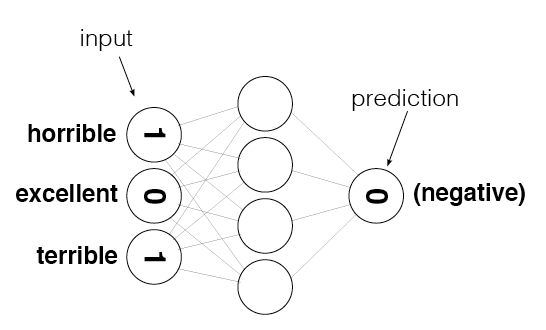

In [17]:
from IPython.display import Image

review = "This was a horrible, terrible movie."

Image(filename='sentiment_network.png')

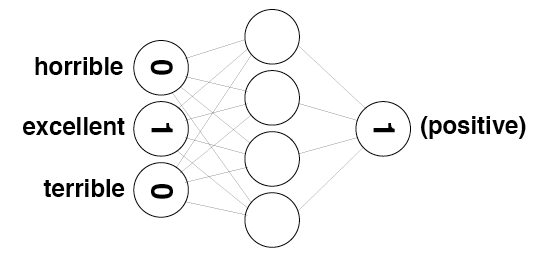

In [18]:
review = "The movie was excellent"

Image(filename='sentiment_network_pos.png')

# Project 2: Creating the Input/Output Data<a id='project_2'></a>

**TODO:** Create a [set](https://docs.python.org/3/tutorial/datastructures.html#sets) named `vocab` that contains every word in the vocabulary.

In [19]:
# TODO: Create set named "vocab" containing all of the words from all of the reviews
vocab = set()
for review in reviews:
    for word in review.split(" "):
        vocab.add(word)

Run the following cell to check your vocabulary size. If everything worked correctly, it should print **74074**

In [20]:
vocab_size = len(vocab)
print(vocab_size)

74074


Take a look at the following image. It represents the layers of the neural network you'll be building throughout this notebook. `layer_0` is the input layer, `layer_1` is a hidden layer, and `layer_2` is the output layer.

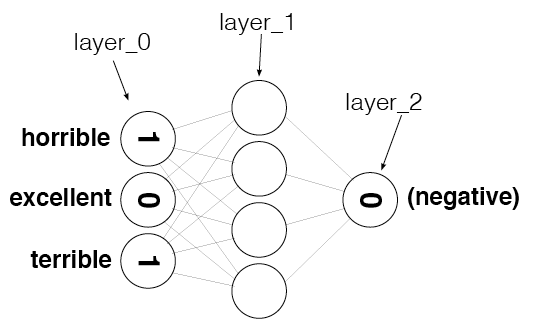

In [21]:
from IPython.display import Image
Image(filename='sentiment_network_2.png')

**TODO:** Create a numpy array called `layer_0` and initialize it to all zeros. You will find the [zeros](https://docs.scipy.org/doc/numpy/reference/generated/numpy.zeros.html) function particularly helpful here. Be sure you create `layer_0` as a 2-dimensional matrix with 1 row and `vocab_size` columns. 

In [22]:
# TODO: Create layer_0 matrix with dimensions 1 by vocab_size, initially filled with zeros
layer_0 = np.zeros((1,vocab_size))

Run the following cell. It should display `(1, 74074)`

In [23]:
layer_0.shape

(1, 74074)

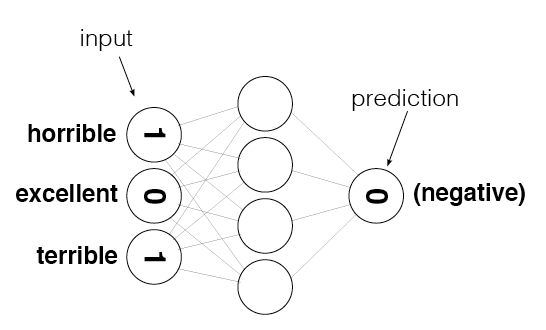

In [24]:
from IPython.display import Image
Image(filename='sentiment_network.png')

`layer_0` contains one entry for every word in the vocabulary, as shown in the above image. We need to make sure we know the index of each word, so run the following cell to create a lookup table that stores the index of every word.

In [25]:
# Create a dictionary of words in the vocabulary mapped to index positions
# (to be used in layer_0)
word2index = {}
for i,word in enumerate(vocab):
    word2index[word] = i
    
# display the map of words to indices
# word2index

**TODO:**  Complete the implementation of `update_input_layer`. It should count 
          how many times each word is used in the given review, and then store
          those counts at the appropriate indices inside `layer_0`.

In [26]:
def update_input_layer(review):
    """ Modify the global layer_0 to represent the vector form of review.
    The element at a given index of layer_0 should represent
    how many times the given word occurs in the review.
    Args:
        review(string) - the string of the review
    Returns:
        None
    """ 
    global layer_0
    # clear out previous state by resetting the layer to be all 0s
    layer_0 *= 0
    word_freq_counter = Counter()
    
    for word in review.split(" "):
        word_freq_counter[word]+=1
        layer_0[0][word2index[word]] = word_freq_counter[word]
        
    # TODO: count how many times each word is used in the given review and store the results in layer_0 

Run the following cell to test updating the input layer with the first review. The indices assigned may not be the same as in the solution, but hopefully you'll see some non-zero values in `layer_0`.  

In [27]:
update_input_layer(reviews[0])
layer_0



array([[18.,  0.,  0., ...,  0.,  0.,  0.]])

**TODO:** Complete the implementation of `get_target_for_labels`. It should return `0` or `1`, 
          depending on whether the given label is `NEGATIVE` or `POSITIVE`, respectively.

In [28]:
def get_target_for_label(label):
    """Convert a label to `0` or `1`.
    Args:
        label(string) - Either "POSITIVE" or "NEGATIVE".
    Returns:
        `0` or `1`.
    """
    # TODO: Your code here
    if label == "POSITIVE":
        return 1
    else : return 0

Run the following two cells. They should print out`'POSITIVE'` and `1`, respectively.

In [29]:
labels[0]

'POSITIVE'

In [30]:
get_target_for_label(labels[0])

1

Run the following two cells. They should print out `'NEGATIVE'` and `0`, respectively.

In [31]:
labels[1]

'NEGATIVE'

In [32]:
get_target_for_label(labels[1])

0

# End of Project 2. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Project 3: Building a Neural Network<a id='project_3'></a>

**TODO:** We've included the framework of a class called `SentimentNetork`. Implement all of the items marked `TODO` in the code. These include doing the following:
- Create a basic neural network much like the networks you've seen in earlier lessons and in Project 1, with an input layer, a hidden layer, and an output layer. 
- Do **not** add a non-linearity in the hidden layer. That is, do not use an activation function when calculating the hidden layer outputs.
- Re-use the code from earlier in this notebook to create the training data (see `TODO`s in the code)
- Implement the `pre_process_data` function to create the vocabulary for our training data generating functions
- Ensure `train` trains over the entire corpus

### Where to Get Help if You Need it
- Re-watch earlier Udacity lectures
- Chapters 3-5 - [Grokking Deep Learning](https://www.manning.com/books/grokking-deep-learning) - (Check inside your classroom for a discount code)

In [33]:
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        
        review_vocab = set()
        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words 
        #       using "split(' ')" instead of "split()".
        for review in reviews:
            for word in review.split(' '):
                review_vocab.add(word)
        
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        label_vocab = set()
        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.
        for label in labels:
            label_vocab.add(label)
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        for i,word in enumerate(self.review_vocab):
            self.word2index[word]=i 
            
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        # TODO: do the same thing you did for self.word2index and self.review_vocab, 
        #       but for self.label2index and self.label_vocab instead
        for i,label in enumerate(self.label_vocab):
            self.label2index[label]=i 
         
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((input_nodes,hidden_nodes))
        
        # TODO: initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
#         self.weights_1_2 = np.zeros((hidden_nodes,output_nodes))
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5, 
                                                (self.hidden_nodes, self.output_nodes))
        
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
        self.layer_0 = np.zeros((1,input_nodes))
    
        
    def update_input_layer(self,review):
        # TODO: You can copy most of the code you wrote for update_input_layer 
        #       earlier in this notebook. 
        #
        #       However, MAKE SURE YOU CHANGE ALL VARIABLES TO REFERENCE
        #       THE VERSIONS STORED IN THIS OBJECT, NOT THE GLOBAL OBJECTS.
        #       For example, replace "layer_0 *= 0" with "self.layer_0 *= 0"
        
        # clear out previous state by resetting the layer to be all 0s
        self.layer_0 *= 0
        
        for word in review.split(" "):
            if (word in self.word2index.keys()):
                self.layer_0[0][self.word2index[word]] += 1
                
    def get_target_for_label(self,label):
        # TODO: Copy the code you wrote for get_target_for_label 
        #       earlier in this notebook. 
        if label == "POSITIVE":
            return 1
        else : return 0
        
    def sigmoid(self,x):
        # TODO: Return the result of calculating the sigmoid activation function
        #       shown in the lectures
        return 1/(1+np.exp(-x)) 
    
    def sigmoid_output_2_derivative(self,output):
        # TODO: Return the derivative of the sigmoid activation function, 
        #       where "output" is the original output from the sigmoid fucntion 
        return output*(1-output)

    def train(self, training_reviews, training_labels):
        
        # make sure out we have a matching number of reviews and labels
        assert (len(training_reviews) == len(training_labels))

        # Keep track of correct predictions to display accuracy during training
        correct_so_far = 0

        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):

            # TODO: Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            output = np.array(self.get_target_for_label(label))
            output = output.reshape((1,1))
            # print(review)
            # print(output)

            # print(review)
            # print(label)
            self.update_input_layer(review)

            # TODO: Implement the forward pass through the network.
            #       That means use the given review to update the input layer,
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            #
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.

            # update_input_layer(review)
            # output = get_target_for_label(label)

            hidden_layer_input = np.dot(self.layer_0,self.weights_0_1)
            # print("Hidden Layer Input ",hidden_layer_input,"\nShape ",hidden_layer_input.shape)
            print("Hidden Layer Input Shape ",hidden_layer_input.shape)
            output_layer_input = np.dot(hidden_layer_input,self.weights_1_2)
            # print("Output Layer Input ", output_layer_input, "\nShape ", output_layer_input.shape)
            print("Output Layer Input Shape ",output_layer_input.shape)
            output_layer_output = self.sigmoid(output_layer_input)
            # print("Output Layer output ", output_layer_output, "\nShape ", output_layer_output.shape)
            # print("Actual output ", output, "\nShape ", output.shape)
            output_layer_error = output_layer_output - output
            # print("Output Layer Error ", output_layer_error, "\nShape ", output_layer_error.shape)
            output_layer_error_term = output_layer_error * self.sigmoid_output_2_derivative(output_layer_output)
            print("Output Layer Error Term ", output_layer_error_term, "\nShape ", output_layer_error_term.shape)

            # TODO: Implement the back propagation pass here.
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you
            #       learned in class.


            # print("Weight Shape ",self.weights_1_2.shape)
            # print("Output Layer Error Term Shape ",output_layer_error_term.shape)
            hidden_layer_error = np.dot(output_layer_error_term,self.weights_1_2.T)
            # print("Hidden layer error ",hidden_layer_error," Shape ",hidden_layer_error.shape)
            hidden_layer_error_term = hidden_layer_error
            # print("Hidden layer error term",hidden_layer_error_term, " Shape ", hidden_layer_error_term.shape)

            delta_weight_h_o = np.zeros((self.hidden_nodes,self.output_nodes))
            # print("Hidden to output delta weight ", delta_weight_h_o, " Shape ", delta_weight_h_o.shape)
            # print("Output Layer Error term ",output_layer_error_term," Shape ",output_layer_error_term.shape)
            # print("Hidden Layer Output ",hidden_layer_input," Shape ",hidden_layer_input.shape)
            delta_weight_h_o += (output_layer_error_term*hidden_layer_input.T)
            # print("Hidden to output delta weight ", delta_weight_h_o, " Shape ", delta_weight_h_o.shape)
            # print("Weight Hidden to Output ",self.weights_1_2," Shape ",self.weights_1_2.shape)
            self.weights_1_2 -=delta_weight_h_o * self.learning_rate
            # print("Weight Hidden to Output ", self.weights_1_2, " Shape ", self.weights_1_2.shape)

            delta_weight_i_h = np.zeros((self.input_nodes,self.hidden_nodes))
            delta_weight_i_h += (hidden_layer_error_term * self.layer_0.T)
            self.weights_0_1 -= delta_weight_i_h * self.learning_rate
            # print("Weight Input to Hidden", self.weights_0_1, " Shape ", self.weights_0_1.shape)





            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error
            #       is less than 0.5. If so, add one to the correct_so_far count.

            # For debug purposes, print out our prediction accuracy and speed
            # throughout the training process.

            print("Layer2",output_layer_output)
            if (output_layer_output[0] >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif (output_layer_output[0] < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0

            sys.stdout.write("\rProgress:" + str(100 * i / float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i + 1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i + 1))[:4] + "%")
            if (i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        
        self.update_input_layer(review.lower())
        
        hidden_layer_input = np.dot(self.layer_0, self.weights_0_1)
        # print("Hidden Layer Input ",hidden_layer_input,"\nShape ",hidden_layer_input.shape)
        output_layer_input = np.dot(hidden_layer_input, self.weights_1_2)
        # print("Output Layer Input ", output_layer_input, "\nShape ", output_layer_input.shape)
        output_layer_output = self.sigmoid(output_layer_input)
        # print("Output Layer output ", output_layer_output, "\nShape ", output_layer_output.shape)
        # print("Actual output ", output, "\nShape ", output.shape)
        
        # TODO: The output layer should now contain a prediction. 
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`, 
        #       and `NEGATIVE` otherwise.
        if (output_layer_output[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"

        
        

Run the following cell to create a `SentimentNetwork` that will train on all but the last 1000 reviews (we're saving those for testing). Here we use a learning rate of `0.1`.

In [40]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)

Run the following cell to test the network's performance against the last 1000 reviews (the ones we held out from our training set). 

**We have not trained the model yet, so the results should be about 50% as it will just be guessing and there are only two possible values to choose from.**

In [41]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:16.9% Speed(reviews/sec):678.5 #Correct:85 #Tested:170 Testing Accuracy:50.0%

Progress:32.3% Speed(reviews/sec):718.0 #Correct:162 #Tested:324 Testing Accuracy:50.0%

Progress:48.9% Speed(reviews/sec):750.0 #Correct:245 #Tested:490 Testing Accuracy:50.0%

Progress:66.0% Speed(reviews/sec):771.8 #Correct:331 #Tested:661 Testing Accuracy:50.0%

Progress:82.2% Speed(reviews/sec):776.3 #Correct:412 #Tested:823 Testing Accuracy:50.0%

Progress:96.0% Speed(reviews/sec):760.8 #Correct:481 #Tested:961 Testing Accuracy:50.0%

Progress:99.9% Speed(reviews/sec):764.6 #Correct:500 #Tested:1000 Testing Accuracy:50.0%

Run the following cell to actually train the network. During training, it will display the model's accuracy repeatedly as it trains so you can see how well it's doing.

In [42]:
mlp.train(reviews[:-1000],labels[:-1000])

Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.125]] 
Shape  (1, 1)
Layer2 [[0.5]]
Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.00% Speed(reviews/sec):19.14 #Correct:1 #Trained:2 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.00% Speed(reviews/sec):30.86 #Correct:2 #Trained:3 Training Accuracy:66.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.01% Speed(reviews/sec):39.01 #Correct:2 #Trained:4 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.01% Sp

Layer2 [[1.]]
Progress:0.20% Speed(reviews/sec):79.52 #Correct:26 #Trained:51 Training Accuracy:50.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.21% Speed(reviews/sec):79.42 #Correct:26 #Trained:52 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.21% Speed(reviews/sec):79.52 #Correct:27 #Trained:53 Training Accuracy:50.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.22% Speed(reviews/sec):79.64 #Correct:27 #Trained:54 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.22% Speed(reviews/sec):79.80 #Correct:28 #Trained:55 Training Accuracy:50.9%Hidden Layer Input Shape  (1, 10)
Outpu

Layer2 [[1.]]
Progress:0.42% Speed(reviews/sec):81.22 #Correct:52 #Trained:103 Training Accuracy:50.4%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.42% Speed(reviews/sec):80.81 #Correct:52 #Trained:104 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.43% Speed(reviews/sec):80.55 #Correct:53 #Trained:105 Training Accuracy:50.4%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.43% Speed(reviews/sec):80.29 #Correct:53 #Trained:106 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.44% Speed(reviews/sec):80.27 #Correct:54 #Trained:107 Training Accuracy:50.4%Hidden Layer Input Shape  (1, 10)


Progress:0.62% Speed(reviews/sec):80.56 #Correct:76 #Trained:152 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.63% Speed(reviews/sec):80.59 #Correct:77 #Trained:153 Training Accuracy:50.3%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.63% Speed(reviews/sec):80.53 #Correct:77 #Trained:154 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.64% Speed(reviews/sec):80.53 #Correct:78 #Trained:155 Training Accuracy:50.3%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.64% Speed(reviews/sec):80.43 #Correct:78 #Trained:156 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer I

Layer2 [[1.]]
Progress:0.86% Speed(reviews/sec):82.80 #Correct:104 #Trained:208 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.86% Speed(reviews/sec):82.76 #Correct:105 #Trained:209 Training Accuracy:50.2%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.87% Speed(reviews/sec):82.71 #Correct:105 #Trained:210 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.87% Speed(reviews/sec):82.72 #Correct:106 #Trained:211 Training Accuracy:50.2%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.87% Speed(reviews/sec):82.71 #Correct:106 #Trained:212 Training Accuracy:50.0%Hidden Layer Input Shape  (1,

Layer2 [[1.]]
Progress:1.09% Speed(reviews/sec):84.27 #Correct:132 #Trained:264 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.1% Speed(reviews/sec):84.28 #Correct:133 #Trained:265 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.10% Speed(reviews/sec):84.24 #Correct:133 #Trained:266 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.10% Speed(reviews/sec):84.23 #Correct:134 #Trained:267 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.11% Speed(reviews/sec):84.18 #Correct:134 #Trained:268 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 

Layer2 [[1.]]
Progress:1.32% Speed(reviews/sec):85.23 #Correct:160 #Trained:319 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.32% Speed(reviews/sec):85.20 #Correct:160 #Trained:320 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.33% Speed(reviews/sec):85.19 #Correct:161 #Trained:321 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.33% Speed(reviews/sec):85.16 #Correct:161 #Trained:322 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.34% Speed(reviews/sec):85.14 #Correct:162 #Trained:323 Training Accuracy:50.1%Hidden Layer Input Shape  (1,

Layer2 [[1.]]
Progress:1.54% Speed(reviews/sec):85.51 #Correct:186 #Trained:372 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.55% Speed(reviews/sec):85.49 #Correct:187 #Trained:373 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.55% Speed(reviews/sec):85.47 #Correct:187 #Trained:374 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.55% Speed(reviews/sec):85.49 #Correct:188 #Trained:375 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.56% Speed(reviews/sec):85.48 #Correct:188 #Trained:376 Training Accuracy:50.0%Hidden Layer Input Shape  (1,

Layer2 [[1.]]
Progress:1.77% Speed(reviews/sec):85.82 #Correct:213 #Trained:426 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.77% Speed(reviews/sec):85.82 #Correct:214 #Trained:427 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.77% Speed(reviews/sec):85.80 #Correct:214 #Trained:428 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.78% Speed(reviews/sec):85.77 #Correct:215 #Trained:429 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.78% Speed(reviews/sec):85.73 #Correct:215 #Trained:430 Training Accuracy:50.0%Hidden Layer Input Shape  (1,

Progress:1.99% Speed(reviews/sec):85.92 #Correct:240 #Trained:479 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.99% Speed(reviews/sec):85.92 #Correct:240 #Trained:480 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:2.0% Speed(reviews/sec):85.94 #Correct:241 #Trained:481 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:2.00% Speed(reviews/sec):85.94 #Correct:241 #Trained:482 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:2.00% Speed(reviews/sec):85.95 #Correct:242 #Trained:483 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Lay

Progress:2.18% Speed(reviews/sec):84.99 #Correct:263 #Trained:526 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:2.19% Speed(reviews/sec):84.99 #Correct:264 #Trained:527 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:2.19% Speed(reviews/sec):84.95 #Correct:264 #Trained:528 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:2.2% Speed(reviews/sec):84.95 #Correct:265 #Trained:529 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:2.20% Speed(reviews/sec):84.92 #Correct:265 #Trained:530 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Lay

Layer2 [[1.]]
Progress:2.41% Speed(reviews/sec):85.46 #Correct:291 #Trained:581 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:2.42% Speed(reviews/sec):85.44 #Correct:291 #Trained:582 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:2.42% Speed(reviews/sec):85.44 #Correct:292 #Trained:583 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:2.42% Speed(reviews/sec):85.42 #Correct:292 #Trained:584 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:2.43% Speed(reviews/sec):85.41 #Correct:293 #Trained:585 Training Accuracy:50.0%Hidden Layer Input Shape  (1,

Layer2 [[1.]]
Progress:2.64% Speed(reviews/sec):85.67 #Correct:318 #Trained:636 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:2.65% Speed(reviews/sec):85.66 #Correct:319 #Trained:637 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:2.65% Speed(reviews/sec):85.63 #Correct:319 #Trained:638 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:2.65% Speed(reviews/sec):85.62 #Correct:320 #Trained:639 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:2.66% Speed(reviews/sec):85.61 #Correct:320 #Trained:640 Training Accuracy:50.0%Hidden Layer Input Shape  (1,

Layer2 [[1.]]
Progress:2.83% Speed(reviews/sec):84.90 #Correct:341 #Trained:682 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:2.84% Speed(reviews/sec):84.88 #Correct:342 #Trained:683 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:2.84% Speed(reviews/sec):84.86 #Correct:342 #Trained:684 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:2.85% Speed(reviews/sec):84.86 #Correct:343 #Trained:685 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:2.85% Speed(reviews/sec):84.83 #Correct:343 #Trained:686 Training Accuracy:50.0%Hidden Layer Input Shape  (1,

Progress:3.04% Speed(reviews/sec):84.69 #Correct:366 #Trained:732 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:3.05% Speed(reviews/sec):84.68 #Correct:367 #Trained:733 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:3.05% Speed(reviews/sec):84.68 #Correct:367 #Trained:734 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:3.05% Speed(reviews/sec):84.69 #Correct:368 #Trained:735 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:3.06% Speed(reviews/sec):84.69 #Correct:368 #Trained:736 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output La

Layer2 [[1.]]
Progress:3.27% Speed(reviews/sec):84.98 #Correct:394 #Trained:788 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:3.28% Speed(reviews/sec):84.97 #Correct:395 #Trained:789 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:3.28% Speed(reviews/sec):84.95 #Correct:395 #Trained:790 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:3.29% Speed(reviews/sec):84.92 #Correct:396 #Trained:791 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:3.29% Speed(reviews/sec):84.91 #Correct:396 #Trained:792 Training Accuracy:50.0%Hidden Layer Input Shape  (1,

Layer2 [[1.]]
Progress:3.43% Speed(reviews/sec):85.28 #Correct:413 #Trained:826 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:3.44% Speed(reviews/sec):85.27 #Correct:414 #Trained:827 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:3.44% Speed(reviews/sec):85.28 #Correct:414 #Trained:828 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:3.45% Speed(reviews/sec):85.29 #Correct:415 #Trained:829 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:3.45% Speed(reviews/sec):85.29 #Correct:415 #Trained:830 Training Accuracy:50.0%Hidden Layer Input Shape  (1,

Layer2 [[1.]]
Progress:3.64% Speed(reviews/sec):85.02 #Correct:438 #Trained:876 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:3.65% Speed(reviews/sec):85.02 #Correct:439 #Trained:877 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:3.65% Speed(reviews/sec):85.00 #Correct:439 #Trained:878 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:3.65% Speed(reviews/sec):84.98 #Correct:440 #Trained:879 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:3.66% Speed(reviews/sec):84.98 #Correct:440 #Trained:880 Training Accuracy:50.0%Hidden Layer Input Shape  (1,

Layer2 [[1.]]
Progress:3.80% Speed(reviews/sec):85.33 #Correct:457 #Trained:914 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:3.80% Speed(reviews/sec):85.32 #Correct:458 #Trained:915 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:3.81% Speed(reviews/sec):85.33 #Correct:458 #Trained:916 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:3.81% Speed(reviews/sec):85.33 #Correct:459 #Trained:917 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:3.82% Speed(reviews/sec):85.34 #Correct:459 #Trained:918 Training Accuracy:50.0%Hidden Layer Input Shape  (1,

Progress:4.03% Speed(reviews/sec):85.58 #Correct:485 #Trained:969 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:4.03% Speed(reviews/sec):85.57 #Correct:485 #Trained:970 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:4.04% Speed(reviews/sec):85.56 #Correct:486 #Trained:971 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:4.04% Speed(reviews/sec):85.55 #Correct:486 #Trained:972 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:4.05% Speed(reviews/sec):85.54 #Correct:487 #Trained:973 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output La

Layer2 [[1.]]
Progress:4.27% Speed(reviews/sec):85.80 #Correct:513 #Trained:1026 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.15544362e-30]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:4.27% Speed(reviews/sec):85.79 #Correct:514 #Trained:1027 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:4.27% Speed(reviews/sec):85.78 #Correct:514 #Trained:1028 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:4.28% Speed(reviews/sec):85.76 #Correct:515 #Trained:1029 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:4.28% Speed(reviews/sec):85.74 #Correct:515 #Trained:1030 Training Accuracy:50.0%Hidden Laye

Layer2 [[1.]]
Progress:4.49% Speed(reviews/sec):85.91 #Correct:540 #Trained:1080 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:4.5% Speed(reviews/sec):85.91 #Correct:541 #Trained:1081 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:4.50% Speed(reviews/sec):85.92 #Correct:541 #Trained:1082 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:4.50% Speed(reviews/sec):85.92 #Correct:542 #Trained:1083 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:4.51% Speed(reviews/sec):85.92 #Correct:542 #Trained:1084 Training Accuracy:50.0%Hidden Layer Input Shape 

Progress:4.72% Speed(reviews/sec):86.20 #Correct:568 #Trained:1136 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:4.73% Speed(reviews/sec):86.20 #Correct:569 #Trained:1137 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:4.73% Speed(reviews/sec):86.19 #Correct:569 #Trained:1138 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:4.74% Speed(reviews/sec):86.19 #Correct:570 #Trained:1139 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:4.74% Speed(reviews/sec):86.20 #Correct:570 #Trained:1140 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Outp

Layer2 [[1.]]
Progress:4.88% Speed(reviews/sec):86.38 #Correct:587 #Trained:1174 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:4.89% Speed(reviews/sec):86.39 #Correct:588 #Trained:1175 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:4.89% Speed(reviews/sec):86.39 #Correct:588 #Trained:1176 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:4.9% Speed(reviews/sec):86.39 #Correct:589 #Trained:1177 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:4.90% Speed(reviews/sec):86.39 #Correct:589 #Trained:1178 Training Accuracy:50.0%Hidden Layer Input Shape 

Layer2 [[1.]]
Progress:5.09% Speed(reviews/sec):86.09 #Correct:612 #Trained:1223 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:5.09% Speed(reviews/sec):86.08 #Correct:612 #Trained:1224 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:5.1% Speed(reviews/sec):86.08 #Correct:613 #Trained:1225 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:5.10% Speed(reviews/sec):86.07 #Correct:613 #Trained:1226 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:5.10% Speed(reviews/sec):86.06 #Correct:614 #Trained:1227 Training Accuracy:50.0%Hidden Layer Input Shape 

Layer2 [[1.]]
Progress:5.30% Speed(reviews/sec):85.92 #Correct:638 #Trained:1275 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:5.31% Speed(reviews/sec):85.93 #Correct:638 #Trained:1276 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:5.31% Speed(reviews/sec):85.93 #Correct:639 #Trained:1277 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:5.32% Speed(reviews/sec):85.93 #Correct:639 #Trained:1278 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:5.32% Speed(reviews/sec):85.93 #Correct:640 #Trained:1279 Training Accuracy:50.0%Hidden Layer Input Shape

Progress:5.53% Speed(reviews/sec):86.10 #Correct:665 #Trained:1330 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:5.54% Speed(reviews/sec):86.10 #Correct:666 #Trained:1331 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:5.54% Speed(reviews/sec):86.09 #Correct:666 #Trained:1332 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:5.55% Speed(reviews/sec):86.08 #Correct:667 #Trained:1333 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:5.55% Speed(reviews/sec):86.07 #Correct:667 #Trained:1334 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Outp

Progress:5.75% Speed(reviews/sec):85.97 #Correct:691 #Trained:1381 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:5.75% Speed(reviews/sec):85.97 #Correct:691 #Trained:1382 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:5.75% Speed(reviews/sec):85.96 #Correct:692 #Trained:1383 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:5.76% Speed(reviews/sec):85.95 #Correct:692 #Trained:1384 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:5.76% Speed(reviews/sec):85.94 #Correct:693 #Trained:1385 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Outp

Layer2 [[1.]]
Progress:5.96% Speed(reviews/sec):85.84 #Correct:716 #Trained:1432 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:5.96% Speed(reviews/sec):85.85 #Correct:717 #Trained:1433 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:5.97% Speed(reviews/sec):85.85 #Correct:717 #Trained:1434 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:5.97% Speed(reviews/sec):85.86 #Correct:718 #Trained:1435 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:5.97% Speed(reviews/sec):85.86 #Correct:718 #Trained:1436 Training Accuracy:50.0%Hidden Layer Input Shape

Layer2 [[1.]]
Progress:6.19% Speed(reviews/sec):85.91 #Correct:744 #Trained:1488 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:6.2% Speed(reviews/sec):85.92 #Correct:745 #Trained:1489 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:6.20% Speed(reviews/sec):85.92 #Correct:745 #Trained:1490 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:6.20% Speed(reviews/sec):85.93 #Correct:746 #Trained:1491 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:6.21% Speed(reviews/sec):85.93 #Correct:746 #Trained:1492 Training Accuracy:50.0%Hidden Layer Input Shape 

Layer2 [[1.]]
Progress:6.35% Speed(reviews/sec):86.07 #Correct:763 #Trained:1526 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:6.35% Speed(reviews/sec):86.08 #Correct:764 #Trained:1527 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:6.36% Speed(reviews/sec):86.08 #Correct:764 #Trained:1528 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:6.36% Speed(reviews/sec):86.09 #Correct:765 #Trained:1529 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:6.37% Speed(reviews/sec):86.09 #Correct:765 #Trained:1530 Training Accuracy:50.0%Hidden Layer Input Shape

Layer2 [[1.]]
Progress:6.51% Speed(reviews/sec):86.19 #Correct:782 #Trained:1564 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:6.51% Speed(reviews/sec):86.19 #Correct:783 #Trained:1565 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:6.52% Speed(reviews/sec):86.20 #Correct:783 #Trained:1566 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:6.52% Speed(reviews/sec):86.20 #Correct:784 #Trained:1567 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:6.52% Speed(reviews/sec):86.19 #Correct:784 #Trained:1568 Training Accuracy:50.0%Hidden Layer Input Shape

Layer2 [[1.]]
Progress:6.74% Speed(reviews/sec):86.29 #Correct:810 #Trained:1619 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:6.74% Speed(reviews/sec):86.29 #Correct:810 #Trained:1620 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:6.75% Speed(reviews/sec):86.28 #Correct:811 #Trained:1621 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:6.75% Speed(reviews/sec):86.28 #Correct:811 #Trained:1622 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:6.75% Speed(reviews/sec):86.27 #Correct:812 #Trained:1623 Training Accuracy:50.0%Hidden Layer Input Shape

Layer2 [[1.]]
Progress:6.97% Speed(reviews/sec):86.37 #Correct:837 #Trained:1674 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:6.97% Speed(reviews/sec):86.37 #Correct:838 #Trained:1675 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:6.97% Speed(reviews/sec):86.36 #Correct:838 #Trained:1676 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:6.98% Speed(reviews/sec):86.36 #Correct:839 #Trained:1677 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:6.98% Speed(reviews/sec):86.35 #Correct:839 #Trained:1678 Training Accuracy:50.0%Hidden Layer Input Shape

Progress:7.20% Speed(reviews/sec):86.53 #Correct:865 #Trained:1730 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:7.20% Speed(reviews/sec):86.53 #Correct:866 #Trained:1731 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:7.21% Speed(reviews/sec):86.54 #Correct:866 #Trained:1732 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:7.21% Speed(reviews/sec):86.54 #Correct:867 #Trained:1733 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:7.22% Speed(reviews/sec):86.54 #Correct:867 #Trained:1734 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Outp

Layer2 [[1.]]
Progress:7.36% Speed(reviews/sec):86.65 #Correct:884 #Trained:1768 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:7.36% Speed(reviews/sec):86.65 #Correct:885 #Trained:1769 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:7.37% Speed(reviews/sec):86.65 #Correct:885 #Trained:1770 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:7.37% Speed(reviews/sec):86.66 #Correct:886 #Trained:1771 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:7.37% Speed(reviews/sec):86.66 #Correct:886 #Trained:1772 Training Accuracy:50.0%Hidden Layer Input Shape

Layer2 [[1.]]
Progress:7.52% Speed(reviews/sec):86.76 #Correct:903 #Trained:1806 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:7.52% Speed(reviews/sec):86.76 #Correct:904 #Trained:1807 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:7.52% Speed(reviews/sec):86.75 #Correct:904 #Trained:1808 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:7.53% Speed(reviews/sec):86.75 #Correct:905 #Trained:1809 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:7.53% Speed(reviews/sec):86.74 #Correct:905 #Trained:1810 Training Accuracy:50.0%Hidden Layer Input Shape

Layer2 [[1.]]
Progress:7.75% Speed(reviews/sec):86.87 #Correct:931 #Trained:1862 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:7.75% Speed(reviews/sec):86.88 #Correct:932 #Trained:1863 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:7.76% Speed(reviews/sec):86.88 #Correct:932 #Trained:1864 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:7.76% Speed(reviews/sec):86.88 #Correct:933 #Trained:1865 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:7.77% Speed(reviews/sec):86.88 #Correct:933 #Trained:1866 Training Accuracy:50.0%Hidden Layer Input Shape

Layer2 [[1.]]
Progress:7.98% Speed(reviews/sec):86.96 #Correct:959 #Trained:1917 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:7.98% Speed(reviews/sec):86.96 #Correct:959 #Trained:1918 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:7.99% Speed(reviews/sec):86.96 #Correct:960 #Trained:1919 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:7.99% Speed(reviews/sec):86.96 #Correct:960 #Trained:1920 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:8.0% Speed(reviews/sec):86.96 #Correct:961 #Trained:1921 Training Accuracy:50.0%Hidden Layer Input Shape 

Layer2 [[1.]]
Progress:8.14% Speed(reviews/sec):87.07 #Correct:978 #Trained:1955 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:8.14% Speed(reviews/sec):87.06 #Correct:978 #Trained:1956 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:8.15% Speed(reviews/sec):87.06 #Correct:979 #Trained:1957 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:8.15% Speed(reviews/sec):87.05 #Correct:979 #Trained:1958 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:8.15% Speed(reviews/sec):87.05 #Correct:980 #Trained:1959 Training Accuracy:50.0%Hidden Layer Input Shape

Layer2 [[1.]]
Progress:8.37% Speed(reviews/sec):87.17 #Correct:1006 #Trained:2011 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:8.37% Speed(reviews/sec):87.17 #Correct:1006 #Trained:2012 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:8.38% Speed(reviews/sec):87.17 #Correct:1007 #Trained:2013 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:8.38% Speed(reviews/sec):87.16 #Correct:1007 #Trained:2014 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:8.39% Speed(reviews/sec):87.16 #Correct:1008 #Trained:2015 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:8.53% Speed(reviews/sec):87.24 #Correct:1025 #Trained:2049 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:8.53% Speed(reviews/sec):87.24 #Correct:1025 #Trained:2050 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:8.54% Speed(reviews/sec):87.24 #Correct:1026 #Trained:2051 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:8.54% Speed(reviews/sec):87.24 #Correct:1026 #Trained:2052 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:8.55% Speed(reviews/sec):87.25 #Correct:1027 #Trained:2053 Training Accuracy:50.0%Hidden Layer Input 

Progress:8.76% Speed(reviews/sec):87.34 #Correct:1053 #Trained:2105 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:8.77% Speed(reviews/sec):87.34 #Correct:1053 #Trained:2106 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:8.77% Speed(reviews/sec):87.34 #Correct:1054 #Trained:2107 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:8.77% Speed(reviews/sec):87.33 #Correct:1054 #Trained:2108 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:8.78% Speed(reviews/sec):87.33 #Correct:1055 #Trained:2109 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Layer2 [[1.]]
Progress:8.99% Speed(reviews/sec):87.36 #Correct:1080 #Trained:2159 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:8.99% Speed(reviews/sec):87.36 #Correct:1080 #Trained:2160 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:9.0% Speed(reviews/sec):87.36 #Correct:1081 #Trained:2161 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:9.00% Speed(reviews/sec):87.35 #Correct:1081 #Trained:2162 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:9.00% Speed(reviews/sec):87.35 #Correct:1082 #Trained:2163 Training Accuracy:50.0%Hidden Layer Input S

Layer2 [[1.]]
Progress:9.36% Speed(reviews/sec):87.32 #Correct:1124 #Trained:2248 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:9.36% Speed(reviews/sec):87.32 #Correct:1125 #Trained:2249 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:9.37% Speed(reviews/sec):87.31 #Correct:1125 #Trained:2250 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:9.37% Speed(reviews/sec):87.31 #Correct:1126 #Trained:2251 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:9.37% Speed(reviews/sec):87.29 #Correct:1126 #Trained:2252 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:9.58% Speed(reviews/sec):87.29 #Correct:1151 #Trained:2301 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:9.58% Speed(reviews/sec):87.29 #Correct:1151 #Trained:2302 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:9.59% Speed(reviews/sec):87.28 #Correct:1152 #Trained:2303 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:9.59% Speed(reviews/sec):87.28 #Correct:1152 #Trained:2304 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:9.6% Speed(reviews/sec):87.28 #Correct:1153 #Trained:2305 Training Accuracy:50.0%Hidden Layer Input S

Layer2 [[1.]]
Progress:9.81% Speed(reviews/sec):87.35 #Correct:1178 #Trained:2356 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:9.81% Speed(reviews/sec):87.35 #Correct:1179 #Trained:2357 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:9.82% Speed(reviews/sec):87.35 #Correct:1179 #Trained:2358 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:9.82% Speed(reviews/sec):87.35 #Correct:1180 #Trained:2359 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:9.82% Speed(reviews/sec):87.36 #Correct:1180 #Trained:2360 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:10.0% Speed(reviews/sec):87.33 #Correct:1205 #Trained:2410 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.0% Speed(reviews/sec):87.32 #Correct:1206 #Trained:2411 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.0% Speed(reviews/sec):87.32 #Correct:1206 #Trained:2412 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.0% Speed(reviews/sec):87.31 #Correct:1207 #Trained:2413 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.0% Speed(reviews/sec):87.31 #Correct:1207 #Trained:2414 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:10.2% Speed(reviews/sec):87.13 #Correct:1229 #Trained:2458 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.2% Speed(reviews/sec):87.12 #Correct:1230 #Trained:2459 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.2% Speed(reviews/sec):87.11 #Correct:1230 #Trained:2460 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.2% Speed(reviews/sec):87.11 #Correct:1231 #Trained:2461 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.2% Speed(reviews/sec):87.10 #Correct:1231 #Trained:2462 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:10.4% Speed(reviews/sec):87.02 #Correct:1254 #Trained:2508 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.4% Speed(reviews/sec):87.02 #Correct:1255 #Trained:2509 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.4% Speed(reviews/sec):87.02 #Correct:1255 #Trained:2510 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.4% Speed(reviews/sec):87.02 #Correct:1256 #Trained:2511 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.4% Speed(reviews/sec):87.02 #Correct:1256 #Trained:2512 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:10.6% Speed(reviews/sec):87.08 #Correct:1273 #Trained:2546 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.6% Speed(reviews/sec):87.08 #Correct:1274 #Trained:2547 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.6% Speed(reviews/sec):87.08 #Correct:1274 #Trained:2548 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.6% Speed(reviews/sec):87.08 #Correct:1275 #Trained:2549 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.6% Speed(reviews/sec):87.08 #Correct:1275 #Trained:2550 Training Accuracy:50.0%Hidden Layer Input 

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.8% Speed(reviews/sec):87.06 #Correct:1300 #Trained:2600 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.8% Speed(reviews/sec):87.06 #Correct:1301 #Trained:2601 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.8% Speed(reviews/sec):87.05 #Correct:1301 #Trained:2602 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.8% Speed(reviews/sec):87.05 #Correct:1302 #Trained:2603 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.8% Speed(reviews/s

Layer2 [[1.]]
Progress:10.9% Speed(reviews/sec):87.12 #Correct:1319 #Trained:2638 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.9% Speed(reviews/sec):87.11 #Correct:1320 #Trained:2639 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:10.9% Speed(reviews/sec):87.11 #Correct:1320 #Trained:2640 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.77493704e-30]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:11.0% Speed(reviews/sec):87.11 #Correct:1321 #Trained:2641 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:11.0% Speed(reviews/sec):87.11 #Correct:1321 #Trained:2642 Training Accuracy:50.0%Hidden

Progress:11.2% Speed(reviews/sec):87.17 #Correct:1347 #Trained:2693 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:11.2% Speed(reviews/sec):87.16 #Correct:1347 #Trained:2694 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:11.2% Speed(reviews/sec):87.16 #Correct:1348 #Trained:2695 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:11.2% Speed(reviews/sec):87.16 #Correct:1348 #Trained:2696 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:11.2% Speed(reviews/sec):87.15 #Correct:1349 #Trained:2697 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Layer2 [[1.]]
Progress:11.4% Speed(reviews/sec):87.23 #Correct:1375 #Trained:2749 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:11.4% Speed(reviews/sec):87.23 #Correct:1375 #Trained:2750 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:11.4% Speed(reviews/sec):87.24 #Correct:1376 #Trained:2751 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:11.4% Speed(reviews/sec):87.24 #Correct:1376 #Trained:2752 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:11.4% Speed(reviews/sec):87.24 #Correct:1377 #Trained:2753 Training Accuracy:50.0%Hidden Layer Input 

Progress:11.6% Speed(reviews/sec):87.00 #Correct:1398 #Trained:2795 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:11.6% Speed(reviews/sec):86.99 #Correct:1398 #Trained:2796 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:11.6% Speed(reviews/sec):86.98 #Correct:1399 #Trained:2797 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:11.6% Speed(reviews/sec):86.97 #Correct:1399 #Trained:2798 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:11.6% Speed(reviews/sec):86.96 #Correct:1400 #Trained:2799 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Progress:11.8% Speed(reviews/sec):86.73 #Correct:1420 #Trained:2840 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:11.8% Speed(reviews/sec):86.72 #Correct:1421 #Trained:2841 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:11.8% Speed(reviews/sec):86.72 #Correct:1421 #Trained:2842 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:11.8% Speed(reviews/sec):86.72 #Correct:1422 #Trained:2843 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:11.8% Speed(reviews/sec):86.72 #Correct:1422 #Trained:2844 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Layer2 [[1.]]
Progress:12.0% Speed(reviews/sec):86.80 #Correct:1448 #Trained:2896 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:12.0% Speed(reviews/sec):86.80 #Correct:1449 #Trained:2897 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:12.0% Speed(reviews/sec):86.80 #Correct:1449 #Trained:2898 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:12.0% Speed(reviews/sec):86.81 #Correct:1450 #Trained:2899 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:12.0% Speed(reviews/sec):86.81 #Correct:1450 #Trained:2900 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:12.2% Speed(reviews/sec):86.87 #Correct:1467 #Trained:2934 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:12.2% Speed(reviews/sec):86.87 #Correct:1468 #Trained:2935 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:12.2% Speed(reviews/sec):86.87 #Correct:1468 #Trained:2936 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:12.2% Speed(reviews/sec):86.87 #Correct:1469 #Trained:2937 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:12.2% Speed(reviews/sec):86.88 #Correct:1469 #Trained:2938 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:12.4% Speed(reviews/sec):86.76 #Correct:1493 #Trained:2985 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:12.4% Speed(reviews/sec):86.76 #Correct:1493 #Trained:2986 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:12.4% Speed(reviews/sec):86.76 #Correct:1494 #Trained:2987 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:12.4% Speed(reviews/sec):86.75 #Correct:1494 #Trained:2988 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:12.4% Speed(reviews/sec):86.75 #Correct:1495 #Trained:2989 Training Accuracy:50.0%Hidden Layer Input 

Progress:12.6% Speed(reviews/sec):86.63 #Correct:1517 #Trained:3033 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:12.6% Speed(reviews/sec):86.63 #Correct:1517 #Trained:3034 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:12.6% Speed(reviews/sec):86.63 #Correct:1518 #Trained:3035 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:12.6% Speed(reviews/sec):86.62 #Correct:1518 #Trained:3036 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:12.6% Speed(reviews/sec):86.62 #Correct:1519 #Trained:3037 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Layer2 [[1.]]
Progress:12.8% Speed(reviews/sec):86.47 #Correct:1541 #Trained:3082 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:12.8% Speed(reviews/sec):86.46 #Correct:1542 #Trained:3083 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:12.8% Speed(reviews/sec):86.46 #Correct:1542 #Trained:3084 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:12.8% Speed(reviews/sec):86.45 #Correct:1543 #Trained:3085 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:12.8% Speed(reviews/sec):86.45 #Correct:1543 #Trained:3086 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:13.0% Speed(reviews/sec):86.41 #Correct:1567 #Trained:3133 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:13.0% Speed(reviews/sec):86.40 #Correct:1567 #Trained:3134 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:13.0% Speed(reviews/sec):86.40 #Correct:1568 #Trained:3135 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:13.0% Speed(reviews/sec):86.40 #Correct:1568 #Trained:3136 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:13.0% Speed(reviews/sec):86.40 #Correct:1569 #Trained:3137 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:13.2% Speed(reviews/sec):86.45 #Correct:1586 #Trained:3171 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:13.2% Speed(reviews/sec):86.45 #Correct:1586 #Trained:3172 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:13.2% Speed(reviews/sec):86.46 #Correct:1587 #Trained:3173 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:13.2% Speed(reviews/sec):86.46 #Correct:1587 #Trained:3174 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:13.2% Speed(reviews/sec):86.46 #Correct:1588 #Trained:3175 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:13.4% Speed(reviews/sec):86.42 #Correct:1612 #Trained:3223 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:13.4% Speed(reviews/sec):86.42 #Correct:1612 #Trained:3224 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:13.4% Speed(reviews/sec):86.42 #Correct:1613 #Trained:3225 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:13.4% Speed(reviews/sec):86.42 #Correct:1613 #Trained:3226 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:13.4% Speed(reviews/sec):86.42 #Correct:1614 #Trained:3227 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:13.6% Speed(reviews/sec):86.33 #Correct:1637 #Trained:3274 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:13.6% Speed(reviews/sec):86.33 #Correct:1638 #Trained:3275 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:13.6% Speed(reviews/sec):86.32 #Correct:1638 #Trained:3276 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:13.6% Speed(reviews/sec):86.32 #Correct:1639 #Trained:3277 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:13.6% Speed(reviews/sec):86.31 #Correct:1639 #Trained:3278 Training Accuracy:50.0%Hidden Layer Input 

Progress:13.8% Speed(reviews/sec):86.24 #Correct:1662 #Trained:3324 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:13.8% Speed(reviews/sec):86.24 #Correct:1663 #Trained:3325 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:13.8% Speed(reviews/sec):86.24 #Correct:1663 #Trained:3326 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:13.8% Speed(reviews/sec):86.24 #Correct:1664 #Trained:3327 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:13.8% Speed(reviews/sec):86.24 #Correct:1664 #Trained:3328 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Layer2 [[1.]]
Progress:14.0% Speed(reviews/sec):86.29 #Correct:1690 #Trained:3379 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:14.0% Speed(reviews/sec):86.29 #Correct:1690 #Trained:3380 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:14.0% Speed(reviews/sec):86.29 #Correct:1691 #Trained:3381 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:14.0% Speed(reviews/sec):86.28 #Correct:1691 #Trained:3382 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:14.0% Speed(reviews/sec):86.28 #Correct:1692 #Trained:3383 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:14.2% Speed(reviews/sec):86.14 #Correct:1714 #Trained:3427 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:14.2% Speed(reviews/sec):86.14 #Correct:1714 #Trained:3428 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:14.2% Speed(reviews/sec):86.13 #Correct:1715 #Trained:3429 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:14.2% Speed(reviews/sec):86.13 #Correct:1715 #Trained:3430 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:14.2% Speed(reviews/sec):86.12 #Correct:1716 #Trained:3431 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:14.4% Speed(reviews/sec):86.09 #Correct:1739 #Trained:3478 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:14.4% Speed(reviews/sec):86.06 #Correct:1740 #Trained:3479 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:14.4% Speed(reviews/sec):86.06 #Correct:1740 #Trained:3480 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:14.5% Speed(reviews/sec):86.06 #Correct:1741 #Trained:3481 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:14.5% Speed(reviews/sec):86.06 #Correct:1741 #Trained:3482 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:14.7% Speed(reviews/sec):86.03 #Correct:1765 #Trained:3529 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:14.7% Speed(reviews/sec):86.03 #Correct:1765 #Trained:3530 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:14.7% Speed(reviews/sec):86.03 #Correct:1766 #Trained:3531 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:14.7% Speed(reviews/sec):86.02 #Correct:1766 #Trained:3532 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:14.7% Speed(reviews/sec):86.02 #Correct:1767 #Trained:3533 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:14.8% Speed(reviews/sec):85.89 #Correct:1788 #Trained:3576 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:14.9% Speed(reviews/sec):85.89 #Correct:1789 #Trained:3577 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:14.9% Speed(reviews/sec):85.89 #Correct:1789 #Trained:3578 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:14.9% Speed(reviews/sec):85.88 #Correct:1790 #Trained:3579 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:14.9% Speed(reviews/sec):85.88 #Correct:1790 #Trained:3580 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:15.0% Speed(reviews/sec):85.75 #Correct:1812 #Trained:3623 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:15.0% Speed(reviews/sec):85.74 #Correct:1812 #Trained:3624 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:15.1% Speed(reviews/sec):85.74 #Correct:1813 #Trained:3625 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:15.1% Speed(reviews/sec):85.73 #Correct:1813 #Trained:3626 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:15.1% Speed(reviews/sec):85.73 #Correct:1814 #Trained:3627 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:15.3% Speed(reviews/sec):85.66 #Correct:1837 #Trained:3674 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:15.3% Speed(reviews/sec):85.66 #Correct:1838 #Trained:3675 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:15.3% Speed(reviews/sec):85.66 #Correct:1838 #Trained:3676 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:15.3% Speed(reviews/sec):85.65 #Correct:1839 #Trained:3677 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:15.3% Speed(reviews/sec):85.65 #Correct:1839 #Trained:3678 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:15.5% Speed(reviews/sec):85.53 #Correct:1861 #Trained:3721 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:15.5% Speed(reviews/sec):85.52 #Correct:1861 #Trained:3722 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:15.5% Speed(reviews/sec):85.52 #Correct:1862 #Trained:3723 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:15.5% Speed(reviews/sec):85.51 #Correct:1862 #Trained:3724 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:15.5% Speed(reviews/sec):85.51 #Correct:1863 #Trained:3725 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:15.6% Speed(reviews/sec):85.36 #Correct:1884 #Trained:3767 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:15.6% Speed(reviews/sec):85.36 #Correct:1884 #Trained:3768 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:15.7% Speed(reviews/sec):85.36 #Correct:1885 #Trained:3769 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:15.7% Speed(reviews/sec):85.35 #Correct:1885 #Trained:3770 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:15.7% Speed(reviews/sec):85.35 #Correct:1886 #Trained:3771 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:15.9% Speed(reviews/sec):85.33 #Correct:1909 #Trained:3818 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:15.9% Speed(reviews/sec):85.33 #Correct:1910 #Trained:3819 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:15.9% Speed(reviews/sec):85.33 #Correct:1910 #Trained:3820 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:15.9% Speed(reviews/sec):85.34 #Correct:1911 #Trained:3821 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:15.9% Speed(reviews/sec):85.34 #Correct:1911 #Trained:3822 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:16.1% Speed(reviews/sec):85.24 #Correct:1934 #Trained:3867 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:16.1% Speed(reviews/sec):85.23 #Correct:1934 #Trained:3868 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:16.1% Speed(reviews/sec):85.23 #Correct:1935 #Trained:3869 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:16.1% Speed(reviews/sec):85.22 #Correct:1935 #Trained:3870 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:16.1% Speed(reviews/sec):85.22 #Correct:1936 #Trained:3871 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:16.2% Speed(reviews/sec):85.02 #Correct:1955 #Trained:3910 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:16.2% Speed(reviews/sec):85.02 #Correct:1956 #Trained:3911 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:16.2% Speed(reviews/sec):85.01 #Correct:1956 #Trained:3912 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:16.3% Speed(reviews/sec):85.02 #Correct:1957 #Trained:3913 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:16.3% Speed(reviews/sec):85.02 #Correct:1957 #Trained:3914 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:16.4% Speed(reviews/sec):84.98 #Correct:1980 #Trained:3960 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:16.5% Speed(reviews/sec):84.98 #Correct:1981 #Trained:3961 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:16.5% Speed(reviews/sec):84.97 #Correct:1981 #Trained:3962 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:16.5% Speed(reviews/sec):84.97 #Correct:1982 #Trained:3963 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:16.5% Speed(reviews/sec):84.97 #Correct:1982 #Trained:3964 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:16.7% Speed(reviews/sec):84.90 #Correct:2005 #Trained:4009 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:16.7% Speed(reviews/sec):84.90 #Correct:2005 #Trained:4010 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:16.7% Speed(reviews/sec):84.90 #Correct:2006 #Trained:4011 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:16.7% Speed(reviews/sec):84.89 #Correct:2006 #Trained:4012 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:16.7% Speed(reviews/sec):84.89 #Correct:2007 #Trained:4013 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:16.9% Speed(reviews/sec):84.82 #Correct:2029 #Trained:4058 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:16.9% Speed(reviews/sec):84.82 #Correct:2030 #Trained:4059 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:16.9% Speed(reviews/sec):84.82 #Correct:2030 #Trained:4060 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:16.9% Speed(reviews/sec):84.82 #Correct:2031 #Trained:4061 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:16.9% Speed(reviews/sec):84.81 #Correct:2031 #Trained:4062 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:17.1% Speed(reviews/sec):84.87 #Correct:2056 #Trained:4112 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:17.1% Speed(reviews/sec):84.87 #Correct:2057 #Trained:4113 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:17.1% Speed(reviews/sec):84.86 #Correct:2057 #Trained:4114 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:17.1% Speed(reviews/sec):84.86 #Correct:2058 #Trained:4115 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:17.1% Speed(reviews/sec):84.86 #Correct:2058 #Trained:4116 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:17.2% Speed(reviews/sec):84.92 #Correct:2075 #Trained:4150 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:17.2% Speed(reviews/sec):84.92 #Correct:2076 #Trained:4151 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:17.2% Speed(reviews/sec):84.92 #Correct:2076 #Trained:4152 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:17.3% Speed(reviews/sec):84.92 #Correct:2077 #Trained:4153 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:17.3% Speed(reviews/sec):84.91 #Correct:2077 #Trained:4154 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:17.5% Speed(reviews/sec):84.93 #Correct:2102 #Trained:4203 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:17.5% Speed(reviews/sec):84.93 #Correct:2102 #Trained:4204 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:17.5% Speed(reviews/sec):84.93 #Correct:2103 #Trained:4205 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:17.5% Speed(reviews/sec):84.93 #Correct:2103 #Trained:4206 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:17.5% Speed(reviews/sec):84.93 #Correct:2104 #Trained:4207 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:17.6% Speed(reviews/sec):84.98 #Correct:2121 #Trained:4241 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:17.6% Speed(reviews/sec):84.99 #Correct:2121 #Trained:4242 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:17.6% Speed(reviews/sec):84.99 #Correct:2122 #Trained:4243 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:17.6% Speed(reviews/sec):84.99 #Correct:2122 #Trained:4244 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:17.6% Speed(reviews/sec):84.99 #Correct:2123 #Trained:4245 Training Accuracy:50.0%Hidden Layer Input 

Progress:17.8% Speed(reviews/sec):85.05 #Correct:2140 #Trained:4279 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:17.8% Speed(reviews/sec):85.05 #Correct:2140 #Trained:4280 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:17.8% Speed(reviews/sec):85.05 #Correct:2141 #Trained:4281 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:17.8% Speed(reviews/sec):85.05 #Correct:2141 #Trained:4282 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:17.8% Speed(reviews/sec):85.05 #Correct:2142 #Trained:4283 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:18.1% Speed(reviews/sec):85.13 #Correct:2177 #Trained:4354 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:18.1% Speed(reviews/sec):85.13 #Correct:2178 #Trained:4355 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:18.1% Speed(reviews/sec):85.12 #Correct:2178 #Trained:4356 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:18.1% Speed(reviews/sec):85.12 #Correct:2179 #Trained:4357 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:18.1% Speed(reviews/s

Layer2 [[1.]]
Progress:18.2% Speed(reviews/sec):85.18 #Correct:2196 #Trained:4392 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:18.3% Speed(reviews/sec):85.18 #Correct:2197 #Trained:4393 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:18.3% Speed(reviews/sec):85.18 #Correct:2197 #Trained:4394 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:18.3% Speed(reviews/sec):85.18 #Correct:2198 #Trained:4395 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:18.3% Speed(reviews/sec):85.17 #Correct:2198 #Trained:4396 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:18.6% Speed(reviews/sec):85.27 #Correct:2234 #Trained:4467 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:18.6% Speed(reviews/sec):85.27 #Correct:2234 #Trained:4468 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:18.6% Speed(reviews/sec):85.27 #Correct:2235 #Trained:4469 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:18.6% Speed(reviews/sec):85.26 #Correct:2235 #Trained:4470 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:18.6% Speed(reviews/sec):85.26 #Correct:2236 #Trained:4471 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:18.8% Speed(reviews/sec):85.34 #Correct:2262 #Trained:4523 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:18.8% Speed(reviews/sec):85.34 #Correct:2262 #Trained:4524 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:18.8% Speed(reviews/sec):85.34 #Correct:2263 #Trained:4525 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:18.8% Speed(reviews/sec):85.33 #Correct:2263 #Trained:4526 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:18.8% Speed(reviews/sec):85.33 #Correct:2264 #Trained:4527 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:19.0% Speed(reviews/sec):85.35 #Correct:2289 #Trained:4577 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:19.0% Speed(reviews/sec):85.35 #Correct:2289 #Trained:4578 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:19.0% Speed(reviews/sec):85.35 #Correct:2290 #Trained:4579 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:19.0% Speed(reviews/sec):85.35 #Correct:2290 #Trained:4580 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:19.0% Speed(reviews/sec):85.35 #Correct:2291 #Trained:4581 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:19.2% Speed(reviews/sec):85.39 #Correct:2308 #Trained:4615 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.62863119e-06]] 
Shape  (1, 1)
Layer2 [[0.99999737]]
Progress:19.2% Speed(reviews/sec):85.39 #Correct:2308 #Trained:4616 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:19.2% Speed(reviews/sec):85.39 #Correct:2309 #Trained:4617 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:19.2% Speed(reviews/sec):85.40 #Correct:2309 #Trained:4618 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:19.2% Speed(reviews/sec):85.40 #Correct:2310 #Trained:4619 Training Accuracy:50.0

Layer2 [[1.]]
Progress:19.3% Speed(reviews/sec):85.44 #Correct:2327 #Trained:4653 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:19.3% Speed(reviews/sec):85.44 #Correct:2327 #Trained:4654 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:19.3% Speed(reviews/sec):85.44 #Correct:2328 #Trained:4655 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:19.3% Speed(reviews/sec):85.43 #Correct:2328 #Trained:4656 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:19.4% Speed(reviews/sec):85.43 #Correct:2329 #Trained:4657 Training Accuracy:50.0%Hidden Layer Input 

Progress:19.6% Speed(reviews/sec):85.51 #Correct:2355 #Trained:4709 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:19.6% Speed(reviews/sec):85.51 #Correct:2355 #Trained:4710 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:19.6% Speed(reviews/sec):85.51 #Correct:2356 #Trained:4711 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:19.6% Speed(reviews/sec):85.51 #Correct:2356 #Trained:4712 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:19.6% Speed(reviews/sec):85.50 #Correct:2357 #Trained:4713 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Layer2 [[1.]]
Progress:20.0% Speed(reviews/sec):85.59 #Correct:2401 #Trained:4802 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:20.0% Speed(reviews/sec):85.59 #Correct:2402 #Trained:4803 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:20.0% Speed(reviews/sec):85.59 #Correct:2402 #Trained:4804 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:20.0% Speed(reviews/sec):85.59 #Correct:2403 #Trained:4805 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:20.0% Speed(reviews/sec):85.58 #Correct:2403 #Trained:4806 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:20.2% Speed(reviews/sec):85.65 #Correct:2429 #Trained:4858 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:20.2% Speed(reviews/sec):85.65 #Correct:2430 #Trained:4859 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:20.2% Speed(reviews/sec):85.65 #Correct:2430 #Trained:4860 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:20.2% Speed(reviews/sec):85.65 #Correct:2431 #Trained:4861 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:20.2% Speed(reviews/sec):85.65 #Correct:2431 #Trained:4862 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:20.4% Speed(reviews/sec):85.67 #Correct:2456 #Trained:4912 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:20.4% Speed(reviews/sec):85.67 #Correct:2457 #Trained:4913 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:20.4% Speed(reviews/sec):85.67 #Correct:2457 #Trained:4914 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:20.4% Speed(reviews/sec):85.67 #Correct:2458 #Trained:4915 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:20.4% Speed(reviews/sec):85.66 #Correct:2458 #Trained:4916 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:20.6% Speed(reviews/sec):85.68 #Correct:2483 #Trained:4966 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:20.6% Speed(reviews/sec):85.68 #Correct:2484 #Trained:4967 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:20.6% Speed(reviews/sec):85.68 #Correct:2484 #Trained:4968 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:20.7% Speed(reviews/sec):85.69 #Correct:2485 #Trained:4969 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:20.7% Speed(reviews/sec):85.69 #Correct:2485 #Trained:4970 Training Accuracy:50.0%Hidden Layer Input 

Progress:20.9% Speed(reviews/sec):85.74 #Correct:2511 #Trained:5021 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:20.9% Speed(reviews/sec):85.73 #Correct:2511 #Trained:5022 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:20.9% Speed(reviews/sec):85.73 #Correct:2512 #Trained:5023 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:20.9% Speed(reviews/sec):85.73 #Correct:2512 #Trained:5024 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:20.9% Speed(reviews/sec):85.73 #Correct:2513 #Trained:5025 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Layer2 [[1.]]
Progress:21.1% Speed(reviews/sec):85.79 #Correct:2539 #Trained:5077 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:21.1% Speed(reviews/sec):85.79 #Correct:2539 #Trained:5078 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:21.1% Speed(reviews/sec):85.79 #Correct:2540 #Trained:5079 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:21.1% Speed(reviews/sec):85.79 #Correct:2540 #Trained:5080 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:21.1% Speed(reviews/sec):85.80 #Correct:2541 #Trained:5081 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:21.3% Speed(reviews/sec):85.72 #Correct:2563 #Trained:5126 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:21.3% Speed(reviews/sec):85.71 #Correct:2564 #Trained:5127 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:21.3% Speed(reviews/sec):85.70 #Correct:2564 #Trained:5128 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:21.3% Speed(reviews/sec):85.70 #Correct:2565 #Trained:5129 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:21.3% Speed(reviews/sec):85.69 #Correct:2565 #Trained:5130 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:21.5% Speed(reviews/sec):85.63 #Correct:2587 #Trained:5173 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:21.5% Speed(reviews/sec):85.63 #Correct:2587 #Trained:5174 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:21.5% Speed(reviews/sec):85.64 #Correct:2588 #Trained:5175 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:21.5% Speed(reviews/sec):85.63 #Correct:2588 #Trained:5176 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:21.5% Speed(reviews/sec):85.63 #Correct:2589 #Trained:5177 Training Accuracy:50.0%Hidden Layer Input 

Progress:21.7% Speed(reviews/sec):85.58 #Correct:2612 #Trained:5223 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:21.7% Speed(reviews/sec):85.58 #Correct:2612 #Trained:5224 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:21.7% Speed(reviews/sec):85.58 #Correct:2613 #Trained:5225 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:21.7% Speed(reviews/sec):85.58 #Correct:2613 #Trained:5226 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:21.7% Speed(reviews/sec):85.59 #Correct:2614 #Trained:5227 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Layer2 [[1.]]
Progress:21.9% Speed(reviews/sec):85.54 #Correct:2637 #Trained:5274 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:21.9% Speed(reviews/sec):85.54 #Correct:2638 #Trained:5275 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:21.9% Speed(reviews/sec):85.54 #Correct:2638 #Trained:5276 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:21.9% Speed(reviews/sec):85.54 #Correct:2639 #Trained:5277 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:21.9% Speed(reviews/sec):85.54 #Correct:2639 #Trained:5278 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:22.1% Speed(reviews/sec):85.51 #Correct:2663 #Trained:5325 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:22.1% Speed(reviews/sec):85.51 #Correct:2663 #Trained:5326 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:22.1% Speed(reviews/sec):85.50 #Correct:2664 #Trained:5327 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:22.1% Speed(reviews/sec):85.50 #Correct:2664 #Trained:5328 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:22.2% Speed(reviews/sec):85.49 #Correct:2665 #Trained:5329 Training Accuracy:50.0%Hidden Layer Input 

Progress:22.3% Speed(reviews/sec):85.41 #Correct:2686 #Trained:5371 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:22.3% Speed(reviews/sec):85.41 #Correct:2686 #Trained:5372 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:22.3% Speed(reviews/sec):85.40 #Correct:2687 #Trained:5373 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:22.3% Speed(reviews/sec):85.40 #Correct:2687 #Trained:5374 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:22.3% Speed(reviews/sec):85.40 #Correct:2688 #Trained:5375 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Layer2 [[1.]]
Progress:22.5% Speed(reviews/sec):85.37 #Correct:2711 #Trained:5422 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:22.5% Speed(reviews/sec):85.37 #Correct:2712 #Trained:5423 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:22.5% Speed(reviews/sec):85.37 #Correct:2712 #Trained:5424 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:22.6% Speed(reviews/sec):85.37 #Correct:2713 #Trained:5425 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:22.6% Speed(reviews/sec):85.37 #Correct:2713 #Trained:5426 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:22.8% Speed(reviews/sec):85.39 #Correct:2738 #Trained:5475 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:22.8% Speed(reviews/sec):85.39 #Correct:2738 #Trained:5476 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:22.8% Speed(reviews/sec):85.39 #Correct:2739 #Trained:5477 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:22.8% Speed(reviews/sec):85.38 #Correct:2739 #Trained:5478 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:22.8% Speed(reviews/sec):85.38 #Correct:2740 #Trained:5479 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:23.0% Speed(reviews/sec):85.38 #Correct:2764 #Trained:5527 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:23.0% Speed(reviews/sec):85.38 #Correct:2764 #Trained:5528 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:23.0% Speed(reviews/sec):85.39 #Correct:2765 #Trained:5529 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:23.0% Speed(reviews/sec):85.39 #Correct:2765 #Trained:5530 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:23.0% Speed(reviews/sec):85.39 #Correct:2766 #Trained:5531 Training Accuracy:50.0%Hidden Layer Input 

Progress:23.2% Speed(reviews/sec):85.36 #Correct:2789 #Trained:5578 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:23.2% Speed(reviews/sec):85.36 #Correct:2790 #Trained:5579 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:23.2% Speed(reviews/sec):85.36 #Correct:2790 #Trained:5580 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:23.2% Speed(reviews/sec):85.36 #Correct:2791 #Trained:5581 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:23.2% Speed(reviews/sec):85.36 #Correct:2791 #Trained:5582 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Layer2 [[1.]]
Progress:23.4% Speed(reviews/sec):85.39 #Correct:2816 #Trained:5632 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:23.4% Speed(reviews/sec):85.39 #Correct:2817 #Trained:5633 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:23.4% Speed(reviews/sec):85.39 #Correct:2817 #Trained:5634 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:23.4% Speed(reviews/sec):85.39 #Correct:2818 #Trained:5635 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:23.4% Speed(reviews/sec):85.38 #Correct:2818 #Trained:5636 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:23.6% Speed(reviews/sec):85.43 #Correct:2844 #Trained:5688 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:23.7% Speed(reviews/sec):85.43 #Correct:2845 #Trained:5689 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:23.7% Speed(reviews/sec):85.43 #Correct:2845 #Trained:5690 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:23.7% Speed(reviews/sec):85.43 #Correct:2846 #Trained:5691 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:23.7% Speed(reviews/sec):85.43 #Correct:2846 #Trained:5692 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:24.0% Speed(reviews/sec):85.51 #Correct:2891 #Trained:5781 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:24.0% Speed(reviews/sec):85.51 #Correct:2891 #Trained:5782 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:24.0% Speed(reviews/sec):85.51 #Correct:2892 #Trained:5783 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:24.0% Speed(reviews/sec):85.51 #Correct:2892 #Trained:5784 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:24.1% Speed(reviews/sec):85.50 #Correct:2893 #Trained:5785 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:24.3% Speed(reviews/sec):85.55 #Correct:2918 #Trained:5836 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:24.3% Speed(reviews/sec):85.54 #Correct:2919 #Trained:5837 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:24.3% Speed(reviews/sec):85.54 #Correct:2919 #Trained:5838 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:24.3% Speed(reviews/sec):85.54 #Correct:2920 #Trained:5839 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:24.3% Speed(reviews/sec):85.53 #Correct:2920 #Trained:5840 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:24.5% Speed(reviews/sec):85.43 #Correct:2941 #Trained:5882 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:24.5% Speed(reviews/sec):85.42 #Correct:2942 #Trained:5883 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:24.5% Speed(reviews/sec):85.41 #Correct:2942 #Trained:5884 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:24.5% Speed(reviews/sec):85.41 #Correct:2943 #Trained:5885 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:24.5% Speed(reviews/sec):85.41 #Correct:2943 #Trained:5886 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:24.6% Speed(reviews/sec):85.33 #Correct:2964 #Trained:5928 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:24.7% Speed(reviews/sec):85.33 #Correct:2965 #Trained:5929 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:24.7% Speed(reviews/sec):85.33 #Correct:2965 #Trained:5930 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:24.7% Speed(reviews/sec):85.32 #Correct:2966 #Trained:5931 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:24.7% Speed(reviews/sec):85.32 #Correct:2966 #Trained:5932 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:24.8% Speed(reviews/sec):85.22 #Correct:2987 #Trained:5974 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:24.8% Speed(reviews/sec):85.22 #Correct:2988 #Trained:5975 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:24.8% Speed(reviews/sec):85.22 #Correct:2988 #Trained:5976 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:24.9% Speed(reviews/sec):85.22 #Correct:2989 #Trained:5977 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:24.9% Speed(reviews/sec):85.22 #Correct:2989 #Trained:5978 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:25.1% Speed(reviews/sec):85.28 #Correct:3015 #Trained:6030 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:25.1% Speed(reviews/sec):85.28 #Correct:3016 #Trained:6031 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:25.1% Speed(reviews/sec):85.28 #Correct:3016 #Trained:6032 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:25.1% Speed(reviews/sec):85.28 #Correct:3017 #Trained:6033 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:25.1% Speed(reviews/sec):85.28 #Correct:3017 #Trained:6034 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:25.2% Speed(reviews/sec):85.31 #Correct:3034 #Trained:6068 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:25.2% Speed(reviews/sec):85.31 #Correct:3035 #Trained:6069 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:25.2% Speed(reviews/sec):85.31 #Correct:3035 #Trained:6070 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:25.2% Speed(reviews/sec):85.31 #Correct:3036 #Trained:6071 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:25.2% Speed(reviews/sec):85.31 #Correct:3036 #Trained:6072 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:25.6% Speed(reviews/sec):85.35 #Correct:3079 #Trained:6158 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:25.6% Speed(reviews/sec):85.34 #Correct:3080 #Trained:6159 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:25.6% Speed(reviews/sec):85.34 #Correct:3080 #Trained:6160 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:25.6% Speed(reviews/sec):85.34 #Correct:3081 #Trained:6161 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:25.6% Speed(reviews/sec):85.33 #Correct:3081 #Trained:6162 Training Accuracy:50.0%Hidden Layer Input 

Progress:25.8% Speed(reviews/sec):85.35 #Correct:3106 #Trained:6211 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:25.8% Speed(reviews/sec):85.35 #Correct:3106 #Trained:6212 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:25.8% Speed(reviews/sec):85.35 #Correct:3107 #Trained:6213 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:25.8% Speed(reviews/sec):85.34 #Correct:3107 #Trained:6214 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:25.8% Speed(reviews/sec):85.34 #Correct:3108 #Trained:6215 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Layer2 [[1.]]
Progress:26.0% Speed(reviews/sec):85.31 #Correct:3131 #Trained:6261 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:26.0% Speed(reviews/sec):85.31 #Correct:3131 #Trained:6262 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:26.0% Speed(reviews/sec):85.31 #Correct:3132 #Trained:6263 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:26.0% Speed(reviews/sec):85.31 #Correct:3132 #Trained:6264 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:26.1% Speed(reviews/sec):85.31 #Correct:3133 #Trained:6265 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:26.2% Speed(reviews/sec):85.25 #Correct:3155 #Trained:6310 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:26.2% Speed(reviews/sec):85.25 #Correct:3156 #Trained:6311 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:26.2% Speed(reviews/sec):85.25 #Correct:3156 #Trained:6312 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:26.3% Speed(reviews/sec):85.25 #Correct:3157 #Trained:6313 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:26.3% Speed(reviews/sec):85.25 #Correct:3157 #Trained:6314 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:26.5% Speed(reviews/sec):85.23 #Correct:3181 #Trained:6362 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:26.5% Speed(reviews/sec):85.23 #Correct:3182 #Trained:6363 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:26.5% Speed(reviews/sec):85.23 #Correct:3182 #Trained:6364 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:26.5% Speed(reviews/sec):85.23 #Correct:3183 #Trained:6365 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:26.5% Speed(reviews/sec):85.22 #Correct:3183 #Trained:6366 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:26.7% Speed(reviews/sec):85.16 #Correct:3205 #Trained:6410 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:26.7% Speed(reviews/sec):85.16 #Correct:3206 #Trained:6411 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:26.7% Speed(reviews/sec):85.14 #Correct:3206 #Trained:6412 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:26.7% Speed(reviews/sec):85.14 #Correct:3207 #Trained:6413 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:26.7% Speed(reviews/sec):85.14 #Correct:3207 #Trained:6414 Training Accuracy:50.0%Hidden Layer Input 

Progress:26.8% Speed(reviews/sec):85.05 #Correct:3228 #Trained:6455 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:26.8% Speed(reviews/sec):85.05 #Correct:3228 #Trained:6456 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:26.9% Speed(reviews/sec):85.04 #Correct:3229 #Trained:6457 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:26.9% Speed(reviews/sec):85.04 #Correct:3229 #Trained:6458 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:26.9% Speed(reviews/sec):85.04 #Correct:3230 #Trained:6459 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Layer2 [[1.]]
Progress:27.0% Speed(reviews/sec):85.08 #Correct:3247 #Trained:6493 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:27.0% Speed(reviews/sec):85.08 #Correct:3247 #Trained:6494 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:27.0% Speed(reviews/sec):85.08 #Correct:3248 #Trained:6495 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:27.0% Speed(reviews/sec):85.08 #Correct:3248 #Trained:6496 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:27.0% Speed(reviews/sec):85.08 #Correct:3249 #Trained:6497 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:27.2% Speed(reviews/sec):85.08 #Correct:3274 #Trained:6547 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:27.2% Speed(reviews/sec):85.08 #Correct:3274 #Trained:6548 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:27.2% Speed(reviews/sec):85.09 #Correct:3275 #Trained:6549 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:27.2% Speed(reviews/sec):85.09 #Correct:3275 #Trained:6550 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:27.2% Speed(reviews/sec):85.09 #Correct:3276 #Trained:6551 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:27.4% Speed(reviews/sec):85.12 #Correct:3293 #Trained:6585 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:27.4% Speed(reviews/sec):85.12 #Correct:3293 #Trained:6586 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:27.4% Speed(reviews/sec):85.12 #Correct:3294 #Trained:6587 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:27.4% Speed(reviews/sec):85.12 #Correct:3294 #Trained:6588 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:27.4% Speed(reviews/sec):85.12 #Correct:3295 #Trained:6589 Training Accuracy:50.0%Hidden Layer Input 

Progress:27.6% Speed(reviews/sec):85.10 #Correct:3318 #Trained:6635 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:27.6% Speed(reviews/sec):85.10 #Correct:3318 #Trained:6636 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:27.6% Speed(reviews/sec):85.10 #Correct:3319 #Trained:6637 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:27.6% Speed(reviews/sec):85.09 #Correct:3319 #Trained:6638 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:27.6% Speed(reviews/sec):85.09 #Correct:3320 #Trained:6639 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Layer2 [[1.]]
Progress:27.8% Speed(reviews/sec):85.11 #Correct:3345 #Trained:6690 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:27.8% Speed(reviews/sec):85.11 #Correct:3346 #Trained:6691 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:27.8% Speed(reviews/sec):85.11 #Correct:3346 #Trained:6692 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:27.8% Speed(reviews/sec):85.12 #Correct:3347 #Trained:6693 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:27.8% Speed(reviews/sec):85.12 #Correct:3347 #Trained:6694 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:28.0% Speed(reviews/sec):85.15 #Correct:3364 #Trained:6728 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.0% Speed(reviews/sec):85.15 #Correct:3365 #Trained:6729 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.0% Speed(reviews/sec):85.15 #Correct:3365 #Trained:6730 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.0% Speed(reviews/sec):85.15 #Correct:3366 #Trained:6731 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.0% Speed(reviews/sec):85.15 #Correct:3366 #Trained:6732 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:28.1% Speed(reviews/sec):85.17 #Correct:3383 #Trained:6766 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.1% Speed(reviews/sec):85.17 #Correct:3384 #Trained:6767 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.1% Speed(reviews/sec):85.17 #Correct:3384 #Trained:6768 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.2% Speed(reviews/sec):85.17 #Correct:3385 #Trained:6769 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.2% Speed(reviews/sec):85.17 #Correct:3385 #Trained:6770 Training Accuracy:50.0%Hidden Layer Input 

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.3% Speed(reviews/sec):85.20 #Correct:3402 #Trained:6804 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.3% Speed(reviews/sec):85.21 #Correct:3403 #Trained:6805 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.3% Speed(reviews/sec):85.21 #Correct:3403 #Trained:6806 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.3% Speed(reviews/sec):85.21 #Correct:3404 #Trained:6807 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.3% Speed(reviews/s

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.5% Speed(reviews/sec):85.25 #Correct:3422 #Trained:6843 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.5% Speed(reviews/sec):85.25 #Correct:3422 #Trained:6844 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.5% Speed(reviews/sec):85.25 #Correct:3423 #Trained:6845 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.5% Speed(reviews/sec):85.24 #Correct:3423 #Trained:6846 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.5% Speed(reviews/s

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.6% Speed(reviews/sec):85.28 #Correct:3441 #Trained:6881 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.6% Speed(reviews/sec):85.27 #Correct:3441 #Trained:6882 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.6% Speed(reviews/sec):85.27 #Correct:3442 #Trained:6883 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.6% Speed(reviews/sec):85.27 #Correct:3442 #Trained:6884 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.6% Speed(reviews/s

Layer2 [[1.]]
Progress:28.8% Speed(reviews/sec):85.25 #Correct:3466 #Trained:6932 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.8% Speed(reviews/sec):85.24 #Correct:3467 #Trained:6933 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.8% Speed(reviews/sec):85.24 #Correct:3467 #Trained:6934 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.8% Speed(reviews/sec):85.24 #Correct:3468 #Trained:6935 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:28.8% Speed(reviews/sec):85.24 #Correct:3468 #Trained:6936 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:29.0% Speed(reviews/sec):85.19 #Correct:3490 #Trained:6980 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.0% Speed(reviews/sec):85.19 #Correct:3491 #Trained:6981 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.0% Speed(reviews/sec):85.19 #Correct:3491 #Trained:6982 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.0% Speed(reviews/sec):85.19 #Correct:3492 #Trained:6983 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.0% Speed(reviews/sec):85.18 #Correct:3492 #Trained:6984 Training Accuracy:50.0%Hidden Layer Input 

Progress:29.2% Speed(reviews/sec):85.18 #Correct:3516 #Trained:7031 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.2% Speed(reviews/sec):85.18 #Correct:3516 #Trained:7032 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.3% Speed(reviews/sec):85.18 #Correct:3517 #Trained:7033 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.3% Speed(reviews/sec):85.18 #Correct:3517 #Trained:7034 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.3% Speed(reviews/sec):85.18 #Correct:3518 #Trained:7035 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.5% Speed(reviews/sec):85.16 #Correct:3542 #Trained:7083 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.5% Speed(reviews/sec):85.16 #Correct:3542 #Trained:7084 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.5% Speed(reviews/sec):85.16 #Correct:3543 #Trained:7085 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.5% Speed(reviews/sec):85.15 #Correct:3543 #Trained:7086 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.5% Speed(reviews/sec):85.15 #Correct:3544 #Trained:

Layer2 [[1.]]
Progress:29.6% Speed(reviews/sec):85.07 #Correct:3564 #Trained:7127 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.6% Speed(reviews/sec):85.06 #Correct:3564 #Trained:7128 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.7% Speed(reviews/sec):85.06 #Correct:3565 #Trained:7129 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.7% Speed(reviews/sec):85.06 #Correct:3565 #Trained:7130 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.7% Speed(reviews/sec):85.06 #Correct:3566 #Trained:7131 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:29.9% Speed(reviews/sec):85.05 #Correct:3590 #Trained:7179 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.9% Speed(reviews/sec):85.05 #Correct:3590 #Trained:7180 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.9% Speed(reviews/sec):85.04 #Correct:3591 #Trained:7181 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.9% Speed(reviews/sec):85.04 #Correct:3591 #Trained:7182 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:29.9% Speed(reviews/sec):85.04 #Correct:3592 #Trained:7183 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:30.1% Speed(reviews/sec):85.07 #Correct:3617 #Trained:7233 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:30.1% Speed(reviews/sec):85.06 #Correct:3617 #Trained:7234 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:30.1% Speed(reviews/sec):85.06 #Correct:3618 #Trained:7235 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:30.1% Speed(reviews/sec):85.06 #Correct:3618 #Trained:7236 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:30.1% Speed(reviews/sec):85.06 #Correct:3619 #Trained:7237 Training Accuracy:50.0%Hidden Layer Input 

Progress:30.3% Speed(reviews/sec):85.04 #Correct:3642 #Trained:7283 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:30.3% Speed(reviews/sec):85.04 #Correct:3642 #Trained:7284 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:30.3% Speed(reviews/sec):85.04 #Correct:3643 #Trained:7285 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:30.3% Speed(reviews/sec):85.04 #Correct:3643 #Trained:7286 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:30.3% Speed(reviews/sec):85.04 #Correct:3644 #Trained:7287 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Layer2 [[1.]]
Progress:30.5% Speed(reviews/sec):84.99 #Correct:3666 #Trained:7331 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:30.5% Speed(reviews/sec):84.99 #Correct:3666 #Trained:7332 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:30.5% Speed(reviews/sec):84.99 #Correct:3667 #Trained:7333 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:30.5% Speed(reviews/sec):84.99 #Correct:3667 #Trained:7334 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:30.5% Speed(reviews/sec):84.99 #Correct:3668 #Trained:7335 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:30.7% Speed(reviews/sec):85.02 #Correct:3693 #Trained:7386 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:30.7% Speed(reviews/sec):85.02 #Correct:3694 #Trained:7387 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:30.7% Speed(reviews/sec):85.02 #Correct:3694 #Trained:7388 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:30.7% Speed(reviews/sec):85.02 #Correct:3695 #Trained:7389 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:30.7% Speed(reviews/sec):85.01 #Correct:3695 #Trained:7390 Training Accuracy:50.0%Hidden Layer Input 

Progress:30.9% Speed(reviews/sec):85.04 #Correct:3720 #Trained:7439 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:30.9% Speed(reviews/sec):85.04 #Correct:3720 #Trained:7440 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:31.0% Speed(reviews/sec):85.04 #Correct:3721 #Trained:7441 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:31.0% Speed(reviews/sec):85.03 #Correct:3721 #Trained:7442 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:31.0% Speed(reviews/sec):85.03 #Correct:3722 #Trained:7443 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Layer2 [[1.]]
Progress:31.2% Speed(reviews/sec):85.03 #Correct:3746 #Trained:7491 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:31.2% Speed(reviews/sec):85.03 #Correct:3746 #Trained:7492 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:31.2% Speed(reviews/sec):85.03 #Correct:3747 #Trained:7493 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:31.2% Speed(reviews/sec):85.03 #Correct:3747 #Trained:7494 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:31.2% Speed(reviews/sec):85.03 #Correct:3748 #Trained:7495 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:31.4% Speed(reviews/sec):85.02 #Correct:3772 #Trained:7543 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:31.4% Speed(reviews/sec):85.02 #Correct:3772 #Trained:7544 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:31.4% Speed(reviews/sec):85.01 #Correct:3773 #Trained:7545 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:31.4% Speed(reviews/sec):85.01 #Correct:3773 #Trained:7546 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:31.4% Speed(reviews/sec):85.01 #Correct:3774 #Trained:7547 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:31.6% Speed(reviews/sec):85.02 #Correct:3799 #Trained:7597 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:31.6% Speed(reviews/sec):85.02 #Correct:3799 #Trained:7598 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:31.6% Speed(reviews/sec):85.02 #Correct:3800 #Trained:7599 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:31.6% Speed(reviews/sec):85.02 #Correct:3800 #Trained:7600 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:31.6% Speed(reviews/sec):85.02 #Correct:3801 #Trained:7601 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:31.8% Speed(reviews/sec):85.05 #Correct:3826 #Trained:7652 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:31.8% Speed(reviews/sec):85.05 #Correct:3827 #Trained:7653 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:31.8% Speed(reviews/sec):85.05 #Correct:3827 #Trained:7654 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:31.8% Speed(reviews/sec):85.05 #Correct:3828 #Trained:7655 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:31.8% Speed(reviews/sec):85.05 #Correct:3828 #Trained:7656 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:32.1% Speed(reviews/sec):85.08 #Correct:3854 #Trained:7707 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.1% Speed(reviews/sec):85.08 #Correct:3854 #Trained:7708 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.1% Speed(reviews/sec):85.08 #Correct:3855 #Trained:7709 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.1% Speed(reviews/sec):85.08 #Correct:3855 #Trained:7710 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.1% Speed(reviews/sec):85.08 #Correct:3856 #Trained:7711 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:32.3% Speed(reviews/sec):85.11 #Correct:3882 #Trained:7763 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.3% Speed(reviews/sec):85.11 #Correct:3882 #Trained:7764 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.3% Speed(reviews/sec):85.11 #Correct:3883 #Trained:7765 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.3% Speed(reviews/sec):85.11 #Correct:3883 #Trained:7766 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.3% Speed(reviews/sec):85.11 #Correct:3884 #Trained:7767 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:32.5% Speed(reviews/sec):85.14 #Correct:3901 #Trained:7801 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.5% Speed(reviews/sec):85.14 #Correct:3901 #Trained:7802 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.5% Speed(reviews/sec):85.14 #Correct:3902 #Trained:7803 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.5% Speed(reviews/sec):85.14 #Correct:3902 #Trained:7804 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.5% Speed(reviews/sec):85.14 #Correct:3903 #Trained:7805 Training Accuracy:50.0%Hidden Layer Input 

Progress:32.6% Speed(reviews/sec):85.17 #Correct:3920 #Trained:7839 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.6% Speed(reviews/sec):85.17 #Correct:3920 #Trained:7840 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.6% Speed(reviews/sec):85.17 #Correct:3921 #Trained:7841 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.6% Speed(reviews/sec):85.17 #Correct:3921 #Trained:7842 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.6% Speed(reviews/sec):85.17 #Correct:3922 #Trained:7843 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Progress:32.8% Speed(reviews/sec):85.21 #Correct:3939 #Trained:7877 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.8% Speed(reviews/sec):85.21 #Correct:3939 #Trained:7878 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.8% Speed(reviews/sec):85.21 #Correct:3940 #Trained:7879 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.8% Speed(reviews/sec):85.21 #Correct:3940 #Trained:7880 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.8% Speed(reviews/sec):85.21 #Correct:3941 #Trained:7881 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.9% Speed(reviews/sec):85.23 #Correct:3958 #Trained:7915 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.9% Speed(reviews/sec):85.23 #Correct:3958 #Trained:7916 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.9% Speed(reviews/sec):85.23 #Correct:3959 #Trained:7917 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.9% Speed(reviews/sec):85.23 #Correct:3959 #Trained:7918 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:32.9% Speed(reviews/s

Layer2 [[1.]]
Progress:33.1% Speed(reviews/sec):85.26 #Correct:3977 #Trained:7953 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:33.1% Speed(reviews/sec):85.26 #Correct:3977 #Trained:7954 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:33.1% Speed(reviews/sec):85.26 #Correct:3978 #Trained:7955 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:33.1% Speed(reviews/sec):85.26 #Correct:3978 #Trained:7956 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:33.1% Speed(reviews/sec):85.26 #Correct:3979 #Trained:7957 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:33.2% Speed(reviews/sec):85.29 #Correct:3996 #Trained:7991 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:33.2% Speed(reviews/sec):85.29 #Correct:3996 #Trained:7992 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:33.3% Speed(reviews/sec):85.29 #Correct:3997 #Trained:7993 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:33.3% Speed(reviews/sec):85.29 #Correct:3997 #Trained:7994 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:33.3% Speed(reviews/sec):85.28 #Correct:3998 #Trained:7995 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:33.5% Speed(reviews/sec):85.31 #Correct:4023 #Trained:8045 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:33.5% Speed(reviews/sec):85.31 #Correct:4023 #Trained:8046 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:33.5% Speed(reviews/sec):85.30 #Correct:4024 #Trained:8047 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:33.5% Speed(reviews/sec):85.30 #Correct:4024 #Trained:8048 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:33.5% Speed(reviews/sec):85.30 #Correct:4025 #Trained:8049 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:33.7% Speed(reviews/sec):85.35 #Correct:4051 #Trained:8101 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:33.7% Speed(reviews/sec):85.35 #Correct:4051 #Trained:8102 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:33.7% Speed(reviews/sec):85.35 #Correct:4052 #Trained:8103 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:33.7% Speed(reviews/sec):85.35 #Correct:4052 #Trained:8104 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:33.7% Speed(reviews/sec):85.35 #Correct:4053 #Trained:8105 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:33.9% Speed(reviews/sec):85.37 #Correct:4070 #Trained:8139 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:33.9% Speed(reviews/sec):85.37 #Correct:4070 #Trained:8140 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:33.9% Speed(reviews/sec):85.37 #Correct:4071 #Trained:8141 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:33.9% Speed(reviews/sec):85.37 #Correct:4071 #Trained:8142 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:33.9% Speed(reviews/sec):85.37 #Correct:4072 #Trained:8143 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:34.1% Speed(reviews/sec):85.40 #Correct:4098 #Trained:8195 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.1% Speed(reviews/sec):85.40 #Correct:4098 #Trained:8196 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.1% Speed(reviews/sec):85.40 #Correct:4099 #Trained:8197 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.1% Speed(reviews/sec):85.39 #Correct:4099 #Trained:8198 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.1% Speed(reviews/sec):85.39 #Correct:4100 #Trained:8199 Training Accuracy:50.0%Hidden Layer Input 

Progress:34.3% Speed(reviews/sec):85.43 #Correct:4125 #Trained:8250 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.3% Speed(reviews/sec):85.43 #Correct:4126 #Trained:8251 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.3% Speed(reviews/sec):85.43 #Correct:4126 #Trained:8252 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.3% Speed(reviews/sec):85.43 #Correct:4127 #Trained:8253 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.3% Speed(reviews/sec):85.43 #Correct:4127 #Trained:8254 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Layer2 [[1.]]
Progress:34.5% Speed(reviews/sec):85.45 #Correct:4144 #Trained:8288 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.5% Speed(reviews/sec):85.45 #Correct:4145 #Trained:8289 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.5% Speed(reviews/sec):85.45 #Correct:4145 #Trained:8290 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.5% Speed(reviews/sec):85.44 #Correct:4146 #Trained:8291 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.5% Speed(reviews/sec):85.44 #Correct:4146 #Trained:8292 Training Accuracy:50.0%Hidden Layer Input 

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.6% Speed(reviews/sec):85.47 #Correct:4163 #Trained:8326 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.6% Speed(reviews/sec):85.47 #Correct:4164 #Trained:8327 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.6% Speed(reviews/sec):85.46 #Correct:4164 #Trained:8328 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.7% Speed(reviews/sec):85.46 #Correct:4165 #Trained:8329 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.7% Speed(reviews/s

Layer2 [[1.]]
Progress:34.8% Speed(reviews/sec):85.49 #Correct:4182 #Trained:8364 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.8% Speed(reviews/sec):85.50 #Correct:4183 #Trained:8365 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.8% Speed(reviews/sec):85.49 #Correct:4183 #Trained:8366 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.8% Speed(reviews/sec):85.49 #Correct:4184 #Trained:8367 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:34.8% Speed(reviews/sec):85.49 #Correct:4184 #Trained:8368 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:35.0% Speed(reviews/sec):85.52 #Correct:4201 #Trained:8402 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:35.0% Speed(reviews/sec):85.52 #Correct:4202 #Trained:8403 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:35.0% Speed(reviews/sec):85.52 #Correct:4202 #Trained:8404 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:35.0% Speed(reviews/sec):85.51 #Correct:4203 #Trained:8405 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:35.0% Speed(reviews/sec):85.51 #Correct:4203 #Trained:8406 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:35.2% Speed(reviews/sec):85.53 #Correct:4228 #Trained:8456 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:35.2% Speed(reviews/sec):85.53 #Correct:4229 #Trained:8457 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:35.2% Speed(reviews/sec):85.53 #Correct:4229 #Trained:8458 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:35.2% Speed(reviews/sec):85.53 #Correct:4230 #Trained:8459 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:35.2% Speed(reviews/sec):85.53 #Correct:4230 #Trained:8460 Training Accuracy:50.0%Hidden Layer Input 

Progress:35.4% Speed(reviews/sec):85.51 #Correct:4254 #Trained:8507 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:35.4% Speed(reviews/sec):85.51 #Correct:4254 #Trained:8508 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:35.4% Speed(reviews/sec):85.51 #Correct:4255 #Trained:8509 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:35.4% Speed(reviews/sec):85.50 #Correct:4255 #Trained:8510 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:35.4% Speed(reviews/sec):85.50 #Correct:4256 #Trained:8511 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Layer2 [[1.]]
Progress:35.6% Speed(reviews/sec):85.47 #Correct:4279 #Trained:8557 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:35.6% Speed(reviews/sec):85.47 #Correct:4279 #Trained:8558 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:35.6% Speed(reviews/sec):85.47 #Correct:4280 #Trained:8559 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:35.6% Speed(reviews/sec):85.47 #Correct:4280 #Trained:8560 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:35.6% Speed(reviews/sec):85.47 #Correct:4281 #Trained:8561 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:35.8% Speed(reviews/sec):85.37 #Correct:4300 #Trained:8599 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:35.8% Speed(reviews/sec):85.36 #Correct:4300 #Trained:8600 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:35.8% Speed(reviews/sec):85.36 #Correct:4301 #Trained:8601 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:35.8% Speed(reviews/sec):85.36 #Correct:4301 #Trained:8602 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:35.8% Speed(reviews/sec):85.36 #Correct:4302 #Trained:8603 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:36.0% Speed(reviews/sec):85.25 #Correct:4321 #Trained:8641 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:36.0% Speed(reviews/sec):85.24 #Correct:4321 #Trained:8642 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:36.0% Speed(reviews/sec):85.24 #Correct:4322 #Trained:8643 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:36.0% Speed(reviews/sec):85.24 #Correct:4322 #Trained:8644 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:36.0% Speed(reviews/sec):85.24 #Correct:4323 #Trained:8645 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:36.2% Speed(reviews/sec):85.25 #Correct:4347 #Trained:8694 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:36.2% Speed(reviews/sec):85.25 #Correct:4348 #Trained:8695 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:36.2% Speed(reviews/sec):85.25 #Correct:4348 #Trained:8696 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:36.2% Speed(reviews/sec):85.25 #Correct:4349 #Trained:8697 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:36.2% Speed(reviews/sec):85.25 #Correct:4349 #Trained:8698 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:36.4% Speed(reviews/sec):85.26 #Correct:4374 #Trained:8747 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:36.4% Speed(reviews/sec):85.26 #Correct:4374 #Trained:8748 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:36.4% Speed(reviews/sec):85.26 #Correct:4375 #Trained:8749 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:36.4% Speed(reviews/sec):85.25 #Correct:4375 #Trained:8750 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:36.4% Speed(reviews/sec):85.25 #Correct:4376 #Trained:8751 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:36.6% Speed(reviews/sec):85.27 #Correct:4401 #Trained:8802 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:36.6% Speed(reviews/sec):85.27 #Correct:4402 #Trained:8803 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:36.6% Speed(reviews/sec):85.27 #Correct:4402 #Trained:8804 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:36.6% Speed(reviews/sec):85.27 #Correct:4403 #Trained:8805 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:36.6% Speed(reviews/sec):85.27 #Correct:4403 #Trained:8806 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:36.8% Speed(reviews/sec):85.23 #Correct:4426 #Trained:8851 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:36.8% Speed(reviews/sec):85.23 #Correct:4426 #Trained:8852 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:36.8% Speed(reviews/sec):85.23 #Correct:4427 #Trained:8853 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:36.8% Speed(reviews/sec):85.23 #Correct:4427 #Trained:8854 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:36.8% Speed(reviews/sec):85.22 #Correct:4428 #Trained:8855 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:37.0% Speed(reviews/sec):85.11 #Correct:4447 #Trained:8893 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:37.0% Speed(reviews/sec):85.10 #Correct:4447 #Trained:8894 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:37.0% Speed(reviews/sec):85.10 #Correct:4448 #Trained:8895 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:37.0% Speed(reviews/sec):85.09 #Correct:4448 #Trained:8896 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:37.0% Speed(reviews/sec):85.09 #Correct:4449 #Trained:8897 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:37.2% Speed(reviews/sec):85.03 #Correct:4469 #Trained:8937 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:37.2% Speed(reviews/sec):85.03 #Correct:4469 #Trained:8938 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:37.2% Speed(reviews/sec):85.03 #Correct:4470 #Trained:8939 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:37.2% Speed(reviews/sec):85.03 #Correct:4470 #Trained:8940 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:37.2% Speed(reviews/sec):85.03 #Correct:4471 #Trained:8941 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:37.4% Speed(reviews/sec):84.91 #Correct:4489 #Trained:8977 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:37.4% Speed(reviews/sec):84.91 #Correct:4489 #Trained:8978 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:37.4% Speed(reviews/sec):84.91 #Correct:4490 #Trained:8979 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:37.4% Speed(reviews/sec):84.91 #Correct:4490 #Trained:8980 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:37.4% Speed(reviews/sec):84.91 #Correct:4491 #Trained:8981 Training Accuracy:50.0%Hidden Layer Input 

Progress:37.6% Speed(reviews/sec):84.88 #Correct:4514 #Trained:9027 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:37.6% Speed(reviews/sec):84.88 #Correct:4514 #Trained:9028 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:37.6% Speed(reviews/sec):84.88 #Correct:4515 #Trained:9029 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:37.6% Speed(reviews/sec):84.88 #Correct:4515 #Trained:9030 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:37.6% Speed(reviews/sec):84.88 #Correct:4516 #Trained:9031 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)

Layer2 [[1.]]
Progress:37.8% Speed(reviews/sec):84.82 #Correct:4537 #Trained:9073 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:37.8% Speed(reviews/sec):84.82 #Correct:4537 #Trained:9074 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:37.8% Speed(reviews/sec):84.81 #Correct:4538 #Trained:9075 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:37.8% Speed(reviews/sec):84.81 #Correct:4538 #Trained:9076 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:37.8% Speed(reviews/sec):84.81 #Correct:4539 #Trained:9077 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:38.0% Speed(reviews/sec):84.82 #Correct:4563 #Trained:9125 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:38.0% Speed(reviews/sec):84.82 #Correct:4563 #Trained:9126 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:38.0% Speed(reviews/sec):84.81 #Correct:4564 #Trained:9127 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:38.0% Speed(reviews/sec):84.81 #Correct:4564 #Trained:9128 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:38.0% Speed(reviews/sec):84.81 #Correct:4565 #Trained:9129 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:38.2% Speed(reviews/sec):84.83 #Correct:4589 #Trained:9178 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:38.2% Speed(reviews/sec):84.83 #Correct:4590 #Trained:9179 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:38.2% Speed(reviews/sec):84.83 #Correct:4590 #Trained:9180 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:38.2% Speed(reviews/sec):84.83 #Correct:4591 #Trained:9181 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:38.2% Speed(reviews/sec):84.83 #Correct:4591 #Trained:9182 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:38.6% Speed(reviews/sec):84.87 #Correct:4635 #Trained:9269 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:38.6% Speed(reviews/sec):84.87 #Correct:4635 #Trained:9270 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:38.6% Speed(reviews/sec):84.87 #Correct:4636 #Trained:9271 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:38.6% Speed(reviews/sec):84.87 #Correct:4636 #Trained:9272 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:38.6% Speed(reviews/sec):84.87 #Correct:4637 #Trained:9273 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:38.8% Speed(reviews/sec):84.86 #Correct:4661 #Trained:9322 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:38.8% Speed(reviews/sec):84.86 #Correct:4662 #Trained:9323 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:38.8% Speed(reviews/sec):84.86 #Correct:4662 #Trained:9324 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:38.8% Speed(reviews/sec):84.86 #Correct:4663 #Trained:9325 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:38.8% Speed(reviews/sec):84.86 #Correct:4663 #Trained:9326 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:38.9% Speed(reviews/sec):84.89 #Correct:4680 #Trained:9360 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.64650953e-28]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:39.0% Speed(reviews/sec):84.89 #Correct:4681 #Trained:9361 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:39.0% Speed(reviews/sec):84.89 #Correct:4681 #Trained:9362 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:39.0% Speed(reviews/sec):84.89 #Correct:4682 #Trained:9363 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:39.0% Speed(reviews/sec):84.89 #Correct:4682 #Trained:9364 Training Accuracy:50.0%Hidden

Layer2 [[1.]]
Progress:39.2% Speed(reviews/sec):84.92 #Correct:4708 #Trained:9415 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:39.2% Speed(reviews/sec):84.92 #Correct:4708 #Trained:9416 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:39.2% Speed(reviews/sec):84.92 #Correct:4709 #Trained:9417 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:39.2% Speed(reviews/sec):84.91 #Correct:4709 #Trained:9418 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:39.2% Speed(reviews/sec):84.91 #Correct:4710 #Trained:9419 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:39.4% Speed(reviews/sec):84.94 #Correct:4735 #Trained:9470 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:39.4% Speed(reviews/sec):84.94 #Correct:4736 #Trained:9471 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:39.4% Speed(reviews/sec):84.94 #Correct:4736 #Trained:9472 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:39.4% Speed(reviews/sec):84.94 #Correct:4737 #Trained:9473 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:39.4% Speed(reviews/sec):84.94 #Correct:4737 #Trained:9474 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:39.6% Speed(reviews/sec):84.95 #Correct:4762 #Trained:9523 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:39.6% Speed(reviews/sec):84.95 #Correct:4762 #Trained:9524 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:39.6% Speed(reviews/sec):84.94 #Correct:4763 #Trained:9525 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:39.6% Speed(reviews/sec):84.94 #Correct:4763 #Trained:9526 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:39.6% Speed(reviews/sec):84.94 #Correct:4764 #Trained:9527 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:39.8% Speed(reviews/sec):84.94 #Correct:4787 #Trained:9574 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:39.8% Speed(reviews/sec):84.94 #Correct:4788 #Trained:9575 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:39.8% Speed(reviews/sec):84.93 #Correct:4788 #Trained:9576 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:39.9% Speed(reviews/sec):84.93 #Correct:4789 #Trained:9577 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:39.9% Speed(reviews/sec):84.93 #Correct:4789 #Trained:9578 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:40.0% Speed(reviews/sec):84.96 #Correct:4806 #Trained:9612 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:40.0% Speed(reviews/sec):84.96 #Correct:4807 #Trained:9613 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:40.0% Speed(reviews/sec):84.96 #Correct:4807 #Trained:9614 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:40.0% Speed(reviews/sec):84.96 #Correct:4808 #Trained:9615 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:40.0% Speed(reviews/sec):84.96 #Correct:4808 #Trained:9616 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:40.2% Speed(reviews/sec):84.99 #Correct:4825 #Trained:9650 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:40.2% Speed(reviews/sec):84.99 #Correct:4826 #Trained:9651 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:40.2% Speed(reviews/sec):84.99 #Correct:4826 #Trained:9652 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:40.2% Speed(reviews/sec):84.99 #Correct:4827 #Trained:9653 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:40.2% Speed(reviews/sec):84.98 #Correct:4827 #Trained:9654 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:40.4% Speed(reviews/sec):85.01 #Correct:4853 #Trained:9705 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:40.4% Speed(reviews/sec):85.01 #Correct:4853 #Trained:9706 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:40.4% Speed(reviews/sec):85.01 #Correct:4854 #Trained:9707 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:40.4% Speed(reviews/sec):85.01 #Correct:4854 #Trained:9708 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:40.4% Speed(reviews/sec):85.01 #Correct:4855 #Trained:9709 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:40.6% Speed(reviews/sec):85.03 #Correct:4880 #Trained:9760 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:40.6% Speed(reviews/sec):85.03 #Correct:4881 #Trained:9761 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:40.6% Speed(reviews/sec):85.03 #Correct:4881 #Trained:9762 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:40.6% Speed(reviews/sec):85.03 #Correct:4882 #Trained:9763 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:40.6% Speed(reviews/sec):85.02 #Correct:4882 #Trained:9764 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:40.8% Speed(reviews/sec):85.02 #Correct:4906 #Trained:9812 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:40.8% Speed(reviews/sec):85.02 #Correct:4907 #Trained:9813 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:40.8% Speed(reviews/sec):85.02 #Correct:4907 #Trained:9814 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:40.8% Speed(reviews/sec):85.02 #Correct:4908 #Trained:9815 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:40.8% Speed(reviews/sec):85.02 #Correct:4908 #Trained:9816 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:41.0% Speed(reviews/sec):85.00 #Correct:4932 #Trained:9863 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:41.0% Speed(reviews/sec):85.00 #Correct:4932 #Trained:9864 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:41.1% Speed(reviews/sec):85.00 #Correct:4933 #Trained:9865 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:41.1% Speed(reviews/sec):85.00 #Correct:4933 #Trained:9866 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:41.1% Speed(reviews/sec):85.00 #Correct:4934 #Trained:9867 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:41.3% Speed(reviews/sec):84.98 #Correct:4957 #Trained:9914 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:41.3% Speed(reviews/sec):84.98 #Correct:4958 #Trained:9915 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:41.3% Speed(reviews/sec):84.98 #Correct:4958 #Trained:9916 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:41.3% Speed(reviews/sec):84.98 #Correct:4959 #Trained:9917 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:41.3% Speed(reviews/sec):84.98 #Correct:4959 #Trained:9918 Training Accuracy:50.0%Hidden Layer Input 

Layer2 [[1.]]
Progress:41.5% Speed(reviews/sec):84.98 #Correct:4983 #Trained:9966 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:41.5% Speed(reviews/sec):84.98 #Correct:4984 #Trained:9967 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:41.5% Speed(reviews/sec):84.98 #Correct:4984 #Trained:9968 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:41.5% Speed(reviews/sec):84.98 #Correct:4985 #Trained:9969 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:41.5% Speed(reviews/sec):84.98 #Correct:4985 #Trained:9970 Training Accuracy:50.0%Hidden Layer Input 

Progress:41.7% Speed(reviews/sec):84.99 #Correct:5010 #Trained:10020 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:41.7% Speed(reviews/sec):84.99 #Correct:5011 #Trained:10021 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:41.7% Speed(reviews/sec):84.99 #Correct:5011 #Trained:10022 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:41.7% Speed(reviews/sec):84.99 #Correct:5012 #Trained:10023 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:41.7% Speed(reviews/sec):84.99 #Correct:5012 #Trained:10024 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:41.9% Speed(reviews/sec):84.95 #Correct:5034 #Trained:10068 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:41.9% Speed(reviews/sec):84.95 #Correct:5035 #Trained:10069 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:41.9% Speed(reviews/sec):84.95 #Correct:5035 #Trained:10070 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:41.9% Speed(reviews/sec):84.95 #Correct:5036 #Trained:10071 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:41.9% Speed(reviews/sec):84.95 #Correct:5036 #Trained:10072 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:42.1% Speed(reviews/sec):84.91 #Correct:5058 #Trained:10115 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:42.1% Speed(reviews/sec):84.91 #Correct:5058 #Trained:10116 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:42.1% Speed(reviews/sec):84.90 #Correct:5059 #Trained:10117 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:42.1% Speed(reviews/sec):84.90 #Correct:5059 #Trained:10118 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:42.1% Speed(reviews/sec):84.90 #Correct:5060 #Trained:10119 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:42.3% Speed(reviews/sec):84.87 #Correct:5081 #Trained:10162 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:42.3% Speed(reviews/sec):84.86 #Correct:5082 #Trained:10163 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:42.3% Speed(reviews/sec):84.86 #Correct:5082 #Trained:10164 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:42.3% Speed(reviews/sec):84.86 #Correct:5083 #Trained:10165 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:42.3% Speed(reviews/sec):84.86 #Correct:5083 #Trained:10166 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:42.5% Speed(reviews/sec):84.87 #Correct:5108 #Trained:10215 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:42.5% Speed(reviews/sec):84.87 #Correct:5108 #Trained:10216 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:42.5% Speed(reviews/sec):84.87 #Correct:5109 #Trained:10217 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:42.5% Speed(reviews/sec):84.87 #Correct:5109 #Trained:10218 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:42.5% Speed(reviews/sec):84.87 #Correct:5110 #Trained:10219 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:42.7% Speed(reviews/sec):84.83 #Correct:5132 #Trained:10263 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:42.7% Speed(reviews/sec):84.82 #Correct:5132 #Trained:10264 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:42.7% Speed(reviews/sec):84.82 #Correct:5133 #Trained:10265 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:42.7% Speed(reviews/sec):84.82 #Correct:5133 #Trained:10266 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:42.7% Speed(reviews/sec):84.82 #Correct:5134 #Trained:10267 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:42.9% Speed(reviews/sec):84.82 #Correct:5158 #Trained:10315 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:42.9% Speed(reviews/sec):84.82 #Correct:5158 #Trained:10316 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:42.9% Speed(reviews/sec):84.82 #Correct:5159 #Trained:10317 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:42.9% Speed(reviews/sec):84.82 #Correct:5159 #Trained:10318 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:42.9% Speed(reviews/sec):84.82 #Correct:5160 #Trained:10319 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:43.1% Speed(reviews/sec):84.84 #Correct:5177 #Trained:10353 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:43.1% Speed(reviews/sec):84.84 #Correct:5177 #Trained:10354 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:43.1% Speed(reviews/sec):84.84 #Correct:5178 #Trained:10355 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:43.1% Speed(reviews/sec):84.84 #Correct:5178 #Trained:10356 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:43.1% Speed(reviews/sec):84.84 #Correct:5179 #Trained:10357 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:43.3% Speed(reviews/sec):84.87 #Correct:5204 #Trained:10408 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:43.3% Speed(reviews/sec):84.87 #Correct:5205 #Trained:10409 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:43.3% Speed(reviews/sec):84.87 #Correct:5205 #Trained:10410 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:43.3% Speed(reviews/sec):84.87 #Correct:5206 #Trained:10411 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:43.3% Speed(reviews/sec):84.86 #Correct:5206 #Trained:10412 Training Accuracy:50.0%Hidden Layer I

Progress:43.5% Speed(reviews/sec):84.88 #Correct:5231 #Trained:10461 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:43.5% Speed(reviews/sec):84.88 #Correct:5231 #Trained:10462 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:43.5% Speed(reviews/sec):84.88 #Correct:5232 #Trained:10463 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:43.5% Speed(reviews/sec):84.88 #Correct:5232 #Trained:10464 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:43.6% Speed(reviews/sec):84.88 #Correct:5233 #Trained:10465 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:43.8% Speed(reviews/sec):84.89 #Correct:5258 #Trained:10515 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:43.8% Speed(reviews/sec):84.89 #Correct:5258 #Trained:10516 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:43.8% Speed(reviews/sec):84.89 #Correct:5259 #Trained:10517 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:43.8% Speed(reviews/sec):84.89 #Correct:5259 #Trained:10518 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:43.8% Speed(reviews/sec):84.89 #Correct:5260 #Trained:10519 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:44.0% Speed(reviews/sec):84.92 #Correct:5286 #Trained:10571 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:44.0% Speed(reviews/sec):84.92 #Correct:5286 #Trained:10572 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:44.0% Speed(reviews/sec):84.92 #Correct:5287 #Trained:10573 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:44.0% Speed(reviews/sec):84.92 #Correct:5287 #Trained:10574 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:44.0% Speed(reviews/sec):84.92 #Correct:5288 #Trained:10575 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:44.2% Speed(reviews/sec):84.94 #Correct:5305 #Trained:10609 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:44.2% Speed(reviews/sec):84.94 #Correct:5305 #Trained:10610 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:44.2% Speed(reviews/sec):84.94 #Correct:5306 #Trained:10611 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:44.2% Speed(reviews/sec):84.94 #Correct:5306 #Trained:10612 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:44.2% Speed(reviews/sec):84.94 #Correct:5307 #Trained:10613 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:44.3% Speed(reviews/sec):84.96 #Correct:5324 #Trained:10647 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:44.3% Speed(reviews/sec):84.96 #Correct:5324 #Trained:10648 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:44.3% Speed(reviews/sec):84.96 #Correct:5325 #Trained:10649 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:44.3% Speed(reviews/sec):84.96 #Correct:5325 #Trained:10650 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:44.3% Speed(reviews/sec):84.95 #Correct:5326 #Trained:10651 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:44.5% Speed(reviews/sec):84.98 #Correct:5351 #Trained:10701 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:44.5% Speed(reviews/sec):84.98 #Correct:5351 #Trained:10702 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:44.5% Speed(reviews/sec):84.98 #Correct:5352 #Trained:10703 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:44.5% Speed(reviews/sec):84.97 #Correct:5352 #Trained:10704 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:44.6% Speed(reviews/sec):84.97 #Correct:5353 #Trained:10705 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:44.8% Speed(reviews/sec):85.00 #Correct:5378 #Trained:10756 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:44.8% Speed(reviews/sec):85.00 #Correct:5379 #Trained:10757 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:44.8% Speed(reviews/sec):85.00 #Correct:5379 #Trained:10758 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:44.8% Speed(reviews/sec):85.00 #Correct:5380 #Trained:10759 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:44.8% Speed(reviews/sec):85.00 #Correct:5380 #Trained:10760 Training Accuracy:50.0%Hidden Layer I

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.0% Speed(reviews/sec):84.97 #Correct:5403 #Trained:10806 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.0% Speed(reviews/sec):84.97 #Correct:5404 #Trained:10807 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.0% Speed(reviews/sec):84.97 #Correct:5404 #Trained:10808 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.0% Speed(reviews/sec):84.97 #Correct:5405 #Trained:10809 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.0% Speed(revie

Layer2 [[1.]]
Progress:45.1% Speed(reviews/sec):84.99 #Correct:5422 #Trained:10843 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.1% Speed(reviews/sec):84.99 #Correct:5422 #Trained:10844 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.1% Speed(reviews/sec):84.99 #Correct:5423 #Trained:10845 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.1% Speed(reviews/sec):84.99 #Correct:5423 #Trained:10846 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.1% Speed(reviews/sec):84.99 #Correct:5424 #Trained:10847 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:45.4% Speed(reviews/sec):85.01 #Correct:5450 #Trained:10899 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.4% Speed(reviews/sec):85.01 #Correct:5450 #Trained:10900 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.4% Speed(reviews/sec):85.00 #Correct:5451 #Trained:10901 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.4% Speed(reviews/sec):85.00 #Correct:5451 #Trained:10902 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.4% Speed(reviews/sec):85.00 #Correct:5452 #Trained:10903 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:45.6% Speed(reviews/sec):85.02 #Correct:5477 #Trained:10954 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.6% Speed(reviews/sec):85.02 #Correct:5478 #Trained:10955 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.6% Speed(reviews/sec):85.02 #Correct:5478 #Trained:10956 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.6% Speed(reviews/sec):85.02 #Correct:5479 #Trained:10957 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.6% Speed(reviews/sec):85.02 #Correct:5479 #Trained:10958 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:45.8% Speed(reviews/sec):85.05 #Correct:5505 #Trained:11010 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.8% Speed(reviews/sec):85.05 #Correct:5506 #Trained:11011 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.8% Speed(reviews/sec):85.05 #Correct:5506 #Trained:11012 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.8% Speed(reviews/sec):85.05 #Correct:5507 #Trained:11013 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:45.8% Speed(reviews/sec):85.05 #Correct:5507 #Trained:11014 Training Accuracy:50.0%Hidden Layer I

Progress:46.0% Speed(reviews/sec):85.01 #Correct:5529 #Trained:11057 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:46.0% Speed(reviews/sec):85.01 #Correct:5529 #Trained:11058 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:46.0% Speed(reviews/sec):85.01 #Correct:5530 #Trained:11059 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:46.0% Speed(reviews/sec):85.01 #Correct:5530 #Trained:11060 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:46.0% Speed(reviews/sec):85.00 #Correct:5531 #Trained:11061 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:46.2% Speed(reviews/sec):85.02 #Correct:5556 #Trained:11112 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:46.3% Speed(reviews/sec):85.02 #Correct:5557 #Trained:11113 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:46.3% Speed(reviews/sec):85.02 #Correct:5557 #Trained:11114 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:46.3% Speed(reviews/sec):85.01 #Correct:5558 #Trained:11115 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:46.3% Speed(reviews/sec):85.01 #Correct:5558 #Trained:11116 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:46.5% Speed(reviews/sec):85.03 #Correct:5583 #Trained:11165 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:46.5% Speed(reviews/sec):85.02 #Correct:5583 #Trained:11166 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:46.5% Speed(reviews/sec):85.02 #Correct:5584 #Trained:11167 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:46.5% Speed(reviews/sec):85.02 #Correct:5584 #Trained:11168 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:46.5% Speed(reviews/sec):85.01 #Correct:5585 #Trained:11169 Training Accuracy:50.0%Hidden Layer I

Progress:46.7% Speed(reviews/sec):85.04 #Correct:5610 #Trained:11219 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:46.7% Speed(reviews/sec):85.04 #Correct:5610 #Trained:11220 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:46.7% Speed(reviews/sec):85.04 #Correct:5611 #Trained:11221 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:46.7% Speed(reviews/sec):85.04 #Correct:5611 #Trained:11222 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:46.7% Speed(reviews/sec):85.04 #Correct:5612 #Trained:11223 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:47.1% Speed(reviews/sec):85.04 #Correct:5654 #Trained:11307 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:47.1% Speed(reviews/sec):85.04 #Correct:5654 #Trained:11308 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:47.1% Speed(reviews/sec):85.04 #Correct:5655 #Trained:11309 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:47.1% Speed(reviews/sec):85.04 #Correct:5655 #Trained:11310 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:47.1% Speed(reviews/sec):85.04 #Correct:5656 #Trained:11311 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:47.3% Speed(reviews/sec):85.01 #Correct:5678 #Trained:11356 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:47.3% Speed(reviews/sec):85.01 #Correct:5679 #Trained:11357 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:47.3% Speed(reviews/sec):85.01 #Correct:5679 #Trained:11358 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:47.3% Speed(reviews/sec):85.00 #Correct:5680 #Trained:11359 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:47.3% Speed(reviews/sec):85.00 #Correct:5680 #Trained:11360 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:47.4% Speed(reviews/sec):84.95 #Correct:5700 #Trained:11400 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:47.5% Speed(reviews/sec):84.95 #Correct:5701 #Trained:11401 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:47.5% Speed(reviews/sec):84.95 #Correct:5701 #Trained:11402 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:47.5% Speed(reviews/sec):84.95 #Correct:5702 #Trained:11403 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:47.5% Speed(reviews/sec):84.95 #Correct:5702 #Trained:11404 Training Accuracy:50.0%Hidden Layer I

Progress:47.6% Speed(reviews/sec):84.92 #Correct:5724 #Trained:11448 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:47.7% Speed(reviews/sec):84.92 #Correct:5725 #Trained:11449 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:47.7% Speed(reviews/sec):84.92 #Correct:5725 #Trained:11450 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:47.7% Speed(reviews/sec):84.92 #Correct:5726 #Trained:11451 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:47.7% Speed(reviews/sec):84.92 #Correct:5726 #Trained:11452 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:47.8% Speed(reviews/sec):84.89 #Correct:5748 #Trained:11495 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:47.8% Speed(reviews/sec):84.88 #Correct:5748 #Trained:11496 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:47.9% Speed(reviews/sec):84.88 #Correct:5749 #Trained:11497 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:47.9% Speed(reviews/sec):84.88 #Correct:5749 #Trained:11498 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:47.9% Speed(reviews/sec):84.88 #Correct:5750 #Trained:11499 Training Accuracy:50.0%Hidden Layer I

Progress:48.1% Speed(reviews/sec):84.91 #Correct:5775 #Trained:11550 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:48.1% Speed(reviews/sec):84.91 #Correct:5776 #Trained:11551 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:48.1% Speed(reviews/sec):84.91 #Correct:5776 #Trained:11552 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:48.1% Speed(reviews/sec):84.91 #Correct:5777 #Trained:11553 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:48.1% Speed(reviews/sec):84.91 #Correct:5777 #Trained:11554 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:48.2% Speed(reviews/sec):84.93 #Correct:5794 #Trained:11588 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:48.2% Speed(reviews/sec):84.93 #Correct:5795 #Trained:11589 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:48.2% Speed(reviews/sec):84.93 #Correct:5795 #Trained:11590 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:48.2% Speed(reviews/sec):84.93 #Correct:5796 #Trained:11591 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:48.2% Speed(reviews/sec):84.93 #Correct:5796 #Trained:11592 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:48.5% Speed(reviews/sec):84.95 #Correct:5822 #Trained:11643 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:48.5% Speed(reviews/sec):84.95 #Correct:5822 #Trained:11644 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:48.5% Speed(reviews/sec):84.95 #Correct:5823 #Trained:11645 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:48.5% Speed(reviews/sec):84.95 #Correct:5823 #Trained:11646 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:48.5% Speed(reviews/sec):84.95 #Correct:5824 #Trained:11647 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:48.7% Speed(reviews/sec):84.95 #Correct:5849 #Trained:11697 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:48.7% Speed(reviews/sec):84.95 #Correct:5849 #Trained:11698 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:48.7% Speed(reviews/sec):84.95 #Correct:5850 #Trained:11699 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:48.7% Speed(reviews/sec):84.95 #Correct:5850 #Trained:11700 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:48.7% Speed(reviews/sec):84.94 #Correct:5851 #Trained:11701 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:48.9% Speed(reviews/sec):84.93 #Correct:5873 #Trained:11746 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:48.9% Speed(reviews/sec):84.93 #Correct:5874 #Trained:11747 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:48.9% Speed(reviews/sec):84.93 #Correct:5874 #Trained:11748 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:48.9% Speed(reviews/sec):84.92 #Correct:5875 #Trained:11749 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:48.9% Speed(reviews/sec):84.92 #Correct:5875 #Trained:11750 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:49.1% Speed(reviews/sec):84.93 #Correct:5899 #Trained:11798 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:49.1% Speed(reviews/sec):84.93 #Correct:5900 #Trained:11799 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:49.1% Speed(reviews/sec):84.93 #Correct:5900 #Trained:11800 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:49.1% Speed(reviews/sec):84.92 #Correct:5901 #Trained:11801 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:49.1% Speed(reviews/sec):84.92 #Correct:5901 #Trained:11802 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:49.3% Speed(reviews/sec):84.85 #Correct:5921 #Trained:11842 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:49.3% Speed(reviews/sec):84.85 #Correct:5922 #Trained:11843 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:49.3% Speed(reviews/sec):84.85 #Correct:5922 #Trained:11844 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:49.3% Speed(reviews/sec):84.85 #Correct:5923 #Trained:11845 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:49.3% Speed(reviews/sec):84.85 #Correct:5923 #Trained:11846 Training Accuracy:50.0%Hidden Layer I

Progress:49.5% Speed(reviews/sec):84.86 #Correct:5947 #Trained:11894 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:49.5% Speed(reviews/sec):84.86 #Correct:5948 #Trained:11895 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:49.5% Speed(reviews/sec):84.86 #Correct:5948 #Trained:11896 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:49.5% Speed(reviews/sec):84.86 #Correct:5949 #Trained:11897 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:49.5% Speed(reviews/sec):84.86 #Correct:5949 #Trained:11898 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:49.7% Speed(reviews/sec):84.83 #Correct:5972 #Trained:11943 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:49.7% Speed(reviews/sec):84.83 #Correct:5972 #Trained:11944 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:49.7% Speed(reviews/sec):84.83 #Correct:5973 #Trained:11945 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:49.7% Speed(reviews/sec):84.82 #Correct:5973 #Trained:11946 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:49.7% Speed(reviews/sec):84.82 #Correct:5974 #Trained:11947 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:49.9% Speed(reviews/sec):84.79 #Correct:5995 #Trained:11990 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:49.9% Speed(reviews/sec):84.79 #Correct:5996 #Trained:11991 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:49.9% Speed(reviews/sec):84.79 #Correct:5996 #Trained:11992 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:49.9% Speed(reviews/sec):84.79 #Correct:5997 #Trained:11993 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:49.9% Speed(reviews/sec):84.79 #Correct:5997 #Trained:11994 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:50.1% Speed(reviews/sec):84.74 #Correct:6018 #Trained:12035 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:50.1% Speed(reviews/sec):84.73 #Correct:6018 #Trained:12036 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:50.1% Speed(reviews/sec):84.73 #Correct:6019 #Trained:12037 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:50.1% Speed(reviews/sec):84.73 #Correct:6019 #Trained:12038 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:50.1% Speed(reviews/sec):84.73 #Correct:6020 #Trained:12039 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:50.3% Speed(reviews/sec):84.73 #Correct:6043 #Trained:12086 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:50.3% Speed(reviews/sec):84.73 #Correct:6044 #Trained:12087 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:50.3% Speed(reviews/sec):84.73 #Correct:6044 #Trained:12088 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:50.3% Speed(reviews/sec):84.73 #Correct:6045 #Trained:12089 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:50.3% Speed(reviews/sec):84.73 #Correct:6045 #Trained:12090 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:50.5% Speed(reviews/sec):84.71 #Correct:6069 #Trained:12137 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:50.5% Speed(reviews/sec):84.71 #Correct:6069 #Trained:12138 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:50.5% Speed(reviews/sec):84.71 #Correct:6070 #Trained:12139 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:50.5% Speed(reviews/sec):84.71 #Correct:6070 #Trained:12140 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:50.5% Speed(reviews/sec):84.70 #Correct:6071 #Trained:12141 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:50.7% Speed(reviews/sec):84.73 #Correct:6096 #Trained:12192 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:50.8% Speed(reviews/sec):84.73 #Correct:6097 #Trained:12193 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:50.8% Speed(reviews/sec):84.73 #Correct:6097 #Trained:12194 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:50.8% Speed(reviews/sec):84.73 #Correct:6098 #Trained:12195 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:50.8% Speed(reviews/sec):84.73 #Correct:6098 #Trained:12196 Training Accuracy:50.0%Hidden Layer I

Progress:50.9% Speed(reviews/sec):84.75 #Correct:6115 #Trained:12230 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:50.9% Speed(reviews/sec):84.75 #Correct:6116 #Trained:12231 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:50.9% Speed(reviews/sec):84.75 #Correct:6116 #Trained:12232 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:50.9% Speed(reviews/sec):84.75 #Correct:6117 #Trained:12233 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:50.9% Speed(reviews/sec):84.75 #Correct:6117 #Trained:12234 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:51.1% Speed(reviews/sec):84.77 #Correct:6134 #Trained:12268 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:51.1% Speed(reviews/sec):84.77 #Correct:6135 #Trained:12269 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:51.1% Speed(reviews/sec):84.77 #Correct:6135 #Trained:12270 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:51.1% Speed(reviews/sec):84.77 #Correct:6136 #Trained:12271 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:51.1% Speed(reviews/sec):84.77 #Correct:6136 #Trained:12272 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:51.3% Speed(reviews/sec):84.79 #Correct:6162 #Trained:12323 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:51.3% Speed(reviews/sec):84.79 #Correct:6162 #Trained:12324 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:51.3% Speed(reviews/sec):84.79 #Correct:6163 #Trained:12325 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:51.3% Speed(reviews/sec):84.79 #Correct:6163 #Trained:12326 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:51.3% Speed(reviews/sec):84.79 #Correct:6164 #Trained:12327 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:51.5% Speed(reviews/sec):84.79 #Correct:6188 #Trained:12376 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:51.5% Speed(reviews/sec):84.79 #Correct:6189 #Trained:12377 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:51.5% Speed(reviews/sec):84.79 #Correct:6189 #Trained:12378 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:51.5% Speed(reviews/sec):84.79 #Correct:6190 #Trained:12379 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:51.5% Speed(reviews/sec):84.79 #Correct:6190 #Trained:12380 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:51.7% Speed(reviews/sec):84.77 #Correct:6213 #Trained:12426 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:51.7% Speed(reviews/sec):84.76 #Correct:6214 #Trained:12427 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:51.7% Speed(reviews/sec):84.76 #Correct:6214 #Trained:12428 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:51.7% Speed(reviews/sec):84.76 #Correct:6215 #Trained:12429 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:51.7% Speed(reviews/sec):84.76 #Correct:6215 #Trained:12430 Training Accuracy:50.0%Hidden Layer I

Progress:51.9% Speed(reviews/sec):84.77 #Correct:6239 #Trained:12478 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:51.9% Speed(reviews/sec):84.77 #Correct:6240 #Trained:12479 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:51.9% Speed(reviews/sec):84.77 #Correct:6240 #Trained:12480 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:52.0% Speed(reviews/sec):84.77 #Correct:6241 #Trained:12481 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:52.0% Speed(reviews/sec):84.77 #Correct:6241 #Trained:12482 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:52.2% Speed(reviews/sec):84.79 #Correct:6267 #Trained:12534 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:52.2% Speed(reviews/sec):84.79 #Correct:6268 #Trained:12535 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:52.2% Speed(reviews/sec):84.79 #Correct:6268 #Trained:12536 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:52.2% Speed(reviews/sec):84.78 #Correct:6269 #Trained:12537 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:52.2% Speed(reviews/sec):84.78 #Correct:6269 #Trained:12538 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:52.4% Speed(reviews/sec):84.78 #Correct:6293 #Trained:12585 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:52.4% Speed(reviews/sec):84.78 #Correct:6293 #Trained:12586 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:52.4% Speed(reviews/sec):84.78 #Correct:6294 #Trained:12587 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:52.4% Speed(reviews/sec):84.78 #Correct:6294 #Trained:12588 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:52.4% Speed(reviews/sec):84.78 #Correct:6295 #Trained:12589 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:52.6% Speed(reviews/sec):84.79 #Correct:6320 #Trained:12640 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:52.6% Speed(reviews/sec):84.79 #Correct:6321 #Trained:12641 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:52.6% Speed(reviews/sec):84.79 #Correct:6321 #Trained:12642 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:52.6% Speed(reviews/sec):84.79 #Correct:6322 #Trained:12643 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:52.6% Speed(reviews/sec):84.79 #Correct:6322 #Trained:12644 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:52.8% Speed(reviews/sec):84.78 #Correct:6346 #Trained:12691 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:52.8% Speed(reviews/sec):84.78 #Correct:6346 #Trained:12692 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:52.8% Speed(reviews/sec):84.78 #Correct:6347 #Trained:12693 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:52.8% Speed(reviews/sec):84.78 #Correct:6347 #Trained:12694 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:52.8% Speed(reviews/sec):84.78 #Correct:6348 #Trained:12695 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:53.0% Speed(reviews/sec):84.77 #Correct:6371 #Trained:12741 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:53.0% Speed(reviews/sec):84.77 #Correct:6371 #Trained:12742 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:53.0% Speed(reviews/sec):84.77 #Correct:6372 #Trained:12743 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:53.0% Speed(reviews/sec):84.77 #Correct:6372 #Trained:12744 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:53.1% Speed(reviews/sec):84.77 #Correct:6373 #Trained:12745 Training Accuracy:50.0%Hidden Layer I

Progress:53.3% Speed(reviews/sec):84.77 #Correct:6397 #Trained:12794 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:53.3% Speed(reviews/sec):84.77 #Correct:6398 #Trained:12795 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:53.3% Speed(reviews/sec):84.77 #Correct:6398 #Trained:12796 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:53.3% Speed(reviews/sec):84.77 #Correct:6399 #Trained:12797 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:53.3% Speed(reviews/sec):84.78 #Correct:6399 #Trained:12798 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:53.5% Speed(reviews/sec):84.76 #Correct:6422 #Trained:12844 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:53.5% Speed(reviews/sec):84.76 #Correct:6423 #Trained:12845 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:53.5% Speed(reviews/sec):84.76 #Correct:6423 #Trained:12846 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:53.5% Speed(reviews/sec):84.76 #Correct:6424 #Trained:12847 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:53.5% Speed(reviews/sec):84.76 #Correct:6424 #Trained:12848 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:53.7% Speed(reviews/sec):84.72 #Correct:6446 #Trained:12892 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:53.7% Speed(reviews/sec):84.72 #Correct:6447 #Trained:12893 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:53.7% Speed(reviews/sec):84.72 #Correct:6447 #Trained:12894 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:53.7% Speed(reviews/sec):84.72 #Correct:6448 #Trained:12895 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:53.7% Speed(reviews/sec):84.72 #Correct:6448 #Trained:12896 Training Accuracy:50.0%Hidden Layer I

Progress:53.8% Speed(reviews/sec):84.67 #Correct:6468 #Trained:12935 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:53.8% Speed(reviews/sec):84.66 #Correct:6468 #Trained:12936 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:53.9% Speed(reviews/sec):84.66 #Correct:6469 #Trained:12937 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:53.9% Speed(reviews/sec):84.66 #Correct:6469 #Trained:12938 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:53.9% Speed(reviews/sec):84.66 #Correct:6470 #Trained:12939 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:54.0% Speed(reviews/sec):84.57 #Correct:6487 #Trained:12973 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:54.0% Speed(reviews/sec):84.57 #Correct:6487 #Trained:12974 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:54.0% Speed(reviews/sec):84.57 #Correct:6488 #Trained:12975 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:54.0% Speed(reviews/sec):84.57 #Correct:6488 #Trained:12976 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:54.0% Speed(reviews/sec):84.57 #Correct:6489 #Trained:12977 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:54.2% Speed(reviews/sec):84.60 #Correct:6515 #Trained:13029 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:54.2% Speed(reviews/sec):84.59 #Correct:6515 #Trained:13030 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:54.2% Speed(reviews/sec):84.59 #Correct:6516 #Trained:13031 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:54.2% Speed(reviews/sec):84.60 #Correct:6516 #Trained:13032 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:54.3% Speed(reviews/sec):84.60 #Correct:6517 #Trained:13033 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:54.4% Speed(reviews/sec):84.57 #Correct:6539 #Trained:13078 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:54.4% Speed(reviews/sec):84.56 #Correct:6540 #Trained:13079 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:54.4% Speed(reviews/sec):84.56 #Correct:6540 #Trained:13080 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:54.5% Speed(reviews/sec):84.56 #Correct:6541 #Trained:13081 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:54.5% Speed(reviews/sec):84.56 #Correct:6541 #Trained:13082 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:54.6% Speed(reviews/sec):84.50 #Correct:6560 #Trained:13119 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:54.6% Speed(reviews/sec):84.50 #Correct:6560 #Trained:13120 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:54.6% Speed(reviews/sec):84.50 #Correct:6561 #Trained:13121 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:54.6% Speed(reviews/sec):84.50 #Correct:6561 #Trained:13122 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:54.6% Speed(reviews/sec):84.50 #Correct:6562 #Trained:13123 Training Accuracy:50.0%Hidden Layer I

Progress:54.8% Speed(reviews/sec):84.49 #Correct:6585 #Trained:13170 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:54.8% Speed(reviews/sec):84.49 #Correct:6586 #Trained:13171 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:54.8% Speed(reviews/sec):84.49 #Correct:6586 #Trained:13172 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:54.8% Speed(reviews/sec):84.49 #Correct:6587 #Trained:13173 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:54.8% Speed(reviews/sec):84.48 #Correct:6587 #Trained:13174 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:55.0% Speed(reviews/sec):84.48 #Correct:6611 #Trained:13221 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:55.0% Speed(reviews/sec):84.47 #Correct:6611 #Trained:13222 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:55.0% Speed(reviews/sec):84.47 #Correct:6612 #Trained:13223 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:55.0% Speed(reviews/sec):84.47 #Correct:6612 #Trained:13224 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:55.1% Speed(reviews/sec):84.47 #Correct:6613 #Trained:13225 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:55.3% Speed(reviews/sec):84.48 #Correct:6637 #Trained:13274 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:55.3% Speed(reviews/sec):84.48 #Correct:6638 #Trained:13275 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:55.3% Speed(reviews/sec):84.48 #Correct:6638 #Trained:13276 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:55.3% Speed(reviews/sec):84.48 #Correct:6639 #Trained:13277 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:55.3% Speed(reviews/sec):84.48 #Correct:6639 #Trained:13278 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:55.5% Speed(reviews/sec):84.50 #Correct:6665 #Trained:13330 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:55.5% Speed(reviews/sec):84.50 #Correct:6666 #Trained:13331 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:55.5% Speed(reviews/sec):84.50 #Correct:6666 #Trained:13332 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:55.5% Speed(reviews/sec):84.50 #Correct:6667 #Trained:13333 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:55.5% Speed(reviews/sec):84.50 #Correct:6667 #Trained:13334 Training Accuracy:50.0%Hidden Layer I

Progress:55.7% Speed(reviews/sec):84.53 #Correct:6693 #Trained:13386 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:55.7% Speed(reviews/sec):84.53 #Correct:6694 #Trained:13387 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:55.7% Speed(reviews/sec):84.53 #Correct:6694 #Trained:13388 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:55.7% Speed(reviews/sec):84.53 #Correct:6695 #Trained:13389 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:55.7% Speed(reviews/sec):84.53 #Correct:6695 #Trained:13390 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:55.9% Speed(reviews/sec):84.54 #Correct:6720 #Trained:13440 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:56.0% Speed(reviews/sec):84.53 #Correct:6721 #Trained:13441 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:56.0% Speed(reviews/sec):84.53 #Correct:6721 #Trained:13442 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:56.0% Speed(reviews/sec):84.53 #Correct:6722 #Trained:13443 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:56.0% Speed(reviews/sec):84.53 #Correct:6722 #Trained:13444 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:56.2% Speed(reviews/sec):84.54 #Correct:6747 #Trained:13493 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:56.2% Speed(reviews/sec):84.54 #Correct:6747 #Trained:13494 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:56.2% Speed(reviews/sec):84.54 #Correct:6748 #Trained:13495 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:56.2% Speed(reviews/sec):84.54 #Correct:6748 #Trained:13496 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:56.2% Speed(reviews/sec):84.54 #Correct:6749 #Trained:13497 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:56.4% Speed(reviews/sec):84.55 #Correct:6774 #Trained:13547 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:56.4% Speed(reviews/sec):84.55 #Correct:6774 #Trained:13548 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:56.4% Speed(reviews/sec):84.55 #Correct:6775 #Trained:13549 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:56.4% Speed(reviews/sec):84.54 #Correct:6775 #Trained:13550 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:56.4% Speed(reviews/sec):84.54 #Correct:6776 #Trained:13551 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:56.6% Speed(reviews/sec):84.50 #Correct:6797 #Trained:13593 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:56.6% Speed(reviews/sec):84.49 #Correct:6797 #Trained:13594 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:56.6% Speed(reviews/sec):84.49 #Correct:6798 #Trained:13595 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:56.6% Speed(reviews/sec):84.49 #Correct:6798 #Trained:13596 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:56.6% Speed(reviews/sec):84.49 #Correct:6799 #Trained:13597 Training Accuracy:50.0%Hidden Layer I

Progress:56.8% Speed(reviews/sec):84.45 #Correct:6819 #Trained:13638 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:56.8% Speed(reviews/sec):84.45 #Correct:6820 #Trained:13639 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:56.8% Speed(reviews/sec):84.44 #Correct:6820 #Trained:13640 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:56.8% Speed(reviews/sec):84.44 #Correct:6821 #Trained:13641 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:56.8% Speed(reviews/sec):84.44 #Correct:6821 #Trained:13642 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:57.0% Speed(reviews/sec):84.42 #Correct:6844 #Trained:13687 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:57.0% Speed(reviews/sec):84.42 #Correct:6844 #Trained:13688 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:57.0% Speed(reviews/sec):84.42 #Correct:6845 #Trained:13689 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:57.0% Speed(reviews/sec):84.42 #Correct:6845 #Trained:13690 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:57.0% Speed(reviews/sec):84.42 #Correct:6846 #Trained:13691 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:57.2% Speed(reviews/sec):84.40 #Correct:6868 #Trained:13735 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:57.2% Speed(reviews/sec):84.40 #Correct:6868 #Trained:13736 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:57.2% Speed(reviews/sec):84.40 #Correct:6869 #Trained:13737 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:57.2% Speed(reviews/sec):84.40 #Correct:6869 #Trained:13738 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:57.2% Speed(reviews/sec):84.40 #Correct:6870 #Trained:13739 Training Accuracy:50.0%Hidden Layer I

Progress:57.4% Speed(reviews/sec):84.39 #Correct:6893 #Trained:13785 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:57.4% Speed(reviews/sec):84.39 #Correct:6893 #Trained:13786 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:57.4% Speed(reviews/sec):84.39 #Correct:6894 #Trained:13787 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:57.4% Speed(reviews/sec):84.38 #Correct:6894 #Trained:13788 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:57.4% Speed(reviews/sec):84.38 #Correct:6895 #Trained:13789 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:57.6% Speed(reviews/sec):84.40 #Correct:6920 #Trained:13839 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:57.6% Speed(reviews/sec):84.40 #Correct:6920 #Trained:13840 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:57.6% Speed(reviews/sec):84.40 #Correct:6921 #Trained:13841 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:57.6% Speed(reviews/sec):84.40 #Correct:6921 #Trained:13842 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:57.6% Speed(reviews/sec):84.40 #Correct:6922 #Trained:13843 Training Accuracy:50.0%Hidden Layer I

Progress:57.8% Speed(reviews/sec):84.42 #Correct:6939 #Trained:13877 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:57.8% Speed(reviews/sec):84.42 #Correct:6939 #Trained:13878 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:57.8% Speed(reviews/sec):84.42 #Correct:6940 #Trained:13879 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:57.8% Speed(reviews/sec):84.42 #Correct:6940 #Trained:13880 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:57.8% Speed(reviews/sec):84.42 #Correct:6941 #Trained:13881 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:58.0% Speed(reviews/sec):84.42 #Correct:6965 #Trained:13929 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.0% Speed(reviews/sec):84.42 #Correct:6965 #Trained:13930 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.0% Speed(reviews/sec):84.42 #Correct:6966 #Trained:13931 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.0% Speed(reviews/sec):84.42 #Correct:6966 #Trained:13932 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.0% Speed(reviews/sec):84.41 #Correct:6967 #Trained:13933 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:58.2% Speed(reviews/sec):84.40 #Correct:6989 #Trained:13977 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.2% Speed(reviews/sec):84.40 #Correct:6989 #Trained:13978 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.2% Speed(reviews/sec):84.39 #Correct:6990 #Trained:13979 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.2% Speed(reviews/sec):84.39 #Correct:6990 #Trained:13980 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.2% Speed(reviews/sec):84.39 #Correct:6991 #Trained:13981 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:58.4% Speed(reviews/sec):84.40 #Correct:7015 #Trained:14030 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.4% Speed(reviews/sec):84.40 #Correct:7016 #Trained:14031 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.4% Speed(reviews/sec):84.40 #Correct:7016 #Trained:14032 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.4% Speed(reviews/sec):84.40 #Correct:7017 #Trained:14033 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.4% Speed(reviews/sec):84.40 #Correct:7017 #Trained:14034 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:58.6% Speed(reviews/sec):84.42 #Correct:7043 #Trained:14085 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.6% Speed(reviews/sec):84.42 #Correct:7043 #Trained:14086 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.6% Speed(reviews/sec):84.42 #Correct:7044 #Trained:14087 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.6% Speed(reviews/sec):84.42 #Correct:7044 #Trained:14088 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.7% Speed(reviews/sec):84.42 #Correct:7045 #Trained:14089 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:58.8% Speed(reviews/sec):84.41 #Correct:7068 #Trained:14136 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.9% Speed(reviews/sec):84.41 #Correct:7069 #Trained:14137 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.9% Speed(reviews/sec):84.41 #Correct:7069 #Trained:14138 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.9% Speed(reviews/sec):84.41 #Correct:7070 #Trained:14139 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.9% Speed(reviews/sec):84.41 #Correct:7070 #Trained:14140 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:59.1% Speed(reviews/sec):84.41 #Correct:7094 #Trained:14188 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:59.1% Speed(reviews/sec):84.41 #Correct:7095 #Trained:14189 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:59.1% Speed(reviews/sec):84.41 #Correct:7095 #Trained:14190 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:59.1% Speed(reviews/sec):84.41 #Correct:7096 #Trained:14191 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:59.1% Speed(reviews/sec):84.41 #Correct:7096 #Trained:14192 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:59.3% Speed(reviews/sec):84.43 #Correct:7122 #Trained:14243 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:59.3% Speed(reviews/sec):84.43 #Correct:7122 #Trained:14244 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:59.3% Speed(reviews/sec):84.43 #Correct:7123 #Trained:14245 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:59.3% Speed(reviews/sec):84.42 #Correct:7123 #Trained:14246 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:59.3% Speed(reviews/sec):84.42 #Correct:7124 #Trained:14247 Training Accuracy:50.0%Hidden Layer I

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:59.5% Speed(reviews/sec):84.44 #Correct:7149 #Trained:14298 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:59.5% Speed(reviews/sec):84.44 #Correct:7150 #Trained:14299 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:59.5% Speed(reviews/sec):84.44 #Correct:7150 #Trained:14300 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:59.5% Speed(reviews/sec):84.44 #Correct:7151 #Trained:14301 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:59.5% Speed(revie

Layer2 [[1.]]
Progress:59.7% Speed(reviews/sec):84.43 #Correct:7175 #Trained:14349 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:59.7% Speed(reviews/sec):84.43 #Correct:7175 #Trained:14350 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:59.7% Speed(reviews/sec):84.43 #Correct:7176 #Trained:14351 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:59.7% Speed(reviews/sec):84.43 #Correct:7176 #Trained:14352 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:59.8% Speed(reviews/sec):84.43 #Correct:7177 #Trained:14353 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:60.0% Speed(reviews/sec):84.44 #Correct:7202 #Trained:14403 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.0% Speed(reviews/sec):84.44 #Correct:7202 #Trained:14404 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.0% Speed(reviews/sec):84.44 #Correct:7203 #Trained:14405 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.0% Speed(reviews/sec):84.44 #Correct:7203 #Trained:14406 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.0% Speed(reviews/sec):84.45 #Correct:7204 #Trained:14407 Training Accuracy:50.0%Hidden Layer I

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.1% Speed(reviews/sec):84.47 #Correct:7221 #Trained:14442 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.1% Speed(reviews/sec):84.47 #Correct:7222 #Trained:14443 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.1% Speed(reviews/sec):84.47 #Correct:7222 #Trained:14444 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.1% Speed(reviews/sec):84.47 #Correct:7223 #Trained:14445 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.1% Speed(revie

Layer2 [[1.]]
Progress:60.3% Speed(reviews/sec):84.48 #Correct:7240 #Trained:14479 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.3% Speed(reviews/sec):84.48 #Correct:7240 #Trained:14480 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.3% Speed(reviews/sec):84.48 #Correct:7241 #Trained:14481 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.3% Speed(reviews/sec):84.48 #Correct:7241 #Trained:14482 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.3% Speed(reviews/sec):84.48 #Correct:7242 #Trained:14483 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:60.7% Speed(reviews/sec):84.51 #Correct:7286 #Trained:14571 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.7% Speed(reviews/sec):84.51 #Correct:7286 #Trained:14572 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.7% Speed(reviews/sec):84.51 #Correct:7287 #Trained:14573 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.7% Speed(reviews/sec):84.51 #Correct:7287 #Trained:14574 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.7% Speed(reviews/sec):84.51 #Correct:7288 #Trained:14575 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:60.8% Speed(reviews/sec):84.52 #Correct:7305 #Trained:14609 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.8% Speed(reviews/sec):84.52 #Correct:7305 #Trained:14610 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.8% Speed(reviews/sec):84.52 #Correct:7306 #Trained:14611 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.8% Speed(reviews/sec):84.52 #Correct:7306 #Trained:14612 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.8% Speed(reviews/sec):84.52 #Correct:7307 #Trained:14613 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:61.0% Speed(reviews/sec):84.52 #Correct:7331 #Trained:14661 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:61.0% Speed(reviews/sec):84.52 #Correct:7331 #Trained:14662 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:61.0% Speed(reviews/sec):84.52 #Correct:7332 #Trained:14663 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:61.0% Speed(reviews/sec):84.52 #Correct:7332 #Trained:14664 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:61.1% Speed(reviews/sec):84.52 #Correct:7333 #Trained:14665 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:61.2% Speed(reviews/sec):84.54 #Correct:7350 #Trained:14699 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:61.2% Speed(reviews/sec):84.54 #Correct:7350 #Trained:14700 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:61.2% Speed(reviews/sec):84.54 #Correct:7351 #Trained:14701 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:61.2% Speed(reviews/sec):84.54 #Correct:7351 #Trained:14702 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:61.2% Speed(reviews/sec):84.54 #Correct:7352 #Trained:14703 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:61.4% Speed(reviews/sec):84.55 #Correct:7369 #Trained:14737 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:61.4% Speed(reviews/sec):84.55 #Correct:7369 #Trained:14738 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:61.4% Speed(reviews/sec):84.55 #Correct:7370 #Trained:14739 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:61.4% Speed(reviews/sec):84.55 #Correct:7370 #Trained:14740 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:61.4% Speed(reviews/sec):84.55 #Correct:7371 #Trained:14741 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:61.5% Speed(reviews/sec):84.57 #Correct:7388 #Trained:14775 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:61.5% Speed(reviews/sec):84.57 #Correct:7388 #Trained:14776 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:61.5% Speed(reviews/sec):84.57 #Correct:7389 #Trained:14777 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:61.5% Speed(reviews/sec):84.57 #Correct:7389 #Trained:14778 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:61.5% Speed(reviews/sec):84.57 #Correct:7390 #Trained:14779 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:61.9% Speed(reviews/sec):84.60 #Correct:7434 #Trained:14867 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:61.9% Speed(reviews/sec):84.60 #Correct:7434 #Trained:14868 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:61.9% Speed(reviews/sec):84.60 #Correct:7435 #Trained:14869 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:61.9% Speed(reviews/sec):84.60 #Correct:7435 #Trained:14870 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:61.9% Speed(reviews/sec):84.60 #Correct:7436 #Trained:14871 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:62.1% Speed(reviews/sec):84.61 #Correct:7453 #Trained:14905 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:62.1% Speed(reviews/sec):84.61 #Correct:7453 #Trained:14906 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:62.1% Speed(reviews/sec):84.61 #Correct:7454 #Trained:14907 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:62.1% Speed(reviews/sec):84.61 #Correct:7454 #Trained:14908 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:62.1% Speed(reviews/sec):84.62 #Correct:7455 #Trained:14909 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:62.3% Speed(reviews/sec):84.61 #Correct:7479 #Trained:14957 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:62.3% Speed(reviews/sec):84.61 #Correct:7479 #Trained:14958 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:62.3% Speed(reviews/sec):84.61 #Correct:7480 #Trained:14959 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:62.3% Speed(reviews/sec):84.61 #Correct:7480 #Trained:14960 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:62.3% Speed(reviews/sec):84.61 #Correct:7481 #Trained:14961 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:62.5% Speed(reviews/sec):84.60 #Correct:7503 #Trained:15006 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:62.5% Speed(reviews/sec):84.60 #Correct:7504 #Trained:15007 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:62.5% Speed(reviews/sec):84.60 #Correct:7504 #Trained:15008 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:62.5% Speed(reviews/sec):84.60 #Correct:7505 #Trained:15009 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:62.5% Speed(reviews/sec):84.59 #Correct:7505 #Trained:15010 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:62.7% Speed(reviews/sec):84.62 #Correct:7531 #Trained:15062 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:62.7% Speed(reviews/sec):84.62 #Correct:7532 #Trained:15063 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:62.7% Speed(reviews/sec):84.62 #Correct:7532 #Trained:15064 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:62.7% Speed(reviews/sec):84.62 #Correct:7533 #Trained:15065 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:62.7% Speed(reviews/sec):84.62 #Correct:7533 #Trained:15066 Training Accuracy:50.0%Hidden Layer I

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:62.9% Speed(reviews/sec):84.64 #Correct:7559 #Trained:15117 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:62.9% Speed(reviews/sec):84.64 #Correct:7559 #Trained:15118 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:62.9% Speed(reviews/sec):84.64 #Correct:7560 #Trained:15119 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:62.9% Speed(reviews/sec):84.64 #Correct:7560 #Trained:15120 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:63.0% Speed(revie

Layer2 [[1.]]
Progress:63.1% Speed(reviews/sec):84.66 #Correct:7578 #Trained:15155 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:63.1% Speed(reviews/sec):84.66 #Correct:7578 #Trained:15156 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:63.1% Speed(reviews/sec):84.66 #Correct:7579 #Trained:15157 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.33226763e-14]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:63.1% Speed(reviews/sec):84.66 #Correct:7579 #Trained:15158 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:63.1% Speed(reviews/sec):84.66 #Correct:7580 #Trained:15159 Training Accuracy:50.0%Hi

Progress:63.5% Speed(reviews/sec):84.68 #Correct:7623 #Trained:15246 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:63.5% Speed(reviews/sec):84.68 #Correct:7624 #Trained:15247 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:63.5% Speed(reviews/sec):84.68 #Correct:7624 #Trained:15248 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:63.5% Speed(reviews/sec):84.68 #Correct:7625 #Trained:15249 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:63.5% Speed(reviews/sec):84.68 #Correct:7625 #Trained:15250 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:63.7% Speed(reviews/sec):84.69 #Correct:7650 #Trained:15300 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:63.7% Speed(reviews/sec):84.69 #Correct:7651 #Trained:15301 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:63.7% Speed(reviews/sec):84.69 #Correct:7651 #Trained:15302 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:63.7% Speed(reviews/sec):84.69 #Correct:7652 #Trained:15303 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:63.7% Speed(reviews/sec):84.69 #Correct:7652 #Trained:15304 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:63.9% Speed(reviews/sec):84.71 #Correct:7669 #Trained:15338 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:63.9% Speed(reviews/sec):84.71 #Correct:7670 #Trained:15339 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:63.9% Speed(reviews/sec):84.71 #Correct:7670 #Trained:15340 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:63.9% Speed(reviews/sec):84.71 #Correct:7671 #Trained:15341 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:63.9% Speed(reviews/sec):84.71 #Correct:7671 #Trained:15342 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:64.1% Speed(reviews/sec):84.72 #Correct:7697 #Trained:15393 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:64.1% Speed(reviews/sec):84.72 #Correct:7697 #Trained:15394 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:64.1% Speed(reviews/sec):84.72 #Correct:7698 #Trained:15395 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:64.1% Speed(reviews/sec):84.72 #Correct:7698 #Trained:15396 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:64.1% Speed(reviews/sec):84.72 #Correct:7699 #Trained:15397 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:64.3% Speed(reviews/sec):84.74 #Correct:7724 #Trained:15448 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:64.3% Speed(reviews/sec):84.74 #Correct:7725 #Trained:15449 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:64.3% Speed(reviews/sec):84.74 #Correct:7725 #Trained:15450 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:64.3% Speed(reviews/sec):84.74 #Correct:7726 #Trained:15451 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:64.3% Speed(reviews/sec):84.74 #Correct:7726 #Trained:15452 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:64.5% Speed(reviews/sec):84.75 #Correct:7743 #Trained:15486 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:64.5% Speed(reviews/sec):84.75 #Correct:7744 #Trained:15487 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:64.5% Speed(reviews/sec):84.75 #Correct:7744 #Trained:15488 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:64.5% Speed(reviews/sec):84.75 #Correct:7745 #Trained:15489 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:64.5% Speed(reviews/sec):84.75 #Correct:7745 #Trained:15490 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:64.6% Speed(reviews/sec):84.77 #Correct:7762 #Trained:15524 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:64.6% Speed(reviews/sec):84.77 #Correct:7763 #Trained:15525 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:64.6% Speed(reviews/sec):84.76 #Correct:7763 #Trained:15526 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:64.6% Speed(reviews/sec):84.76 #Correct:7764 #Trained:15527 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:64.6% Speed(reviews/sec):84.76 #Correct:7764 #Trained:15528 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:64.8% Speed(reviews/sec):84.77 #Correct:7788 #Trained:15576 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:64.9% Speed(reviews/sec):84.77 #Correct:7789 #Trained:15577 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:64.9% Speed(reviews/sec):84.77 #Correct:7789 #Trained:15578 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:64.9% Speed(reviews/sec):84.77 #Correct:7790 #Trained:15579 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:64.9% Speed(reviews/sec):84.77 #Correct:7790 #Trained:15580 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:65.0% Speed(reviews/sec):84.78 #Correct:7807 #Trained:15614 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.0% Speed(reviews/sec):84.78 #Correct:7808 #Trained:15615 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.0% Speed(reviews/sec):84.78 #Correct:7808 #Trained:15616 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.0% Speed(reviews/sec):84.78 #Correct:7809 #Trained:15617 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.0% Speed(reviews/sec):84.78 #Correct:7809 #Trained:15618 Training Accuracy:50.0%Hidden Layer I

Progress:65.2% Speed(reviews/sec):84.80 #Correct:7826 #Trained:15652 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.2% Speed(reviews/sec):84.80 #Correct:7827 #Trained:15653 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.2% Speed(reviews/sec):84.80 #Correct:7827 #Trained:15654 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.2% Speed(reviews/sec):84.80 #Correct:7828 #Trained:15655 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.2% Speed(reviews/sec):84.80 #Correct:7828 #Trained:15656 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Progress:65.4% Speed(reviews/sec):84.81 #Correct:7853 #Trained:15706 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.4% Speed(reviews/sec):84.81 #Correct:7854 #Trained:15707 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.4% Speed(reviews/sec):84.81 #Correct:7854 #Trained:15708 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.4% Speed(reviews/sec):84.81 #Correct:7855 #Trained:15709 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.4% Speed(reviews/sec):84.81 #Correct:7855 #Trained:15710 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:65.6% Speed(reviews/sec):84.83 #Correct:7881 #Trained:15761 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.6% Speed(reviews/sec):84.82 #Correct:7881 #Trained:15762 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.6% Speed(reviews/sec):84.82 #Correct:7882 #Trained:15763 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.6% Speed(reviews/sec):84.82 #Correct:7882 #Trained:15764 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.6% Speed(reviews/sec):84.82 #Correct:7883 #Trained:15765 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:65.8% Speed(reviews/sec):84.84 #Correct:7908 #Trained:15816 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.9% Speed(reviews/sec):84.84 #Correct:7909 #Trained:15817 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.9% Speed(reviews/sec):84.84 #Correct:7909 #Trained:15818 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.9% Speed(reviews/sec):84.84 #Correct:7910 #Trained:15819 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.9% Speed(reviews/sec):84.84 #Correct:7910 #Trained:15820 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:66.1% Speed(reviews/sec):84.84 #Correct:7935 #Trained:15869 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:66.1% Speed(reviews/sec):84.84 #Correct:7935 #Trained:15870 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:66.1% Speed(reviews/sec):84.85 #Correct:7936 #Trained:15871 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:66.1% Speed(reviews/sec):84.85 #Correct:7936 #Trained:15872 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:66.1% Speed(reviews/sec):84.85 #Correct:7937 #Trained:15873 Training Accuracy:50.0%Hidden Layer I

Progress:66.3% Speed(reviews/sec):84.86 #Correct:7962 #Trained:15924 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:66.3% Speed(reviews/sec):84.86 #Correct:7963 #Trained:15925 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:66.3% Speed(reviews/sec):84.86 #Correct:7963 #Trained:15926 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:66.3% Speed(reviews/sec):84.86 #Correct:7964 #Trained:15927 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:66.3% Speed(reviews/sec):84.86 #Correct:7964 #Trained:15928 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:66.5% Speed(reviews/sec):84.88 #Correct:7981 #Trained:15962 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:66.5% Speed(reviews/sec):84.88 #Correct:7982 #Trained:15963 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:66.5% Speed(reviews/sec):84.88 #Correct:7982 #Trained:15964 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:66.5% Speed(reviews/sec):84.88 #Correct:7983 #Trained:15965 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:66.5% Speed(reviews/sec):84.88 #Correct:7983 #Trained:15966 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:66.8% Speed(reviews/sec):84.88 #Correct:8025 #Trained:16049 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:66.8% Speed(reviews/sec):84.88 #Correct:8025 #Trained:16050 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:66.8% Speed(reviews/sec):84.88 #Correct:8026 #Trained:16051 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:66.8% Speed(reviews/sec):84.88 #Correct:8026 #Trained:16052 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:66.8% Speed(reviews/sec):84.88 #Correct:8027 #Trained:16053 Training Accuracy:50.0%Hidden Layer I

Progress:67.0% Speed(reviews/sec):84.86 #Correct:8049 #Trained:16097 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:67.0% Speed(reviews/sec):84.86 #Correct:8049 #Trained:16098 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:67.0% Speed(reviews/sec):84.86 #Correct:8050 #Trained:16099 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:67.0% Speed(reviews/sec):84.85 #Correct:8050 #Trained:16100 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:67.0% Speed(reviews/sec):84.85 #Correct:8051 #Trained:16101 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:67.3% Speed(reviews/sec):84.87 #Correct:8077 #Trained:16153 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:67.3% Speed(reviews/sec):84.87 #Correct:8077 #Trained:16154 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:67.3% Speed(reviews/sec):84.87 #Correct:8078 #Trained:16155 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:67.3% Speed(reviews/sec):84.87 #Correct:8078 #Trained:16156 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:67.3% Speed(reviews/sec):84.87 #Correct:8079 #Trained:16157 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:67.5% Speed(reviews/sec):84.89 #Correct:8105 #Trained:16209 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:67.5% Speed(reviews/sec):84.89 #Correct:8105 #Trained:16210 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:67.5% Speed(reviews/sec):84.89 #Correct:8106 #Trained:16211 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:67.5% Speed(reviews/sec):84.89 #Correct:8106 #Trained:16212 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:67.5% Speed(reviews/sec):84.89 #Correct:8107 #Trained:16213 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:67.7% Speed(reviews/sec):84.91 #Correct:8133 #Trained:16265 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:67.7% Speed(reviews/sec):84.91 #Correct:8133 #Trained:16266 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:67.7% Speed(reviews/sec):84.91 #Correct:8134 #Trained:16267 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:67.7% Speed(reviews/sec):84.91 #Correct:8134 #Trained:16268 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:67.7% Speed(reviews/sec):84.91 #Correct:8135 #Trained:16269 Training Accuracy:50.0%Hidden Layer I

Progress:67.9% Speed(reviews/sec):84.92 #Correct:8152 #Trained:16303 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:67.9% Speed(reviews/sec):84.92 #Correct:8152 #Trained:16304 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:67.9% Speed(reviews/sec):84.92 #Correct:8153 #Trained:16305 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:67.9% Speed(reviews/sec):84.92 #Correct:8153 #Trained:16306 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:67.9% Speed(reviews/sec):84.93 #Correct:8154 #Trained:16307 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:68.1% Speed(reviews/sec):84.92 #Correct:8178 #Trained:16356 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:68.1% Speed(reviews/sec):84.92 #Correct:8179 #Trained:16357 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:68.1% Speed(reviews/sec):84.92 #Correct:8179 #Trained:16358 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:68.1% Speed(reviews/sec):84.92 #Correct:8180 #Trained:16359 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:68.1% Speed(reviews/sec):84.92 #Correct:8180 #Trained:16360 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:68.3% Speed(reviews/sec):84.94 #Correct:8206 #Trained:16411 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:68.3% Speed(reviews/sec):84.94 #Correct:8206 #Trained:16412 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:68.3% Speed(reviews/sec):84.94 #Correct:8207 #Trained:16413 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:68.3% Speed(reviews/sec):84.94 #Correct:8207 #Trained:16414 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:68.3% Speed(reviews/sec):84.94 #Correct:8208 #Trained:16415 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:68.6% Speed(reviews/sec):84.95 #Correct:8233 #Trained:16465 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:68.6% Speed(reviews/sec):84.95 #Correct:8233 #Trained:16466 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:68.6% Speed(reviews/sec):84.95 #Correct:8234 #Trained:16467 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:68.6% Speed(reviews/sec):84.95 #Correct:8234 #Trained:16468 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:68.6% Speed(reviews/sec):84.95 #Correct:8235 #Trained:16469 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:68.8% Speed(reviews/sec):84.95 #Correct:8260 #Trained:16519 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:68.8% Speed(reviews/sec):84.95 #Correct:8260 #Trained:16520 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:68.8% Speed(reviews/sec):84.95 #Correct:8261 #Trained:16521 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:68.8% Speed(reviews/sec):84.95 #Correct:8261 #Trained:16522 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:68.8% Speed(reviews/sec):84.95 #Correct:8262 #Trained:16523 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:69.0% Speed(reviews/sec):84.97 #Correct:8287 #Trained:16574 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.0% Speed(reviews/sec):84.97 #Correct:8288 #Trained:16575 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.0% Speed(reviews/sec):84.97 #Correct:8288 #Trained:16576 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.0% Speed(reviews/sec):84.97 #Correct:8289 #Trained:16577 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.0% Speed(reviews/sec):84.97 #Correct:8289 #Trained:16578 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:69.2% Speed(reviews/sec):84.98 #Correct:8315 #Trained:16629 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.2% Speed(reviews/sec):84.98 #Correct:8315 #Trained:16630 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.2% Speed(reviews/sec):84.98 #Correct:8316 #Trained:16631 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.2% Speed(reviews/sec):84.98 #Correct:8316 #Trained:16632 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.3% Speed(reviews/sec):84.98 #Correct:8317 #Trained:16633 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:69.5% Speed(reviews/sec):84.99 #Correct:8343 #Trained:16685 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.5% Speed(reviews/sec):84.99 #Correct:8343 #Trained:16686 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.5% Speed(reviews/sec):84.99 #Correct:8344 #Trained:16687 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.5% Speed(reviews/sec):84.99 #Correct:8344 #Trained:16688 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.5% Speed(reviews/sec):85.00 #Correct:8345 #Trained:16689 Training Accuracy:50.0%Hidden Layer I

Progress:69.7% Speed(reviews/sec):85.01 #Correct:8370 #Trained:16740 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.7% Speed(reviews/sec):85.01 #Correct:8371 #Trained:16741 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.7% Speed(reviews/sec):85.01 #Correct:8371 #Trained:16742 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.7% Speed(reviews/sec):85.01 #Correct:8372 #Trained:16743 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.7% Speed(reviews/sec):85.01 #Correct:8372 #Trained:16744 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:69.9% Speed(reviews/sec):85.03 #Correct:8389 #Trained:16778 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.9% Speed(reviews/sec):85.03 #Correct:8390 #Trained:16779 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.9% Speed(reviews/sec):85.03 #Correct:8390 #Trained:16780 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.9% Speed(reviews/sec):85.03 #Correct:8391 #Trained:16781 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.9% Speed(reviews/sec):85.03 #Correct:8391 #Trained:16782 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:70.1% Speed(reviews/sec):85.04 #Correct:8417 #Trained:16833 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:70.1% Speed(reviews/sec):85.04 #Correct:8417 #Trained:16834 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:70.1% Speed(reviews/sec):85.04 #Correct:8418 #Trained:16835 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:70.1% Speed(reviews/sec):85.04 #Correct:8418 #Trained:16836 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:70.1% Speed(reviews/sec):85.04 #Correct:8419 #Trained:16837 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:70.4% Speed(reviews/sec):85.06 #Correct:8454 #Trained:16908 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:70.4% Speed(reviews/sec):85.06 #Correct:8455 #Trained:16909 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:70.4% Speed(reviews/sec):85.06 #Correct:8455 #Trained:16910 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:70.4% Speed(reviews/sec):85.06 #Correct:8456 #Trained:16911 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:70.4% Speed(reviews/sec):85.06 #Correct:8456 #Trained:16912 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:70.6% Speed(reviews/sec):85.05 #Correct:8479 #Trained:16957 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:70.6% Speed(reviews/sec):85.05 #Correct:8479 #Trained:16958 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:70.6% Speed(reviews/sec):85.05 #Correct:8480 #Trained:16959 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:70.6% Speed(reviews/sec):85.04 #Correct:8480 #Trained:16960 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:70.6% Speed(reviews/sec):85.04 #Correct:8481 #Trained:16961 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:70.8% Speed(reviews/sec):85.04 #Correct:8504 #Trained:17008 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:70.8% Speed(reviews/sec):85.04 #Correct:8505 #Trained:17009 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:70.8% Speed(reviews/sec):85.04 #Correct:8505 #Trained:17010 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:70.8% Speed(reviews/sec):85.04 #Correct:8506 #Trained:17011 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:70.8% Speed(reviews/sec):85.03 #Correct:8506 #Trained:17012 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:71.0% Speed(reviews/sec):85.05 #Correct:8532 #Trained:17063 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.0% Speed(reviews/sec):85.05 #Correct:8532 #Trained:17064 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.1% Speed(reviews/sec):85.05 #Correct:8533 #Trained:17065 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.1% Speed(reviews/sec):85.05 #Correct:8533 #Trained:17066 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.93038066e-32]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.1% Speed(reviews/sec):85.05 #Correct:8534 #Trained:17067 Training Accuracy:50.0%H

Layer2 [[1.]]
Progress:71.3% Speed(reviews/sec):85.05 #Correct:8558 #Trained:17116 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.3% Speed(reviews/sec):85.05 #Correct:8559 #Trained:17117 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.3% Speed(reviews/sec):85.05 #Correct:8559 #Trained:17118 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.3% Speed(reviews/sec):85.05 #Correct:8560 #Trained:17119 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.3% Speed(reviews/sec):85.05 #Correct:8560 #Trained:17120 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:71.5% Speed(reviews/sec):85.03 #Correct:8582 #Trained:17164 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.5% Speed(reviews/sec):85.03 #Correct:8583 #Trained:17165 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.5% Speed(reviews/sec):85.03 #Correct:8583 #Trained:17166 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.5% Speed(reviews/sec):85.03 #Correct:8584 #Trained:17167 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.5% Speed(reviews/sec):85.03 #Correct:8584 #Trained:17168 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:71.7% Speed(reviews/sec):85.04 #Correct:8609 #Trained:17217 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.7% Speed(reviews/sec):85.04 #Correct:8609 #Trained:17218 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.7% Speed(reviews/sec):85.04 #Correct:8610 #Trained:17219 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.7% Speed(reviews/sec):85.04 #Correct:8610 #Trained:17220 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.7% Speed(reviews/sec):85.04 #Correct:8611 #Trained:17221 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:71.9% Speed(reviews/sec):85.06 #Correct:8637 #Trained:17273 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.9% Speed(reviews/sec):85.06 #Correct:8637 #Trained:17274 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.9% Speed(reviews/sec):85.06 #Correct:8638 #Trained:17275 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.9% Speed(reviews/sec):85.06 #Correct:8638 #Trained:17276 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.9% Speed(reviews/sec):85.06 #Correct:8639 #Trained:17277 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:72.2% Speed(reviews/sec):85.08 #Correct:8665 #Trained:17329 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.2% Speed(reviews/sec):85.08 #Correct:8665 #Trained:17330 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.2% Speed(reviews/sec):85.08 #Correct:8666 #Trained:17331 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.2% Speed(reviews/sec):85.07 #Correct:8666 #Trained:17332 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.2% Speed(reviews/sec):85.07 #Correct:8667 #Trained:17333 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:72.4% Speed(reviews/sec):85.09 #Correct:8692 #Trained:17383 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.4% Speed(reviews/sec):85.09 #Correct:8692 #Trained:17384 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.4% Speed(reviews/sec):85.08 #Correct:8693 #Trained:17385 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.4% Speed(reviews/sec):85.08 #Correct:8693 #Trained:17386 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.4% Speed(reviews/sec):85.08 #Correct:8694 #Trained:17387 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:72.6% Speed(reviews/sec):85.08 #Correct:8717 #Trained:17433 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.6% Speed(reviews/sec):85.07 #Correct:8717 #Trained:17434 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.6% Speed(reviews/sec):85.07 #Correct:8718 #Trained:17435 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.6% Speed(reviews/sec):85.07 #Correct:8718 #Trained:17436 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.6% Speed(reviews/sec):85.07 #Correct:8719 #Trained:17437 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:72.8% Speed(reviews/sec):85.08 #Correct:8744 #Trained:17487 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.8% Speed(reviews/sec):85.08 #Correct:8744 #Trained:17488 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.8% Speed(reviews/sec):85.08 #Correct:8745 #Trained:17489 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.8% Speed(reviews/sec):85.08 #Correct:8745 #Trained:17490 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.8% Speed(reviews/sec):85.08 #Correct:8746 #Trained:17491 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:73.0% Speed(reviews/sec):85.06 #Correct:8768 #Trained:17535 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.0% Speed(reviews/sec):85.06 #Correct:8768 #Trained:17536 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.0% Speed(reviews/sec):85.06 #Correct:8769 #Trained:17537 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.0% Speed(reviews/sec):85.06 #Correct:8769 #Trained:17538 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.0% Speed(reviews/sec):85.06 #Correct:8770 #Trained:17539 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:73.2% Speed(reviews/sec):85.03 #Correct:8791 #Trained:17582 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.2% Speed(reviews/sec):85.03 #Correct:8792 #Trained:17583 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.2% Speed(reviews/sec):85.03 #Correct:8792 #Trained:17584 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.2% Speed(reviews/sec):85.03 #Correct:8793 #Trained:17585 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.2% Speed(reviews/sec):85.03 #Correct:8793 #Trained:17586 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:73.4% Speed(reviews/sec):85.04 #Correct:8819 #Trained:17637 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.4% Speed(reviews/sec):85.04 #Correct:8819 #Trained:17638 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.4% Speed(reviews/sec):85.04 #Correct:8820 #Trained:17639 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.4% Speed(reviews/sec):85.04 #Correct:8820 #Trained:17640 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.5% Speed(reviews/sec):85.04 #Correct:8821 #Trained:17641 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:73.7% Speed(reviews/sec):85.04 #Correct:8845 #Trained:17690 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.7% Speed(reviews/sec):85.04 #Correct:8846 #Trained:17691 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.7% Speed(reviews/sec):85.04 #Correct:8846 #Trained:17692 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.7% Speed(reviews/sec):85.04 #Correct:8847 #Trained:17693 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.7% Speed(reviews/sec):85.04 #Correct:8847 #Trained:17694 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:73.9% Speed(reviews/sec):85.06 #Correct:8873 #Trained:17745 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.9% Speed(reviews/sec):85.06 #Correct:8873 #Trained:17746 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.9% Speed(reviews/sec):85.05 #Correct:8874 #Trained:17747 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.9% Speed(reviews/sec):85.05 #Correct:8874 #Trained:17748 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.9% Speed(reviews/sec):85.05 #Correct:8875 #Trained:17749 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:74.1% Speed(reviews/sec):85.07 #Correct:8900 #Trained:17800 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.1% Speed(reviews/sec):85.07 #Correct:8901 #Trained:17801 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.1% Speed(reviews/sec):85.07 #Correct:8901 #Trained:17802 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.1% Speed(reviews/sec):85.07 #Correct:8902 #Trained:17803 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.1% Speed(reviews/sec):85.07 #Correct:8902 #Trained:17804 Training Accuracy:50.0%Hidden Layer I

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.3% Speed(reviews/sec):85.08 #Correct:8919 #Trained:17838 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.3% Speed(reviews/sec):85.08 #Correct:8920 #Trained:17839 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.3% Speed(reviews/sec):85.08 #Correct:8920 #Trained:17840 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.3% Speed(reviews/sec):85.08 #Correct:8921 #Trained:17841 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.3% Speed(revie

Layer2 [[1.]]
Progress:74.4% Speed(reviews/sec):85.09 #Correct:8938 #Trained:17875 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.4% Speed(reviews/sec):85.09 #Correct:8938 #Trained:17876 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.4% Speed(reviews/sec):85.09 #Correct:8939 #Trained:17877 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.4% Speed(reviews/sec):85.09 #Correct:8939 #Trained:17878 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.4% Speed(reviews/sec):85.09 #Correct:8940 #Trained:17879 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):85.08 #Correct:8963 #Trained:17926 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):85.08 #Correct:8964 #Trained:17927 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):85.08 #Correct:8964 #Trained:17928 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.7% Speed(reviews/sec):85.08 #Correct:8965 #Trained:17929 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.7% Speed(reviews/sec):85.08 #Correct:8965 #Trained:17930 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:74.9% Speed(reviews/sec):85.08 #Correct:8990 #Trained:17979 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.9% Speed(reviews/sec):85.08 #Correct:8990 #Trained:17980 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.9% Speed(reviews/sec):85.09 #Correct:8991 #Trained:17981 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.9% Speed(reviews/sec):85.09 #Correct:8991 #Trained:17982 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.9% Speed(reviews/sec):85.09 #Correct:8992 #Trained:17983 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:75.1% Speed(reviews/sec):85.10 #Correct:9018 #Trained:18035 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.1% Speed(reviews/sec):85.10 #Correct:9018 #Trained:18036 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.1% Speed(reviews/sec):85.10 #Correct:9019 #Trained:18037 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.1% Speed(reviews/sec):85.10 #Correct:9019 #Trained:18038 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.1% Speed(reviews/sec):85.10 #Correct:9020 #Trained:18039 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:75.3% Speed(reviews/sec):85.11 #Correct:9044 #Trained:18088 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.3% Speed(reviews/sec):85.11 #Correct:9045 #Trained:18089 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.3% Speed(reviews/sec):85.11 #Correct:9045 #Trained:18090 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.3% Speed(reviews/sec):85.11 #Correct:9046 #Trained:18091 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.3% Speed(reviews/sec):85.11 #Correct:9046 #Trained:18092 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:75.5% Speed(reviews/sec):85.12 #Correct:9071 #Trained:18142 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.5% Speed(reviews/sec):85.12 #Correct:9072 #Trained:18143 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.5% Speed(reviews/sec):85.12 #Correct:9072 #Trained:18144 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.6% Speed(reviews/sec):85.11 #Correct:9073 #Trained:18145 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.6% Speed(reviews/sec):85.11 #Correct:9073 #Trained:18146 Training Accuracy:50.0%Hidden Layer I

Progress:75.8% Speed(reviews/sec):85.13 #Correct:9099 #Trained:18197 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.8% Speed(reviews/sec):85.13 #Correct:9099 #Trained:18198 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.8% Speed(reviews/sec):85.13 #Correct:9100 #Trained:18199 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.8% Speed(reviews/sec):85.13 #Correct:9100 #Trained:18200 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.8% Speed(reviews/sec):85.13 #Correct:9101 #Trained:18201 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:76.0% Speed(reviews/sec):85.14 #Correct:9126 #Trained:18251 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.0% Speed(reviews/sec):85.13 #Correct:9126 #Trained:18252 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.0% Speed(reviews/sec):85.13 #Correct:9127 #Trained:18253 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.0% Speed(reviews/sec):85.13 #Correct:9127 #Trained:18254 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.0% Speed(reviews/sec):85.13 #Correct:9128 #Trained:18255 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:76.2% Speed(reviews/sec):85.15 #Correct:9153 #Trained:18306 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.2% Speed(reviews/sec):85.15 #Correct:9154 #Trained:18307 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.2% Speed(reviews/sec):85.14 #Correct:9154 #Trained:18308 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.2% Speed(reviews/sec):85.14 #Correct:9155 #Trained:18309 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.2% Speed(reviews/sec):85.14 #Correct:9155 #Trained:18310 Training Accuracy:50.0%Hidden Layer I

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.4% Speed(reviews/sec):85.15 #Correct:9180 #Trained:18360 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.5% Speed(reviews/sec):85.15 #Correct:9181 #Trained:18361 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.5% Speed(reviews/sec):85.15 #Correct:9181 #Trained:18362 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.5% Speed(reviews/sec):85.15 #Correct:9182 #Trained:18363 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.5% Speed(revie

Layer2 [[1.]]
Progress:76.6% Speed(reviews/sec):85.16 #Correct:9199 #Trained:18397 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.6% Speed(reviews/sec):85.16 #Correct:9199 #Trained:18398 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.6% Speed(reviews/sec):85.16 #Correct:9200 #Trained:18399 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.6% Speed(reviews/sec):85.16 #Correct:9200 #Trained:18400 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.6% Speed(reviews/sec):85.16 #Correct:9201 #Trained:18401 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:76.8% Speed(reviews/sec):85.17 #Correct:9226 #Trained:18452 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.8% Speed(reviews/sec):85.17 #Correct:9227 #Trained:18453 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.8% Speed(reviews/sec):85.17 #Correct:9227 #Trained:18454 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.8% Speed(reviews/sec):85.17 #Correct:9228 #Trained:18455 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.8% Speed(reviews/sec):85.17 #Correct:9228 #Trained:18456 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:77.0% Speed(reviews/sec):85.17 #Correct:9252 #Trained:18503 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.0% Speed(reviews/sec):85.17 #Correct:9252 #Trained:18504 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.1% Speed(reviews/sec):85.17 #Correct:9253 #Trained:18505 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.1% Speed(reviews/sec):85.16 #Correct:9253 #Trained:18506 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.1% Speed(reviews/sec):85.16 #Correct:9254 #Trained:18507 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:77.3% Speed(reviews/sec):85.18 #Correct:9279 #Trained:18557 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.3% Speed(reviews/sec):85.18 #Correct:9279 #Trained:18558 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.3% Speed(reviews/sec):85.17 #Correct:9280 #Trained:18559 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.3% Speed(reviews/sec):85.17 #Correct:9280 #Trained:18560 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.3% Speed(reviews/sec):85.17 #Correct:9281 #Trained:18561 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:77.5% Speed(reviews/sec):85.19 #Correct:9306 #Trained:18612 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.5% Speed(reviews/sec):85.19 #Correct:9307 #Trained:18613 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.5% Speed(reviews/sec):85.19 #Correct:9307 #Trained:18614 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.5% Speed(reviews/sec):85.19 #Correct:9308 #Trained:18615 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.5% Speed(reviews/sec):85.19 #Correct:9308 #Trained:18616 Training Accuracy:50.0%Hidden Layer I

Progress:77.7% Speed(reviews/sec):85.20 #Correct:9334 #Trained:18667 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.7% Speed(reviews/sec):85.20 #Correct:9334 #Trained:18668 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.7% Speed(reviews/sec):85.20 #Correct:9335 #Trained:18669 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.7% Speed(reviews/sec):85.20 #Correct:9335 #Trained:18670 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.7% Speed(reviews/sec):85.20 #Correct:9336 #Trained:18671 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:77.9% Speed(reviews/sec):85.18 #Correct:9357 #Trained:18714 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.9% Speed(reviews/sec):85.17 #Correct:9358 #Trained:18715 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.9% Speed(reviews/sec):85.17 #Correct:9358 #Trained:18716 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.9% Speed(reviews/sec):85.17 #Correct:9359 #Trained:18717 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.9% Speed(reviews/sec):85.17 #Correct:9359 #Trained:18718 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):85.15 #Correct:9381 #Trained:18762 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):85.15 #Correct:9382 #Trained:18763 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):85.15 #Correct:9382 #Trained:18764 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):85.15 #Correct:9383 #Trained:18765 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):85.15 #Correct:9383 #Trained:18766 Training Accuracy:50.0%Hidden Layer I

Progress:78.3% Speed(reviews/sec):85.14 #Correct:9406 #Trained:18811 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.3% Speed(reviews/sec):85.14 #Correct:9406 #Trained:18812 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.3% Speed(reviews/sec):85.14 #Correct:9407 #Trained:18813 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.3% Speed(reviews/sec):85.14 #Correct:9407 #Trained:18814 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.3% Speed(reviews/sec):85.14 #Correct:9408 #Trained:18815 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:78.5% Speed(reviews/sec):85.15 #Correct:9425 #Trained:18849 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.5% Speed(reviews/sec):85.15 #Correct:9425 #Trained:18850 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.5% Speed(reviews/sec):85.15 #Correct:9426 #Trained:18851 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.5% Speed(reviews/sec):85.15 #Correct:9426 #Trained:18852 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.5% Speed(reviews/sec):85.16 #Correct:9427 #Trained:18853 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:78.6% Speed(reviews/sec):85.17 #Correct:9444 #Trained:18887 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.6% Speed(reviews/sec):85.17 #Correct:9444 #Trained:18888 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.7% Speed(reviews/sec):85.17 #Correct:9445 #Trained:18889 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.7% Speed(reviews/sec):85.17 #Correct:9445 #Trained:18890 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.7% Speed(reviews/sec):85.17 #Correct:9446 #Trained:18891 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:78.8% Speed(reviews/sec):85.18 #Correct:9463 #Trained:18925 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.8% Speed(reviews/sec):85.18 #Correct:9463 #Trained:18926 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.8% Speed(reviews/sec):85.18 #Correct:9464 #Trained:18927 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.8% Speed(reviews/sec):85.18 #Correct:9464 #Trained:18928 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.8% Speed(reviews/sec):85.18 #Correct:9465 #Trained:18929 Training Accuracy:50.0%Hidden Layer I

Progress:79.0% Speed(reviews/sec):85.19 #Correct:9490 #Trained:18980 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.0% Speed(reviews/sec):85.19 #Correct:9491 #Trained:18981 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.0% Speed(reviews/sec):85.19 #Correct:9491 #Trained:18982 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.0% Speed(reviews/sec):85.19 #Correct:9492 #Trained:18983 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.0% Speed(reviews/sec):85.19 #Correct:9492 #Trained:18984 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:79.3% Speed(reviews/sec):85.20 #Correct:9517 #Trained:19034 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.3% Speed(reviews/sec):85.20 #Correct:9518 #Trained:19035 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.3% Speed(reviews/sec):85.19 #Correct:9518 #Trained:19036 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.3% Speed(reviews/sec):85.19 #Correct:9519 #Trained:19037 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.3% Speed(reviews/sec):85.19 #Correct:9519 #Trained:19038 Training Accuracy:50.0%Hidden Layer I

Progress:79.5% Speed(reviews/sec):85.21 #Correct:9545 #Trained:19089 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.5% Speed(reviews/sec):85.21 #Correct:9545 #Trained:19090 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.5% Speed(reviews/sec):85.21 #Correct:9546 #Trained:19091 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.5% Speed(reviews/sec):85.21 #Correct:9546 #Trained:19092 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.5% Speed(reviews/sec):85.21 #Correct:9547 #Trained:19093 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:79.7% Speed(reviews/sec):85.22 #Correct:9572 #Trained:19144 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.7% Speed(reviews/sec):85.22 #Correct:9573 #Trained:19145 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.7% Speed(reviews/sec):85.22 #Correct:9573 #Trained:19146 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.7% Speed(reviews/sec):85.22 #Correct:9574 #Trained:19147 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.7% Speed(reviews/sec):85.22 #Correct:9574 #Trained:19148 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:79.9% Speed(reviews/sec):85.23 #Correct:9600 #Trained:19200 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.0% Speed(reviews/sec):85.23 #Correct:9601 #Trained:19201 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.0% Speed(reviews/sec):85.23 #Correct:9601 #Trained:19202 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.0% Speed(reviews/sec):85.23 #Correct:9602 #Trained:19203 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.0% Speed(reviews/sec):85.23 #Correct:9602 #Trained:19204 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:80.2% Speed(reviews/sec):85.23 #Correct:9626 #Trained:19252 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.2% Speed(reviews/sec):85.23 #Correct:9627 #Trained:19253 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.2% Speed(reviews/sec):85.23 #Correct:9627 #Trained:19254 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.2% Speed(reviews/sec):85.23 #Correct:9628 #Trained:19255 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.2% Speed(reviews/sec):85.23 #Correct:9628 #Trained:19256 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:80.4% Speed(reviews/sec):85.23 #Correct:9652 #Trained:19304 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.43734259e-31]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.4% Speed(reviews/sec):85.23 #Correct:9653 #Trained:19305 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.4% Speed(reviews/sec):85.23 #Correct:9653 #Trained:19306 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.4% Speed(reviews/sec):85.23 #Correct:9654 #Trained:19307 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.4% Speed(reviews/sec):85.23 #Correct:9654 #Trained:19308 Training Accuracy:50.0%H

Progress:80.6% Speed(reviews/sec):85.24 #Correct:9680 #Trained:19359 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.6% Speed(reviews/sec):85.24 #Correct:9680 #Trained:19360 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.6% Speed(reviews/sec):85.25 #Correct:9681 #Trained:19361 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.6% Speed(reviews/sec):85.25 #Correct:9681 #Trained:19362 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.6% Speed(reviews/sec):85.25 #Correct:9682 #Trained:19363 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:80.8% Speed(reviews/sec):85.26 #Correct:9699 #Trained:19397 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.8% Speed(reviews/sec):85.26 #Correct:9699 #Trained:19398 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.8% Speed(reviews/sec):85.26 #Correct:9700 #Trained:19399 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.8% Speed(reviews/sec):85.25 #Correct:9700 #Trained:19400 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.8% Speed(reviews/sec):85.25 #Correct:9701 #Trained:19401 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:81.0% Speed(reviews/sec):85.26 #Correct:9726 #Trained:19452 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.0% Speed(reviews/sec):85.27 #Correct:9727 #Trained:19453 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.0% Speed(reviews/sec):85.27 #Correct:9727 #Trained:19454 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.0% Speed(reviews/sec):85.27 #Correct:9728 #Trained:19455 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.0% Speed(reviews/sec):85.27 #Correct:9728 #Trained:19456 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:81.2% Speed(reviews/sec):85.28 #Correct:9745 #Trained:19490 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.2% Speed(reviews/sec):85.28 #Correct:9746 #Trained:19491 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.2% Speed(reviews/sec):85.28 #Correct:9746 #Trained:19492 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.2% Speed(reviews/sec):85.28 #Correct:9747 #Trained:19493 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.2% Speed(reviews/sec):85.28 #Correct:9747 #Trained:19494 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:81.4% Speed(reviews/sec):85.26 #Correct:9770 #Trained:19539 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.4% Speed(reviews/sec):85.26 #Correct:9770 #Trained:19540 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.4% Speed(reviews/sec):85.26 #Correct:9771 #Trained:19541 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.4% Speed(reviews/sec):85.26 #Correct:9771 #Trained:19542 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.4% Speed(reviews/sec):85.26 #Correct:9772 #Trained:19543 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:81.5% Speed(reviews/sec):85.27 #Correct:9789 #Trained:19577 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.5% Speed(reviews/sec):85.27 #Correct:9789 #Trained:19578 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.5% Speed(reviews/sec):85.27 #Correct:9790 #Trained:19579 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.5% Speed(reviews/sec):85.27 #Correct:9790 #Trained:19580 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.5% Speed(reviews/sec):85.27 #Correct:9791 #Trained:19581 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:81.7% Speed(reviews/sec):85.28 #Correct:9816 #Trained:19631 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.7% Speed(reviews/sec):85.28 #Correct:9816 #Trained:19632 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.8% Speed(reviews/sec):85.28 #Correct:9817 #Trained:19633 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.8% Speed(reviews/sec):85.27 #Correct:9817 #Trained:19634 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.8% Speed(reviews/sec):85.27 #Correct:9818 #Trained:19635 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:81.9% Speed(reviews/sec):85.29 #Correct:9835 #Trained:19669 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.9% Speed(reviews/sec):85.28 #Correct:9835 #Trained:19670 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.9% Speed(reviews/sec):85.28 #Correct:9836 #Trained:19671 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.9% Speed(reviews/sec):85.28 #Correct:9836 #Trained:19672 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.9% Speed(reviews/sec):85.28 #Correct:9837 #Trained:19673 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:82.1% Speed(reviews/sec):85.29 #Correct:9862 #Trained:19724 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.1% Speed(reviews/sec):85.29 #Correct:9863 #Trained:19725 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.1% Speed(reviews/sec):85.29 #Correct:9863 #Trained:19726 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.1% Speed(reviews/sec):85.29 #Correct:9864 #Trained:19727 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.1% Speed(reviews/sec):85.29 #Correct:9864 #Trained:19728 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:82.4% Speed(reviews/sec):85.31 #Correct:9890 #Trained:19779 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.4% Speed(reviews/sec):85.31 #Correct:9890 #Trained:19780 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.4% Speed(reviews/sec):85.31 #Correct:9891 #Trained:19781 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.4% Speed(reviews/sec):85.31 #Correct:9891 #Trained:19782 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.4% Speed(reviews/sec):85.31 #Correct:9892 #Trained:19783 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:82.6% Speed(reviews/sec):85.31 #Correct:9917 #Trained:19833 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.6% Speed(reviews/sec):85.31 #Correct:9917 #Trained:19834 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.6% Speed(reviews/sec):85.31 #Correct:9918 #Trained:19835 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.6% Speed(reviews/sec):85.31 #Correct:9918 #Trained:19836 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.6% Speed(reviews/sec):85.31 #Correct:9919 #Trained:19837 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:82.8% Speed(reviews/sec):85.32 #Correct:9944 #Trained:19888 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.8% Speed(reviews/sec):85.32 #Correct:9945 #Trained:19889 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.8% Speed(reviews/sec):85.32 #Correct:9945 #Trained:19890 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.8% Speed(reviews/sec):85.32 #Correct:9946 #Trained:19891 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.8% Speed(reviews/sec):85.32 #Correct:9946 #Trained:19892 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:83.0% Speed(reviews/sec):85.33 #Correct:9972 #Trained:19943 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.0% Speed(reviews/sec):85.33 #Correct:9972 #Trained:19944 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.1% Speed(reviews/sec):85.33 #Correct:9973 #Trained:19945 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.1% Speed(reviews/sec):85.33 #Correct:9973 #Trained:19946 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.1% Speed(reviews/sec):85.33 #Correct:9974 #Trained:19947 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:83.3% Speed(reviews/sec):85.34 #Correct:9999 #Trained:19997 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.3% Speed(reviews/sec):85.34 #Correct:9999 #Trained:19998 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.3% Speed(reviews/sec):85.34 #Correct:10000 #Trained:19999 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.3% Speed(reviews/sec):85.34 #Correct:10000 #Trained:20000 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.3% Speed(reviews/sec):85.34 #Correct:10001 #Trained:20001 Training Accuracy:50.0%
Hidden Lay

Layer2 [[1.]]
Progress:83.5% Speed(reviews/sec):85.34 #Correct:10026 #Trained:20051 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.5% Speed(reviews/sec):85.34 #Correct:10026 #Trained:20052 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.5% Speed(reviews/sec):85.34 #Correct:10027 #Trained:20053 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.5% Speed(reviews/sec):85.34 #Correct:10027 #Trained:20054 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.5% Speed(reviews/sec):85.34 #Correct:10028 #Trained:20055 Training Accuracy:50.0%Hidden La

Progress:83.7% Speed(reviews/sec):85.33 #Correct:10050 #Trained:20099 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.7% Speed(reviews/sec):85.33 #Correct:10050 #Trained:20100 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.7% Speed(reviews/sec):85.32 #Correct:10051 #Trained:20101 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.7% Speed(reviews/sec):85.32 #Correct:10051 #Trained:20102 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.7% Speed(reviews/sec):85.32 #Correct:10052 #Trained:20103 Training Accuracy:50.0%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:83.9% Speed(reviews/sec):85.32 #Correct:10076 #Trained:20151 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.9% Speed(reviews/sec):85.32 #Correct:10076 #Trained:20152 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.9% Speed(reviews/sec):85.32 #Correct:10077 #Trained:20153 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.9% Speed(reviews/sec):85.32 #Correct:10077 #Trained:20154 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.9% Speed(reviews/sec):85.32 #Correct:10078 #Trained:20155 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:84.1% Speed(reviews/sec):85.32 #Correct:10102 #Trained:20204 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.1% Speed(reviews/sec):85.32 #Correct:10103 #Trained:20205 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.1% Speed(reviews/sec):85.32 #Correct:10103 #Trained:20206 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.1% Speed(reviews/sec):85.32 #Correct:10104 #Trained:20207 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.1% Speed(reviews/sec):85.32 #Correct:10104 #Trained:20208 Training Accuracy:50.0%Hidden La

Progress:84.4% Speed(reviews/sec):85.33 #Correct:10129 #Trained:20257 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.4% Speed(reviews/sec):85.33 #Correct:10129 #Trained:20258 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.4% Speed(reviews/sec):85.33 #Correct:10130 #Trained:20259 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.4% Speed(reviews/sec):85.33 #Correct:10130 #Trained:20260 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.4% Speed(reviews/sec):85.33 #Correct:10131 #Trained:20261 Training Accuracy:50.0%Hidden Layer Input Shap

Progress:84.6% Speed(reviews/sec):85.34 #Correct:10156 #Trained:20312 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.6% Speed(reviews/sec):85.34 #Correct:10157 #Trained:20313 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.6% Speed(reviews/sec):85.34 #Correct:10157 #Trained:20314 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.6% Speed(reviews/sec):85.34 #Correct:10158 #Trained:20315 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.6% Speed(reviews/sec):85.34 #Correct:10158 #Trained:20316 Training Accuracy:50.0%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:84.8% Speed(reviews/sec):85.35 #Correct:10184 #Trained:20367 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.8% Speed(reviews/sec):85.35 #Correct:10184 #Trained:20368 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.8% Speed(reviews/sec):85.35 #Correct:10185 #Trained:20369 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.8% Speed(reviews/sec):85.35 #Correct:10185 #Trained:20370 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.8% Speed(reviews/sec):85.35 #Correct:10186 #Trained:20371 Training Accuracy:50.0%Hidden La

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.0% Speed(reviews/sec):85.36 #Correct:10203 #Trained:20405 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.0% Speed(reviews/sec):85.36 #Correct:10203 #Trained:20406 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.0% Speed(reviews/sec):85.36 #Correct:10204 #Trained:20407 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.0% Speed(reviews/sec):85.36 #Correct:10204 #Trained:20408 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.0% Speed(r

Layer2 [[1.]]
Progress:85.1% Speed(reviews/sec):85.36 #Correct:10221 #Trained:20442 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.1% Speed(reviews/sec):85.36 #Correct:10222 #Trained:20443 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.1% Speed(reviews/sec):85.36 #Correct:10222 #Trained:20444 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.1% Speed(reviews/sec):85.36 #Correct:10223 #Trained:20445 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.1% Speed(reviews/sec):85.36 #Correct:10223 #Trained:20446 Training Accuracy:50.0%Hidden La

Progress:85.3% Speed(reviews/sec):85.37 #Correct:10248 #Trained:20496 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.4% Speed(reviews/sec):85.37 #Correct:10249 #Trained:20497 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.4% Speed(reviews/sec):85.37 #Correct:10249 #Trained:20498 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.4% Speed(reviews/sec):85.37 #Correct:10250 #Trained:20499 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.4% Speed(reviews/sec):85.37 #Correct:10250 #Trained:20500 Training Accuracy:50.0%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:85.6% Speed(reviews/sec):85.37 #Correct:10275 #Trained:20549 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.6% Speed(reviews/sec):85.37 #Correct:10275 #Trained:20550 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.6% Speed(reviews/sec):85.37 #Correct:10276 #Trained:20551 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.6% Speed(reviews/sec):85.37 #Correct:10276 #Trained:20552 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.6% Speed(reviews/sec):85.37 #Correct:10277 #Trained:20553 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:85.7% Speed(reviews/sec):85.38 #Correct:10294 #Trained:20587 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.7% Speed(reviews/sec):85.38 #Correct:10294 #Trained:20588 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.7% Speed(reviews/sec):85.38 #Correct:10295 #Trained:20589 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.7% Speed(reviews/sec):85.38 #Correct:10295 #Trained:20590 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.7% Speed(reviews/sec):85.38 #Correct:10296 #Trained:20591 Training Accuracy:50.0%Hidden La

Progress:86.0% Speed(reviews/sec):85.40 #Correct:10322 #Trained:20643 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.0% Speed(reviews/sec):85.40 #Correct:10322 #Trained:20644 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.0% Speed(reviews/sec):85.40 #Correct:10323 #Trained:20645 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.0% Speed(reviews/sec):85.40 #Correct:10323 #Trained:20646 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.0% Speed(reviews/sec):85.40 #Correct:10324 #Trained:20647 Training Accuracy:50.0%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:86.2% Speed(reviews/sec):85.40 #Correct:10348 #Trained:20696 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.2% Speed(reviews/sec):85.40 #Correct:10349 #Trained:20697 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.2% Speed(reviews/sec):85.40 #Correct:10349 #Trained:20698 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.2% Speed(reviews/sec):85.40 #Correct:10350 #Trained:20699 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.2% Speed(reviews/sec):85.40 #Correct:10350 #Trained:20700 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:86.4% Speed(reviews/sec):85.40 #Correct:10375 #Trained:20750 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.4% Speed(reviews/sec):85.40 #Correct:10376 #Trained:20751 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.4% Speed(reviews/sec):85.40 #Correct:10376 #Trained:20752 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.4% Speed(reviews/sec):85.40 #Correct:10377 #Trained:20753 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.4% Speed(reviews/sec):85.40 #Correct:10377 #Trained:20754 Training Accuracy:50.0%Hidden La

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.6% Speed(reviews/sec):85.41 #Correct:10403 #Trained:20806 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.6% Speed(reviews/sec):85.41 #Correct:10404 #Trained:20807 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.6% Speed(reviews/sec):85.41 #Correct:10404 #Trained:20808 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.7% Speed(reviews/sec):85.41 #Correct:10405 #Trained:20809 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.7% Speed(r

Progress:86.9% Speed(reviews/sec):85.41 #Correct:10430 #Trained:20859 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.9% Speed(reviews/sec):85.41 #Correct:10430 #Trained:20860 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.9% Speed(reviews/sec):85.41 #Correct:10431 #Trained:20861 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.9% Speed(reviews/sec):85.41 #Correct:10431 #Trained:20862 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.9% Speed(reviews/sec):85.41 #Correct:10432 #Trained:20863 Training Accuracy:50.0%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:87.0% Speed(reviews/sec):85.42 #Correct:10449 #Trained:20897 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.0% Speed(reviews/sec):85.42 #Correct:10449 #Trained:20898 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.0% Speed(reviews/sec):85.42 #Correct:10450 #Trained:20899 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.0% Speed(reviews/sec):85.42 #Correct:10450 #Trained:20900 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.0% Speed(reviews/sec):85.42 #Correct:10451 #Trained:20901 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:87.2% Speed(reviews/sec):85.43 #Correct:10468 #Trained:20935 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.2% Speed(reviews/sec):85.43 #Correct:10468 #Trained:20936 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.2% Speed(reviews/sec):85.43 #Correct:10469 #Trained:20937 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.2% Speed(reviews/sec):85.43 #Correct:10469 #Trained:20938 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.2% Speed(reviews/sec):85.43 #Correct:10470 #Trained:20939 Training Accuracy:50.0%Hidden La

Progress:87.4% Speed(reviews/sec):85.44 #Correct:10495 #Trained:20989 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.4% Speed(reviews/sec):85.44 #Correct:10495 #Trained:20990 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.4% Speed(reviews/sec):85.44 #Correct:10496 #Trained:20991 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.4% Speed(reviews/sec):85.43 #Correct:10496 #Trained:20992 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.4% Speed(reviews/sec):85.43 #Correct:10497 #Trained:20993 Training Accuracy:50.0%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:87.6% Speed(reviews/sec):85.45 #Correct:10522 #Trained:21044 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.6% Speed(reviews/sec):85.45 #Correct:10523 #Trained:21045 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.6% Speed(reviews/sec):85.44 #Correct:10523 #Trained:21046 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.6% Speed(reviews/sec):85.44 #Correct:10524 #Trained:21047 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.6% Speed(reviews/sec):85.44 #Correct:10524 #Trained:21048 Training Accuracy:50.0%Hidden La

Progress:87.9% Speed(reviews/sec):85.45 #Correct:10549 #Trained:21098 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.9% Speed(reviews/sec):85.45 #Correct:10550 #Trained:21099 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.9% Speed(reviews/sec):85.45 #Correct:10550 #Trained:21100 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.9% Speed(reviews/sec):85.45 #Correct:10551 #Trained:21101 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.9% Speed(reviews/sec):85.45 #Correct:10551 #Trained:21102 Training Accuracy:50.0%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:88.0% Speed(reviews/sec):85.46 #Correct:10568 #Trained:21136 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.0% Speed(reviews/sec):85.46 #Correct:10569 #Trained:21137 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.0% Speed(reviews/sec):85.46 #Correct:10569 #Trained:21138 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.0% Speed(reviews/sec):85.46 #Correct:10570 #Trained:21139 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.0% Speed(reviews/sec):85.46 #Correct:10570 #Trained:21140 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:88.2% Speed(reviews/sec):85.47 #Correct:10587 #Trained:21174 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.2% Speed(reviews/sec):85.47 #Correct:10588 #Trained:21175 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.2% Speed(reviews/sec):85.47 #Correct:10588 #Trained:21176 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.2% Speed(reviews/sec):85.47 #Correct:10589 #Trained:21177 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.2% Speed(reviews/sec):85.47 #Correct:10589 #Trained:21178 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:88.4% Speed(reviews/sec):85.48 #Correct:10615 #Trained:21230 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.4% Speed(reviews/sec):85.48 #Correct:10616 #Trained:21231 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.4% Speed(reviews/sec):85.48 #Correct:10616 #Trained:21232 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.4% Speed(reviews/sec):85.48 #Correct:10617 #Trained:21233 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.4% Speed(reviews/sec):85.48 #Correct:10617 #Trained:21234 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:88.6% Speed(reviews/sec):85.49 #Correct:10643 #Trained:21285 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.6% Speed(reviews/sec):85.49 #Correct:10643 #Trained:21286 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.6% Speed(reviews/sec):85.49 #Correct:10644 #Trained:21287 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.6% Speed(reviews/sec):85.49 #Correct:10644 #Trained:21288 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.7% Speed(reviews/sec):85.49 #Correct:10645 #Trained:21289 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:88.9% Speed(reviews/sec):85.49 #Correct:10669 #Trained:21337 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.9% Speed(reviews/sec):85.49 #Correct:10669 #Trained:21338 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.9% Speed(reviews/sec):85.49 #Correct:10670 #Trained:21339 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.9% Speed(reviews/sec):85.49 #Correct:10670 #Trained:21340 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.9% Speed(reviews/sec):85.49 #Correct:10671 #Trained:21341 Training Accuracy:50.0%Hidden La

Progress:89.1% Speed(reviews/sec):85.47 #Correct:10693 #Trained:21385 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.1% Speed(reviews/sec):85.47 #Correct:10693 #Trained:21386 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.1% Speed(reviews/sec):85.47 #Correct:10694 #Trained:21387 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.1% Speed(reviews/sec):85.47 #Correct:10694 #Trained:21388 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.1% Speed(reviews/sec):85.47 #Correct:10695 #Trained:21389 Training Accuracy:50.0%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:89.3% Speed(reviews/sec):85.45 #Correct:10717 #Trained:21433 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.3% Speed(reviews/sec):85.45 #Correct:10717 #Trained:21434 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.3% Speed(reviews/sec):85.45 #Correct:10718 #Trained:21435 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.3% Speed(reviews/sec):85.45 #Correct:10718 #Trained:21436 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.3% Speed(reviews/sec):85.45 #Correct:10719 #Trained:21437 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:89.5% Speed(reviews/sec):85.44 #Correct:10741 #Trained:21481 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.5% Speed(reviews/sec):85.43 #Correct:10741 #Trained:21482 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.5% Speed(reviews/sec):85.43 #Correct:10742 #Trained:21483 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.5% Speed(reviews/sec):85.43 #Correct:10742 #Trained:21484 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.5% Speed(reviews/sec):85.43 #Correct:10743 #Trained:21485 Training Accuracy:50.0%Hidden La

Progress:89.7% Speed(reviews/sec):85.42 #Correct:10765 #Trained:21529 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.7% Speed(reviews/sec):85.42 #Correct:10765 #Trained:21530 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.7% Speed(reviews/sec):85.42 #Correct:10766 #Trained:21531 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.7% Speed(reviews/sec):85.42 #Correct:10766 #Trained:21532 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.7% Speed(reviews/sec):85.42 #Correct:10767 #Trained:21533 Training Accuracy:50.0%Hidden Layer Input Shap

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.9% Speed(reviews/sec):85.42 #Correct:10792 #Trained:21583 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.9% Speed(reviews/sec):85.42 #Correct:10792 #Trained:21584 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.9% Speed(reviews/sec):85.42 #Correct:10793 #Trained:21585 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.9% Speed(reviews/sec):85.42 #Correct:10793 #Trained:21586 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.9% Speed(r

Layer2 [[1.]]
Progress:90.1% Speed(reviews/sec):85.42 #Correct:10818 #Trained:21635 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.1% Speed(reviews/sec):85.42 #Correct:10818 #Trained:21636 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.1% Speed(reviews/sec):85.42 #Correct:10819 #Trained:21637 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.1% Speed(reviews/sec):85.42 #Correct:10819 #Trained:21638 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.1% Speed(reviews/sec):85.42 #Correct:10820 #Trained:21639 Training Accuracy:50.0%Hidden La

Progress:90.5% Speed(reviews/sec):85.44 #Correct:10864 #Trained:21728 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.5% Speed(reviews/sec):85.44 #Correct:10865 #Trained:21729 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.5% Speed(reviews/sec):85.44 #Correct:10865 #Trained:21730 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.5% Speed(reviews/sec):85.44 #Correct:10866 #Trained:21731 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.5% Speed(reviews/sec):85.44 #Correct:10866 #Trained:21732 Training Accuracy:50.0%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:90.7% Speed(reviews/sec):85.45 #Correct:10892 #Trained:21783 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.7% Speed(reviews/sec):85.45 #Correct:10892 #Trained:21784 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.7% Speed(reviews/sec):85.45 #Correct:10893 #Trained:21785 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.7% Speed(reviews/sec):85.45 #Correct:10893 #Trained:21786 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.7% Speed(reviews/sec):85.45 #Correct:10894 #Trained:21787 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:90.9% Speed(reviews/sec):85.45 #Correct:10911 #Trained:21821 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.9% Speed(reviews/sec):85.45 #Correct:10911 #Trained:21822 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.9% Speed(reviews/sec):85.45 #Correct:10912 #Trained:21823 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.9% Speed(reviews/sec):85.45 #Correct:10912 #Trained:21824 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.9% Speed(reviews/sec):85.45 #Correct:10913 #Trained:21825 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:91.0% Speed(reviews/sec):85.46 #Correct:10930 #Trained:21859 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.0% Speed(reviews/sec):85.46 #Correct:10930 #Trained:21860 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.0% Speed(reviews/sec):85.46 #Correct:10931 #Trained:21861 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.0% Speed(reviews/sec):85.46 #Correct:10931 #Trained:21862 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.0% Speed(reviews/sec):85.46 #Correct:10932 #Trained:21863 Training Accuracy:50.0%Hidden La

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.4% Speed(reviews/sec):85.48 #Correct:10976 #Trained:21952 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.4% Speed(reviews/sec):85.48 #Correct:10977 #Trained:21953 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.4% Speed(reviews/sec):85.48 #Correct:10977 #Trained:21954 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.4% Speed(reviews/sec):85.48 #Correct:10978 #Trained:21955 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.4% Speed(r

Layer2 [[1.]]
Progress:91.6% Speed(reviews/sec):85.49 #Correct:10995 #Trained:21989 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.6% Speed(reviews/sec):85.49 #Correct:10995 #Trained:21990 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.6% Speed(reviews/sec):85.49 #Correct:10996 #Trained:21991 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.6% Speed(reviews/sec):85.49 #Correct:10996 #Trained:21992 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.6% Speed(reviews/sec):85.49 #Correct:10997 #Trained:21993 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:91.7% Speed(reviews/sec):85.50 #Correct:11014 #Trained:22027 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.7% Speed(reviews/sec):85.50 #Correct:11014 #Trained:22028 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.7% Speed(reviews/sec):85.50 #Correct:11015 #Trained:22029 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.7% Speed(reviews/sec):85.50 #Correct:11015 #Trained:22030 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.7% Speed(reviews/sec):85.50 #Correct:11016 #Trained:22031 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:92.0% Speed(reviews/sec):85.51 #Correct:11042 #Trained:22083 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.0% Speed(reviews/sec):85.51 #Correct:11042 #Trained:22084 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.0% Speed(reviews/sec):85.51 #Correct:11043 #Trained:22085 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.0% Speed(reviews/sec):85.51 #Correct:11043 #Trained:22086 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.0% Speed(reviews/sec):85.51 #Correct:11044 #Trained:22087 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:92.2% Speed(reviews/sec):85.52 #Correct:11069 #Trained:22137 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.2% Speed(reviews/sec):85.52 #Correct:11069 #Trained:22138 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.2% Speed(reviews/sec):85.52 #Correct:11070 #Trained:22139 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.2% Speed(reviews/sec):85.52 #Correct:11070 #Trained:22140 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.2% Speed(reviews/sec):85.52 #Correct:11071 #Trained:22141 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:92.4% Speed(reviews/sec):85.52 #Correct:11095 #Trained:22190 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.4% Speed(reviews/sec):85.52 #Correct:11096 #Trained:22191 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.4% Speed(reviews/sec):85.52 #Correct:11096 #Trained:22192 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.4% Speed(reviews/sec):85.52 #Correct:11097 #Trained:22193 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.4% Speed(reviews/sec):85.52 #Correct:11097 #Trained:22194 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:92.6% Speed(reviews/sec):85.50 #Correct:11119 #Trained:22238 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.6% Speed(reviews/sec):85.50 #Correct:11120 #Trained:22239 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.6% Speed(reviews/sec):85.50 #Correct:11120 #Trained:22240 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.6% Speed(reviews/sec):85.50 #Correct:11121 #Trained:22241 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.6% Speed(reviews/sec):85.50 #Correct:11121 #Trained:22242 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:92.8% Speed(reviews/sec):85.49 #Correct:11143 #Trained:22286 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.8% Speed(reviews/sec):85.49 #Correct:11144 #Trained:22287 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.8% Speed(reviews/sec):85.49 #Correct:11144 #Trained:22288 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.8% Speed(reviews/sec):85.48 #Correct:11145 #Trained:22289 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.8% Speed(reviews/sec):85.48 #Correct:11145 #Trained:22290 Training Accuracy:50.0%Hidden La

Progress:93.0% Speed(reviews/sec):85.49 #Correct:11162 #Trained:22323 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.0% Speed(reviews/sec):85.49 #Correct:11162 #Trained:22324 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.0% Speed(reviews/sec):85.49 #Correct:11163 #Trained:22325 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.0% Speed(reviews/sec):85.49 #Correct:11163 #Trained:22326 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.0% Speed(reviews/sec):85.49 #Correct:11164 #Trained:22327 Training Accuracy:50.0%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:93.2% Speed(reviews/sec):85.48 #Correct:11186 #Trained:22372 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.2% Speed(reviews/sec):85.48 #Correct:11187 #Trained:22373 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.2% Speed(reviews/sec):85.48 #Correct:11187 #Trained:22374 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.2% Speed(reviews/sec):85.48 #Correct:11188 #Trained:22375 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.2% Speed(reviews/sec):85.48 #Correct:11188 #Trained:22376 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:93.4% Speed(reviews/sec):85.48 #Correct:11213 #Trained:22425 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.4% Speed(reviews/sec):85.48 #Correct:11213 #Trained:22426 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.4% Speed(reviews/sec):85.48 #Correct:11214 #Trained:22427 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.4% Speed(reviews/sec):85.48 #Correct:11214 #Trained:22428 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.4% Speed(reviews/sec):85.48 #Correct:11215 #Trained:22429 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:93.5% Speed(reviews/sec):85.49 #Correct:11232 #Trained:22463 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.5% Speed(reviews/sec):85.49 #Correct:11232 #Trained:22464 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.6% Speed(reviews/sec):85.49 #Correct:11233 #Trained:22465 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.6% Speed(reviews/sec):85.49 #Correct:11233 #Trained:22466 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.6% Speed(reviews/sec):85.49 #Correct:11234 #Trained:22467 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:93.8% Speed(reviews/sec):85.50 #Correct:11260 #Trained:22519 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.8% Speed(reviews/sec):85.50 #Correct:11260 #Trained:22520 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.8% Speed(reviews/sec):85.50 #Correct:11261 #Trained:22521 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.8% Speed(reviews/sec):85.50 #Correct:11261 #Trained:22522 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.8% Speed(reviews/sec):85.50 #Correct:11262 #Trained:22523 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:94.0% Speed(reviews/sec):85.51 #Correct:11288 #Trained:22575 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.0% Speed(reviews/sec):85.51 #Correct:11288 #Trained:22576 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.0% Speed(reviews/sec):85.51 #Correct:11289 #Trained:22577 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.0% Speed(reviews/sec):85.51 #Correct:11289 #Trained:22578 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.0% Speed(reviews/sec):85.51 #Correct:11290 #Trained:22579 Training Accuracy:50.0%Hidden La

Progress:94.2% Speed(reviews/sec):85.51 #Correct:11314 #Trained:22628 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.2% Speed(reviews/sec):85.51 #Correct:11315 #Trained:22629 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.2% Speed(reviews/sec):85.51 #Correct:11315 #Trained:22630 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.2% Speed(reviews/sec):85.51 #Correct:11316 #Trained:22631 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.2% Speed(reviews/sec):85.51 #Correct:11316 #Trained:22632 Training Accuracy:50.0%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:94.5% Speed(reviews/sec):85.52 #Correct:11341 #Trained:22682 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.5% Speed(reviews/sec):85.52 #Correct:11342 #Trained:22683 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.5% Speed(reviews/sec):85.52 #Correct:11342 #Trained:22684 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.5% Speed(reviews/sec):85.52 #Correct:11343 #Trained:22685 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.5% Speed(reviews/sec):85.52 #Correct:11343 #Trained:22686 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:94.7% Speed(reviews/sec):85.50 #Correct:11365 #Trained:22730 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.7% Speed(reviews/sec):85.50 #Correct:11366 #Trained:22731 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.7% Speed(reviews/sec):85.50 #Correct:11366 #Trained:22732 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.7% Speed(reviews/sec):85.50 #Correct:11367 #Trained:22733 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.7% Speed(reviews/sec):85.50 #Correct:11367 #Trained:22734 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:94.9% Speed(reviews/sec):85.48 #Correct:11389 #Trained:22778 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.9% Speed(reviews/sec):85.48 #Correct:11390 #Trained:22779 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.9% Speed(reviews/sec):85.48 #Correct:11390 #Trained:22780 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.9% Speed(reviews/sec):85.48 #Correct:11391 #Trained:22781 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.9% Speed(reviews/sec):85.48 #Correct:11391 #Trained:22782 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:95.1% Speed(reviews/sec):85.49 #Correct:11417 #Trained:22833 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.1% Speed(reviews/sec):85.49 #Correct:11417 #Trained:22834 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.1% Speed(reviews/sec):85.49 #Correct:11418 #Trained:22835 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.1% Speed(reviews/sec):85.49 #Correct:11418 #Trained:22836 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.1% Speed(reviews/sec):85.49 #Correct:11419 #Trained:22837 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:95.3% Speed(reviews/sec):85.50 #Correct:11445 #Trained:22889 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.3% Speed(reviews/sec):85.50 #Correct:11445 #Trained:22890 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.3% Speed(reviews/sec):85.50 #Correct:11446 #Trained:22891 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.3% Speed(reviews/sec):85.50 #Correct:11446 #Trained:22892 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.3% Speed(reviews/sec):85.50 #Correct:11447 #Trained:22893 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:95.5% Speed(reviews/sec):85.51 #Correct:11464 #Trained:22927 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.5% Speed(reviews/sec):85.51 #Correct:11464 #Trained:22928 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.5% Speed(reviews/sec):85.51 #Correct:11465 #Trained:22929 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.5% Speed(reviews/sec):85.51 #Correct:11465 #Trained:22930 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.5% Speed(reviews/sec):85.51 #Correct:11466 #Trained:22931 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:95.7% Speed(reviews/sec):85.51 #Correct:11491 #Trained:22981 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.7% Speed(reviews/sec):85.51 #Correct:11491 #Trained:22982 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.7% Speed(reviews/sec):85.51 #Correct:11492 #Trained:22983 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.7% Speed(reviews/sec):85.51 #Correct:11492 #Trained:22984 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.7% Speed(reviews/sec):85.51 #Correct:11493 #Trained:22985 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:95.9% Speed(reviews/sec):85.52 #Correct:11518 #Trained:23035 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.9% Speed(reviews/sec):85.52 #Correct:11518 #Trained:23036 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.9% Speed(reviews/sec):85.52 #Correct:11519 #Trained:23037 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.9% Speed(reviews/sec):85.52 #Correct:11519 #Trained:23038 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.9% Speed(reviews/sec):85.52 #Correct:11520 #Trained:23039 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:96.1% Speed(reviews/sec):85.53 #Correct:11537 #Trained:23073 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.1% Speed(reviews/sec):85.52 #Correct:11537 #Trained:23074 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.1% Speed(reviews/sec):85.52 #Correct:11538 #Trained:23075 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.1% Speed(reviews/sec):85.52 #Correct:11538 #Trained:23076 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.1% Speed(reviews/sec):85.52 #Correct:11539 #Trained:23077 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:96.3% Speed(reviews/sec):85.54 #Correct:11565 #Trained:23129 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.3% Speed(reviews/sec):85.54 #Correct:11565 #Trained:23130 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.3% Speed(reviews/sec):85.54 #Correct:11566 #Trained:23131 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.3% Speed(reviews/sec):85.54 #Correct:11566 #Trained:23132 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.3% Speed(reviews/sec):85.54 #Correct:11567 #Trained:23133 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:96.6% Speed(reviews/sec):85.56 #Correct:11602 #Trained:23204 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.6% Speed(reviews/sec):85.56 #Correct:11603 #Trained:23205 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.6% Speed(reviews/sec):85.56 #Correct:11603 #Trained:23206 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.6% Speed(reviews/sec):85.56 #Correct:11604 #Trained:23207 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.6% Speed(reviews/sec):85.55 #Correct:11604 #Trained:23208 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:96.9% Speed(reviews/sec):85.56 #Correct:11629 #Trained:23258 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.9% Speed(reviews/sec):85.56 #Correct:11630 #Trained:23259 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.9% Speed(reviews/sec):85.56 #Correct:11630 #Trained:23260 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.9% Speed(reviews/sec):85.56 #Correct:11631 #Trained:23261 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.9% Speed(reviews/sec):85.56 #Correct:11631 #Trained:23262 Training Accuracy:50.0%Hidden La

Progress:97.0% Speed(reviews/sec):85.53 #Correct:11651 #Trained:23302 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.0% Speed(reviews/sec):85.52 #Correct:11652 #Trained:23303 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.0% Speed(reviews/sec):85.52 #Correct:11652 #Trained:23304 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.1% Speed(reviews/sec):85.52 #Correct:11653 #Trained:23305 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.1% Speed(reviews/sec):85.52 #Correct:11653 #Trained:23306 Training Accuracy:50.0%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:97.2% Speed(reviews/sec):85.50 #Correct:11674 #Trained:23348 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.2% Speed(reviews/sec):85.50 #Correct:11675 #Trained:23349 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.2% Speed(reviews/sec):85.50 #Correct:11675 #Trained:23350 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.2% Speed(reviews/sec):85.50 #Correct:11676 #Trained:23351 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.2% Speed(reviews/sec):85.50 #Correct:11676 #Trained:23352 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:97.4% Speed(reviews/sec):85.48 #Correct:11698 #Trained:23396 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.4% Speed(reviews/sec):85.48 #Correct:11699 #Trained:23397 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.4% Speed(reviews/sec):85.48 #Correct:11699 #Trained:23398 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.4% Speed(reviews/sec):85.48 #Correct:11700 #Trained:23399 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.4% Speed(reviews/sec):85.48 #Correct:11700 #Trained:23400 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):85.46 #Correct:11722 #Trained:23444 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):85.46 #Correct:11723 #Trained:23445 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):85.46 #Correct:11723 #Trained:23446 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):85.46 #Correct:11724 #Trained:23447 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):85.46 #Correct:11724 #Trained:23448 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:97.8% Speed(reviews/sec):85.46 #Correct:11748 #Trained:23495 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.8% Speed(reviews/sec):85.46 #Correct:11748 #Trained:23496 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.9% Speed(reviews/sec):85.46 #Correct:11749 #Trained:23497 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.9% Speed(reviews/sec):85.46 #Correct:11749 #Trained:23498 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.9% Speed(reviews/sec):85.46 #Correct:11750 #Trained:23499 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:98.0% Speed(reviews/sec):85.44 #Correct:11772 #Trained:23543 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.0% Speed(reviews/sec):85.44 #Correct:11772 #Trained:23544 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.1% Speed(reviews/sec):85.44 #Correct:11773 #Trained:23545 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.1% Speed(reviews/sec):85.44 #Correct:11773 #Trained:23546 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.1% Speed(reviews/sec):85.44 #Correct:11774 #Trained:23547 Training Accuracy:50.0%Hidden La

Progress:98.3% Speed(reviews/sec):85.44 #Correct:11798 #Trained:23596 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.3% Speed(reviews/sec):85.44 #Correct:11799 #Trained:23597 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.3% Speed(reviews/sec):85.44 #Correct:11799 #Trained:23598 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.3% Speed(reviews/sec):85.44 #Correct:11800 #Trained:23599 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.3% Speed(reviews/sec):85.44 #Correct:11800 #Trained:23600 Training Accuracy:50.0%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:98.5% Speed(reviews/sec):85.45 #Correct:11826 #Trained:23651 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.5% Speed(reviews/sec):85.45 #Correct:11826 #Trained:23652 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.5% Speed(reviews/sec):85.45 #Correct:11827 #Trained:23653 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.5% Speed(reviews/sec):85.45 #Correct:11827 #Trained:23654 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.5% Speed(reviews/sec):85.45 #Correct:11828 #Trained:23655 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):85.44 #Correct:11851 #Trained:23701 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):85.44 #Correct:11851 #Trained:23702 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):85.44 #Correct:11852 #Trained:23703 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):85.44 #Correct:11852 #Trained:23704 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):85.44 #Correct:11853 #Trained:23705 Training Accuracy:50.0%Hidden La

Progress:98.9% Speed(reviews/sec):85.45 #Correct:11878 #Trained:23755 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.9% Speed(reviews/sec):85.45 #Correct:11878 #Trained:23756 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.9% Speed(reviews/sec):85.45 #Correct:11879 #Trained:23757 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.9% Speed(reviews/sec):85.44 #Correct:11879 #Trained:23758 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.9% Speed(reviews/sec):85.44 #Correct:11880 #Trained:23759 Training Accuracy:50.0%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:99.2% Speed(reviews/sec):85.45 #Correct:11905 #Trained:23809 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.2% Speed(reviews/sec):85.45 #Correct:11905 #Trained:23810 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.2% Speed(reviews/sec):85.45 #Correct:11906 #Trained:23811 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.2% Speed(reviews/sec):85.45 #Correct:11906 #Trained:23812 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.2% Speed(reviews/sec):85.45 #Correct:11907 #Trained:23813 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:99.3% Speed(reviews/sec):85.46 #Correct:11924 #Trained:23847 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.3% Speed(reviews/sec):85.46 #Correct:11924 #Trained:23848 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.3% Speed(reviews/sec):85.46 #Correct:11925 #Trained:23849 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.3% Speed(reviews/sec):85.46 #Correct:11925 #Trained:23850 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.3% Speed(reviews/sec):85.46 #Correct:11926 #Trained:23851 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:99.5% Speed(reviews/sec):85.47 #Correct:11943 #Trained:23885 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.5% Speed(reviews/sec):85.47 #Correct:11943 #Trained:23886 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.5% Speed(reviews/sec):85.47 #Correct:11944 #Trained:23887 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.5% Speed(reviews/sec):85.47 #Correct:11944 #Trained:23888 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.5% Speed(reviews/sec):85.47 #Correct:11945 #Trained:23889 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:99.7% Speed(reviews/sec):85.48 #Correct:11970 #Trained:23940 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.7% Speed(reviews/sec):85.48 #Correct:11971 #Trained:23941 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.7% Speed(reviews/sec):85.48 #Correct:11971 #Trained:23942 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.7% Speed(reviews/sec):85.48 #Correct:11972 #Trained:23943 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.7% Speed(reviews/sec):85.48 #Correct:11972 #Trained:23944 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:99.9% Speed(reviews/sec):85.48 #Correct:11998 #Trained:23995 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.9% Speed(reviews/sec):85.48 #Correct:11998 #Trained:23996 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.9% Speed(reviews/sec):85.48 #Correct:11999 #Trained:23997 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.9% Speed(reviews/sec):85.48 #Correct:11999 #Trained:23998 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.9% Speed(reviews/sec):85.48 #Correct:12000 #Trained:23999 Training Accuracy:50.0%Hidden La

That most likely didn't train very well. Part of the reason may be because the learning rate is too high. Run the following cell to recreate the network with a smaller learning rate, `0.01`, and then train the new network.

In [43]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.125]] 
Shape  (1, 1)
Layer2 [[0.5]]
Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00056474]] 
Shape  (1, 1)
Layer2 [[0.99943462]]
Progress:0.00% Speed(reviews/sec):40.52 #Correct:1 #Trained:2 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.00% Speed(reviews/sec):56.55 #Correct:2 #Trained:3 Training Accuracy:66.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.01% Speed(reviews/sec):64.38 #Correct:2 #Trained:4 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.19816319e-13]] 
Shape  (1, 1)
La

Progress:0.15% Speed(reviews/sec):91.56 #Correct:19 #Trained:38 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.35010807e-17]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.15% Speed(reviews/sec):91.79 #Correct:20 #Trained:39 Training Accuracy:51.2%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.55095225e-09]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.16% Speed(reviews/sec):91.95 #Correct:20 #Trained:40 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.01097931e-17]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.16% Speed(reviews/sec):91.66 #Correct:21 #Trained:41 Training Accuracy:51.2%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.05256995]] 
Shape  (1, 1)
Layer2 [[0.94057789]]
Progress:0.17% Speed(reviews/sec):91.36 #Correct:21 #Trained:42 Training Accuracy:50.0

Progress:0.32% Speed(reviews/sec):95.85 #Correct:40 #Trained:79 Training Accuracy:50.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.04872915e-07]] 
Shape  (1, 1)
Layer2 [[0.9999998]]
Progress:0.32% Speed(reviews/sec):96.03 #Correct:40 #Trained:80 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.54677822e-18]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.33% Speed(reviews/sec):96.14 #Correct:41 #Trained:81 Training Accuracy:50.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.4408921e-15]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.33% Speed(reviews/sec):96.18 #Correct:41 #Trained:82 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.62514159e-19]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.34% Speed(reviews/sec):96.18 #Correct:42 #Trained:83 Training Accuracy:50

Layer2 [[1.]]
Progress:0.50% Speed(reviews/sec):99.71 #Correct:62 #Trained:123 Training Accuracy:50.4%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.22044605e-16]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.51% Speed(reviews/sec):99.62 #Correct:62 #Trained:124 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.03698674e-08]] 
Shape  (1, 1)
Layer2 [[0.99979906]]
Progress:0.51% Speed(reviews/sec):99.58 #Correct:63 #Trained:125 Training Accuracy:50.4%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.21623612e-09]] 
Shape  (1, 1)
Layer2 [[0.99999999]]
Progress:0.52% Speed(reviews/sec):99.51 #Correct:63 #Trained:126 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.13177164e-24]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.52% Speed(reviews/sec):99.45 #Correct:64 #Tra

Layer2 [[1.]]
Progress:0.67% Speed(reviews/sec):99.30 #Correct:82 #Trained:164 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.62572506e-18]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.68% Speed(reviews/sec):99.32 #Correct:83 #Trained:165 Training Accuracy:50.3%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00640799]] 
Shape  (1, 1)
Layer2 [[0.99350799]]
Progress:0.68% Speed(reviews/sec):99.34 #Correct:83 #Trained:166 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.16593018e-10]] 
Shape  (1, 1)
Layer2 [[0.99997959]]
Progress:0.69% Speed(reviews/sec):99.36 #Correct:84 #Trained:167 Training Accuracy:50.2%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.6130654e-10]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.69% Speed(reviews/sec):99.36 #Correct:84 #Trained:

Layer2 [[1.]]
Progress:0.85% Speed(reviews/sec):99.72 #Correct:103 #Trained:206 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.42672417e-11]] 
Shape  (1, 1)
Layer2 [[0.99999507]]
Progress:0.85% Speed(reviews/sec):99.72 #Correct:104 #Trained:207 Training Accuracy:50.2%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.73590073e-11]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.86% Speed(reviews/sec):99.68 #Correct:104 #Trained:208 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:0.86% Speed(reviews/sec):99.59 #Correct:105 #Trained:209 Training Accuracy:50.2%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.25982724e-09]] 
Shape  (1, 1)
Layer2 [[0.99999999]]
Progress:0.87% Speed(reviews/sec):99.51 #Correct:105 #Trained:210

Layer2 [[1.]]
Progress:1.02% Speed(reviews/sec):98.99 #Correct:123 #Trained:246 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.50602994e-19]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.02% Speed(reviews/sec):98.90 #Correct:124 #Trained:247 Training Accuracy:50.2%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.23058665e-08]] 
Shape  (1, 1)
Layer2 [[0.99999995]]
Progress:1.02% Speed(reviews/sec):98.84 #Correct:124 #Trained:248 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.04598128e-11]] 
Shape  (1, 1)
Layer2 [[0.99999548]]
Progress:1.03% Speed(reviews/sec):98.81 #Correct:125 #Trained:249 Training Accuracy:50.2%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.60933126e-08]] 
Shape  (1, 1)
Layer2 [[0.99999997]]
Progress:1.03% Speed(reviews/sec):98.57 #Cor

Layer2 [[1.]]
Progress:1.17% Speed(reviews/sec):97.31 #Correct:141 #Trained:282 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.93740598e-14]] 
Shape  (1, 1)
Layer2 [[0.9999998]]
Progress:1.17% Speed(reviews/sec):97.27 #Correct:142 #Trained:283 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.74669845e-08]] 
Shape  (1, 1)
Layer2 [[0.99999998]]
Progress:1.17% Speed(reviews/sec):97.33 #Correct:142 #Trained:284 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.6769187e-27]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.18% Speed(reviews/sec):97.38 #Correct:143 #Trained:285 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.55111512e-15]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.18% Speed(reviews/sec):97.44 #Correct:143 #

Layer2 [[1.]]
Progress:1.35% Speed(reviews/sec):98.92 #Correct:164 #Trained:327 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.35274039e-12]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.36% Speed(reviews/sec):98.96 #Correct:164 #Trained:328 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.36% Speed(reviews/sec):99.00 #Correct:165 #Trained:329 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.37% Speed(reviews/sec):99.04 #Correct:165 #Trained:330 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.53932021e-07]] 
Shape  (1, 1)
Layer2 [[0.99913133]]
Progress:1.37% Speed(reviews/sec):99.10 #Correct:166 #Trained:331 Training Accuracy:5

Layer2 [[0.99999994]]
Progress:1.51% Speed(reviews/sec):97.75 #Correct:182 #Trained:364 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.44814141e-17]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.51% Speed(reviews/sec):97.74 #Correct:183 #Trained:365 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.76420166e-05]] 
Shape  (1, 1)
Layer2 [[0.99998236]]
Progress:1.52% Speed(reviews/sec):97.73 #Correct:183 #Trained:366 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.0003154e-11]] 
Shape  (1, 1)
Layer2 [[0.99999452]]
Progress:1.52% Speed(reviews/sec):97.69 #Correct:184 #Trained:367 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.52% Speed(reviews/sec):97.72 #Correct:184 #Tra

Layer2 [[1.]]
Progress:1.7% Speed(reviews/sec):98.89 #Correct:205 #Trained:409 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.0001541]] 
Shape  (1, 1)
Layer2 [[0.99984585]]
Progress:1.70% Speed(reviews/sec):98.92 #Correct:205 #Trained:410 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.66354609e-30]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:1.70% Speed(reviews/sec):98.94 #Correct:206 #Trained:411 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.80139938e-05]] 
Shape  (1, 1)
Layer2 [[0.99998199]]
Progress:1.71% Speed(reviews/sec):98.97 #Correct:206 #Trained:412 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.07055204e-08]] 
Shape  (1, 1)
Layer2 [[0.99979822]]
Progress:1.71% Speed(reviews/sec):99.00 #Correct:2

Layer2 [[0.99995191]]
Progress:1.88% Speed(reviews/sec):99.95 #Correct:226 #Trained:454 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.97386413e-06]] 
Shape  (1, 1)
Layer2 [[0.9971722]]
Progress:1.89% Speed(reviews/sec):99.96 #Correct:227 #Trained:455 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.08292752e-07]] 
Shape  (1, 1)
Layer2 [[0.99999989]]
Progress:1.89% Speed(reviews/sec):99.98 #Correct:227 #Trained:456 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.56554021e-06]] 
Shape  (1, 1)
Layer2 [[0.998748]]
Progress:1.9% Speed(reviews/sec):100.0 #Correct:228 #Trained:457 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.01035589]] 
Shape  (1, 1)
Layer2 [[0.98942149]]
Progress:1.90% Speed(reviews/sec):10

Layer2 [[1.58541483e-44]]
Progress:2.07% Speed(reviews/sec):100.7 #Correct:247 #Trained:499 Training Accuracy:49.4%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.33850515e-72]] 
Shape  (1, 1)
Layer2 [[2.88764699e-36]]
Progress:2.07% Speed(reviews/sec):100.7 #Correct:248 #Trained:500 Training Accuracy:49.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.71606136e-16]] 
Shape  (1, 1)
Layer2 [[9.71606136e-16]]
Progress:2.08% Speed(reviews/sec):100.7 #Correct:248 #Trained:501 Training Accuracy:49.5%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.48235202e-106]] 
Shape  (1, 1)
Layer2 [[2.11715659e-53]]
Progress:2.08% Speed(reviews/sec):100.8 #Correct:249 #Trained:502 Training Accuracy:49.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.0819161e-26]] 
Shape  (1, 1)
Layer2 [[2.0819161e-26]]
Progress:

Progress:2.25% Speed(reviews/sec):101.4 #Correct:269 #Trained:543 Training Accuracy:49.5%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.05067978e-35]] 
Shape  (1, 1)
Layer2 [[5.52329592e-18]]
Progress:2.26% Speed(reviews/sec):101.4 #Correct:270 #Trained:544 Training Accuracy:49.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.07991236e-13]] 
Shape  (1, 1)
Layer2 [[6.07991236e-13]]
Progress:2.26% Speed(reviews/sec):101.4 #Correct:270 #Trained:545 Training Accuracy:49.5%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.32768194e-15]] 
Shape  (1, 1)
Layer2 [[3.64373708e-08]]
Progress:2.27% Speed(reviews/sec):101.5 #Correct:271 #Trained:546 Training Accuracy:49.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.85769042e-30]] 
Shape  (1, 1)
Layer2 [[1.85769042e-30]]
Progress:2.27% Speed(reviews/sec):

Layer2 [[1.18992797e-06]]
Progress:2.42% Speed(reviews/sec):101.0 #Correct:289 #Trained:583 Training Accuracy:49.5%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.92244856e-105]] 
Shape  (1, 1)
Layer2 [[8.90081376e-53]]
Progress:2.42% Speed(reviews/sec):101.0 #Correct:290 #Trained:584 Training Accuracy:49.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.96141658e-26]] 
Shape  (1, 1)
Layer2 [[4.96141658e-26]]
Progress:2.43% Speed(reviews/sec):100.9 #Correct:290 #Trained:585 Training Accuracy:49.5%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.98781974e-13]] 
Shape  (1, 1)
Layer2 [[4.45849821e-07]]
Progress:2.43% Speed(reviews/sec):100.9 #Correct:291 #Trained:586 Training Accuracy:49.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.22492101e-09]] 
Shape  (1, 1)
Layer2 [[2.22492102e-09]]
Progres

Layer2 [[9.92005188e-16]]
Progress:2.60% Speed(reviews/sec):101.2 #Correct:311 #Trained:626 Training Accuracy:49.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.14997157e-31]] 
Shape  (1, 1)
Layer2 [[1.14997157e-31]]
Progress:2.60% Speed(reviews/sec):101.2 #Correct:311 #Trained:627 Training Accuracy:49.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.61298276e-27]] 
Shape  (1, 1)
Layer2 [[7.49198423e-14]]
Progress:2.61% Speed(reviews/sec):101.2 #Correct:312 #Trained:628 Training Accuracy:49.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.12550316e-33]] 
Shape  (1, 1)
Layer2 [[2.12550316e-33]]
Progress:2.61% Speed(reviews/sec):101.2 #Correct:312 #Trained:629 Training Accuracy:49.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.75108896e-151]] 
Shape  (1, 1)
Layer2 [[5.24508242e-76]]
Progres

Progress:2.79% Speed(reviews/sec):101.9 #Correct:334 #Trained:672 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.53372471e-14]] 
Shape  (1, 1)
Layer2 [[4.53372471e-14]]
Progress:2.8% Speed(reviews/sec):101.9 #Correct:334 #Trained:673 Training Accuracy:49.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.49121287e-60]] 
Shape  (1, 1)
Layer2 [[1.22115227e-30]]
Progress:2.80% Speed(reviews/sec):102.0 #Correct:335 #Trained:674 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.78838763e-13]] 
Shape  (1, 1)
Layer2 [[1.78838763e-13]]
Progress:2.80% Speed(reviews/sec):102.0 #Correct:335 #Trained:675 Training Accuracy:49.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.7936083e-67]] 
Shape  (1, 1)
Layer2 [[5.28545958e-34]]
Progress:2.81% Speed(reviews/sec):10

Layer2 [[7.36366177e-11]]
Progress:2.97% Speed(reviews/sec):102.1 #Correct:356 #Trained:716 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.57036811e-60]] 
Shape  (1, 1)
Layer2 [[5.57036811e-60]]
Progress:2.98% Speed(reviews/sec):102.1 #Correct:356 #Trained:717 Training Accuracy:49.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.04479605e-38]] 
Shape  (1, 1)
Layer2 [[2.01116783e-19]]
Progress:2.98% Speed(reviews/sec):102.1 #Correct:357 #Trained:718 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.4130987e-23]] 
Shape  (1, 1)
Layer2 [[1.4130987e-23]]
Progress:2.99% Speed(reviews/sec):102.1 #Correct:357 #Trained:719 Training Accuracy:49.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.33892842e-41]] 
Shape  (1, 1)
Layer2 [[4.83624691e-21]]
Progress:2

Progress:3.16% Speed(reviews/sec):102.5 #Correct:378 #Trained:760 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.49343993e-15]] 
Shape  (1, 1)
Layer2 [[1.49343993e-15]]
Progress:3.16% Speed(reviews/sec):102.5 #Correct:378 #Trained:761 Training Accuracy:49.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.7484715e-15]] 
Shape  (1, 1)
Layer2 [[8.21490843e-08]]
Progress:3.17% Speed(reviews/sec):102.4 #Correct:379 #Trained:762 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.12821686e-22]] 
Shape  (1, 1)
Layer2 [[2.12821686e-22]]
Progress:3.17% Speed(reviews/sec):102.4 #Correct:379 #Trained:763 Training Accuracy:49.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.84974706e-24]] 
Shape  (1, 1)
Layer2 [[3.13843067e-12]]
Progress:3.17% Speed(reviews/sec):1

Progress:3.34% Speed(reviews/sec):102.8 #Correct:400 #Trained:804 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.32082606e-26]] 
Shape  (1, 1)
Layer2 [[1.32082606e-26]]
Progress:3.35% Speed(reviews/sec):102.8 #Correct:400 #Trained:805 Training Accuracy:49.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.26499089e-35]] 
Shape  (1, 1)
Layer2 [[6.53068977e-18]]
Progress:3.35% Speed(reviews/sec):102.8 #Correct:401 #Trained:806 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.72288583e-29]] 
Shape  (1, 1)
Layer2 [[2.72288583e-29]]
Progress:3.35% Speed(reviews/sec):102.8 #Correct:401 #Trained:807 Training Accuracy:49.6%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.78430975e-17]] 
Shape  (1, 1)
Layer2 [[4.22410909e-09]]
Progress:3.36% Speed(reviews/sec):

Layer2 [[1.35629395e-14]]
Progress:3.49% Speed(reviews/sec):101.8 #Correct:417 #Trained:839 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.64046675e-103]] 
Shape  (1, 1)
Layer2 [[9.2954111e-52]]
Progress:3.49% Speed(reviews/sec):101.8 #Correct:418 #Trained:840 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.50642566e-10]] 
Shape  (1, 1)
Layer2 [[7.50642567e-10]]
Progress:3.5% Speed(reviews/sec):101.7 #Correct:418 #Trained:841 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.14334641e-82]] 
Shape  (1, 1)
Layer2 [[1.77294851e-41]]
Progress:3.50% Speed(reviews/sec):101.7 #Correct:419 #Trained:842 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.12060663e-100]] 
Shape  (1, 1)
Layer2 [[4.12060663e-100]]
Progres

Layer2 [[5.93402376e-44]]
Progress:3.66% Speed(reviews/sec):101.8 #Correct:438 #Trained:881 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.20771585e-28]] 
Shape  (1, 1)
Layer2 [[1.48583843e-14]]
Progress:3.67% Speed(reviews/sec):101.8 #Correct:439 #Trained:882 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.58220126e-22]] 
Shape  (1, 1)
Layer2 [[7.58220126e-22]]
Progress:3.67% Speed(reviews/sec):101.8 #Correct:439 #Trained:883 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.50496407e-17]] 
Shape  (1, 1)
Layer2 [[7.41954453e-09]]
Progress:3.67% Speed(reviews/sec):101.8 #Correct:440 #Trained:884 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.95249859e-39]] 
Shape  (1, 1)
Layer2 [[1.95249859e-39]]
Progress

Layer2 [[1.23135065e-44]]
Progress:3.85% Speed(reviews/sec):102.3 #Correct:461 #Trained:927 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.06853514e-119]] 
Shape  (1, 1)
Layer2 [[3.26884557e-60]]
Progress:3.86% Speed(reviews/sec):102.2 #Correct:462 #Trained:928 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.03850141e-54]] 
Shape  (1, 1)
Layer2 [[8.03850141e-54]]
Progress:3.86% Speed(reviews/sec):102.2 #Correct:462 #Trained:929 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.41088999e-40]] 
Shape  (1, 1)
Layer2 [[2.32613198e-20]]
Progress:3.87% Speed(reviews/sec):102.3 #Correct:463 #Trained:930 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.99401215e-06]] 
Shape  (1, 1)
Layer2 [[3.99404405e-06]]
Progres

Progress:4.04% Speed(reviews/sec):102.5 #Correct:483 #Trained:971 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.45284849e-38]] 
Shape  (1, 1)
Layer2 [[1.85818419e-19]]
Progress:4.04% Speed(reviews/sec):102.5 #Correct:484 #Trained:972 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.98148921e-52]] 
Shape  (1, 1)
Layer2 [[2.98148921e-52]]
Progress:4.05% Speed(reviews/sec):102.5 #Correct:484 #Trained:973 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.27811665e-30]] 
Shape  (1, 1)
Layer2 [[1.13053821e-15]]
Progress:4.05% Speed(reviews/sec):102.5 #Correct:485 #Trained:974 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.72799517e-25]] 
Shape  (1, 1)
Layer2 [[1.72799517e-25]]
Progress:4.05% Speed(reviews/sec):

Layer2 [[4.90164106e-14]]
Progress:4.22% Speed(reviews/sec):102.6 #Correct:505 #Trained:1014 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.10696574e-13]] 
Shape  (1, 1)
Layer2 [[1.10696574e-13]]
Progress:4.22% Speed(reviews/sec):102.6 #Correct:505 #Trained:1015 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.83749166e-88]] 
Shape  (1, 1)
Layer2 [[3.13647759e-44]]
Progress:4.22% Speed(reviews/sec):102.6 #Correct:506 #Trained:1016 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.17373399e-06]] 
Shape  (1, 1)
Layer2 [[8.17386762e-06]]
Progress:4.23% Speed(reviews/sec):102.6 #Correct:506 #Trained:1017 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.96428512e-70]] 
Shape  (1, 1)
Layer2 [[2.44218859e-35]]
Prog

Layer2 [[1.22816041e-10]]
Progress:4.41% Speed(reviews/sec):102.9 #Correct:528 #Trained:1060 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.89572811e-24]] 
Shape  (1, 1)
Layer2 [[5.89572811e-24]]
Progress:4.41% Speed(reviews/sec):102.9 #Correct:528 #Trained:1061 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.89642521e-20]] 
Shape  (1, 1)
Layer2 [[3.14585842e-10]]
Progress:4.42% Speed(reviews/sec):103.0 #Correct:529 #Trained:1062 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.58590463e-13]] 
Shape  (1, 1)
Layer2 [[1.58590463e-13]]
Progress:4.42% Speed(reviews/sec):103.0 #Correct:529 #Trained:1063 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.49649215e-73]] 
Shape  (1, 1)
Layer2 [[3.86845208e-37]]
Prog

Progress:4.60% Speed(reviews/sec):103.3 #Correct:551 #Trained:1106 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.13082811e-08]] 
Shape  (1, 1)
Layer2 [[1.13082813e-08]]
Progress:4.60% Speed(reviews/sec):103.3 #Correct:551 #Trained:1107 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.80217877e-53]] 
Shape  (1, 1)
Layer2 [[8.24753222e-27]]
Progress:4.61% Speed(reviews/sec):103.3 #Correct:552 #Trained:1108 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.99509617e-09]] 
Shape  (1, 1)
Layer2 [[2.99509619e-09]]
Progress:4.61% Speed(reviews/sec):103.3 #Correct:552 #Trained:1109 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.45657981e-66]] 
Shape  (1, 1)
Layer2 [[1.56734802e-33]]
Progress:4.62% Speed(reviews/s

Layer2 [[3.56789425e-98]]
Progress:4.77% Speed(reviews/sec):103.2 #Correct:571 #Trained:1147 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.43938316e-129]] 
Shape  (1, 1)
Layer2 [[9.7156488e-65]]
Progress:4.77% Speed(reviews/sec):103.2 #Correct:572 #Trained:1148 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.59576429e-09]] 
Shape  (1, 1)
Layer2 [[2.5957643e-09]]
Progress:4.78% Speed(reviews/sec):103.1 #Correct:572 #Trained:1149 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.77199551e-165]] 
Shape  (1, 1)
Layer2 [[8.81589219e-83]]
Progress:4.78% Speed(reviews/sec):103.1 #Correct:573 #Trained:1150 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.10445165e-38]] 
Shape  (1, 1)
Layer2 [[1.10445165e-38]]
Prog

Layer2 [[8.56297899e-08]]
Progress:4.94% Speed(reviews/sec):102.8 #Correct:592 #Trained:1188 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.34605002e-16]] 
Shape  (1, 1)
Layer2 [[7.34605002e-16]]
Progress:4.95% Speed(reviews/sec):102.8 #Correct:592 #Trained:1189 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.87848552e-62]] 
Shape  (1, 1)
Layer2 [[1.37057853e-31]]
Progress:4.95% Speed(reviews/sec):102.8 #Correct:593 #Trained:1190 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.42126856e-16]] 
Shape  (1, 1)
Layer2 [[2.42126856e-16]]
Progress:4.95% Speed(reviews/sec):102.8 #Correct:593 #Trained:1191 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.08008806e-44]] 
Shape  (1, 1)
Layer2 [[2.01992279e-22]]
Prog

Layer2 [[7.05741487e-09]]
Progress:5.11% Speed(reviews/sec):102.7 #Correct:612 #Trained:1228 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.07739413e-23]] 
Shape  (1, 1)
Layer2 [[1.07739413e-23]]
Progress:5.11% Speed(reviews/sec):102.7 #Correct:612 #Trained:1229 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.93980316e-39]] 
Shape  (1, 1)
Layer2 [[7.02837332e-20]]
Progress:5.12% Speed(reviews/sec):102.7 #Correct:613 #Trained:1230 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.762935e-25]] 
Shape  (1, 1)
Layer2 [[1.762935e-25]]
Progress:5.12% Speed(reviews/sec):102.7 #Correct:613 #Trained:1231 Training Accuracy:49.7%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.12436061e-43]] 
Shape  (1, 1)
Layer2 [[3.35314868e-22]]
Progress

Progress:5.29% Speed(reviews/sec):102.9 #Correct:634 #Trained:1272 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.52172399e-32]] 
Shape  (1, 1)
Layer2 [[5.52172399e-32]]
Progress:5.3% Speed(reviews/sec):102.8 #Correct:634 #Trained:1273 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.1934875e-29]] 
Shape  (1, 1)
Layer2 [[3.45468885e-15]]
Progress:5.30% Speed(reviews/sec):102.8 #Correct:635 #Trained:1274 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.68187941e-05]] 
Shape  (1, 1)
Layer2 [[1.68193599e-05]]
Progress:5.30% Speed(reviews/sec):102.9 #Correct:635 #Trained:1275 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.51596571e-27]] 
Shape  (1, 1)
Layer2 [[7.42695477e-14]]
Progress:5.31% Speed(reviews/sec

Layer2 [[9.67760998e-41]]
Progress:5.47% Speed(reviews/sec):103.0 #Correct:656 #Trained:1316 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.07842901e-15]] 
Shape  (1, 1)
Layer2 [[6.07842901e-15]]
Progress:5.48% Speed(reviews/sec):103.0 #Correct:656 #Trained:1317 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.09655353e-90]] 
Shape  (1, 1)
Layer2 [[2.25755477e-45]]
Progress:5.48% Speed(reviews/sec):103.0 #Correct:657 #Trained:1318 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.02161264e-57]] 
Shape  (1, 1)
Layer2 [[3.02161264e-57]]
Progress:5.49% Speed(reviews/sec):103.0 #Correct:657 #Trained:1319 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.22258156e-10]] 
Shape  (1, 1)
Layer2 [[1.10571022e-05]]
Prog

Layer2 [[6.81126841e-07]]
Progress:5.65% Speed(reviews/sec):103.0 #Correct:677 #Trained:1359 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.13963494e-32]] 
Shape  (1, 1)
Layer2 [[2.2670763e-16]]
Progress:5.66% Speed(reviews/sec):103.0 #Correct:678 #Trained:1360 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.92668667e-27]] 
Shape  (1, 1)
Layer2 [[1.92668667e-27]]
Progress:5.66% Speed(reviews/sec):103.0 #Correct:678 #Trained:1361 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.22492771e-34]] 
Shape  (1, 1)
Layer2 [[1.49161916e-17]]
Progress:5.67% Speed(reviews/sec):103.0 #Correct:679 #Trained:1362 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.26563887e-25]] 
Shape  (1, 1)
Layer2 [[1.26563887e-25]]
Progr

Progress:5.85% Speed(reviews/sec):103.3 #Correct:701 #Trained:1406 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.71433484e-11]] 
Shape  (1, 1)
Layer2 [[9.71433485e-11]]
Progress:5.85% Speed(reviews/sec):103.3 #Correct:701 #Trained:1407 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.15759762e-24]] 
Shape  (1, 1)
Layer2 [[1.07591711e-12]]
Progress:5.86% Speed(reviews/sec):103.3 #Correct:702 #Trained:1408 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.95684023e-20]] 
Shape  (1, 1)
Layer2 [[1.95684023e-20]]
Progress:5.86% Speed(reviews/sec):103.3 #Correct:702 #Trained:1409 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.85429512e-60]] 
Shape  (1, 1)
Layer2 [[1.68946593e-30]]
Progress:5.87% Speed(reviews/s

Layer2 [[2.05076215e-36]]
Progress:6.03% Speed(reviews/sec):103.4 #Correct:723 #Trained:1450 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.1812685e-12]] 
Shape  (1, 1)
Layer2 [[2.1812685e-12]]
Progress:6.04% Speed(reviews/sec):103.3 #Correct:723 #Trained:1451 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.44347237e-42]] 
Shape  (1, 1)
Layer2 [[1.85565955e-21]]
Progress:6.04% Speed(reviews/sec):103.3 #Correct:724 #Trained:1452 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.66804113e-13]] 
Shape  (1, 1)
Layer2 [[5.66804113e-13]]
Progress:6.05% Speed(reviews/sec):103.3 #Correct:724 #Trained:1453 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.24022148e-40]] 
Shape  (1, 1)
Layer2 [[1.80006152e-20]]
Progre

Layer2 [[2.02624874e-27]]
Progress:6.20% Speed(reviews/sec):103.2 #Correct:743 #Trained:1490 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.70844481e-05]] 
Shape  (1, 1)
Layer2 [[3.7087199e-05]]
Progress:6.20% Speed(reviews/sec):103.2 #Correct:743 #Trained:1491 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.00040056e-20]] 
Shape  (1, 1)
Layer2 [[1.00020026e-10]]
Progress:6.21% Speed(reviews/sec):103.2 #Correct:744 #Trained:1492 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.2103014e-21]] 
Shape  (1, 1)
Layer2 [[2.2103014e-21]]
Progress:6.21% Speed(reviews/sec):103.2 #Correct:744 #Trained:1493 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.01704164e-27]] 
Shape  (1, 1)
Layer2 [[3.18910903e-14]]
Progres

Layer2 [[8.35510536e-14]]
Progress:6.39% Speed(reviews/sec):103.4 #Correct:766 #Trained:1536 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.13963136e-21]] 
Shape  (1, 1)
Layer2 [[1.13963136e-21]]
Progress:6.4% Speed(reviews/sec):103.4 #Correct:766 #Trained:1537 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.68886288e-88]] 
Shape  (1, 1)
Layer2 [[1.92064127e-44]]
Progress:6.40% Speed(reviews/sec):103.4 #Correct:767 #Trained:1538 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.26175608e-47]] 
Shape  (1, 1)
Layer2 [[9.26175608e-47]]
Progress:6.40% Speed(reviews/sec):103.4 #Correct:767 #Trained:1539 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.88128386e-46]] 
Shape  (1, 1)
Layer2 [[2.62322013e-23]]
Progr

Layer2 [[5.14883687e-30]]
Progress:6.57% Speed(reviews/sec):103.4 #Correct:787 #Trained:1579 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.79133023e-46]] 
Shape  (1, 1)
Layer2 [[2.60601808e-23]]
Progress:6.57% Speed(reviews/sec):103.4 #Correct:788 #Trained:1580 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.67960691e-55]] 
Shape  (1, 1)
Layer2 [[1.67960691e-55]]
Progress:6.58% Speed(reviews/sec):103.4 #Correct:788 #Trained:1581 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.41485715e-65]] 
Shape  (1, 1)
Layer2 [[5.84367791e-33]]
Progress:6.58% Speed(reviews/sec):103.4 #Correct:789 #Trained:1582 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.47299423e-16]] 
Shape  (1, 1)
Layer2 [[7.47299423e-16]]
Prog

Layer2 [[2.08736101e-28]]
Progress:6.74% Speed(reviews/sec):103.2 #Correct:807 #Trained:1619 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.49465654e-66]] 
Shape  (1, 1)
Layer2 [[1.22256147e-33]]
Progress:6.74% Speed(reviews/sec):103.2 #Correct:808 #Trained:1620 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.64369285e-09]] 
Shape  (1, 1)
Layer2 [[2.64369287e-09]]
Progress:6.75% Speed(reviews/sec):103.2 #Correct:808 #Trained:1621 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.19851853e-13]] 
Shape  (1, 1)
Layer2 [[3.46196324e-07]]
Progress:6.75% Speed(reviews/sec):103.2 #Correct:809 #Trained:1622 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.57613164e-27]] 
Shape  (1, 1)
Layer2 [[6.57613164e-27]]
Prog

Progress:6.88% Speed(reviews/sec):102.8 #Correct:825 #Trained:1654 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.72153521e-15]] 
Shape  (1, 1)
Layer2 [[3.72153521e-15]]
Progress:6.89% Speed(reviews/sec):102.8 #Correct:825 #Trained:1655 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.02284104e-20]] 
Shape  (1, 1)
Layer2 [[1.01135604e-10]]
Progress:6.89% Speed(reviews/sec):102.8 #Correct:826 #Trained:1656 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00011428]] 
Shape  (1, 1)
Layer2 [[0.00011431]]
Progress:6.9% Speed(reviews/sec):102.8 #Correct:826 #Trained:1657 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.25544377e-88]] 
Shape  (1, 1)
Layer2 [[1.12046587e-44]]
Progress:6.90% Speed(reviews/sec):102.8

Layer2 [[6.21239497e-67]]
Progress:7.03% Speed(reviews/sec):102.4 #Correct:843 #Trained:1690 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.18744809e-84]] 
Shape  (1, 1)
Layer2 [[9.18744809e-84]]
Progress:7.04% Speed(reviews/sec):102.4 #Correct:843 #Trained:1691 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.01272719e-45]] 
Shape  (1, 1)
Layer2 [[3.18233749e-23]]
Progress:7.04% Speed(reviews/sec):102.4 #Correct:844 #Trained:1692 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.84486555e-54]] 
Shape  (1, 1)
Layer2 [[1.84486555e-54]]
Progress:7.05% Speed(reviews/sec):102.4 #Correct:844 #Trained:1693 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.02053866e-16]] 
Shape  (1, 1)
Layer2 [[2.00512811e-08]]
Prog

Layer2 [[6.05147091e-14]]
Progress:7.22% Speed(reviews/sec):102.7 #Correct:866 #Trained:1736 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.40004249e-27]] 
Shape  (1, 1)
Layer2 [[1.40004249e-27]]
Progress:7.23% Speed(reviews/sec):102.6 #Correct:866 #Trained:1737 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.50334651e-18]] 
Shape  (1, 1)
Layer2 [[1.22611032e-09]]
Progress:7.23% Speed(reviews/sec):102.6 #Correct:867 #Trained:1738 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.85057386e-18]] 
Shape  (1, 1)
Layer2 [[3.85057386e-18]]
Progress:7.24% Speed(reviews/sec):102.6 #Correct:867 #Trained:1739 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.00817597e-07]] 
Shape  (1, 1)
Layer2 [[0.0006333]]
Progress:

Layer2 [[9.86184902e-25]]
Progress:7.38% Speed(reviews/sec):102.4 #Correct:885 #Trained:1774 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.25498315e-18]] 
Shape  (1, 1)
Layer2 [[1.25498315e-18]]
Progress:7.39% Speed(reviews/sec):102.4 #Correct:885 #Trained:1775 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.21161891e-29]] 
Shape  (1, 1)
Layer2 [[5.66711471e-15]]
Progress:7.39% Speed(reviews/sec):102.4 #Correct:886 #Trained:1776 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.0313342e-10]] 
Shape  (1, 1)
Layer2 [[4.0313342e-10]]
Progress:7.4% Speed(reviews/sec):102.3 #Correct:886 #Trained:1777 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.76300929e-80]] 
Shape  (1, 1)
Layer2 [[1.3277836e-40]]
Progress

Layer2 [[5.28702671e-16]]
Progress:7.55% Speed(reviews/sec):102.2 #Correct:905 #Trained:1814 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.13466154e-06]] 
Shape  (1, 1)
Layer2 [[1.13466411e-06]]
Progress:7.55% Speed(reviews/sec):102.2 #Correct:905 #Trained:1815 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.21602202e-170]] 
Shape  (1, 1)
Layer2 [[1.79332708e-85]]
Progress:7.56% Speed(reviews/sec):102.2 #Correct:906 #Trained:1816 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.73116602e-54]] 
Shape  (1, 1)
Layer2 [[2.73116602e-54]]
Progress:7.56% Speed(reviews/sec):102.2 #Correct:906 #Trained:1817 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.04167332e-39]] 
Shape  (1, 1)
Layer2 [[3.22749642e-20]]
Pro

Layer2 [[3.59837091e-10]]
Progress:7.72% Speed(reviews/sec):102.1 #Correct:925 #Trained:1855 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.05352641e-80]] 
Shape  (1, 1)
Layer2 [[1.74743424e-40]]
Progress:7.72% Speed(reviews/sec):102.1 #Correct:926 #Trained:1856 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.57613059e-19]] 
Shape  (1, 1)
Layer2 [[2.57613059e-19]]
Progress:7.73% Speed(reviews/sec):102.1 #Correct:926 #Trained:1857 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.22700049e-67]] 
Shape  (1, 1)
Layer2 [[4.7191106e-34]]
Progress:7.73% Speed(reviews/sec):102.1 #Correct:927 #Trained:1858 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.44730608e-22]] 
Shape  (1, 1)
Layer2 [[6.44730608e-22]]
Progr

Layer2 [[4.08011662e-62]]
Progress:7.89% Speed(reviews/sec):102.0 #Correct:945 #Trained:1895 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.57834462e-78]] 
Shape  (1, 1)
Layer2 [[2.36185195e-39]]
Progress:7.89% Speed(reviews/sec):102.0 #Correct:946 #Trained:1896 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.60013672e-46]] 
Shape  (1, 1)
Layer2 [[7.60013672e-46]]
Progress:7.9% Speed(reviews/sec):102.0 #Correct:946 #Trained:1897 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.12350348e-106]] 
Shape  (1, 1)
Layer2 [[1.76734362e-53]]
Progress:7.90% Speed(reviews/sec):102.0 #Correct:947 #Trained:1898 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.92182921e-20]] 
Shape  (1, 1)
Layer2 [[1.92182921e-20]]
Prog

Layer2 [[3.49979079e-39]]
Progress:8.06% Speed(reviews/sec):102.0 #Correct:966 #Trained:1937 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.91336417e-45]] 
Shape  (1, 1)
Layer2 [[8.31466426e-23]]
Progress:8.07% Speed(reviews/sec):102.0 #Correct:967 #Trained:1938 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.0502339e-12]] 
Shape  (1, 1)
Layer2 [[4.0502339e-12]]
Progress:8.07% Speed(reviews/sec):102.0 #Correct:967 #Trained:1939 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.75633722e-41]] 
Shape  (1, 1)
Layer2 [[4.19086772e-21]]
Progress:8.07% Speed(reviews/sec):102.0 #Correct:968 #Trained:1940 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.63723024e-42]] 
Shape  (1, 1)
Layer2 [[4.63723024e-42]]
Progre

Layer2 [[3.30354155e-23]]
Progress:8.22% Speed(reviews/sec):101.7 #Correct:985 #Trained:1975 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.58453583e-27]] 
Shape  (1, 1)
Layer2 [[8.70892406e-14]]
Progress:8.22% Speed(reviews/sec):101.7 #Correct:986 #Trained:1976 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.39893887e-14]] 
Shape  (1, 1)
Layer2 [[6.39893887e-14]]
Progress:8.23% Speed(reviews/sec):101.7 #Correct:986 #Trained:1977 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.53268167e-20]] 
Shape  (1, 1)
Layer2 [[1.87954294e-10]]
Progress:8.23% Speed(reviews/sec):101.7 #Correct:987 #Trained:1978 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.60187302e-12]] 
Shape  (1, 1)
Layer2 [[5.60187302e-12]]
Prog

Layer2 [[3.55649453e-08]]
Progress:8.4% Speed(reviews/sec):101.7 #Correct:1006 #Trained:2017 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.10620249e-56]] 
Shape  (1, 1)
Layer2 [[2.66574614e-28]]
Progress:8.40% Speed(reviews/sec):101.7 #Correct:1007 #Trained:2018 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.49275126e-116]] 
Shape  (1, 1)
Layer2 [[1.49275126e-116]]
Progress:8.40% Speed(reviews/sec):101.7 #Correct:1007 #Trained:2019 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.16577018e-44]] 
Shape  (1, 1)
Layer2 [[2.04102185e-22]]
Progress:8.41% Speed(reviews/sec):101.7 #Correct:1008 #Trained:2020 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.20565769e-31]] 
Shape  (1, 1)
Layer2 [[7.20565769e-31]]

Layer2 [[1.07179833e-31]]
Progress:8.58% Speed(reviews/sec):101.7 #Correct:1028 #Trained:2061 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.9061879e-17]] 
Shape  (1, 1)
Layer2 [[4.36599119e-09]]
Progress:8.58% Speed(reviews/sec):101.7 #Correct:1029 #Trained:2062 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.38617041e-43]] 
Shape  (1, 1)
Layer2 [[2.38617041e-43]]
Progress:8.59% Speed(reviews/sec):101.7 #Correct:1029 #Trained:2063 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.34747665e-41]] 
Shape  (1, 1)
Layer2 [[5.7857382e-21]]
Progress:8.59% Speed(reviews/sec):101.7 #Correct:1030 #Trained:2064 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.18874695e-42]] 
Shape  (1, 1)
Layer2 [[4.18874695e-42]]
Pr

Progress:8.76% Speed(reviews/sec):101.8 #Correct:1050 #Trained:2104 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.97095082e-10]] 
Shape  (1, 1)
Layer2 [[5.97095083e-10]]
Progress:8.76% Speed(reviews/sec):101.8 #Correct:1050 #Trained:2105 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.08539304e-21]] 
Shape  (1, 1)
Layer2 [[8.41747768e-11]]
Progress:8.77% Speed(reviews/sec):101.8 #Correct:1051 #Trained:2106 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.75654878e-17]] 
Shape  (1, 1)
Layer2 [[8.75654878e-17]]
Progress:8.77% Speed(reviews/sec):101.8 #Correct:1051 #Trained:2107 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.01185499e-19]] 
Shape  (1, 1)
Layer2 [[6.33392058e-10]]
Progress:8.77% Speed(revie

Progress:8.92% Speed(reviews/sec):101.6 #Correct:1069 #Trained:2142 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.49305004e-34]] 
Shape  (1, 1)
Layer2 [[2.49305004e-34]]
Progress:8.92% Speed(reviews/sec):101.6 #Correct:1069 #Trained:2143 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.79932358e-65]] 
Shape  (1, 1)
Layer2 [[4.24184344e-33]]
Progress:8.92% Speed(reviews/sec):101.6 #Correct:1070 #Trained:2144 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.99019472e-21]] 
Shape  (1, 1)
Layer2 [[2.99019472e-21]]
Progress:8.93% Speed(reviews/sec):101.6 #Correct:1070 #Trained:2145 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.04803365e-96]] 
Shape  (1, 1)
Layer2 [[1.43109526e-48]]
Progress:8.93% Speed(revie

Layer2 [[2.85380605e-83]]
Progress:9.1% Speed(reviews/sec):101.7 #Correct:1090 #Trained:2185 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.21113969e-18]] 
Shape  (1, 1)
Layer2 [[2.49221582e-09]]
Progress:9.10% Speed(reviews/sec):101.7 #Correct:1091 #Trained:2186 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.45079196e-15]] 
Shape  (1, 1)
Layer2 [[7.45079196e-15]]
Progress:9.10% Speed(reviews/sec):101.7 #Correct:1091 #Trained:2187 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.43485147e-24]] 
Shape  (1, 1)
Layer2 [[1.19785286e-12]]
Progress:9.11% Speed(reviews/sec):101.7 #Correct:1092 #Trained:2188 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.52222994e-12]] 
Shape  (1, 1)
Layer2 [[3.52222994e-12]]
P

Layer2 [[7.06865838e-47]]
Progress:9.28% Speed(reviews/sec):101.7 #Correct:1112 #Trained:2229 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.41365605e-38]] 
Shape  (1, 1)
Layer2 [[1.8476082e-19]]
Progress:9.28% Speed(reviews/sec):101.7 #Correct:1113 #Trained:2230 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.97211069e-35]] 
Shape  (1, 1)
Layer2 [[4.97211069e-35]]
Progress:9.29% Speed(reviews/sec):101.7 #Correct:1113 #Trained:2231 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.05463375e-14]] 
Shape  (1, 1)
Layer2 [[1.43339947e-07]]
Progress:9.29% Speed(reviews/sec):101.7 #Correct:1114 #Trained:2232 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.58343784e-25]] 
Shape  (1, 1)
Layer2 [[1.58343784e-25]]
P

Layer2 [[5.7670795e-32]]
Progress:9.47% Speed(reviews/sec):101.9 #Correct:1135 #Trained:2274 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.05772686e-17]] 
Shape  (1, 1)
Layer2 [[1.05772686e-17]]
Progress:9.47% Speed(reviews/sec):101.9 #Correct:1135 #Trained:2275 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.78134719e-120]] 
Shape  (1, 1)
Layer2 [[1.33467119e-60]]
Progress:9.47% Speed(reviews/sec):101.9 #Correct:1136 #Trained:2276 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.65300042e-18]] 
Shape  (1, 1)
Layer2 [[2.65300042e-18]]
Progress:9.48% Speed(reviews/sec):101.9 #Correct:1136 #Trained:2277 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.1702952e-36]] 
Shape  (1, 1)
Layer2 [[1.08180183e-18]]
P

Layer2 [[3.8176938e-21]]
Progress:9.65% Speed(reviews/sec):102.0 #Correct:1157 #Trained:2319 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.598517e-18]] 
Shape  (1, 1)
Layer2 [[2.14441531e-09]]
Progress:9.66% Speed(reviews/sec):102.0 #Correct:1158 #Trained:2320 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.21938494e-32]] 
Shape  (1, 1)
Layer2 [[1.21938494e-32]]
Progress:9.66% Speed(reviews/sec):102.0 #Correct:1158 #Trained:2321 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.28954017e-38]] 
Shape  (1, 1)
Layer2 [[2.07112051e-19]]
Progress:9.67% Speed(reviews/sec):102.0 #Correct:1159 #Trained:2322 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.12643192e-28]] 
Shape  (1, 1)
Layer2 [[9.12643192e-28]]
Pro

Layer2 [[1.53321187e-36]]
Progress:9.84% Speed(reviews/sec):102.1 #Correct:1179 #Trained:2363 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.25558234e-22]] 
Shape  (1, 1)
Layer2 [[1.1205277e-11]]
Progress:9.84% Speed(reviews/sec):102.1 #Correct:1180 #Trained:2364 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.46085443e-07]] 
Shape  (1, 1)
Layer2 [[8.46086875e-07]]
Progress:9.85% Speed(reviews/sec):102.1 #Correct:1180 #Trained:2365 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.62862863e-56]] 
Shape  (1, 1)
Layer2 [[1.27617735e-28]]
Progress:9.85% Speed(reviews/sec):102.1 #Correct:1181 #Trained:2366 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.83373465e-09]] 
Shape  (1, 1)
Layer2 [[1.83373466e-09]]
P

Layer2 [[3.20125162e-18]]
Progress:10.0% Speed(reviews/sec):102.2 #Correct:1202 #Trained:2408 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.79843005e-13]] 
Shape  (1, 1)
Layer2 [[8.79843005e-13]]
Progress:10.0% Speed(reviews/sec):102.2 #Correct:1202 #Trained:2409 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.10832459e-11]] 
Shape  (1, 1)
Layer2 [[3.32915647e-06]]
Progress:10.0% Speed(reviews/sec):102.2 #Correct:1203 #Trained:2410 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00076601]] 
Shape  (1, 1)
Layer2 [[0.00076718]]
Progress:10.0% Speed(reviews/sec):102.2 #Correct:1203 #Trained:2411 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.9213962e-58]] 
Shape  (1, 1)
Layer2 [[1.98025155e-29]]
Progress:

Progress:10.2% Speed(reviews/sec):102.2 #Correct:1222 #Trained:2449 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.63248299e-68]] 
Shape  (1, 1)
Layer2 [[2.57536075e-34]]
Progress:10.2% Speed(reviews/sec):102.2 #Correct:1223 #Trained:2450 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.94089159e-31]] 
Shape  (1, 1)
Layer2 [[6.94089159e-31]]
Progress:10.2% Speed(reviews/sec):102.2 #Correct:1223 #Trained:2451 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.98982516e-108]] 
Shape  (1, 1)
Layer2 [[2.44741193e-54]]
Progress:10.2% Speed(reviews/sec):102.2 #Correct:1224 #Trained:2452 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.20192359e-34]] 
Shape  (1, 1)
Layer2 [[3.20192359e-34]]
Progress:10.2% Speed(revi

Layer2 [[8.29863447e-44]]
Progress:10.3% Speed(reviews/sec):102.2 #Correct:1244 #Trained:2492 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.00002485e-11]] 
Shape  (1, 1)
Layer2 [[6.00002485e-11]]
Progress:10.3% Speed(reviews/sec):102.1 #Correct:1244 #Trained:2493 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.59863525e-88]] 
Shape  (1, 1)
Layer2 [[1.26437148e-44]]
Progress:10.3% Speed(reviews/sec):102.1 #Correct:1245 #Trained:2494 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.35803924e-31]] 
Shape  (1, 1)
Layer2 [[9.35803924e-31]]
Progress:10.3% Speed(reviews/sec):102.1 #Correct:1245 #Trained:2495 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.49827362e-37]] 
Shape  (1, 1)
Layer2 [[4.99827333e-19]]


Progress:10.5% Speed(reviews/sec):101.8 #Correct:1261 #Trained:2526 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.00455696e-13]] 
Shape  (1, 1)
Layer2 [[8.00455696e-13]]
Progress:10.5% Speed(reviews/sec):101.8 #Correct:1261 #Trained:2527 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.26896373e-26]] 
Shape  (1, 1)
Layer2 [[2.06614707e-13]]
Progress:10.5% Speed(reviews/sec):101.7 #Correct:1262 #Trained:2528 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.37096883e-18]] 
Shape  (1, 1)
Layer2 [[9.37096883e-18]]
Progress:10.5% Speed(reviews/sec):101.7 #Correct:1262 #Trained:2529 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.21557135e-128]] 
Shape  (1, 1)
Layer2 [[2.28376254e-64]]
Progress:10.5% Speed(revi

Progress:10.7% Speed(reviews/sec):101.1 #Correct:1283 #Trained:2570 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.00541473e-70]] 
Shape  (1, 1)
Layer2 [[5.00541473e-70]]
Progress:10.7% Speed(reviews/sec):101.1 #Correct:1283 #Trained:2571 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.42584428e-112]] 
Shape  (1, 1)
Layer2 [[2.90273049e-56]]
Progress:10.7% Speed(reviews/sec):101.1 #Correct:1284 #Trained:2572 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.59800276e-28]] 
Shape  (1, 1)
Layer2 [[4.59800276e-28]]
Progress:10.7% Speed(reviews/sec):101.0 #Correct:1284 #Trained:2573 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.88769553e-22]] 
Shape  (1, 1)
Layer2 [[1.69932208e-11]]
Progress:10.7% Speed(revi

Layer2 [[1.47896296e-22]]
Progress:10.8% Speed(reviews/sec):100.7 #Correct:1300 #Trained:2604 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.41531731e-12]] 
Shape  (1, 1)
Layer2 [[6.41531731e-12]]
Progress:10.8% Speed(reviews/sec):100.7 #Correct:1300 #Trained:2605 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.39880819e-66]] 
Shape  (1, 1)
Layer2 [[1.18271222e-33]]
Progress:10.8% Speed(reviews/sec):100.7 #Correct:1301 #Trained:2606 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.48382272e-13]] 
Shape  (1, 1)
Layer2 [[1.48382272e-13]]
Progress:10.8% Speed(reviews/sec):100.7 #Correct:1301 #Trained:2607 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.68046086e-17]] 
Shape  (1, 1)
Layer2 [[7.53688324e-09]]


Progress:10.9% Speed(reviews/sec):100.4 #Correct:1317 #Trained:2638 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.82656668e-30]] 
Shape  (1, 1)
Layer2 [[9.82656668e-30]]
Progress:10.9% Speed(reviews/sec):100.4 #Correct:1317 #Trained:2639 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.8626015e-43]] 
Shape  (1, 1)
Layer2 [[7.6567627e-22]]
Progress:10.9% Speed(reviews/sec):100.4 #Correct:1318 #Trained:2640 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00083913]] 
Shape  (1, 1)
Layer2 [[0.00084054]]
Progress:11.0% Speed(reviews/sec):100.4 #Correct:1318 #Trained:2641 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.24735838e-28]] 
Shape  (1, 1)
Layer2 [[1.116852e-14]]
Progress:11.0% Speed(reviews/sec):100.

Layer2 [[2.45795496e-11]]
Progress:11.1% Speed(reviews/sec):100.2 #Correct:1334 #Trained:2673 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.19118713e-163]] 
Shape  (1, 1)
Layer2 [[7.20498933e-82]]
Progress:11.1% Speed(reviews/sec):100.2 #Correct:1335 #Trained:2674 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.83393126e-55]] 
Shape  (1, 1)
Layer2 [[1.83393126e-55]]
Progress:11.1% Speed(reviews/sec):100.1 #Correct:1335 #Trained:2675 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.83724496e-73]] 
Shape  (1, 1)
Layer2 [[7.64018649e-37]]
Progress:11.1% Speed(reviews/sec):100.1 #Correct:1336 #Trained:2676 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.73461631e-10]] 
Shape  (1, 1)
Layer2 [[6.73461632e-10]]

Layer2 [[2.37991931e-21]]
Progress:11.2% Speed(reviews/sec):99.97 #Correct:1351 #Trained:2707 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.48209529e-34]] 
Shape  (1, 1)
Layer2 [[1.21741336e-17]]
Progress:11.2% Speed(reviews/sec):99.95 #Correct:1352 #Trained:2708 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.08379269e-97]] 
Shape  (1, 1)
Layer2 [[4.08379269e-97]]
Progress:11.2% Speed(reviews/sec):99.93 #Correct:1352 #Trained:2709 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.21969093e-20]] 
Shape  (1, 1)
Layer2 [[1.10439618e-10]]
Progress:11.2% Speed(reviews/sec):99.92 #Correct:1353 #Trained:2710 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.7531512e-13]] 
Shape  (1, 1)
Layer2 [[3.7531512e-13]]
Pr

Progress:11.4% Speed(reviews/sec):99.76 #Correct:1369 #Trained:2742 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.27932374e-14]] 
Shape  (1, 1)
Layer2 [[1.27932374e-14]]
Progress:11.4% Speed(reviews/sec):99.76 #Correct:1369 #Trained:2743 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.77169468e-25]] 
Shape  (1, 1)
Layer2 [[5.26468867e-13]]
Progress:11.4% Speed(reviews/sec):99.75 #Correct:1370 #Trained:2744 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.83916959e-76]] 
Shape  (1, 1)
Layer2 [[5.83916959e-76]]
Progress:11.4% Speed(reviews/sec):99.74 #Correct:1370 #Trained:2745 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.60816075e-72]] 
Shape  (1, 1)
Layer2 [[1.26813278e-36]]
Progress:11.4% Speed(revie

Layer2 [[2.02561627e-66]]
Progress:11.5% Speed(reviews/sec):99.62 #Correct:1387 #Trained:2779 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.0137424e-22]] 
Shape  (1, 1)
Layer2 [[1.73601336e-11]]
Progress:11.5% Speed(reviews/sec):99.62 #Correct:1388 #Trained:2780 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.93542872e-56]] 
Shape  (1, 1)
Layer2 [[1.93542872e-56]]
Progress:11.5% Speed(reviews/sec):99.60 #Correct:1388 #Trained:2781 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.96941435e-119]] 
Shape  (1, 1)
Layer2 [[9.47069921e-60]]
Progress:11.5% Speed(reviews/sec):99.60 #Correct:1389 #Trained:2782 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.71822607e-59]] 
Shape  (1, 1)
Layer2 [[3.71822607e-59]]


Layer2 [[5.09880663e-41]]
Progress:11.7% Speed(reviews/sec):99.46 #Correct:1406 #Trained:2816 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.26201716e-19]] 
Shape  (1, 1)
Layer2 [[3.26201716e-19]]
Progress:11.7% Speed(reviews/sec):99.46 #Correct:1406 #Trained:2817 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.30166943e-12]] 
Shape  (1, 1)
Layer2 [[3.04986849e-06]]
Progress:11.7% Speed(reviews/sec):99.45 #Correct:1407 #Trained:2818 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.60236051e-25]] 
Shape  (1, 1)
Layer2 [[2.60236051e-25]]
Progress:11.7% Speed(reviews/sec):99.45 #Correct:1407 #Trained:2819 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.11409056e-16]] 
Shape  (1, 1)
Layer2 [[3.01895526e-08]]


Layer2 [[3.93914304e-08]]
Progress:11.8% Speed(reviews/sec):99.30 #Correct:1424 #Trained:2852 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.80727989e-41]] 
Shape  (1, 1)
Layer2 [[2.80727989e-41]]
Progress:11.8% Speed(reviews/sec):99.30 #Correct:1424 #Trained:2853 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.53951753e-25]] 
Shape  (1, 1)
Layer2 [[6.73759418e-13]]
Progress:11.8% Speed(reviews/sec):99.30 #Correct:1425 #Trained:2854 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.02497426e-29]] 
Shape  (1, 1)
Layer2 [[3.02497426e-29]]
Progress:11.8% Speed(reviews/sec):99.30 #Correct:1425 #Trained:2855 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.19907785e-41]] 
Shape  (1, 1)
Layer2 [[6.4800292e-21]]
P

Layer2 [[7.83903852e-19]]
Progress:12.0% Speed(reviews/sec):99.20 #Correct:1443 #Trained:2891 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.18025345e-62]] 
Shape  (1, 1)
Layer2 [[1.47656813e-31]]
Progress:12.0% Speed(reviews/sec):99.20 #Correct:1444 #Trained:2892 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.43370696e-68]] 
Shape  (1, 1)
Layer2 [[3.43370696e-68]]
Progress:12.0% Speed(reviews/sec):99.19 #Correct:1444 #Trained:2893 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.41488883e-58]] 
Shape  (1, 1)
Layer2 [[1.189491e-29]]
Progress:12.0% Speed(reviews/sec):99.17 #Correct:1445 #Trained:2894 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.41936881e-33]] 
Shape  (1, 1)
Layer2 [[1.41936881e-33]]
Pr

Layer2 [[2.80832582e-06]]
Progress:12.1% Speed(reviews/sec):99.06 #Correct:1462 #Trained:2928 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.34720818e-12]] 
Shape  (1, 1)
Layer2 [[1.34720818e-12]]
Progress:12.2% Speed(reviews/sec):99.06 #Correct:1462 #Trained:2929 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.61857149e-08]] 
Shape  (1, 1)
Layer2 [[0.00012723]]
Progress:12.2% Speed(reviews/sec):99.06 #Correct:1463 #Trained:2930 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.09903608e-102]] 
Shape  (1, 1)
Layer2 [[3.09903608e-102]]
Progress:12.2% Speed(reviews/sec):99.05 #Correct:1463 #Trained:2931 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.64807414e-40]] 
Shape  (1, 1)
Layer2 [[1.2837734e-20]]
Pro

Progress:12.3% Speed(reviews/sec):98.97 #Correct:1480 #Trained:2965 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.91956314e-51]] 
Shape  (1, 1)
Layer2 [[7.01395975e-26]]
Progress:12.3% Speed(reviews/sec):98.97 #Correct:1481 #Trained:2966 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.00713493e-13]] 
Shape  (1, 1)
Layer2 [[6.00713493e-13]]
Progress:12.3% Speed(reviews/sec):98.97 #Correct:1481 #Trained:2967 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.28439332e-20]] 
Shape  (1, 1)
Layer2 [[1.13331078e-10]]
Progress:12.3% Speed(reviews/sec):98.96 #Correct:1482 #Trained:2968 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.93278477e-22]] 
Shape  (1, 1)
Layer2 [[4.93278477e-22]]
Progress:12.3% Speed(revie

Layer2 [[1.91208628e-09]]
Progress:12.5% Speed(reviews/sec):98.82 #Correct:1498 #Trained:3001 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.1452399e-35]] 
Shape  (1, 1)
Layer2 [[3.38413934e-18]]
Progress:12.5% Speed(reviews/sec):98.81 #Correct:1499 #Trained:3002 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.26209441e-06]] 
Shape  (1, 1)
Layer2 [[1.2620976e-06]]
Progress:12.5% Speed(reviews/sec):98.80 #Correct:1499 #Trained:3003 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.28829118e-55]] 
Shape  (1, 1)
Layer2 [[4.78360866e-28]]
Progress:12.5% Speed(reviews/sec):98.80 #Correct:1500 #Trained:3004 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.88288388e-19]] 
Shape  (1, 1)
Layer2 [[6.88288388e-19]]
Pr

Layer2 [[9.04197906e-67]]
Progress:12.6% Speed(reviews/sec):98.67 #Correct:1516 #Trained:3037 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.50259166e-19]] 
Shape  (1, 1)
Layer2 [[3.87632772e-10]]
Progress:12.6% Speed(reviews/sec):98.66 #Correct:1517 #Trained:3038 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.39389513e-13]] 
Shape  (1, 1)
Layer2 [[2.39389513e-13]]
Progress:12.6% Speed(reviews/sec):98.66 #Correct:1517 #Trained:3039 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.55655296e-38]] 
Shape  (1, 1)
Layer2 [[1.59892244e-19]]
Progress:12.6% Speed(reviews/sec):98.64 #Correct:1518 #Trained:3040 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.15511751e-32]] 
Shape  (1, 1)
Layer2 [[2.15511751e-32]]


Layer2 [[9.73532734e-26]]
Progress:12.8% Speed(reviews/sec):98.54 #Correct:1535 #Trained:3074 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.63400255e-59]] 
Shape  (1, 1)
Layer2 [[6.63400255e-59]]
Progress:12.8% Speed(reviews/sec):98.53 #Correct:1535 #Trained:3075 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.10080785e-37]] 
Shape  (1, 1)
Layer2 [[4.58345704e-19]]
Progress:12.8% Speed(reviews/sec):98.52 #Correct:1536 #Trained:3076 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.14388996e-40]] 
Shape  (1, 1)
Layer2 [[5.14388996e-40]]
Progress:12.8% Speed(reviews/sec):98.52 #Correct:1536 #Trained:3077 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.94468707e-117]] 
Shape  (1, 1)
Layer2 [[6.28067438e-59]]

Progress:12.9% Speed(reviews/sec):98.46 #Correct:1554 #Trained:3112 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.35225702e-74]] 
Shape  (1, 1)
Layer2 [[3.35225702e-74]]
Progress:12.9% Speed(reviews/sec):98.45 #Correct:1554 #Trained:3113 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.54444369e-34]] 
Shape  (1, 1)
Layer2 [[1.24275649e-17]]
Progress:12.9% Speed(reviews/sec):98.45 #Correct:1555 #Trained:3114 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.0179378e-67]] 
Shape  (1, 1)
Layer2 [[5.0179378e-67]]
Progress:12.9% Speed(reviews/sec):98.44 #Correct:1555 #Trained:3115 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.0056008e-29]] 
Shape  (1, 1)
Layer2 [[9.4897844e-15]]
Progress:12.9% Speed(reviews/s

Layer2 [[1.45637939e-12]]
Progress:13.1% Speed(reviews/sec):98.28 #Correct:1571 #Trained:3147 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.4401132e-72]] 
Shape  (1, 1)
Layer2 [[1.20004717e-36]]
Progress:13.1% Speed(reviews/sec):98.28 #Correct:1572 #Trained:3148 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.89501927e-21]] 
Shape  (1, 1)
Layer2 [[3.89501927e-21]]
Progress:13.1% Speed(reviews/sec):98.28 #Correct:1572 #Trained:3149 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.21852721e-27]] 
Shape  (1, 1)
Layer2 [[5.67320651e-14]]
Progress:13.1% Speed(reviews/sec):98.28 #Correct:1573 #Trained:3150 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.44944591e-20]] 
Shape  (1, 1)
Layer2 [[1.44944591e-20]]
P

Layer2 [[1.84746961e-17]]
Progress:13.2% Speed(reviews/sec):98.20 #Correct:1590 #Trained:3185 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.9190398e-37]] 
Shape  (1, 1)
Layer2 [[4.38068465e-19]]
Progress:13.2% Speed(reviews/sec):98.20 #Correct:1591 #Trained:3186 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.51879763e-06]] 
Shape  (1, 1)
Layer2 [[8.51894278e-06]]
Progress:13.2% Speed(reviews/sec):98.20 #Correct:1591 #Trained:3187 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.82739868e-117]] 
Shape  (1, 1)
Layer2 [[5.31732892e-59]]
Progress:13.2% Speed(reviews/sec):98.20 #Correct:1592 #Trained:3188 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.77129257e-12]] 
Shape  (1, 1)
Layer2 [[4.77129257e-12]]


Progress:13.4% Speed(reviews/sec):98.11 #Correct:1609 #Trained:3222 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.39166815e-06]] 
Shape  (1, 1)
Layer2 [[6.39174986e-06]]
Progress:13.4% Speed(reviews/sec):98.11 #Correct:1609 #Trained:3223 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.17850672e-69]] 
Shape  (1, 1)
Layer2 [[3.43293857e-35]]
Progress:13.4% Speed(reviews/sec):98.11 #Correct:1610 #Trained:3224 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.91400712e-15]] 
Shape  (1, 1)
Layer2 [[1.91400712e-15]]
Progress:13.4% Speed(reviews/sec):98.11 #Correct:1610 #Trained:3225 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.97884873e-26]] 
Shape  (1, 1)
Layer2 [[1.72593416e-13]]
Progress:13.4% Speed(revie

Layer2 [[3.01558892e-45]]
Progress:13.5% Speed(reviews/sec):98.05 #Correct:1628 #Trained:3260 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.74342555e-24]] 
Shape  (1, 1)
Layer2 [[6.74342555e-24]]
Progress:13.5% Speed(reviews/sec):98.04 #Correct:1628 #Trained:3261 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.07775237e-19]] 
Shape  (1, 1)
Layer2 [[3.28291391e-10]]
Progress:13.5% Speed(reviews/sec):98.04 #Correct:1629 #Trained:3262 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.66624053e-21]] 
Shape  (1, 1)
Layer2 [[1.66624053e-21]]
Progress:13.5% Speed(reviews/sec):98.04 #Correct:1629 #Trained:3263 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.53057533e-26]] 
Shape  (1, 1)
Layer2 [[1.23716423e-13]]


Layer2 [[3.05328584e-15]]
Progress:13.7% Speed(reviews/sec):98.00 #Correct:1647 #Trained:3299 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.43940788e-92]] 
Shape  (1, 1)
Layer2 [[1.19975326e-46]]
Progress:13.7% Speed(reviews/sec):97.99 #Correct:1648 #Trained:3300 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00024744]] 
Shape  (1, 1)
Layer2 [[0.00024757]]
Progress:13.7% Speed(reviews/sec):97.98 #Correct:1648 #Trained:3301 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.38440885e-67]] 
Shape  (1, 1)
Layer2 [[3.72076451e-34]]
Progress:13.7% Speed(reviews/sec):97.98 #Correct:1649 #Trained:3302 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.35989937e-37]] 
Shape  (1, 1)
Layer2 [[3.35989937e-37]]
Progress

Layer2 [[3.98825633e-11]]
Progress:13.9% Speed(reviews/sec):97.94 #Correct:1667 #Trained:3338 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.89162291e-24]] 
Shape  (1, 1)
Layer2 [[1.89162291e-24]]
Progress:13.9% Speed(reviews/sec):97.94 #Correct:1667 #Trained:3339 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.21489991e-37]] 
Shape  (1, 1)
Layer2 [[9.59942702e-19]]
Progress:13.9% Speed(reviews/sec):97.94 #Correct:1668 #Trained:3340 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.85653939e-08]] 
Shape  (1, 1)
Layer2 [[2.85653955e-08]]
Progress:13.9% Speed(reviews/sec):97.94 #Correct:1668 #Trained:3341 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.63479341e-52]] 
Shape  (1, 1)
Layer2 [[3.10399636e-26]]


Layer2 [[4.81984423e-08]]
Progress:14.0% Speed(reviews/sec):97.85 #Correct:1686 #Trained:3376 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.69115032e-47]] 
Shape  (1, 1)
Layer2 [[1.69115032e-47]]
Progress:14.0% Speed(reviews/sec):97.85 #Correct:1686 #Trained:3377 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.4044538e-69]] 
Shape  (1, 1)
Layer2 [[5.83476975e-35]]
Progress:14.0% Speed(reviews/sec):97.84 #Correct:1687 #Trained:3378 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.1035924e-21]] 
Shape  (1, 1)
Layer2 [[2.1035924e-21]]
Progress:14.0% Speed(reviews/sec):97.84 #Correct:1687 #Trained:3379 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.77103501e-38]] 
Shape  (1, 1)
Layer2 [[1.66464261e-19]]
Pro

Progress:14.2% Speed(reviews/sec):97.82 #Correct:1705 #Trained:3414 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.66128385e-29]] 
Shape  (1, 1)
Layer2 [[1.66128385e-29]]
Progress:14.2% Speed(reviews/sec):97.81 #Correct:1705 #Trained:3415 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.99216234e-57]] 
Shape  (1, 1)
Layer2 [[9.48270127e-29]]
Progress:14.2% Speed(reviews/sec):97.79 #Correct:1706 #Trained:3416 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.15690178e-42]] 
Shape  (1, 1)
Layer2 [[4.15690178e-42]]
Progress:14.2% Speed(reviews/sec):97.79 #Correct:1706 #Trained:3417 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.15597873e-94]] 
Shape  (1, 1)
Layer2 [[2.67506612e-47]]
Progress:14.2% Speed(revie

Layer2 [[6.01461189e-14]]
Progress:14.3% Speed(reviews/sec):97.63 #Correct:1722 #Trained:3448 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.32048537e-23]] 
Shape  (1, 1)
Layer2 [[9.32048537e-23]]
Progress:14.3% Speed(reviews/sec):97.62 #Correct:1722 #Trained:3449 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.78412016e-120]] 
Shape  (1, 1)
Layer2 [[1.6685683e-60]]
Progress:14.3% Speed(reviews/sec):97.61 #Correct:1723 #Trained:3450 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.30288888e-38]] 
Shape  (1, 1)
Layer2 [[4.30288888e-38]]
Progress:14.3% Speed(reviews/sec):97.60 #Correct:1723 #Trained:3451 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.53303392e-39]] 
Shape  (1, 1)
Layer2 [[8.08271855e-20]]


Layer2 [[4.65215609e-11]]
Progress:14.5% Speed(reviews/sec):97.46 #Correct:1739 #Trained:3482 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.0893879e-32]] 
Shape  (1, 1)
Layer2 [[1.0893879e-32]]
Progress:14.5% Speed(reviews/sec):97.46 #Correct:1739 #Trained:3483 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.01725178e-72]] 
Shape  (1, 1)
Layer2 [[1.42029989e-36]]
Progress:14.5% Speed(reviews/sec):97.46 #Correct:1740 #Trained:3484 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.84934857e-23]] 
Shape  (1, 1)
Layer2 [[7.84934857e-23]]
Progress:14.5% Speed(reviews/sec):97.45 #Correct:1740 #Trained:3485 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.59468842e-28]] 
Shape  (1, 1)
Layer2 [[2.75584623e-14]]
Pr

Layer2 [[3.01539872e-84]]
Progress:14.6% Speed(reviews/sec):97.31 #Correct:1756 #Trained:3517 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.173213e-26]] 
Shape  (1, 1)
Layer2 [[1.08314957e-13]]
Progress:14.6% Speed(reviews/sec):97.30 #Correct:1757 #Trained:3518 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.02156814e-58]] 
Shape  (1, 1)
Layer2 [[3.02156814e-58]]
Progress:14.6% Speed(reviews/sec):97.28 #Correct:1757 #Trained:3519 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.17828415e-17]] 
Shape  (1, 1)
Layer2 [[3.43261439e-09]]
Progress:14.6% Speed(reviews/sec):97.25 #Correct:1758 #Trained:3520 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.35550502e-56]] 
Shape  (1, 1)
Layer2 [[2.35550502e-56]]
Pr

Progress:14.7% Speed(reviews/sec):97.19 #Correct:1774 #Trained:3552 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00019467]] 
Shape  (1, 1)
Layer2 [[0.00019475]]
Progress:14.8% Speed(reviews/sec):97.18 #Correct:1774 #Trained:3553 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.90580794e-10]] 
Shape  (1, 1)
Layer2 [[2.98430456e-05]]
Progress:14.8% Speed(reviews/sec):97.18 #Correct:1775 #Trained:3554 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.67213996e-17]] 
Shape  (1, 1)
Layer2 [[6.67213996e-17]]
Progress:14.8% Speed(reviews/sec):97.18 #Correct:1775 #Trained:3555 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.19293851e-28]] 
Shape  (1, 1)
Layer2 [[2.48856154e-14]]
Progress:14.8% Speed(reviews/sec):

Layer2 [[5.52440024e-41]]
Progress:14.9% Speed(reviews/sec):97.13 #Correct:1793 #Trained:3590 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.61749653e-38]] 
Shape  (1, 1)
Layer2 [[3.61749653e-38]]
Progress:14.9% Speed(reviews/sec):97.12 #Correct:1793 #Trained:3591 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.64538087e-70]] 
Shape  (1, 1)
Layer2 [[1.282724e-35]]
Progress:14.9% Speed(reviews/sec):97.12 #Correct:1794 #Trained:3592 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.04685948e-44]] 
Shape  (1, 1)
Layer2 [[3.04685948e-44]]
Progress:14.9% Speed(reviews/sec):97.10 #Correct:1794 #Trained:3593 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.98950073e-26]] 
Shape  (1, 1)
Layer2 [[2.44734565e-13]]
Pr

Layer2 [[4.25888336e-34]]
Progress:15.1% Speed(reviews/sec):97.05 #Correct:1811 #Trained:3627 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.88651995e-86]] 
Shape  (1, 1)
Layer2 [[1.97142587e-43]]
Progress:15.1% Speed(reviews/sec):97.05 #Correct:1812 #Trained:3628 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.35507482e-38]] 
Shape  (1, 1)
Layer2 [[2.35507482e-38]]
Progress:15.1% Speed(reviews/sec):97.05 #Correct:1812 #Trained:3629 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.40520267e-51]] 
Shape  (1, 1)
Layer2 [[3.7486033e-26]]
Progress:15.1% Speed(reviews/sec):97.05 #Correct:1813 #Trained:3630 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.61880571e-14]] 
Shape  (1, 1)
Layer2 [[5.61880571e-14]]
P

Layer2 [[1.33955861e-19]]
Progress:15.2% Speed(reviews/sec):96.93 #Correct:1829 #Trained:3662 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.96727386e-08]] 
Shape  (1, 1)
Layer2 [[1.96727394e-08]]
Progress:15.2% Speed(reviews/sec):96.93 #Correct:1829 #Trained:3663 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.91148056e-50]] 
Shape  (1, 1)
Layer2 [[2.43135365e-25]]
Progress:15.2% Speed(reviews/sec):96.93 #Correct:1830 #Trained:3664 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.04343303e-11]] 
Shape  (1, 1)
Layer2 [[2.04343303e-11]]
Progress:15.2% Speed(reviews/sec):96.92 #Correct:1830 #Trained:3665 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.39194995e-120]] 
Shape  (1, 1)
Layer2 [[3.06462884e-60]]

Layer2 [[7.91228493e-15]]
Progress:15.4% Speed(reviews/sec):96.83 #Correct:1847 #Trained:3698 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.72649631e-29]] 
Shape  (1, 1)
Layer2 [[1.72649631e-29]]
Progress:15.4% Speed(reviews/sec):96.82 #Correct:1847 #Trained:3699 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.19912513e-59]] 
Shape  (1, 1)
Layer2 [[3.46283862e-30]]
Progress:15.4% Speed(reviews/sec):96.82 #Correct:1848 #Trained:3700 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.37839699e-21]] 
Shape  (1, 1)
Layer2 [[7.37839699e-21]]
Progress:15.4% Speed(reviews/sec):96.81 #Correct:1848 #Trained:3701 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.46574247e-61]] 
Shape  (1, 1)
Layer2 [[3.82850163e-31]]


Layer2 [[2.00970491e-11]]
Progress:15.5% Speed(reviews/sec):96.76 #Correct:1865 #Trained:3735 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.61554725e-30]] 
Shape  (1, 1)
Layer2 [[2.14838247e-15]]
Progress:15.5% Speed(reviews/sec):96.75 #Correct:1866 #Trained:3736 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.42819133e-41]] 
Shape  (1, 1)
Layer2 [[1.42819133e-41]]
Progress:15.5% Speed(reviews/sec):96.74 #Correct:1866 #Trained:3737 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.67440493e-21]] 
Shape  (1, 1)
Layer2 [[9.31364855e-11]]
Progress:15.5% Speed(reviews/sec):96.74 #Correct:1867 #Trained:3738 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.57297536e-31]] 
Shape  (1, 1)
Layer2 [[5.57297536e-31]]


Layer2 [[2.8353867e-25]]
Progress:15.7% Speed(reviews/sec):96.64 #Correct:1883 #Trained:3770 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.73793713e-11]] 
Shape  (1, 1)
Layer2 [[3.73793713e-11]]
Progress:15.7% Speed(reviews/sec):96.63 #Correct:1883 #Trained:3771 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.03308609e-25]] 
Shape  (1, 1)
Layer2 [[4.50897559e-13]]
Progress:15.7% Speed(reviews/sec):96.63 #Correct:1884 #Trained:3772 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.31657177e-11]] 
Shape  (1, 1)
Layer2 [[2.31657177e-11]]
Progress:15.7% Speed(reviews/sec):96.62 #Correct:1884 #Trained:3773 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.07473475e-23]] 
Shape  (1, 1)
Layer2 [[3.27831474e-12]]
P

Layer2 [[1.47712556e-09]]
Progress:15.8% Speed(reviews/sec):96.57 #Correct:1901 #Trained:3807 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.60063202e-21]] 
Shape  (1, 1)
Layer2 [[5.09963922e-11]]
Progress:15.8% Speed(reviews/sec):96.56 #Correct:1902 #Trained:3808 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.64865409e-38]] 
Shape  (1, 1)
Layer2 [[3.64865409e-38]]
Progress:15.8% Speed(reviews/sec):96.56 #Correct:1902 #Trained:3809 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.40966506e-26]] 
Shape  (1, 1)
Layer2 [[1.18729316e-13]]
Progress:15.8% Speed(reviews/sec):96.56 #Correct:1903 #Trained:3810 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.79534532e-11]] 
Shape  (1, 1)
Layer2 [[2.79534532e-11]]


Progress:16.0% Speed(reviews/sec):96.47 #Correct:1919 #Trained:3842 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.72336686e-40]] 
Shape  (1, 1)
Layer2 [[3.72336686e-40]]
Progress:16.0% Speed(reviews/sec):96.47 #Correct:1919 #Trained:3843 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.66145013e-45]] 
Shape  (1, 1)
Layer2 [[6.05099176e-23]]
Progress:16.0% Speed(reviews/sec):96.46 #Correct:1920 #Trained:3844 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.24405376e-35]] 
Shape  (1, 1)
Layer2 [[1.24405376e-35]]
Progress:16.0% Speed(reviews/sec):96.46 #Correct:1920 #Trained:3845 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.64574475e-52]] 
Shape  (1, 1)
Layer2 [[1.28286584e-26]]
Progress:16.0% Speed(revie

Progress:16.1% Speed(reviews/sec):96.35 #Correct:1936 #Trained:3877 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.24073976e-76]] 
Shape  (1, 1)
Layer2 [[2.87066887e-38]]
Progress:16.1% Speed(reviews/sec):96.35 #Correct:1937 #Trained:3878 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.4718502e-12]] 
Shape  (1, 1)
Layer2 [[1.4718502e-12]]
Progress:16.1% Speed(reviews/sec):96.35 #Correct:1937 #Trained:3879 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.69367175e-39]] 
Shape  (1, 1)
Layer2 [[8.18148627e-20]]
Progress:16.1% Speed(reviews/sec):96.35 #Correct:1938 #Trained:3880 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.65537587e-08]] 
Shape  (1, 1)
Layer2 [[3.65537614e-08]]
Progress:16.1% Speed(reviews

Layer2 [[3.25908651e-13]]
Progress:16.3% Speed(reviews/sec):96.25 #Correct:1954 #Trained:3913 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.63164117e-23]] 
Shape  (1, 1)
Layer2 [[4.03935783e-12]]
Progress:16.3% Speed(reviews/sec):96.24 #Correct:1955 #Trained:3914 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.86013499e-21]] 
Shape  (1, 1)
Layer2 [[4.86013499e-21]]
Progress:16.3% Speed(reviews/sec):96.24 #Correct:1955 #Trained:3915 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.27094686e-52]] 
Shape  (1, 1)
Layer2 [[1.80857592e-26]]
Progress:16.3% Speed(reviews/sec):96.23 #Correct:1956 #Trained:3916 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.51871253e-15]] 
Shape  (1, 1)
Layer2 [[1.51871253e-15]]


Progress:16.4% Speed(reviews/sec):96.18 #Correct:1972 #Trained:3949 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.52408615e-179]] 
Shape  (1, 1)
Layer2 [[6.72613273e-90]]
Progress:16.4% Speed(reviews/sec):96.17 #Correct:1973 #Trained:3950 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.78042268e-37]] 
Shape  (1, 1)
Layer2 [[1.78042268e-37]]
Progress:16.4% Speed(reviews/sec):96.17 #Correct:1973 #Trained:3951 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.32430501e-65]] 
Shape  (1, 1)
Layer2 [[3.63910018e-33]]
Progress:16.4% Speed(reviews/sec):96.17 #Correct:1974 #Trained:3952 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.070885e-86]] 
Shape  (1, 1)
Layer2 [[2.070885e-86]]
Progress:16.4% Speed(reviews/

Layer2 [[6.03815614e-08]]
Progress:16.6% Speed(reviews/sec):96.16 #Correct:1992 #Trained:3988 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.27188223e-21]] 
Shape  (1, 1)
Layer2 [[2.27188223e-21]]
Progress:16.6% Speed(reviews/sec):96.16 #Correct:1992 #Trained:3989 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.66407458e-40]] 
Shape  (1, 1)
Layer2 [[1.91417726e-20]]
Progress:16.6% Speed(reviews/sec):96.16 #Correct:1993 #Trained:3990 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.29355054e-11]] 
Shape  (1, 1)
Layer2 [[9.29355054e-11]]
Progress:16.6% Speed(reviews/sec):96.16 #Correct:1993 #Trained:3991 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.61380914e-29]] 
Shape  (1, 1)
Layer2 [[6.0114966e-15]]
P

Layer2 [[8.28338523e-38]]
Progress:16.7% Speed(reviews/sec):96.10 #Correct:2010 #Trained:4025 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.3983316e-37]] 
Shape  (1, 1)
Layer2 [[9.69449926e-19]]
Progress:16.7% Speed(reviews/sec):96.10 #Correct:2011 #Trained:4026 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.22586884e-21]] 
Shape  (1, 1)
Layer2 [[7.22586884e-21]]
Progress:16.7% Speed(reviews/sec):96.10 #Correct:2011 #Trained:4027 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.03630187e-30]] 
Shape  (1, 1)
Layer2 [[1.42699049e-15]]
Progress:16.7% Speed(reviews/sec):96.10 #Correct:2012 #Trained:4028 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.69750995e-61]] 
Shape  (1, 1)
Layer2 [[1.69750995e-61]]
P

Layer2 [[2.16289503e-21]]
Progress:16.9% Speed(reviews/sec):96.00 #Correct:2028 #Trained:4060 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.07053556e-43]] 
Shape  (1, 1)
Layer2 [[1.07053556e-43]]
Progress:16.9% Speed(reviews/sec):95.99 #Correct:2028 #Trained:4061 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.47893218e-71]] 
Shape  (1, 1)
Layer2 [[8.04918144e-36]]
Progress:16.9% Speed(reviews/sec):95.99 #Correct:2029 #Trained:4062 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.20408269e-36]] 
Shape  (1, 1)
Layer2 [[1.20408269e-36]]
Progress:16.9% Speed(reviews/sec):95.98 #Correct:2029 #Trained:4063 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.74574556e-37]] 
Shape  (1, 1)
Layer2 [[6.12024963e-19]]


Progress:17.0% Speed(reviews/sec):95.97 #Correct:2047 #Trained:4098 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.31830174e-33]] 
Shape  (1, 1)
Layer2 [[5.31830174e-33]]
Progress:17.0% Speed(reviews/sec):95.96 #Correct:2047 #Trained:4099 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.49475662e-31]] 
Shape  (1, 1)
Layer2 [[6.70429461e-16]]
Progress:17.0% Speed(reviews/sec):95.96 #Correct:2048 #Trained:4100 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.06876817e-09]] 
Shape  (1, 1)
Layer2 [[3.06876819e-09]]
Progress:17.0% Speed(reviews/sec):95.96 #Correct:2048 #Trained:4101 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.13076373e-36]] 
Shape  (1, 1)
Layer2 [[1.45971358e-18]]
Progress:17.0% Speed(revie

Layer2 [[9.10698822e-81]]
Progress:17.2% Speed(reviews/sec):95.94 #Correct:2066 #Trained:4136 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.06040623e-07]] 
Shape  (1, 1)
Layer2 [[1.06040645e-07]]
Progress:17.2% Speed(reviews/sec):95.94 #Correct:2066 #Trained:4137 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.74393079e-57]] 
Shape  (1, 1)
Layer2 [[6.8876199e-29]]
Progress:17.2% Speed(reviews/sec):95.94 #Correct:2067 #Trained:4138 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.61381414e-20]] 
Shape  (1, 1)
Layer2 [[5.61381414e-20]]
Progress:17.2% Speed(reviews/sec):95.93 #Correct:2067 #Trained:4139 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.29139441e-32]] 
Shape  (1, 1)
Layer2 [[2.70025821e-16]]
P

Layer2 [[8.5504593e-21]]
Progress:17.3% Speed(reviews/sec):95.88 #Correct:2084 #Trained:4173 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.35721516e-81]] 
Shape  (1, 1)
Layer2 [[4.85511602e-41]]
Progress:17.3% Speed(reviews/sec):95.87 #Correct:2085 #Trained:4174 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.46808985e-28]] 
Shape  (1, 1)
Layer2 [[4.46808985e-28]]
Progress:17.3% Speed(reviews/sec):95.87 #Correct:2085 #Trained:4175 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.28087705e-154]] 
Shape  (1, 1)
Layer2 [[1.51025728e-77]]
Progress:17.3% Speed(reviews/sec):95.86 #Correct:2086 #Trained:4176 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.08473522e-77]] 
Shape  (1, 1)
Layer2 [[1.08473522e-77]]


Layer2 [[2.50288409e-08]]
Progress:17.5% Speed(reviews/sec):95.78 #Correct:2102 #Trained:4209 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.43970606e-35]] 
Shape  (1, 1)
Layer2 [[5.86490073e-18]]
Progress:17.5% Speed(reviews/sec):95.78 #Correct:2103 #Trained:4210 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.58137742e-06]] 
Shape  (1, 1)
Layer2 [[3.58140307e-06]]
Progress:17.5% Speed(reviews/sec):95.78 #Correct:2103 #Trained:4211 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.22488335e-53]] 
Shape  (1, 1)
Layer2 [[9.06911426e-27]]
Progress:17.5% Speed(reviews/sec):95.77 #Correct:2104 #Trained:4212 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.08362489e-11]] 
Shape  (1, 1)
Layer2 [[7.08362489e-11]]


Progress:17.6% Speed(reviews/sec):95.74 #Correct:2121 #Trained:4247 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.11996088e-66]] 
Shape  (1, 1)
Layer2 [[2.26273305e-33]]
Progress:17.6% Speed(reviews/sec):95.72 #Correct:2122 #Trained:4248 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.00282515e-26]] 
Shape  (1, 1)
Layer2 [[1.00282515e-26]]
Progress:17.7% Speed(reviews/sec):95.71 #Correct:2122 #Trained:4249 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.63576786e-93]] 
Shape  (1, 1)
Layer2 [[8.73828808e-47]]
Progress:17.7% Speed(reviews/sec):95.71 #Correct:2123 #Trained:4250 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.89786107e-20]] 
Shape  (1, 1)
Layer2 [[1.89786107e-20]]
Progress:17.7% Speed(revie

Layer2 [[1.63669872e-30]]
Progress:17.8% Speed(reviews/sec):95.67 #Correct:2139 #Trained:4283 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.57410239e-66]] 
Shape  (1, 1)
Layer2 [[1.89052966e-33]]
Progress:17.8% Speed(reviews/sec):95.66 #Correct:2140 #Trained:4284 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.62327422e-24]] 
Shape  (1, 1)
Layer2 [[2.62327422e-24]]
Progress:17.8% Speed(reviews/sec):95.65 #Correct:2140 #Trained:4285 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.99475626e-50]] 
Shape  (1, 1)
Layer2 [[2.44841913e-25]]
Progress:17.8% Speed(reviews/sec):95.65 #Correct:2141 #Trained:4286 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.36390078e-39]] 
Shape  (1, 1)
Layer2 [[2.36390078e-39]]


Layer2 [[3.07737047e-11]]
Progress:17.9% Speed(reviews/sec):95.61 #Correct:2158 #Trained:4320 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.34875358e-11]] 
Shape  (1, 1)
Layer2 [[1.34875358e-11]]
Progress:18.0% Speed(reviews/sec):95.61 #Correct:2158 #Trained:4321 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.33631313e-10]] 
Shape  (1, 1)
Layer2 [[2.70859961e-05]]
Progress:18.0% Speed(reviews/sec):95.60 #Correct:2159 #Trained:4322 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.15728908e-15]] 
Shape  (1, 1)
Layer2 [[2.15728908e-15]]
Progress:18.0% Speed(reviews/sec):95.59 #Correct:2159 #Trained:4323 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.55033147e-74]] 
Shape  (1, 1)
Layer2 [[2.1331506e-37]]
P

Layer2 [[1.68848344e-18]]
Progress:18.1% Speed(reviews/sec):95.56 #Correct:2177 #Trained:4358 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.29499727e-37]] 
Shape  (1, 1)
Layer2 [[6.29499727e-37]]
Progress:18.1% Speed(reviews/sec):95.56 #Correct:2177 #Trained:4359 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.41553238e-107]] 
Shape  (1, 1)
Layer2 [[3.76235615e-54]]
Progress:18.1% Speed(reviews/sec):95.55 #Correct:2178 #Trained:4360 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.25717336e-17]] 
Shape  (1, 1)
Layer2 [[2.25717336e-17]]
Progress:18.1% Speed(reviews/sec):95.54 #Correct:2178 #Trained:4361 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.32285182e-24]] 
Shape  (1, 1)
Layer2 [[1.52409049e-12]]

Progress:18.3% Speed(reviews/sec):95.51 #Correct:2195 #Trained:4394 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.20001028e-24]] 
Shape  (1, 1)
Layer2 [[7.20001028e-24]]
Progress:18.3% Speed(reviews/sec):95.51 #Correct:2195 #Trained:4395 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.30016411e-289]] 
Shape  (1, 1)
Layer2 [[3.60577885e-145]]
Progress:18.3% Speed(reviews/sec):95.50 #Correct:2196 #Trained:4396 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.23569225e-16]] 
Shape  (1, 1)
Layer2 [[4.23569225e-16]]
Progress:18.3% Speed(reviews/sec):95.49 #Correct:2196 #Trained:4397 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.25237861e-24]] 
Shape  (1, 1)
Layer2 [[2.06212963e-12]]
Progress:18.3% Speed(rev

Progress:18.4% Speed(reviews/sec):95.43 #Correct:2212 #Trained:4429 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.57061588e-93]] 
Shape  (1, 1)
Layer2 [[8.70092862e-47]]
Progress:18.4% Speed(reviews/sec):95.42 #Correct:2213 #Trained:4430 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.90925005e-42]] 
Shape  (1, 1)
Layer2 [[2.90925005e-42]]
Progress:18.4% Speed(reviews/sec):95.42 #Correct:2213 #Trained:4431 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.62203625e-37]] 
Shape  (1, 1)
Layer2 [[4.02745111e-19]]
Progress:18.4% Speed(reviews/sec):95.42 #Correct:2214 #Trained:4432 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.52749208e-67]] 
Shape  (1, 1)
Layer2 [[1.52749208e-67]]
Progress:18.4% Speed(revie

Layer2 [[3.46456129e-24]]
Progress:18.6% Speed(reviews/sec):95.38 #Correct:2231 #Trained:4467 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.48426483e-23]] 
Shape  (1, 1)
Layer2 [[8.0524933e-12]]
Progress:18.6% Speed(reviews/sec):95.37 #Correct:2232 #Trained:4468 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.40816432e-67]] 
Shape  (1, 1)
Layer2 [[9.40816432e-67]]
Progress:18.6% Speed(reviews/sec):95.37 #Correct:2232 #Trained:4469 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.46637719e-87]] 
Shape  (1, 1)
Layer2 [[3.82933047e-44]]
Progress:18.6% Speed(reviews/sec):95.37 #Correct:2233 #Trained:4470 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.16556329e-13]] 
Shape  (1, 1)
Layer2 [[8.16556329e-13]]
P

Layer2 [[2.62715384e-11]]
Progress:18.7% Speed(reviews/sec):95.32 #Correct:2250 #Trained:4504 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.48047737e-06]] 
Shape  (1, 1)
Layer2 [[2.48048968e-06]]
Progress:18.7% Speed(reviews/sec):95.32 #Correct:2250 #Trained:4505 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.71380918e-25]] 
Shape  (1, 1)
Layer2 [[4.13981785e-13]]
Progress:18.7% Speed(reviews/sec):95.32 #Correct:2251 #Trained:4506 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.16354378e-05]] 
Shape  (1, 1)
Layer2 [[5.16407712e-05]]
Progress:18.7% Speed(reviews/sec):95.32 #Correct:2251 #Trained:4507 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.74018058e-19]] 
Shape  (1, 1)
Layer2 [[4.17154718e-10]]


Layer2 [[3.78024129e-19]]
Progress:18.9% Speed(reviews/sec):95.30 #Correct:2269 #Trained:4542 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.31440826e-09]] 
Shape  (1, 1)
Layer2 [[1.31440827e-09]]
Progress:18.9% Speed(reviews/sec):95.30 #Correct:2269 #Trained:4543 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.56009804e-177]] 
Shape  (1, 1)
Layer2 [[5.96665571e-89]]
Progress:18.9% Speed(reviews/sec):95.29 #Correct:2270 #Trained:4544 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.25974775e-11]] 
Shape  (1, 1)
Layer2 [[5.25974775e-11]]
Progress:18.9% Speed(reviews/sec):95.29 #Correct:2270 #Trained:4545 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.94166136e-103]] 
Shape  (1, 1)
Layer2 [[7.02969513e-52]

Layer2 [[1.47257874e-23]]
Progress:19.0% Speed(reviews/sec):95.21 #Correct:2287 #Trained:4578 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.44795165e-13]] 
Shape  (1, 1)
Layer2 [[7.44795165e-13]]
Progress:19.0% Speed(reviews/sec):95.21 #Correct:2287 #Trained:4579 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.18814613e-142]] 
Shape  (1, 1)
Layer2 [[2.48759847e-71]]
Progress:19.0% Speed(reviews/sec):95.20 #Correct:2288 #Trained:4580 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.43605442e-24]] 
Shape  (1, 1)
Layer2 [[1.43605442e-24]]
Progress:19.0% Speed(reviews/sec):95.20 #Correct:2288 #Trained:4581 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.84202791e-10]] 
Shape  (1, 1)
Layer2 [[2.20048505e-05]]

Layer2 [[8.97977299e-87]]
Progress:19.2% Speed(reviews/sec):95.15 #Correct:2305 #Trained:4614 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.52724133e-12]] 
Shape  (1, 1)
Layer2 [[8.52724133e-12]]
Progress:19.2% Speed(reviews/sec):95.14 #Correct:2305 #Trained:4615 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00100341]] 
Shape  (1, 1)
Layer2 [[0.03219935]]
Progress:19.2% Speed(reviews/sec):95.15 #Correct:2306 #Trained:4616 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.34048551e-39]] 
Shape  (1, 1)
Layer2 [[1.34048551e-39]]
Progress:19.2% Speed(reviews/sec):95.14 #Correct:2306 #Trained:4617 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.71629184e-40]] 
Shape  (1, 1)
Layer2 [[1.64811767e-20]]
Progress

Layer2 [[3.85960682e-27]]
Progress:19.3% Speed(reviews/sec):95.12 #Correct:2324 #Trained:4652 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.1618392e-20]] 
Shape  (1, 1)
Layer2 [[6.1618392e-20]]
Progress:19.3% Speed(reviews/sec):95.12 #Correct:2324 #Trained:4653 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.57826698e-15]] 
Shape  (1, 1)
Layer2 [[3.97274092e-08]]
Progress:19.3% Speed(reviews/sec):95.11 #Correct:2325 #Trained:4654 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.39476092e-13]] 
Shape  (1, 1)
Layer2 [[1.39476092e-13]]
Progress:19.3% Speed(reviews/sec):95.10 #Correct:2325 #Trained:4655 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.24008541e-240]] 
Shape  (1, 1)
Layer2 [[1.49669149e-120]]


Layer2 [[2.95819243e-11]]
Progress:19.5% Speed(reviews/sec):95.04 #Correct:2341 #Trained:4687 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.52788345e-60]] 
Shape  (1, 1)
Layer2 [[1.23607583e-30]]
Progress:19.5% Speed(reviews/sec):95.04 #Correct:2342 #Trained:4688 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.43876545e-10]] 
Shape  (1, 1)
Layer2 [[4.43876545e-10]]
Progress:19.5% Speed(reviews/sec):95.04 #Correct:2342 #Trained:4689 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.18285369e-26]] 
Shape  (1, 1)
Layer2 [[2.27658817e-13]]
Progress:19.5% Speed(reviews/sec):95.03 #Correct:2343 #Trained:4690 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.77999964e-13]] 
Shape  (1, 1)
Layer2 [[1.77999964e-13]]


Layer2 [[5.72283592e-12]]
Progress:19.6% Speed(reviews/sec):94.98 #Correct:2359 #Trained:4723 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.85809673e-27]] 
Shape  (1, 1)
Layer2 [[6.21135793e-14]]
Progress:19.6% Speed(reviews/sec):94.98 #Correct:2360 #Trained:4724 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.49598982e-15]] 
Shape  (1, 1)
Layer2 [[3.49598982e-15]]
Progress:19.6% Speed(reviews/sec):94.98 #Correct:2360 #Trained:4725 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.65739682e-22]] 
Shape  (1, 1)
Layer2 [[2.37852829e-11]]
Progress:19.6% Speed(reviews/sec):94.97 #Correct:2361 #Trained:4726 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.12316516e-33]] 
Shape  (1, 1)
Layer2 [[1.12316516e-33]]


Layer2 [[1.60429934e-29]]
Progress:19.8% Speed(reviews/sec):94.91 #Correct:2377 #Trained:4759 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.02228907e-113]] 
Shape  (1, 1)
Layer2 [[7.76034089e-57]]
Progress:19.8% Speed(reviews/sec):94.90 #Correct:2378 #Trained:4760 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.33509947e-52]] 
Shape  (1, 1)
Layer2 [[9.33509947e-52]]
Progress:19.8% Speed(reviews/sec):94.90 #Correct:2378 #Trained:4761 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.99100927e-46]] 
Shape  (1, 1)
Layer2 [[1.72945346e-23]]
Progress:19.8% Speed(reviews/sec):94.89 #Correct:2379 #Trained:4762 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.38810992e-11]] 
Shape  (1, 1)
Layer2 [[7.38810992e-11]]

Progress:19.9% Speed(reviews/sec):94.87 #Correct:2396 #Trained:4796 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.99446241e-37]] 
Shape  (1, 1)
Layer2 [[2.99446241e-37]]
Progress:19.9% Speed(reviews/sec):94.87 #Correct:2396 #Trained:4797 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.45344606e-28]] 
Shape  (1, 1)
Layer2 [[2.33526145e-14]]
Progress:19.9% Speed(reviews/sec):94.87 #Correct:2397 #Trained:4798 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.81025641e-10]] 
Shape  (1, 1)
Layer2 [[2.81025642e-10]]
Progress:19.9% Speed(reviews/sec):94.87 #Correct:2397 #Trained:4799 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.69533791e-151]] 
Shape  (1, 1)
Layer2 [[6.07892911e-76]]
Progress:19.9% Speed(revi

Layer2 [[4.3324032e-42]]
Progress:20.1% Speed(reviews/sec):94.78 #Correct:2413 #Trained:4831 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.83991972e-17]] 
Shape  (1, 1)
Layer2 [[6.95695318e-09]]
Progress:20.1% Speed(reviews/sec):94.78 #Correct:2414 #Trained:4832 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.11102984e-36]] 
Shape  (1, 1)
Layer2 [[5.11102984e-36]]
Progress:20.1% Speed(reviews/sec):94.78 #Correct:2414 #Trained:4833 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.0689475e-86]] 
Shape  (1, 1)
Layer2 [[1.75184117e-43]]
Progress:20.1% Speed(reviews/sec):94.77 #Correct:2415 #Trained:4834 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.17679698e-26]] 
Shape  (1, 1)
Layer2 [[1.17679698e-26]]
Pr

Layer2 [[1.01434103e-13]]
Progress:20.2% Speed(reviews/sec):94.74 #Correct:2432 #Trained:4868 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.82120806e-57]] 
Shape  (1, 1)
Layer2 [[1.82120806e-57]]
Progress:20.2% Speed(reviews/sec):94.73 #Correct:2432 #Trained:4869 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.26378933e-147]] 
Shape  (1, 1)
Layer2 [[5.71295837e-74]]
Progress:20.2% Speed(reviews/sec):94.73 #Correct:2433 #Trained:4870 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.64204192e-27]] 
Shape  (1, 1)
Layer2 [[2.64204192e-27]]
Progress:20.2% Speed(reviews/sec):94.73 #Correct:2433 #Trained:4871 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.6172986e-165]] 
Shape  (1, 1)
Layer2 [[8.13467799e-83]]

Layer2 [[2.639985e-60]]
Progress:20.4% Speed(reviews/sec):94.67 #Correct:2450 #Trained:4904 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.91929467e-26]] 
Shape  (1, 1)
Layer2 [[1.91929467e-26]]
Progress:20.4% Speed(reviews/sec):94.66 #Correct:2450 #Trained:4905 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.12090508e-17]] 
Shape  (1, 1)
Layer2 [[3.34799205e-09]]
Progress:20.4% Speed(reviews/sec):94.65 #Correct:2451 #Trained:4906 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.24266912e-74]] 
Shape  (1, 1)
Layer2 [[9.24266912e-74]]
Progress:20.4% Speed(reviews/sec):94.64 #Correct:2451 #Trained:4907 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.53830033e-38]] 
Shape  (1, 1)
Layer2 [[2.13032869e-19]]
Pr

Progress:20.5% Speed(reviews/sec):94.62 #Correct:2468 #Trained:4940 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.87547695e-21]] 
Shape  (1, 1)
Layer2 [[5.87547695e-21]]
Progress:20.5% Speed(reviews/sec):94.62 #Correct:2468 #Trained:4941 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.81456876e-70]] 
Shape  (1, 1)
Layer2 [[2.19421256e-35]]
Progress:20.5% Speed(reviews/sec):94.62 #Correct:2469 #Trained:4942 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.29683221e-08]] 
Shape  (1, 1)
Layer2 [[3.29683242e-08]]
Progress:20.5% Speed(reviews/sec):94.62 #Correct:2469 #Trained:4943 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.53824892e-37]] 
Shape  (1, 1)
Layer2 [[3.92205166e-19]]
Progress:20.5% Speed(revie

Progress:20.7% Speed(reviews/sec):94.58 #Correct:2486 #Trained:4976 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.39473607e-13]] 
Shape  (1, 1)
Layer2 [[4.39473607e-13]]
Progress:20.7% Speed(reviews/sec):94.58 #Correct:2486 #Trained:4977 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.31117897e-45]] 
Shape  (1, 1)
Layer2 [[7.9442929e-23]]
Progress:20.7% Speed(reviews/sec):94.58 #Correct:2487 #Trained:4978 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.52234617e-16]] 
Shape  (1, 1)
Layer2 [[8.52234617e-16]]
Progress:20.7% Speed(reviews/sec):94.57 #Correct:2487 #Trained:4979 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.13394568e-53]] 
Shape  (1, 1)
Layer2 [[7.83195102e-27]]
Progress:20.7% Speed(review

Layer2 [[3.02862078e-16]]
Progress:20.8% Speed(reviews/sec):94.53 #Correct:2504 #Trained:5013 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.76163873e-55]] 
Shape  (1, 1)
Layer2 [[8.22291842e-28]]
Progress:20.8% Speed(reviews/sec):94.53 #Correct:2505 #Trained:5014 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.15468184e-09]] 
Shape  (1, 1)
Layer2 [[2.15468185e-09]]
Progress:20.8% Speed(reviews/sec):94.53 #Correct:2505 #Trained:5015 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.58535282e-31]] 
Shape  (1, 1)
Layer2 [[6.77152333e-16]]
Progress:20.8% Speed(reviews/sec):94.52 #Correct:2506 #Trained:5016 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.37899018e-14]] 
Shape  (1, 1)
Layer2 [[7.37899018e-14]]


Progress:21.0% Speed(reviews/sec):94.47 #Correct:2522 #Trained:5048 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.64598635e-83]] 
Shape  (1, 1)
Layer2 [[5.64598635e-83]]
Progress:21.0% Speed(reviews/sec):94.46 #Correct:2522 #Trained:5049 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.40248691e-40]] 
Shape  (1, 1)
Layer2 [[1.54999578e-20]]
Progress:21.0% Speed(reviews/sec):94.46 #Correct:2523 #Trained:5050 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.19517075e-05]] 
Shape  (1, 1)
Layer2 [[3.19537495e-05]]
Progress:21.0% Speed(reviews/sec):94.45 #Correct:2523 #Trained:5051 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.39677043e-50]] 
Shape  (1, 1)
Layer2 [[2.32309501e-25]]
Progress:21.0% Speed(revie

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.68167347e-30]] 
Shape  (1, 1)
Layer2 [[2.38362612e-15]]
Progress:21.1% Speed(reviews/sec):94.40 #Correct:2540 #Trained:5084 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.6349046e-41]] 
Shape  (1, 1)
Layer2 [[1.6349046e-41]]
Progress:21.1% Speed(reviews/sec):94.40 #Correct:2540 #Trained:5085 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.26686716e-127]] 
Shape  (1, 1)
Layer2 [[4.76116285e-64]]
Progress:21.1% Speed(reviews/sec):94.39 #Correct:2541 #Trained:5086 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.58002458e-21]] 
Shape  (1, 1)
Layer2 [[2.58002458e-21]]
Progress:21.1% Speed(reviews/sec):94.38 #Correct:2541 #Trained:5087 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (

Progress:21.3% Speed(reviews/sec):94.33 #Correct:2557 #Trained:5119 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.53092569e-51]] 
Shape  (1, 1)
Layer2 [[5.03083063e-26]]
Progress:21.3% Speed(reviews/sec):94.33 #Correct:2558 #Trained:5120 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.06976133e-12]] 
Shape  (1, 1)
Layer2 [[2.06976133e-12]]
Progress:21.3% Speed(reviews/sec):94.33 #Correct:2558 #Trained:5121 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.44282069e-20]] 
Shape  (1, 1)
Layer2 [[2.10779997e-10]]
Progress:21.3% Speed(reviews/sec):94.33 #Correct:2559 #Trained:5122 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.15109873e-18]] 
Shape  (1, 1)
Layer2 [[2.15109873e-18]]
Progress:21.3% Speed(revie

Progress:21.4% Speed(reviews/sec):94.31 #Correct:2576 #Trained:5156 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.71890047e-34]] 
Shape  (1, 1)
Layer2 [[2.71890047e-34]]
Progress:21.4% Speed(reviews/sec):94.31 #Correct:2576 #Trained:5157 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.48279849e-26]] 
Shape  (1, 1)
Layer2 [[1.86622573e-13]]
Progress:21.4% Speed(reviews/sec):94.30 #Correct:2577 #Trained:5158 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.56813743e-44]] 
Shape  (1, 1)
Layer2 [[3.56813743e-44]]
Progress:21.4% Speed(reviews/sec):94.30 #Correct:2577 #Trained:5159 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.10234726e-29]] 
Shape  (1, 1)
Layer2 [[4.58513605e-15]]
Progress:21.4% Speed(revie

Layer2 [[6.5997767e-13]]
Progress:21.6% Speed(reviews/sec):94.25 #Correct:2594 #Trained:5192 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.26595585e-21]] 
Shape  (1, 1)
Layer2 [[3.26595585e-21]]
Progress:21.6% Speed(reviews/sec):94.25 #Correct:2594 #Trained:5193 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.53702497e-06]] 
Shape  (1, 1)
Layer2 [[0.00124054]]
Progress:21.6% Speed(reviews/sec):94.24 #Correct:2595 #Trained:5194 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.84936081e-08]] 
Shape  (1, 1)
Layer2 [[1.84936088e-08]]
Progress:21.6% Speed(reviews/sec):94.24 #Correct:2595 #Trained:5195 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.46962109e-29]] 
Shape  (1, 1)
Layer2 [[9.73119781e-15]]
Progr

Layer2 [[1.46218743e-17]]
Progress:21.7% Speed(reviews/sec):94.22 #Correct:2612 #Trained:5229 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.24583847e-08]] 
Shape  (1, 1)
Layer2 [[0.00024995]]
Progress:21.7% Speed(reviews/sec):94.22 #Correct:2613 #Trained:5230 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.57577066e-09]] 
Shape  (1, 1)
Layer2 [[3.57577069e-09]]
Progress:21.7% Speed(reviews/sec):94.22 #Correct:2613 #Trained:5231 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.15972623e-51]] 
Shape  (1, 1)
Layer2 [[5.62114422e-26]]
Progress:21.7% Speed(reviews/sec):94.22 #Correct:2614 #Trained:5232 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.61536168e-14]] 
Shape  (1, 1)
Layer2 [[6.61536168e-14]]
Prog

Progress:21.9% Speed(reviews/sec):94.20 #Correct:2631 #Trained:5266 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.78658913e-53]] 
Shape  (1, 1)
Layer2 [[9.78658913e-53]]
Progress:21.9% Speed(reviews/sec):94.20 #Correct:2631 #Trained:5267 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.54032701e-16]] 
Shape  (1, 1)
Layer2 [[2.55740634e-08]]
Progress:21.9% Speed(reviews/sec):94.20 #Correct:2632 #Trained:5268 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.90989903e-35]] 
Shape  (1, 1)
Layer2 [[4.90989903e-35]]
Progress:21.9% Speed(reviews/sec):94.20 #Correct:2632 #Trained:5269 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.25697985e-15]] 
Shape  (1, 1)
Layer2 [[4.75076831e-08]]
Progress:21.9% Speed(revie

Layer2 [[1.43301031e-22]]
Progress:22.0% Speed(reviews/sec):94.12 #Correct:2648 #Trained:5301 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.72942287e-15]] 
Shape  (1, 1)
Layer2 [[8.2033063e-08]]
Progress:22.0% Speed(reviews/sec):94.12 #Correct:2649 #Trained:5302 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.50757935e-15]] 
Shape  (1, 1)
Layer2 [[9.50757935e-15]]
Progress:22.0% Speed(reviews/sec):94.12 #Correct:2649 #Trained:5303 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.4269932e-13]] 
Shape  (1, 1)
Layer2 [[5.85405433e-07]]
Progress:22.0% Speed(reviews/sec):94.12 #Correct:2650 #Trained:5304 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.6513502e-10]] 
Shape  (1, 1)
Layer2 [[3.6513502e-10]]
Prog

Layer2 [[9.9354466e-28]]
Progress:22.2% Speed(reviews/sec):94.11 #Correct:2667 #Trained:5339 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.87587181e-58]] 
Shape  (1, 1)
Layer2 [[1.3696247e-29]]
Progress:22.2% Speed(reviews/sec):94.11 #Correct:2668 #Trained:5340 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.70248522e-16]] 
Shape  (1, 1)
Layer2 [[2.70248522e-16]]
Progress:22.2% Speed(reviews/sec):94.11 #Correct:2668 #Trained:5341 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.12337979e-56]] 
Shape  (1, 1)
Layer2 [[1.45718214e-28]]
Progress:22.2% Speed(reviews/sec):94.11 #Correct:2669 #Trained:5342 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.27227057e-08]] 
Shape  (1, 1)
Layer2 [[7.27227163e-08]]
Pr

Layer2 [[2.28334198e-57]]
Progress:22.3% Speed(reviews/sec):94.09 #Correct:2686 #Trained:5376 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.56506539e-32]] 
Shape  (1, 1)
Layer2 [[1.56506539e-32]]
Progress:22.4% Speed(reviews/sec):94.08 #Correct:2686 #Trained:5377 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.3060019e-11]] 
Shape  (1, 1)
Layer2 [[4.80209639e-06]]
Progress:22.4% Speed(reviews/sec):94.07 #Correct:2687 #Trained:5378 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.22470302e-11]] 
Shape  (1, 1)
Layer2 [[4.22470302e-11]]
Progress:22.4% Speed(reviews/sec):94.07 #Correct:2687 #Trained:5379 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.12005055e-32]] 
Shape  (1, 1)
Layer2 [[1.05832441e-16]]
P

Progress:22.5% Speed(reviews/sec):94.07 #Correct:2704 #Trained:5413 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.36370575e-77]] 
Shape  (1, 1)
Layer2 [[7.97728384e-39]]
Progress:22.5% Speed(reviews/sec):94.07 #Correct:2705 #Trained:5414 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.60226323e-29]] 
Shape  (1, 1)
Layer2 [[1.60226323e-29]]
Progress:22.5% Speed(reviews/sec):94.07 #Correct:2705 #Trained:5415 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.7325847e-31]] 
Shape  (1, 1)
Layer2 [[9.34482996e-16]]
Progress:22.5% Speed(reviews/sec):94.07 #Correct:2706 #Trained:5416 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.56079683e-09]] 
Shape  (1, 1)
Layer2 [[1.56079684e-09]]
Progress:22.5% Speed(review

Layer2 [[6.90370382e-09]]
Progress:22.7% Speed(reviews/sec):94.07 #Correct:2724 #Trained:5452 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.74505018e-20]] 
Shape  (1, 1)
Layer2 [[7.74505018e-20]]
Progress:22.7% Speed(reviews/sec):94.07 #Correct:2724 #Trained:5453 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.63022634e-36]] 
Shape  (1, 1)
Layer2 [[1.27680317e-18]]
Progress:22.7% Speed(reviews/sec):94.07 #Correct:2725 #Trained:5454 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.02505364e-13]] 
Shape  (1, 1)
Layer2 [[4.02505364e-13]]
Progress:22.7% Speed(reviews/sec):94.07 #Correct:2725 #Trained:5455 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.50709387e-67]] 
Shape  (1, 1)
Layer2 [[3.88213069e-34]]


Layer2 [[1.0827544e-19]]
Progress:22.8% Speed(reviews/sec):94.01 #Correct:2742 #Trained:5488 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.37485271e-29]] 
Shape  (1, 1)
Layer2 [[6.37485271e-29]]
Progress:22.8% Speed(reviews/sec):94.01 #Correct:2742 #Trained:5489 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.25719725e-84]] 
Shape  (1, 1)
Layer2 [[2.87353393e-42]]
Progress:22.8% Speed(reviews/sec):94.01 #Correct:2743 #Trained:5490 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.07930967e-24]] 
Shape  (1, 1)
Layer2 [[2.07930967e-24]]
Progress:22.8% Speed(reviews/sec):94.01 #Correct:2743 #Trained:5491 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.9120535e-29]] 
Shape  (1, 1)
Layer2 [[5.3963446e-15]]
Pro

Layer2 [[2.81499584e-32]]
Progress:23.0% Speed(reviews/sec):93.99 #Correct:2761 #Trained:5526 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.13550207e-40]] 
Shape  (1, 1)
Layer2 [[8.13550207e-40]]
Progress:23.0% Speed(reviews/sec):93.99 #Correct:2761 #Trained:5527 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.77203923e-31]] 
Shape  (1, 1)
Layer2 [[9.36591652e-16]]
Progress:23.0% Speed(reviews/sec):93.99 #Correct:2762 #Trained:5528 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.01379723e-29]] 
Shape  (1, 1)
Layer2 [[1.01379723e-29]]
Progress:23.0% Speed(reviews/sec):93.99 #Correct:2762 #Trained:5529 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.69127225e-94]] 
Shape  (1, 1)
Layer2 [[1.30048923e-47]]


Layer2 [[5.43244054e-26]]
Progress:23.1% Speed(reviews/sec):93.96 #Correct:2779 #Trained:5563 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.47895173e-10]] 
Shape  (1, 1)
Layer2 [[1.21612899e-05]]
Progress:23.1% Speed(reviews/sec):93.96 #Correct:2780 #Trained:5564 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.21004057e-15]] 
Shape  (1, 1)
Layer2 [[1.21004057e-15]]
Progress:23.1% Speed(reviews/sec):93.96 #Correct:2780 #Trained:5565 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.1172552e-50]] 
Shape  (1, 1)
Layer2 [[1.76557503e-25]]
Progress:23.1% Speed(reviews/sec):93.96 #Correct:2781 #Trained:5566 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.14592399e-07]] 
Shape  (1, 1)
Layer2 [[1.14592425e-07]]
P

Layer2 [[1.38009521e-37]]
Progress:23.3% Speed(reviews/sec):93.96 #Correct:2798 #Trained:5601 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.87728177e-26]] 
Shape  (1, 1)
Layer2 [[1.37013932e-13]]
Progress:23.3% Speed(reviews/sec):93.95 #Correct:2799 #Trained:5602 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.54127997e-36]] 
Shape  (1, 1)
Layer2 [[1.54127997e-36]]
Progress:23.3% Speed(reviews/sec):93.95 #Correct:2799 #Trained:5603 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.09290053e-38]] 
Shape  (1, 1)
Layer2 [[2.25674556e-19]]
Progress:23.3% Speed(reviews/sec):93.95 #Correct:2800 #Trained:5604 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.26059094e-11]] 
Shape  (1, 1)
Layer2 [[1.26059094e-11]]


Layer2 [[8.94586432e-74]]
Progress:23.4% Speed(reviews/sec):93.94 #Correct:2817 #Trained:5639 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.11724938e-05]] 
Shape  (1, 1)
Layer2 [[0.00334814]]
Progress:23.4% Speed(reviews/sec):93.93 #Correct:2818 #Trained:5640 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.18326071e-14]] 
Shape  (1, 1)
Layer2 [[1.18326071e-14]]
Progress:23.5% Speed(reviews/sec):93.92 #Correct:2818 #Trained:5641 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.29954753e-12]] 
Shape  (1, 1)
Layer2 [[2.88089768e-06]]
Progress:23.5% Speed(reviews/sec):93.92 #Correct:2819 #Trained:5642 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.02939528e-26]] 
Shape  (1, 1)
Layer2 [[2.02939528e-26]]
Prog

Layer2 [[4.25121769e-17]]
Progress:23.6% Speed(reviews/sec):93.91 #Correct:2836 #Trained:5676 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.01731702e-17]] 
Shape  (1, 1)
Layer2 [[8.01731702e-17]]
Progress:23.6% Speed(reviews/sec):93.91 #Correct:2836 #Trained:5677 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.31856838e-55]] 
Shape  (1, 1)
Layer2 [[7.94894231e-28]]
Progress:23.6% Speed(reviews/sec):93.91 #Correct:2837 #Trained:5678 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.54860549e-17]] 
Shape  (1, 1)
Layer2 [[1.54860549e-17]]
Progress:23.6% Speed(reviews/sec):93.90 #Correct:2837 #Trained:5679 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.75981037e-63]] 
Shape  (1, 1)
Layer2 [[4.19500938e-32]]


Layer2 [[1.97890417e-14]]
Progress:23.8% Speed(reviews/sec):93.91 #Correct:2855 #Trained:5714 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.24157251e-157]] 
Shape  (1, 1)
Layer2 [[1.24157251e-157]]
Progress:23.8% Speed(reviews/sec):93.90 #Correct:2855 #Trained:5715 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.00898685e-42]] 
Shape  (1, 1)
Layer2 [[1.00448337e-21]]
Progress:23.8% Speed(reviews/sec):93.91 #Correct:2856 #Trained:5716 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.955667e-13]] 
Shape  (1, 1)
Layer2 [[8.955667e-13]]
Progress:23.8% Speed(reviews/sec):93.90 #Correct:2856 #Trained:5717 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.15048e-59]] 
Shape  (1, 1)
Layer2 [[3.39187264e-30]]
Progr

Layer2 [[8.69034537e-39]]
Progress:23.9% Speed(reviews/sec):93.90 #Correct:2874 #Trained:5753 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.68822306e-45]] 
Shape  (1, 1)
Layer2 [[7.54203094e-23]]
Progress:23.9% Speed(reviews/sec):93.91 #Correct:2875 #Trained:5754 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.85524549e-51]] 
Shape  (1, 1)
Layer2 [[4.85524549e-51]]
Progress:23.9% Speed(reviews/sec):93.90 #Correct:2875 #Trained:5755 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.24059446e-40]] 
Shape  (1, 1)
Layer2 [[1.11381976e-20]]
Progress:23.9% Speed(reviews/sec):93.90 #Correct:2876 #Trained:5756 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.62232018e-11]] 
Shape  (1, 1)
Layer2 [[3.62232018e-11]]


Layer2 [[6.62946047e-24]]
Progress:24.1% Speed(reviews/sec):93.89 #Correct:2893 #Trained:5791 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.4717634e-42]] 
Shape  (1, 1)
Layer2 [[2.11465444e-21]]
Progress:24.1% Speed(reviews/sec):93.89 #Correct:2894 #Trained:5792 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.70859095e-11]] 
Shape  (1, 1)
Layer2 [[3.70859095e-11]]
Progress:24.1% Speed(reviews/sec):93.89 #Correct:2894 #Trained:5793 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.7860064e-143]] 
Shape  (1, 1)
Layer2 [[5.27826335e-72]]
Progress:24.1% Speed(reviews/sec):93.88 #Correct:2895 #Trained:5794 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.10292496e-18]] 
Shape  (1, 1)
Layer2 [[9.10292496e-18]]
P

Layer2 [[9.43673211e-17]]
Progress:24.2% Speed(reviews/sec):93.84 #Correct:2911 #Trained:5827 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.38599262e-31]] 
Shape  (1, 1)
Layer2 [[4.88466234e-16]]
Progress:24.2% Speed(reviews/sec):93.83 #Correct:2912 #Trained:5828 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.43028987e-08]] 
Shape  (1, 1)
Layer2 [[4.43029026e-08]]
Progress:24.2% Speed(reviews/sec):93.82 #Correct:2912 #Trained:5829 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.24851499e-53]] 
Shape  (1, 1)
Layer2 [[6.51806336e-27]]
Progress:24.2% Speed(reviews/sec):93.82 #Correct:2913 #Trained:5830 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.1445947e-16]] 
Shape  (1, 1)
Layer2 [[1.1445947e-16]]
Pr

Layer2 [[2.46539938e-17]]
Progress:24.4% Speed(reviews/sec):93.75 #Correct:2928 #Trained:5861 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.93341803e-14]] 
Shape  (1, 1)
Layer2 [[1.39047413e-07]]
Progress:24.4% Speed(reviews/sec):93.74 #Correct:2929 #Trained:5862 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.21855461e-16]] 
Shape  (1, 1)
Layer2 [[2.21855461e-16]]
Progress:24.4% Speed(reviews/sec):93.74 #Correct:2929 #Trained:5863 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.59529748e-42]] 
Shape  (1, 1)
Layer2 [[3.09762772e-21]]
Progress:24.4% Speed(reviews/sec):93.74 #Correct:2930 #Trained:5864 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.19701541e-16]] 
Shape  (1, 1)
Layer2 [[2.19701541e-16]]


Layer2 [[1.58198477e-15]]
Progress:24.5% Speed(reviews/sec):93.69 #Correct:2946 #Trained:5896 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.50284781e-17]] 
Shape  (1, 1)
Layer2 [[1.50284781e-17]]
Progress:24.5% Speed(reviews/sec):93.69 #Correct:2946 #Trained:5897 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.0335507e-44]] 
Shape  (1, 1)
Layer2 [[2.00837016e-22]]
Progress:24.5% Speed(reviews/sec):93.68 #Correct:2947 #Trained:5898 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.89624159e-36]] 
Shape  (1, 1)
Layer2 [[1.89624159e-36]]
Progress:24.5% Speed(reviews/sec):93.68 #Correct:2947 #Trained:5899 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.12850934e-32]] 
Shape  (1, 1)
Layer2 [[2.03187336e-16]]
P

Layer2 [[0.00037325]]
Progress:24.7% Speed(reviews/sec):93.67 #Correct:2964 #Trained:5933 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.55739123e-17]] 
Shape  (1, 1)
Layer2 [[6.75084533e-09]]
Progress:24.7% Speed(reviews/sec):93.67 #Correct:2965 #Trained:5934 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.51803199e-35]] 
Shape  (1, 1)
Layer2 [[2.51803199e-35]]
Progress:24.7% Speed(reviews/sec):93.66 #Correct:2965 #Trained:5935 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.12627728e-63]] 
Shape  (1, 1)
Layer2 [[4.61115743e-32]]
Progress:24.7% Speed(reviews/sec):93.66 #Correct:2966 #Trained:5936 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.98575275e-14]] 
Shape  (1, 1)
Layer2 [[6.98575275e-14]]
Prog

Layer2 [[4.81233146e-17]]
Progress:24.8% Speed(reviews/sec):93.63 #Correct:2983 #Trained:5970 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.38695913e-13]] 
Shape  (1, 1)
Layer2 [[4.38695913e-13]]
Progress:24.8% Speed(reviews/sec):93.63 #Correct:2983 #Trained:5971 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.34300446e-25]] 
Shape  (1, 1)
Layer2 [[6.59014754e-13]]
Progress:24.8% Speed(reviews/sec):93.63 #Correct:2984 #Trained:5972 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.20511657e-13]] 
Shape  (1, 1)
Layer2 [[4.20511657e-13]]
Progress:24.8% Speed(reviews/sec):93.63 #Correct:2984 #Trained:5973 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.93964119e-59]] 
Shape  (1, 1)
Layer2 [[7.0282581e-30]]
P

Layer2 [[1.23962022e-05]]
Progress:25.0% Speed(reviews/sec):93.62 #Correct:3001 #Trained:6007 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.18935427e-41]] 
Shape  (1, 1)
Layer2 [[4.67905361e-21]]
Progress:25.0% Speed(reviews/sec):93.61 #Correct:3002 #Trained:6008 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.34375829e-20]] 
Shape  (1, 1)
Layer2 [[8.34375829e-20]]
Progress:25.0% Speed(reviews/sec):93.61 #Correct:3002 #Trained:6009 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.8085029e-65]] 
Shape  (1, 1)
Layer2 [[9.38536249e-33]]
Progress:25.0% Speed(reviews/sec):93.61 #Correct:3003 #Trained:6010 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.68105458e-11]] 
Shape  (1, 1)
Layer2 [[9.68105459e-11]]
P

Layer2 [[4.06230184e-21]]
Progress:25.1% Speed(reviews/sec):93.57 #Correct:3019 #Trained:6043 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.84457727e-09]] 
Shape  (1, 1)
Layer2 [[6.20065777e-05]]
Progress:25.1% Speed(reviews/sec):93.57 #Correct:3020 #Trained:6044 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.7911345e-72]] 
Shape  (1, 1)
Layer2 [[8.7911345e-72]]
Progress:25.1% Speed(reviews/sec):93.56 #Correct:3020 #Trained:6045 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.27079846e-57]] 
Shape  (1, 1)
Layer2 [[4.76528956e-29]]
Progress:25.1% Speed(reviews/sec):93.56 #Correct:3021 #Trained:6046 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.26000853e-50]] 
Shape  (1, 1)
Layer2 [[6.26000853e-50]]
Pr

Layer2 [[2.87059499e-13]]
Progress:25.3% Speed(reviews/sec):93.54 #Correct:3038 #Trained:6080 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.07964854e-10]] 
Shape  (1, 1)
Layer2 [[2.07964854e-10]]
Progress:25.3% Speed(reviews/sec):93.54 #Correct:3038 #Trained:6081 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.88481566e-71]] 
Shape  (1, 1)
Layer2 [[7.67125521e-36]]
Progress:25.3% Speed(reviews/sec):93.54 #Correct:3039 #Trained:6082 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.29048392e-17]] 
Shape  (1, 1)
Layer2 [[3.29048392e-17]]
Progress:25.3% Speed(reviews/sec):93.54 #Correct:3039 #Trained:6083 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.8233639e-37]] 
Shape  (1, 1)
Layer2 [[4.27008653e-19]]
P

Layer2 [[3.31120273e-06]]
Progress:25.4% Speed(reviews/sec):93.51 #Correct:3056 #Trained:6116 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.55586397e-11]] 
Shape  (1, 1)
Layer2 [[7.55586397e-11]]
Progress:25.4% Speed(reviews/sec):93.51 #Correct:3056 #Trained:6117 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.68738113e-13]] 
Shape  (1, 1)
Layer2 [[4.10777534e-07]]
Progress:25.4% Speed(reviews/sec):93.51 #Correct:3057 #Trained:6118 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.6213356e-53]] 
Shape  (1, 1)
Layer2 [[7.6213356e-53]]
Progress:25.4% Speed(reviews/sec):93.51 #Correct:3057 #Trained:6119 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.30370564e-51]] 
Shape  (1, 1)
Layer2 [[3.61068642e-26]]
Pr

Layer2 [[2.36252312e-07]]
Progress:25.6% Speed(reviews/sec):93.47 #Correct:3074 #Trained:6152 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.75614915e-33]] 
Shape  (1, 1)
Layer2 [[6.75614915e-33]]
Progress:25.6% Speed(reviews/sec):93.47 #Correct:3074 #Trained:6153 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.85578361e-24]] 
Shape  (1, 1)
Layer2 [[2.61835513e-12]]
Progress:25.6% Speed(reviews/sec):93.47 #Correct:3075 #Trained:6154 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.86719896e-08]] 
Shape  (1, 1)
Layer2 [[4.86719944e-08]]
Progress:25.6% Speed(reviews/sec):93.47 #Correct:3075 #Trained:6155 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.00166891e-41]] 
Shape  (1, 1)
Layer2 [[7.07224781e-21]]


Progress:25.7% Speed(reviews/sec):93.44 #Correct:3092 #Trained:6189 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.39844029e-77]] 
Shape  (1, 1)
Layer2 [[7.34740791e-39]]
Progress:25.7% Speed(reviews/sec):93.44 #Correct:3093 #Trained:6190 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.61541985e-18]] 
Shape  (1, 1)
Layer2 [[4.61541985e-18]]
Progress:25.7% Speed(reviews/sec):93.44 #Correct:3093 #Trained:6191 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.97142249e-92]] 
Shape  (1, 1)
Layer2 [[2.44364942e-46]]
Progress:25.7% Speed(reviews/sec):93.43 #Correct:3094 #Trained:6192 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.49651115e-13]] 
Shape  (1, 1)
Layer2 [[4.49651115e-13]]
Progress:25.8% Speed(revie

Progress:25.9% Speed(reviews/sec):93.40 #Correct:3110 #Trained:6225 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.22769588e-37]] 
Shape  (1, 1)
Layer2 [[3.50384914e-19]]
Progress:25.9% Speed(reviews/sec):93.40 #Correct:3111 #Trained:6226 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.53216456e-05]] 
Shape  (1, 1)
Layer2 [[6.53301814e-05]]
Progress:25.9% Speed(reviews/sec):93.39 #Correct:3111 #Trained:6227 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.05675401e-19]] 
Shape  (1, 1)
Layer2 [[4.53514499e-10]]
Progress:25.9% Speed(reviews/sec):93.39 #Correct:3112 #Trained:6228 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00018772]] 
Shape  (1, 1)
Layer2 [[0.00018779]]
Progress:25.9% Speed(reviews/sec):

Progress:26.0% Speed(reviews/sec):93.35 #Correct:3128 #Trained:6260 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.51038489e-46]] 
Shape  (1, 1)
Layer2 [[2.51038489e-46]]
Progress:26.0% Speed(reviews/sec):93.35 #Correct:3128 #Trained:6261 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.04379163e-09]] 
Shape  (1, 1)
Layer2 [[9.51033743e-05]]
Progress:26.0% Speed(reviews/sec):93.35 #Correct:3129 #Trained:6262 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.66514903e-12]] 
Shape  (1, 1)
Layer2 [[7.66514903e-12]]
Progress:26.0% Speed(reviews/sec):93.34 #Correct:3129 #Trained:6263 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.8823573e-22]] 
Shape  (1, 1)
Layer2 [[3.14362168e-11]]
Progress:26.0% Speed(review

Layer2 [[4.27528097e-32]]
Progress:26.2% Speed(reviews/sec):93.30 #Correct:3146 #Trained:6296 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.55164121e-58]] 
Shape  (1, 1)
Layer2 [[8.55164121e-58]]
Progress:26.2% Speed(reviews/sec):93.29 #Correct:3146 #Trained:6297 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.87855856e-18]] 
Shape  (1, 1)
Layer2 [[2.20874593e-09]]
Progress:26.2% Speed(reviews/sec):93.29 #Correct:3147 #Trained:6298 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.79427526e-137]] 
Shape  (1, 1)
Layer2 [[8.79427526e-137]]
Progress:26.2% Speed(reviews/sec):93.29 #Correct:3147 #Trained:6299 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.31540831e-82]] 
Shape  (1, 1)
Layer2 [[2.70470115e-41]

Layer2 [[3.06878373e-06]]
Progress:26.3% Speed(reviews/sec):93.26 #Correct:3164 #Trained:6332 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.52046183e-18]] 
Shape  (1, 1)
Layer2 [[5.52046183e-18]]
Progress:26.3% Speed(reviews/sec):93.26 #Correct:3164 #Trained:6333 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.10717906e-117]] 
Shape  (1, 1)
Layer2 [[3.32743003e-59]]
Progress:26.3% Speed(reviews/sec):93.25 #Correct:3165 #Trained:6334 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.87566352e-19]] 
Shape  (1, 1)
Layer2 [[6.87566352e-19]]
Progress:26.3% Speed(reviews/sec):93.25 #Correct:3165 #Trained:6335 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.46507182e-39]] 
Shape  (1, 1)
Layer2 [[7.39261241e-20]]

Layer2 [[4.90438204e-18]]
Progress:26.5% Speed(reviews/sec):93.25 #Correct:3183 #Trained:6371 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.17927335e-57]] 
Shape  (1, 1)
Layer2 [[9.58085244e-29]]
Progress:26.5% Speed(reviews/sec):93.25 #Correct:3184 #Trained:6372 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.0721122e-09]] 
Shape  (1, 1)
Layer2 [[8.07211233e-09]]
Progress:26.5% Speed(reviews/sec):93.24 #Correct:3184 #Trained:6373 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.65432286e-67]] 
Shape  (1, 1)
Layer2 [[6.04509955e-34]]
Progress:26.5% Speed(reviews/sec):93.24 #Correct:3185 #Trained:6374 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.34850795e-43]] 
Shape  (1, 1)
Layer2 [[3.34850795e-43]]
P

Progress:26.6% Speed(reviews/sec):93.22 #Correct:3202 #Trained:6408 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.3810718e-17]] 
Shape  (1, 1)
Layer2 [[9.3810718e-17]]
Progress:26.7% Speed(reviews/sec):93.22 #Correct:3202 #Trained:6409 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.79771167e-26]] 
Shape  (1, 1)
Layer2 [[1.34078771e-13]]
Progress:26.7% Speed(reviews/sec):93.22 #Correct:3203 #Trained:6410 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.77493839e-26]] 
Shape  (1, 1)
Layer2 [[3.77493839e-26]]
Progress:26.7% Speed(reviews/sec):93.22 #Correct:3203 #Trained:6411 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.31006087e-93]] 
Shape  (1, 1)
Layer2 [[9.64886567e-47]]
Progress:26.7% Speed(reviews

Layer2 [[3.72850858e-17]]
Progress:26.8% Speed(reviews/sec):93.21 #Correct:3221 #Trained:6447 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.04719964e-19]] 
Shape  (1, 1)
Layer2 [[5.5201446e-10]]
Progress:26.8% Speed(reviews/sec):93.21 #Correct:3222 #Trained:6448 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.50889639e-13]] 
Shape  (1, 1)
Layer2 [[2.50889639e-13]]
Progress:26.8% Speed(reviews/sec):93.20 #Correct:3222 #Trained:6449 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.83736052e-26]] 
Shape  (1, 1)
Layer2 [[2.97276984e-13]]
Progress:26.8% Speed(reviews/sec):93.20 #Correct:3223 #Trained:6450 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.68617538e-10]] 
Shape  (1, 1)
Layer2 [[4.68617538e-10]]
P

Layer2 [[2.56601562e-09]]
Progress:27.0% Speed(reviews/sec):93.17 #Correct:3239 #Trained:6483 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.58774624e-73]] 
Shape  (1, 1)
Layer2 [[5.08698952e-37]]
Progress:27.0% Speed(reviews/sec):93.17 #Correct:3240 #Trained:6484 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.74886805e-31]] 
Shape  (1, 1)
Layer2 [[9.74886805e-31]]
Progress:27.0% Speed(reviews/sec):93.17 #Correct:3240 #Trained:6485 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.03570852e-96]] 
Shape  (1, 1)
Layer2 [[1.42678258e-48]]
Progress:27.0% Speed(reviews/sec):93.17 #Correct:3241 #Trained:6486 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.82956138e-07]] 
Shape  (1, 1)
Layer2 [[4.82956604e-07]]


Layer2 [[4.58404011e-15]]
Progress:27.1% Speed(reviews/sec):93.14 #Correct:3257 #Trained:6519 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.65746223e-114]] 
Shape  (1, 1)
Layer2 [[2.94235658e-57]]
Progress:27.1% Speed(reviews/sec):93.14 #Correct:3258 #Trained:6520 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.34815797e-43]] 
Shape  (1, 1)
Layer2 [[3.34815797e-43]]
Progress:27.1% Speed(reviews/sec):93.13 #Correct:3258 #Trained:6521 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.07371872e-34]] 
Shape  (1, 1)
Layer2 [[1.036204e-17]]
Progress:27.1% Speed(reviews/sec):93.12 #Correct:3259 #Trained:6522 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.05406049e-09]] 
Shape  (1, 1)
Layer2 [[1.05406049e-09]]
P

Layer2 [[2.43068116e-16]]
Progress:27.3% Speed(reviews/sec):93.12 #Correct:3275 #Trained:6555 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.16633196e-97]] 
Shape  (1, 1)
Layer2 [[9.03677595e-49]]
Progress:27.3% Speed(reviews/sec):93.11 #Correct:3276 #Trained:6556 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.7781893e-11]] 
Shape  (1, 1)
Layer2 [[1.7781893e-11]]
Progress:27.3% Speed(reviews/sec):93.10 #Correct:3276 #Trained:6557 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.22891868e-16]] 
Shape  (1, 1)
Layer2 [[1.10856605e-08]]
Progress:27.3% Speed(reviews/sec):93.10 #Correct:3277 #Trained:6558 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.69524775e-09]] 
Shape  (1, 1)
Layer2 [[7.69524787e-09]]
Pr

Layer2 [[5.31487715e-35]]
Progress:27.4% Speed(reviews/sec):93.10 #Correct:3294 #Trained:6592 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.85497559e-45]] 
Shape  (1, 1)
Layer2 [[1.85497559e-45]]
Progress:27.4% Speed(reviews/sec):93.10 #Correct:3294 #Trained:6593 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.82144385e-17]] 
Shape  (1, 1)
Layer2 [[5.31172652e-09]]
Progress:27.4% Speed(reviews/sec):93.09 #Correct:3295 #Trained:6594 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.63400461e-35]] 
Shape  (1, 1)
Layer2 [[8.63400461e-35]]
Progress:27.4% Speed(reviews/sec):93.09 #Correct:3295 #Trained:6595 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.33408062e-27]] 
Shape  (1, 1)
Layer2 [[3.65250684e-14]]


Layer2 [[8.34063782e-33]]
Progress:27.6% Speed(reviews/sec):93.08 #Correct:3313 #Trained:6630 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.13035039e-05]] 
Shape  (1, 1)
Layer2 [[1.13037595e-05]]
Progress:27.6% Speed(reviews/sec):93.08 #Correct:3313 #Trained:6631 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.63528874e-23]] 
Shape  (1, 1)
Layer2 [[5.13350634e-12]]
Progress:27.6% Speed(reviews/sec):93.08 #Correct:3314 #Trained:6632 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.37548206e-18]] 
Shape  (1, 1)
Layer2 [[1.37548206e-18]]
Progress:27.6% Speed(reviews/sec):93.08 #Correct:3314 #Trained:6633 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.00900384e-49]] 
Shape  (1, 1)
Layer2 [[7.07743162e-25]]


Layer2 [[1.52296228e-29]]
Progress:27.7% Speed(reviews/sec):93.07 #Correct:3331 #Trained:6667 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.49816262e-55]] 
Shape  (1, 1)
Layer2 [[4.99816228e-28]]
Progress:27.7% Speed(reviews/sec):93.07 #Correct:3332 #Trained:6668 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.35787773e-20]] 
Shape  (1, 1)
Layer2 [[3.35787773e-20]]
Progress:27.7% Speed(reviews/sec):93.07 #Correct:3332 #Trained:6669 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.26525412e-16]] 
Shape  (1, 1)
Layer2 [[1.12483516e-08]]
Progress:27.7% Speed(reviews/sec):93.06 #Correct:3333 #Trained:6670 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.9447006e-54]] 
Shape  (1, 1)
Layer2 [[6.9447006e-54]]
Pr

Layer2 [[4.12094794e-15]]
Progress:27.9% Speed(reviews/sec):93.05 #Correct:3350 #Trained:6704 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.92529547e-22]] 
Shape  (1, 1)
Layer2 [[3.92529547e-22]]
Progress:27.9% Speed(reviews/sec):93.04 #Correct:3350 #Trained:6705 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.98378135e-49]] 
Shape  (1, 1)
Layer2 [[6.31172033e-25]]
Progress:27.9% Speed(reviews/sec):93.04 #Correct:3351 #Trained:6706 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.65968318e-19]] 
Shape  (1, 1)
Layer2 [[1.65968318e-19]]
Progress:27.9% Speed(reviews/sec):93.04 #Correct:3351 #Trained:6707 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.77629968e-53]] 
Shape  (1, 1)
Layer2 [[6.91107783e-27]]


Layer2 [[2.17932316e-44]]
Progress:28.0% Speed(reviews/sec):93.00 #Correct:3367 #Trained:6739 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.33030486e-29]] 
Shape  (1, 1)
Layer2 [[7.30089368e-15]]
Progress:28.0% Speed(reviews/sec):92.99 #Correct:3368 #Trained:6740 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.67199249e-09]] 
Shape  (1, 1)
Layer2 [[8.67199264e-09]]
Progress:28.0% Speed(reviews/sec):92.99 #Correct:3368 #Trained:6741 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.38146789e-59]] 
Shape  (1, 1)
Layer2 [[9.68579779e-30]]
Progress:28.0% Speed(reviews/sec):92.99 #Correct:3369 #Trained:6742 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.1841365e-112]] 
Shape  (1, 1)
Layer2 [[2.1841365e-112]]


Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.82049269e-26]] 
Shape  (1, 1)
Layer2 [[1.67943225e-13]]
Progress:28.2% Speed(reviews/sec):92.98 #Correct:3386 #Trained:6776 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.78578296e-95]] 
Shape  (1, 1)
Layer2 [[4.78578296e-95]]
Progress:28.2% Speed(reviews/sec):92.98 #Correct:3386 #Trained:6777 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.83380772e-11]] 
Shape  (1, 1)
Layer2 [[4.28230729e-06]]
Progress:28.2% Speed(reviews/sec):92.98 #Correct:3387 #Trained:6778 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.901429e-17]] 
Shape  (1, 1)
Layer2 [[1.901429e-17]]
Progress:28.2% Speed(reviews/sec):92.98 #Correct:3387 #Trained:6779 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 

Layer2 [[2.45922249e-13]]
Progress:28.3% Speed(reviews/sec):92.97 #Correct:3405 #Trained:6814 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.69881873e-10]] 
Shape  (1, 1)
Layer2 [[3.69881874e-10]]
Progress:28.3% Speed(reviews/sec):92.97 #Correct:3405 #Trained:6815 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.1428834e-93]] 
Shape  (1, 1)
Layer2 [[7.17138996e-47]]
Progress:28.3% Speed(reviews/sec):92.97 #Correct:3406 #Trained:6816 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.27496127e-18]] 
Shape  (1, 1)
Layer2 [[3.27496127e-18]]
Progress:28.4% Speed(reviews/sec):92.97 #Correct:3406 #Trained:6817 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.36739089e-46]] 
Shape  (1, 1)
Layer2 [[1.5386328e-23]]
Pr

Layer2 [[6.09411934e-20]]
Progress:28.5% Speed(reviews/sec):92.97 #Correct:3424 #Trained:6852 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.79572091e-08]] 
Shape  (1, 1)
Layer2 [[2.79572106e-08]]
Progress:28.5% Speed(reviews/sec):92.97 #Correct:3424 #Trained:6853 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.47891696e-31]] 
Shape  (1, 1)
Layer2 [[8.04917198e-16]]
Progress:28.5% Speed(reviews/sec):92.97 #Correct:3425 #Trained:6854 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.32348616e-10]] 
Shape  (1, 1)
Layer2 [[1.32348616e-10]]
Progress:28.5% Speed(reviews/sec):92.96 #Correct:3425 #Trained:6855 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.34402274e-29]] 
Shape  (1, 1)
Layer2 [[3.66609158e-15]]


Progress:28.7% Speed(reviews/sec):92.96 #Correct:3442 #Trained:6889 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.22898785e-36]] 
Shape  (1, 1)
Layer2 [[3.03792493e-18]]
Progress:28.7% Speed(reviews/sec):92.95 #Correct:3443 #Trained:6890 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.37194827e-08]] 
Shape  (1, 1)
Layer2 [[4.37194865e-08]]
Progress:28.7% Speed(reviews/sec):92.95 #Correct:3443 #Trained:6891 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.78569478e-31]] 
Shape  (1, 1)
Layer2 [[9.89226707e-16]]
Progress:28.7% Speed(reviews/sec):92.95 #Correct:3444 #Trained:6892 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.53286324e-30]] 
Shape  (1, 1)
Layer2 [[3.53286324e-30]]
Progress:28.7% Speed(revie

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.50494208e-52]] 
Shape  (1, 1)
Layer2 [[1.58270088e-26]]
Progress:28.8% Speed(reviews/sec):92.94 #Correct:3462 #Trained:6928 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.11372593e-35]] 
Shape  (1, 1)
Layer2 [[3.11372593e-35]]
Progress:28.8% Speed(reviews/sec):92.93 #Correct:3462 #Trained:6929 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.6965926e-58]] 
Shape  (1, 1)
Layer2 [[1.92265249e-29]]
Progress:28.8% Speed(reviews/sec):92.93 #Correct:3463 #Trained:6930 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.74960145e-27]] 
Shape  (1, 1)
Layer2 [[4.74960145e-27]]
Progress:28.8% Speed(reviews/sec):92.93 #Correct:3463 #Trained:6931 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (

Layer2 [[7.69842475e-11]]
Progress:29.0% Speed(reviews/sec):92.92 #Correct:3480 #Trained:6964 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.62130218e-42]] 
Shape  (1, 1)
Layer2 [[2.62130218e-42]]
Progress:29.0% Speed(reviews/sec):92.92 #Correct:3480 #Trained:6965 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.68698133e-14]] 
Shape  (1, 1)
Layer2 [[2.16494396e-07]]
Progress:29.0% Speed(reviews/sec):92.91 #Correct:3481 #Trained:6966 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.12448207e-14]] 
Shape  (1, 1)
Layer2 [[1.12448207e-14]]
Progress:29.0% Speed(reviews/sec):92.91 #Correct:3481 #Trained:6967 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.96953845e-37]] 
Shape  (1, 1)
Layer2 [[7.04949534e-19]]


Layer2 [[6.85715944e-22]]
Progress:29.1% Speed(reviews/sec):92.89 #Correct:3498 #Trained:7000 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.55979209e-24]] 
Shape  (1, 1)
Layer2 [[8.55979209e-24]]
Progress:29.1% Speed(reviews/sec):92.89 #Correct:3498 #Trained:7001 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.1146577e-73]] 
Shape  (1, 1)
Layer2 [[6.41455977e-37]]
Progress:29.1% Speed(reviews/sec):92.89 #Correct:3499 #Trained:7002 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.3644751e-14]] 
Shape  (1, 1)
Layer2 [[1.3644751e-14]]
Progress:29.1% Speed(reviews/sec):92.89 #Correct:3499 #Trained:7003 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.19623437e-40]] 
Shape  (1, 1)
Layer2 [[2.04847123e-20]]
Pro

Layer2 [[2.55743141e-17]]
Progress:29.3% Speed(reviews/sec):92.87 #Correct:3516 #Trained:7037 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.03120981e-16]] 
Shape  (1, 1)
Layer2 [[1.01548502e-08]]
Progress:29.3% Speed(reviews/sec):92.86 #Correct:3517 #Trained:7038 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.78605187e-12]] 
Shape  (1, 1)
Layer2 [[7.78605187e-12]]
Progress:29.3% Speed(reviews/sec):92.86 #Correct:3517 #Trained:7039 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.96371697e-71]] 
Shape  (1, 1)
Layer2 [[6.29580572e-36]]
Progress:29.3% Speed(reviews/sec):92.86 #Correct:3518 #Trained:7040 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.36268835e-27]] 
Shape  (1, 1)
Layer2 [[1.36268835e-27]]


Layer2 [[4.74636084e-76]]
Progress:29.4% Speed(reviews/sec):92.83 #Correct:3534 #Trained:7072 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.55788268e-06]] 
Shape  (1, 1)
Layer2 [[1.55788753e-06]]
Progress:29.4% Speed(reviews/sec):92.83 #Correct:3534 #Trained:7073 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.5627772e-98]] 
Shape  (1, 1)
Layer2 [[1.60086764e-49]]
Progress:29.4% Speed(reviews/sec):92.82 #Correct:3535 #Trained:7074 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.09999926e-24]] 
Shape  (1, 1)
Layer2 [[1.09999926e-24]]
Progress:29.4% Speed(reviews/sec):92.82 #Correct:3535 #Trained:7075 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.24088437e-178]] 
Shape  (1, 1)
Layer2 [[1.1139499e-89]]
P

Progress:29.6% Speed(reviews/sec):92.81 #Correct:3552 #Trained:7108 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.58851152e-06]] 
Shape  (1, 1)
Layer2 [[1.58851656e-06]]
Progress:29.6% Speed(reviews/sec):92.80 #Correct:3552 #Trained:7109 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.42387981e-11]] 
Shape  (1, 1)
Layer2 [[4.92330351e-06]]
Progress:29.6% Speed(reviews/sec):92.80 #Correct:3553 #Trained:7110 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.28876023e-12]] 
Shape  (1, 1)
Layer2 [[3.28876023e-12]]
Progress:29.6% Speed(reviews/sec):92.80 #Correct:3553 #Trained:7111 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.87266573e-22]] 
Shape  (1, 1)
Layer2 [[1.96790898e-11]]
Progress:29.6% Speed(revie

Layer2 [[1.03639485e-26]]
Progress:29.7% Speed(reviews/sec):92.78 #Correct:3570 #Trained:7144 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.71564005e-10]] 
Shape  (1, 1)
Layer2 [[7.71564006e-10]]
Progress:29.7% Speed(reviews/sec):92.78 #Correct:3570 #Trained:7145 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.04253691e-24]] 
Shape  (1, 1)
Layer2 [[3.00708113e-12]]
Progress:29.7% Speed(reviews/sec):92.77 #Correct:3571 #Trained:7146 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.1076637e-10]] 
Shape  (1, 1)
Layer2 [[1.1076637e-10]]
Progress:29.7% Speed(reviews/sec):92.77 #Correct:3571 #Trained:7147 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.19718892e-96]] 
Shape  (1, 1)
Layer2 [[3.03268675e-48]]
Pr

Progress:29.9% Speed(reviews/sec):92.74 #Correct:3587 #Trained:7179 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.05669815e-41]] 
Shape  (1, 1)
Layer2 [[3.25068938e-21]]
Progress:29.9% Speed(reviews/sec):92.74 #Correct:3588 #Trained:7180 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.79337671e-29]] 
Shape  (1, 1)
Layer2 [[8.79337671e-29]]
Progress:29.9% Speed(reviews/sec):92.73 #Correct:3588 #Trained:7181 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.49390312e-15]] 
Shape  (1, 1)
Layer2 [[8.05847606e-08]]
Progress:29.9% Speed(reviews/sec):92.73 #Correct:3589 #Trained:7182 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.26121999e-15]] 
Shape  (1, 1)
Layer2 [[7.26121999e-15]]
Progress:29.9% Speed(revie

Layer2 [[8.15963793e-27]]
Progress:30.0% Speed(reviews/sec):92.73 #Correct:3606 #Trained:7217 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.40811628e-22]] 
Shape  (1, 1)
Layer2 [[1.55181065e-11]]
Progress:30.0% Speed(reviews/sec):92.73 #Correct:3607 #Trained:7218 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.77767092e-14]] 
Shape  (1, 1)
Layer2 [[1.77767092e-14]]
Progress:30.0% Speed(reviews/sec):92.73 #Correct:3607 #Trained:7219 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.98809426e-25]] 
Shape  (1, 1)
Layer2 [[6.31513599e-13]]
Progress:30.0% Speed(reviews/sec):92.73 #Correct:3608 #Trained:7220 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.1858833e-11]] 
Shape  (1, 1)
Layer2 [[3.1858833e-11]]
Pr

Progress:30.2% Speed(reviews/sec):92.70 #Correct:3624 #Trained:7253 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.46109185e-17]] 
Shape  (1, 1)
Layer2 [[3.82242313e-09]]
Progress:30.2% Speed(reviews/sec):92.70 #Correct:3625 #Trained:7254 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.04162122e-16]] 
Shape  (1, 1)
Layer2 [[9.04162122e-16]]
Progress:30.2% Speed(reviews/sec):92.70 #Correct:3625 #Trained:7255 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.76965176e-27]] 
Shape  (1, 1)
Layer2 [[4.2067229e-14]]
Progress:30.2% Speed(reviews/sec):92.70 #Correct:3626 #Trained:7256 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.84169625e-10]] 
Shape  (1, 1)
Layer2 [[6.84169626e-10]]
Progress:30.2% Speed(review

Progress:30.3% Speed(reviews/sec):92.69 #Correct:3643 #Trained:7290 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.9767314e-40]] 
Shape  (1, 1)
Layer2 [[2.9767314e-40]]
Progress:30.3% Speed(reviews/sec):92.69 #Correct:3643 #Trained:7291 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.51766767e-102]] 
Shape  (1, 1)
Layer2 [[1.23193655e-51]]
Progress:30.3% Speed(reviews/sec):92.69 #Correct:3644 #Trained:7292 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.93448679e-20]] 
Shape  (1, 1)
Layer2 [[7.93448679e-20]]
Progress:30.3% Speed(reviews/sec):92.69 #Correct:3644 #Trained:7293 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.83099962e-45]] 
Shape  (1, 1)
Layer2 [[8.26498616e-23]]
Progress:30.3% Speed(review

Progress:30.5% Speed(reviews/sec):92.67 #Correct:3661 #Trained:7326 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.08088077e-19]] 
Shape  (1, 1)
Layer2 [[2.08088077e-19]]
Progress:30.5% Speed(reviews/sec):92.66 #Correct:3661 #Trained:7327 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.17086005e-36]] 
Shape  (1, 1)
Layer2 [[1.47338388e-18]]
Progress:30.5% Speed(reviews/sec):92.66 #Correct:3662 #Trained:7328 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.50736513e-13]] 
Shape  (1, 1)
Layer2 [[1.50736513e-13]]
Progress:30.5% Speed(reviews/sec):92.66 #Correct:3662 #Trained:7329 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.62916831e-27]] 
Shape  (1, 1)
Layer2 [[6.02425789e-14]]
Progress:30.5% Speed(revie

Layer2 [[1.95645008e-23]]
Progress:30.6% Speed(reviews/sec):92.64 #Correct:3679 #Trained:7362 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.03373694]] 
Shape  (1, 1)
Layer2 [[0.03632851]]
Progress:30.6% Speed(reviews/sec):92.64 #Correct:3679 #Trained:7363 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.17764042e-73]] 
Shape  (1, 1)
Layer2 [[3.43167659e-37]]
Progress:30.6% Speed(reviews/sec):92.64 #Correct:3680 #Trained:7364 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.70161199e-11]] 
Shape  (1, 1)
Layer2 [[1.70161199e-11]]
Progress:30.6% Speed(reviews/sec):92.64 #Correct:3680 #Trained:7365 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.91746998e-18]] 
Shape  (1, 1)
Layer2 [[1.3847274e-09]]
Progress:

Layer2 [[5.47614572e-20]]
Progress:30.8% Speed(reviews/sec):92.63 #Correct:3697 #Trained:7399 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.71602555e-17]] 
Shape  (1, 1)
Layer2 [[8.78409108e-09]]
Progress:30.8% Speed(reviews/sec):92.63 #Correct:3698 #Trained:7400 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.72567398e-32]] 
Shape  (1, 1)
Layer2 [[1.72567398e-32]]
Progress:30.8% Speed(reviews/sec):92.63 #Correct:3698 #Trained:7401 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.81885236e-77]] 
Shape  (1, 1)
Layer2 [[4.26480053e-39]]
Progress:30.8% Speed(reviews/sec):92.62 #Correct:3699 #Trained:7402 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.06341861e-20]] 
Shape  (1, 1)
Layer2 [[1.06341861e-20]]


Layer2 [[3.26949793e-60]]
Progress:30.9% Speed(reviews/sec):92.62 #Correct:3716 #Trained:7437 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.17797103e-44]] 
Shape  (1, 1)
Layer2 [[1.78268647e-22]]
Progress:30.9% Speed(reviews/sec):92.62 #Correct:3717 #Trained:7438 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.31512852e-51]] 
Shape  (1, 1)
Layer2 [[3.31512852e-51]]
Progress:30.9% Speed(reviews/sec):92.61 #Correct:3717 #Trained:7439 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.44367902e-23]] 
Shape  (1, 1)
Layer2 [[4.94335819e-12]]
Progress:30.9% Speed(reviews/sec):92.61 #Correct:3718 #Trained:7440 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.42080618e-34]] 
Shape  (1, 1)
Layer2 [[1.42080618e-34]]


Layer2 [[1.34497166e-30]]
Progress:31.1% Speed(reviews/sec):92.62 #Correct:3735 #Trained:7475 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.92293713e-47]] 
Shape  (1, 1)
Layer2 [[6.26333548e-24]]
Progress:31.1% Speed(reviews/sec):92.62 #Correct:3736 #Trained:7476 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.937187e-11]] 
Shape  (1, 1)
Layer2 [[1.937187e-11]]
Progress:31.1% Speed(reviews/sec):92.62 #Correct:3736 #Trained:7477 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.4545114e-20]] 
Shape  (1, 1)
Layer2 [[2.73029511e-10]]
Progress:31.1% Speed(reviews/sec):92.62 #Correct:3737 #Trained:7478 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.37980242e-10]] 
Shape  (1, 1)
Layer2 [[2.37980242e-10]]
Progr

Layer2 [[1.87546901e-89]]
Progress:31.2% Speed(reviews/sec):92.60 #Correct:3753 #Trained:7511 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.03159042e-54]] 
Shape  (1, 1)
Layer2 [[1.0156724e-27]]
Progress:31.2% Speed(reviews/sec):92.59 #Correct:3754 #Trained:7512 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.69461488e-12]] 
Shape  (1, 1)
Layer2 [[1.69461488e-12]]
Progress:31.3% Speed(reviews/sec):92.59 #Correct:3754 #Trained:7513 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.42033704e-74]] 
Shape  (1, 1)
Layer2 [[2.10245976e-37]]
Progress:31.3% Speed(reviews/sec):92.59 #Correct:3755 #Trained:7514 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.77367263e-27]] 
Shape  (1, 1)
Layer2 [[7.77367263e-27]]
P

Layer2 [[1.14846388e-14]]
Progress:31.4% Speed(reviews/sec):92.58 #Correct:3772 #Trained:7548 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.87410526e-08]] 
Shape  (1, 1)
Layer2 [[1.87410533e-08]]
Progress:31.4% Speed(reviews/sec):92.57 #Correct:3772 #Trained:7549 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.63351299e-81]] 
Shape  (1, 1)
Layer2 [[6.80699125e-41]]
Progress:31.4% Speed(reviews/sec):92.56 #Correct:3773 #Trained:7550 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.3502015e-12]] 
Shape  (1, 1)
Layer2 [[1.3502015e-12]]
Progress:31.4% Speed(reviews/sec):92.56 #Correct:3773 #Trained:7551 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.7239805e-74]] 
Shape  (1, 1)
Layer2 [[2.59306392e-37]]
Pro

Progress:31.5% Speed(reviews/sec):92.54 #Correct:3789 #Trained:7583 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.04323825e-32]] 
Shape  (1, 1)
Layer2 [[3.00719774e-16]]
Progress:31.5% Speed(reviews/sec):92.54 #Correct:3790 #Trained:7584 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.17019651e-39]] 
Shape  (1, 1)
Layer2 [[9.17019651e-39]]
Progress:31.6% Speed(reviews/sec):92.54 #Correct:3790 #Trained:7585 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.46534993e-74]] 
Shape  (1, 1)
Layer2 [[2.33780879e-37]]
Progress:31.6% Speed(reviews/sec):92.54 #Correct:3791 #Trained:7586 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.68568773e-30]] 
Shape  (1, 1)
Layer2 [[2.68568773e-30]]
Progress:31.6% Speed(revie

Layer2 [[1.85382405e-49]]
Progress:31.7% Speed(reviews/sec):92.49 #Correct:3807 #Trained:7619 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.04626652e-58]] 
Shape  (1, 1)
Layer2 [[1.0228717e-29]]
Progress:31.7% Speed(reviews/sec):92.49 #Correct:3808 #Trained:7620 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.57579813e-15]] 
Shape  (1, 1)
Layer2 [[5.57579813e-15]]
Progress:31.7% Speed(reviews/sec):92.49 #Correct:3808 #Trained:7621 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.8168588e-20]] 
Shape  (1, 1)
Layer2 [[2.41181649e-10]]
Progress:31.7% Speed(reviews/sec):92.48 #Correct:3809 #Trained:7622 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.39282618e-39]] 
Shape  (1, 1)
Layer2 [[1.39282618e-39]]
Pr

Progress:31.9% Speed(reviews/sec):92.42 #Correct:3832 #Trained:7669 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.87709935e-85]] 
Shape  (1, 1)
Layer2 [[6.98362324e-43]]
Progress:31.9% Speed(reviews/sec):92.42 #Correct:3833 #Trained:7670 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.40055816e-20]] 
Shape  (1, 1)
Layer2 [[1.40055816e-20]]
Progress:31.9% Speed(reviews/sec):92.42 #Correct:3833 #Trained:7671 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.6528067e-21]] 
Shape  (1, 1)
Layer2 [[5.15054046e-11]]
Progress:31.9% Speed(reviews/sec):92.42 #Correct:3834 #Trained:7672 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.11441928e-17]] 
Shape  (1, 1)
Layer2 [[1.11441928e-17]]
Progress:31.9% Speed(review

Layer2 [[3.81891168e-22]]
Progress:32.1% Speed(reviews/sec):92.40 #Correct:3850 #Trained:7705 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.44580401e-103]] 
Shape  (1, 1)
Layer2 [[4.94550706e-52]]
Progress:32.1% Speed(reviews/sec):92.39 #Correct:3851 #Trained:7706 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.62784707e-34]] 
Shape  (1, 1)
Layer2 [[6.62784707e-34]]
Progress:32.1% Speed(reviews/sec):92.39 #Correct:3851 #Trained:7707 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.82917103e-95]] 
Shape  (1, 1)
Layer2 [[8.8482603e-48]]
Progress:32.1% Speed(reviews/sec):92.39 #Correct:3852 #Trained:7708 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.56523564e-07]] 
Shape  (1, 1)
Layer2 [[1.56523613e-07]]


Progress:32.2% Speed(reviews/sec):92.35 #Correct:3868 #Trained:7740 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.85190754e-12]] 
Shape  (1, 1)
Layer2 [[2.85190754e-12]]
Progress:32.2% Speed(reviews/sec):92.35 #Correct:3868 #Trained:7741 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.13454697e-40]] 
Shape  (1, 1)
Layer2 [[2.03335854e-20]]
Progress:32.2% Speed(reviews/sec):92.35 #Correct:3869 #Trained:7742 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.828653e-20]] 
Shape  (1, 1)
Layer2 [[3.828653e-20]]
Progress:32.2% Speed(reviews/sec):92.35 #Correct:3869 #Trained:7743 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.13188135e-23]] 
Shape  (1, 1)
Layer2 [[4.61723007e-12]]
Progress:32.2% Speed(reviews/s

Layer2 [[6.71499589e-26]]
Progress:32.4% Speed(reviews/sec):92.32 #Correct:3886 #Trained:7777 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.42410443e-51]] 
Shape  (1, 1)
Layer2 [[3.77373082e-26]]
Progress:32.4% Speed(reviews/sec):92.31 #Correct:3887 #Trained:7778 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.17533174e-28]] 
Shape  (1, 1)
Layer2 [[1.17533174e-28]]
Progress:32.4% Speed(reviews/sec):92.31 #Correct:3887 #Trained:7779 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.71453767e-74]] 
Shape  (1, 1)
Layer2 [[3.11681531e-37]]
Progress:32.4% Speed(reviews/sec):92.31 #Correct:3888 #Trained:7780 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.92496046e-06]] 
Shape  (1, 1)
Layer2 [[1.92496787e-06]]


Progress:32.5% Speed(reviews/sec):92.30 #Correct:3904 #Trained:7813 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.18932336e-31]] 
Shape  (1, 1)
Layer2 [[5.64740946e-16]]
Progress:32.5% Speed(reviews/sec):92.29 #Correct:3905 #Trained:7814 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.91854397e-19]] 
Shape  (1, 1)
Layer2 [[7.91854397e-19]]
Progress:32.5% Speed(reviews/sec):92.29 #Correct:3905 #Trained:7815 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.96705348e-07]] 
Shape  (1, 1)
Layer2 [[0.00063004]]
Progress:32.5% Speed(reviews/sec):92.29 #Correct:3906 #Trained:7816 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.46473465e-80]] 
Shape  (1, 1)
Layer2 [[3.46473465e-80]]
Progress:32.5% Speed(reviews/s

Layer2 [[2.69734017e-11]]
Progress:32.7% Speed(reviews/sec):92.29 #Correct:3923 #Trained:7851 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.95446268e-36]] 
Shape  (1, 1)
Layer2 [[2.8203657e-18]]
Progress:32.7% Speed(reviews/sec):92.29 #Correct:3924 #Trained:7852 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.52545723e-11]] 
Shape  (1, 1)
Layer2 [[2.52545723e-11]]
Progress:32.7% Speed(reviews/sec):92.29 #Correct:3924 #Trained:7853 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.98038984e-25]] 
Shape  (1, 1)
Layer2 [[4.45015712e-13]]
Progress:32.7% Speed(reviews/sec):92.29 #Correct:3925 #Trained:7854 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.71500588e-20]] 
Shape  (1, 1)
Layer2 [[5.71500588e-20]]
P

Progress:32.8% Speed(reviews/sec):92.28 #Correct:3942 #Trained:7888 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.26692588e-07]] 
Shape  (1, 1)
Layer2 [[9.26694306e-07]]
Progress:32.8% Speed(reviews/sec):92.28 #Correct:3942 #Trained:7889 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.36590296e-35]] 
Shape  (1, 1)
Layer2 [[7.97866089e-18]]
Progress:32.8% Speed(reviews/sec):92.28 #Correct:3943 #Trained:7890 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.38882568e-12]] 
Shape  (1, 1)
Layer2 [[2.38882568e-12]]
Progress:32.8% Speed(reviews/sec):92.29 #Correct:3943 #Trained:7891 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.4319355e-188]] 
Shape  (1, 1)
Layer2 [[2.3306513e-94]]
Progress:32.8% Speed(review

Layer2 [[1.13940482e-11]]
Progress:33.0% Speed(reviews/sec):92.28 #Correct:3961 #Trained:7926 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00032733]] 
Shape  (1, 1)
Layer2 [[0.00032754]]
Progress:33.0% Speed(reviews/sec):92.28 #Correct:3961 #Trained:7927 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.48896667e-38]] 
Shape  (1, 1)
Layer2 [[1.22023222e-19]]
Progress:33.0% Speed(reviews/sec):92.28 #Correct:3962 #Trained:7928 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.45129924e-25]] 
Shape  (1, 1)
Layer2 [[2.45129924e-25]]
Progress:33.0% Speed(reviews/sec):92.28 #Correct:3962 #Trained:7929 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.05348563e-16]] 
Shape  (1, 1)
Layer2 [[2.01332702e-08]]
Progress

Progress:33.1% Speed(reviews/sec):92.29 #Correct:3980 #Trained:7964 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.77418876e-12]] 
Shape  (1, 1)
Layer2 [[2.77418876e-12]]
Progress:33.1% Speed(reviews/sec):92.28 #Correct:3980 #Trained:7965 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.71606678e-47]] 
Shape  (1, 1)
Layer2 [[6.09595504e-24]]
Progress:33.1% Speed(reviews/sec):92.28 #Correct:3981 #Trained:7966 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.96953178e-16]] 
Shape  (1, 1)
Layer2 [[1.96953178e-16]]
Progress:33.1% Speed(reviews/sec):92.28 #Correct:3981 #Trained:7967 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.77105805e-14]] 
Shape  (1, 1)
Layer2 [[1.33081114e-07]]
Progress:33.1% Speed(revie

Progress:33.3% Speed(reviews/sec):92.27 #Correct:3998 #Trained:8001 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.88411991e-39]] 
Shape  (1, 1)
Layer2 [[6.23227078e-20]]
Progress:33.3% Speed(reviews/sec):92.27 #Correct:3999 #Trained:8002 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.72468261e-27]] 
Shape  (1, 1)
Layer2 [[1.72468261e-27]]
Progress:33.3% Speed(reviews/sec):92.27 #Correct:3999 #Trained:8003 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.9804774e-38]] 
Shape  (1, 1)
Layer2 [[2.99674447e-19]]
Progress:33.3% Speed(reviews/sec):92.27 #Correct:4000 #Trained:8004 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.57890943e-58]] 
Shape  (1, 1)
Layer2 [[1.57890943e-58]]
Progress:33.3% Speed(review

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.02409342e-13]] 
Shape  (1, 1)
Layer2 [[5.02409342e-13]]
Progress:33.4% Speed(reviews/sec):92.27 #Correct:4017 #Trained:8039 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.68991615e-65]] 
Shape  (1, 1)
Layer2 [[5.18644016e-33]]
Progress:33.4% Speed(reviews/sec):92.26 #Correct:4018 #Trained:8040 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.44899453e-05]] 
Shape  (1, 1)
Layer2 [[3.44923247e-05]]
Progress:33.5% Speed(reviews/sec):92.27 #Correct:4018 #Trained:8041 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.6555403e-63]] 
Shape  (1, 1)
Layer2 [[9.30351563e-32]]
Progress:33.5% Speed(reviews/sec):92.26 #Correct:4019 #Trained:8042 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (

Layer2 [[2.0245232e-06]]
Progress:33.6% Speed(reviews/sec):92.26 #Correct:4036 #Trained:8076 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.41521967e-29]] 
Shape  (1, 1)
Layer2 [[7.41521967e-29]]
Progress:33.6% Speed(reviews/sec):92.26 #Correct:4036 #Trained:8077 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.75955424e-29]] 
Shape  (1, 1)
Layer2 [[8.8088332e-15]]
Progress:33.6% Speed(reviews/sec):92.25 #Correct:4037 #Trained:8078 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.40554225e-45]] 
Shape  (1, 1)
Layer2 [[2.40554225e-45]]
Progress:33.6% Speed(reviews/sec):92.25 #Correct:4037 #Trained:8079 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.44267006e-40]] 
Shape  (1, 1)
Layer2 [[1.85544336e-20]]
Pr

Layer2 [[6.56503836e-24]]
Progress:33.8% Speed(reviews/sec):92.25 #Correct:4054 #Trained:8113 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.15022417e-89]] 
Shape  (1, 1)
Layer2 [[3.39149549e-45]]
Progress:33.8% Speed(reviews/sec):92.25 #Correct:4055 #Trained:8114 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.5345274e-12]] 
Shape  (1, 1)
Layer2 [[3.5345274e-12]]
Progress:33.8% Speed(reviews/sec):92.25 #Correct:4055 #Trained:8115 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.52202567e-34]] 
Shape  (1, 1)
Layer2 [[1.87670607e-17]]
Progress:33.8% Speed(reviews/sec):92.25 #Correct:4056 #Trained:8116 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.90838578e-09]] 
Shape  (1, 1)
Layer2 [[8.90838594e-09]]
Pr

Progress:33.9% Speed(reviews/sec):92.25 #Correct:4073 #Trained:8150 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.71127153e-11]] 
Shape  (1, 1)
Layer2 [[8.71127153e-11]]
Progress:33.9% Speed(reviews/sec):92.25 #Correct:4073 #Trained:8151 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.65961578e-28]] 
Shape  (1, 1)
Layer2 [[1.28826076e-14]]
Progress:33.9% Speed(reviews/sec):92.25 #Correct:4074 #Trained:8152 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.51411249e-09]] 
Shape  (1, 1)
Layer2 [[3.51411252e-09]]
Progress:33.9% Speed(reviews/sec):92.25 #Correct:4074 #Trained:8153 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.45411748e-31]] 
Shape  (1, 1)
Layer2 [[3.81328924e-16]]
Progress:33.9% Speed(revie

Layer2 [[1.58830574e-09]]
Progress:34.1% Speed(reviews/sec):92.25 #Correct:4092 #Trained:8188 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.71043679e-17]] 
Shape  (1, 1)
Layer2 [[1.71043679e-17]]
Progress:34.1% Speed(reviews/sec):92.25 #Correct:4092 #Trained:8189 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.24952052e-50]] 
Shape  (1, 1)
Layer2 [[1.11781954e-25]]
Progress:34.1% Speed(reviews/sec):92.24 #Correct:4093 #Trained:8190 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.08991182e-11]] 
Shape  (1, 1)
Layer2 [[1.08991182e-11]]
Progress:34.1% Speed(reviews/sec):92.24 #Correct:4093 #Trained:8191 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.98443037e-21]] 
Shape  (1, 1)
Layer2 [[5.46299403e-11]]


Layer2 [[6.27564533e-34]]
Progress:34.2% Speed(reviews/sec):92.23 #Correct:4110 #Trained:8224 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.61879073e-16]] 
Shape  (1, 1)
Layer2 [[1.61879073e-16]]
Progress:34.2% Speed(reviews/sec):92.23 #Correct:4110 #Trained:8225 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.57670394e-18]] 
Shape  (1, 1)
Layer2 [[1.89121758e-09]]
Progress:34.2% Speed(reviews/sec):92.22 #Correct:4111 #Trained:8226 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.28098873e-08]] 
Shape  (1, 1)
Layer2 [[5.28098928e-08]]
Progress:34.2% Speed(reviews/sec):92.22 #Correct:4111 #Trained:8227 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.73264104e-89]] 
Shape  (1, 1)
Layer2 [[6.87941933e-45]]


Progress:34.4% Speed(reviews/sec):92.23 #Correct:4129 #Trained:8263 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.12075055e-35]] 
Shape  (1, 1)
Layer2 [[3.34776127e-18]]
Progress:34.4% Speed(reviews/sec):92.23 #Correct:4130 #Trained:8264 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.81045831e-24]] 
Shape  (1, 1)
Layer2 [[6.81045831e-24]]
Progress:34.4% Speed(reviews/sec):92.23 #Correct:4130 #Trained:8265 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.84305761e-33]] 
Shape  (1, 1)
Layer2 [[6.19923996e-17]]
Progress:34.4% Speed(reviews/sec):92.23 #Correct:4131 #Trained:8266 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.71677443e-06]] 
Shape  (1, 1)
Layer2 [[9.71696327e-06]]
Progress:34.4% Speed(revie

Layer2 [[1.29980942e-19]]
Progress:34.5% Speed(reviews/sec):92.23 #Correct:4148 #Trained:8301 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.92681215e-09]] 
Shape  (1, 1)
Layer2 [[8.90366104e-05]]
Progress:34.5% Speed(reviews/sec):92.23 #Correct:4149 #Trained:8302 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.28317755e-15]] 
Shape  (1, 1)
Layer2 [[7.28317755e-15]]
Progress:34.5% Speed(reviews/sec):92.23 #Correct:4149 #Trained:8303 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.04542485e-79]] 
Shape  (1, 1)
Layer2 [[5.51853681e-40]]
Progress:34.5% Speed(reviews/sec):92.23 #Correct:4150 #Trained:8304 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.68891987e-10]] 
Shape  (1, 1)
Layer2 [[9.68891989e-10]]


Progress:34.7% Speed(reviews/sec):92.23 #Correct:4167 #Trained:8338 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.96492556e-22]] 
Shape  (1, 1)
Layer2 [[1.96492556e-22]]
Progress:34.7% Speed(reviews/sec):92.23 #Correct:4167 #Trained:8339 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.89005554e-53]] 
Shape  (1, 1)
Layer2 [[6.9928932e-27]]
Progress:34.7% Speed(reviews/sec):92.23 #Correct:4168 #Trained:8340 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.70419493e-36]] 
Shape  (1, 1)
Layer2 [[3.70419493e-36]]
Progress:34.7% Speed(reviews/sec):92.23 #Correct:4168 #Trained:8341 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.32336515e-40]] 
Shape  (1, 1)
Layer2 [[2.88502429e-20]]
Progress:34.7% Speed(review

Layer2 [[1.61747198e-50]]
Progress:34.8% Speed(reviews/sec):92.22 #Correct:4185 #Trained:8375 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.52754237e-44]] 
Shape  (1, 1)
Layer2 [[1.23593785e-22]]
Progress:34.8% Speed(reviews/sec):92.22 #Correct:4186 #Trained:8376 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.70908107e-27]] 
Shape  (1, 1)
Layer2 [[1.70908107e-27]]
Progress:34.9% Speed(reviews/sec):92.22 #Correct:4186 #Trained:8377 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.0752244e-58]] 
Shape  (1, 1)
Layer2 [[2.84169393e-29]]
Progress:34.9% Speed(reviews/sec):92.22 #Correct:4187 #Trained:8378 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.19113629e-15]] 
Shape  (1, 1)
Layer2 [[5.19113629e-15]]
P

Layer2 [[9.98856444e-42]]
Progress:35.0% Speed(reviews/sec):92.22 #Correct:4204 #Trained:8412 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.3611303e-21]] 
Shape  (1, 1)
Layer2 [[1.3611303e-21]]
Progress:35.0% Speed(reviews/sec):92.21 #Correct:4204 #Trained:8413 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.16111361e-21]] 
Shape  (1, 1)
Layer2 [[6.45066943e-11]]
Progress:35.0% Speed(reviews/sec):92.21 #Correct:4205 #Trained:8414 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.20731108e-10]] 
Shape  (1, 1)
Layer2 [[7.20731109e-10]]
Progress:35.0% Speed(reviews/sec):92.21 #Correct:4205 #Trained:8415 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.22654863e-08]] 
Shape  (1, 1)
Layer2 [[0.00024956]]
Progre

Progress:35.2% Speed(reviews/sec):92.22 #Correct:4223 #Trained:8450 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00019392]] 
Shape  (1, 1)
Layer2 [[0.000194]]
Progress:35.2% Speed(reviews/sec):92.22 #Correct:4223 #Trained:8451 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.15455042e-21]] 
Shape  (1, 1)
Layer2 [[3.39786759e-11]]
Progress:35.2% Speed(reviews/sec):92.22 #Correct:4224 #Trained:8452 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00172078]] 
Shape  (1, 1)
Layer2 [[0.00172674]]
Progress:35.2% Speed(reviews/sec):92.21 #Correct:4224 #Trained:8453 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.91105526e-35]] 
Shape  (1, 1)
Layer2 [[6.25384303e-18]]
Progress:35.2% Speed(reviews/sec):92.21 #Cor

Layer2 [[4.34417487e-09]]
Progress:35.3% Speed(reviews/sec):92.22 #Correct:4242 #Trained:8489 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.24913234e-23]] 
Shape  (1, 1)
Layer2 [[3.53430664e-12]]
Progress:35.3% Speed(reviews/sec):92.22 #Correct:4243 #Trained:8490 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.10058717e-12]] 
Shape  (1, 1)
Layer2 [[5.10058717e-12]]
Progress:35.3% Speed(reviews/sec):92.22 #Correct:4243 #Trained:8491 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.79498169e-33]] 
Shape  (1, 1)
Layer2 [[4.23672242e-17]]
Progress:35.3% Speed(reviews/sec):92.22 #Correct:4244 #Trained:8492 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.21727616e-10]] 
Shape  (1, 1)
Layer2 [[1.21727616e-10]]


Layer2 [[9.28886548e-25]]
Progress:35.5% Speed(reviews/sec):92.22 #Correct:4261 #Trained:8527 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.94510208e-60]] 
Shape  (1, 1)
Layer2 [[2.22375855e-30]]
Progress:35.5% Speed(reviews/sec):92.22 #Correct:4262 #Trained:8528 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.02843308e-25]] 
Shape  (1, 1)
Layer2 [[5.02843308e-25]]
Progress:35.5% Speed(reviews/sec):92.21 #Correct:4262 #Trained:8529 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.01655732e-85]] 
Shape  (1, 1)
Layer2 [[3.18834961e-43]]
Progress:35.5% Speed(reviews/sec):92.21 #Correct:4263 #Trained:8530 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.87400999e-37]] 
Shape  (1, 1)
Layer2 [[3.87400999e-37]]


Layer2 [[3.84440643e-31]]
Progress:35.6% Speed(reviews/sec):92.22 #Correct:4281 #Trained:8566 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00029501]] 
Shape  (1, 1)
Layer2 [[0.00029518]]
Progress:35.6% Speed(reviews/sec):92.22 #Correct:4281 #Trained:8567 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.2314039e-37]] 
Shape  (1, 1)
Layer2 [[9.60801951e-19]]
Progress:35.6% Speed(reviews/sec):92.22 #Correct:4282 #Trained:8568 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.32834952e-12]] 
Shape  (1, 1)
Layer2 [[1.32834952e-12]]
Progress:35.7% Speed(reviews/sec):92.21 #Correct:4282 #Trained:8569 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.35126972e-104]] 
Shape  (1, 1)
Layer2 [[1.53338505e-52]]
Progress

Layer2 [[9.96583257e-06]]
Progress:35.8% Speed(reviews/sec):92.21 #Correct:4299 #Trained:8603 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.26173419e-21]] 
Shape  (1, 1)
Layer2 [[9.08940822e-11]]
Progress:35.8% Speed(reviews/sec):92.21 #Correct:4300 #Trained:8604 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.37110749e-26]] 
Shape  (1, 1)
Layer2 [[7.37110749e-26]]
Progress:35.8% Speed(reviews/sec):92.21 #Correct:4300 #Trained:8605 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.31030659e-41]] 
Shape  (1, 1)
Layer2 [[6.56529252e-21]]
Progress:35.8% Speed(reviews/sec):92.21 #Correct:4301 #Trained:8606 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.07926555e-41]] 
Shape  (1, 1)
Layer2 [[1.07926555e-41]]


Progress:35.9% Speed(reviews/sec):92.19 #Correct:4317 #Trained:8638 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.47559977e-08]] 
Shape  (1, 1)
Layer2 [[6.47560061e-08]]
Progress:35.9% Speed(reviews/sec):92.19 #Correct:4317 #Trained:8639 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.66227473e-20]] 
Shape  (1, 1)
Layer2 [[1.28929234e-10]]
Progress:35.9% Speed(reviews/sec):92.19 #Correct:4318 #Trained:8640 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.39203896e-51]] 
Shape  (1, 1)
Layer2 [[5.39203896e-51]]
Progress:36.0% Speed(reviews/sec):92.19 #Correct:4318 #Trained:8641 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.0429672e-53]] 
Shape  (1, 1)
Layer2 [[8.3922388e-27]]
Progress:36.0% Speed(reviews

Layer2 [[1.58640548e-12]]
Progress:36.1% Speed(reviews/sec):92.16 #Correct:4335 #Trained:8674 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.31582577e-28]] 
Shape  (1, 1)
Layer2 [[3.31582577e-28]]
Progress:36.1% Speed(reviews/sec):92.16 #Correct:4335 #Trained:8675 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.06965361e-51]] 
Shape  (1, 1)
Layer2 [[3.27055592e-26]]
Progress:36.1% Speed(reviews/sec):92.16 #Correct:4336 #Trained:8676 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.08561357e-70]] 
Shape  (1, 1)
Layer2 [[4.08561357e-70]]
Progress:36.1% Speed(reviews/sec):92.15 #Correct:4336 #Trained:8677 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.96861126e-93]] 
Shape  (1, 1)
Layer2 [[4.43690349e-47]]


Layer2 [[9.92896641e-07]]
Progress:36.2% Speed(reviews/sec):92.15 #Correct:4353 #Trained:8711 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.03176365e-35]] 
Shape  (1, 1)
Layer2 [[4.50750891e-18]]
Progress:36.2% Speed(reviews/sec):92.15 #Correct:4354 #Trained:8712 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.96573283e-40]] 
Shape  (1, 1)
Layer2 [[3.96573283e-40]]
Progress:36.3% Speed(reviews/sec):92.15 #Correct:4354 #Trained:8713 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.36567658e-38]] 
Shape  (1, 1)
Layer2 [[1.53807561e-19]]
Progress:36.3% Speed(reviews/sec):92.14 #Correct:4355 #Trained:8714 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.82849167e-11]] 
Shape  (1, 1)
Layer2 [[2.82849167e-11]]


Layer2 [[1.65827869e-11]]
Progress:36.4% Speed(reviews/sec):92.14 #Correct:4372 #Trained:8748 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.43565761e-14]] 
Shape  (1, 1)
Layer2 [[3.43565761e-14]]
Progress:36.4% Speed(reviews/sec):92.14 #Correct:4372 #Trained:8749 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.31291869e-139]] 
Shape  (1, 1)
Layer2 [[7.94538778e-70]]
Progress:36.4% Speed(reviews/sec):92.14 #Correct:4373 #Trained:8750 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.47279083e-17]] 
Shape  (1, 1)
Layer2 [[4.47279083e-17]]
Progress:36.4% Speed(reviews/sec):92.14 #Correct:4373 #Trained:8751 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.61661754e-24]] 
Shape  (1, 1)
Layer2 [[3.10106716e-12]]

Layer2 [[7.94442547e-16]]
Progress:36.6% Speed(reviews/sec):92.12 #Correct:4390 #Trained:8785 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.36843714e-60]] 
Shape  (1, 1)
Layer2 [[1.53897275e-30]]
Progress:36.6% Speed(reviews/sec):92.12 #Correct:4391 #Trained:8786 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.35860019e-15]] 
Shape  (1, 1)
Layer2 [[2.35860019e-15]]
Progress:36.6% Speed(reviews/sec):92.12 #Correct:4391 #Trained:8787 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.25591008e-82]] 
Shape  (1, 1)
Layer2 [[2.69367965e-41]]
Progress:36.6% Speed(reviews/sec):92.12 #Correct:4392 #Trained:8788 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.25291715e-28]] 
Shape  (1, 1)
Layer2 [[1.25291715e-28]]


Layer2 [[1.77875715e-56]]
Progress:36.7% Speed(reviews/sec):92.11 #Correct:4409 #Trained:8823 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.66128725e-161]] 
Shape  (1, 1)
Layer2 [[4.07588916e-81]]
Progress:36.7% Speed(reviews/sec):92.11 #Correct:4410 #Trained:8824 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.34300255e-13]] 
Shape  (1, 1)
Layer2 [[2.34300255e-13]]
Progress:36.7% Speed(reviews/sec):92.11 #Correct:4410 #Trained:8825 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.22499514e-30]] 
Shape  (1, 1)
Layer2 [[1.79582715e-15]]
Progress:36.7% Speed(reviews/sec):92.11 #Correct:4411 #Trained:8826 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.07135129e-08]] 
Shape  (1, 1)
Layer2 [[1.07135131e-08]]

Shape  (1, 1)
Layer2 [[3.7837067e-17]]
Progress:36.9% Speed(reviews/sec):92.09 #Correct:4428 #Trained:8860 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.29433688e-23]] 
Shape  (1, 1)
Layer2 [[9.29433688e-23]]
Progress:36.9% Speed(reviews/sec):92.09 #Correct:4428 #Trained:8861 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.41562203e-23]] 
Shape  (1, 1)
Layer2 [[4.91489779e-12]]
Progress:36.9% Speed(reviews/sec):92.09 #Correct:4429 #Trained:8862 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.96362247e-38]] 
Shape  (1, 1)
Layer2 [[6.96362247e-38]]
Progress:36.9% Speed(reviews/sec):92.09 #Correct:4429 #Trained:8863 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.065967e-10]] 
Shape  (1, 1)
Layer2 [[1.0324

Progress:37.0% Speed(reviews/sec):92.09 #Correct:4446 #Trained:8897 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.15701797e-42]] 
Shape  (1, 1)
Layer2 [[1.46867899e-21]]
Progress:37.0% Speed(reviews/sec):92.08 #Correct:4447 #Trained:8898 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.34774208e-08]] 
Shape  (1, 1)
Layer2 [[3.34774231e-08]]
Progress:37.0% Speed(reviews/sec):92.08 #Correct:4447 #Trained:8899 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.38880833e-34]] 
Shape  (1, 1)
Layer2 [[1.17847712e-17]]
Progress:37.0% Speed(reviews/sec):92.08 #Correct:4448 #Trained:8900 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.98434406e-07]] 
Shape  (1, 1)
Layer2 [[2.98434584e-07]]
Progress:37.0% Speed(revie

Layer2 [[1.32640877e-48]]
Progress:37.2% Speed(reviews/sec):92.09 #Correct:4466 #Trained:8936 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.72664025e-51]] 
Shape  (1, 1)
Layer2 [[1.72664025e-51]]
Progress:37.2% Speed(reviews/sec):92.09 #Correct:4466 #Trained:8937 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.03982601e-21]] 
Shape  (1, 1)
Layer2 [[8.3903671e-11]]
Progress:37.2% Speed(reviews/sec):92.10 #Correct:4467 #Trained:8938 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.45122353e-38]] 
Shape  (1, 1)
Layer2 [[9.45122353e-38]]
Progress:37.2% Speed(reviews/sec):92.09 #Correct:4467 #Trained:8939 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.97088743e-48]] 
Shape  (1, 1)
Layer2 [[2.22954871e-24]]
P

Layer2 [[1.89758237e-07]]
Progress:37.3% Speed(reviews/sec):92.10 #Correct:4485 #Trained:8975 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.54740532e-38]] 
Shape  (1, 1)
Layer2 [[3.08988759e-19]]
Progress:37.3% Speed(reviews/sec):92.10 #Correct:4486 #Trained:8976 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.16792634e-41]] 
Shape  (1, 1)
Layer2 [[6.16792634e-41]]
Progress:37.4% Speed(reviews/sec):92.10 #Correct:4486 #Trained:8977 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.73500156e-54]] 
Shape  (1, 1)
Layer2 [[1.93261521e-27]]
Progress:37.4% Speed(reviews/sec):92.10 #Correct:4487 #Trained:8978 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.0206435e-22]] 
Shape  (1, 1)
Layer2 [[3.0206435e-22]]
Pr

Layer2 [[9.96240911e-15]]
Progress:37.5% Speed(reviews/sec):92.11 #Correct:4505 #Trained:9014 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.43563481e-05]] 
Shape  (1, 1)
Layer2 [[4.43602837e-05]]
Progress:37.5% Speed(reviews/sec):92.11 #Correct:4505 #Trained:9015 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.75621491e-30]] 
Shape  (1, 1)
Layer2 [[1.32522259e-15]]
Progress:37.5% Speed(reviews/sec):92.12 #Correct:4506 #Trained:9016 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.82982605e-20]] 
Shape  (1, 1)
Layer2 [[9.82982605e-20]]
Progress:37.5% Speed(reviews/sec):92.12 #Correct:4506 #Trained:9017 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.94650644e-23]] 
Shape  (1, 1)
Layer2 [[4.41192298e-12]]


Layer2 [[8.29528111e-27]]
Progress:37.7% Speed(reviews/sec):92.11 #Correct:4524 #Trained:9052 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.68253685e-33]] 
Shape  (1, 1)
Layer2 [[3.68253685e-33]]
Progress:37.7% Speed(reviews/sec):92.11 #Correct:4524 #Trained:9053 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.89383527e-36]] 
Shape  (1, 1)
Layer2 [[2.21220145e-18]]
Progress:37.7% Speed(reviews/sec):92.11 #Correct:4525 #Trained:9054 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.16890272e-36]] 
Shape  (1, 1)
Layer2 [[2.16890272e-36]]
Progress:37.7% Speed(reviews/sec):92.11 #Correct:4525 #Trained:9055 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.2043522e-73]] 
Shape  (1, 1)
Layer2 [[7.21411963e-37]]
P

Progress:37.8% Speed(reviews/sec):92.11 #Correct:4542 #Trained:9089 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.68494893e-67]] 
Shape  (1, 1)
Layer2 [[6.07037802e-34]]
Progress:37.8% Speed(reviews/sec):92.10 #Correct:4543 #Trained:9090 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.70700468e-20]] 
Shape  (1, 1)
Layer2 [[5.70700468e-20]]
Progress:37.8% Speed(reviews/sec):92.10 #Correct:4543 #Trained:9091 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.15094166e-42]] 
Shape  (1, 1)
Layer2 [[1.7750892e-21]]
Progress:37.8% Speed(reviews/sec):92.10 #Correct:4544 #Trained:9092 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.78306685e-07]] 
Shape  (1, 1)
Layer2 [[1.78306748e-07]]
Progress:37.8% Speed(review

Progress:38.0% Speed(reviews/sec):92.08 #Correct:4560 #Trained:9124 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.01921618e-19]] 
Shape  (1, 1)
Layer2 [[2.01921618e-19]]
Progress:38.0% Speed(reviews/sec):92.08 #Correct:4560 #Trained:9125 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.51045682e-80]] 
Shape  (1, 1)
Layer2 [[1.22900644e-40]]
Progress:38.0% Speed(reviews/sec):92.08 #Correct:4561 #Trained:9126 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.60861777e-83]] 
Shape  (1, 1)
Layer2 [[8.60861777e-83]]
Progress:38.0% Speed(reviews/sec):92.08 #Correct:4561 #Trained:9127 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.16320279e-52]] 
Shape  (1, 1)
Layer2 [[1.07851879e-26]]
Progress:38.0% Speed(revie

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.6481777e-30]] 
Shape  (1, 1)
Layer2 [[6.6481777e-30]]
Progress:38.1% Speed(reviews/sec):92.06 #Correct:4578 #Trained:9161 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.31536413e-20]] 
Shape  (1, 1)
Layer2 [[1.52163206e-10]]
Progress:38.1% Speed(reviews/sec):92.06 #Correct:4579 #Trained:9162 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.1350638e-27]] 
Shape  (1, 1)
Layer2 [[5.1350638e-27]]
Progress:38.1% Speed(reviews/sec):92.06 #Correct:4579 #Trained:9163 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.40518868e-38]] 
Shape  (1, 1)
Layer2 [[1.55086707e-19]]
Progress:38.1% Speed(reviews/sec):92.06 #Correct:4580 #Trained:9164 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 

Progress:38.3% Speed(reviews/sec):92.06 #Correct:4597 #Trained:9198 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.55492915e-79]] 
Shape  (1, 1)
Layer2 [[7.55492915e-79]]
Progress:38.3% Speed(reviews/sec):92.05 #Correct:4597 #Trained:9199 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.1521042e-30]] 
Shape  (1, 1)
Layer2 [[1.07336117e-15]]
Progress:38.3% Speed(reviews/sec):92.05 #Correct:4598 #Trained:9200 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.77506527e-34]] 
Shape  (1, 1)
Layer2 [[8.77506527e-34]]
Progress:38.3% Speed(reviews/sec):92.05 #Correct:4598 #Trained:9201 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.95431934e-74]] 
Shape  (1, 1)
Layer2 [[1.39796972e-37]]
Progress:38.3% Speed(review

Progress:38.4% Speed(reviews/sec):92.04 #Correct:4615 #Trained:9234 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.10533052e-09]] 
Shape  (1, 1)
Layer2 [[3.10533054e-09]]
Progress:38.4% Speed(reviews/sec):92.04 #Correct:4615 #Trained:9235 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.05777248e-103]] 
Shape  (1, 1)
Layer2 [[4.53626772e-52]]
Progress:38.4% Speed(reviews/sec):92.04 #Correct:4616 #Trained:9236 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.40784074e-06]] 
Shape  (1, 1)
Layer2 [[1.4078447e-06]]
Progress:38.4% Speed(reviews/sec):92.04 #Correct:4616 #Trained:9237 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.85229241e-40]] 
Shape  (1, 1)
Layer2 [[2.20279196e-20]]
Progress:38.4% Speed(revie

Layer2 [[4.5007575e-18]]
Progress:38.6% Speed(reviews/sec):92.02 #Correct:4633 #Trained:9270 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.07246183e-21]] 
Shape  (1, 1)
Layer2 [[1.07246183e-21]]
Progress:38.6% Speed(reviews/sec):92.02 #Correct:4633 #Trained:9271 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.80905992e-22]] 
Shape  (1, 1)
Layer2 [[1.34501298e-11]]
Progress:38.6% Speed(reviews/sec):92.02 #Correct:4634 #Trained:9272 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.69772974e-21]] 
Shape  (1, 1)
Layer2 [[1.69772974e-21]]
Progress:38.6% Speed(reviews/sec):92.02 #Correct:4634 #Trained:9273 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.69008301e-14]] 
Shape  (1, 1)
Layer2 [[1.30003201e-07]]
P

Progress:38.7% Speed(reviews/sec):92.03 #Correct:4652 #Trained:9308 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.14835754e-11]] 
Shape  (1, 1)
Layer2 [[3.14835754e-11]]
Progress:38.7% Speed(reviews/sec):92.03 #Correct:4652 #Trained:9309 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.16574302e-22]] 
Shape  (1, 1)
Layer2 [[1.0796958e-11]]
Progress:38.7% Speed(reviews/sec):92.03 #Correct:4653 #Trained:9310 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.22143283e-09]] 
Shape  (1, 1)
Layer2 [[4.22143286e-09]]
Progress:38.7% Speed(reviews/sec):92.03 #Correct:4653 #Trained:9311 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.36526156e-65]] 
Shape  (1, 1)
Layer2 [[4.86339548e-33]]
Progress:38.7% Speed(review

Layer2 [[6.48366186e-12]]
Progress:38.9% Speed(reviews/sec):92.02 #Correct:4671 #Trained:9346 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00073345]] 
Shape  (1, 1)
Layer2 [[0.00073453]]
Progress:38.9% Speed(reviews/sec):92.02 #Correct:4671 #Trained:9347 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.80552291e-11]] 
Shape  (1, 1)
Layer2 [[4.24915354e-06]]
Progress:38.9% Speed(reviews/sec):92.02 #Correct:4672 #Trained:9348 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.29479573e-11]] 
Shape  (1, 1)
Layer2 [[3.29479573e-11]]
Progress:38.9% Speed(reviews/sec):92.02 #Correct:4672 #Trained:9349 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.44764049e-19]] 
Shape  (1, 1)
Layer2 [[7.3808133e-10]]
Progress:

Progress:39.1% Speed(reviews/sec):92.07 #Correct:4692 #Trained:9388 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.0017594]] 
Shape  (1, 1)
Layer2 [[0.00176563]]
Progress:39.1% Speed(reviews/sec):92.07 #Correct:4692 #Trained:9389 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.90894587e-39]] 
Shape  (1, 1)
Layer2 [[7.00638699e-20]]
Progress:39.1% Speed(reviews/sec):92.07 #Correct:4693 #Trained:9390 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.52560742e-15]] 
Shape  (1, 1)
Layer2 [[1.52560742e-15]]
Progress:39.1% Speed(reviews/sec):92.07 #Correct:4693 #Trained:9391 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.68026698e-170]] 
Shape  (1, 1)
Layer2 [[3.11131274e-85]]
Progress:39.1% Speed(reviews/sec):

Layer2 [[8.30848497e-06]]
Progress:39.2% Speed(reviews/sec):92.13 #Correct:4714 #Trained:9432 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.02114051e-31]] 
Shape  (1, 1)
Layer2 [[7.02114051e-31]]
Progress:39.3% Speed(reviews/sec):92.13 #Correct:4714 #Trained:9433 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.47519922e-18]] 
Shape  (1, 1)
Layer2 [[2.54464128e-09]]
Progress:39.3% Speed(reviews/sec):92.13 #Correct:4715 #Trained:9434 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.84488408e-26]] 
Shape  (1, 1)
Layer2 [[8.84488408e-26]]
Progress:39.3% Speed(reviews/sec):92.13 #Correct:4715 #Trained:9435 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.45534766e-45]] 
Shape  (1, 1)
Layer2 [[4.95514648e-23]]


Progress:39.4% Speed(reviews/sec):92.20 #Correct:4736 #Trained:9477 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.94095004e-19]] 
Shape  (1, 1)
Layer2 [[4.40562146e-10]]
Progress:39.4% Speed(reviews/sec):92.20 #Correct:4737 #Trained:9478 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.500571e-09]] 
Shape  (1, 1)
Layer2 [[8.50057115e-09]]
Progress:39.4% Speed(reviews/sec):92.20 #Correct:4737 #Trained:9479 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.3665982e-14]] 
Shape  (1, 1)
Layer2 [[1.16901598e-07]]
Progress:39.4% Speed(reviews/sec):92.20 #Correct:4738 #Trained:9480 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.93300696e-24]] 
Shape  (1, 1)
Layer2 [[6.93300696e-24]]
Progress:39.5% Speed(reviews/

Layer2 [[7.29304443e-06]]
Progress:39.6% Speed(reviews/sec):92.23 #Correct:4757 #Trained:9518 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00135862]] 
Shape  (1, 1)
Layer2 [[0.00136232]]
Progress:39.6% Speed(reviews/sec):92.23 #Correct:4757 #Trained:9519 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.39958962e-33]] 
Shape  (1, 1)
Layer2 [[7.99974351e-17]]
Progress:39.6% Speed(reviews/sec):92.23 #Correct:4758 #Trained:9520 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.90881842e-11]] 
Shape  (1, 1)
Layer2 [[1.90881842e-11]]
Progress:39.6% Speed(reviews/sec):92.23 #Correct:4758 #Trained:9521 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.27619894e-15]] 
Shape  (1, 1)
Layer2 [[3.57239274e-08]]
Progress

Layer2 [[1.67553172e-58]]
Progress:39.8% Speed(reviews/sec):92.29 #Correct:4779 #Trained:9562 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.4912188e-14]] 
Shape  (1, 1)
Layer2 [[3.4912188e-14]]
Progress:39.8% Speed(reviews/sec):92.29 #Correct:4779 #Trained:9563 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.64859152e-28]] 
Shape  (1, 1)
Layer2 [[1.62744939e-14]]
Progress:39.8% Speed(reviews/sec):92.29 #Correct:4780 #Trained:9564 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.8936197e-23]] 
Shape  (1, 1)
Layer2 [[8.8936197e-23]]
Progress:39.8% Speed(reviews/sec):92.29 #Correct:4780 #Trained:9565 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.27436474e-52]] 
Shape  (1, 1)
Layer2 [[2.29659851e-26]]
Prog

Layer2 [[4.32559168e-09]]
Progress:40.0% Speed(reviews/sec):92.36 #Correct:4802 #Trained:9608 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.2352309e-36]] 
Shape  (1, 1)
Layer2 [[2.2352309e-36]]
Progress:40.0% Speed(reviews/sec):92.37 #Correct:4802 #Trained:9609 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.51087728e-19]] 
Shape  (1, 1)
Layer2 [[3.88700049e-10]]
Progress:40.0% Speed(reviews/sec):92.37 #Correct:4803 #Trained:9610 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.16529548e-11]] 
Shape  (1, 1)
Layer2 [[1.16529548e-11]]
Progress:40.0% Speed(reviews/sec):92.37 #Correct:4803 #Trained:9611 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.25451501e-32]] 
Shape  (1, 1)
Layer2 [[1.12005134e-16]]
Pr

Progress:40.2% Speed(reviews/sec):92.44 #Correct:4824 #Trained:9653 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.85662232e-24]] 
Shape  (1, 1)
Layer2 [[2.42004593e-12]]
Progress:40.2% Speed(reviews/sec):92.44 #Correct:4825 #Trained:9654 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.14321588e-23]] 
Shape  (1, 1)
Layer2 [[4.14321588e-23]]
Progress:40.2% Speed(reviews/sec):92.44 #Correct:4825 #Trained:9655 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.12437842e-65]] 
Shape  (1, 1)
Layer2 [[7.8258408e-33]]
Progress:40.2% Speed(reviews/sec):92.44 #Correct:4826 #Trained:9656 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.51038176e-08]] 
Shape  (1, 1)
Layer2 [[2.51038189e-08]]
Progress:40.2% Speed(review

Layer2 [[4.49836128e-64]]
Progress:40.4% Speed(reviews/sec):92.49 #Correct:4846 #Trained:9697 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.40772112e-12]] 
Shape  (1, 1)
Layer2 [[1.55168452e-06]]
Progress:40.4% Speed(reviews/sec):92.49 #Correct:4847 #Trained:9698 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.91681077e-14]] 
Shape  (1, 1)
Layer2 [[1.91681077e-14]]
Progress:40.4% Speed(reviews/sec):92.49 #Correct:4847 #Trained:9699 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.3004042e-41]] 
Shape  (1, 1)
Layer2 [[7.28038749e-21]]
Progress:40.4% Speed(reviews/sec):92.50 #Correct:4848 #Trained:9700 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.97118562e-73]] 
Shape  (1, 1)
Layer2 [[5.97118562e-73]]
P

Layer2 [[5.02386062e-05]]
Progress:40.5% Speed(reviews/sec):92.55 #Correct:4868 #Trained:9741 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.37864059e-20]] 
Shape  (1, 1)
Layer2 [[2.89458816e-10]]
Progress:40.5% Speed(reviews/sec):92.55 #Correct:4869 #Trained:9742 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.72287306e-11]] 
Shape  (1, 1)
Layer2 [[1.72287306e-11]]
Progress:40.5% Speed(reviews/sec):92.56 #Correct:4869 #Trained:9743 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.32091302e-24]] 
Shape  (1, 1)
Layer2 [[1.1493098e-12]]
Progress:40.5% Speed(reviews/sec):92.56 #Correct:4870 #Trained:9744 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.56210541e-10]] 
Shape  (1, 1)
Layer2 [[8.56210542e-10]]
P

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.11621194e-22]] 
Shape  (1, 1)
Layer2 [[1.45472057e-11]]
Progress:40.7% Speed(reviews/sec):92.63 #Correct:4892 #Trained:9788 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.89374139e-12]] 
Shape  (1, 1)
Layer2 [[8.89374139e-12]]
Progress:40.7% Speed(reviews/sec):92.63 #Correct:4892 #Trained:9789 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.74406899e-07]] 
Shape  (1, 1)
Layer2 [[0.00052398]]
Progress:40.7% Speed(reviews/sec):92.64 #Correct:4893 #Trained:9790 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.36513673e-28]] 
Shape  (1, 1)
Layer2 [[2.36513673e-28]]
Progress:40.7% Speed(reviews/sec):92.64 #Correct:4893 #Trained:9791 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 

Layer2 [[4.50886825e-07]]
Progress:40.9% Speed(reviews/sec):92.70 #Correct:4914 #Trained:9833 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.07514273e-62]] 
Shape  (1, 1)
Layer2 [[1.0368909e-31]]
Progress:40.9% Speed(reviews/sec):92.70 #Correct:4915 #Trained:9834 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.80758333e-17]] 
Shape  (1, 1)
Layer2 [[4.80758333e-17]]
Progress:40.9% Speed(reviews/sec):92.70 #Correct:4915 #Trained:9835 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.41617323e-24]] 
Shape  (1, 1)
Layer2 [[2.90106415e-12]]
Progress:40.9% Speed(reviews/sec):92.70 #Correct:4916 #Trained:9836 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.96694131e-11]] 
Shape  (1, 1)
Layer2 [[8.96694131e-11]]
P

Layer2 [[7.72635399e-13]]
Progress:41.1% Speed(reviews/sec):92.77 #Correct:4937 #Trained:9879 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.55187658e-17]] 
Shape  (1, 1)
Layer2 [[3.93938648e-09]]
Progress:41.1% Speed(reviews/sec):92.77 #Correct:4938 #Trained:9880 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.94007286e-25]] 
Shape  (1, 1)
Layer2 [[3.94007286e-25]]
Progress:41.1% Speed(reviews/sec):92.77 #Correct:4938 #Trained:9881 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.6001734e-80]] 
Shape  (1, 1)
Layer2 [[1.61250532e-40]]
Progress:41.1% Speed(reviews/sec):92.77 #Correct:4939 #Trained:9882 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.63837477e-37]] 
Shape  (1, 1)
Layer2 [[5.63837477e-37]]
P

Progress:41.3% Speed(reviews/sec):92.83 #Correct:4959 #Trained:9923 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.67659106e-27]] 
Shape  (1, 1)
Layer2 [[4.09461971e-14]]
Progress:41.3% Speed(reviews/sec):92.83 #Correct:4960 #Trained:9924 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.92731907e-19]] 
Shape  (1, 1)
Layer2 [[1.92731907e-19]]
Progress:41.3% Speed(reviews/sec):92.83 #Correct:4960 #Trained:9925 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.20206062e-136]] 
Shape  (1, 1)
Layer2 [[2.04989283e-68]]
Progress:41.3% Speed(reviews/sec):92.83 #Correct:4961 #Trained:9926 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.34406873e-14]] 
Shape  (1, 1)
Layer2 [[1.34406873e-14]]
Progress:41.3% Speed(revi

Layer2 [[1.72690534e-12]]
Progress:41.5% Speed(reviews/sec):92.87 #Correct:4980 #Trained:9965 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.46100765e-45]] 
Shape  (1, 1)
Layer2 [[4.96085441e-23]]
Progress:41.5% Speed(reviews/sec):92.87 #Correct:4981 #Trained:9966 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.98647582e-06]] 
Shape  (1, 1)
Layer2 [[7.98660339e-06]]
Progress:41.5% Speed(reviews/sec):92.87 #Correct:4981 #Trained:9967 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.32708578e-106]] 
Shape  (1, 1)
Layer2 [[1.82403009e-53]]
Progress:41.5% Speed(reviews/sec):92.87 #Correct:4982 #Trained:9968 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.86888357e-13]] 
Shape  (1, 1)
Layer2 [[2.86888357e-13]]

Progress:41.7% Speed(reviews/sec):92.93 #Correct:5002 #Trained:10009 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.27822864e-23]] 
Shape  (1, 1)
Layer2 [[4.77307934e-12]]
Progress:41.7% Speed(reviews/sec):92.92 #Correct:5003 #Trained:10010 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.8319555e-13]] 
Shape  (1, 1)
Layer2 [[1.8319555e-13]]
Progress:41.7% Speed(reviews/sec):92.93 #Correct:5003 #Trained:10011 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.33930049e-43]] 
Shape  (1, 1)
Layer2 [[4.83663157e-22]]
Progress:41.7% Speed(reviews/sec):92.93 #Correct:5004 #Trained:10012 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00036975]] 
Shape  (1, 1)
Layer2 [[0.00037002]]
Progress:41.7% Speed(reviews/sec

Layer2 [[7.23683697e-10]]
Progress:41.8% Speed(reviews/sec):92.98 #Correct:5024 #Trained:10053 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.14087127e-41]] 
Shape  (1, 1)
Layer2 [[4.62695501e-21]]
Progress:41.8% Speed(reviews/sec):92.98 #Correct:5025 #Trained:10054 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.66088791e-35]] 
Shape  (1, 1)
Layer2 [[5.66088791e-35]]
Progress:41.8% Speed(reviews/sec):92.98 #Correct:5025 #Trained:10055 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.254987e-51]] 
Shape  (1, 1)
Layer2 [[3.54257956e-26]]
Progress:41.8% Speed(reviews/sec):92.99 #Correct:5026 #Trained:10056 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.51474909e-35]] 
Shape  (1, 1)
Layer2 [[2.51474909e-35]

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.11209527e-71]] 
Shape  (1, 1)
Layer2 [[6.4125621e-36]]
Progress:42.0% Speed(reviews/sec):93.04 #Correct:5047 #Trained:10098 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.30176945e-06]] 
Shape  (1, 1)
Layer2 [[1.30177284e-06]]
Progress:42.0% Speed(reviews/sec):93.04 #Correct:5047 #Trained:10099 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.72411579e-28]] 
Shape  (1, 1)
Layer2 [[2.59309001e-14]]
Progress:42.0% Speed(reviews/sec):93.04 #Correct:5048 #Trained:10100 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.50294667e-07]] 
Shape  (1, 1)
Layer2 [[7.50295793e-07]]
Progress:42.0% Speed(reviews/sec):93.04 #Correct:5048 #Trained:10101 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shap

Layer2 [[4.25781299e-05]]
Progress:42.2% Speed(reviews/sec):93.10 #Correct:5069 #Trained:10143 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.18545601e-20]] 
Shape  (1, 1)
Layer2 [[1.08878648e-10]]
Progress:42.2% Speed(reviews/sec):93.10 #Correct:5070 #Trained:10144 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.74707208e-08]] 
Shape  (1, 1)
Layer2 [[5.74707274e-08]]
Progress:42.2% Speed(reviews/sec):93.10 #Correct:5070 #Trained:10145 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.11253298e-64]] 
Shape  (1, 1)
Layer2 [[1.45345553e-32]]
Progress:42.2% Speed(reviews/sec):93.10 #Correct:5071 #Trained:10146 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.84909873e-07]] 
Shape  (1, 1)
Layer2 [[2.84910035e-0

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.7869139e-12]] 
Shape  (1, 1)
Layer2 [[9.7869139e-12]]
Progress:42.4% Speed(reviews/sec):93.15 #Correct:5091 #Trained:10187 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.58626164e-19]] 
Shape  (1, 1)
Layer2 [[3.98279003e-10]]
Progress:42.4% Speed(reviews/sec):93.15 #Correct:5092 #Trained:10188 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.33396649e-11]] 
Shape  (1, 1)
Layer2 [[1.33396649e-11]]
Progress:42.4% Speed(reviews/sec):93.15 #Correct:5092 #Trained:10189 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.84883452e-23]] 
Shape  (1, 1)
Layer2 [[6.20389758e-12]]
Progress:42.4% Speed(reviews/sec):93.15 #Correct:5093 #Trained:10190 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape

Layer2 [[1.91050472e-16]]
Progress:42.6% Speed(reviews/sec):93.21 #Correct:5114 #Trained:10232 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.57047897e-14]] 
Shape  (1, 1)
Layer2 [[4.57047897e-14]]
Progress:42.6% Speed(reviews/sec):93.21 #Correct:5114 #Trained:10233 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.58816471e-36]] 
Shape  (1, 1)
Layer2 [[1.6087774e-18]]
Progress:42.6% Speed(reviews/sec):93.21 #Correct:5115 #Trained:10234 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.7815071e-13]] 
Shape  (1, 1)
Layer2 [[1.7815071e-13]]
Progress:42.6% Speed(reviews/sec):93.21 #Correct:5115 #Trained:10235 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.97640753e-109]] 
Shape  (1, 1)
Layer2 [[8.35248917e-55]

Layer2 [[1.16931321e-23]]
Progress:42.8% Speed(reviews/sec):93.25 #Correct:5135 #Trained:10275 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.54395382e-25]] 
Shape  (1, 1)
Layer2 [[3.92931777e-13]]
Progress:42.8% Speed(reviews/sec):93.25 #Correct:5136 #Trained:10276 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.37277155e-24]] 
Shape  (1, 1)
Layer2 [[8.37277155e-24]]
Progress:42.8% Speed(reviews/sec):93.25 #Correct:5136 #Trained:10277 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.40768538e-52]] 
Shape  (1, 1)
Layer2 [[3.06719503e-26]]
Progress:42.8% Speed(reviews/sec):93.25 #Correct:5137 #Trained:10278 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.67847619e-17]] 
Shape  (1, 1)
Layer2 [[1.67847619e-1

Layer2 [[0.00014217]]
Progress:42.9% Speed(reviews/sec):93.31 #Correct:5158 #Trained:10320 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.70515104e-21]] 
Shape  (1, 1)
Layer2 [[6.70515104e-21]]
Progress:43.0% Speed(reviews/sec):93.31 #Correct:5158 #Trained:10321 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.33259609e-12]] 
Shape  (1, 1)
Layer2 [[1.15438193e-06]]
Progress:43.0% Speed(reviews/sec):93.31 #Correct:5159 #Trained:10322 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.40281324e-09]] 
Shape  (1, 1)
Layer2 [[6.40281332e-09]]
Progress:43.0% Speed(reviews/sec):93.31 #Correct:5159 #Trained:10323 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.07538244e-05]] 
Shape  (1, 1)
Layer2 [[0.0032847]]
Progr

Layer2 [[3.20095235e-23]]
Progress:43.1% Speed(reviews/sec):93.36 #Correct:5180 #Trained:10364 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.6514383e-15]] 
Shape  (1, 1)
Layer2 [[4.6514383e-15]]
Progress:43.1% Speed(reviews/sec):93.36 #Correct:5180 #Trained:10365 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.18757782e-44]] 
Shape  (1, 1)
Layer2 [[1.47904625e-22]]
Progress:43.1% Speed(reviews/sec):93.36 #Correct:5181 #Trained:10366 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.11460025e-06]] 
Shape  (1, 1)
Layer2 [[6.11467502e-06]]
Progress:43.1% Speed(reviews/sec):93.36 #Correct:5181 #Trained:10367 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.18973979e-11]] 
Shape  (1, 1)
Layer2 [[9.586359e-06]]


Layer2 [[4.07475993e-07]]
Progress:43.3% Speed(reviews/sec):93.42 #Correct:5202 #Trained:10409 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.26765459e-38]] 
Shape  (1, 1)
Layer2 [[1.12590168e-19]]
Progress:43.3% Speed(reviews/sec):93.42 #Correct:5203 #Trained:10410 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.49339893e-11]] 
Shape  (1, 1)
Layer2 [[1.49339893e-11]]
Progress:43.3% Speed(reviews/sec):93.42 #Correct:5203 #Trained:10411 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.63030745e-33]] 
Shape  (1, 1)
Layer2 [[4.03770659e-17]]
Progress:43.3% Speed(reviews/sec):93.42 #Correct:5204 #Trained:10412 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.18556213e-13]] 
Shape  (1, 1)
Layer2 [[4.18556213e-1

Layer2 [[1.01927519e-25]]
Progress:43.5% Speed(reviews/sec):93.46 #Correct:5224 #Trained:10452 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.10138882e-30]] 
Shape  (1, 1)
Layer2 [[8.10138882e-30]]
Progress:43.5% Speed(reviews/sec):93.46 #Correct:5224 #Trained:10453 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.35499939e-65]] 
Shape  (1, 1)
Layer2 [[7.971825e-33]]
Progress:43.5% Speed(reviews/sec):93.46 #Correct:5225 #Trained:10454 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.79536229e-42]] 
Shape  (1, 1)
Layer2 [[1.79536229e-42]]
Progress:43.5% Speed(reviews/sec):93.46 #Correct:5225 #Trained:10455 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.91284351e-42]] 
Shape  (1, 1)
Layer2 [[2.81297769e-21]

Layer2 [[1.16787889e-09]]
Progress:43.7% Speed(reviews/sec):93.51 #Correct:5245 #Trained:10495 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.80344638e-15]] 
Shape  (1, 1)
Layer2 [[8.248301e-08]]
Progress:43.7% Speed(reviews/sec):93.50 #Correct:5246 #Trained:10496 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.06346996e-07]] 
Shape  (1, 1)
Layer2 [[8.06348296e-07]]
Progress:43.7% Speed(reviews/sec):93.50 #Correct:5246 #Trained:10497 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.21957713e-35]] 
Shape  (1, 1)
Layer2 [[4.71123883e-18]]
Progress:43.7% Speed(reviews/sec):93.50 #Correct:5247 #Trained:10498 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.5921213e-29]] 
Shape  (1, 1)
Layer2 [[4.5921213e-29]]


Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.27671265e-33]] 
Shape  (1, 1)
Layer2 [[4.77149101e-17]]
Progress:43.9% Speed(reviews/sec):93.56 #Correct:5268 #Trained:10540 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.04505539e-11]] 
Shape  (1, 1)
Layer2 [[1.04505539e-11]]
Progress:43.9% Speed(reviews/sec):93.56 #Correct:5268 #Trained:10541 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.11615531e-17]] 
Shape  (1, 1)
Layer2 [[3.34089107e-09]]
Progress:43.9% Speed(reviews/sec):93.56 #Correct:5269 #Trained:10542 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.01525819]] 
Shape  (1, 1)
Layer2 [[0.01575043]]
Progress:43.9% Speed(reviews/sec):93.57 #Correct:5269 #Trained:10543 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 

Progress:44.0% Speed(reviews/sec):93.62 #Correct:5290 #Trained:10584 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.04580707e-08]] 
Shape  (1, 1)
Layer2 [[2.04580716e-08]]
Progress:44.1% Speed(reviews/sec):93.62 #Correct:5290 #Trained:10585 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.04361774e-62]] 
Shape  (1, 1)
Layer2 [[1.02157611e-31]]
Progress:44.1% Speed(reviews/sec):93.62 #Correct:5291 #Trained:10586 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.0017953]] 
Shape  (1, 1)
Layer2 [[0.00180178]]
Progress:44.1% Speed(reviews/sec):93.62 #Correct:5291 #Trained:10587 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.42792363e-19]] 
Shape  (1, 1)
Layer2 [[7.36744436e-10]]
Progress:44.1% Speed(reviews/se

Layer2 [[1.98247756e-32]]
Progress:44.2% Speed(reviews/sec):93.65 #Correct:5311 #Trained:10627 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.13341414e-28]] 
Shape  (1, 1)
Layer2 [[2.03307996e-14]]
Progress:44.2% Speed(reviews/sec):93.64 #Correct:5312 #Trained:10628 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.72333897e-14]] 
Shape  (1, 1)
Layer2 [[1.72333897e-14]]
Progress:44.2% Speed(reviews/sec):93.64 #Correct:5312 #Trained:10629 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.52551849e-61]] 
Shape  (1, 1)
Layer2 [[5.93760768e-31]]
Progress:44.2% Speed(reviews/sec):93.65 #Correct:5313 #Trained:10630 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.65579027e-11]] 
Shape  (1, 1)
Layer2 [[2.65579027e-1

Progress:44.4% Speed(reviews/sec):93.62 #Correct:5329 #Trained:10662 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.64010199e-47]] 
Shape  (1, 1)
Layer2 [[8.64010199e-47]]
Progress:44.4% Speed(reviews/sec):93.62 #Correct:5329 #Trained:10663 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.72693013e-40]] 
Shape  (1, 1)
Layer2 [[2.9541378e-20]]
Progress:44.4% Speed(reviews/sec):93.62 #Correct:5330 #Trained:10664 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.72021449e-74]] 
Shape  (1, 1)
Layer2 [[5.72021449e-74]]
Progress:44.4% Speed(reviews/sec):93.62 #Correct:5330 #Trained:10665 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.62839462e-16]] 
Shape  (1, 1)
Layer2 [[1.62123245e-08]]
Progress:44.4% Speed(re

Progress:44.5% Speed(reviews/sec):93.60 #Correct:5347 #Trained:10698 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.58534488e-39]] 
Shape  (1, 1)
Layer2 [[4.58534488e-39]]
Progress:44.5% Speed(reviews/sec):93.60 #Correct:5347 #Trained:10699 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.30872292e-86]] 
Shape  (1, 1)
Layer2 [[1.51944823e-43]]
Progress:44.5% Speed(reviews/sec):93.60 #Correct:5348 #Trained:10700 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.18054206e-24]] 
Shape  (1, 1)
Layer2 [[1.18054206e-24]]
Progress:44.5% Speed(reviews/sec):93.60 #Correct:5348 #Trained:10701 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.85797486e-60]] 
Shape  (1, 1)
Layer2 [[1.36307551e-30]]
Progress:44.5% Speed(r

Layer2 [[2.54643286e-26]]
Progress:44.7% Speed(reviews/sec):93.59 #Correct:5366 #Trained:10736 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.28525879e-22]] 
Shape  (1, 1)
Layer2 [[4.28525879e-22]]
Progress:44.7% Speed(reviews/sec):93.59 #Correct:5366 #Trained:10737 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.69843521e-48]] 
Shape  (1, 1)
Layer2 [[2.58813354e-24]]
Progress:44.7% Speed(reviews/sec):93.59 #Correct:5367 #Trained:10738 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.38810636e-06]] 
Shape  (1, 1)
Layer2 [[8.38824708e-06]]
Progress:44.7% Speed(reviews/sec):93.59 #Correct:5367 #Trained:10739 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.91090932e-12]] 
Shape  (1, 1)
Layer2 [[1.97760387e-0

Progress:44.9% Speed(reviews/sec):93.64 #Correct:5388 #Trained:10780 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.38324765e-16]] 
Shape  (1, 1)
Layer2 [[3.38324765e-16]]
Progress:44.9% Speed(reviews/sec):93.64 #Correct:5388 #Trained:10781 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.21347599e-18]] 
Shape  (1, 1)
Layer2 [[1.10157886e-09]]
Progress:44.9% Speed(reviews/sec):93.64 #Correct:5389 #Trained:10782 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.90986001e-28]] 
Shape  (1, 1)
Layer2 [[4.90986001e-28]]
Progress:44.9% Speed(reviews/sec):93.64 #Correct:5389 #Trained:10783 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.54930555e-57]] 
Shape  (1, 1)
Layer2 [[3.93612188e-29]]
Progress:44.9% Speed(r

Layer2 [[0.00418008]]
Progress:45.1% Speed(reviews/sec):93.69 #Correct:5410 #Trained:10825 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.34711042e-26]] 
Shape  (1, 1)
Layer2 [[1.16065086e-13]]
Progress:45.1% Speed(reviews/sec):93.69 #Correct:5411 #Trained:10826 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.26883694e-13]] 
Shape  (1, 1)
Layer2 [[1.26883694e-13]]
Progress:45.1% Speed(reviews/sec):93.70 #Correct:5411 #Trained:10827 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.23091823e-22]] 
Shape  (1, 1)
Layer2 [[2.49618073e-11]]
Progress:45.1% Speed(reviews/sec):93.70 #Correct:5412 #Trained:10828 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.58156115e-10]] 
Shape  (1, 1)
Layer2 [[5.58156115e-10]]


Layer2 [[1.43738479e-50]]
Progress:45.2% Speed(reviews/sec):93.75 #Correct:5433 #Trained:10870 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.51147805e-41]] 
Shape  (1, 1)
Layer2 [[1.51147805e-41]]
Progress:45.2% Speed(reviews/sec):93.75 #Correct:5433 #Trained:10871 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.19255915e-31]] 
Shape  (1, 1)
Layer2 [[6.47499741e-16]]
Progress:45.2% Speed(reviews/sec):93.75 #Correct:5434 #Trained:10872 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.11488131e-42]] 
Shape  (1, 1)
Layer2 [[1.11488131e-42]]
Progress:45.3% Speed(reviews/sec):93.76 #Correct:5434 #Trained:10873 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.73295884e-51]] 
Shape  (1, 1)
Layer2 [[4.16288223e-2

Progress:45.4% Speed(reviews/sec):93.81 #Correct:5455 #Trained:10915 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.5226166e-108]] 
Shape  (1, 1)
Layer2 [[2.55394138e-54]]
Progress:45.4% Speed(reviews/sec):93.81 #Correct:5456 #Trained:10916 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.89852008e-23]] 
Shape  (1, 1)
Layer2 [[3.89852008e-23]]
Progress:45.4% Speed(reviews/sec):93.81 #Correct:5456 #Trained:10917 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.943767e-51]] 
Shape  (1, 1)
Layer2 [[4.40881731e-26]]
Progress:45.4% Speed(reviews/sec):93.82 #Correct:5457 #Trained:10918 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.09116596e-54]] 
Shape  (1, 1)
Layer2 [[1.09116596e-54]]
Progress:45.4% Speed(rev

Layer2 [[4.46154646e-55]]
Progress:45.6% Speed(reviews/sec):93.83 #Correct:5476 #Trained:10956 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.25731585e-08]] 
Shape  (1, 1)
Layer2 [[2.25731595e-08]]
Progress:45.6% Speed(reviews/sec):93.83 #Correct:5476 #Trained:10957 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.35609897e-100]] 
Shape  (1, 1)
Layer2 [[1.53495895e-50]]
Progress:45.6% Speed(reviews/sec):93.83 #Correct:5477 #Trained:10958 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.29350347e-79]] 
Shape  (1, 1)
Layer2 [[7.29350347e-79]]
Progress:45.6% Speed(reviews/sec):93.84 #Correct:5477 #Trained:10959 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.74753373e-79]] 
Shape  (1, 1)
Layer2 [[4.18035134e-

Layer2 [[1.21902863e-06]]
Progress:45.8% Speed(reviews/sec):93.89 #Correct:5498 #Trained:11001 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.02254993e-17]] 
Shape  (1, 1)
Layer2 [[3.19773347e-09]]
Progress:45.8% Speed(reviews/sec):93.89 #Correct:5499 #Trained:11002 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.38767787e-07]] 
Shape  (1, 1)
Layer2 [[3.38768017e-07]]
Progress:45.8% Speed(reviews/sec):93.89 #Correct:5499 #Trained:11003 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.1011539e-09]] 
Shape  (1, 1)
Layer2 [[3.31841897e-05]]
Progress:45.8% Speed(reviews/sec):93.89 #Correct:5500 #Trained:11004 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.76211279e-42]] 
Shape  (1, 1)
Layer2 [[2.76211279e-42

Layer2 [[1.94623518e-19]]
Progress:46.0% Speed(reviews/sec):93.97 #Correct:5522 #Trained:11049 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.44135968e-20]] 
Shape  (1, 1)
Layer2 [[2.10745336e-10]]
Progress:46.0% Speed(reviews/sec):93.97 #Correct:5523 #Trained:11050 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.36698879e-11]] 
Shape  (1, 1)
Layer2 [[7.36698879e-11]]
Progress:46.0% Speed(reviews/sec):93.97 #Correct:5523 #Trained:11051 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.36451152e-26]] 
Shape  (1, 1)
Layer2 [[1.16812308e-13]]
Progress:46.0% Speed(reviews/sec):93.97 #Correct:5524 #Trained:11052 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.91801884e-26]] 
Shape  (1, 1)
Layer2 [[3.91801884e-2

Progress:46.2% Speed(reviews/sec):94.05 #Correct:5546 #Trained:11096 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.14602269e-10]] 
Shape  (1, 1)
Layer2 [[5.1460227e-10]]
Progress:46.2% Speed(reviews/sec):94.05 #Correct:5546 #Trained:11097 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.86546796e-58]] 
Shape  (1, 1)
Layer2 [[1.69276932e-29]]
Progress:46.2% Speed(reviews/sec):94.05 #Correct:5547 #Trained:11098 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.9632891e-12]] 
Shape  (1, 1)
Layer2 [[1.9632891e-12]]
Progress:46.2% Speed(reviews/sec):94.05 #Correct:5547 #Trained:11099 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.74330286e-33]] 
Shape  (1, 1)
Layer2 [[6.11825372e-17]]
Progress:46.2% Speed(revi

Layer2 [[2.15318735e-16]]
Progress:46.4% Speed(reviews/sec):94.08 #Correct:5567 #Trained:11139 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.64118504e-25]] 
Shape  (1, 1)
Layer2 [[4.05115421e-13]]
Progress:46.4% Speed(reviews/sec):94.08 #Correct:5568 #Trained:11140 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.59388588e-20]] 
Shape  (1, 1)
Layer2 [[6.59388588e-20]]
Progress:46.4% Speed(reviews/sec):94.08 #Correct:5568 #Trained:11141 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.6062137e-22]] 
Shape  (1, 1)
Layer2 [[1.26736486e-11]]
Progress:46.4% Speed(reviews/sec):94.08 #Correct:5569 #Trained:11142 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.97241498e-29]] 
Shape  (1, 1)
Layer2 [[7.97241498e-29

Layer2 [[1.54905685e-20]]
Progress:46.5% Speed(reviews/sec):94.10 #Correct:5587 #Trained:11179 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.03611288e-84]] 
Shape  (1, 1)
Layer2 [[1.0178963e-42]]
Progress:46.5% Speed(reviews/sec):94.10 #Correct:5588 #Trained:11180 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.90386143e-09]] 
Shape  (1, 1)
Layer2 [[2.90386145e-09]]
Progress:46.5% Speed(reviews/sec):94.10 #Correct:5588 #Trained:11181 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.866578e-42]] 
Shape  (1, 1)
Layer2 [[2.62041562e-21]]
Progress:46.5% Speed(reviews/sec):94.10 #Correct:5589 #Trained:11182 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.0006704]] 
Shape  (1, 1)
Layer2 [[0.0006713]]
Progress:

Layer2 [[1.19741887e-28]]
Progress:46.7% Speed(reviews/sec):94.11 #Correct:5607 #Trained:11219 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.6650689e-18]] 
Shape  (1, 1)
Layer2 [[1.29037549e-09]]
Progress:46.7% Speed(reviews/sec):94.11 #Correct:5608 #Trained:11220 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.56156195e-11]] 
Shape  (1, 1)
Layer2 [[6.56156195e-11]]
Progress:46.7% Speed(reviews/sec):94.11 #Correct:5608 #Trained:11221 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.35219488e-37]] 
Shape  (1, 1)
Layer2 [[4.84994318e-19]]
Progress:46.7% Speed(reviews/sec):94.11 #Correct:5609 #Trained:11222 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.59730989e-19]] 
Shape  (1, 1)
Layer2 [[1.59730989e-19

Layer2 [[1.31105135e-11]]
Progress:46.9% Speed(reviews/sec):94.11 #Correct:5627 #Trained:11258 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.03446534e-09]] 
Shape  (1, 1)
Layer2 [[1.03446534e-09]]
Progress:46.9% Speed(reviews/sec):94.11 #Correct:5627 #Trained:11259 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.91650546e-42]] 
Shape  (1, 1)
Layer2 [[2.21731943e-21]]
Progress:46.9% Speed(reviews/sec):94.11 #Correct:5628 #Trained:11260 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.25554498e-44]] 
Shape  (1, 1)
Layer2 [[5.25554498e-44]]
Progress:46.9% Speed(reviews/sec):94.11 #Correct:5628 #Trained:11261 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.11039951e-38]] 
Shape  (1, 1)
Layer2 [[3.01834384e-1

Layer2 [[2.10510631e-29]]
Progress:47.0% Speed(reviews/sec):94.14 #Correct:5648 #Trained:11300 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.50326394e-16]] 
Shape  (1, 1)
Layer2 [[7.50326394e-16]]
Progress:47.0% Speed(reviews/sec):94.14 #Correct:5648 #Trained:11301 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.03481114e-39]] 
Shape  (1, 1)
Layer2 [[7.76840469e-20]]
Progress:47.0% Speed(reviews/sec):94.14 #Correct:5649 #Trained:11302 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.68737775e-18]] 
Shape  (1, 1)
Layer2 [[9.68737775e-18]]
Progress:47.0% Speed(reviews/sec):94.14 #Correct:5649 #Trained:11303 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.20643787e-38]] 
Shape  (1, 1)
Layer2 [[1.09837966e-1

Layer2 [[1.68254994e-19]]
Progress:47.2% Speed(reviews/sec):94.20 #Correct:5671 #Trained:11346 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.72308483e-30]] 
Shape  (1, 1)
Layer2 [[2.72308483e-30]]
Progress:47.2% Speed(reviews/sec):94.20 #Correct:5671 #Trained:11347 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.89648653e-24]] 
Shape  (1, 1)
Layer2 [[1.37712981e-12]]
Progress:47.2% Speed(reviews/sec):94.20 #Correct:5672 #Trained:11348 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.29117219e-10]] 
Shape  (1, 1)
Layer2 [[3.29117219e-10]]
Progress:47.2% Speed(reviews/sec):94.20 #Correct:5672 #Trained:11349 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.1097673e-28]] 
Shape  (1, 1)
Layer2 [[1.45250381e-14

Layer2 [[6.04094298e-05]]
Progress:47.4% Speed(reviews/sec):94.24 #Correct:5693 #Trained:11390 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.74201052e-18]] 
Shape  (1, 1)
Layer2 [[2.74201052e-18]]
Progress:47.4% Speed(reviews/sec):94.24 #Correct:5693 #Trained:11391 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.21904334e-26]] 
Shape  (1, 1)
Layer2 [[1.10410296e-13]]
Progress:47.4% Speed(reviews/sec):94.24 #Correct:5694 #Trained:11392 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.5023212e-43]] 
Shape  (1, 1)
Layer2 [[1.5023212e-43]]
Progress:47.4% Speed(reviews/sec):94.24 #Correct:5694 #Trained:11393 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.58373555e-63]] 
Shape  (1, 1)
Layer2 [[6.77032906e-32]

Layer2 [[1.15808121e-16]]
Progress:47.6% Speed(reviews/sec):94.28 #Correct:5714 #Trained:11433 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.11768231e-35]] 
Shape  (1, 1)
Layer2 [[4.60182823e-18]]
Progress:47.6% Speed(reviews/sec):94.28 #Correct:5715 #Trained:11434 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.15904929e-17]] 
Shape  (1, 1)
Layer2 [[4.15904929e-17]]
Progress:47.6% Speed(reviews/sec):94.28 #Correct:5715 #Trained:11435 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.15120826e-20]] 
Shape  (1, 1)
Layer2 [[1.07294374e-10]]
Progress:47.6% Speed(reviews/sec):94.29 #Correct:5716 #Trained:11436 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.09171125e-29]] 
Shape  (1, 1)
Layer2 [[2.09171125e-2

Layer2 [[2.96304755e-05]]
Progress:47.8% Speed(reviews/sec):94.31 #Correct:5736 #Trained:11476 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.55430848e-15]] 
Shape  (1, 1)
Layer2 [[3.55430848e-15]]
Progress:47.8% Speed(reviews/sec):94.32 #Correct:5736 #Trained:11477 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.61462653e-12]] 
Shape  (1, 1)
Layer2 [[2.36952312e-06]]
Progress:47.8% Speed(reviews/sec):94.32 #Correct:5737 #Trained:11478 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00200844]] 
Shape  (1, 1)
Layer2 [[0.00201656]]
Progress:47.8% Speed(reviews/sec):94.32 #Correct:5737 #Trained:11479 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.86826629e-41]] 
Shape  (1, 1)
Layer2 [[4.32234461e-21]]
Prog

Progress:47.9% Speed(reviews/sec):94.33 #Correct:5756 #Trained:11516 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.89539929e-33]] 
Shape  (1, 1)
Layer2 [[2.89539929e-33]]
Progress:47.9% Speed(reviews/sec):94.33 #Correct:5756 #Trained:11517 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.51370053e-28]] 
Shape  (1, 1)
Layer2 [[3.08442872e-14]]
Progress:47.9% Speed(reviews/sec):94.33 #Correct:5757 #Trained:11518 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.87608833e-06]] 
Shape  (1, 1)
Layer2 [[5.87615739e-06]]
Progress:47.9% Speed(reviews/sec):94.33 #Correct:5757 #Trained:11519 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.73579008e-41]] 
Shape  (1, 1)
Layer2 [[7.5734999e-21]]
Progress:47.9% Speed(re

Layer2 [[1.73349352e-08]]
Progress:48.1% Speed(reviews/sec):94.35 #Correct:5777 #Trained:11559 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.01774472e-23]] 
Shape  (1, 1)
Layer2 [[7.08360411e-12]]
Progress:48.1% Speed(reviews/sec):94.35 #Correct:5778 #Trained:11560 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.94277701e-13]] 
Shape  (1, 1)
Layer2 [[7.94277701e-13]]
Progress:48.1% Speed(reviews/sec):94.36 #Correct:5778 #Trained:11561 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.78599812e-29]] 
Shape  (1, 1)
Layer2 [[8.23771699e-15]]
Progress:48.1% Speed(reviews/sec):94.36 #Correct:5779 #Trained:11562 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.27130922e-12]] 
Shape  (1, 1)
Layer2 [[2.27130922e-1

Layer2 [[1.04644639e-28]]
Progress:48.3% Speed(reviews/sec):94.40 #Correct:5800 #Trained:11604 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.56770944e-25]] 
Shape  (1, 1)
Layer2 [[9.56770944e-25]]
Progress:48.3% Speed(reviews/sec):94.40 #Correct:5800 #Trained:11605 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.80902588e-48]] 
Shape  (1, 1)
Layer2 [[1.95167258e-24]]
Progress:48.3% Speed(reviews/sec):94.41 #Correct:5801 #Trained:11606 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.46003753e-31]] 
Shape  (1, 1)
Layer2 [[7.46003753e-31]]
Progress:48.3% Speed(reviews/sec):94.41 #Correct:5801 #Trained:11607 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.70871161e-18]] 
Shape  (1, 1)
Layer2 [[2.77645667e-0

Layer2 [[2.33732178e-28]]
Progress:48.5% Speed(reviews/sec):94.45 #Correct:5822 #Trained:11648 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.61657524e-21]] 
Shape  (1, 1)
Layer2 [[4.61657524e-21]]
Progress:48.5% Speed(reviews/sec):94.45 #Correct:5822 #Trained:11649 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.3020685e-14]] 
Shape  (1, 1)
Layer2 [[2.07414305e-07]]
Progress:48.5% Speed(reviews/sec):94.45 #Correct:5823 #Trained:11650 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.72230738e-05]] 
Shape  (1, 1)
Layer2 [[6.72321138e-05]]
Progress:48.5% Speed(reviews/sec):94.45 #Correct:5823 #Trained:11651 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.02787683e-113]] 
Shape  (1, 1)
Layer2 [[3.20605183e-5

Progress:48.7% Speed(reviews/sec):94.48 #Correct:5843 #Trained:11690 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.8526864e-31]] 
Shape  (1, 1)
Layer2 [[1.8526864e-31]]
Progress:48.7% Speed(reviews/sec):94.48 #Correct:5843 #Trained:11691 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.88355588e-55]] 
Shape  (1, 1)
Layer2 [[6.23181826e-28]]
Progress:48.7% Speed(reviews/sec):94.48 #Correct:5844 #Trained:11692 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.40259948e-55]] 
Shape  (1, 1)
Layer2 [[8.40259948e-55]]
Progress:48.7% Speed(reviews/sec):94.48 #Correct:5844 #Trained:11693 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.67171335e-53]] 
Shape  (1, 1)
Layer2 [[5.16886191e-27]]
Progress:48.7% Speed(rev

Layer2 [[2.45468118e-06]]
Progress:48.8% Speed(reviews/sec):94.53 #Correct:5865 #Trained:11735 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.50285341e-56]] 
Shape  (1, 1)
Layer2 [[2.7391337e-28]]
Progress:48.8% Speed(reviews/sec):94.53 #Correct:5866 #Trained:11736 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.23983079e-10]] 
Shape  (1, 1)
Layer2 [[1.23983079e-10]]
Progress:48.9% Speed(reviews/sec):94.53 #Correct:5866 #Trained:11737 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.3185697e-181]] 
Shape  (1, 1)
Layer2 [[6.57158253e-91]]
Progress:48.9% Speed(reviews/sec):94.53 #Correct:5867 #Trained:11738 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.78977542e-05]] 
Shape  (1, 1)
Layer2 [[2.78993109e-05

Layer2 [[1.70360938e-10]]
Progress:49.0% Speed(reviews/sec):94.58 #Correct:5888 #Trained:11780 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.94123061e-33]] 
Shape  (1, 1)
Layer2 [[3.94123061e-33]]
Progress:49.0% Speed(reviews/sec):94.58 #Correct:5888 #Trained:11781 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.75199341e-22]] 
Shape  (1, 1)
Layer2 [[2.59845982e-11]]
Progress:49.0% Speed(reviews/sec):94.58 #Correct:5889 #Trained:11782 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.27685947e-26]] 
Shape  (1, 1)
Layer2 [[7.27685947e-26]]
Progress:49.0% Speed(reviews/sec):94.58 #Correct:5889 #Trained:11783 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.6560945e-78]] 
Shape  (1, 1)
Layer2 [[1.28689335e-39

Layer2 [[1.9650501e-11]]
Progress:49.2% Speed(reviews/sec):94.62 #Correct:5909 #Trained:11823 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.42867456e-24]] 
Shape  (1, 1)
Layer2 [[1.19527175e-12]]
Progress:49.2% Speed(reviews/sec):94.62 #Correct:5910 #Trained:11824 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00122015]] 
Shape  (1, 1)
Layer2 [[0.00122314]]
Progress:49.2% Speed(reviews/sec):94.62 #Correct:5910 #Trained:11825 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.99948061e-85]] 
Shape  (1, 1)
Layer2 [[7.74563142e-43]]
Progress:49.2% Speed(reviews/sec):94.62 #Correct:5911 #Trained:11826 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.69191131e-35]] 
Shape  (1, 1)
Layer2 [[1.69191131e-35]]
Progr

Progress:49.4% Speed(reviews/sec):94.65 #Correct:5931 #Trained:11866 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.41237159e-11]] 
Shape  (1, 1)
Layer2 [[1.41237159e-11]]
Progress:49.4% Speed(reviews/sec):94.65 #Correct:5931 #Trained:11867 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.49115907e-103]] 
Shape  (1, 1)
Layer2 [[3.86155289e-52]]
Progress:49.4% Speed(reviews/sec):94.65 #Correct:5932 #Trained:11868 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.69448007e-63]] 
Shape  (1, 1)
Layer2 [[4.69448007e-63]]
Progress:49.4% Speed(reviews/sec):94.65 #Correct:5932 #Trained:11869 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.12733384e-170]] 
Shape  (1, 1)
Layer2 [[3.02114777e-85]]
Progress:49.4% Speed

Progress:49.6% Speed(reviews/sec):94.68 #Correct:5951 #Trained:11907 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.122546e-23]] 
Shape  (1, 1)
Layer2 [[7.15719638e-12]]
Progress:49.6% Speed(reviews/sec):94.68 #Correct:5952 #Trained:11908 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00119175]] 
Shape  (1, 1)
Layer2 [[0.0011946]]
Progress:49.6% Speed(reviews/sec):94.67 #Correct:5952 #Trained:11909 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.60538152e-15]] 
Shape  (1, 1)
Layer2 [[9.27651999e-08]]
Progress:49.6% Speed(reviews/sec):94.68 #Correct:5953 #Trained:11910 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.44241018e-22]] 
Shape  (1, 1)
Layer2 [[3.44241018e-22]]
Progress:49.6% Speed(reviews/sec)

Progress:49.7% Speed(reviews/sec):94.66 #Correct:5969 #Trained:11943 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.48300419e-120]] 
Shape  (1, 1)
Layer2 [[1.2177866e-60]]
Progress:49.7% Speed(reviews/sec):94.66 #Correct:5970 #Trained:11944 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.83213524e-11]] 
Shape  (1, 1)
Layer2 [[2.83213524e-11]]
Progress:49.7% Speed(reviews/sec):94.66 #Correct:5970 #Trained:11945 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.05810663e-24]] 
Shape  (1, 1)
Layer2 [[1.7487443e-12]]
Progress:49.7% Speed(reviews/sec):94.66 #Correct:5971 #Trained:11946 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.37587401e-10]] 
Shape  (1, 1)
Layer2 [[1.37587401e-10]]
Progress:49.7% Speed(re

Progress:49.9% Speed(reviews/sec):94.65 #Correct:5988 #Trained:11981 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.5715103e-16]] 
Shape  (1, 1)
Layer2 [[1.88984401e-08]]
Progress:49.9% Speed(reviews/sec):94.65 #Correct:5989 #Trained:11982 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.05559392e-21]] 
Shape  (1, 1)
Layer2 [[3.05559392e-21]]
Progress:49.9% Speed(reviews/sec):94.65 #Correct:5989 #Trained:11983 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.40168569e-06]] 
Shape  (1, 1)
Layer2 [[0.00118463]]
Progress:49.9% Speed(reviews/sec):94.65 #Correct:5990 #Trained:11984 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.01447295e-37]] 
Shape  (1, 1)
Layer2 [[1.01447295e-37]]
Progress:49.9% Speed(review

Layer2 [[2.18216952e-85]]
Progress:50.1% Speed(reviews/sec):94.69 #Correct:6010 #Trained:12025 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.17495364e-22]] 
Shape  (1, 1)
Layer2 [[1.4747724e-11]]
Progress:50.1% Speed(reviews/sec):94.69 #Correct:6011 #Trained:12026 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.32554412e-10]] 
Shape  (1, 1)
Layer2 [[1.32554412e-10]]
Progress:50.1% Speed(reviews/sec):94.70 #Correct:6011 #Trained:12027 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.92396047e-32]] 
Shape  (1, 1)
Layer2 [[2.81495301e-16]]
Progress:50.1% Speed(reviews/sec):94.70 #Correct:6012 #Trained:12028 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.53218442e-13]] 
Shape  (1, 1)
Layer2 [[1.53218442e-13

Layer2 [[5.23156551e-18]]
Progress:50.2% Speed(reviews/sec):94.74 #Correct:6033 #Trained:12070 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.5051197e-05]] 
Shape  (1, 1)
Layer2 [[5.50572594e-05]]
Progress:50.2% Speed(reviews/sec):94.74 #Correct:6033 #Trained:12071 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.66620219e-33]] 
Shape  (1, 1)
Layer2 [[5.16352804e-17]]
Progress:50.2% Speed(reviews/sec):94.74 #Correct:6034 #Trained:12072 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.42362072e-29]] 
Shape  (1, 1)
Layer2 [[1.42362072e-29]]
Progress:50.3% Speed(reviews/sec):94.74 #Correct:6034 #Trained:12073 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.43519045e-30]] 
Shape  (1, 1)
Layer2 [[1.19799434e-15

Progress:50.4% Speed(reviews/sec):94.77 #Correct:6054 #Trained:12112 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.20656179e-18]] 
Shape  (1, 1)
Layer2 [[4.20656179e-18]]
Progress:50.4% Speed(reviews/sec):94.77 #Correct:6054 #Trained:12113 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.15852287e-09]] 
Shape  (1, 1)
Layer2 [[6.44886894e-05]]
Progress:50.4% Speed(reviews/sec):94.77 #Correct:6055 #Trained:12114 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.16749636e-11]] 
Shape  (1, 1)
Layer2 [[5.16749636e-11]]
Progress:50.4% Speed(reviews/sec):94.77 #Correct:6055 #Trained:12115 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.19836953e-11]] 
Shape  (1, 1)
Layer2 [[8.48435655e-06]]
Progress:50.4% Speed(r

Progress:50.6% Speed(reviews/sec):94.77 #Correct:6073 #Trained:12151 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.0487909e-44]] 
Shape  (1, 1)
Layer2 [[1.43135981e-22]]
Progress:50.6% Speed(reviews/sec):94.77 #Correct:6074 #Trained:12152 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.58848693e-35]] 
Shape  (1, 1)
Layer2 [[4.58848693e-35]]
Progress:50.6% Speed(reviews/sec):94.78 #Correct:6074 #Trained:12153 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.18042033e-19]] 
Shape  (1, 1)
Layer2 [[9.58145101e-10]]
Progress:50.6% Speed(reviews/sec):94.78 #Correct:6075 #Trained:12154 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.04295836e-40]] 
Shape  (1, 1)
Layer2 [[1.04295836e-40]]
Progress:50.6% Speed(re

Layer2 [[3.1467354e-25]]
Progress:50.8% Speed(reviews/sec):94.81 #Correct:6095 #Trained:12195 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.26522251e-18]] 
Shape  (1, 1)
Layer2 [[1.80699267e-09]]
Progress:50.8% Speed(reviews/sec):94.81 #Correct:6096 #Trained:12196 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.44243193e-12]] 
Shape  (1, 1)
Layer2 [[1.44243193e-12]]
Progress:50.8% Speed(reviews/sec):94.82 #Correct:6096 #Trained:12197 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.77816307e-24]] 
Shape  (1, 1)
Layer2 [[2.96279649e-12]]
Progress:50.8% Speed(reviews/sec):94.82 #Correct:6097 #Trained:12198 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.28317028e-07]] 
Shape  (1, 1)
Layer2 [[8.283184e-07]]

Layer2 [[2.6222729e-08]]
Progress:50.9% Speed(reviews/sec):94.84 #Correct:6116 #Trained:12237 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.26088385e-25]] 
Shape  (1, 1)
Layer2 [[3.55089264e-13]]
Progress:50.9% Speed(reviews/sec):94.83 #Correct:6117 #Trained:12238 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.89776455e-09]] 
Shape  (1, 1)
Layer2 [[2.89776457e-09]]
Progress:50.9% Speed(reviews/sec):94.83 #Correct:6117 #Trained:12239 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.13643184e-45]] 
Shape  (1, 1)
Layer2 [[5.60038555e-23]]
Progress:50.9% Speed(reviews/sec):94.83 #Correct:6118 #Trained:12240 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.0003281]] 
Shape  (1, 1)
Layer2 [[0.00032831]]
Progre

Progress:51.1% Speed(reviews/sec):94.83 #Correct:6135 #Trained:12274 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.57338397e-08]] 
Shape  (1, 1)
Layer2 [[2.57338411e-08]]
Progress:51.1% Speed(reviews/sec):94.83 #Correct:6135 #Trained:12275 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.42495658e-19]] 
Shape  (1, 1)
Layer2 [[9.17875623e-10]]
Progress:51.1% Speed(reviews/sec):94.82 #Correct:6136 #Trained:12276 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.73821146e-11]] 
Shape  (1, 1)
Layer2 [[1.73821146e-11]]
Progress:51.1% Speed(reviews/sec):94.82 #Correct:6136 #Trained:12277 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.36464211e-55]] 
Shape  (1, 1)
Layer2 [[3.69410626e-28]]
Progress:51.1% Speed(r

Layer2 [[0.00112822]]
Progress:51.2% Speed(reviews/sec):94.79 #Correct:6153 #Trained:12310 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.6367031e-11]] 
Shape  (1, 1)
Layer2 [[2.6367031e-11]]
Progress:51.2% Speed(reviews/sec):94.79 #Correct:6153 #Trained:12311 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.87497769e-61]] 
Shape  (1, 1)
Layer2 [[5.36188184e-31]]
Progress:51.2% Speed(reviews/sec):94.79 #Correct:6154 #Trained:12312 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.20404799e-14]] 
Shape  (1, 1)
Layer2 [[2.20404799e-14]]
Progress:51.3% Speed(reviews/sec):94.79 #Correct:6154 #Trained:12313 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00030773]] 
Shape  (1, 1)
Layer2 [[0.01769943]]
Progress:5

Layer2 [[3.35336024e-09]]
Progress:51.4% Speed(reviews/sec):94.78 #Correct:6172 #Trained:12348 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.80179975e-13]] 
Shape  (1, 1)
Layer2 [[9.80179975e-13]]
Progress:51.4% Speed(reviews/sec):94.78 #Correct:6172 #Trained:12349 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.11390733e-25]] 
Shape  (1, 1)
Layer2 [[5.58023954e-13]]
Progress:51.4% Speed(reviews/sec):94.77 #Correct:6173 #Trained:12350 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.5303975e-28]] 
Shape  (1, 1)
Layer2 [[9.5303975e-28]]
Progress:51.4% Speed(reviews/sec):94.77 #Correct:6173 #Trained:12351 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.01739327e-08]] 
Shape  (1, 1)
Layer2 [[0.00020045]]
Pr

Layer2 [[6.26484583e-43]]
Progress:51.6% Speed(reviews/sec):94.77 #Correct:6190 #Trained:12385 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.60065698e-20]] 
Shape  (1, 1)
Layer2 [[2.36657072e-10]]
Progress:51.6% Speed(reviews/sec):94.77 #Correct:6191 #Trained:12386 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.53731247e-76]] 
Shape  (1, 1)
Layer2 [[1.53731247e-76]]
Progress:51.6% Speed(reviews/sec):94.77 #Correct:6191 #Trained:12387 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.13528891e-42]] 
Shape  (1, 1)
Layer2 [[1.06549937e-21]]
Progress:51.6% Speed(reviews/sec):94.76 #Correct:6192 #Trained:12388 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.55498224e-06]] 
Shape  (1, 1)
Layer2 [[1.55498707e-0

Progress:51.7% Speed(reviews/sec):94.76 #Correct:6209 #Trained:12423 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.93547843e-54]] 
Shape  (1, 1)
Layer2 [[2.63352965e-27]]
Progress:51.7% Speed(reviews/sec):94.76 #Correct:6210 #Trained:12424 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.49808994e-13]] 
Shape  (1, 1)
Layer2 [[4.49808994e-13]]
Progress:51.7% Speed(reviews/sec):94.76 #Correct:6210 #Trained:12425 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.8962338e-14]] 
Shape  (1, 1)
Layer2 [[2.62606847e-07]]
Progress:51.7% Speed(reviews/sec):94.76 #Correct:6211 #Trained:12426 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.23955097e-17]] 
Shape  (1, 1)
Layer2 [[5.23955097e-17]]
Progress:51.7% Speed(re

Layer2 [[4.43385587e-22]]
Progress:51.9% Speed(reviews/sec):94.75 #Correct:6229 #Trained:12462 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.54233665e-06]] 
Shape  (1, 1)
Layer2 [[1.54234141e-06]]
Progress:51.9% Speed(reviews/sec):94.75 #Correct:6229 #Trained:12463 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.22142787e-94]] 
Shape  (1, 1)
Layer2 [[2.05461137e-47]]
Progress:51.9% Speed(reviews/sec):94.75 #Correct:6230 #Trained:12464 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.74313565e-20]] 
Shape  (1, 1)
Layer2 [[6.74313565e-20]]
Progress:51.9% Speed(reviews/sec):94.75 #Correct:6230 #Trained:12465 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.20969775e-41]] 
Shape  (1, 1)
Layer2 [[3.47807094e-2

Layer2 [[6.53100635e-11]]
Progress:52.0% Speed(reviews/sec):94.72 #Correct:6247 #Trained:12499 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.42447242e-38]] 
Shape  (1, 1)
Layer2 [[1.19351264e-19]]
Progress:52.0% Speed(reviews/sec):94.72 #Correct:6248 #Trained:12500 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.45599439e-09]] 
Shape  (1, 1)
Layer2 [[3.45599442e-09]]
Progress:52.0% Speed(reviews/sec):94.72 #Correct:6248 #Trained:12501 Training Accuracy:49.9%
Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.54845751e-21]] 
Shape  (1, 1)
Layer2 [[3.93504448e-11]]
Progress:52.0% Speed(reviews/sec):94.72 #Correct:6249 #Trained:12502 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.00379847e-19]] 
Shape  (1, 1)
Layer2 [[4.00379847e-

Layer2 [[4.37417881e-18]]
Progress:52.2% Speed(reviews/sec):94.71 #Correct:6266 #Trained:12536 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00185198]] 
Shape  (1, 1)
Layer2 [[0.00185889]]
Progress:52.2% Speed(reviews/sec):94.71 #Correct:6266 #Trained:12537 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.02407192e-09]] 
Shape  (1, 1)
Layer2 [[3.20016358e-05]]
Progress:52.2% Speed(reviews/sec):94.71 #Correct:6267 #Trained:12538 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.02074919e-14]] 
Shape  (1, 1)
Layer2 [[6.02074919e-14]]
Progress:52.2% Speed(reviews/sec):94.71 #Correct:6267 #Trained:12539 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.21425564e-29]] 
Shape  (1, 1)
Layer2 [[8.49367744e-15]]
Prog

Layer2 [[1.65626884e-20]]
Progress:52.3% Speed(reviews/sec):94.70 #Correct:6285 #Trained:12574 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.30536438e-07]] 
Shape  (1, 1)
Layer2 [[2.30536544e-07]]
Progress:52.3% Speed(reviews/sec):94.70 #Correct:6285 #Trained:12575 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.05260306e-24]] 
Shape  (1, 1)
Layer2 [[2.01310781e-12]]
Progress:52.3% Speed(reviews/sec):94.70 #Correct:6286 #Trained:12576 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.21242522e-05]] 
Shape  (1, 1)
Layer2 [[2.21252313e-05]]
Progress:52.4% Speed(reviews/sec):94.70 #Correct:6286 #Trained:12577 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.69028239e-34]] 
Shape  (1, 1)
Layer2 [[1.30010861e-1

Progress:52.5% Speed(reviews/sec):94.69 #Correct:6304 #Trained:12612 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.17901443e-10]] 
Shape  (1, 1)
Layer2 [[1.17901443e-10]]
Progress:52.5% Speed(reviews/sec):94.69 #Correct:6304 #Trained:12613 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.85432019e-11]] 
Shape  (1, 1)
Layer2 [[4.30619109e-06]]
Progress:52.5% Speed(reviews/sec):94.69 #Correct:6305 #Trained:12614 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00461686]] 
Shape  (1, 1)
Layer2 [[0.0046602]]
Progress:52.5% Speed(reviews/sec):94.69 #Correct:6305 #Trained:12615 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.04000126e-82]] 
Shape  (1, 1)
Layer2 [[2.24499471e-41]]
Progress:52.5% Speed(reviews/se

Progress:52.6% Speed(reviews/sec):94.66 #Correct:6321 #Trained:12646 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.86841039e-28]] 
Shape  (1, 1)
Layer2 [[9.86841039e-28]]
Progress:52.6% Speed(reviews/sec):94.66 #Correct:6321 #Trained:12647 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.71607079e-41]] 
Shape  (1, 1)
Layer2 [[5.2115936e-21]]
Progress:52.6% Speed(reviews/sec):94.66 #Correct:6322 #Trained:12648 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.08348726e-08]] 
Shape  (1, 1)
Layer2 [[3.08348745e-08]]
Progress:52.7% Speed(reviews/sec):94.66 #Correct:6322 #Trained:12649 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.38132881e-17]] 
Shape  (1, 1)
Layer2 [[9.1549598e-09]]
Progress:52.7% Speed(rev

Layer2 [[0.04003733]]
Progress:52.8% Speed(reviews/sec):94.64 #Correct:6338 #Trained:12683 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00312238]] 
Shape  (1, 1)
Layer2 [[0.9968579]]
Progress:52.8% Speed(reviews/sec):94.64 #Correct:6338 #Trained:12684 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.94618319e-12]] 
Shape  (1, 1)
Layer2 [[0.99999828]]
Progress:52.8% Speed(reviews/sec):94.64 #Correct:6339 #Trained:12685 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00018533]] 
Shape  (1, 1)
Layer2 [[0.9998146]]
Progress:52.8% Speed(reviews/sec):94.64 #Correct:6339 #Trained:12686 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.79994032e-06]] 
Shape  (1, 1)
Layer2 [[0.99865748]]
Progress:52.8% Speed(revie

Layer2 [[5.34037861e-41]]
Progress:52.9% Speed(reviews/sec):94.62 #Correct:6354 #Trained:12719 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.51364359e-06]] 
Shape  (1, 1)
Layer2 [[0.00187623]]
Progress:52.9% Speed(reviews/sec):94.62 #Correct:6355 #Trained:12720 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.49904363e-46]] 
Shape  (1, 1)
Layer2 [[5.49904363e-46]]
Progress:53.0% Speed(reviews/sec):94.62 #Correct:6355 #Trained:12721 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00045999]] 
Shape  (1, 1)
Layer2 [[0.02168382]]
Progress:53.0% Speed(reviews/sec):94.62 #Correct:6356 #Trained:12722 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.5978525e-12]] 
Shape  (1, 1)
Layer2 [[3.5978525e-12]]
Progress:5

Layer2 [[6.91875117e-07]]
Progress:53.1% Speed(reviews/sec):94.61 #Correct:6372 #Trained:12757 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.06742073e-47]] 
Shape  (1, 1)
Layer2 [[6.37763336e-24]]
Progress:53.1% Speed(reviews/sec):94.61 #Correct:6373 #Trained:12758 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.08912212e-40]] 
Shape  (1, 1)
Layer2 [[2.08912212e-40]]
Progress:53.1% Speed(reviews/sec):94.61 #Correct:6373 #Trained:12759 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.52301595e-60]] 
Shape  (1, 1)
Layer2 [[1.23410532e-30]]
Progress:53.1% Speed(reviews/sec):94.61 #Correct:6374 #Trained:12760 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.01007458]] 
Shape  (1, 1)
Layer2 [[0.01028505]]
Prog

Layer2 [[0.00103677]]
Progress:53.3% Speed(reviews/sec):94.61 #Correct:6391 #Trained:12795 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.95695099e-27]] 
Shape  (1, 1)
Layer2 [[6.29043003e-14]]
Progress:53.3% Speed(reviews/sec):94.60 #Correct:6392 #Trained:12796 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.26526693e-27]] 
Shape  (1, 1)
Layer2 [[9.26526693e-27]]
Progress:53.3% Speed(reviews/sec):94.60 #Correct:6392 #Trained:12797 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.31735426e-43]] 
Shape  (1, 1)
Layer2 [[9.11995299e-22]]
Progress:53.3% Speed(reviews/sec):94.60 #Correct:6393 #Trained:12798 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.60332876e-06]] 
Shape  (1, 1)
Layer2 [[1.60333391e-06]]


Layer2 [[3.27647984e-05]]
Progress:53.4% Speed(reviews/sec):94.58 #Correct:6408 #Trained:12831 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.55254042e-64]] 
Shape  (1, 1)
Layer2 [[3.09071843e-32]]
Progress:53.4% Speed(reviews/sec):94.58 #Correct:6409 #Trained:12832 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.72498756e-06]] 
Shape  (1, 1)
Layer2 [[1.72499351e-06]]
Progress:53.4% Speed(reviews/sec):94.58 #Correct:6409 #Trained:12833 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.34780577e-43]] 
Shape  (1, 1)
Layer2 [[3.67124743e-22]]
Progress:53.4% Speed(reviews/sec):94.58 #Correct:6410 #Trained:12834 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.01805909]] 
Shape  (1, 1)
Layer2 [[0.01875608]]
Prog

Layer2 [[3.18730034e-08]]
Progress:53.6% Speed(reviews/sec):94.57 #Correct:6427 #Trained:12868 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.34648998e-05]] 
Shape  (1, 1)
Layer2 [[7.34756967e-05]]
Progress:53.6% Speed(reviews/sec):94.57 #Correct:6427 #Trained:12869 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.07181699e-95]] 
Shape  (1, 1)
Layer2 [[4.55172164e-48]]
Progress:53.6% Speed(reviews/sec):94.57 #Correct:6428 #Trained:12870 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.00602857e-14]] 
Shape  (1, 1)
Layer2 [[5.00602857e-14]]
Progress:53.6% Speed(reviews/sec):94.57 #Correct:6428 #Trained:12871 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.45900825e-71]] 
Shape  (1, 1)
Layer2 [[7.38851017e-3

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.93998065e-07]] 
Shape  (1, 1)
Layer2 [[6.93999028e-07]]
Progress:53.7% Speed(reviews/sec):94.55 #Correct:6446 #Trained:12905 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.71092811e-20]] 
Shape  (1, 1)
Layer2 [[3.11623621e-10]]
Progress:53.7% Speed(reviews/sec):94.55 #Correct:6447 #Trained:12906 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.67137685e-18]] 
Shape  (1, 1)
Layer2 [[2.67137685e-18]]
Progress:53.7% Speed(reviews/sec):94.55 #Correct:6447 #Trained:12907 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.41802747e-10]] 
Shape  (1, 1)
Layer2 [[1.8488079e-05]]
Progress:53.7% Speed(reviews/sec):94.55 #Correct:6448 #Trained:12908 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shap

Layer2 [[4.90016266e-35]]
Progress:53.9% Speed(reviews/sec):94.54 #Correct:6464 #Trained:12942 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.61358779e-06]] 
Shape  (1, 1)
Layer2 [[3.61361391e-06]]
Progress:53.9% Speed(reviews/sec):94.54 #Correct:6464 #Trained:12943 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.34114214e-55]] 
Shape  (1, 1)
Layer2 [[9.66495843e-28]]
Progress:53.9% Speed(reviews/sec):94.54 #Correct:6465 #Trained:12944 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.47762071e-07]] 
Shape  (1, 1)
Layer2 [[1.47762115e-07]]
Progress:53.9% Speed(reviews/sec):94.54 #Correct:6465 #Trained:12945 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.3791784e-47]] 
Shape  (1, 1)
Layer2 [[6.6175361e-24]

Layer2 [[3.83131982e-48]]
Progress:54.0% Speed(reviews/sec):94.53 #Correct:6482 #Trained:12979 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.23207305e-65]] 
Shape  (1, 1)
Layer2 [[4.72448204e-33]]
Progress:54.0% Speed(reviews/sec):94.53 #Correct:6483 #Trained:12980 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.55558368e-44]] 
Shape  (1, 1)
Layer2 [[9.55558368e-44]]
Progress:54.0% Speed(reviews/sec):94.53 #Correct:6483 #Trained:12981 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.25619369e-28]] 
Shape  (1, 1)
Layer2 [[2.6937323e-14]]
Progress:54.0% Speed(reviews/sec):94.52 #Correct:6484 #Trained:12982 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.72337962e-13]] 
Shape  (1, 1)
Layer2 [[6.72337962e-13

Progress:54.2% Speed(reviews/sec):94.51 #Correct:6500 #Trained:13015 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.70648306e-33]] 
Shape  (1, 1)
Layer2 [[8.18931197e-17]]
Progress:54.2% Speed(reviews/sec):94.51 #Correct:6501 #Trained:13016 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.06871922e-43]] 
Shape  (1, 1)
Layer2 [[3.06871922e-43]]
Progress:54.2% Speed(reviews/sec):94.51 #Correct:6501 #Trained:13017 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.03222424e-45]] 
Shape  (1, 1)
Layer2 [[3.21282468e-23]]
Progress:54.2% Speed(reviews/sec):94.51 #Correct:6502 #Trained:13018 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.57314977e-22]] 
Shape  (1, 1)
Layer2 [[9.57314977e-22]]
Progress:54.2% Speed(r

Progress:54.3% Speed(reviews/sec):94.48 #Correct:6518 #Trained:13050 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.64909093e-08]] 
Shape  (1, 1)
Layer2 [[6.64909181e-08]]
Progress:54.3% Speed(reviews/sec):94.48 #Correct:6518 #Trained:13051 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.81375866e-76]] 
Shape  (1, 1)
Layer2 [[1.34675857e-38]]
Progress:54.3% Speed(reviews/sec):94.48 #Correct:6519 #Trained:13052 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.41705863e-47]] 
Shape  (1, 1)
Layer2 [[4.41705863e-47]]
Progress:54.3% Speed(reviews/sec):94.48 #Correct:6519 #Trained:13053 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.46314533e-35]] 
Shape  (1, 1)
Layer2 [[8.63894978e-18]]
Progress:54.3% Speed(r

Layer2 [[1.96689015e-17]]
Progress:54.5% Speed(reviews/sec):94.47 #Correct:6536 #Trained:13087 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.70050383e-19]] 
Shape  (1, 1)
Layer2 [[9.84911359e-10]]
Progress:54.5% Speed(reviews/sec):94.46 #Correct:6537 #Trained:13088 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.55816117e-18]] 
Shape  (1, 1)
Layer2 [[6.55816117e-18]]
Progress:54.5% Speed(reviews/sec):94.46 #Correct:6537 #Trained:13089 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.68989626e-64]] 
Shape  (1, 1)
Layer2 [[1.2999601e-32]]
Progress:54.5% Speed(reviews/sec):94.46 #Correct:6538 #Trained:13090 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.13629452e-18]] 
Shape  (1, 1)
Layer2 [[2.13629452e-18

Progress:54.6% Speed(reviews/sec):94.46 #Correct:6555 #Trained:13125 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.85021481e-43]] 
Shape  (1, 1)
Layer2 [[8.27660245e-22]]
Progress:54.6% Speed(reviews/sec):94.46 #Correct:6556 #Trained:13126 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.03535061e-18]] 
Shape  (1, 1)
Layer2 [[8.03535061e-18]]
Progress:54.6% Speed(reviews/sec):94.46 #Correct:6556 #Trained:13127 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.97412383e-32]] 
Shape  (1, 1)
Layer2 [[1.40503517e-16]]
Progress:54.6% Speed(reviews/sec):94.46 #Correct:6557 #Trained:13128 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.54401301e-05]] 
Shape  (1, 1)
Layer2 [[5.54462785e-05]]
Progress:54.7% Speed(r

Layer2 [[2.37560001e-18]]
Progress:54.8% Speed(reviews/sec):94.46 #Correct:6575 #Trained:13165 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.47296891e-56]] 
Shape  (1, 1)
Layer2 [[1.86359033e-28]]
Progress:54.8% Speed(reviews/sec):94.46 #Correct:6576 #Trained:13166 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.65258755e-12]] 
Shape  (1, 1)
Layer2 [[1.65258755e-12]]
Progress:54.8% Speed(reviews/sec):94.46 #Correct:6576 #Trained:13167 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.06074065e-60]] 
Shape  (1, 1)
Layer2 [[1.02992264e-30]]
Progress:54.8% Speed(reviews/sec):94.45 #Correct:6577 #Trained:13168 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.07189658]] 
Shape  (1, 1)
Layer2 [[0.08607747]]
Prog

Layer2 [[1.0404593e-11]]
Progress:55.0% Speed(reviews/sec):94.45 #Correct:6593 #Trained:13202 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.18951757e-10]] 
Shape  (1, 1)
Layer2 [[3.18951758e-10]]
Progress:55.0% Speed(reviews/sec):94.45 #Correct:6593 #Trained:13203 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.75711796e-06]] 
Shape  (1, 1)
Layer2 [[0.00260284]]
Progress:55.0% Speed(reviews/sec):94.44 #Correct:6594 #Trained:13204 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.23838138e-14]] 
Shape  (1, 1)
Layer2 [[2.23838138e-14]]
Progress:55.0% Speed(reviews/sec):94.44 #Correct:6594 #Trained:13205 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.75027406e-23]] 
Shape  (1, 1)
Layer2 [[8.80356409e-12]]
P

Layer2 [[4.95103226e-18]]
Progress:55.1% Speed(reviews/sec):94.43 #Correct:6611 #Trained:13239 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.24008495e-68]] 
Shape  (1, 1)
Layer2 [[2.05914666e-34]]
Progress:55.1% Speed(reviews/sec):94.43 #Correct:6612 #Trained:13240 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.49083466e-40]] 
Shape  (1, 1)
Layer2 [[2.49083466e-40]]
Progress:55.1% Speed(reviews/sec):94.43 #Correct:6612 #Trained:13241 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.61828724e-164]] 
Shape  (1, 1)
Layer2 [[1.9021796e-82]]
Progress:55.1% Speed(reviews/sec):94.43 #Correct:6613 #Trained:13242 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00108518]] 
Shape  (1, 1)
Layer2 [[0.00108754]]
Prog

Layer2 [[1.20154296e-07]]
Progress:55.3% Speed(reviews/sec):94.42 #Correct:6630 #Trained:13276 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00360469]] 
Shape  (1, 1)
Layer2 [[0.00363101]]
Progress:55.3% Speed(reviews/sec):94.41 #Correct:6630 #Trained:13277 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.97076473e-23]] 
Shape  (1, 1)
Layer2 [[4.4393296e-12]]
Progress:55.3% Speed(reviews/sec):94.41 #Correct:6631 #Trained:13278 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.89330001e-48]] 
Shape  (1, 1)
Layer2 [[2.89330001e-48]]
Progress:55.3% Speed(reviews/sec):94.41 #Correct:6631 #Trained:13279 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.00165686e-35]] 
Shape  (1, 1)
Layer2 [[7.74703612e-18]]
Progr

Layer2 [[1.12694179e-17]]
Progress:55.4% Speed(reviews/sec):94.45 #Correct:6652 #Trained:13320 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.5743719e-10]] 
Shape  (1, 1)
Layer2 [[1.5743719e-10]]
Progress:55.5% Speed(reviews/sec):94.45 #Correct:6652 #Trained:13321 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.5336192e-45]] 
Shape  (1, 1)
Layer2 [[7.43883002e-23]]
Progress:55.5% Speed(reviews/sec):94.45 #Correct:6653 #Trained:13322 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.5373648e-39]] 
Shape  (1, 1)
Layer2 [[9.5373648e-39]]
Progress:55.5% Speed(reviews/sec):94.45 #Correct:6653 #Trained:13323 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.11003643e-259]] 
Shape  (1, 1)
Layer2 [[9.00557407e-130]]

Progress:55.6% Speed(reviews/sec):94.49 #Correct:6674 #Trained:13364 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.16111533e-07]] 
Shape  (1, 1)
Layer2 [[2.16111627e-07]]
Progress:55.6% Speed(reviews/sec):94.49 #Correct:6674 #Trained:13365 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.30812183e-36]] 
Shape  (1, 1)
Layer2 [[1.14373154e-18]]
Progress:55.6% Speed(reviews/sec):94.49 #Correct:6675 #Trained:13366 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.26613479e-45]] 
Shape  (1, 1)
Layer2 [[4.26613479e-45]]
Progress:55.6% Speed(reviews/sec):94.49 #Correct:6675 #Trained:13367 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.88810844e-20]] 
Shape  (1, 1)
Layer2 [[2.62452061e-10]]
Progress:55.6% Speed(r

Layer2 [[5.4057044e-22]]
Progress:55.8% Speed(reviews/sec):94.52 #Correct:6696 #Trained:13409 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.58542993e-131]] 
Shape  (1, 1)
Layer2 [[9.26575951e-66]]
Progress:55.8% Speed(reviews/sec):94.52 #Correct:6697 #Trained:13410 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.16878308e-08]] 
Shape  (1, 1)
Layer2 [[8.16878442e-08]]
Progress:55.8% Speed(reviews/sec):94.52 #Correct:6697 #Trained:13411 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.80250397e-32]] 
Shape  (1, 1)
Layer2 [[1.95000102e-16]]
Progress:55.8% Speed(reviews/sec):94.52 #Correct:6698 #Trained:13412 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.92111531e-50]] 
Shape  (1, 1)
Layer2 [[2.92111531e-5

Layer2 [[0.02516838]]
Progress:56.0% Speed(reviews/sec):94.56 #Correct:6718 #Trained:13453 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.1856059e-08]] 
Shape  (1, 1)
Layer2 [[0.00028615]]
Progress:56.0% Speed(reviews/sec):94.56 #Correct:6719 #Trained:13454 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.60838328e-15]] 
Shape  (1, 1)
Layer2 [[1.60838328e-15]]
Progress:56.0% Speed(reviews/sec):94.56 #Correct:6719 #Trained:13455 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.17639123e-21]] 
Shape  (1, 1)
Layer2 [[9.57934822e-11]]
Progress:56.0% Speed(reviews/sec):94.56 #Correct:6720 #Trained:13456 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.24295202e-14]] 
Shape  (1, 1)
Layer2 [[5.24295202e-14]]
Progr

Layer2 [[1.78393704e-55]]
Progress:56.2% Speed(reviews/sec):94.60 #Correct:6740 #Trained:13497 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00908432]] 
Shape  (1, 1)
Layer2 [[0.100495]]
Progress:56.2% Speed(reviews/sec):94.60 #Correct:6741 #Trained:13498 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.91326766e-32]] 
Shape  (1, 1)
Layer2 [[4.91326766e-32]]
Progress:56.2% Speed(reviews/sec):94.60 #Correct:6741 #Trained:13499 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.7294411e-25]] 
Shape  (1, 1)
Layer2 [[6.87709321e-13]]
Progress:56.2% Speed(reviews/sec):94.60 #Correct:6742 #Trained:13500 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.17741322e-15]] 
Shape  (1, 1)
Layer2 [[1.17741322e-15]]
Progres

Progress:56.4% Speed(reviews/sec):94.63 #Correct:6762 #Trained:13541 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.21273297e-26]] 
Shape  (1, 1)
Layer2 [[2.49253545e-13]]
Progress:56.4% Speed(reviews/sec):94.64 #Correct:6763 #Trained:13542 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00045973]] 
Shape  (1, 1)
Layer2 [[0.00046016]]
Progress:56.4% Speed(reviews/sec):94.64 #Correct:6763 #Trained:13543 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.04488839e-16]] 
Shape  (1, 1)
Layer2 [[2.01119081e-08]]
Progress:56.4% Speed(reviews/sec):94.64 #Correct:6764 #Trained:13544 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.05507687e-23]] 
Shape  (1, 1)
Layer2 [[1.05507687e-23]]
Progress:56.4% Speed(reviews/s

Layer2 [[1.27001484e-45]]
Progress:56.6% Speed(reviews/sec):94.67 #Correct:6784 #Trained:13585 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00046754]] 
Shape  (1, 1)
Layer2 [[0.02186297]]
Progress:56.6% Speed(reviews/sec):94.67 #Correct:6785 #Trained:13586 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.23566235e-16]] 
Shape  (1, 1)
Layer2 [[2.23566235e-16]]
Progress:56.6% Speed(reviews/sec):94.67 #Correct:6785 #Trained:13587 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.56344095e-06]] 
Shape  (1, 1)
Layer2 [[0.00125116]]
Progress:56.6% Speed(reviews/sec):94.67 #Correct:6786 #Trained:13588 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.86214885e-23]] 
Shape  (1, 1)
Layer2 [[3.86214885e-23]]
Progress

Progress:56.7% Speed(reviews/sec):94.71 #Correct:6807 #Trained:13630 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.95622346e-21]] 
Shape  (1, 1)
Layer2 [[1.95622346e-21]]
Progress:56.7% Speed(reviews/sec):94.71 #Correct:6807 #Trained:13631 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.79791883e-41]] 
Shape  (1, 1)
Layer2 [[5.28953573e-21]]
Progress:56.7% Speed(reviews/sec):94.71 #Correct:6808 #Trained:13632 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.69059734e-29]] 
Shape  (1, 1)
Layer2 [[2.69059734e-29]]
Progress:56.8% Speed(reviews/sec):94.71 #Correct:6808 #Trained:13633 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.12985813e-24]] 
Shape  (1, 1)
Layer2 [[1.76914051e-12]]
Progress:56.8% Speed(r

Progress:56.9% Speed(reviews/sec):94.74 #Correct:6828 #Trained:13673 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00264195]] 
Shape  (1, 1)
Layer2 [[0.0528135]]
Progress:56.9% Speed(reviews/sec):94.74 #Correct:6829 #Trained:13674 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.03872591]] 
Shape  (1, 1)
Layer2 [[0.04221486]]
Progress:56.9% Speed(reviews/sec):94.74 #Correct:6829 #Trained:13675 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.06479055e-12]] 
Shape  (1, 1)
Layer2 [[1.43693894e-06]]
Progress:56.9% Speed(reviews/sec):94.74 #Correct:6830 #Trained:13676 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.15894894e-09]] 
Shape  (1, 1)
Layer2 [[1.15894894e-09]]
Progress:56.9% Speed(reviews/sec):94.74

Layer2 [[2.82020683e-20]]
Progress:57.1% Speed(reviews/sec):94.78 #Correct:6849 #Trained:13717 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.11019296e-19]] 
Shape  (1, 1)
Layer2 [[8.43219602e-10]]
Progress:57.1% Speed(reviews/sec):94.78 #Correct:6850 #Trained:13718 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.24121313e-17]] 
Shape  (1, 1)
Layer2 [[1.24121313e-17]]
Progress:57.1% Speed(reviews/sec):94.77 #Correct:6850 #Trained:13719 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.78770892e-47]] 
Shape  (1, 1)
Layer2 [[6.91932722e-24]]
Progress:57.1% Speed(reviews/sec):94.77 #Correct:6851 #Trained:13720 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.22361479e-27]] 
Shape  (1, 1)
Layer2 [[6.22361479e-2

Layer2 [[5.12052481e-16]]
Progress:57.3% Speed(reviews/sec):94.82 #Correct:6872 #Trained:13762 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.1822581e-06]] 
Shape  (1, 1)
Layer2 [[4.18229308e-06]]
Progress:57.3% Speed(reviews/sec):94.82 #Correct:6872 #Trained:13763 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.83961078e-67]] 
Shape  (1, 1)
Layer2 [[4.2890684e-34]]
Progress:57.3% Speed(reviews/sec):94.82 #Correct:6873 #Trained:13764 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.21099726e-48]] 
Shape  (1, 1)
Layer2 [[5.21099726e-48]]
Progress:57.3% Speed(reviews/sec):94.82 #Correct:6873 #Trained:13765 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.69980235e-17]] 
Shape  (1, 1)
Layer2 [[5.19596224e-09]

Progress:57.5% Speed(reviews/sec):94.86 #Correct:6893 #Trained:13807 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00012022]] 
Shape  (1, 1)
Layer2 [[0.99987975]]
Progress:57.5% Speed(reviews/sec):94.87 #Correct:6893 #Trained:13808 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.05375356e-11]] 
Shape  (1, 1)
Layer2 [[0.99999103]]
Progress:57.5% Speed(reviews/sec):94.87 #Correct:6894 #Trained:13809 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00052723]] 
Shape  (1, 1)
Layer2 [[0.99947221]]
Progress:57.5% Speed(reviews/sec):94.87 #Correct:6894 #Trained:13810 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00050545]] 
Shape  (1, 1)
Layer2 [[0.00050596]]
Progress:57.5% Speed(reviews/sec):94.87 #Correct:6

Progress:57.7% Speed(reviews/sec):94.90 #Correct:6914 #Trained:13851 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.14511989e-15]] 
Shape  (1, 1)
Layer2 [[6.43826076e-08]]
Progress:57.7% Speed(reviews/sec):94.90 #Correct:6915 #Trained:13852 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.37054445e-16]] 
Shape  (1, 1)
Layer2 [[6.37054445e-16]]
Progress:57.7% Speed(reviews/sec):94.90 #Correct:6915 #Trained:13853 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.5231568e-28]] 
Shape  (1, 1)
Layer2 [[2.12677145e-14]]
Progress:57.7% Speed(reviews/sec):94.90 #Correct:6916 #Trained:13854 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.40511044e-09]] 
Shape  (1, 1)
Layer2 [[4.40511048e-09]]
Progress:57.7% Speed(re

Layer2 [[0.99191585]]
Progress:57.8% Speed(reviews/sec):94.94 #Correct:6935 #Trained:13896 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.45798054e-12]] 
Shape  (1, 1)
Layer2 [[0.99999709]]
Progress:57.9% Speed(reviews/sec):94.94 #Correct:6936 #Trained:13897 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.36845037e-05]] 
Shape  (1, 1)
Layer2 [[0.99998632]]
Progress:57.9% Speed(reviews/sec):94.94 #Correct:6936 #Trained:13898 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.40262941e-05]] 
Shape  (1, 1)
Layer2 [[0.99196602]]
Progress:57.9% Speed(reviews/sec):94.94 #Correct:6937 #Trained:13899 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.12382722]] 
Shape  (1, 1)
Layer2 [[0.81236511]]
Progress:57.9% Speed

Progress:58.0% Speed(reviews/sec):94.98 #Correct:6957 #Trained:13941 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.86592837e-21]] 
Shape  (1, 1)
Layer2 [[6.97562066e-11]]
Progress:58.0% Speed(reviews/sec):94.98 #Correct:6958 #Trained:13942 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.70508706e-22]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:58.0% Speed(reviews/sec):94.98 #Correct:6959 #Trained:13943 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.35660507e-05]] 
Shape  (1, 1)
Layer2 [[0.00861425]]
Progress:58.0% Speed(reviews/sec):94.98 #Correct:6960 #Trained:13944 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.01732007]] 
Shape  (1, 1)
Layer2 [[0.01795935]]
Progress:58.1% Speed(reviews/sec):94.99 #Corre

Progress:58.2% Speed(reviews/sec):95.02 #Correct:6981 #Trained:13985 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.6734087e-06]] 
Shape  (1, 1)
Layer2 [[0.99999533]]
Progress:58.2% Speed(reviews/sec):95.02 #Correct:6981 #Trained:13986 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.01329625e-13]] 
Shape  (1, 1)
Layer2 [[0.99999968]]
Progress:58.2% Speed(reviews/sec):95.02 #Correct:6982 #Trained:13987 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.01522732]] 
Shape  (1, 1)
Layer2 [[0.98428248]]
Progress:58.2% Speed(reviews/sec):95.02 #Correct:6982 #Trained:13988 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.0015293]] 
Shape  (1, 1)
Layer2 [[0.001534]]
Progress:58.2% Speed(reviews/sec):95.02 #Correct:6

Layer2 [[0.97027123]]
Progress:58.4% Speed(reviews/sec):95.05 #Correct:7002 #Trained:14029 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.38416415e-41]] 
Shape  (1, 1)
Layer2 [[9.15650815e-21]]
Progress:58.4% Speed(reviews/sec):95.05 #Correct:7003 #Trained:14030 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.12989019e-05]] 
Shape  (1, 1)
Layer2 [[0.99281179]]
Progress:58.4% Speed(reviews/sec):95.05 #Correct:7004 #Trained:14031 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.50707927e-07]] 
Shape  (1, 1)
Layer2 [[0.00067157]]
Progress:58.4% Speed(reviews/sec):95.05 #Correct:7005 #Trained:14032 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.11010963]] 
Shape  (1, 1)
Layer2 [[0.55430417]]
Progress:58.4% S

Progress:58.6% Speed(reviews/sec):95.08 #Correct:7026 #Trained:14071 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.25053986e-20]] 
Shape  (1, 1)
Layer2 [[1.80292536e-10]]
Progress:58.6% Speed(reviews/sec):95.08 #Correct:7027 #Trained:14072 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00130878]] 
Shape  (1, 1)
Layer2 [[0.00131222]]
Progress:58.6% Speed(reviews/sec):95.08 #Correct:7027 #Trained:14073 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.63485984e-62]] 
Shape  (1, 1)
Layer2 [[2.37378597e-31]]
Progress:58.6% Speed(reviews/sec):95.08 #Correct:7028 #Trained:14074 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.89854484e-16]] 
Shape  (1, 1)
Layer2 [[3.89854484e-16]]
Progress:58.6% Speed(reviews/s

Layer2 [[0.01012283]]
Progress:58.8% Speed(reviews/sec):95.12 #Correct:7052 #Trained:14116 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.15830644e-28]] 
Shape  (1, 1)
Layer2 [[6.15830644e-28]]
Progress:58.8% Speed(reviews/sec):95.12 #Correct:7052 #Trained:14117 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.39999731e-20]] 
Shape  (1, 1)
Layer2 [[1.54919247e-10]]
Progress:58.8% Speed(reviews/sec):95.12 #Correct:7053 #Trained:14118 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.82713883e-05]] 
Shape  (1, 1)
Layer2 [[9.82907094e-05]]
Progress:58.8% Speed(reviews/sec):95.12 #Correct:7053 #Trained:14119 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.25092587e-52]] 
Shape  (1, 1)
Layer2 [[1.80303241e-26]]


Progress:58.9% Speed(reviews/sec):95.15 #Correct:7071 #Trained:14160 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.38584953e-12]] 
Shape  (1, 1)
Layer2 [[2.38584953e-12]]
Progress:59.0% Speed(reviews/sec):95.15 #Correct:7071 #Trained:14161 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.42234567e-156]] 
Shape  (1, 1)
Layer2 [[1.84995829e-78]]
Progress:59.0% Speed(reviews/sec):95.15 #Correct:7072 #Trained:14162 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.61164965e-104]] 
Shape  (1, 1)
Layer2 [[3.61164965e-104]]
Progress:59.0% Speed(reviews/sec):95.16 #Correct:7072 #Trained:14163 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.99411855e-216]] 
Shape  (1, 1)
Layer2 [[1.41213262e-108]]
Progress:59.0% Sp

Layer2 [[1.09204037e-21]]
Progress:59.1% Speed(reviews/sec):95.19 #Correct:7093 #Trained:14205 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.89423337e-27]] 
Shape  (1, 1)
Layer2 [[8.30315204e-14]]
Progress:59.1% Speed(reviews/sec):95.19 #Correct:7094 #Trained:14206 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.68082944e-26]] 
Shape  (1, 1)
Layer2 [[1.68082944e-26]]
Progress:59.1% Speed(reviews/sec):95.19 #Correct:7094 #Trained:14207 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.84028811e-87]] 
Shape  (1, 1)
Layer2 [[6.19700582e-44]]
Progress:59.1% Speed(reviews/sec):95.19 #Correct:7095 #Trained:14208 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.63371605e-06]] 
Shape  (1, 1)
Layer2 [[1.63372139e-0

Layer2 [[8.46447901e-08]]
Progress:59.3% Speed(reviews/sec):95.22 #Correct:7115 #Trained:14248 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.50884567e-88]] 
Shape  (1, 1)
Layer2 [[9.50884567e-88]]
Progress:59.3% Speed(reviews/sec):95.22 #Correct:7115 #Trained:14249 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.54881529e-41]] 
Shape  (1, 1)
Layer2 [[8.09247508e-21]]
Progress:59.3% Speed(reviews/sec):95.22 #Correct:7116 #Trained:14250 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.33372785e-113]] 
Shape  (1, 1)
Layer2 [[8.33372785e-113]]
Progress:59.3% Speed(reviews/sec):95.22 #Correct:7116 #Trained:14251 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.65794147e-249]] 
Shape  (1, 1)
Layer2 [[7.52192892

Layer2 [[6.51945231e-23]]
Progress:59.5% Speed(reviews/sec):95.25 #Correct:7136 #Trained:14291 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.01615927e-28]] 
Shape  (1, 1)
Layer2 [[1.41991523e-14]]
Progress:59.5% Speed(reviews/sec):95.25 #Correct:7137 #Trained:14292 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.01419258]] 
Shape  (1, 1)
Layer2 [[0.01461676]]
Progress:59.5% Speed(reviews/sec):95.25 #Correct:7137 #Trained:14293 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.38634512e-23]] 
Shape  (1, 1)
Layer2 [[7.99146114e-12]]
Progress:59.5% Speed(reviews/sec):95.25 #Correct:7138 #Trained:14294 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.48886266e-16]] 
Shape  (1, 1)
Layer2 [[1.48886266e-16]]
Prog

Progress:59.7% Speed(reviews/sec):95.29 #Correct:7158 #Trained:14335 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.47752442e-29]] 
Shape  (1, 1)
Layer2 [[3.84385798e-15]]
Progress:59.7% Speed(reviews/sec):95.29 #Correct:7159 #Trained:14336 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.02242821e-26]] 
Shape  (1, 1)
Layer2 [[5.02242821e-26]]
Progress:59.7% Speed(reviews/sec):95.29 #Correct:7159 #Trained:14337 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.18707393e-15]] 
Shape  (1, 1)
Layer2 [[4.67661633e-08]]
Progress:59.7% Speed(reviews/sec):95.29 #Correct:7160 #Trained:14338 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.59669216e-127]] 
Shape  (1, 1)
Layer2 [[9.59669216e-127]]
Progress:59.7% Speed

Progress:59.9% Speed(reviews/sec):95.32 #Correct:7179 #Trained:14379 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.68499334e-81]] 
Shape  (1, 1)
Layer2 [[9.31933117e-41]]
Progress:59.9% Speed(reviews/sec):95.33 #Correct:7180 #Trained:14380 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00031313]] 
Shape  (1, 1)
Layer2 [[0.00031332]]
Progress:59.9% Speed(reviews/sec):95.33 #Correct:7180 #Trained:14381 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.0006619]] 
Shape  (1, 1)
Layer2 [[0.02606948]]
Progress:59.9% Speed(reviews/sec):95.33 #Correct:7181 #Trained:14382 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.59121034e-10]] 
Shape  (1, 1)
Layer2 [[7.59121035e-10]]
Progress:59.9% Speed(reviews/sec):95.33

Progress:60.0% Speed(reviews/sec):95.36 #Correct:7201 #Trained:14423 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.89362823e-74]] 
Shape  (1, 1)
Layer2 [[1.37609165e-37]]
Progress:60.0% Speed(reviews/sec):95.36 #Correct:7202 #Trained:14424 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.30314955e-13]] 
Shape  (1, 1)
Layer2 [[9.30314955e-13]]
Progress:60.1% Speed(reviews/sec):95.36 #Correct:7202 #Trained:14425 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.52476933e-138]] 
Shape  (1, 1)
Layer2 [[2.12715052e-69]]
Progress:60.1% Speed(reviews/sec):95.36 #Correct:7203 #Trained:14426 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.83346366e-08]] 
Shape  (1, 1)
Layer2 [[1.83346373e-08]]
Progress:60.1% Speed(

Layer2 [[0.16516774]]
Progress:60.2% Speed(reviews/sec):95.39 #Correct:7223 #Trained:14467 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.01243731e-75]] 
Shape  (1, 1)
Layer2 [[3.181882e-38]]
Progress:60.2% Speed(reviews/sec):95.39 #Correct:7224 #Trained:14468 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.26690159e-12]] 
Shape  (1, 1)
Layer2 [[4.26690159e-12]]
Progress:60.2% Speed(reviews/sec):95.39 #Correct:7224 #Trained:14469 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.28001461e-07]] 
Shape  (1, 1)
Layer2 [[0.00065443]]
Progress:60.2% Speed(reviews/sec):95.39 #Correct:7225 #Trained:14470 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.47192222e-66]] 
Shape  (1, 1)
Layer2 [[1.47192222e-66]]
Progre

Progress:60.4% Speed(reviews/sec):95.43 #Correct:7245 #Trained:14512 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.23483989e-10]] 
Shape  (1, 1)
Layer2 [[6.2348399e-10]]
Progress:60.4% Speed(reviews/sec):95.43 #Correct:7245 #Trained:14513 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.71928417e-09]] 
Shape  (1, 1)
Layer2 [[5.21481158e-05]]
Progress:60.4% Speed(reviews/sec):95.43 #Correct:7246 #Trained:14514 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.80213019e-32]] 
Shape  (1, 1)
Layer2 [[3.80213019e-32]]
Progress:60.4% Speed(reviews/sec):95.43 #Correct:7246 #Trained:14515 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.19281962e-92]] 
Shape  (1, 1)
Layer2 [[1.78684628e-46]]
Progress:60.4% Speed(re

Layer2 [[0.00083318]]
Progress:60.6% Speed(reviews/sec):95.46 #Correct:7267 #Trained:14556 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.10746702]] 
Shape  (1, 1)
Layer2 [[0.56316113]]
Progress:60.6% Speed(reviews/sec):95.46 #Correct:7268 #Trained:14557 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.33539927e-34]] 
Shape  (1, 1)
Layer2 [[2.88710915e-17]]
Progress:60.6% Speed(reviews/sec):95.46 #Correct:7269 #Trained:14558 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.51387095e-05]] 
Shape  (1, 1)
Layer2 [[2.51399735e-05]]
Progress:60.6% Speed(reviews/sec):95.46 #Correct:7269 #Trained:14559 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.63358026e-10]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:60.6% Speed

Layer2 [[5.78259553e-12]]
Progress:60.8% Speed(reviews/sec):95.49 #Correct:7288 #Trained:14601 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.28854548e-15]] 
Shape  (1, 1)
Layer2 [[9.6377105e-08]]
Progress:60.8% Speed(reviews/sec):95.49 #Correct:7289 #Trained:14602 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.61242676e-23]] 
Shape  (1, 1)
Layer2 [[3.61242676e-23]]
Progress:60.8% Speed(reviews/sec):95.49 #Correct:7289 #Trained:14603 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.50930381e-201]] 
Shape  (1, 1)
Layer2 [[5.00929517e-101]]
Progress:60.8% Speed(reviews/sec):95.49 #Correct:7290 #Trained:14604 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.14559177]] 
Shape  (1, 1)
Layer2 [[0.38526012]]
Pro

Layer2 [[8.94845805e-44]]
Progress:61.0% Speed(reviews/sec):95.51 #Correct:7310 #Trained:14643 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.99591837e-125]] 
Shape  (1, 1)
Layer2 [[4.46757023e-63]]
Progress:61.0% Speed(reviews/sec):95.51 #Correct:7311 #Trained:14644 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00175085]] 
Shape  (1, 1)
Layer2 [[0.95723227]]
Progress:61.0% Speed(reviews/sec):95.51 #Correct:7312 #Trained:14645 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.4975382e-18]] 
Shape  (1, 1)
Layer2 [[1.22373943e-09]]
Progress:61.0% Speed(reviews/sec):95.51 #Correct:7313 #Trained:14646 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.2243915e-14]] 
Shape  (1, 1)
Layer2 [[1.2243915e-14]]
Progre

Layer2 [[1.35908447e-13]]
Progress:61.2% Speed(reviews/sec):95.56 #Correct:7332 #Trained:14689 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.25223877e-94]] 
Shape  (1, 1)
Layer2 [[1.50074607e-47]]
Progress:61.2% Speed(reviews/sec):95.56 #Correct:7333 #Trained:14690 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.76258926e-25]] 
Shape  (1, 1)
Layer2 [[1.76258926e-25]]
Progress:61.2% Speed(reviews/sec):95.56 #Correct:7333 #Trained:14691 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.66615278e-10]] 
Shape  (1, 1)
Layer2 [[1.29080374e-05]]
Progress:61.2% Speed(reviews/sec):95.56 #Correct:7334 #Trained:14692 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.48293289e-36]] 
Shape  (1, 1)
Layer2 [[2.48293289e-3

Layer2 [[1.22806698e-30]]
Progress:61.3% Speed(reviews/sec):95.59 #Correct:7355 #Trained:14733 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.1935662e-88]] 
Shape  (1, 1)
Layer2 [[1.78705518e-44]]
Progress:61.3% Speed(reviews/sec):95.59 #Correct:7356 #Trained:14734 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.02266111e-20]] 
Shape  (1, 1)
Layer2 [[2.02266111e-20]]
Progress:61.3% Speed(reviews/sec):95.59 #Correct:7356 #Trained:14735 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.10109685e-77]] 
Shape  (1, 1)
Layer2 [[4.5837723e-39]]
Progress:61.3% Speed(reviews/sec):95.59 #Correct:7357 #Trained:14736 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00037417]] 
Shape  (1, 1)
Layer2 [[0.00037445]]
Progre

Layer2 [[9.26388213e-59]]
Progress:61.5% Speed(reviews/sec):95.62 #Correct:7380 #Trained:14778 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.01061693e-07]] 
Shape  (1, 1)
Layer2 [[3.01061875e-07]]
Progress:61.5% Speed(reviews/sec):95.62 #Correct:7380 #Trained:14779 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.02182143]] 
Shape  (1, 1)
Layer2 [[0.97714589]]
Progress:61.5% Speed(reviews/sec):95.62 #Correct:7380 #Trained:14780 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.591951e-29]] 
Shape  (1, 1)
Layer2 [[1.591951e-29]]
Progress:61.5% Speed(reviews/sec):95.62 #Correct:7380 #Trained:14781 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.53157723e-15]] 
Shape  (1, 1)
Layer2 [[3.91353714e-08]]
Progress

Progress:61.7% Speed(reviews/sec):95.66 #Correct:7398 #Trained:14823 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.68673065e-124]] 
Shape  (1, 1)
Layer2 [[2.58587135e-62]]
Progress:61.7% Speed(reviews/sec):95.67 #Correct:7399 #Trained:14824 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.69285665e-13]] 
Shape  (1, 1)
Layer2 [[2.69285665e-13]]
Progress:61.7% Speed(reviews/sec):95.67 #Correct:7399 #Trained:14825 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.54170588e-51]] 
Shape  (1, 1)
Layer2 [[6.73921796e-26]]
Progress:61.7% Speed(reviews/sec):95.67 #Correct:7400 #Trained:14826 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.22590408e-103]] 
Shape  (1, 1)
Layer2 [[1.22590408e-103]]
Progress:61.7% Spee

Layer2 [[3.474597e-85]]
Progress:61.9% Speed(reviews/sec):95.70 #Correct:7423 #Trained:14868 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.42732197e-122]] 
Shape  (1, 1)
Layer2 [[4.42732197e-122]]
Progress:61.9% Speed(reviews/sec):95.69 #Correct:7423 #Trained:14869 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.89234627e-54]] 
Shape  (1, 1)
Layer2 [[2.42741555e-27]]
Progress:61.9% Speed(reviews/sec):95.69 #Correct:7424 #Trained:14870 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.28761954e-16]] 
Shape  (1, 1)
Layer2 [[1.28761954e-16]]
Progress:61.9% Speed(reviews/sec):95.69 #Correct:7424 #Trained:14871 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.01312119e-11]] 
Shape  (1, 1)
Layer2 [[7.08036488e-0

Progress:62.1% Speed(reviews/sec):95.73 #Correct:7446 #Trained:14912 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.03553325e-23]] 
Shape  (1, 1)
Layer2 [[2.03553325e-23]]
Progress:62.1% Speed(reviews/sec):95.73 #Correct:7446 #Trained:14913 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.84910804e-25]] 
Shape  (1, 1)
Layer2 [[6.96355372e-13]]
Progress:62.1% Speed(reviews/sec):95.73 #Correct:7447 #Trained:14914 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.41033177e-34]] 
Shape  (1, 1)
Layer2 [[5.41033177e-34]]
Progress:62.1% Speed(reviews/sec):95.73 #Correct:7447 #Trained:14915 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.62668579e-40]] 
Shape  (1, 1)
Layer2 [[1.90438594e-20]]
Progress:62.1% Speed(r

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00192677]] 
Shape  (1, 1)
Layer2 [[0.00193425]]
Progress:62.3% Speed(reviews/sec):95.76 #Correct:7468 #Trained:14957 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.72257629e-81]] 
Shape  (1, 1)
Layer2 [[6.1012919e-41]]
Progress:62.3% Speed(reviews/sec):95.76 #Correct:7469 #Trained:14958 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.32758577e-11]] 
Shape  (1, 1)
Layer2 [[5.32758577e-11]]
Progress:62.3% Speed(reviews/sec):95.76 #Correct:7469 #Trained:14959 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.22293707e-129]] 
Shape  (1, 1)
Layer2 [[6.49841294e-65]]
Progress:62.3% Speed(reviews/sec):95.76 #Correct:7470 #Trained:14960 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 

Layer2 [[6.55191756e-26]]
Progress:62.5% Speed(reviews/sec):95.80 #Correct:7492 #Trained:15003 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.12788126e-58]] 
Shape  (1, 1)
Layer2 [[1.76858171e-29]]
Progress:62.5% Speed(reviews/sec):95.80 #Correct:7493 #Trained:15004 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.10757209]] 
Shape  (1, 1)
Layer2 [[0.14829223]]
Progress:62.5% Speed(reviews/sec):95.80 #Correct:7493 #Trained:15005 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.58689643e-99]] 
Shape  (1, 1)
Layer2 [[5.98907041e-50]]
Progress:62.5% Speed(reviews/sec):95.80 #Correct:7494 #Trained:15006 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.0014881]] 
Shape  (1, 1)
Layer2 [[0.96064173]]
Progress:62.5

Layer2 [[1.06426146e-73]]
Progress:62.6% Speed(reviews/sec):95.83 #Correct:7515 #Trained:15047 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.68407977e-41]] 
Shape  (1, 1)
Layer2 [[8.7658883e-21]]
Progress:62.6% Speed(reviews/sec):95.83 #Correct:7516 #Trained:15048 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.6429175e-87]] 
Shape  (1, 1)
Layer2 [[3.6429175e-87]]
Progress:62.7% Speed(reviews/sec):95.83 #Correct:7516 #Trained:15049 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.23898152e-65]] 
Shape  (1, 1)
Layer2 [[3.51991693e-33]]
Progress:62.7% Speed(reviews/sec):95.83 #Correct:7517 #Trained:15050 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.85575252e-168]] 
Shape  (1, 1)
Layer2 [[6.85575252e-168

Progress:62.8% Speed(reviews/sec):95.88 #Correct:7538 #Trained:15093 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.23077324e-180]] 
Shape  (1, 1)
Layer2 [[2.86893242e-90]]
Progress:62.8% Speed(reviews/sec):95.88 #Correct:7539 #Trained:15094 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.0254541]] 
Shape  (1, 1)
Layer2 [[0.02687972]]
Progress:62.8% Speed(reviews/sec):95.88 #Correct:7539 #Trained:15095 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.01465134e-06]] 
Shape  (1, 1)
Layer2 [[0.00173779]]
Progress:62.8% Speed(reviews/sec):95.88 #Correct:7540 #Trained:15096 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.01637291e-33]] 
Shape  (1, 1)
Layer2 [[1.01637291e-33]]
Progress:62.9% Speed(reviews/sec):

Layer2 [[1.80850144e-13]]
Progress:63.0% Speed(reviews/sec):95.91 #Correct:7561 #Trained:15138 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.93428631e-11]] 
Shape  (1, 1)
Layer2 [[1.93428631e-11]]
Progress:63.0% Speed(reviews/sec):95.92 #Correct:7561 #Trained:15139 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.71417334e-21]] 
Shape  (1, 1)
Layer2 [[9.8560506e-11]]
Progress:63.0% Speed(reviews/sec):95.92 #Correct:7562 #Trained:15140 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00619781]] 
Shape  (1, 1)
Layer2 [[0.00627635]]
Progress:63.0% Speed(reviews/sec):95.92 #Correct:7562 #Trained:15141 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.94198686e-06]] 
Shape  (1, 1)
Layer2 [[0.00315808]]
Progress:

Layer2 [[8.94305529e-06]]
Progress:63.2% Speed(reviews/sec):95.95 #Correct:7583 #Trained:15183 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.68551818e-175]] 
Shape  (1, 1)
Layer2 [[4.10550628e-88]]
Progress:63.2% Speed(reviews/sec):95.95 #Correct:7584 #Trained:15184 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.20563021e-59]] 
Shape  (1, 1)
Layer2 [[1.20563021e-59]]
Progress:63.2% Speed(reviews/sec):95.95 #Correct:7584 #Trained:15185 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.12122708e-40]] 
Shape  (1, 1)
Layer2 [[2.84977667e-20]]
Progress:63.2% Speed(reviews/sec):95.95 #Correct:7585 #Trained:15186 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.63652736e-46]] 
Shape  (1, 1)
Layer2 [[3.63652736e-

Layer2 [[0.0007754]]
Progress:63.4% Speed(reviews/sec):95.98 #Correct:7604 #Trained:15227 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.04433039e-71]] 
Shape  (1, 1)
Layer2 [[4.52142719e-36]]
Progress:63.4% Speed(reviews/sec):95.98 #Correct:7605 #Trained:15228 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.16543922e-38]] 
Shape  (1, 1)
Layer2 [[2.16543922e-38]]
Progress:63.4% Speed(reviews/sec):95.98 #Correct:7605 #Trained:15229 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.74492147e-36]] 
Shape  (1, 1)
Layer2 [[1.65678045e-18]]
Progress:63.4% Speed(reviews/sec):95.98 #Correct:7606 #Trained:15230 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.03994193e-29]] 
Shape  (1, 1)
Layer2 [[3.03994193e-29]]
P

Layer2 [[3.33255225e-39]]
Progress:63.6% Speed(reviews/sec):96.02 #Correct:7628 #Trained:15272 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.14187236]] 
Shape  (1, 1)
Layer2 [[0.25697514]]
Progress:63.6% Speed(reviews/sec):96.02 #Correct:7628 #Trained:15273 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.23630395e-85]] 
Shape  (1, 1)
Layer2 [[5.68885221e-43]]
Progress:63.6% Speed(reviews/sec):96.02 #Correct:7629 #Trained:15274 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.13066453]] 
Shape  (1, 1)
Layer2 [[0.47614995]]
Progress:63.6% Speed(reviews/sec):96.02 #Correct:7629 #Trained:15275 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.17781225e-56]] 
Shape  (1, 1)
Layer2 [[1.78264193e-28]]
Progress:63.

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.1939991e-60]] 
Shape  (1, 1)
Layer2 [[2.1939991e-60]]
Progress:63.8% Speed(reviews/sec):96.05 #Correct:7648 #Trained:15317 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.00122029e-24]] 
Shape  (1, 1)
Layer2 [[2.44973882e-12]]
Progress:63.8% Speed(reviews/sec):96.05 #Correct:7649 #Trained:15318 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.06641849e-33]] 
Shape  (1, 1)
Layer2 [[5.06641849e-33]]
Progress:63.8% Speed(reviews/sec):96.05 #Correct:7649 #Trained:15319 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.63518383e-61]] 
Shape  (1, 1)
Layer2 [[4.04374063e-31]]
Progress:63.8% Speed(reviews/sec):96.05 #Correct:7650 #Trained:15320 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape

Progress:64.0% Speed(reviews/sec):96.09 #Correct:7668 #Trained:15362 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.05749678e-45]] 
Shape  (1, 1)
Layer2 [[4.05749678e-45]]
Progress:64.0% Speed(reviews/sec):96.09 #Correct:7668 #Trained:15363 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.43706353e-06]] 
Shape  (1, 1)
Layer2 [[0.00185565]]
Progress:64.0% Speed(reviews/sec):96.09 #Correct:7669 #Trained:15364 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.14988959e-13]] 
Shape  (1, 1)
Layer2 [[7.14988959e-13]]
Progress:64.0% Speed(reviews/sec):96.09 #Correct:7669 #Trained:15365 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.05402973]] 
Shape  (1, 1)
Layer2 [[0.27252578]]
Progress:64.0% Speed(reviews/sec):

Progress:64.1% Speed(reviews/sec):96.12 #Correct:7690 #Trained:15406 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.48031999e-09]] 
Shape  (1, 1)
Layer2 [[2.48032e-09]]
Progress:64.1% Speed(reviews/sec):96.12 #Correct:7690 #Trained:15407 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.28730095e-05]] 
Shape  (1, 1)
Layer2 [[0.99998713]]
Progress:64.1% Speed(reviews/sec):96.12 #Correct:7690 #Trained:15408 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.97391047e-11]] 
Shape  (1, 1)
Layer2 [[0.99999455]]
Progress:64.2% Speed(reviews/sec):96.12 #Correct:7691 #Trained:15409 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.30261693e-121]] 
Shape  (1, 1)
Layer2 [[5.74683994e-61]]
Progress:64.2% Speed(reviews/sec

Layer2 [[5.13920941e-17]]
Progress:64.3% Speed(reviews/sec):96.15 #Correct:7710 #Trained:15452 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.29951762e-20]] 
Shape  (1, 1)
Layer2 [[1.29951762e-20]]
Progress:64.3% Speed(reviews/sec):96.15 #Correct:7710 #Trained:15453 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.55724389e-24]] 
Shape  (1, 1)
Layer2 [[1.24789579e-12]]
Progress:64.3% Speed(reviews/sec):96.15 #Correct:7711 #Trained:15454 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.89127621e-14]] 
Shape  (1, 1)
Layer2 [[1.89127621e-14]]
Progress:64.3% Speed(reviews/sec):96.16 #Correct:7711 #Trained:15455 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.37907688e-178]] 
Shape  (1, 1)
Layer2 [[2.89466352e-

Layer2 [[3.40069955e-43]]
Progress:64.5% Speed(reviews/sec):96.19 #Correct:7732 #Trained:15497 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00024821]] 
Shape  (1, 1)
Layer2 [[0.01588118]]
Progress:64.5% Speed(reviews/sec):96.19 #Correct:7733 #Trained:15498 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.19443325e-93]] 
Shape  (1, 1)
Layer2 [[2.19443325e-93]]
Progress:64.5% Speed(reviews/sec):96.19 #Correct:7733 #Trained:15499 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.57351267e-54]] 
Shape  (1, 1)
Layer2 [[2.13857725e-27]]
Progress:64.5% Speed(reviews/sec):96.19 #Correct:7734 #Trained:15500 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00425859]] 
Shape  (1, 1)
Layer2 [[0.00429541]]
Progress:64.

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.77811184e-121]] 
Shape  (1, 1)
Layer2 [[5.27077968e-61]]
Progress:64.7% Speed(reviews/sec):96.22 #Correct:7756 #Trained:15542 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.38149715e-54]] 
Shape  (1, 1)
Layer2 [[1.38149715e-54]]
Progress:64.7% Speed(reviews/sec):96.22 #Correct:7756 #Trained:15543 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.93290766e-46]] 
Shape  (1, 1)
Layer2 [[1.39029049e-23]]
Progress:64.7% Speed(reviews/sec):96.22 #Correct:7757 #Trained:15544 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.78419925e-24]] 
Shape  (1, 1)
Layer2 [[9.78419925e-24]]
Progress:64.7% Speed(reviews/sec):96.22 #Correct:7757 #Trained:15545 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Sh

Layer2 [[5.68743248e-38]]
Progress:64.9% Speed(reviews/sec):96.25 #Correct:7779 #Trained:15586 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.09570058e-21]] 
Shape  (1, 1)
Layer2 [[2.09570058e-21]]
Progress:64.9% Speed(reviews/sec):96.25 #Correct:7779 #Trained:15587 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.1455969e-51]] 
Shape  (1, 1)
Layer2 [[3.38466675e-26]]
Progress:64.9% Speed(reviews/sec):96.25 #Correct:7780 #Trained:15588 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00740811]] 
Shape  (1, 1)
Layer2 [[0.00752081]]
Progress:64.9% Speed(reviews/sec):96.25 #Correct:7780 #Trained:15589 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.35581547e-46]] 
Shape  (1, 1)
Layer2 [[1.16439489e-23]]
Progr

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.85648802e-15]] 
Shape  (1, 1)
Layer2 [[1.85648802e-15]]
Progress:65.1% Speed(reviews/sec):96.28 #Correct:7800 #Trained:15631 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.57879709e-120]] 
Shape  (1, 1)
Layer2 [[2.36194773e-60]]
Progress:65.1% Speed(reviews/sec):96.28 #Correct:7801 #Trained:15632 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.41901534e-16]] 
Shape  (1, 1)
Layer2 [[7.41901534e-16]]
Progress:65.1% Speed(reviews/sec):96.28 #Correct:7801 #Trained:15633 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.47460776e-60]] 
Shape  (1, 1)
Layer2 [[2.54452506e-30]]
Progress:65.1% Speed(reviews/sec):96.28 #Correct:7802 #Trained:15634 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Sh

Layer2 [[5.40656241e-32]]
Progress:65.3% Speed(reviews/sec):96.31 #Correct:7822 #Trained:15675 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.1250496e-86]] 
Shape  (1, 1)
Layer2 [[1.06068355e-43]]
Progress:65.3% Speed(reviews/sec):96.31 #Correct:7823 #Trained:15676 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.67976496e-59]] 
Shape  (1, 1)
Layer2 [[3.67976496e-59]]
Progress:65.3% Speed(reviews/sec):96.31 #Correct:7823 #Trained:15677 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00114536]] 
Shape  (1, 1)
Layer2 [[0.99885201]]
Progress:65.3% Speed(reviews/sec):96.31 #Correct:7823 #Trained:15678 Training Accuracy:49.8%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.54569352e-09]] 
Shape  (1, 1)
Layer2 [[7.54569363e-09]]
Progr

Layer2 [[0.51214327]]
Progress:65.4% Speed(reviews/sec):96.34 #Correct:7847 #Trained:15719 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.85036453e-32]] 
Shape  (1, 1)
Layer2 [[2.6173201e-16]]
Progress:65.4% Speed(reviews/sec):96.34 #Correct:7848 #Trained:15720 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.39494421e-16]] 
Shape  (1, 1)
Layer2 [[1.39494421e-16]]
Progress:65.5% Speed(reviews/sec):96.34 #Correct:7848 #Trained:15721 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.14126998e-08]] 
Shape  (1, 1)
Layer2 [[0.00014634]]
Progress:65.5% Speed(reviews/sec):96.34 #Correct:7849 #Trained:15722 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.74820831e-35]] 
Shape  (1, 1)
Layer2 [[6.74820831e-35]]
Progr

Layer2 [[1.70323712e-70]]
Progress:65.6% Speed(reviews/sec):96.36 #Correct:7870 #Trained:15762 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.01641544]] 
Shape  (1, 1)
Layer2 [[0.0169877]]
Progress:65.6% Speed(reviews/sec):96.36 #Correct:7870 #Trained:15763 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.14642999e-33]] 
Shape  (1, 1)
Layer2 [[4.63295801e-17]]
Progress:65.6% Speed(reviews/sec):96.36 #Correct:7871 #Trained:15764 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.79570702e-59]] 
Shape  (1, 1)
Layer2 [[2.79570702e-59]]
Progress:65.6% Speed(reviews/sec):96.37 #Correct:7871 #Trained:15765 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.59457916e-82]] 
Shape  (1, 1)
Layer2 [[1.26276647e-41]]
Progr

Layer2 [[0.99994469]]
Progress:65.8% Speed(reviews/sec):96.39 #Correct:7891 #Trained:15806 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.04112934]] 
Shape  (1, 1)
Layer2 [[0.04510681]]
Progress:65.8% Speed(reviews/sec):96.39 #Correct:7891 #Trained:15807 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.38062184e-09]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.8% Speed(reviews/sec):96.39 #Correct:7891 #Trained:15808 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.08952451e-25]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:65.8% Speed(reviews/sec):96.39 #Correct:7892 #Trained:15809 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00023752]] 
Shape  (1, 1)
Layer2 [[0.99976237]]
Progress:65.8% Speed(reviews/sec):96.39 

Layer2 [[1.]]
Progress:66.0% Speed(reviews/sec):96.41 #Correct:7914 #Trained:15849 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.11244175]] 
Shape  (1, 1)
Layer2 [[0.45366322]]
Progress:66.0% Speed(reviews/sec):96.41 #Correct:7915 #Trained:15850 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.12446475e-12]] 
Shape  (1, 1)
Layer2 [[3.12446475e-12]]
Progress:66.0% Speed(reviews/sec):96.41 #Correct:7915 #Trained:15851 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.69483327e-38]] 
Shape  (1, 1)
Layer2 [[1.64159473e-19]]
Progress:66.0% Speed(reviews/sec):96.41 #Correct:7916 #Trained:15852 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00012484]] 
Shape  (1, 1)
Layer2 [[0.00012488]]
Progress:66.0% Speed(rev

Layer2 [[5.66981455e-12]]
Progress:66.2% Speed(reviews/sec):96.44 #Correct:7941 #Trained:15894 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.15544362e-30]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:66.2% Speed(reviews/sec):96.44 #Correct:7942 #Trained:15895 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.89184674e-76]] 
Shape  (1, 1)
Layer2 [[2.42731266e-38]]
Progress:66.2% Speed(reviews/sec):96.44 #Correct:7943 #Trained:15896 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.93038066e-32]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:66.2% Speed(reviews/sec):96.44 #Correct:7944 #Trained:15897 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.09570709e-106]] 
Shape  (1, 1)
Layer2 [[1.04676028e-53]]
Progress:66.2% Spee

Layer2 [[3.52342252e-33]]
Progress:66.4% Speed(reviews/sec):96.47 #Correct:7961 #Trained:15938 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.98517286e-72]] 
Shape  (1, 1)
Layer2 [[1.98517286e-72]]
Progress:66.4% Speed(reviews/sec):96.47 #Correct:7961 #Trained:15939 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.00107334e-100]] 
Shape  (1, 1)
Layer2 [[1.00053653e-50]]
Progress:66.4% Speed(reviews/sec):96.47 #Correct:7962 #Trained:15940 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.82412151e-47]] 
Shape  (1, 1)
Layer2 [[3.82412151e-47]]
Progress:66.4% Speed(reviews/sec):96.47 #Correct:7962 #Trained:15941 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.02746177e-55]] 
Shape  (1, 1)
Layer2 [[4.50273447e-

Progress:66.5% Speed(reviews/sec):96.50 #Correct:7983 #Trained:15982 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.21383476e-08]] 
Shape  (1, 1)
Layer2 [[2.21383485e-08]]
Progress:66.5% Speed(reviews/sec):96.50 #Correct:7983 #Trained:15983 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.91068818e-207]] 
Shape  (1, 1)
Layer2 [[8.89420496e-104]]
Progress:66.5% Speed(reviews/sec):96.50 #Correct:7984 #Trained:15984 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.97689701e-142]] 
Shape  (1, 1)
Layer2 [[1.97689701e-142]]
Progress:66.6% Speed(reviews/sec):96.50 #Correct:7984 #Trained:15985 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.34178227e-117]] 
Shape  (1, 1)
Layer2 [[3.66303464e-59]]
Progress:66.6% Sp

Layer2 [[7.21724985e-12]]
Progress:66.7% Speed(reviews/sec):96.51 #Correct:8003 #Trained:16024 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.34588654e-70]] 
Shape  (1, 1)
Layer2 [[1.34588654e-70]]
Progress:66.7% Speed(reviews/sec):96.51 #Correct:8003 #Trained:16025 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.35667559e-25]] 
Shape  (1, 1)
Layer2 [[3.68330775e-13]]
Progress:66.7% Speed(reviews/sec):96.51 #Correct:8004 #Trained:16026 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.95609988e-13]] 
Shape  (1, 1)
Layer2 [[4.95609988e-13]]
Progress:66.7% Speed(reviews/sec):96.51 #Correct:8004 #Trained:16027 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.36469248e-23]] 
Shape  (1, 1)
Layer2 [[5.80059694e-1

Progress:66.9% Speed(reviews/sec):96.54 #Correct:8026 #Trained:16068 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.27823997e-96]] 
Shape  (1, 1)
Layer2 [[1.27823997e-96]]
Progress:66.9% Speed(reviews/sec):96.54 #Correct:8026 #Trained:16069 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.28668076e-25]] 
Shape  (1, 1)
Layer2 [[9.10312076e-13]]
Progress:66.9% Speed(reviews/sec):96.54 #Correct:8027 #Trained:16070 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.86208174e-09]] 
Shape  (1, 1)
Layer2 [[4.86208179e-09]]
Progress:66.9% Speed(reviews/sec):96.54 #Correct:8027 #Trained:16071 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.84224092e-105]] 
Shape  (1, 1)
Layer2 [[6.95862122e-53]]
Progress:66.9% Speed(

Progress:67.1% Speed(reviews/sec):96.56 #Correct:8047 #Trained:16111 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.18280103e-76]] 
Shape  (1, 1)
Layer2 [[2.48652388e-38]]
Progress:67.1% Speed(reviews/sec):96.56 #Correct:8048 #Trained:16112 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.00900698e-28]] 
Shape  (1, 1)
Layer2 [[7.00900698e-28]]
Progress:67.1% Speed(reviews/sec):96.56 #Correct:8048 #Trained:16113 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[9.87970048e-216]]
Progress:67.1% Speed(reviews/sec):96.56 #Correct:8049 #Trained:16114 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.37831835e-39]] 
Shape  (1, 1)
Layer2 [[1.37831835e-39]]
Progress:67.1% Speed(reviews/sec)

Layer2 [[2.31241923e-40]]
Progress:67.3% Speed(reviews/sec):96.59 #Correct:8071 #Trained:16156 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.76721899e-87]] 
Shape  (1, 1)
Layer2 [[7.76721899e-87]]
Progress:67.3% Speed(reviews/sec):96.59 #Correct:8071 #Trained:16157 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.69583355e-68]] 
Shape  (1, 1)
Layer2 [[1.92245508e-34]]
Progress:67.3% Speed(reviews/sec):96.59 #Correct:8072 #Trained:16158 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.25767762e-66]] 
Shape  (1, 1)
Layer2 [[7.25767762e-66]]
Progress:67.3% Speed(reviews/sec):96.59 #Correct:8072 #Trained:16159 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.1164085e-31]] 
Shape  (1, 1)
Layer2 [[4.600444e-16]]

Layer2 [[3.74097187e-39]]
Progress:67.4% Speed(reviews/sec):96.62 #Correct:8093 #Trained:16200 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.07469788]] 
Shape  (1, 1)
Layer2 [[0.66479523]]
Progress:67.5% Speed(reviews/sec):96.62 #Correct:8094 #Trained:16201 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.82978605e-47]] 
Shape  (1, 1)
Layer2 [[4.27759985e-24]]
Progress:67.5% Speed(reviews/sec):96.62 #Correct:8095 #Trained:16202 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.53104746e-06]] 
Shape  (1, 1)
Layer2 [[1.53105215e-06]]
Progress:67.5% Speed(reviews/sec):96.62 #Correct:8095 #Trained:16203 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.67597794e-24]] 
Shape  (1, 1)
Layer2 [[2.94550131e-12]]
Prog

Layer2 [[6.98755557e-12]]
Progress:67.6% Speed(reviews/sec):96.65 #Correct:8116 #Trained:16245 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.04847845e-12]] 
Shape  (1, 1)
Layer2 [[1.74599077e-06]]
Progress:67.6% Speed(reviews/sec):96.65 #Correct:8117 #Trained:16246 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.40383023e-50]] 
Shape  (1, 1)
Layer2 [[1.40383023e-50]]
Progress:67.6% Speed(reviews/sec):96.65 #Correct:8117 #Trained:16247 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.71183607e-94]] 
Shape  (1, 1)
Layer2 [[1.30837153e-47]]
Progress:67.6% Speed(reviews/sec):96.65 #Correct:8118 #Trained:16248 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.11799127]] 
Shape  (1, 1)
Layer2 [[0.17217683]]
Prog

Layer2 [[8.71184615e-57]]
Progress:67.8% Speed(reviews/sec):96.69 #Correct:8139 #Trained:16291 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.04879927e-133]] 
Shape  (1, 1)
Layer2 [[4.5263664e-67]]
Progress:67.8% Speed(reviews/sec):96.69 #Correct:8140 #Trained:16292 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.38702665e-46]] 
Shape  (1, 1)
Layer2 [[4.38702665e-46]]
Progress:67.8% Speed(reviews/sec):96.69 #Correct:8140 #Trained:16293 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.81613009e-241]] 
Shape  (1, 1)
Layer2 [[6.93983436e-121]]
Progress:67.8% Speed(reviews/sec):96.69 #Correct:8141 #Trained:16294 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.0864584e-35]] 
Shape  (1, 1)
Layer2 [[1.0864584e-3

Layer2 [[2.58964275e-95]]
Progress:68.0% Speed(reviews/sec):96.71 #Correct:8161 #Trained:16333 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.79003334e-82]] 
Shape  (1, 1)
Layer2 [[2.96479904e-41]]
Progress:68.0% Speed(reviews/sec):96.71 #Correct:8162 #Trained:16334 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.48057962e-14]] 
Shape  (1, 1)
Layer2 [[1.48057962e-14]]
Progress:68.0% Speed(reviews/sec):96.71 #Correct:8162 #Trained:16335 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.3908022e-105]] 
Shape  (1, 1)
Layer2 [[7.34220825e-53]]
Progress:68.0% Speed(reviews/sec):96.71 #Correct:8163 #Trained:16336 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.02324946e-22]] 
Shape  (1, 1)
Layer2 [[1.02324946e-2

Layer2 [[6.65904904e-117]]
Progress:68.2% Speed(reviews/sec):96.74 #Correct:8183 #Trained:16377 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.27241307e-51]] 
Shape  (1, 1)
Layer2 [[3.56708995e-26]]
Progress:68.2% Speed(reviews/sec):96.74 #Correct:8184 #Trained:16378 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.80774498e-05]] 
Shape  (1, 1)
Layer2 [[3.808035e-05]]
Progress:68.2% Speed(reviews/sec):96.74 #Correct:8184 #Trained:16379 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[6.43582654e-169]]
Progress:68.2% Speed(reviews/sec):96.74 #Correct:8185 #Trained:16380 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.6073235e-08]] 
Shape  (1, 1)
Layer2 [[1.60732355e-08]]
Progress:

Progress:68.4% Speed(reviews/sec):96.76 #Correct:8204 #Trained:16421 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.01028517e-56]] 
Shape  (1, 1)
Layer2 [[2.64769431e-28]]
Progress:68.4% Speed(reviews/sec):96.76 #Correct:8205 #Trained:16422 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.4374027e-15]] 
Shape  (1, 1)
Layer2 [[1.4374027e-15]]
Progress:68.4% Speed(reviews/sec):96.76 #Correct:8205 #Trained:16423 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.75509793e-14]] 
Shape  (1, 1)
Layer2 [[1.32480118e-07]]
Progress:68.4% Speed(reviews/sec):96.76 #Correct:8206 #Trained:16424 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.04449586]] 
Shape  (1, 1)
Layer2 [[0.04922226]]
Progress:68.4% Speed(reviews/sec

Progress:68.6% Speed(reviews/sec):96.80 #Correct:8228 #Trained:16466 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.5140588e-49]] 
Shape  (1, 1)
Layer2 [[2.5140588e-49]]
Progress:68.6% Speed(reviews/sec):96.80 #Correct:8228 #Trained:16467 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.99035922e-26]] 
Shape  (1, 1)
Layer2 [[3.16075295e-13]]
Progress:68.6% Speed(reviews/sec):96.80 #Correct:8229 #Trained:16468 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.08755449e-54]] 
Shape  (1, 1)
Layer2 [[6.08755449e-54]]
Progress:68.6% Speed(reviews/sec):96.80 #Correct:8229 #Trained:16469 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.04498212e-24]] 
Shape  (1, 1)
Layer2 [[1.02224367e-12]]
Progress:68.6% Speed(rev

Layer2 [[3.09811425e-25]]
Progress:68.7% Speed(reviews/sec):96.82 #Correct:8250 #Trained:16510 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.06590015e-13]] 
Shape  (1, 1)
Layer2 [[1.06590015e-13]]
Progress:68.7% Speed(reviews/sec):96.82 #Correct:8250 #Trained:16511 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.51705981e-142]] 
Shape  (1, 1)
Layer2 [[2.91840021e-71]]
Progress:68.7% Speed(reviews/sec):96.82 #Correct:8251 #Trained:16512 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.47452659e-37]] 
Shape  (1, 1)
Layer2 [[8.47452659e-37]]
Progress:68.8% Speed(reviews/sec):96.82 #Correct:8251 #Trained:16513 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.83588927e-144]] 
Shape  (1, 1)
Layer2 [[2.19906554e

Layer2 [[0.04978533]]
Progress:68.9% Speed(reviews/sec):96.85 #Correct:8271 #Trained:16554 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.47946391e-91]] 
Shape  (1, 1)
Layer2 [[6.47946391e-91]]
Progress:68.9% Speed(reviews/sec):96.85 #Correct:8271 #Trained:16555 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.38159532e-101]] 
Shape  (1, 1)
Layer2 [[3.71698173e-51]]
Progress:68.9% Speed(reviews/sec):96.85 #Correct:8272 #Trained:16556 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.5038719e-43]] 
Shape  (1, 1)
Layer2 [[5.5038719e-43]]
Progress:68.9% Speed(reviews/sec):96.85 #Correct:8272 #Trained:16557 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.67333984e-14]] 
Shape  (1, 1)
Layer2 [[2.38187766e-07]]
P

Layer2 [[5.1811714e-101]]
Progress:69.1% Speed(reviews/sec):96.86 #Correct:8291 #Trained:16597 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.27592565e-67]] 
Shape  (1, 1)
Layer2 [[7.922074e-34]]
Progress:69.1% Speed(reviews/sec):96.86 #Correct:8292 #Trained:16598 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.14079429e-93]] 
Shape  (1, 1)
Layer2 [[2.14079429e-93]]
Progress:69.1% Speed(reviews/sec):96.86 #Correct:8292 #Trained:16599 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.13611912e-08]] 
Shape  (1, 1)
Layer2 [[0.0002034]]
Progress:69.1% Speed(reviews/sec):96.86 #Correct:8293 #Trained:16600 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.02690121]] 
Shape  (1, 1)
Layer2 [[0.02850288]]
Progress:69

Progress:69.3% Speed(reviews/sec):96.88 #Correct:8311 #Trained:16639 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.0673175e-96]] 
Shape  (1, 1)
Layer2 [[2.2510703e-48]]
Progress:69.3% Speed(reviews/sec):96.88 #Correct:8312 #Trained:16640 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:69.3% Speed(reviews/sec):96.88 #Correct:8313 #Trained:16641 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.55295352e-38]] 
Shape  (1, 1)
Layer2 [[1.24617556e-19]]
Progress:69.3% Speed(reviews/sec):96.88 #Correct:8314 #Trained:16642 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.82851075e-27]] 
Shape  (1, 1)
Layer2 [[4.82851075e-27]]
Progress:69.3% Speed(reviews/sec):96.88 #Correct:

Progress:69.5% Speed(reviews/sec):96.91 #Correct:8334 #Trained:16683 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.16398677e-98]] 
Shape  (1, 1)
Layer2 [[1.47104955e-49]]
Progress:69.5% Speed(reviews/sec):96.91 #Correct:8335 #Trained:16684 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.13386137e-27]] 
Shape  (1, 1)
Layer2 [[1.13386137e-27]]
Progress:69.5% Speed(reviews/sec):96.91 #Correct:8335 #Trained:16685 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.e-323]] 
Shape  (1, 1)
Layer2 [[8.19280367e-162]]
Progress:69.5% Speed(reviews/sec):96.91 #Correct:8336 #Trained:16686 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.88196219e-75]] 
Shape  (1, 1)
Layer2 [[8.88196219e-75]]
Progress:69.5% Speed(reviews

Progress:69.6% Speed(reviews/sec):96.92 #Correct:8354 #Trained:16725 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.96517299e-88]] 
Shape  (1, 1)
Layer2 [[2.44237036e-44]]
Progress:69.6% Speed(reviews/sec):96.92 #Correct:8355 #Trained:16726 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.81182212e-11]] 
Shape  (1, 1)
Layer2 [[0.99999238]]
Progress:69.6% Speed(reviews/sec):96.92 #Correct:8356 #Trained:16727 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.94767233e-67]] 
Shape  (1, 1)
Layer2 [[9.97380185e-34]]
Progress:69.6% Speed(reviews/sec):96.92 #Correct:8357 #Trained:16728 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.94463038e-08]] 
Shape  (1, 1)
Layer2 [[0.99982839]]
Progress:69.7% Speed(reviews/s

Layer2 [[1.2984286e-24]]
Progress:69.8% Speed(reviews/sec):96.93 #Correct:8381 #Trained:16766 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.49228095e-16]] 
Shape  (1, 1)
Layer2 [[5.49228095e-16]]
Progress:69.8% Speed(reviews/sec):96.93 #Correct:8381 #Trained:16767 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.3256804e-38]] 
Shape  (1, 1)
Layer2 [[2.07982701e-19]]
Progress:69.8% Speed(reviews/sec):96.93 #Correct:8382 #Trained:16768 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.89241775e-39]] 
Shape  (1, 1)
Layer2 [[1.89241775e-39]]
Progress:69.8% Speed(reviews/sec):96.93 #Correct:8382 #Trained:16769 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.08399107]] 
Shape  (1, 1)
Layer2 [[0.36316395]]
Progre

Layer2 [[3.15498417e-16]]
Progress:70.0% Speed(reviews/sec):96.95 #Correct:8400 #Trained:16809 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.50718804e-07]] 
Shape  (1, 1)
Layer2 [[0.99999985]]
Progress:70.0% Speed(reviews/sec):96.95 #Correct:8400 #Trained:16810 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.50404045e-76]] 
Shape  (1, 1)
Layer2 [[2.50404045e-76]]
Progress:70.0% Speed(reviews/sec):96.95 #Correct:8400 #Trained:16811 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.9969566e-08]] 
Shape  (1, 1)
Layer2 [[0.00031623]]
Progress:70.0% Speed(reviews/sec):96.95 #Correct:8401 #Trained:16812 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.11679562e-43]] 
Shape  (1, 1)
Layer2 [[1.11679562e-43]]
Progr

Progress:70.2% Speed(reviews/sec):96.98 #Correct:8421 #Trained:16854 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.29215443e-21]] 
Shape  (1, 1)
Layer2 [[1.29215443e-21]]
Progress:70.2% Speed(reviews/sec):96.98 #Correct:8421 #Trained:16855 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.61262179e-48]] 
Shape  (1, 1)
Layer2 [[1.26989046e-24]]
Progress:70.2% Speed(reviews/sec):96.98 #Correct:8422 #Trained:16856 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.78806331e-25]] 
Shape  (1, 1)
Layer2 [[6.78806331e-25]]
Progress:70.2% Speed(reviews/sec):96.98 #Correct:8422 #Trained:16857 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.8499435e-138]] 
Shape  (1, 1)
Layer2 [[2.80177506e-69]]
Progress:70.2% Speed(r

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.10832862e-39]] 
Shape  (1, 1)
Layer2 [[4.59165397e-20]]
Progress:70.4% Speed(reviews/sec):97.00 #Correct:8446 #Trained:16898 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.06026417e-46]] 
Shape  (1, 1)
Layer2 [[3.06026417e-46]]
Progress:70.4% Speed(reviews/sec):97.00 #Correct:8446 #Trained:16899 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.26320772e-05]] 
Shape  (1, 1)
Layer2 [[0.00913201]]
Progress:70.4% Speed(reviews/sec):97.00 #Correct:8447 #Trained:16900 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.50668317e-12]] 
Shape  (1, 1)
Layer2 [[5.50668317e-12]]
Progress:70.4% Speed(reviews/sec):97.00 #Correct:8447 #Trained:16901 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  

Layer2 [[1.95368591e-35]]
Progress:70.5% Speed(reviews/sec):97.03 #Correct:8470 #Trained:16943 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.3619928e-153]] 
Shape  (1, 1)
Layer2 [[5.7982694e-77]]
Progress:70.5% Speed(reviews/sec):97.03 #Correct:8471 #Trained:16944 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.0043761]] 
Shape  (1, 1)
Layer2 [[0.004415]]
Progress:70.6% Speed(reviews/sec):97.03 #Correct:8471 #Trained:16945 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.79704985e-28]] 
Shape  (1, 1)
Layer2 [[1.6724383e-14]]
Progress:70.6% Speed(reviews/sec):97.03 #Correct:8472 #Trained:16946 Training Accuracy:49.9%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.87719929e-17]] 
Shape  (1, 1)
Layer2 [[2.87719929e-17]]
Progress:

Layer2 [[0.99999523]]
Progress:70.7% Speed(reviews/sec):97.05 #Correct:8497 #Trained:16989 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.05459682]] 
Shape  (1, 1)
Layer2 [[0.9379391]]
Progress:70.7% Speed(reviews/sec):97.06 #Correct:8497 #Trained:16990 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.03391708]] 
Shape  (1, 1)
Layer2 [[0.03653841]]
Progress:70.7% Speed(reviews/sec):97.06 #Correct:8497 #Trained:16991 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.10772812]] 
Shape  (1, 1)
Layer2 [[0.8513774]]
Progress:70.7% Speed(reviews/sec):97.06 #Correct:8497 #Trained:16992 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.09597208]] 
Shape  (1, 1)
Layer2 [[0.60008725]]
Progress:70.8% Speed(reviews/sec):

Layer2 [[1.]]
Progress:70.9% Speed(reviews/sec):97.09 #Correct:8523 #Trained:17035 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.71665431e-30]] 
Shape  (1, 1)
Layer2 [[1.31021155e-15]]
Progress:70.9% Speed(reviews/sec):97.09 #Correct:8524 #Trained:17036 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.46838518e-08]] 
Shape  (1, 1)
Layer2 [[2.46838531e-08]]
Progress:70.9% Speed(reviews/sec):97.09 #Correct:8524 #Trained:17037 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.10862447e-15]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:70.9% Speed(reviews/sec):97.09 #Correct:8524 #Trained:17038 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:70.9% Speed(reviews/sec):97.09 #Corr

Layer2 [[2.1452204e-06]]
Progress:71.1% Speed(reviews/sec):97.11 #Correct:8552 #Trained:17079 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.72018229e-06]] 
Shape  (1, 1)
Layer2 [[0.99999728]]
Progress:71.1% Speed(reviews/sec):97.11 #Correct:8552 #Trained:17080 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.03430399e-09]] 
Shape  (1, 1)
Layer2 [[1.03430399e-09]]
Progress:71.1% Speed(reviews/sec):97.11 #Correct:8552 #Trained:17081 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.83746946e-16]] 
Shape  (1, 1)
Layer2 [[1.684479e-08]]
Progress:71.1% Speed(reviews/sec):97.11 #Correct:8553 #Trained:17082 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.5649904e-29]] 
Shape  (1, 1)
Layer2 [[1.5649904e-29]]
Progr

Progress:71.3% Speed(reviews/sec):97.15 #Correct:8575 #Trained:17125 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.3% Speed(reviews/sec):97.15 #Correct:8575 #Trained:17126 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.3% Speed(reviews/sec):97.15 #Correct:8576 #Trained:17127 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.3% Speed(reviews/sec):97.15 #Correct:8576 #Trained:17128 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.3% Speed(reviews/sec):97.15 #Correct:8577 #Trained:17129 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:71.5% Speed(reviews/sec):97.16 #Correct:8597 #Trained:17169 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.5% Speed(reviews/sec):97.16 #Correct:8597 #Trained:17170 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.27235375e-26]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.5% Speed(reviews/sec):97.16 #Correct:8598 #Trained:17171 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.5% Speed(reviews/sec):97.16 #Correct:8598 #Trained:17172 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.5% Speed(reviews/sec):97.16 #Correct:8599 #Trained:17173 Training Accuracy:50.0%H

Layer2 [[0.99999999]]
Progress:71.7% Speed(reviews/sec):97.20 #Correct:8619 #Trained:17215 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.26183525e-13]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.7% Speed(reviews/sec):97.20 #Correct:8619 #Trained:17216 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.7% Speed(reviews/sec):97.20 #Correct:8620 #Trained:17217 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.7% Speed(reviews/sec):97.20 #Correct:8620 #Trained:17218 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.7% Speed(reviews/sec):97.20 #Correct:8621 #Trained:17219 Training Accuracy

Layer2 [[1.]]
Progress:71.9% Speed(reviews/sec):97.23 #Correct:8642 #Trained:17261 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.9% Speed(reviews/sec):97.23 #Correct:8642 #Trained:17262 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.9% Speed(reviews/sec):97.23 #Correct:8643 #Trained:17263 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.9% Speed(reviews/sec):97.23 #Correct:8643 #Trained:17264 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:71.9% Speed(reviews/sec):97.23 #Correct:8644 #Trained:17265 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:72.1% Speed(reviews/sec):97.26 #Correct:8665 #Trained:17307 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.1% Speed(reviews/sec):97.26 #Correct:8665 #Trained:17308 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.1% Speed(reviews/sec):97.26 #Correct:8666 #Trained:17309 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.1% Speed(reviews/sec):97.26 #Correct:8666 #Trained:17310 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.1% Speed(reviews/sec):97.26 #Correct:8667 #Trained:17311 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:72.2% Speed(reviews/sec):97.28 #Correct:8686 #Trained:17350 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.2% Speed(reviews/sec):97.28 #Correct:8687 #Trained:17351 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.53363132e-10]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.2% Speed(reviews/sec):97.28 #Correct:8687 #Trained:17352 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.3% Speed(reviews/sec):97.28 #Correct:8688 #Trained:17353 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.3% Speed(reviews/sec):97.28 #Correct:8688 #Trained:17354 Training Accuracy:50.0%Hi

Progress:72.4% Speed(reviews/sec):97.31 #Correct:8709 #Trained:17396 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.4% Speed(reviews/sec):97.31 #Correct:8710 #Trained:17397 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.4% Speed(reviews/sec):97.31 #Correct:8710 #Trained:17398 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.4% Speed(reviews/sec):97.32 #Correct:8711 #Trained:17399 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.13015911e-06]] 
Shape  (1, 1)
Layer2 [[0.99999187]]
Progress:72.4% Speed(reviews/sec):97.32 #Correct:8711 #Trained:17400 Training Accuracy:50.0%Hidden L

Layer2 [[1.]]
Progress:72.6% Speed(reviews/sec):97.34 #Correct:8731 #Trained:17440 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.6% Speed(reviews/sec):97.34 #Correct:8732 #Trained:17441 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.6% Speed(reviews/sec):97.34 #Correct:8732 #Trained:17442 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.6% Speed(reviews/sec):97.34 #Correct:8733 #Trained:17443 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.6% Speed(reviews/sec):97.34 #Correct:8733 #Trained:17444 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:72.8% Speed(reviews/sec):97.37 #Correct:8754 #Trained:17486 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.8% Speed(reviews/sec):97.37 #Correct:8755 #Trained:17487 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.8% Speed(reviews/sec):97.37 #Correct:8755 #Trained:17488 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.8% Speed(reviews/sec):97.37 #Correct:8756 #Trained:17489 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:72.8% Speed(reviews/sec):97.37 #Correct:8756 #Trained:17490 Training Accuracy:50.0%Hidden Layer I

Progress:73.0% Speed(reviews/sec):97.40 #Correct:8776 #Trained:17530 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.0% Speed(reviews/sec):97.39 #Correct:8777 #Trained:17531 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.0% Speed(reviews/sec):97.39 #Correct:8777 #Trained:17532 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.0% Speed(reviews/sec):97.39 #Correct:8778 #Trained:17533 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.0% Speed(reviews/sec):97.39 #Correct:8778 #Trained:17534 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.2% Speed(reviews/sec):97.42 #Correct:8799 #Trained:17575 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.2% Speed(reviews/sec):97.42 #Correct:8799 #Trained:17576 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.2% Speed(reviews/sec):97.42 #Correct:8800 #Trained:17577 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.2% Speed(reviews/sec):97.42 #Correct:8800 #Trained:17578 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.2% Speed(revie

Layer2 [[1.]]
Progress:73.4% Speed(reviews/sec):97.45 #Correct:8822 #Trained:17621 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.60096825e-10]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.4% Speed(reviews/sec):97.45 #Correct:8822 #Trained:17622 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.4% Speed(reviews/sec):97.45 #Correct:8823 #Trained:17623 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.15343213e-09]] 
Shape  (1, 1)
Layer2 [[0.99999999]]
Progress:73.4% Speed(reviews/sec):97.45 #Correct:8823 #Trained:17624 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.4% Speed(reviews/sec):97.45 #Correct:8824 #Trained:17625 Train

Layer2 [[1.]]
Progress:73.6% Speed(reviews/sec):97.48 #Correct:8844 #Trained:17666 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.6% Speed(reviews/sec):97.48 #Correct:8845 #Trained:17667 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.6% Speed(reviews/sec):97.48 #Correct:8845 #Trained:17668 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.6% Speed(reviews/sec):97.48 #Correct:8846 #Trained:17669 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.6% Speed(reviews/sec):97.48 #Correct:8846 #Trained:17670 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:73.7% Speed(reviews/sec):97.51 #Correct:8867 #Trained:17712 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.8% Speed(reviews/sec):97.51 #Correct:8868 #Trained:17713 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.79493686e-08]] 
Shape  (1, 1)
Layer2 [[0.99999998]]
Progress:73.8% Speed(reviews/sec):97.51 #Correct:8868 #Trained:17714 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.8% Speed(reviews/sec):97.51 #Correct:8869 #Trained:17715 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.8% Speed(reviews/sec):97.51 #Correct:8869 #Trained:17716 Training Accuracy

Progress:73.9% Speed(reviews/sec):97.53 #Correct:8889 #Trained:17755 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.9% Speed(reviews/sec):97.53 #Correct:8889 #Trained:17756 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.9% Speed(reviews/sec):97.54 #Correct:8890 #Trained:17757 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.9% Speed(reviews/sec):97.54 #Correct:8890 #Trained:17758 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:73.9% Speed(reviews/sec):97.54 #Correct:8891 #Trained:17759 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Progress:74.1% Speed(reviews/sec):97.56 #Correct:8911 #Trained:17800 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.97215226e-31]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.1% Speed(reviews/sec):97.56 #Correct:8912 #Trained:17801 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.1% Speed(reviews/sec):97.56 #Correct:8912 #Trained:17802 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.1% Speed(reviews/sec):97.56 #Correct:8913 #Trained:17803 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.1% Speed(reviews/sec):97.56 #Correct:8913 #Trained:17804 Training Accuracy:50.0%Hidden Layer In

Layer2 [[1.]]
Progress:74.3% Speed(reviews/sec):97.59 #Correct:8934 #Trained:17845 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.3% Speed(reviews/sec):97.59 #Correct:8934 #Trained:17846 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.3% Speed(reviews/sec):97.59 #Correct:8935 #Trained:17847 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.3% Speed(reviews/sec):97.59 #Correct:8935 #Trained:17848 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.25902398e-25]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.3% Speed(reviews/sec):97.59 #Correct:8936 #Trained:17849 Training Accuracy:50.0%H

Layer2 [[1.]]
Progress:74.5% Speed(reviews/sec):97.61 #Correct:8956 #Trained:17890 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.5% Speed(reviews/sec):97.61 #Correct:8957 #Trained:17891 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.5% Speed(reviews/sec):97.61 #Correct:8957 #Trained:17892 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.5% Speed(reviews/sec):97.61 #Correct:8958 #Trained:17893 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.5% Speed(reviews/sec):97.61 #Correct:8958 #Trained:17894 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:74.7% Speed(reviews/sec):97.63 #Correct:8978 #Trained:17933 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.7% Speed(reviews/sec):97.63 #Correct:8978 #Trained:17934 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.7% Speed(reviews/sec):97.63 #Correct:8979 #Trained:17935 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.7% Speed(reviews/sec):97.63 #Correct:8979 #Trained:17936 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.7% Speed(reviews/sec):97.63 #Correct:8980 #Trained:17937 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:74.8% Speed(reviews/sec):97.63 #Correct:8998 #Trained:17973 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.9928065e-14]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.8% Speed(reviews/sec):97.62 #Correct:8998 #Trained:17974 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.8% Speed(reviews/sec):97.62 #Correct:8999 #Trained:17975 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.8% Speed(reviews/sec):97.62 #Correct:8999 #Trained:17976 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:74.9% Speed(reviews/sec):97.62 #Correct:9000 #Trained:17977 Training Accuracy:50.0%Hid

Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):97.62 #Correct:9018 #Trained:18014 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):97.62 #Correct:9019 #Trained:18015 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):97.62 #Correct:9019 #Trained:18016 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):97.63 #Correct:9020 #Trained:18017 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):97.63 #Correct:9020 #Trained:18018 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:75.2% Speed(reviews/sec):97.63 #Correct:9039 #Trained:18055 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.2% Speed(reviews/sec):97.63 #Correct:9039 #Trained:18056 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.2% Speed(reviews/sec):97.63 #Correct:9040 #Trained:18057 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.2% Speed(reviews/sec):97.63 #Correct:9040 #Trained:18058 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.45625004e-10]] 
Shape  (1, 1)
Layer2 [[0.99998793]]
Progress:75.2% Speed(reviews/sec):97.63 #Correct:9041 #Trained:18059 Training Accurac

Layer2 [[1.]]
Progress:75.4% Speed(reviews/sec):97.65 #Correct:9061 #Trained:18099 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.4% Speed(reviews/sec):97.65 #Correct:9061 #Trained:18100 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.4% Speed(reviews/sec):97.65 #Correct:9062 #Trained:18101 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.4% Speed(reviews/sec):97.65 #Correct:9062 #Trained:18102 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.4% Speed(reviews/sec):97.64 #Correct:9063 #Trained:18103 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:75.5% Speed(reviews/sec):97.64 #Correct:9080 #Trained:18137 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.5% Speed(reviews/sec):97.64 #Correct:9080 #Trained:18138 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.5% Speed(reviews/sec):97.64 #Correct:9081 #Trained:18139 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.5% Speed(reviews/sec):97.64 #Correct:9081 #Trained:18140 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.5% Speed(reviews/sec):97.63 #Correct:9082 #Trained:18141 Training Accuracy:50.0%Hidden Layer I

Progress:75.7% Speed(reviews/sec):97.60 #Correct:9106 #Trained:18189 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.8912428e-12]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.7% Speed(reviews/sec):97.60 #Correct:9106 #Trained:18190 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.7% Speed(reviews/sec):97.60 #Correct:9107 #Trained:18191 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.7% Speed(reviews/sec):97.60 #Correct:9107 #Trained:18192 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.8% Speed(reviews/sec):97.60 #Correct:9108 #Trained:18193 Training Accuracy:50.0%Hidden Layer Inpu

Layer2 [[1.]]
Progress:75.9% Speed(reviews/sec):97.59 #Correct:9125 #Trained:18227 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.9% Speed(reviews/sec):97.58 #Correct:9125 #Trained:18228 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.9% Speed(reviews/sec):97.58 #Correct:9126 #Trained:18229 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.9% Speed(reviews/sec):97.58 #Correct:9126 #Trained:18230 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:75.9% Speed(reviews/sec):97.58 #Correct:9127 #Trained:18231 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:76.0% Speed(reviews/sec):97.57 #Correct:9143 #Trained:18264 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.1% Speed(reviews/sec):97.57 #Correct:9144 #Trained:18265 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.1% Speed(reviews/sec):97.57 #Correct:9144 #Trained:18266 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.1% Speed(reviews/sec):97.57 #Correct:9145 #Trained:18267 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.1% Speed(reviews/sec):97.56 #Correct:9145 #Trained:18268 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:76.2% Speed(reviews/sec):97.55 #Correct:9162 #Trained:18302 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.2% Speed(reviews/sec):97.55 #Correct:9163 #Trained:18303 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.2% Speed(reviews/sec):97.55 #Correct:9163 #Trained:18304 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.2% Speed(reviews/sec):97.55 #Correct:9164 #Trained:18305 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00202087]] 
Shape  (1, 1)
Layer2 [[0.99797091]]
Progress:76.2% Speed(reviews/sec):97.55 #Correct:9164 #Trained:18306 Training Accuracy:50.

Progress:76.4% Speed(reviews/sec):97.55 #Correct:9182 #Trained:18341 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.4% Speed(reviews/sec):97.55 #Correct:9182 #Trained:18342 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.4% Speed(reviews/sec):97.55 #Correct:9183 #Trained:18343 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.4% Speed(reviews/sec):97.54 #Correct:9183 #Trained:18344 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.4% Speed(reviews/sec):97.54 #Correct:9184 #Trained:18345 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Progress:76.6% Speed(reviews/sec):97.52 #Correct:9209 #Trained:18395 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.6% Speed(reviews/sec):97.51 #Correct:9209 #Trained:18396 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.6% Speed(reviews/sec):97.51 #Correct:9210 #Trained:18397 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.6% Speed(reviews/sec):97.51 #Correct:9210 #Trained:18398 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.6% Speed(reviews/sec):97.51 #Correct:9211 #Trained:18399 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:76.8% Speed(reviews/sec):97.48 #Correct:9235 #Trained:18448 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.8% Speed(reviews/sec):97.48 #Correct:9236 #Trained:18449 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.88498131e-15]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.8% Speed(reviews/sec):97.47 #Correct:9236 #Trained:18450 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.8% Speed(reviews/sec):97.47 #Correct:9237 #Trained:18451 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.44249065e-15]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:76.8% Speed(reviews/sec):97.47 #Correct:9237 #Trained:18452 Training Accu

Progress:77.0% Speed(reviews/sec):97.45 #Correct:9262 #Trained:18502 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.0% Speed(reviews/sec):97.45 #Correct:9263 #Trained:18503 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.0% Speed(reviews/sec):97.45 #Correct:9263 #Trained:18504 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.1% Speed(reviews/sec):97.44 #Correct:9264 #Trained:18505 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.1% Speed(reviews/sec):97.44 #Correct:9264 #Trained:18506 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:77.3% Speed(reviews/sec):97.42 #Correct:9289 #Trained:18556 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.3% Speed(reviews/sec):97.42 #Correct:9290 #Trained:18557 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.7303825e-10]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.3% Speed(reviews/sec):97.42 #Correct:9290 #Trained:18558 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.3% Speed(reviews/sec):97.42 #Correct:9291 #Trained:18559 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.3% Speed(reviews/sec):97.42 #Correct:9291 #Trained:18560 Training Accuracy:50.0%Hid

Layer2 [[1.]]
Progress:77.4% Speed(reviews/sec):97.41 #Correct:9308 #Trained:18594 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.95818848e-26]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.4% Speed(reviews/sec):97.40 #Correct:9309 #Trained:18595 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.4% Speed(reviews/sec):97.40 #Correct:9309 #Trained:18596 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.4% Speed(reviews/sec):97.40 #Correct:9310 #Trained:18597 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.4% Speed(reviews/sec):97.40 #Correct:9310 #Trained:18598 Training Accuracy:50.0%H

Progress:77.7% Speed(reviews/sec):97.38 #Correct:9336 #Trained:18649 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.22044605e-16]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.7% Speed(reviews/sec):97.38 #Correct:9336 #Trained:18650 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.7% Speed(reviews/sec):97.38 #Correct:9337 #Trained:18651 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.7% Speed(reviews/sec):97.38 #Correct:9337 #Trained:18652 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.7% Speed(reviews/sec):97.38 #Correct:9338 #Trained:18653 Training Accuracy:50.0%Hidden Layer Inp

Progress:77.8% Speed(reviews/sec):97.37 #Correct:9354 #Trained:18686 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.8% Speed(reviews/sec):97.37 #Correct:9355 #Trained:18687 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.8% Speed(reviews/sec):97.37 #Correct:9355 #Trained:18688 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.8% Speed(reviews/sec):97.37 #Correct:9356 #Trained:18689 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:77.8% Speed(reviews/sec):97.37 #Correct:9356 #Trained:18690 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:78.0% Speed(reviews/sec):97.36 #Correct:9373 #Trained:18724 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.0% Speed(reviews/sec):97.36 #Correct:9374 #Trained:18725 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.0% Speed(reviews/sec):97.36 #Correct:9374 #Trained:18726 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.0% Speed(reviews/sec):97.36 #Correct:9375 #Trained:18727 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.10862447e-15]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.0% Speed(reviews/sec):97.36 #Correct:9375 #Trained:18728 Training Accuracy:50.0%Hi

Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):97.34 #Correct:9392 #Trained:18761 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):97.34 #Correct:9392 #Trained:18762 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.2939291e-25]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):97.34 #Correct:9393 #Trained:18763 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):97.34 #Correct:9393 #Trained:18764 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):97.34 #Correct:9394 #Trained:18765 Training Accuracy:50.0%Hi

Layer2 [[1.]]
Progress:78.3% Speed(reviews/sec):97.31 #Correct:9419 #Trained:18815 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.3% Speed(reviews/sec):97.31 #Correct:9419 #Trained:18816 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.4% Speed(reviews/sec):97.31 #Correct:9420 #Trained:18817 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.4% Speed(reviews/sec):97.31 #Correct:9420 #Trained:18818 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.4% Speed(reviews/sec):97.31 #Correct:9421 #Trained:18819 Training Accuracy:50.0%Hidden Layer I

Progress:78.5% Speed(reviews/sec):97.30 #Correct:9438 #Trained:18853 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.5% Speed(reviews/sec):97.30 #Correct:9438 #Trained:18854 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.5% Speed(reviews/sec):97.30 #Correct:9439 #Trained:18855 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.5% Speed(reviews/sec):97.30 #Correct:9439 #Trained:18856 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.5% Speed(reviews/sec):97.30 #Correct:9440 #Trained:18857 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:78.7% Speed(reviews/sec):97.27 #Correct:9465 #Trained:18908 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.7% Speed(reviews/sec):97.27 #Correct:9466 #Trained:18909 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.7% Speed(reviews/sec):97.27 #Correct:9466 #Trained:18910 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.7% Speed(reviews/sec):97.26 #Correct:9467 #Trained:18911 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.7% Speed(reviews/sec):97.26 #Correct:9467 #Trained:18912 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:78.9% Speed(reviews/sec):97.25 #Correct:9484 #Trained:18945 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.9% Speed(reviews/sec):97.25 #Correct:9484 #Trained:18946 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.9% Speed(reviews/sec):97.25 #Correct:9485 #Trained:18947 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.9% Speed(reviews/sec):97.25 #Correct:9485 #Trained:18948 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:78.9% Speed(reviews/sec):97.25 #Correct:9486 #Trained:18949 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:79.0% Speed(reviews/sec):97.24 #Correct:9502 #Trained:18982 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.0% Speed(reviews/sec):97.24 #Correct:9503 #Trained:18983 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.0% Speed(reviews/sec):97.23 #Correct:9503 #Trained:18984 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.1% Speed(reviews/sec):97.23 #Correct:9504 #Trained:18985 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.37383446e-11]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.1% Speed(reviews/sec):97.23 #Correct:9504 #Trained:18986 Training Accuracy:50.0%Hi

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.2% Speed(reviews/sec):97.23 #Correct:9522 #Trained:19021 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.2% Speed(reviews/sec):97.23 #Correct:9522 #Trained:19022 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.2% Speed(reviews/sec):97.23 #Correct:9523 #Trained:19023 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.2% Speed(reviews/sec):97.22 #Correct:9523 #Trained:19024 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.2% Speed(revie

Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):97.20 #Correct:9540 #Trained:19058 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):97.20 #Correct:9541 #Trained:19059 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):97.20 #Correct:9541 #Trained:19060 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):97.20 #Correct:9542 #Trained:19061 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):97.20 #Correct:9542 #Trained:19062 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:79.5% Speed(reviews/sec):97.20 #Correct:9559 #Trained:19096 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.5% Speed(reviews/sec):97.19 #Correct:9560 #Trained:19097 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.5% Speed(reviews/sec):97.19 #Correct:9560 #Trained:19098 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.96196494e-16]] 
Shape  (1, 1)
Layer2 [[0.99999999]]
Progress:79.5% Speed(reviews/sec):97.19 #Correct:9561 #Trained:19099 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.33226763e-15]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.5% Speed(reviews/sec):97.19 #Correct:9561 #Trained:19100 Trai

Layer2 [[1.]]
Progress:79.7% Speed(reviews/sec):97.18 #Correct:9578 #Trained:19133 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.7% Speed(reviews/sec):97.18 #Correct:9578 #Trained:19134 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.7% Speed(reviews/sec):97.18 #Correct:9579 #Trained:19135 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.8672407e-06]] 
Shape  (1, 1)
Layer2 [[0.99999813]]
Progress:79.7% Speed(reviews/sec):97.18 #Correct:9579 #Trained:19136 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.7% Speed(reviews/sec):97.18 #Correct:9580 #Trained:19137 Training Accuracy:

Layer2 [[1.]]
Progress:79.8% Speed(reviews/sec):97.17 #Correct:9596 #Trained:19170 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.8% Speed(reviews/sec):97.17 #Correct:9597 #Trained:19171 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.8% Speed(reviews/sec):97.17 #Correct:9597 #Trained:19172 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.17052469e-16]] 
Shape  (1, 1)
Layer2 [[0.99999997]]
Progress:79.8% Speed(reviews/sec):97.17 #Correct:9598 #Trained:19173 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:79.8% Speed(reviews/sec):97.17 #Correct:9598 #Trained:19174 Training Accurac

Layer2 [[0.99999989]]
Progress:80.0% Speed(reviews/sec):97.13 #Correct:9623 #Trained:19223 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.0% Speed(reviews/sec):97.13 #Correct:9623 #Trained:19224 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.1% Speed(reviews/sec):97.13 #Correct:9624 #Trained:19225 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.1% Speed(reviews/sec):97.13 #Correct:9624 #Trained:19226 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.78487142e-19]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.1% Speed(reviews/sec):97.13 #Correct:9625 #Trained:19227 Training Accurac

Progress:80.3% Speed(reviews/sec):97.11 #Correct:9650 #Trained:19277 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.3% Speed(reviews/sec):97.10 #Correct:9650 #Trained:19278 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.3% Speed(reviews/sec):97.10 #Correct:9651 #Trained:19279 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.3% Speed(reviews/sec):97.10 #Correct:9651 #Trained:19280 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.3% Speed(reviews/sec):97.10 #Correct:9652 #Trained:19281 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.5% Speed(reviews/sec):97.08 #Correct:9678 #Trained:19333 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.5% Speed(reviews/sec):97.08 #Correct:9678 #Trained:19334 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.5% Speed(reviews/sec):97.08 #Correct:9679 #Trained:19335 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.5% Speed(reviews/sec):97.08 #Correct:9679 #Trained:19336 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.5% Speed(revie

Layer2 [[1.]]
Progress:80.7% Speed(reviews/sec):97.07 #Correct:9697 #Trained:19371 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.7% Speed(reviews/sec):97.07 #Correct:9697 #Trained:19372 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.7% Speed(reviews/sec):97.06 #Correct:9698 #Trained:19373 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.7% Speed(reviews/sec):97.06 #Correct:9698 #Trained:19374 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.7% Speed(reviews/sec):97.06 #Correct:9699 #Trained:19375 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:80.9% Speed(reviews/sec):97.04 #Correct:9724 #Trained:19426 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.9% Speed(reviews/sec):97.04 #Correct:9725 #Trained:19427 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.9% Speed(reviews/sec):97.04 #Correct:9725 #Trained:19428 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.9% Speed(reviews/sec):97.04 #Correct:9726 #Trained:19429 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:80.9% Speed(reviews/sec):97.04 #Correct:9726 #Trained:19430 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:81.0% Speed(reviews/sec):97.03 #Correct:9743 #Trained:19463 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.0% Speed(reviews/sec):97.03 #Correct:9743 #Trained:19464 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.1% Speed(reviews/sec):97.03 #Correct:9744 #Trained:19465 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.1% Speed(reviews/sec):97.02 #Correct:9744 #Trained:19466 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.1% Speed(reviews/sec):97.02 #Correct:9745 #Trained:19467 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:81.3% Speed(reviews/sec):96.99 #Correct:9769 #Trained:19515 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.39728246e-14]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.3% Speed(reviews/sec):96.99 #Correct:9769 #Trained:19516 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.3% Speed(reviews/sec):96.99 #Correct:9770 #Trained:19517 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.3% Speed(reviews/sec):96.99 #Correct:9770 #Trained:19518 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.3% Speed(reviews/sec):96.99 #Correct:9771 #Trained:19519 Training Accuracy:50.0%Hi

Layer2 [[1.]]
Progress:81.4% Speed(reviews/sec):96.98 #Correct:9788 #Trained:19553 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.4% Speed(reviews/sec):96.98 #Correct:9788 #Trained:19554 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.4% Speed(reviews/sec):96.98 #Correct:9789 #Trained:19555 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.4% Speed(reviews/sec):96.97 #Correct:9789 #Trained:19556 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.4% Speed(reviews/sec):96.97 #Correct:9790 #Trained:19557 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:81.6% Speed(reviews/sec):96.96 #Correct:9807 #Trained:19591 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.6% Speed(reviews/sec):96.96 #Correct:9807 #Trained:19592 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.6% Speed(reviews/sec):96.96 #Correct:9808 #Trained:19593 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.6% Speed(reviews/sec):96.96 #Correct:9808 #Trained:19594 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.6% Speed(reviews/sec):96.96 #Correct:9809 #Trained:19595 Training Accuracy:50.0%Hidden Layer I

Progress:81.7% Speed(reviews/sec):96.95 #Correct:9825 #Trained:19628 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.7% Speed(reviews/sec):96.95 #Correct:9826 #Trained:19629 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.7% Speed(reviews/sec):96.95 #Correct:9826 #Trained:19630 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.88860905e-31]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.7% Speed(reviews/sec):96.95 #Correct:9827 #Trained:19631 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.7% Speed(reviews/sec):96.94 #Correct:9827 #Trained:19632 Training Accuracy:50.0%Hidden Layer In

Layer2 [[1.]]
Progress:81.9% Speed(reviews/sec):96.93 #Correct:9844 #Trained:19666 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.9% Speed(reviews/sec):96.93 #Correct:9845 #Trained:19667 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.9% Speed(reviews/sec):96.93 #Correct:9845 #Trained:19668 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.9% Speed(reviews/sec):96.93 #Correct:9846 #Trained:19669 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:81.9% Speed(reviews/sec):96.93 #Correct:9846 #Trained:19670 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:82.0% Speed(reviews/sec):96.92 #Correct:9863 #Trained:19704 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.1% Speed(reviews/sec):96.93 #Correct:9864 #Trained:19705 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.1% Speed(reviews/sec):96.92 #Correct:9864 #Trained:19706 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.1% Speed(reviews/sec):96.92 #Correct:9865 #Trained:19707 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.77156117e-15]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.1% Speed(reviews/sec):96.92 #Correct:9865 #Trained:19708 Training Accuracy:50.0%Hi

Layer2 [[1.]]
Progress:82.2% Speed(reviews/sec):96.91 #Correct:9882 #Trained:19741 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.2% Speed(reviews/sec):96.91 #Correct:9882 #Trained:19742 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.2% Speed(reviews/sec):96.91 #Correct:9883 #Trained:19743 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.2% Speed(reviews/sec):96.91 #Correct:9883 #Trained:19744 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.2% Speed(reviews/sec):96.91 #Correct:9884 #Trained:19745 Training Accuracy:50.0%Hidden Layer I

Layer2 [[1.]]
Progress:82.4% Speed(reviews/sec):96.90 #Correct:9900 #Trained:19778 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.4% Speed(reviews/sec):96.89 #Correct:9901 #Trained:19779 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.4% Speed(reviews/sec):96.89 #Correct:9901 #Trained:19780 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.4% Speed(reviews/sec):96.89 #Correct:9902 #Trained:19781 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.4% Speed(reviews/sec):96.89 #Correct:9902 #Trained:19782 Training Accuracy:50.0%Hidden Layer I

Progress:82.5% Speed(reviews/sec):96.88 #Correct:9919 #Trained:19815 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.5% Speed(reviews/sec):96.88 #Correct:9919 #Trained:19816 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.5% Speed(reviews/sec):96.88 #Correct:9920 #Trained:19817 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.5% Speed(reviews/sec):96.88 #Correct:9920 #Trained:19818 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.5% Speed(reviews/sec):96.88 #Correct:9921 #Trained:19819 Training Accuracy:50.0%Hidden Layer Input Shape  (1

Layer2 [[1.]]
Progress:82.7% Speed(reviews/sec):96.86 #Correct:9946 #Trained:19870 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.93038066e-32]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.7% Speed(reviews/sec):96.86 #Correct:9947 #Trained:19871 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.7% Speed(reviews/sec):96.85 #Correct:9947 #Trained:19872 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.8% Speed(reviews/sec):96.85 #Correct:9948 #Trained:19873 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.8% Speed(reviews/sec):96.85 #Correct:9948 #Trained:19874 Training Accuracy:50.0%H

Layer2 [[1.]]
Progress:82.9% Speed(reviews/sec):96.84 #Correct:9965 #Trained:19908 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.9% Speed(reviews/sec):96.84 #Correct:9966 #Trained:19909 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.9% Speed(reviews/sec):96.84 #Correct:9966 #Trained:19910 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.9% Speed(reviews/sec):96.84 #Correct:9967 #Trained:19911 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.6629367e-15]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:82.9% Speed(reviews/sec):96.84 #Correct:9967 #Trained:19912 Training Accuracy:50.0%Hid

Layer2 [[1.]]
Progress:83.1% Speed(reviews/sec):96.84 #Correct:9984 #Trained:19946 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.1% Speed(reviews/sec):96.84 #Correct:9985 #Trained:19947 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.1% Speed(reviews/sec):96.84 #Correct:9985 #Trained:19948 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.184664e-25]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.1% Speed(reviews/sec):96.84 #Correct:9986 #Trained:19949 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.1% Speed(reviews/sec):96.83 #Correct:9986 #Trained:19950 Training Accuracy:50.0%Hid

Layer2 [[1.]]
Progress:83.2% Speed(reviews/sec):96.83 #Correct:10003 #Trained:19984 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.71060189e-13]] 
Shape  (1, 1)
Layer2 [[0.99999931]]
Progress:83.2% Speed(reviews/sec):96.83 #Correct:10004 #Trained:19985 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.2% Speed(reviews/sec):96.83 #Correct:10004 #Trained:19986 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.2% Speed(reviews/sec):96.82 #Correct:10005 #Trained:19987 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.22044605e-16]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.2% Speed(reviews/sec):96.82 #Correct:10005 #Trained:19988

Layer2 [[1.]]
Progress:83.4% Speed(reviews/sec):96.81 #Correct:10022 #Trained:20021 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.4% Speed(reviews/sec):96.81 #Correct:10022 #Trained:20022 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.4% Speed(reviews/sec):96.81 #Correct:10023 #Trained:20023 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.4% Speed(reviews/sec):96.81 #Correct:10023 #Trained:20024 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.4% Speed(reviews/sec):96.81 #Correct:10024 #Trained:20025 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:83.5% Speed(reviews/sec):96.80 #Correct:10040 #Trained:20058 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.5% Speed(reviews/sec):96.80 #Correct:10041 #Trained:20059 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.5% Speed(reviews/sec):96.80 #Correct:10041 #Trained:20060 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.93038066e-32]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.5% Speed(reviews/sec):96.80 #Correct:10042 #Trained:20061 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.8817842e-16]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.5% Speed(reviews/sec):96.80 #Correct:10042 #Trained:20062 Training

Progress:83.7% Speed(reviews/sec):96.79 #Correct:10059 #Trained:20095 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.7% Speed(reviews/sec):96.79 #Correct:10059 #Trained:20096 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.7% Speed(reviews/sec):96.79 #Correct:10060 #Trained:20097 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.7% Speed(reviews/sec):96.79 #Correct:10060 #Trained:20098 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.7% Speed(reviews/sec):96.79 #Correct:10061 #Trained:20099 Training Accuracy:50.0%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:83.8% Speed(reviews/sec):96.78 #Correct:10079 #Trained:20135 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.8% Speed(reviews/sec):96.78 #Correct:10079 #Trained:20136 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.9% Speed(reviews/sec):96.78 #Correct:10080 #Trained:20137 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.9% Speed(reviews/sec):96.78 #Correct:10080 #Trained:20138 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.15522141e-20]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:83.9% Speed(reviews/sec):96.77 #Correct:10081 #Trained:20139 Training Accuracy:5

Layer2 [[1.]]
Progress:84.0% Speed(reviews/sec):96.77 #Correct:10097 #Trained:20172 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.02145662e-14]] 
Shape  (1, 1)
Layer2 [[0.9999999]]
Progress:84.0% Speed(reviews/sec):96.77 #Correct:10098 #Trained:20173 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.0% Speed(reviews/sec):96.77 #Correct:10098 #Trained:20174 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.0% Speed(reviews/sec):96.77 #Correct:10099 #Trained:20175 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.6818637e-10]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.0% Speed(reviews/sec):96.76 #Correct:10099 #Trained:20176 T

Progress:84.2% Speed(reviews/sec):96.75 #Correct:10116 #Trained:20209 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.2% Speed(reviews/sec):96.74 #Correct:10116 #Trained:20210 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.2% Speed(reviews/sec):96.74 #Correct:10117 #Trained:20211 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.2% Speed(reviews/sec):96.74 #Correct:10117 #Trained:20212 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.2% Speed(reviews/sec):96.74 #Correct:10118 #Trained:20213 Training Accuracy:50.0%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:84.3% Speed(reviews/sec):96.74 #Correct:10134 #Trained:20246 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.3% Speed(reviews/sec):96.74 #Correct:10135 #Trained:20247 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.3% Speed(reviews/sec):96.74 #Correct:10135 #Trained:20248 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.05610793e-09]] 
Shape  (1, 1)
Layer2 [[0.9999675]]
Progress:84.3% Speed(reviews/sec):96.74 #Correct:10136 #Trained:20249 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.14157638e-13]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.3% Speed(reviews/sec):96.73 #Correct:10136 #Trained:20250 

Layer2 [[1.]]
Progress:84.5% Speed(reviews/sec):96.72 #Correct:10162 #Trained:20301 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.5% Speed(reviews/sec):96.72 #Correct:10162 #Trained:20302 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.5% Speed(reviews/sec):96.72 #Correct:10163 #Trained:20303 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.5% Speed(reviews/sec):96.72 #Correct:10163 #Trained:20304 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.6% Speed(reviews/sec):96.72 #Correct:10164 #Trained:20305 Training Accuracy:50.0%Hidden La

Progress:84.7% Speed(reviews/sec):96.71 #Correct:10181 #Trained:20339 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.7% Speed(reviews/sec):96.71 #Correct:10181 #Trained:20340 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.7% Speed(reviews/sec):96.71 #Correct:10182 #Trained:20341 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.7% Speed(reviews/sec):96.71 #Correct:10182 #Trained:20342 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.7% Speed(reviews/sec):96.71 #Correct:10183 #Trained:20343 Training Accuracy:50.0%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:84.9% Speed(reviews/sec):96.70 #Correct:10200 #Trained:20377 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.95556977e-08]] 
Shape  (1, 1)
Layer2 [[0.99999998]]
Progress:84.9% Speed(reviews/sec):96.70 #Correct:10200 #Trained:20378 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.65664479e-24]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.9% Speed(reviews/sec):96.70 #Correct:10201 #Trained:20379 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.41442413e-13]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.9% Speed(reviews/sec):96.70 #Correct:10201 #Trained:20380 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:84.9% Speed(reviews/sec):96.70 #Correct:10202 #T

Layer2 [[1.]]
Progress:85.1% Speed(reviews/sec):96.68 #Correct:10227 #Trained:20432 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.1% Speed(reviews/sec):96.67 #Correct:10228 #Trained:20433 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.4408921e-16]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.1% Speed(reviews/sec):96.67 #Correct:10228 #Trained:20434 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.1% Speed(reviews/sec):96.67 #Correct:10229 #Trained:20435 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.1% Speed(reviews/sec):96.67 #Correct:10229 #Trained:20436 Training Accuracy:50.

Layer2 [[1.]]
Progress:85.2% Speed(reviews/sec):96.66 #Correct:10246 #Trained:20470 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.9563792e-18]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.2% Speed(reviews/sec):96.66 #Correct:10247 #Trained:20471 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.2% Speed(reviews/sec):96.66 #Correct:10247 #Trained:20472 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.01948392e-28]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.3% Speed(reviews/sec):96.66 #Correct:10248 #Trained:20473 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.3% Speed(reviews/sec):96.66 #Correct:10248 #Trained:20474 Trainin

Layer2 [[1.]]
Progress:85.4% Speed(reviews/sec):96.66 #Correct:10265 #Trained:20508 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.4% Speed(reviews/sec):96.66 #Correct:10266 #Trained:20509 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.33066907e-15]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.4% Speed(reviews/sec):96.66 #Correct:10266 #Trained:20510 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.4% Speed(reviews/sec):96.66 #Correct:10267 #Trained:20511 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.4% Speed(reviews/sec):96.66 #Correct:10267 #Trained:20512 Training Accuracy:50

Layer2 [[1.]]
Progress:85.6% Speed(reviews/sec):96.65 #Correct:10285 #Trained:20547 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.20268248e-12]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.6% Speed(reviews/sec):96.65 #Correct:10285 #Trained:20548 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.6% Speed(reviews/sec):96.65 #Correct:10286 #Trained:20549 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.6% Speed(reviews/sec):96.65 #Correct:10286 #Trained:20550 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.43734259e-31]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.6% Speed(reviews/sec):96.65 #Correct:10287 #Trained:20551 Trainin

Progress:85.8% Speed(reviews/sec):96.62 #Correct:10311 #Trained:20599 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.8% Speed(reviews/sec):96.62 #Correct:10311 #Trained:20600 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.8% Speed(reviews/sec):96.62 #Correct:10312 #Trained:20601 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.8% Speed(reviews/sec):96.62 #Correct:10312 #Trained:20602 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.8% Speed(reviews/sec):96.62 #Correct:10313 #Trained:20603 Training Accuracy:50.0%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:85.9% Speed(reviews/sec):96.61 #Correct:10330 #Trained:20637 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.9% Speed(reviews/sec):96.61 #Correct:10330 #Trained:20638 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.9% Speed(reviews/sec):96.61 #Correct:10331 #Trained:20639 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:85.9% Speed(reviews/sec):96.61 #Correct:10331 #Trained:20640 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.0% Speed(reviews/sec):96.61 #Correct:10332 #Trained:20641 Training Accuracy:50.0%Hidden La

Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):96.60 #Correct:10349 #Trained:20675 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.99600361e-14]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):96.60 #Correct:10349 #Trained:20676 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):96.60 #Correct:10350 #Trained:20677 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):96.60 #Correct:10350 #Trained:20678 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):96.60 #Correct:10351 #Trained:20679 Training Accuracy:50

Progress:86.3% Speed(reviews/sec):96.59 #Correct:10368 #Trained:20713 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.3% Speed(reviews/sec):96.59 #Correct:10368 #Trained:20714 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.19092057e-07]] 
Shape  (1, 1)
Layer2 [[0.99927926]]
Progress:86.3% Speed(reviews/sec):96.59 #Correct:10369 #Trained:20715 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.01396019e-10]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.3% Speed(reviews/sec):96.59 #Correct:10369 #Trained:20716 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.77493704e-30]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.3% Speed(reviews/sec):96.59 #Correct:10370 #Trained:20717 

Layer2 [[1.]]
Progress:86.4% Speed(reviews/sec):96.58 #Correct:10387 #Trained:20752 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-6.72064404e-21]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.4% Speed(reviews/sec):96.58 #Correct:10388 #Trained:20753 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.4% Speed(reviews/sec):96.58 #Correct:10388 #Trained:20754 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.4% Speed(reviews/sec):96.58 #Correct:10389 #Trained:20755 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.4% Speed(reviews/sec):96.58 #Correct:10389 #Trained:20756 Training Accuracy:5

Layer2 [[1.]]
Progress:86.6% Speed(reviews/sec):96.57 #Correct:10405 #Trained:20790 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.6% Speed(reviews/sec):96.57 #Correct:10406 #Trained:20791 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.88657986e-15]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.6% Speed(reviews/sec):96.57 #Correct:10406 #Trained:20792 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.6% Speed(reviews/sec):96.57 #Correct:10407 #Trained:20793 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.55365961e-08]] 
Shape  (1, 1)
Layer2 [[0.99999992]]
Progress:86.6% Speed(reviews/sec):96.57 #Correct:10407 #Trained:20794 

Layer2 [[1.]]
Progress:86.7% Speed(reviews/sec):96.56 #Correct:10424 #Trained:20828 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.7% Speed(reviews/sec):96.56 #Correct:10425 #Trained:20829 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.7% Speed(reviews/sec):96.56 #Correct:10425 #Trained:20830 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.7% Speed(reviews/sec):96.56 #Correct:10426 #Trained:20831 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.19904087e-14]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.7% Speed(reviews/sec):96.55 #Correct:10426 #Trained:20832 Training Accuracy:50

Layer2 [[5.19784558e-18]]
Progress:86.9% Speed(reviews/sec):96.54 #Correct:10446 #Trained:20865 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.63152694e-16]] 
Shape  (1, 1)
Layer2 [[1.2773124e-08]]
Progress:86.9% Speed(reviews/sec):96.54 #Correct:10447 #Trained:20866 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00460004]] 
Shape  (1, 1)
Layer2 [[0.00464306]]
Progress:86.9% Speed(reviews/sec):96.54 #Correct:10447 #Trained:20867 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.9% Speed(reviews/sec):96.54 #Correct:10447 #Trained:20868 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.0635982e-21]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:86.9% Speed(reviews/sec):96.5

Layer2 [[0.99999983]]
Progress:87.0% Speed(reviews/sec):96.53 #Correct:10466 #Trained:20902 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.01049227]] 
Shape  (1, 1)
Layer2 [[0.01072092]]
Progress:87.0% Speed(reviews/sec):96.53 #Correct:10466 #Trained:20903 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.89787028e-24]] 
Shape  (1, 1)
Layer2 [[2.21311326e-12]]
Progress:87.0% Speed(reviews/sec):96.53 #Correct:10467 #Trained:20904 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.46931562e-06]] 
Shape  (1, 1)
Layer2 [[1.46931994e-06]]
Progress:87.1% Speed(reviews/sec):96.53 #Correct:10467 #Trained:20905 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00015426]] 
Shape  (1, 1)
Layer2 [[0.99984569]]
Progress:87.

Layer2 [[0.86837455]]
Progress:87.2% Speed(reviews/sec):96.51 #Correct:10487 #Trained:20937 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00099132]] 
Shape  (1, 1)
Layer2 [[0.99900671]]
Progress:87.2% Speed(reviews/sec):96.51 #Correct:10487 #Trained:20938 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.47561363e-27]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.2% Speed(reviews/sec):96.51 #Correct:10488 #Trained:20939 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.21565038e-14]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.2% Speed(reviews/sec):96.51 #Correct:10488 #Trained:20940 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.2% Speed(reviews/sec):96.51 #Correct:1048

Layer2 [[1.97140183e-27]]
Progress:87.3% Speed(reviews/sec):96.50 #Correct:10507 #Trained:20976 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.02488691]] 
Shape  (1, 1)
Layer2 [[0.0262466]]
Progress:87.4% Speed(reviews/sec):96.50 #Correct:10507 #Trained:20977 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.36157683e-51]] 
Shape  (1, 1)
Layer2 [[3.68995506e-26]]
Progress:87.4% Speed(reviews/sec):96.50 #Correct:10508 #Trained:20978 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.52754213e-07]] 
Shape  (1, 1)
Layer2 [[1.5275426e-07]]
Progress:87.4% Speed(reviews/sec):96.50 #Correct:10508 #Trained:20979 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.80890912e-95]] 
Shape  (1, 1)
Layer2 [[7.62161998e-48]]
Pr

Layer2 [[0.99508988]]
Progress:87.5% Speed(reviews/sec):96.49 #Correct:10524 #Trained:21013 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.77661248e-22]] 
Shape  (1, 1)
Layer2 [[3.1267575e-11]]
Progress:87.5% Speed(reviews/sec):96.49 #Correct:10525 #Trained:21014 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.5% Speed(reviews/sec):96.49 #Correct:10526 #Trained:21015 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00579357]] 
Shape  (1, 1)
Layer2 [[0.9941379]]
Progress:87.5% Speed(reviews/sec):96.48 #Correct:10526 #Trained:21016 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.11248372e-24]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:87.5% Speed(reviews/sec):96.48 #Co

Progress:87.7% Speed(reviews/sec):96.47 #Correct:10544 #Trained:21050 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.53353767e-23]] 
Shape  (1, 1)
Layer2 [[1.53353767e-23]]
Progress:87.7% Speed(reviews/sec):96.47 #Correct:10544 #Trained:21051 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.26955338e-76]] 
Shape  (1, 1)
Layer2 [[2.50390762e-38]]
Progress:87.7% Speed(reviews/sec):96.47 #Correct:10545 #Trained:21052 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.15406969e-14]] 
Shape  (1, 1)
Layer2 [[1.15406969e-14]]
Progress:87.7% Speed(reviews/sec):96.47 #Correct:10545 #Trained:21053 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.16090972e-06]] 
Shape  (1, 1)
Layer2 [[0.00147109]]
Progress:87.7% Speed(r

Layer2 [[4.7349297e-09]]
Progress:87.8% Speed(reviews/sec):96.47 #Correct:10561 #Trained:21089 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.57572696e-24]] 
Shape  (1, 1)
Layer2 [[1.25527963e-12]]
Progress:87.8% Speed(reviews/sec):96.47 #Correct:10562 #Trained:21090 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.00981561e-98]] 
Shape  (1, 1)
Layer2 [[2.00981561e-98]]
Progress:87.8% Speed(reviews/sec):96.46 #Correct:10562 #Trained:21091 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.30680682e-15]] 
Shape  (1, 1)
Layer2 [[8.54798657e-08]]
Progress:87.8% Speed(reviews/sec):96.46 #Correct:10563 #Trained:21092 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.66240668e-18]] 
Shape  (1, 1)
Layer2 [[9.66240668

Progress:88.0% Speed(reviews/sec):96.45 #Correct:10579 #Trained:21126 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.25692481e-54]] 
Shape  (1, 1)
Layer2 [[1.25692481e-54]]
Progress:88.0% Speed(reviews/sec):96.45 #Correct:10579 #Trained:21127 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.2590346e-53]] 
Shape  (1, 1)
Layer2 [[3.54828776e-27]]
Progress:88.0% Speed(reviews/sec):96.45 #Correct:10580 #Trained:21128 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.38080361e-65]] 
Shape  (1, 1)
Layer2 [[1.38080361e-65]]
Progress:88.0% Speed(reviews/sec):96.45 #Correct:10580 #Trained:21129 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[3.53026812e-165]]
Progress:88.0% Speed(reviews/s

Progress:88.1% Speed(reviews/sec):96.44 #Correct:10599 #Trained:21163 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.18412099e-183]] 
Shape  (1, 1)
Layer2 [[5.6428016e-92]]
Progress:88.1% Speed(reviews/sec):96.44 #Correct:10600 #Trained:21164 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.05876477e-20]] 
Shape  (1, 1)
Layer2 [[3.05876477e-20]]
Progress:88.1% Speed(reviews/sec):96.44 #Correct:10600 #Trained:21165 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.25414966e-135]] 
Shape  (1, 1)
Layer2 [[5.70451546e-68]]
Progress:88.1% Speed(reviews/sec):96.44 #Correct:10601 #Trained:21166 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.5475859e-26]] 
Shape  (1, 1)
Layer2 [[8.5475859e-26]]
Progress:88.1% Spee

Layer2 [[5.39574896e-31]]
Progress:88.3% Speed(reviews/sec):96.43 #Correct:10621 #Trained:21200 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.12491782e-41]] 
Shape  (1, 1)
Layer2 [[1.12491782e-41]]
Progress:88.3% Speed(reviews/sec):96.43 #Correct:10621 #Trained:21201 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.79769494e-34]] 
Shape  (1, 1)
Layer2 [[1.94876754e-17]]
Progress:88.3% Speed(reviews/sec):96.43 #Correct:10622 #Trained:21202 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.56019271e-11]] 
Shape  (1, 1)
Layer2 [[1.56019271e-11]]
Progress:88.3% Speed(reviews/sec):96.42 #Correct:10622 #Trained:21203 Training Accuracy:50.0%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.89663565e-96]] 
Shape  (1, 1)
Layer2 [[1.7019505

Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.50042904e-06]] 
Shape  (1, 1)
Layer2 [[8.50057356e-06]]
Progress:88.4% Speed(reviews/sec):96.41 #Correct:10642 #Trained:21237 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.4% Speed(reviews/sec):96.41 #Correct:10642 #Trained:21238 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.45098891e-13]] 
Shape  (1, 1)
Layer2 [[4.45098891e-13]]
Progress:88.4% Speed(reviews/sec):96.41 #Correct:10642 #Trained:21239 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.70167126e-54]] 
Shape  (1, 1)
Layer2 [[1.30448122e-27]]
Progress:88.4% Speed(reviews/sec):96.41 #Correct:10643 #Trained:21240 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output La

Layer2 [[1.09839037e-06]]
Progress:88.6% Speed(reviews/sec):96.40 #Correct:10661 #Trained:21275 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.6% Speed(reviews/sec):96.40 #Correct:10661 #Trained:21276 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.28959279e-15]] 
Shape  (1, 1)
Layer2 [[1.28959279e-15]]
Progress:88.6% Speed(reviews/sec):96.40 #Correct:10661 #Trained:21277 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.43767189e-08]] 
Shape  (1, 1)
Layer2 [[0.00011991]]
Progress:88.6% Speed(reviews/sec):96.40 #Correct:10662 #Trained:21278 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.73240046e-44]] 
Shape  (1, 1)
Layer2 [[1.73240046e-44]]
Progress:88.6% Speed

Layer2 [[1.1669706e-40]]
Progress:88.8% Speed(reviews/sec):96.39 #Correct:10681 #Trained:21313 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.79544468e-12]] 
Shape  (1, 1)
Layer2 [[1.948192e-06]]
Progress:88.8% Speed(reviews/sec):96.39 #Correct:10682 #Trained:21314 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.27504714e-08]] 
Shape  (1, 1)
Layer2 [[0.99971229]]
Progress:88.8% Speed(reviews/sec):96.39 #Correct:10683 #Trained:21315 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[5.95583748e-76]] 
Shape  (1, 1)
Layer2 [[2.44045846e-38]]
Progress:88.8% Speed(reviews/sec):96.39 #Correct:10684 #Trained:21316 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.57541196e-09]] 
Shape  (1, 1)
Layer2 [[3.57541199e-09]]

Progress:88.9% Speed(reviews/sec):96.39 #Correct:10702 #Trained:21350 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.06247019e-11]] 
Shape  (1, 1)
Layer2 [[0.99999447]]
Progress:88.9% Speed(reviews/sec):96.39 #Correct:10703 #Trained:21351 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.13795932]] 
Shape  (1, 1)
Layer2 [[0.55986233]]
Progress:88.9% Speed(reviews/sec):96.39 #Correct:10703 #Trained:21352 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.78533344e-21]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:88.9% Speed(reviews/sec):96.39 #Correct:10704 #Trained:21353 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.57483804e-90]] 
Shape  (1, 1)
Layer2 [[2.1388871e-45]]
Progress:88.9% Speed(reviews/sec):96.39 #Co

Layer2 [[0.99774837]]
Progress:89.1% Speed(reviews/sec):96.31 #Correct:10725 #Trained:21394 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.46477412e-05]] 
Shape  (1, 1)
Layer2 [[0.99329559]]
Progress:89.1% Speed(reviews/sec):96.31 #Correct:10726 #Trained:21395 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.23263684e-51]] 
Shape  (1, 1)
Layer2 [[5.68562823e-26]]
Progress:89.1% Speed(reviews/sec):96.30 #Correct:10727 #Trained:21396 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.37681068e-40]] 
Shape  (1, 1)
Layer2 [[2.37681068e-40]]
Progress:89.1% Speed(reviews/sec):96.30 #Correct:10727 #Trained:21397 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.39818722e-18]] 
Shape  (1, 1)
Layer2 [[3.0656463e-09]]
P

Progress:89.2% Speed(reviews/sec):96.29 #Correct:10744 #Trained:21428 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.06950693e-56]] 
Shape  (1, 1)
Layer2 [[2.06950693e-56]]
Progress:89.2% Speed(reviews/sec):96.29 #Correct:10744 #Trained:21429 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.03567334e-172]] 
Shape  (1, 1)
Layer2 [[1.01768037e-86]]
Progress:89.2% Speed(reviews/sec):96.29 #Correct:10745 #Trained:21430 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:89.2% Speed(reviews/sec):96.29 #Correct:10746 #Trained:21431 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.85903158e-22]] 
Shape  (1, 1)
Layer2 [[2.97641253e-11]]
Progress:89.2% Speed(reviews/sec):96.29 #C

Layer2 [[1.75456747e-06]]
Progress:89.4% Speed(reviews/sec):96.28 #Correct:10761 #Trained:21467 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.53995423e-18]] 
Shape  (1, 1)
Layer2 [[2.92232001e-09]]
Progress:89.4% Speed(reviews/sec):96.28 #Correct:10762 #Trained:21468 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.69327542e-16]] 
Shape  (1, 1)
Layer2 [[2.69327542e-16]]
Progress:89.4% Speed(reviews/sec):96.28 #Correct:10762 #Trained:21469 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.9938224e-05]] 
Shape  (1, 1)
Layer2 [[0.00447525]]
Progress:89.4% Speed(reviews/sec):96.28 #Correct:10763 #Trained:21470 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.43734259e-31]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:

Layer2 [[1.]]
Progress:89.6% Speed(reviews/sec):96.27 #Correct:10784 #Trained:21505 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.45439062e-29]] 
Shape  (1, 1)
Layer2 [[4.95418068e-15]]
Progress:89.6% Speed(reviews/sec):96.27 #Correct:10785 #Trained:21506 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00025089]] 
Shape  (1, 1)
Layer2 [[0.00025102]]
Progress:89.6% Speed(reviews/sec):96.27 #Correct:10785 #Trained:21507 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.55093485e-35]] 
Shape  (1, 1)
Layer2 [[3.93819102e-18]]
Progress:89.6% Speed(reviews/sec):96.27 #Correct:10786 #Trained:21508 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.54001366e-08]] 
Shape  (1, 1)
Layer2 [[0.99972537]]
Progress:89.6% S

Layer2 [[1.78246303e-10]]
Progress:89.7% Speed(reviews/sec):96.27 #Correct:10807 #Trained:21543 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.312772e-11]] 
Shape  (1, 1)
Layer2 [[3.62322613e-06]]
Progress:89.7% Speed(reviews/sec):96.27 #Correct:10808 #Trained:21544 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.01039933]] 
Shape  (1, 1)
Layer2 [[0.01062386]]
Progress:89.7% Speed(reviews/sec):96.27 #Correct:10808 #Trained:21545 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.0476151e-67]] 
Shape  (1, 1)
Layer2 [[5.5205209e-34]]
Progress:89.7% Speed(reviews/sec):96.26 #Correct:10809 #Trained:21546 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.50666188e-37]] 
Shape  (1, 1)
Layer2 [[3.50666188e-37]]
Prog

Layer2 [[8.31489185e-27]]
Progress:89.9% Speed(reviews/sec):96.26 #Correct:10825 #Trained:21581 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.73301816e-70]] 
Shape  (1, 1)
Layer2 [[1.65318425e-35]]
Progress:89.9% Speed(reviews/sec):96.26 #Correct:10826 #Trained:21582 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.66949342e-101]] 
Shape  (1, 1)
Layer2 [[1.66949342e-101]]
Progress:89.9% Speed(reviews/sec):96.25 #Correct:10826 #Trained:21583 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.57253149e-193]] 
Shape  (1, 1)
Layer2 [[3.96551571e-97]]
Progress:89.9% Speed(reviews/sec):96.25 #Correct:10827 #Trained:21584 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.68465703e-70]] 
Shape  (1, 1)
Layer2 [[4.6846

Progress:90.0% Speed(reviews/sec):96.24 #Correct:10845 #Trained:21618 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.18050479e-127]] 
Shape  (1, 1)
Layer2 [[4.18050479e-127]]
Progress:90.0% Speed(reviews/sec):96.24 #Correct:10845 #Trained:21619 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.67312501e-78]] 
Shape  (1, 1)
Layer2 [[1.29349334e-39]]
Progress:90.0% Speed(reviews/sec):96.24 #Correct:10846 #Trained:21620 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.1817971e-13]] 
Shape  (1, 1)
Layer2 [[8.1817971e-13]]
Progress:90.0% Speed(reviews/sec):96.24 #Correct:10846 #Trained:21621 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.23594535e-143]] 
Shape  (1, 1)
Layer2 [[9.07521094e-72]]
Progress:90.0% Sp

Progress:90.2% Speed(reviews/sec):96.23 #Correct:10859 #Trained:21653 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[5.56595149e-167]]
Progress:90.2% Speed(reviews/sec):96.23 #Correct:10860 #Trained:21654 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.57544672e-23]] 
Shape  (1, 1)
Layer2 [[2.57544672e-23]]
Progress:90.2% Speed(reviews/sec):96.22 #Correct:10860 #Trained:21655 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.11415536e-111]] 
Shape  (1, 1)
Layer2 [[3.33789659e-56]]
Progress:90.2% Speed(reviews/sec):96.22 #Correct:10861 #Trained:21656 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.14789031]] 
Shape  (1, 1)
Layer2 [[0.34952232]]
Progress:90.2% Speed(reviews/sec):96

Progress:90.3% Speed(reviews/sec):96.21 #Correct:10879 #Trained:21688 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.13607798e-41]] 
Shape  (1, 1)
Layer2 [[2.13607798e-41]]
Progress:90.3% Speed(reviews/sec):96.21 #Correct:10879 #Trained:21689 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.67455935e-92]] 
Shape  (1, 1)
Layer2 [[1.63540801e-46]]
Progress:90.3% Speed(reviews/sec):96.21 #Correct:10880 #Trained:21690 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-4.23311912e-21]] 
Shape  (1, 1)
Layer2 [[4.23311912e-21]]
Progress:90.3% Speed(reviews/sec):96.21 #Correct:10880 #Trained:21691 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.0046638]] 
Shape  (1, 1)
Layer2 [[0.07084786]]
Progress:90.3% Speed(review

Progress:90.5% Speed(reviews/sec):96.20 #Correct:10904 #Trained:21727 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.74775962e-21]] 
Shape  (1, 1)
Layer2 [[5.24190769e-11]]
Progress:90.5% Speed(reviews/sec):96.20 #Correct:10905 #Trained:21728 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.96118958e-14]] 
Shape  (1, 1)
Layer2 [[0.99999972]]
Progress:90.5% Speed(reviews/sec):96.20 #Correct:10906 #Trained:21729 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.22812029e-16]] 
Shape  (1, 1)
Layer2 [[1.10820589e-08]]
Progress:90.5% Speed(reviews/sec):96.20 #Correct:10907 #Trained:21730 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.5% Speed(reviews/sec):96.20 #Correc

Layer2 [[1.]]
Progress:90.6% Speed(reviews/sec):96.19 #Correct:10923 #Trained:21764 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.62190107e-12]] 
Shape  (1, 1)
Layer2 [[1.62190107e-12]]
Progress:90.6% Speed(reviews/sec):96.19 #Correct:10923 #Trained:21765 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.6% Speed(reviews/sec):96.19 #Correct:10923 #Trained:21766 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.00248046e-24]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.6% Speed(reviews/sec):96.19 #Correct:10924 #Trained:21767 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.6% Speed(reviews/sec):96.19 #Correct:10924 #Trained:

Layer2 [[1.]]
Progress:90.8% Speed(reviews/sec):96.18 #Correct:10939 #Trained:21802 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.8% Speed(reviews/sec):96.18 #Correct:10940 #Trained:21803 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.97037311e-27]] 
Shape  (1, 1)
Layer2 [[5.45011294e-14]]
Progress:90.8% Speed(reviews/sec):96.18 #Correct:10941 #Trained:21804 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.55851455e-25]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.8% Speed(reviews/sec):96.18 #Correct:10942 #Trained:21805 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.33066907e-15]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:90.8% Speed(reviews/sec):96.18 #Correct:1094

Progress:90.9% Speed(reviews/sec):96.17 #Correct:10957 #Trained:21840 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.0% Speed(reviews/sec):96.17 #Correct:10958 #Trained:21841 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.0% Speed(reviews/sec):96.17 #Correct:10958 #Trained:21842 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-3.30826985e-14]] 
Shape  (1, 1)
Layer2 [[0.99999982]]
Progress:91.0% Speed(reviews/sec):96.17 #Correct:10959 #Trained:21843 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.0% Speed(reviews/sec):96.17 #Correct:10959 #Trained:21844 Training Accuracy:50.1%Hi

Layer2 [[1.]]
Progress:91.1% Speed(reviews/sec):96.17 #Correct:10978 #Trained:21879 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.05235112]] 
Shape  (1, 1)
Layer2 [[0.26730071]]
Progress:91.1% Speed(reviews/sec):96.17 #Correct:10979 #Trained:21880 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.1% Speed(reviews/sec):96.16 #Correct:10980 #Trained:21881 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.27862053e-09]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.1% Speed(reviews/sec):96.16 #Correct:10980 #Trained:21882 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.1% Speed(reviews/sec):96.16 #Correct:10981 #Trained:21883 Trai

Progress:91.3% Speed(reviews/sec):96.16 #Correct:10997 #Trained:21916 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.3% Speed(reviews/sec):96.16 #Correct:10998 #Trained:21917 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.3% Speed(reviews/sec):96.16 #Correct:10998 #Trained:21918 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.3% Speed(reviews/sec):96.15 #Correct:10999 #Trained:21919 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.3513149e-05]] 
Shape  (1, 1)
Layer2 [[0.99998649]]
Progress:91.3% Speed(reviews/sec):96.15 #Correct:10999 #Trained:21920 Training Accuracy:50.1%Hidd

Progress:91.4% Speed(reviews/sec):96.15 #Correct:11016 #Trained:21954 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.4% Speed(reviews/sec):96.15 #Correct:11017 #Trained:21955 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.4% Speed(reviews/sec):96.15 #Correct:11017 #Trained:21956 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.4% Speed(reviews/sec):96.14 #Correct:11018 #Trained:21957 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.12772212e-09]] 
Shape  (1, 1)
Layer2 [[9.55436774e-05]]
Progress:91.4% Speed(reviews/sec):96.14 #Correct:11019 #Trained:21958 Training Accuracy:50.1

Layer2 [[0.99999879]]
Progress:91.6% Speed(reviews/sec):96.13 #Correct:11035 #Trained:21990 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00558791]] 
Shape  (1, 1)
Layer2 [[0.92215647]]
Progress:91.6% Speed(reviews/sec):96.13 #Correct:11036 #Trained:21991 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.0545122e-11]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.6% Speed(reviews/sec):96.13 #Correct:11036 #Trained:21992 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.6% Speed(reviews/sec):96.13 #Correct:11037 #Trained:21993 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.46829215e-11]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.6% Speed(reviews/sec):96.13 #Correct:11037

Layer2 [[1.]]
Progress:91.7% Speed(reviews/sec):96.12 #Correct:11051 #Trained:22029 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.7% Speed(reviews/sec):96.12 #Correct:11051 #Trained:22030 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.7% Speed(reviews/sec):96.12 #Correct:11052 #Trained:22031 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.7% Speed(reviews/sec):96.12 #Correct:11052 #Trained:22032 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-8.72985167e-07]] 
Shape  (1, 1)
Layer2 [[0.99906523]]
Progress:91.8% Speed(reviews/sec):96.12 #Correct:11053 #Trained:22033 Training Ac

Layer2 [[1.]]
Progress:91.9% Speed(reviews/sec):96.11 #Correct:11070 #Trained:22065 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.6148457e-43]] 
Shape  (1, 1)
Layer2 [[8.72630833e-22]]
Progress:91.9% Speed(reviews/sec):96.11 #Correct:11071 #Trained:22066 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00051899]] 
Shape  (1, 1)
Layer2 [[0.97695146]]
Progress:91.9% Speed(reviews/sec):96.11 #Correct:11072 #Trained:22067 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.16206991e-29]] 
Shape  (1, 1)
Layer2 [[4.64980635e-15]]
Progress:91.9% Speed(reviews/sec):96.10 #Correct:11073 #Trained:22068 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:91.9% Speed(reviews/sec):96.1

Progress:92.0% Speed(reviews/sec):96.10 #Correct:11089 #Trained:22102 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.10933565e-27]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.0% Speed(reviews/sec):96.10 #Correct:11090 #Trained:22103 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00019115]] 
Shape  (1, 1)
Layer2 [[0.99980878]]
Progress:92.0% Speed(reviews/sec):96.10 #Correct:11090 #Trained:22104 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.00213335]] 
Shape  (1, 1)
Layer2 [[0.95267853]]
Progress:92.1% Speed(reviews/sec):96.10 #Correct:11091 #Trained:22105 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.1% Speed(reviews/sec):96.10 #Correct:11091 #Trained:22106 

Progress:92.2% Speed(reviews/sec):96.06 #Correct:11111 #Trained:22151 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[4.21884749e-15]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.2% Speed(reviews/sec):96.05 #Correct:11111 #Trained:22152 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.3% Speed(reviews/sec):96.05 #Correct:11112 #Trained:22153 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[6.03961325e-14]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.3% Speed(reviews/sec):96.05 #Correct:11112 #Trained:22154 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.3% Speed(reviews/sec):96.04 #Correct:11113 #Trained:22155 Training Accuracy:50.1

Layer2 [[1.]]
Progress:92.5% Speed(reviews/sec):96.01 #Correct:11138 #Trained:22202 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.5% Speed(reviews/sec):96.01 #Correct:11139 #Trained:22203 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.5% Speed(reviews/sec):96.01 #Correct:11139 #Trained:22204 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.97215226e-31]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.5% Speed(reviews/sec):96.01 #Correct:11140 #Trained:22205 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.5% Speed(reviews/sec):96.00 #Correct:11140 #Trained:22206 Training Accuracy:5

Layer2 [[0.99999999]]
Progress:92.6% Speed(reviews/sec):95.95 #Correct:11164 #Trained:22248 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.87477725e-27]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.7% Speed(reviews/sec):95.95 #Correct:11165 #Trained:22249 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.00059348]] 
Shape  (1, 1)
Layer2 [[0.99940581]]
Progress:92.7% Speed(reviews/sec):95.95 #Correct:11165 #Trained:22250 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.7% Speed(reviews/sec):95.95 #Correct:11166 #Trained:22251 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.7% Speed(reviews/sec):95.95 #Correct:11166 #Trained:2

Layer2 [[1.]]
Progress:92.9% Speed(reviews/sec):95.91 #Correct:11189 #Trained:22300 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.04941977e-24]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.9% Speed(reviews/sec):95.91 #Correct:11190 #Trained:22301 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.9% Speed(reviews/sec):95.91 #Correct:11190 #Trained:22302 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.22005802e-22]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.9% Speed(reviews/sec):95.91 #Correct:11191 #Trained:22303 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[3.20907523e-10]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:92.9% Speed(reviews/sec):95.91 #Correct:11191 #Trained:

Progress:93.0% Speed(reviews/sec):95.90 #Correct:11209 #Trained:22337 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.0% Speed(reviews/sec):95.90 #Correct:11209 #Trained:22338 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-5.82067687e-09]] 
Shape  (1, 1)
Layer2 [[5.82067694e-09]]
Progress:93.0% Speed(reviews/sec):95.89 #Correct:11209 #Trained:22339 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.0% Speed(reviews/sec):95.89 #Correct:11209 #Trained:22340 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.29818897e-25]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.0% Speed(reviews/sec):95.89 #Correct:11210 #Trained:22341 Training

Progress:93.2% Speed(reviews/sec):95.84 #Correct:11229 #Trained:22382 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.2% Speed(reviews/sec):95.84 #Correct:11230 #Trained:22383 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.2% Speed(reviews/sec):95.84 #Correct:11230 #Trained:22384 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-7.38355403e-15]] 
Shape  (1, 1)
Layer2 [[0.99999991]]
Progress:93.2% Speed(reviews/sec):95.83 #Correct:11231 #Trained:22385 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.2% Speed(reviews/sec):95.82 #Correct:11231 #Trained:22386 Training Accuracy:50.1%Hi

Layer2 [[1.]]
Progress:93.4% Speed(reviews/sec):95.78 #Correct:11251 #Trained:22427 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.4% Speed(reviews/sec):95.78 #Correct:11251 #Trained:22428 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.4% Speed(reviews/sec):95.78 #Correct:11252 #Trained:22429 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.4% Speed(reviews/sec):95.77 #Correct:11252 #Trained:22430 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.4% Speed(reviews/sec):95.77 #Correct:11253 #Trained:22431 Training Accuracy:50.1%Hidden La

Layer2 [[1.]]
Progress:93.6% Speed(reviews/sec):95.70 #Correct:11272 #Trained:22469 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.6% Speed(reviews/sec):95.70 #Correct:11272 #Trained:22470 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.6% Speed(reviews/sec):95.70 #Correct:11273 #Trained:22471 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.6% Speed(reviews/sec):95.70 #Correct:11273 #Trained:22472 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.6% Speed(reviews/sec):95.70 #Correct:11274 #Trained:22473 Training Accuracy:50.1%Hidden La

Layer2 [[1.]]
Progress:93.8% Speed(reviews/sec):95.65 #Correct:11297 #Trained:22516 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-1.98195234e-07]] 
Shape  (1, 1)
Layer2 [[0.99955471]]
Progress:93.8% Speed(reviews/sec):95.64 #Correct:11298 #Trained:22517 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[8.0272512e-08]] 
Shape  (1, 1)
Layer2 [[0.99999992]]
Progress:93.8% Speed(reviews/sec):95.64 #Correct:11298 #Trained:22518 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-0.14603816]] 
Shape  (1, 1)
Layer2 [[0.28839723]]
Progress:93.8% Speed(reviews/sec):95.64 #Correct:11298 #Trained:22519 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.8% Speed(reviews/sec):95.64 #Corr

Layer2 [[1.]]
Progress:93.9% Speed(reviews/sec):95.57 #Correct:11316 #Trained:22555 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.9% Speed(reviews/sec):95.57 #Correct:11316 #Trained:22556 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.9% Speed(reviews/sec):95.57 #Correct:11317 #Trained:22557 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.9% Speed(reviews/sec):95.57 #Correct:11317 #Trained:22558 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:93.9% Speed(reviews/sec):95.56 #Correct:11318 #Trained:22559 Training Accuracy:50.1%Hidden La

Progress:94.1% Speed(reviews/sec):95.54 #Correct:11341 #Trained:22606 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.1% Speed(reviews/sec):95.53 #Correct:11342 #Trained:22607 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.1% Speed(reviews/sec):95.53 #Correct:11342 #Trained:22608 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.2% Speed(reviews/sec):95.53 #Correct:11343 #Trained:22609 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.2% Speed(reviews/sec):95.53 #Correct:11343 #Trained:22610 Training Accuracy:50.1%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:94.4% Speed(reviews/sec):95.50 #Correct:11367 #Trained:22657 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.4% Speed(reviews/sec):95.50 #Correct:11367 #Trained:22658 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.4% Speed(reviews/sec):95.50 #Correct:11368 #Trained:22659 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.4% Speed(reviews/sec):95.50 #Correct:11368 #Trained:22660 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-2.74044252e-23]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.4% Speed(reviews/sec):95.49 #Correct:11369 #Trained:22661 Training Accuracy:5

Layer2 [[1.]]
Progress:94.6% Speed(reviews/sec):95.48 #Correct:11394 #Trained:22712 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.6% Speed(reviews/sec):95.48 #Correct:11395 #Trained:22713 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[7.30648287e-09]] 
Shape  (1, 1)
Layer2 [[0.99999999]]
Progress:94.6% Speed(reviews/sec):95.48 #Correct:11395 #Trained:22714 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.6% Speed(reviews/sec):95.48 #Correct:11396 #Trained:22715 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[9.14465077e-08]] 
Shape  (1, 1)
Layer2 [[0.99999991]]
Progress:94.6% Speed(reviews/sec):95.48 #Correct:11396 #Traine

Layer2 [[1.]]
Progress:94.7% Speed(reviews/sec):95.48 #Correct:11414 #Trained:22751 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.27453603e-12]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.7% Speed(reviews/sec):95.48 #Correct:11414 #Trained:22752 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.8% Speed(reviews/sec):95.48 #Correct:11415 #Trained:22753 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.8% Speed(reviews/sec):95.48 #Correct:11415 #Trained:22754 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.8% Speed(reviews/sec):95.48 #Correct:11416 #Trained:22755 Training Accuracy:50

Layer2 [[1.]]
Progress:94.9% Speed(reviews/sec):95.49 #Correct:11433 #Trained:22791 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.9% Speed(reviews/sec):95.49 #Correct:11433 #Trained:22792 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[-9.76042314e-26]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.9% Speed(reviews/sec):95.49 #Correct:11434 #Trained:22793 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.9% Speed(reviews/sec):95.49 #Correct:11434 #Trained:22794 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:94.9% Speed(reviews/sec):95.49 #Correct:11435 #Trained:22795 Training Accuracy:5

Layer2 [[1.]]
Progress:95.1% Speed(reviews/sec):95.49 #Correct:11453 #Trained:22832 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.1% Speed(reviews/sec):95.49 #Correct:11454 #Trained:22833 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.1% Speed(reviews/sec):95.49 #Correct:11454 #Trained:22834 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.1% Speed(reviews/sec):95.49 #Correct:11455 #Trained:22835 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.1% Speed(reviews/sec):95.49 #Correct:11455 #Trained:22836 Training Accuracy:50.1%Hidden La

Layer2 [[1.]]
Progress:95.3% Speed(reviews/sec):95.46 #Correct:11478 #Trained:22882 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.3% Speed(reviews/sec):95.46 #Correct:11479 #Trained:22883 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.3% Speed(reviews/sec):95.45 #Correct:11479 #Trained:22884 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.3% Speed(reviews/sec):95.45 #Correct:11480 #Trained:22885 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.3% Speed(reviews/sec):95.45 #Correct:11480 #Trained:22886 Training Accuracy:50.1%Hidden La

Layer2 [[1.]]
Progress:95.5% Speed(reviews/sec):95.41 #Correct:11502 #Trained:22930 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.5% Speed(reviews/sec):95.41 #Correct:11503 #Trained:22931 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.5% Speed(reviews/sec):95.41 #Correct:11503 #Trained:22932 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.5% Speed(reviews/sec):95.41 #Correct:11504 #Trained:22933 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.5% Speed(reviews/sec):95.41 #Correct:11504 #Trained:22934 Training Accuracy:50.1%Hidden La

Progress:95.7% Speed(reviews/sec):95.38 #Correct:11527 #Trained:22980 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.7% Speed(reviews/sec):95.38 #Correct:11528 #Trained:22981 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.7% Speed(reviews/sec):95.38 #Correct:11528 #Trained:22982 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.7% Speed(reviews/sec):95.38 #Correct:11529 #Trained:22983 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.7% Speed(reviews/sec):95.38 #Correct:11529 #Trained:22984 Training Accuracy:50.1%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:95.9% Speed(reviews/sec):95.36 #Correct:11554 #Trained:23034 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.9% Speed(reviews/sec):95.36 #Correct:11555 #Trained:23035 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.9% Speed(reviews/sec):95.36 #Correct:11555 #Trained:23036 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.9% Speed(reviews/sec):95.36 #Correct:11556 #Trained:23037 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:95.9% Speed(reviews/sec):95.36 #Correct:11556 #Trained:23038 Training Accuracy:50.1%Hidden La

Layer2 [[1.]]
Progress:96.1% Speed(reviews/sec):95.35 #Correct:11573 #Trained:23072 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.1% Speed(reviews/sec):95.35 #Correct:11574 #Trained:23073 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.1% Speed(reviews/sec):95.35 #Correct:11574 #Trained:23074 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.1% Speed(reviews/sec):95.35 #Correct:11575 #Trained:23075 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.1% Speed(reviews/sec):95.35 #Correct:11575 #Trained:23076 Training Accuracy:50.1%Hidden La

Layer2 [[1.]]
Progress:96.3% Speed(reviews/sec):95.33 #Correct:11601 #Trained:23127 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.3% Speed(reviews/sec):95.33 #Correct:11601 #Trained:23128 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.3% Speed(reviews/sec):95.33 #Correct:11602 #Trained:23129 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.3% Speed(reviews/sec):95.33 #Correct:11602 #Trained:23130 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.3% Speed(reviews/sec):95.33 #Correct:11603 #Trained:23131 Training Accuracy:50.1%Hidden La

Layer2 [[1.]]
Progress:96.5% Speed(reviews/sec):95.33 #Correct:11620 #Trained:23166 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.5% Speed(reviews/sec):95.33 #Correct:11621 #Trained:23167 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.5% Speed(reviews/sec):95.33 #Correct:11621 #Trained:23168 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.5% Speed(reviews/sec):95.33 #Correct:11622 #Trained:23169 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.5% Speed(reviews/sec):95.33 #Correct:11622 #Trained:23170 Training Accuracy:50.1%Hidden La

Layer2 [[1.]]
Progress:96.6% Speed(reviews/sec):95.32 #Correct:11639 #Trained:23204 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.6% Speed(reviews/sec):95.32 #Correct:11640 #Trained:23205 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.6% Speed(reviews/sec):95.32 #Correct:11640 #Trained:23206 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.6% Speed(reviews/sec):95.32 #Correct:11641 #Trained:23207 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.6% Speed(reviews/sec):95.32 #Correct:11641 #Trained:23208 Training Accuracy:50.1%Hidden La

Layer2 [[1.]]
Progress:96.8% Speed(reviews/sec):95.32 #Correct:11659 #Trained:23243 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.8% Speed(reviews/sec):95.32 #Correct:11659 #Trained:23244 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.8% Speed(reviews/sec):95.32 #Correct:11660 #Trained:23245 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.17683641e-13]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.8% Speed(reviews/sec):95.32 #Correct:11660 #Trained:23246 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:96.8% Speed(reviews/sec):95.32 #Correct:11661 #Trained:23247 Training Accuracy:50

Layer2 [[1.]]
Progress:96.9% Speed(reviews/sec):95.31 #Correct:11677 #Trained:23280 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.0% Speed(reviews/sec):95.31 #Correct:11678 #Trained:23281 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.0% Speed(reviews/sec):95.31 #Correct:11678 #Trained:23282 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.0% Speed(reviews/sec):95.31 #Correct:11679 #Trained:23283 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.0% Speed(reviews/sec):95.31 #Correct:11679 #Trained:23284 Training Accuracy:50.1%Hidden La

Layer2 [[1.]]
Progress:97.1% Speed(reviews/sec):95.30 #Correct:11696 #Trained:23317 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.1% Speed(reviews/sec):95.30 #Correct:11696 #Trained:23318 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.1% Speed(reviews/sec):95.30 #Correct:11697 #Trained:23319 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.1% Speed(reviews/sec):95.30 #Correct:11697 #Trained:23320 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.1% Speed(reviews/sec):95.30 #Correct:11698 #Trained:23321 Training Accuracy:50.1%Hidden La

Layer2 [[1.]]
Progress:97.3% Speed(reviews/sec):95.30 #Correct:11715 #Trained:23355 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.3% Speed(reviews/sec):95.30 #Correct:11715 #Trained:23356 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.3% Speed(reviews/sec):95.30 #Correct:11716 #Trained:23357 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.3% Speed(reviews/sec):95.30 #Correct:11716 #Trained:23358 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.3% Speed(reviews/sec):95.30 #Correct:11717 #Trained:23359 Training Accuracy:50.1%Hidden La

Layer2 [[1.]]
Progress:97.4% Speed(reviews/sec):95.29 #Correct:11734 #Trained:23393 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.4% Speed(reviews/sec):95.29 #Correct:11734 #Trained:23394 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.4% Speed(reviews/sec):95.29 #Correct:11735 #Trained:23395 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.4% Speed(reviews/sec):95.29 #Correct:11735 #Trained:23396 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.4% Speed(reviews/sec):95.29 #Correct:11736 #Trained:23397 Training Accuracy:50.1%Hidden La

Progress:97.6% Speed(reviews/sec):95.29 #Correct:11752 #Trained:23430 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):95.28 #Correct:11753 #Trained:23431 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):95.28 #Correct:11753 #Trained:23432 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):95.28 #Correct:11754 #Trained:23433 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):95.28 #Correct:11754 #Trained:23434 Training Accuracy:50.1%Hidden Layer Input Shap

Progress:97.7% Speed(reviews/sec):95.28 #Correct:11771 #Trained:23467 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.7% Speed(reviews/sec):95.28 #Correct:11771 #Trained:23468 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.7% Speed(reviews/sec):95.28 #Correct:11772 #Trained:23469 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.7% Speed(reviews/sec):95.28 #Correct:11772 #Trained:23470 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.7% Speed(reviews/sec):95.27 #Correct:11773 #Trained:23471 Training Accuracy:50.1%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:97.9% Speed(reviews/sec):95.27 #Correct:11790 #Trained:23506 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.9% Speed(reviews/sec):95.28 #Correct:11791 #Trained:23507 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.9% Speed(reviews/sec):95.28 #Correct:11791 #Trained:23508 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.9% Speed(reviews/sec):95.28 #Correct:11792 #Trained:23509 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:97.9% Speed(reviews/sec):95.28 #Correct:11792 #Trained:23510 Training Accuracy:50.1%Hidden La

Layer2 [[1.]]
Progress:98.0% Speed(reviews/sec):95.27 #Correct:11809 #Trained:23544 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.1% Speed(reviews/sec):95.27 #Correct:11810 #Trained:23545 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.1% Speed(reviews/sec):95.27 #Correct:11810 #Trained:23546 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.1% Speed(reviews/sec):95.26 #Correct:11811 #Trained:23547 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.1% Speed(reviews/sec):95.26 #Correct:11811 #Trained:23548 Training Accuracy:50.1%Hidden La

Progress:98.3% Speed(reviews/sec):95.25 #Correct:11836 #Trained:23598 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.3% Speed(reviews/sec):95.25 #Correct:11837 #Trained:23599 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.3% Speed(reviews/sec):95.25 #Correct:11837 #Trained:23600 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.3% Speed(reviews/sec):95.25 #Correct:11838 #Trained:23601 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.3% Speed(reviews/sec):95.25 #Correct:11838 #Trained:23602 Training Accuracy:50.1%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:98.4% Speed(reviews/sec):95.25 #Correct:11856 #Trained:23637 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.4% Speed(reviews/sec):95.25 #Correct:11856 #Trained:23638 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.4% Speed(reviews/sec):95.25 #Correct:11857 #Trained:23639 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.4% Speed(reviews/sec):95.24 #Correct:11857 #Trained:23640 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.5% Speed(reviews/sec):95.24 #Correct:11858 #Trained:23641 Training Accuracy:50.1%Hidden La

Layer2 [[1.]]
Progress:98.6% Speed(reviews/sec):95.25 #Correct:11875 #Trained:23676 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.6% Speed(reviews/sec):95.25 #Correct:11876 #Trained:23677 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.22044605e-16]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.6% Speed(reviews/sec):95.25 #Correct:11876 #Trained:23678 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.6% Speed(reviews/sec):95.24 #Correct:11877 #Trained:23679 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.6% Speed(reviews/sec):95.24 #Correct:11877 #Trained:23680 Training Accuracy:50

Layer2 [[1.]]
Progress:98.8% Speed(reviews/sec):95.24 #Correct:11895 #Trained:23715 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.8% Speed(reviews/sec):95.24 #Correct:11895 #Trained:23716 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.8% Speed(reviews/sec):95.24 #Correct:11896 #Trained:23717 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.8% Speed(reviews/sec):95.24 #Correct:11896 #Trained:23718 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.8% Speed(reviews/sec):95.24 #Correct:11897 #Trained:23719 Training Accuracy:50.1%Hidden La

Layer2 [[1.]]
Progress:98.9% Speed(reviews/sec):95.24 #Correct:11914 #Trained:23753 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.9% Speed(reviews/sec):95.24 #Correct:11914 #Trained:23754 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.9% Speed(reviews/sec):95.24 #Correct:11915 #Trained:23755 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.9% Speed(reviews/sec):95.24 #Correct:11915 #Trained:23756 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:98.9% Speed(reviews/sec):95.24 #Correct:11916 #Trained:23757 Training Accuracy:50.1%Hidden La

Layer2 [[1.]]
Progress:99.2% Speed(reviews/sec):95.23 #Correct:11951 #Trained:23828 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.2% Speed(reviews/sec):95.23 #Correct:11952 #Trained:23829 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.2% Speed(reviews/sec):95.22 #Correct:11952 #Trained:23830 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.2% Speed(reviews/sec):95.22 #Correct:11953 #Trained:23831 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.2% Speed(reviews/sec):95.22 #Correct:11953 #Trained:23832 Training Accuracy:50.1%Hidden La

Layer2 [[1.]]
Progress:99.4% Speed(reviews/sec):95.22 #Correct:11970 #Trained:23866 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.4% Speed(reviews/sec):95.22 #Correct:11971 #Trained:23867 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.4% Speed(reviews/sec):95.22 #Correct:11971 #Trained:23868 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.4% Speed(reviews/sec):95.22 #Correct:11972 #Trained:23869 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.4% Speed(reviews/sec):95.22 #Correct:11972 #Trained:23870 Training Accuracy:50.1%Hidden La

Layer2 [[1.]]
Progress:99.6% Speed(reviews/sec):95.22 #Correct:11990 #Trained:23905 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[2.22044605e-16]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.6% Speed(reviews/sec):95.22 #Correct:11990 #Trained:23906 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.6% Speed(reviews/sec):95.22 #Correct:11991 #Trained:23907 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[1.46549439e-14]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.6% Speed(reviews/sec):95.22 #Correct:11991 #Trained:23908 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.6% Speed(reviews/sec):95.21 #Correct:11992 #Trained:23909 Training

Progress:99.8% Speed(reviews/sec):95.20 #Correct:12017 #Trained:23959 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.8% Speed(reviews/sec):95.20 #Correct:12017 #Trained:23960 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.8% Speed(reviews/sec):95.20 #Correct:12018 #Trained:23961 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.8% Speed(reviews/sec):95.19 #Correct:12018 #Trained:23962 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.8% Speed(reviews/sec):95.19 #Correct:12019 #Trained:23963 Training Accuracy:50.1%Hidden Layer Input Shap

Layer2 [[1.]]
Progress:99.9% Speed(reviews/sec):95.19 #Correct:12036 #Trained:23997 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.9% Speed(reviews/sec):95.19 #Correct:12036 #Trained:23998 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.9% Speed(reviews/sec):95.19 #Correct:12037 #Trained:23999 Training Accuracy:50.1%Hidden Layer Input Shape  (1, 10)
Output Layer Input Shape  (1, 1)
Output Layer Error Term  [[0.]] 
Shape  (1, 1)
Layer2 [[1.]]
Progress:99.9% Speed(reviews/sec):95.19 #Correct:12037 #Trained:24000 Training Accuracy:50.1%

That probably wasn't much different. Run the following cell to recreate the network one more time with an even smaller learning rate, `0.001`, and then train the new network.

In [81]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.001)
mlp.train(reviews[:-1000],labels[:-1000])

Layer2 [[0.5]]
Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Layer2 [[0.67868718]]
Progress:0.00% Speed(reviews/sec):53.38 #Correct:1 #Trained:2 Training Accuracy:50.0%Layer2 [[0.8994228]]
Progress:0.00% Speed(reviews/sec):71.62 #Correct:2 #Trained:3 Training Accuracy:66.6%Layer2 [[0.99889847]]
Progress:0.01% Speed(reviews/sec):78.09 #Correct:2 #Trained:4 Training Accuracy:50.0%Layer2 [[0.74024353]]
Progress:0.01% Speed(reviews/sec):84.71 #Correct:3 #Trained:5 Training Accuracy:60.0%Layer2 [[0.83433046]]
Progress:0.02% Speed(reviews/sec):89.43 #Correct:3 #Trained:6 Training Accuracy:50.0%Layer2 [[0.55779618]]
Progress:0.02% Speed(reviews/sec):91.46 #Correct:4 #Trained:7 Training Accuracy:57.1%Layer2 [[0.78058248]]
Progress:0.02% Speed(reviews/sec):95.10 #Correct:4 #Trained:8 Training Accuracy:50.0%Layer2 [[0.42841419]]
Progress:0.03% Speed(reviews/sec):96.00 #Correct:4 #Trained:9 Training Accuracy:44.4%Layer2 [[0.81454405]]
Progress:0.03% Speed(revi

Progress:0.34% Speed(reviews/sec):98.54 #Correct:35 #Trained:83 Training Accuracy:42.1%Layer2 [[0.93647628]]
Progress:0.34% Speed(reviews/sec):98.52 #Correct:35 #Trained:84 Training Accuracy:41.6%Layer2 [[0.99905121]]
Progress:0.35% Speed(reviews/sec):98.31 #Correct:36 #Trained:85 Training Accuracy:42.3%Layer2 [[0.81254834]]
Progress:0.35% Speed(reviews/sec):98.21 #Correct:36 #Trained:86 Training Accuracy:41.8%Layer2 [[0.83761963]]
Progress:0.35% Speed(reviews/sec):98.32 #Correct:37 #Trained:87 Training Accuracy:42.5%Layer2 [[0.81003643]]
Progress:0.36% Speed(reviews/sec):98.14 #Correct:37 #Trained:88 Training Accuracy:42.0%Layer2 [[0.26883019]]
Progress:0.36% Speed(reviews/sec):98.29 #Correct:37 #Trained:89 Training Accuracy:41.5%Layer2 [[0.0476092]]
Progress:0.37% Speed(reviews/sec):98.40 #Correct:38 #Trained:90 Training Accuracy:42.2%Layer2 [[0.59878639]]
Progress:0.37% Speed(reviews/sec):98.17 #Correct:39 #Trained:91 Training Accuracy:42.8%Layer2 [[0.38696335]]
Progress:0.37% Speed

Progress:0.72% Speed(reviews/sec):93.98 #Correct:81 #Trained:176 Training Accuracy:46.0%Layer2 [[0.99999959]]
Progress:0.73% Speed(reviews/sec):94.07 #Correct:82 #Trained:177 Training Accuracy:46.3%Layer2 [[0.99999999]]
Progress:0.73% Speed(reviews/sec):94.03 #Correct:82 #Trained:178 Training Accuracy:46.0%Layer2 [[1.]]
Progress:0.74% Speed(reviews/sec):94.17 #Correct:83 #Trained:179 Training Accuracy:46.3%Layer2 [[0.99984]]
Progress:0.74% Speed(reviews/sec):94.27 #Correct:83 #Trained:180 Training Accuracy:46.1%Layer2 [[1.]]
Progress:0.75% Speed(reviews/sec):94.29 #Correct:84 #Trained:181 Training Accuracy:46.4%Layer2 [[0.99993579]]
Progress:0.75% Speed(reviews/sec):94.32 #Correct:84 #Trained:182 Training Accuracy:46.1%Layer2 [[0.99911618]]
Progress:0.75% Speed(reviews/sec):94.23 #Correct:85 #Trained:183 Training Accuracy:46.4%Layer2 [[0.9999987]]
Progress:0.76% Speed(reviews/sec):94.26 #Correct:85 #Trained:184 Training Accuracy:46.1%Layer2 [[1.]]
Progress:0.76% Speed(reviews/sec):94.1

Progress:1.06% Speed(reviews/sec):94.71 #Correct:121 #Trained:256 Training Accuracy:47.2%Layer2 [[0.99999943]]
Progress:1.06% Speed(reviews/sec):94.68 #Correct:122 #Trained:257 Training Accuracy:47.4%Layer2 [[0.99999365]]
Progress:1.07% Speed(reviews/sec):94.70 #Correct:122 #Trained:258 Training Accuracy:47.2%Layer2 [[0.99975061]]
Progress:1.07% Speed(reviews/sec):94.68 #Correct:123 #Trained:259 Training Accuracy:47.4%Layer2 [[0.99999966]]
Progress:1.07% Speed(reviews/sec):94.69 #Correct:123 #Trained:260 Training Accuracy:47.3%Layer2 [[0.99999951]]
Progress:1.08% Speed(reviews/sec):94.73 #Correct:124 #Trained:261 Training Accuracy:47.5%Layer2 [[0.99999902]]
Progress:1.08% Speed(reviews/sec):94.73 #Correct:124 #Trained:262 Training Accuracy:47.3%Layer2 [[0.9999785]]
Progress:1.09% Speed(reviews/sec):94.75 #Correct:125 #Trained:263 Training Accuracy:47.5%Layer2 [[0.98790576]]
Progress:1.09% Speed(reviews/sec):94.80 #Correct:125 #Trained:264 Training Accuracy:47.3%Layer2 [[0.99999998]]
Pr

Progress:1.4% Speed(reviews/sec):95.02 #Correct:162 #Trained:337 Training Accuracy:48.0%Layer2 [[1.]]
Progress:1.40% Speed(reviews/sec):95.06 #Correct:162 #Trained:338 Training Accuracy:47.9%Layer2 [[0.99999904]]
Progress:1.40% Speed(reviews/sec):95.02 #Correct:163 #Trained:339 Training Accuracy:48.0%Layer2 [[0.98708456]]
Progress:1.41% Speed(reviews/sec):95.02 #Correct:163 #Trained:340 Training Accuracy:47.9%Layer2 [[0.99947005]]
Progress:1.41% Speed(reviews/sec):95.02 #Correct:164 #Trained:341 Training Accuracy:48.0%Layer2 [[1.]]
Progress:1.42% Speed(reviews/sec):95.00 #Correct:164 #Trained:342 Training Accuracy:47.9%Layer2 [[0.99998996]]
Progress:1.42% Speed(reviews/sec):94.97 #Correct:165 #Trained:343 Training Accuracy:48.1%Layer2 [[0.99994859]]
Progress:1.42% Speed(reviews/sec):95.03 #Correct:165 #Trained:344 Training Accuracy:47.9%Layer2 [[0.99999953]]
Progress:1.43% Speed(reviews/sec):95.04 #Correct:166 #Trained:345 Training Accuracy:48.1%Layer2 [[1.]]
Progress:1.43% Speed(revie

Progress:1.73% Speed(reviews/sec):95.30 #Correct:202 #Trained:417 Training Accuracy:48.4%Layer2 [[1.]]
Progress:1.73% Speed(reviews/sec):95.31 #Correct:202 #Trained:418 Training Accuracy:48.3%Layer2 [[1.]]
Progress:1.74% Speed(reviews/sec):95.31 #Correct:203 #Trained:419 Training Accuracy:48.4%Layer2 [[0.99999458]]
Progress:1.74% Speed(reviews/sec):95.32 #Correct:203 #Trained:420 Training Accuracy:48.3%Layer2 [[0.99389649]]
Progress:1.75% Speed(reviews/sec):95.33 #Correct:204 #Trained:421 Training Accuracy:48.4%Layer2 [[0.99999999]]
Progress:1.75% Speed(reviews/sec):95.33 #Correct:204 #Trained:422 Training Accuracy:48.3%Layer2 [[1.]]
Progress:1.75% Speed(reviews/sec):95.36 #Correct:205 #Trained:423 Training Accuracy:48.4%Layer2 [[0.99983347]]
Progress:1.76% Speed(reviews/sec):95.35 #Correct:205 #Trained:424 Training Accuracy:48.3%Layer2 [[0.99999323]]
Progress:1.76% Speed(reviews/sec):95.37 #Correct:206 #Trained:425 Training Accuracy:48.4%Layer2 [[0.99467048]]
Progress:1.77% Speed(revi

Progress:2.06% Speed(reviews/sec):95.26 #Correct:242 #Trained:497 Training Accuracy:48.6%Layer2 [[0.99999729]]
Progress:2.07% Speed(reviews/sec):95.20 #Correct:242 #Trained:498 Training Accuracy:48.5%Layer2 [[1.]]
Progress:2.07% Speed(reviews/sec):95.18 #Correct:243 #Trained:499 Training Accuracy:48.6%Layer2 [[1.]]
Progress:2.07% Speed(reviews/sec):95.19 #Correct:243 #Trained:500 Training Accuracy:48.6%Layer2 [[0.99993235]]
Progress:2.08% Speed(reviews/sec):95.19 #Correct:244 #Trained:501 Training Accuracy:48.7%Layer2 [[1.]]
Progress:2.08% Speed(reviews/sec):95.18 #Correct:244 #Trained:502 Training Accuracy:48.6%Layer2 [[0.9999961]]
Progress:2.09% Speed(reviews/sec):95.20 #Correct:245 #Trained:503 Training Accuracy:48.7%Layer2 [[0.9999997]]
Progress:2.09% Speed(reviews/sec):95.17 #Correct:245 #Trained:504 Training Accuracy:48.6%Layer2 [[1.]]
Progress:2.1% Speed(reviews/sec):95.17 #Correct:246 #Trained:505 Training Accuracy:48.7%Layer2 [[1.]]
Progress:2.10% Speed(reviews/sec):95.17 #Cor

Progress:2.38% Speed(reviews/sec):94.82 #Correct:280 #Trained:574 Training Accuracy:48.7%Layer2 [[1.]]
Progress:2.39% Speed(reviews/sec):94.81 #Correct:281 #Trained:575 Training Accuracy:48.8%Layer2 [[0.99977942]]
Progress:2.39% Speed(reviews/sec):94.81 #Correct:281 #Trained:576 Training Accuracy:48.7%Layer2 [[1.]]
Progress:2.4% Speed(reviews/sec):94.81 #Correct:282 #Trained:577 Training Accuracy:48.8%Layer2 [[0.99999833]]
Progress:2.40% Speed(reviews/sec):94.80 #Correct:282 #Trained:578 Training Accuracy:48.7%Layer2 [[0.99988571]]
Progress:2.40% Speed(reviews/sec):94.80 #Correct:283 #Trained:579 Training Accuracy:48.8%Layer2 [[0.99858238]]
Progress:2.41% Speed(reviews/sec):94.80 #Correct:283 #Trained:580 Training Accuracy:48.7%Layer2 [[0.99995559]]
Progress:2.41% Speed(reviews/sec):94.78 #Correct:284 #Trained:581 Training Accuracy:48.8%Layer2 [[1.]]
Progress:2.42% Speed(reviews/sec):94.77 #Correct:284 #Trained:582 Training Accuracy:48.7%Layer2 [[0.98126827]]
Progress:2.42% Speed(revie

Progress:2.72% Speed(reviews/sec):94.98 #Correct:320 #Trained:654 Training Accuracy:48.9%Layer2 [[0.99402241]]
Progress:2.72% Speed(reviews/sec):94.96 #Correct:321 #Trained:655 Training Accuracy:49.0%Layer2 [[0.99996656]]
Progress:2.72% Speed(reviews/sec):94.95 #Correct:321 #Trained:656 Training Accuracy:48.9%Layer2 [[0.99594062]]
Progress:2.73% Speed(reviews/sec):94.95 #Correct:322 #Trained:657 Training Accuracy:49.0%Layer2 [[0.99999998]]
Progress:2.73% Speed(reviews/sec):94.97 #Correct:322 #Trained:658 Training Accuracy:48.9%Layer2 [[0.99996285]]
Progress:2.74% Speed(reviews/sec):94.98 #Correct:323 #Trained:659 Training Accuracy:49.0%Layer2 [[1.]]
Progress:2.74% Speed(reviews/sec):94.95 #Correct:323 #Trained:660 Training Accuracy:48.9%Layer2 [[0.99999966]]
Progress:2.75% Speed(reviews/sec):94.93 #Correct:324 #Trained:661 Training Accuracy:49.0%Layer2 [[0.99998031]]
Progress:2.75% Speed(reviews/sec):94.93 #Correct:324 #Trained:662 Training Accuracy:48.9%Layer2 [[0.99996571]]
Progress:

Progress:3.04% Speed(reviews/sec):94.79 #Correct:359 #Trained:731 Training Accuracy:49.1%Layer2 [[0.99990871]]
Progress:3.04% Speed(reviews/sec):94.79 #Correct:359 #Trained:732 Training Accuracy:49.0%Layer2 [[0.99999639]]
Progress:3.05% Speed(reviews/sec):94.79 #Correct:360 #Trained:733 Training Accuracy:49.1%Layer2 [[0.99999875]]
Progress:3.05% Speed(reviews/sec):94.80 #Correct:360 #Trained:734 Training Accuracy:49.0%Layer2 [[0.99999999]]
Progress:3.05% Speed(reviews/sec):94.81 #Correct:361 #Trained:735 Training Accuracy:49.1%Layer2 [[0.99999991]]
Progress:3.06% Speed(reviews/sec):94.77 #Correct:361 #Trained:736 Training Accuracy:49.0%Layer2 [[1.]]
Progress:3.06% Speed(reviews/sec):94.74 #Correct:362 #Trained:737 Training Accuracy:49.1%Layer2 [[0.999999]]
Progress:3.07% Speed(reviews/sec):94.71 #Correct:362 #Trained:738 Training Accuracy:49.0%Layer2 [[0.99999991]]
Progress:3.07% Speed(reviews/sec):94.72 #Correct:363 #Trained:739 Training Accuracy:49.1%Layer2 [[0.99999959]]
Progress:3.

Progress:3.37% Speed(reviews/sec):94.83 #Correct:399 #Trained:811 Training Accuracy:49.1%Layer2 [[0.99999701]]
Progress:3.37% Speed(reviews/sec):94.82 #Correct:399 #Trained:812 Training Accuracy:49.1%Layer2 [[0.99999709]]
Progress:3.38% Speed(reviews/sec):94.82 #Correct:400 #Trained:813 Training Accuracy:49.2%Layer2 [[0.99993402]]
Progress:3.38% Speed(reviews/sec):94.82 #Correct:400 #Trained:814 Training Accuracy:49.1%Layer2 [[0.99999976]]
Progress:3.39% Speed(reviews/sec):94.80 #Correct:401 #Trained:815 Training Accuracy:49.2%Layer2 [[0.99996094]]
Progress:3.39% Speed(reviews/sec):94.80 #Correct:401 #Trained:816 Training Accuracy:49.1%Layer2 [[0.99998593]]
Progress:3.4% Speed(reviews/sec):94.81 #Correct:402 #Trained:817 Training Accuracy:49.2%Layer2 [[0.99999996]]
Progress:3.40% Speed(reviews/sec):94.80 #Correct:402 #Trained:818 Training Accuracy:49.1%Layer2 [[0.99999795]]
Progress:3.40% Speed(reviews/sec):94.79 #Correct:403 #Trained:819 Training Accuracy:49.2%Layer2 [[0.99999985]]
Pr

Progress:3.70% Speed(reviews/sec):95.00 #Correct:439 #Trained:891 Training Accuracy:49.2%Layer2 [[0.9999994]]
Progress:3.71% Speed(reviews/sec):95.01 #Correct:439 #Trained:892 Training Accuracy:49.2%Layer2 [[1.]]
Progress:3.71% Speed(reviews/sec):95.02 #Correct:440 #Trained:893 Training Accuracy:49.2%Layer2 [[1.]]
Progress:3.72% Speed(reviews/sec):95.02 #Correct:440 #Trained:894 Training Accuracy:49.2%Layer2 [[0.99997785]]
Progress:3.72% Speed(reviews/sec):95.04 #Correct:441 #Trained:895 Training Accuracy:49.2%Layer2 [[0.99999859]]
Progress:3.72% Speed(reviews/sec):95.04 #Correct:441 #Trained:896 Training Accuracy:49.2%Layer2 [[0.99999999]]
Progress:3.73% Speed(reviews/sec):95.05 #Correct:442 #Trained:897 Training Accuracy:49.2%Layer2 [[0.96112301]]
Progress:3.73% Speed(reviews/sec):95.06 #Correct:442 #Trained:898 Training Accuracy:49.2%Layer2 [[0.99886945]]
Progress:3.74% Speed(reviews/sec):95.07 #Correct:443 #Trained:899 Training Accuracy:49.2%Layer2 [[0.99939379]]
Progress:3.74% Spe

Progress:4.03% Speed(reviews/sec):94.97 #Correct:478 #Trained:970 Training Accuracy:49.2%Layer2 [[1.]]
Progress:4.04% Speed(reviews/sec):94.97 #Correct:479 #Trained:971 Training Accuracy:49.3%Layer2 [[0.99997476]]
Progress:4.04% Speed(reviews/sec):94.98 #Correct:479 #Trained:972 Training Accuracy:49.2%Layer2 [[1.]]
Progress:4.05% Speed(reviews/sec):94.98 #Correct:480 #Trained:973 Training Accuracy:49.3%Layer2 [[0.99988225]]
Progress:4.05% Speed(reviews/sec):94.98 #Correct:480 #Trained:974 Training Accuracy:49.2%Layer2 [[1.]]
Progress:4.05% Speed(reviews/sec):94.98 #Correct:481 #Trained:975 Training Accuracy:49.3%Layer2 [[0.99994545]]
Progress:4.06% Speed(reviews/sec):95.00 #Correct:481 #Trained:976 Training Accuracy:49.2%Layer2 [[0.99999995]]
Progress:4.06% Speed(reviews/sec):95.00 #Correct:482 #Trained:977 Training Accuracy:49.3%Layer2 [[0.99995114]]
Progress:4.07% Speed(reviews/sec):95.02 #Correct:482 #Trained:978 Training Accuracy:49.2%Layer2 [[1.]]
Progress:4.07% Speed(reviews/sec)

Progress:4.38% Speed(reviews/sec):95.34 #Correct:520 #Trained:1053 Training Accuracy:49.3%Layer2 [[0.99310937]]
Progress:4.38% Speed(reviews/sec):95.33 #Correct:520 #Trained:1054 Training Accuracy:49.3%Layer2 [[0.99995558]]
Progress:4.39% Speed(reviews/sec):95.34 #Correct:521 #Trained:1055 Training Accuracy:49.3%Layer2 [[0.99951127]]
Progress:4.39% Speed(reviews/sec):95.36 #Correct:521 #Trained:1056 Training Accuracy:49.3%Layer2 [[0.99999992]]
Progress:4.4% Speed(reviews/sec):95.36 #Correct:522 #Trained:1057 Training Accuracy:49.3%Layer2 [[0.99995666]]
Progress:4.40% Speed(reviews/sec):95.35 #Correct:522 #Trained:1058 Training Accuracy:49.3%Layer2 [[0.999999]]
Progress:4.40% Speed(reviews/sec):95.37 #Correct:523 #Trained:1059 Training Accuracy:49.3%Layer2 [[0.97377956]]
Progress:4.41% Speed(reviews/sec):95.38 #Correct:523 #Trained:1060 Training Accuracy:49.3%Layer2 [[0.99999988]]
Progress:4.41% Speed(reviews/sec):95.37 #Correct:524 #Trained:1061 Training Accuracy:49.3%Layer2 [[0.999568

Progress:4.72% Speed(reviews/sec):95.46 #Correct:561 #Trained:1135 Training Accuracy:49.4%Layer2 [[1.]]
Progress:4.72% Speed(reviews/sec):95.46 #Correct:561 #Trained:1136 Training Accuracy:49.3%Layer2 [[0.99999988]]
Progress:4.73% Speed(reviews/sec):95.47 #Correct:562 #Trained:1137 Training Accuracy:49.4%Layer2 [[1.]]
Progress:4.73% Speed(reviews/sec):95.47 #Correct:562 #Trained:1138 Training Accuracy:49.3%Layer2 [[0.99485059]]
Progress:4.74% Speed(reviews/sec):95.47 #Correct:563 #Trained:1139 Training Accuracy:49.4%Layer2 [[0.99921882]]
Progress:4.74% Speed(reviews/sec):95.48 #Correct:563 #Trained:1140 Training Accuracy:49.3%Layer2 [[0.99813196]]
Progress:4.75% Speed(reviews/sec):95.48 #Correct:564 #Trained:1141 Training Accuracy:49.4%Layer2 [[0.99989193]]
Progress:4.75% Speed(reviews/sec):95.49 #Correct:564 #Trained:1142 Training Accuracy:49.3%Layer2 [[0.99992245]]
Progress:4.75% Speed(reviews/sec):95.49 #Correct:565 #Trained:1143 Training Accuracy:49.4%Layer2 [[0.99999996]]
Progress

Progress:5.06% Speed(reviews/sec):95.56 #Correct:602 #Trained:1217 Training Accuracy:49.4%Layer2 [[1.]]
Progress:5.07% Speed(reviews/sec):95.55 #Correct:602 #Trained:1218 Training Accuracy:49.4%Layer2 [[0.99988989]]
Progress:5.07% Speed(reviews/sec):95.55 #Correct:603 #Trained:1219 Training Accuracy:49.4%Layer2 [[0.9999671]]
Progress:5.07% Speed(reviews/sec):95.54 #Correct:603 #Trained:1220 Training Accuracy:49.4%Layer2 [[0.99990802]]
Progress:5.08% Speed(reviews/sec):95.53 #Correct:604 #Trained:1221 Training Accuracy:49.4%Layer2 [[0.99970151]]
Progress:5.08% Speed(reviews/sec):95.52 #Correct:604 #Trained:1222 Training Accuracy:49.4%Layer2 [[0.99999997]]
Progress:5.09% Speed(reviews/sec):95.52 #Correct:605 #Trained:1223 Training Accuracy:49.4%Layer2 [[1.]]
Progress:5.09% Speed(reviews/sec):95.50 #Correct:605 #Trained:1224 Training Accuracy:49.4%Layer2 [[0.99999999]]
Progress:5.1% Speed(reviews/sec):95.49 #Correct:606 #Trained:1225 Training Accuracy:49.4%Layer2 [[0.99994771]]
Progress:5

Progress:5.40% Speed(reviews/sec):95.63 #Correct:643 #Trained:1299 Training Accuracy:49.4%Layer2 [[0.98983335]]
Progress:5.41% Speed(reviews/sec):95.64 #Correct:643 #Trained:1300 Training Accuracy:49.4%Layer2 [[1.]]
Progress:5.41% Speed(reviews/sec):95.64 #Correct:644 #Trained:1301 Training Accuracy:49.5%Layer2 [[0.99976938]]
Progress:5.42% Speed(reviews/sec):95.64 #Correct:644 #Trained:1302 Training Accuracy:49.4%Layer2 [[0.9770625]]
Progress:5.42% Speed(reviews/sec):95.65 #Correct:645 #Trained:1303 Training Accuracy:49.5%Layer2 [[0.99999999]]
Progress:5.42% Speed(reviews/sec):95.64 #Correct:645 #Trained:1304 Training Accuracy:49.4%Layer2 [[0.99999998]]
Progress:5.43% Speed(reviews/sec):95.64 #Correct:646 #Trained:1305 Training Accuracy:49.5%Layer2 [[0.92179327]]
Progress:5.43% Speed(reviews/sec):95.65 #Correct:646 #Trained:1306 Training Accuracy:49.4%Layer2 [[0.99021754]]
Progress:5.44% Speed(reviews/sec):95.66 #Correct:647 #Trained:1307 Training Accuracy:49.5%Layer2 [[0.99954714]]
P

Progress:5.74% Speed(reviews/sec):95.78 #Correct:683 #Trained:1380 Training Accuracy:49.4%Layer2 [[0.27360056]]
Progress:5.75% Speed(reviews/sec):95.79 #Correct:683 #Trained:1381 Training Accuracy:49.4%Layer2 [[3.46694275e-07]]
Progress:5.75% Speed(reviews/sec):95.80 #Correct:684 #Trained:1382 Training Accuracy:49.4%Layer2 [[0.75262596]]
Progress:5.75% Speed(reviews/sec):95.80 #Correct:685 #Trained:1383 Training Accuracy:49.5%Layer2 [[0.00032809]]
Progress:5.76% Speed(reviews/sec):95.80 #Correct:686 #Trained:1384 Training Accuracy:49.5%Layer2 [[0.00141105]]
Progress:5.76% Speed(reviews/sec):95.80 #Correct:686 #Trained:1385 Training Accuracy:49.5%Layer2 [[0.00121824]]
Progress:5.77% Speed(reviews/sec):95.81 #Correct:687 #Trained:1386 Training Accuracy:49.5%Layer2 [[0.99164294]]
Progress:5.77% Speed(reviews/sec):95.79 #Correct:688 #Trained:1387 Training Accuracy:49.6%Layer2 [[2.42267788e-05]]
Progress:5.77% Speed(reviews/sec):95.79 #Correct:689 #Trained:1388 Training Accuracy:49.6%Layer2

Progress:6.09% Speed(reviews/sec):95.99 #Correct:728 #Trained:1463 Training Accuracy:49.7%Layer2 [[1.63588208e-20]]
Progress:6.09% Speed(reviews/sec):96.00 #Correct:729 #Trained:1464 Training Accuracy:49.7%Layer2 [[1.19196186e-08]]
Progress:6.1% Speed(reviews/sec):96.00 #Correct:729 #Trained:1465 Training Accuracy:49.7%Layer2 [[0.00040367]]
Progress:6.10% Speed(reviews/sec):96.01 #Correct:730 #Trained:1466 Training Accuracy:49.7%Layer2 [[0.04469667]]
Progress:6.10% Speed(reviews/sec):96.02 #Correct:730 #Trained:1467 Training Accuracy:49.7%Layer2 [[1.15660796e-06]]
Progress:6.11% Speed(reviews/sec):96.03 #Correct:731 #Trained:1468 Training Accuracy:49.7%Layer2 [[5.53463265e-11]]
Progress:6.11% Speed(reviews/sec):96.02 #Correct:731 #Trained:1469 Training Accuracy:49.7%Layer2 [[4.33909121e-18]]
Progress:6.12% Speed(reviews/sec):96.03 #Correct:732 #Trained:1470 Training Accuracy:49.7%Layer2 [[4.9128049e-19]]
Progress:6.12% Speed(reviews/sec):96.03 #Correct:732 #Trained:1471 Training Accura

Progress:6.42% Speed(reviews/sec):96.06 #Correct:770 #Trained:1544 Training Accuracy:49.8%Layer2 [[0.00075207]]
Progress:6.43% Speed(reviews/sec):96.06 #Correct:770 #Trained:1545 Training Accuracy:49.8%Layer2 [[5.66625631e-15]]
Progress:6.43% Speed(reviews/sec):96.04 #Correct:771 #Trained:1546 Training Accuracy:49.8%Layer2 [[2.14282634e-08]]
Progress:6.44% Speed(reviews/sec):96.04 #Correct:771 #Trained:1547 Training Accuracy:49.8%Layer2 [[0.98134395]]
Progress:6.44% Speed(reviews/sec):96.04 #Correct:771 #Trained:1548 Training Accuracy:49.8%Layer2 [[0.00148704]]
Progress:6.45% Speed(reviews/sec):96.02 #Correct:771 #Trained:1549 Training Accuracy:49.7%Layer2 [[3.66412431e-08]]
Progress:6.45% Speed(reviews/sec):96.02 #Correct:772 #Trained:1550 Training Accuracy:49.8%Layer2 [[6.44947229e-10]]
Progress:6.45% Speed(reviews/sec):96.01 #Correct:772 #Trained:1551 Training Accuracy:49.7%Layer2 [[2.12328526e-21]]
Progress:6.46% Speed(reviews/sec):96.00 #Correct:773 #Trained:1552 Training Accuracy

Progress:6.77% Speed(reviews/sec):96.23 #Correct:808 #Trained:1627 Training Accuracy:49.6%Layer2 [[1.41680673e-08]]
Progress:6.77% Speed(reviews/sec):96.23 #Correct:809 #Trained:1628 Training Accuracy:49.6%Layer2 [[1.80847346e-07]]
Progress:6.78% Speed(reviews/sec):96.23 #Correct:809 #Trained:1629 Training Accuracy:49.6%Layer2 [[6.39042467e-14]]
Progress:6.78% Speed(reviews/sec):96.24 #Correct:810 #Trained:1630 Training Accuracy:49.6%Layer2 [[1.48093092e-14]]
Progress:6.79% Speed(reviews/sec):96.24 #Correct:810 #Trained:1631 Training Accuracy:49.6%Layer2 [[0.04642769]]
Progress:6.79% Speed(reviews/sec):96.25 #Correct:811 #Trained:1632 Training Accuracy:49.6%Layer2 [[0.12219396]]
Progress:6.8% Speed(reviews/sec):96.25 #Correct:811 #Trained:1633 Training Accuracy:49.6%Layer2 [[2.26910881e-16]]
Progress:6.80% Speed(reviews/sec):96.26 #Correct:812 #Trained:1634 Training Accuracy:49.6%Layer2 [[0.00061179]]
Progress:6.80% Speed(reviews/sec):96.27 #Correct:812 #Trained:1635 Training Accuracy:

Progress:7.12% Speed(reviews/sec):96.35 #Correct:853 #Trained:1710 Training Accuracy:49.8%Layer2 [[0.2477546]]
Progress:7.12% Speed(reviews/sec):96.36 #Correct:853 #Trained:1711 Training Accuracy:49.8%Layer2 [[0.00163223]]
Progress:7.12% Speed(reviews/sec):96.36 #Correct:854 #Trained:1712 Training Accuracy:49.8%Layer2 [[1.53475153e-05]]
Progress:7.13% Speed(reviews/sec):96.36 #Correct:854 #Trained:1713 Training Accuracy:49.8%Layer2 [[0.00019265]]
Progress:7.13% Speed(reviews/sec):96.36 #Correct:855 #Trained:1714 Training Accuracy:49.8%Layer2 [[0.06942424]]
Progress:7.14% Speed(reviews/sec):96.36 #Correct:855 #Trained:1715 Training Accuracy:49.8%Layer2 [[0.00542136]]
Progress:7.14% Speed(reviews/sec):96.37 #Correct:856 #Trained:1716 Training Accuracy:49.8%Layer2 [[0.07050703]]
Progress:7.15% Speed(reviews/sec):96.37 #Correct:856 #Trained:1717 Training Accuracy:49.8%Layer2 [[0.00014918]]
Progress:7.15% Speed(reviews/sec):96.37 #Correct:857 #Trained:1718 Training Accuracy:49.8%Layer2 [[0.

Progress:7.46% Speed(reviews/sec):96.47 #Correct:891 #Trained:1792 Training Accuracy:49.7%Layer2 [[0.98456269]]
Progress:7.46% Speed(reviews/sec):96.47 #Correct:892 #Trained:1793 Training Accuracy:49.7%Layer2 [[0.167923]]
Progress:7.47% Speed(reviews/sec):96.47 #Correct:893 #Trained:1794 Training Accuracy:49.7%Layer2 [[0.22469651]]
Progress:7.47% Speed(reviews/sec):96.48 #Correct:893 #Trained:1795 Training Accuracy:49.7%Layer2 [[0.00960739]]
Progress:7.47% Speed(reviews/sec):96.48 #Correct:894 #Trained:1796 Training Accuracy:49.7%Layer2 [[0.90298079]]
Progress:7.48% Speed(reviews/sec):96.48 #Correct:895 #Trained:1797 Training Accuracy:49.8%Layer2 [[0.41360482]]
Progress:7.48% Speed(reviews/sec):96.48 #Correct:896 #Trained:1798 Training Accuracy:49.8%Layer2 [[9.26681515e-06]]
Progress:7.49% Speed(reviews/sec):96.48 #Correct:896 #Trained:1799 Training Accuracy:49.8%Layer2 [[0.57134001]]
Progress:7.49% Speed(reviews/sec):96.48 #Correct:896 #Trained:1800 Training Accuracy:49.7%Layer2 [[0.0

Progress:7.80% Speed(reviews/sec):96.61 #Correct:930 #Trained:1874 Training Accuracy:49.6%Layer2 [[0.96585422]]
Progress:7.80% Speed(reviews/sec):96.61 #Correct:931 #Trained:1875 Training Accuracy:49.6%Layer2 [[0.99999989]]
Progress:7.81% Speed(reviews/sec):96.60 #Correct:931 #Trained:1876 Training Accuracy:49.6%Layer2 [[0.98937262]]
Progress:7.81% Speed(reviews/sec):96.59 #Correct:932 #Trained:1877 Training Accuracy:49.6%Layer2 [[0.98310067]]
Progress:7.82% Speed(reviews/sec):96.59 #Correct:932 #Trained:1878 Training Accuracy:49.6%Layer2 [[0.99999382]]
Progress:7.82% Speed(reviews/sec):96.58 #Correct:933 #Trained:1879 Training Accuracy:49.6%Layer2 [[0.97157285]]
Progress:7.82% Speed(reviews/sec):96.58 #Correct:933 #Trained:1880 Training Accuracy:49.6%Layer2 [[0.98759838]]
Progress:7.83% Speed(reviews/sec):96.57 #Correct:934 #Trained:1881 Training Accuracy:49.6%Layer2 [[0.99965233]]
Progress:7.83% Speed(reviews/sec):96.57 #Correct:934 #Trained:1882 Training Accuracy:49.6%Layer2 [[0.999

Progress:8.14% Speed(reviews/sec):96.67 #Correct:969 #Trained:1955 Training Accuracy:49.5%Layer2 [[0.9220176]]
Progress:8.14% Speed(reviews/sec):96.67 #Correct:969 #Trained:1956 Training Accuracy:49.5%Layer2 [[0.99999759]]
Progress:8.15% Speed(reviews/sec):96.68 #Correct:970 #Trained:1957 Training Accuracy:49.5%Layer2 [[0.69967479]]
Progress:8.15% Speed(reviews/sec):96.68 #Correct:970 #Trained:1958 Training Accuracy:49.5%Layer2 [[0.96559951]]
Progress:8.15% Speed(reviews/sec):96.68 #Correct:971 #Trained:1959 Training Accuracy:49.5%Layer2 [[0.62983488]]
Progress:8.16% Speed(reviews/sec):96.68 #Correct:971 #Trained:1960 Training Accuracy:49.5%Layer2 [[0.72949247]]
Progress:8.16% Speed(reviews/sec):96.68 #Correct:972 #Trained:1961 Training Accuracy:49.5%Layer2 [[0.95693375]]
Progress:8.17% Speed(reviews/sec):96.68 #Correct:972 #Trained:1962 Training Accuracy:49.5%Layer2 [[0.9075507]]
Progress:8.17% Speed(reviews/sec):96.68 #Correct:973 #Trained:1963 Training Accuracy:49.5%Layer2 [[0.00094

Progress:8.46% Speed(reviews/sec):96.57 #Correct:1013 #Trained:2033 Training Accuracy:49.8%Layer2 [[0.86567864]]
Progress:8.47% Speed(reviews/sec):96.57 #Correct:1013 #Trained:2034 Training Accuracy:49.8%Layer2 [[0.96373313]]
Progress:8.47% Speed(reviews/sec):96.58 #Correct:1014 #Trained:2035 Training Accuracy:49.8%Layer2 [[0.9999823]]
Progress:8.47% Speed(reviews/sec):96.58 #Correct:1014 #Trained:2036 Training Accuracy:49.8%Layer2 [[0.68312406]]
Progress:8.48% Speed(reviews/sec):96.58 #Correct:1015 #Trained:2037 Training Accuracy:49.8%Layer2 [[0.3421684]]
Progress:8.48% Speed(reviews/sec):96.58 #Correct:1016 #Trained:2038 Training Accuracy:49.8%Layer2 [[0.55186652]]
Progress:8.49% Speed(reviews/sec):96.58 #Correct:1017 #Trained:2039 Training Accuracy:49.8%Layer2 [[0.19323234]]
Progress:8.49% Speed(reviews/sec):96.58 #Correct:1018 #Trained:2040 Training Accuracy:49.9%Layer2 [[0.96763152]]
Progress:8.5% Speed(reviews/sec):96.57 #Correct:1019 #Trained:2041 Training Accuracy:49.9%Layer2 [

Progress:8.8% Speed(reviews/sec):96.57 #Correct:1054 #Trained:2113 Training Accuracy:49.8%Layer2 [[0.17081873]]
Progress:8.80% Speed(reviews/sec):96.58 #Correct:1055 #Trained:2114 Training Accuracy:49.9%Layer2 [[0.37658925]]
Progress:8.80% Speed(reviews/sec):96.57 #Correct:1055 #Trained:2115 Training Accuracy:49.8%Layer2 [[0.03977774]]
Progress:8.81% Speed(reviews/sec):96.58 #Correct:1056 #Trained:2116 Training Accuracy:49.9%Layer2 [[0.00021243]]
Progress:8.81% Speed(reviews/sec):96.57 #Correct:1056 #Trained:2117 Training Accuracy:49.8%Layer2 [[0.89449449]]
Progress:8.82% Speed(reviews/sec):96.57 #Correct:1056 #Trained:2118 Training Accuracy:49.8%Layer2 [[0.2070654]]
Progress:8.82% Speed(reviews/sec):96.58 #Correct:1056 #Trained:2119 Training Accuracy:49.8%Layer2 [[0.92348249]]
Progress:8.82% Speed(reviews/sec):96.58 #Correct:1056 #Trained:2120 Training Accuracy:49.8%Layer2 [[0.01627113]]
Progress:8.83% Speed(reviews/sec):96.58 #Correct:1056 #Trained:2121 Training Accuracy:49.7%Layer2 

Progress:9.13% Speed(reviews/sec):96.62 #Correct:1096 #Trained:2194 Training Accuracy:49.9%Layer2 [[0.00020672]]
Progress:9.14% Speed(reviews/sec):96.62 #Correct:1096 #Trained:2195 Training Accuracy:49.9%Layer2 [[0.00010353]]
Progress:9.14% Speed(reviews/sec):96.62 #Correct:1097 #Trained:2196 Training Accuracy:49.9%Layer2 [[0.00058769]]
Progress:9.15% Speed(reviews/sec):96.62 #Correct:1097 #Trained:2197 Training Accuracy:49.9%Layer2 [[0.03825895]]
Progress:9.15% Speed(reviews/sec):96.62 #Correct:1098 #Trained:2198 Training Accuracy:49.9%Layer2 [[0.14602548]]
Progress:9.15% Speed(reviews/sec):96.61 #Correct:1098 #Trained:2199 Training Accuracy:49.9%Layer2 [[0.991036]]
Progress:9.16% Speed(reviews/sec):96.61 #Correct:1098 #Trained:2200 Training Accuracy:49.9%Layer2 [[0.99971856]]
Progress:9.16% Speed(reviews/sec):96.61 #Correct:1099 #Trained:2201 Training Accuracy:49.9%Layer2 [[0.94741536]]
Progress:9.17% Speed(reviews/sec):96.60 #Correct:1099 #Trained:2202 Training Accuracy:49.9%Layer2 

Progress:9.47% Speed(reviews/sec):96.66 #Correct:1139 #Trained:2276 Training Accuracy:50.0%Layer2 [[0.00346106]]
Progress:9.48% Speed(reviews/sec):96.66 #Correct:1139 #Trained:2277 Training Accuracy:50.0%Layer2 [[0.02586055]]
Progress:9.48% Speed(reviews/sec):96.66 #Correct:1140 #Trained:2278 Training Accuracy:50.0%Layer2 [[0.99987253]]
Progress:9.49% Speed(reviews/sec):96.67 #Correct:1141 #Trained:2279 Training Accuracy:50.0%Layer2 [[4.54973852e-08]]
Progress:9.49% Speed(reviews/sec):96.66 #Correct:1142 #Trained:2280 Training Accuracy:50.0%Layer2 [[5.44924404e-13]]
Progress:9.5% Speed(reviews/sec):96.66 #Correct:1142 #Trained:2281 Training Accuracy:50.0%Layer2 [[0.75688828]]
Progress:9.50% Speed(reviews/sec):96.66 #Correct:1142 #Trained:2282 Training Accuracy:50.0%Layer2 [[0.00015535]]
Progress:9.50% Speed(reviews/sec):96.66 #Correct:1142 #Trained:2283 Training Accuracy:50.0%Layer2 [[1.52430522e-10]]
Progress:9.51% Speed(reviews/sec):96.66 #Correct:1143 #Trained:2284 Training Accuracy

Progress:9.81% Speed(reviews/sec):96.61 #Correct:1178 #Trained:2356 Training Accuracy:50.0%Layer2 [[0.80135653]]
Progress:9.81% Speed(reviews/sec):96.60 #Correct:1179 #Trained:2357 Training Accuracy:50.0%Layer2 [[0.43287373]]
Progress:9.82% Speed(reviews/sec):96.59 #Correct:1180 #Trained:2358 Training Accuracy:50.0%Layer2 [[0.328702]]
Progress:9.82% Speed(reviews/sec):96.59 #Correct:1180 #Trained:2359 Training Accuracy:50.0%Layer2 [[0.83791086]]
Progress:9.82% Speed(reviews/sec):96.59 #Correct:1180 #Trained:2360 Training Accuracy:50.0%Layer2 [[0.53814719]]
Progress:9.83% Speed(reviews/sec):96.59 #Correct:1181 #Trained:2361 Training Accuracy:50.0%Layer2 [[0.1742481]]
Progress:9.83% Speed(reviews/sec):96.58 #Correct:1182 #Trained:2362 Training Accuracy:50.0%Layer2 [[0.0037257]]
Progress:9.84% Speed(reviews/sec):96.58 #Correct:1182 #Trained:2363 Training Accuracy:50.0%Layer2 [[0.9185526]]
Progress:9.84% Speed(reviews/sec):96.57 #Correct:1182 #Trained:2364 Training Accuracy:50.0%Layer2 [[0

Progress:10.1% Speed(reviews/sec):96.60 #Correct:1220 #Trained:2437 Training Accuracy:50.0%Layer2 [[0.00579743]]
Progress:10.1% Speed(reviews/sec):96.58 #Correct:1221 #Trained:2438 Training Accuracy:50.0%Layer2 [[0.30666792]]
Progress:10.1% Speed(reviews/sec):96.57 #Correct:1221 #Trained:2439 Training Accuracy:50.0%Layer2 [[5.97697031e-10]]
Progress:10.1% Speed(reviews/sec):96.57 #Correct:1222 #Trained:2440 Training Accuracy:50.0%Layer2 [[2.47429144e-06]]
Progress:10.1% Speed(reviews/sec):96.57 #Correct:1222 #Trained:2441 Training Accuracy:50.0%Layer2 [[1.61809232e-10]]
Progress:10.1% Speed(reviews/sec):96.56 #Correct:1223 #Trained:2442 Training Accuracy:50.0%Layer2 [[3.70422056e-09]]
Progress:10.1% Speed(reviews/sec):96.55 #Correct:1223 #Trained:2443 Training Accuracy:50.0%Layer2 [[0.00121905]]
Progress:10.1% Speed(reviews/sec):96.56 #Correct:1224 #Trained:2444 Training Accuracy:50.0%Layer2 [[0.32613587]]
Progress:10.1% Speed(reviews/sec):96.56 #Correct:1224 #Trained:2445 Training Acc

Progress:10.4% Speed(reviews/sec):96.50 #Correct:1268 #Trained:2515 Training Accuracy:50.4%Layer2 [[0.99999956]]
Progress:10.4% Speed(reviews/sec):96.50 #Correct:1268 #Trained:2516 Training Accuracy:50.3%Layer2 [[1.]]
Progress:10.4% Speed(reviews/sec):96.49 #Correct:1269 #Trained:2517 Training Accuracy:50.4%Layer2 [[0.99999979]]
Progress:10.4% Speed(reviews/sec):96.48 #Correct:1269 #Trained:2518 Training Accuracy:50.3%Layer2 [[1.]]
Progress:10.4% Speed(reviews/sec):96.47 #Correct:1270 #Trained:2519 Training Accuracy:50.4%Layer2 [[0.91233823]]
Progress:10.4% Speed(reviews/sec):96.47 #Correct:1270 #Trained:2520 Training Accuracy:50.3%Layer2 [[1.]]
Progress:10.5% Speed(reviews/sec):96.46 #Correct:1271 #Trained:2521 Training Accuracy:50.4%Layer2 [[0.99992369]]
Progress:10.5% Speed(reviews/sec):96.45 #Correct:1271 #Trained:2522 Training Accuracy:50.3%Layer2 [[0.9999517]]
Progress:10.5% Speed(reviews/sec):96.46 #Correct:1272 #Trained:2523 Training Accuracy:50.4%Layer2 [[0.99999999]]
Progress

Progress:10.7% Speed(reviews/sec):96.38 #Correct:1306 #Trained:2592 Training Accuracy:50.3%Layer2 [[9.90266233e-05]]
Progress:10.8% Speed(reviews/sec):96.38 #Correct:1306 #Trained:2593 Training Accuracy:50.3%Layer2 [[0.00062537]]
Progress:10.8% Speed(reviews/sec):96.38 #Correct:1307 #Trained:2594 Training Accuracy:50.3%Layer2 [[0.99991059]]
Progress:10.8% Speed(reviews/sec):96.38 #Correct:1308 #Trained:2595 Training Accuracy:50.4%Layer2 [[0.00017965]]
Progress:10.8% Speed(reviews/sec):96.38 #Correct:1309 #Trained:2596 Training Accuracy:50.4%Layer2 [[0.98933511]]
Progress:10.8% Speed(reviews/sec):96.39 #Correct:1310 #Trained:2597 Training Accuracy:50.4%Layer2 [[0.00123078]]
Progress:10.8% Speed(reviews/sec):96.39 #Correct:1311 #Trained:2598 Training Accuracy:50.4%Layer2 [[0.04122251]]
Progress:10.8% Speed(reviews/sec):96.39 #Correct:1311 #Trained:2599 Training Accuracy:50.4%Layer2 [[0.68622025]]
Progress:10.8% Speed(reviews/sec):96.38 #Correct:1311 #Trained:2600 Training Accuracy:50.4%L

Progress:11.1% Speed(reviews/sec):96.35 #Correct:1348 #Trained:2672 Training Accuracy:50.4%Layer2 [[0.99958681]]
Progress:11.1% Speed(reviews/sec):96.35 #Correct:1349 #Trained:2673 Training Accuracy:50.4%Layer2 [[1.]]
Progress:11.1% Speed(reviews/sec):96.35 #Correct:1349 #Trained:2674 Training Accuracy:50.4%Layer2 [[1.]]
Progress:11.1% Speed(reviews/sec):96.34 #Correct:1350 #Trained:2675 Training Accuracy:50.4%Layer2 [[0.98571178]]
Progress:11.1% Speed(reviews/sec):96.34 #Correct:1350 #Trained:2676 Training Accuracy:50.4%Layer2 [[0.99999856]]
Progress:11.1% Speed(reviews/sec):96.34 #Correct:1351 #Trained:2677 Training Accuracy:50.4%Layer2 [[0.99995911]]
Progress:11.1% Speed(reviews/sec):96.34 #Correct:1351 #Trained:2678 Training Accuracy:50.4%Layer2 [[0.96640571]]
Progress:11.1% Speed(reviews/sec):96.35 #Correct:1352 #Trained:2679 Training Accuracy:50.4%Layer2 [[0.85696277]]
Progress:11.1% Speed(reviews/sec):96.35 #Correct:1352 #Trained:2680 Training Accuracy:50.4%Layer2 [[0.96278915]]

Progress:11.4% Speed(reviews/sec):96.40 #Correct:1390 #Trained:2753 Training Accuracy:50.4%Layer2 [[0.06772699]]
Progress:11.4% Speed(reviews/sec):96.40 #Correct:1391 #Trained:2754 Training Accuracy:50.5%Layer2 [[0.98608604]]
Progress:11.4% Speed(reviews/sec):96.39 #Correct:1392 #Trained:2755 Training Accuracy:50.5%Layer2 [[0.2894089]]
Progress:11.4% Speed(reviews/sec):96.38 #Correct:1393 #Trained:2756 Training Accuracy:50.5%Layer2 [[0.73294598]]
Progress:11.4% Speed(reviews/sec):96.39 #Correct:1394 #Trained:2757 Training Accuracy:50.5%Layer2 [[0.99992845]]
Progress:11.4% Speed(reviews/sec):96.38 #Correct:1394 #Trained:2758 Training Accuracy:50.5%Layer2 [[0.17449353]]
Progress:11.4% Speed(reviews/sec):96.38 #Correct:1394 #Trained:2759 Training Accuracy:50.5%Layer2 [[0.35636782]]
Progress:11.4% Speed(reviews/sec):96.38 #Correct:1395 #Trained:2760 Training Accuracy:50.5%Layer2 [[0.97032523]]
Progress:11.5% Speed(reviews/sec):96.37 #Correct:1396 #Trained:2761 Training Accuracy:50.5%Layer2

Progress:11.8% Speed(reviews/sec):96.34 #Correct:1444 #Trained:2834 Training Accuracy:50.9%Layer2 [[0.18876652]]
Progress:11.8% Speed(reviews/sec):96.32 #Correct:1444 #Trained:2835 Training Accuracy:50.9%Layer2 [[0.99999999]]
Progress:11.8% Speed(reviews/sec):96.32 #Correct:1444 #Trained:2836 Training Accuracy:50.9%Layer2 [[1.]]
Progress:11.8% Speed(reviews/sec):96.32 #Correct:1445 #Trained:2837 Training Accuracy:50.9%Layer2 [[0.99721514]]
Progress:11.8% Speed(reviews/sec):96.32 #Correct:1445 #Trained:2838 Training Accuracy:50.9%Layer2 [[0.99766211]]
Progress:11.8% Speed(reviews/sec):96.33 #Correct:1446 #Trained:2839 Training Accuracy:50.9%Layer2 [[0.99999878]]
Progress:11.8% Speed(reviews/sec):96.32 #Correct:1446 #Trained:2840 Training Accuracy:50.9%Layer2 [[0.99961437]]
Progress:11.8% Speed(reviews/sec):96.33 #Correct:1447 #Trained:2841 Training Accuracy:50.9%Layer2 [[0.9984395]]
Progress:11.8% Speed(reviews/sec):96.33 #Correct:1447 #Trained:2842 Training Accuracy:50.9%Layer2 [[1.]]


Progress:12.1% Speed(reviews/sec):96.23 #Correct:1482 #Trained:2911 Training Accuracy:50.9%Layer2 [[1.]]
Progress:12.1% Speed(reviews/sec):96.23 #Correct:1482 #Trained:2912 Training Accuracy:50.8%Layer2 [[1.]]
Progress:12.1% Speed(reviews/sec):96.22 #Correct:1483 #Trained:2913 Training Accuracy:50.9%Layer2 [[1.]]
Progress:12.1% Speed(reviews/sec):96.22 #Correct:1483 #Trained:2914 Training Accuracy:50.8%Layer2 [[0.95183126]]
Progress:12.1% Speed(reviews/sec):96.22 #Correct:1484 #Trained:2915 Training Accuracy:50.9%Layer2 [[0.99999996]]
Progress:12.1% Speed(reviews/sec):96.21 #Correct:1484 #Trained:2916 Training Accuracy:50.8%Layer2 [[0.99886537]]
Progress:12.1% Speed(reviews/sec):96.21 #Correct:1485 #Trained:2917 Training Accuracy:50.9%Layer2 [[0.99994559]]
Progress:12.1% Speed(reviews/sec):96.21 #Correct:1485 #Trained:2918 Training Accuracy:50.8%Layer2 [[1.]]
Progress:12.1% Speed(reviews/sec):96.21 #Correct:1486 #Trained:2919 Training Accuracy:50.9%Layer2 [[1.]]
Progress:12.1% Speed(re

Progress:12.4% Speed(reviews/sec):96.15 #Correct:1521 #Trained:2989 Training Accuracy:50.8%Layer2 [[0.99999899]]
Progress:12.4% Speed(reviews/sec):96.15 #Correct:1521 #Trained:2990 Training Accuracy:50.8%Layer2 [[0.99910895]]
Progress:12.4% Speed(reviews/sec):96.14 #Correct:1522 #Trained:2991 Training Accuracy:50.8%Layer2 [[0.99747328]]
Progress:12.4% Speed(reviews/sec):96.14 #Correct:1522 #Trained:2992 Training Accuracy:50.8%Layer2 [[0.75091444]]
Progress:12.4% Speed(reviews/sec):96.14 #Correct:1523 #Trained:2993 Training Accuracy:50.8%Layer2 [[1.]]
Progress:12.4% Speed(reviews/sec):96.13 #Correct:1523 #Trained:2994 Training Accuracy:50.8%Layer2 [[0.99848127]]
Progress:12.4% Speed(reviews/sec):96.12 #Correct:1524 #Trained:2995 Training Accuracy:50.8%Layer2 [[1.]]
Progress:12.4% Speed(reviews/sec):96.11 #Correct:1524 #Trained:2996 Training Accuracy:50.8%Layer2 [[0.99579443]]
Progress:12.4% Speed(reviews/sec):96.11 #Correct:1525 #Trained:2997 Training Accuracy:50.8%Layer2 [[0.99801463]]

Progress:12.7% Speed(reviews/sec):96.08 #Correct:1560 #Trained:3067 Training Accuracy:50.8%Layer2 [[0.99962712]]
Progress:12.7% Speed(reviews/sec):96.08 #Correct:1560 #Trained:3068 Training Accuracy:50.8%Layer2 [[0.99999782]]
Progress:12.7% Speed(reviews/sec):96.08 #Correct:1561 #Trained:3069 Training Accuracy:50.8%Layer2 [[0.9999999]]
Progress:12.7% Speed(reviews/sec):96.08 #Correct:1561 #Trained:3070 Training Accuracy:50.8%Layer2 [[1.]]
Progress:12.7% Speed(reviews/sec):96.08 #Correct:1562 #Trained:3071 Training Accuracy:50.8%Layer2 [[1.]]
Progress:12.7% Speed(reviews/sec):96.07 #Correct:1562 #Trained:3072 Training Accuracy:50.8%Layer2 [[0.99998138]]
Progress:12.8% Speed(reviews/sec):96.08 #Correct:1563 #Trained:3073 Training Accuracy:50.8%Layer2 [[1.]]
Progress:12.8% Speed(reviews/sec):96.08 #Correct:1563 #Trained:3074 Training Accuracy:50.8%Layer2 [[1.]]
Progress:12.8% Speed(reviews/sec):96.07 #Correct:1564 #Trained:3075 Training Accuracy:50.8%Layer2 [[0.99999997]]
Progress:12.8% S

Progress:13.1% Speed(reviews/sec):96.05 #Correct:1599 #Trained:3145 Training Accuracy:50.8%Layer2 [[1.]]
Progress:13.1% Speed(reviews/sec):96.04 #Correct:1599 #Trained:3146 Training Accuracy:50.8%Layer2 [[0.74124422]]
Progress:13.1% Speed(reviews/sec):96.04 #Correct:1600 #Trained:3147 Training Accuracy:50.8%Layer2 [[1.]]
Progress:13.1% Speed(reviews/sec):96.04 #Correct:1600 #Trained:3148 Training Accuracy:50.8%Layer2 [[0.99999969]]
Progress:13.1% Speed(reviews/sec):96.04 #Correct:1601 #Trained:3149 Training Accuracy:50.8%Layer2 [[0.99977879]]
Progress:13.1% Speed(reviews/sec):96.04 #Correct:1601 #Trained:3150 Training Accuracy:50.8%Layer2 [[0.99999998]]
Progress:13.1% Speed(reviews/sec):96.03 #Correct:1602 #Trained:3151 Training Accuracy:50.8%Layer2 [[0.99813221]]
Progress:13.1% Speed(reviews/sec):96.03 #Correct:1602 #Trained:3152 Training Accuracy:50.8%Layer2 [[0.99999908]]
Progress:13.1% Speed(reviews/sec):96.03 #Correct:1603 #Trained:3153 Training Accuracy:50.8%Layer2 [[0.99924745]]

Progress:13.4% Speed(reviews/sec):96.04 #Correct:1640 #Trained:3226 Training Accuracy:50.8%Layer2 [[1.]]
Progress:13.4% Speed(reviews/sec):96.04 #Correct:1641 #Trained:3227 Training Accuracy:50.8%Layer2 [[0.01089194]]
Progress:13.4% Speed(reviews/sec):96.04 #Correct:1642 #Trained:3228 Training Accuracy:50.8%Layer2 [[0.99504698]]
Progress:13.4% Speed(reviews/sec):96.03 #Correct:1643 #Trained:3229 Training Accuracy:50.8%Layer2 [[0.80075091]]
Progress:13.4% Speed(reviews/sec):96.03 #Correct:1643 #Trained:3230 Training Accuracy:50.8%Layer2 [[0.96095752]]
Progress:13.4% Speed(reviews/sec):96.03 #Correct:1644 #Trained:3231 Training Accuracy:50.8%Layer2 [[0.41922323]]
Progress:13.4% Speed(reviews/sec):96.04 #Correct:1645 #Trained:3232 Training Accuracy:50.8%Layer2 [[0.64880725]]
Progress:13.4% Speed(reviews/sec):96.03 #Correct:1646 #Trained:3233 Training Accuracy:50.9%Layer2 [[0.00019997]]
Progress:13.4% Speed(reviews/sec):96.04 #Correct:1647 #Trained:3234 Training Accuracy:50.9%Layer2 [[0.99

Progress:13.7% Speed(reviews/sec):95.97 #Correct:1686 #Trained:3305 Training Accuracy:51.0%Layer2 [[0.98023198]]
Progress:13.7% Speed(reviews/sec):95.97 #Correct:1686 #Trained:3306 Training Accuracy:50.9%Layer2 [[0.99817903]]
Progress:13.7% Speed(reviews/sec):95.97 #Correct:1687 #Trained:3307 Training Accuracy:51.0%Layer2 [[0.94993701]]
Progress:13.7% Speed(reviews/sec):95.97 #Correct:1687 #Trained:3308 Training Accuracy:50.9%Layer2 [[0.688775]]
Progress:13.7% Speed(reviews/sec):95.97 #Correct:1688 #Trained:3309 Training Accuracy:51.0%Layer2 [[0.99762971]]
Progress:13.7% Speed(reviews/sec):95.97 #Correct:1688 #Trained:3310 Training Accuracy:50.9%Layer2 [[0.84392437]]
Progress:13.7% Speed(reviews/sec):95.97 #Correct:1689 #Trained:3311 Training Accuracy:51.0%Layer2 [[0.99950874]]
Progress:13.7% Speed(reviews/sec):95.98 #Correct:1689 #Trained:3312 Training Accuracy:50.9%Layer2 [[0.9793059]]
Progress:13.8% Speed(reviews/sec):95.98 #Correct:1690 #Trained:3313 Training Accuracy:51.0%Layer2 [

Progress:14.1% Speed(reviews/sec):95.97 #Correct:1725 #Trained:3385 Training Accuracy:50.9%Layer2 [[1.]]
Progress:14.1% Speed(reviews/sec):95.97 #Correct:1725 #Trained:3386 Training Accuracy:50.9%Layer2 [[0.99992942]]
Progress:14.1% Speed(reviews/sec):95.98 #Correct:1726 #Trained:3387 Training Accuracy:50.9%Layer2 [[0.99999997]]
Progress:14.1% Speed(reviews/sec):95.97 #Correct:1726 #Trained:3388 Training Accuracy:50.9%Layer2 [[0.99990262]]
Progress:14.1% Speed(reviews/sec):95.97 #Correct:1727 #Trained:3389 Training Accuracy:50.9%Layer2 [[0.98780543]]
Progress:14.1% Speed(reviews/sec):95.97 #Correct:1727 #Trained:3390 Training Accuracy:50.9%Layer2 [[0.96070329]]
Progress:14.1% Speed(reviews/sec):95.97 #Correct:1728 #Trained:3391 Training Accuracy:50.9%Layer2 [[0.99557148]]
Progress:14.1% Speed(reviews/sec):95.97 #Correct:1728 #Trained:3392 Training Accuracy:50.9%Layer2 [[1.]]
Progress:14.1% Speed(reviews/sec):95.96 #Correct:1729 #Trained:3393 Training Accuracy:50.9%Layer2 [[0.99973327]]

Progress:14.4% Speed(reviews/sec):95.93 #Correct:1763 #Trained:3463 Training Accuracy:50.9%Layer2 [[4.86967002e-11]]
Progress:14.4% Speed(reviews/sec):95.92 #Correct:1764 #Trained:3464 Training Accuracy:50.9%Layer2 [[0.0047998]]
Progress:14.4% Speed(reviews/sec):95.93 #Correct:1764 #Trained:3465 Training Accuracy:50.9%Layer2 [[0.00858806]]
Progress:14.4% Speed(reviews/sec):95.93 #Correct:1765 #Trained:3466 Training Accuracy:50.9%Layer2 [[0.41747082]]
Progress:14.4% Speed(reviews/sec):95.93 #Correct:1765 #Trained:3467 Training Accuracy:50.9%Layer2 [[4.80228968e-08]]
Progress:14.4% Speed(reviews/sec):95.92 #Correct:1766 #Trained:3468 Training Accuracy:50.9%Layer2 [[0.00619623]]
Progress:14.4% Speed(reviews/sec):95.93 #Correct:1766 #Trained:3469 Training Accuracy:50.9%Layer2 [[9.95023057e-09]]
Progress:14.4% Speed(reviews/sec):95.93 #Correct:1767 #Trained:3470 Training Accuracy:50.9%Layer2 [[1.47900738e-07]]
Progress:14.4% Speed(reviews/sec):95.93 #Correct:1767 #Trained:3471 Training Accu

Progress:14.7% Speed(reviews/sec):95.93 #Correct:1804 #Trained:3544 Training Accuracy:50.9%Layer2 [[0.00036657]]
Progress:14.7% Speed(reviews/sec):95.93 #Correct:1804 #Trained:3545 Training Accuracy:50.8%Layer2 [[0.0343027]]
Progress:14.7% Speed(reviews/sec):95.93 #Correct:1805 #Trained:3546 Training Accuracy:50.9%Layer2 [[0.63178925]]
Progress:14.7% Speed(reviews/sec):95.92 #Correct:1806 #Trained:3547 Training Accuracy:50.9%Layer2 [[0.00774223]]
Progress:14.7% Speed(reviews/sec):95.92 #Correct:1807 #Trained:3548 Training Accuracy:50.9%Layer2 [[0.05914009]]
Progress:14.7% Speed(reviews/sec):95.92 #Correct:1807 #Trained:3549 Training Accuracy:50.9%Layer2 [[0.05867084]]
Progress:14.7% Speed(reviews/sec):95.92 #Correct:1808 #Trained:3550 Training Accuracy:50.9%Layer2 [[0.37159441]]
Progress:14.7% Speed(reviews/sec):95.92 #Correct:1808 #Trained:3551 Training Accuracy:50.9%Layer2 [[0.00076036]]
Progress:14.7% Speed(reviews/sec):95.92 #Correct:1809 #Trained:3552 Training Accuracy:50.9%Layer2

Progress:15.0% Speed(reviews/sec):95.91 #Correct:1848 #Trained:3624 Training Accuracy:50.9%Layer2 [[8.4209901e-19]]
Progress:15.1% Speed(reviews/sec):95.91 #Correct:1848 #Trained:3625 Training Accuracy:50.9%Layer2 [[8.70948666e-07]]
Progress:15.1% Speed(reviews/sec):95.91 #Correct:1849 #Trained:3626 Training Accuracy:50.9%Layer2 [[0.00154899]]
Progress:15.1% Speed(reviews/sec):95.91 #Correct:1849 #Trained:3627 Training Accuracy:50.9%Layer2 [[1.91388885e-10]]
Progress:15.1% Speed(reviews/sec):95.91 #Correct:1850 #Trained:3628 Training Accuracy:50.9%Layer2 [[4.91084862e-05]]
Progress:15.1% Speed(reviews/sec):95.91 #Correct:1850 #Trained:3629 Training Accuracy:50.9%Layer2 [[8.00511932e-10]]
Progress:15.1% Speed(reviews/sec):95.91 #Correct:1851 #Trained:3630 Training Accuracy:50.9%Layer2 [[0.00625707]]
Progress:15.1% Speed(reviews/sec):95.91 #Correct:1851 #Trained:3631 Training Accuracy:50.9%Layer2 [[2.7665665e-06]]
Progress:15.1% Speed(reviews/sec):95.91 #Correct:1852 #Trained:3632 Traini

Progress:15.4% Speed(reviews/sec):95.95 #Correct:1898 #Trained:3706 Training Accuracy:51.2%Layer2 [[0.34718187]]
Progress:15.4% Speed(reviews/sec):95.95 #Correct:1898 #Trained:3707 Training Accuracy:51.2%Layer2 [[0.55357696]]
Progress:15.4% Speed(reviews/sec):95.95 #Correct:1898 #Trained:3708 Training Accuracy:51.1%Layer2 [[0.66329311]]
Progress:15.4% Speed(reviews/sec):95.95 #Correct:1899 #Trained:3709 Training Accuracy:51.1%Layer2 [[0.92951767]]
Progress:15.4% Speed(reviews/sec):95.96 #Correct:1899 #Trained:3710 Training Accuracy:51.1%Layer2 [[0.02310695]]
Progress:15.4% Speed(reviews/sec):95.96 #Correct:1899 #Trained:3711 Training Accuracy:51.1%Layer2 [[4.35977178e-06]]
Progress:15.4% Speed(reviews/sec):95.96 #Correct:1900 #Trained:3712 Training Accuracy:51.1%Layer2 [[0.93142107]]
Progress:15.4% Speed(reviews/sec):95.96 #Correct:1901 #Trained:3713 Training Accuracy:51.1%Layer2 [[4.57925892e-06]]
Progress:15.4% Speed(reviews/sec):95.96 #Correct:1902 #Trained:3714 Training Accuracy:51

Progress:15.7% Speed(reviews/sec):95.97 #Correct:1938 #Trained:3787 Training Accuracy:51.1%Layer2 [[0.04879891]]
Progress:15.7% Speed(reviews/sec):95.97 #Correct:1939 #Trained:3788 Training Accuracy:51.1%Layer2 [[0.02750288]]
Progress:15.7% Speed(reviews/sec):95.97 #Correct:1939 #Trained:3789 Training Accuracy:51.1%Layer2 [[0.00249135]]
Progress:15.7% Speed(reviews/sec):95.98 #Correct:1940 #Trained:3790 Training Accuracy:51.1%Layer2 [[0.00035187]]
Progress:15.7% Speed(reviews/sec):95.98 #Correct:1940 #Trained:3791 Training Accuracy:51.1%Layer2 [[1.41564603e-14]]
Progress:15.7% Speed(reviews/sec):95.98 #Correct:1941 #Trained:3792 Training Accuracy:51.1%Layer2 [[0.01197642]]
Progress:15.8% Speed(reviews/sec):95.97 #Correct:1941 #Trained:3793 Training Accuracy:51.1%Layer2 [[5.37209931e-06]]
Progress:15.8% Speed(reviews/sec):95.97 #Correct:1942 #Trained:3794 Training Accuracy:51.1%Layer2 [[0.00377086]]
Progress:15.8% Speed(reviews/sec):95.97 #Correct:1942 #Trained:3795 Training Accuracy:51

Progress:16.1% Speed(reviews/sec):95.96 #Correct:1977 #Trained:3867 Training Accuracy:51.1%Layer2 [[0.00826695]]
Progress:16.1% Speed(reviews/sec):95.96 #Correct:1978 #Trained:3868 Training Accuracy:51.1%Layer2 [[0.99163958]]
Progress:16.1% Speed(reviews/sec):95.93 #Correct:1979 #Trained:3869 Training Accuracy:51.1%Layer2 [[0.20795727]]
Progress:16.1% Speed(reviews/sec):95.92 #Correct:1980 #Trained:3870 Training Accuracy:51.1%Layer2 [[0.00048439]]
Progress:16.1% Speed(reviews/sec):95.92 #Correct:1980 #Trained:3871 Training Accuracy:51.1%Layer2 [[0.04630342]]
Progress:16.1% Speed(reviews/sec):95.92 #Correct:1981 #Trained:3872 Training Accuracy:51.1%Layer2 [[0.96237907]]
Progress:16.1% Speed(reviews/sec):95.91 #Correct:1982 #Trained:3873 Training Accuracy:51.1%Layer2 [[0.01514522]]
Progress:16.1% Speed(reviews/sec):95.91 #Correct:1983 #Trained:3874 Training Accuracy:51.1%Layer2 [[0.01300577]]
Progress:16.1% Speed(reviews/sec):95.91 #Correct:1983 #Trained:3875 Training Accuracy:51.1%Layer

Progress:16.4% Speed(reviews/sec):95.99 #Correct:2022 #Trained:3950 Training Accuracy:51.1%Layer2 [[0.10433716]]
Progress:16.4% Speed(reviews/sec):96.00 #Correct:2022 #Trained:3951 Training Accuracy:51.1%Layer2 [[0.98341586]]
Progress:16.4% Speed(reviews/sec):96.00 #Correct:2022 #Trained:3952 Training Accuracy:51.1%Layer2 [[0.12192371]]
Progress:16.4% Speed(reviews/sec):96.00 #Correct:2022 #Trained:3953 Training Accuracy:51.1%Layer2 [[0.95545445]]
Progress:16.4% Speed(reviews/sec):95.99 #Correct:2022 #Trained:3954 Training Accuracy:51.1%Layer2 [[0.99986647]]
Progress:16.4% Speed(reviews/sec):95.99 #Correct:2023 #Trained:3955 Training Accuracy:51.1%Layer2 [[1.]]
Progress:16.4% Speed(reviews/sec):95.98 #Correct:2023 #Trained:3956 Training Accuracy:51.1%Layer2 [[0.99972009]]
Progress:16.4% Speed(reviews/sec):95.99 #Correct:2024 #Trained:3957 Training Accuracy:51.1%Layer2 [[1.]]
Progress:16.4% Speed(reviews/sec):95.99 #Correct:2024 #Trained:3958 Training Accuracy:51.1%Layer2 [[1.]]
Progres

Progress:16.7% Speed(reviews/sec):96.03 #Correct:2062 #Trained:4031 Training Accuracy:51.1%Layer2 [[0.04728644]]
Progress:16.7% Speed(reviews/sec):96.03 #Correct:2063 #Trained:4032 Training Accuracy:51.1%Layer2 [[0.10846748]]
Progress:16.8% Speed(reviews/sec):96.03 #Correct:2063 #Trained:4033 Training Accuracy:51.1%Layer2 [[0.99952306]]
Progress:16.8% Speed(reviews/sec):96.03 #Correct:2063 #Trained:4034 Training Accuracy:51.1%Layer2 [[0.96932883]]
Progress:16.8% Speed(reviews/sec):96.02 #Correct:2064 #Trained:4035 Training Accuracy:51.1%Layer2 [[0.99998509]]
Progress:16.8% Speed(reviews/sec):96.03 #Correct:2064 #Trained:4036 Training Accuracy:51.1%Layer2 [[0.99937539]]
Progress:16.8% Speed(reviews/sec):96.03 #Correct:2065 #Trained:4037 Training Accuracy:51.1%Layer2 [[0.99638863]]
Progress:16.8% Speed(reviews/sec):96.03 #Correct:2065 #Trained:4038 Training Accuracy:51.1%Layer2 [[1.]]
Progress:16.8% Speed(reviews/sec):96.02 #Correct:2066 #Trained:4039 Training Accuracy:51.1%Layer2 [[0.99

Progress:17.1% Speed(reviews/sec):96.06 #Correct:2104 #Trained:4113 Training Accuracy:51.1%Layer2 [[0.96386189]]
Progress:17.1% Speed(reviews/sec):96.06 #Correct:2104 #Trained:4114 Training Accuracy:51.1%Layer2 [[0.15488484]]
Progress:17.1% Speed(reviews/sec):96.06 #Correct:2104 #Trained:4115 Training Accuracy:51.1%Layer2 [[0.00793991]]
Progress:17.1% Speed(reviews/sec):96.06 #Correct:2105 #Trained:4116 Training Accuracy:51.1%Layer2 [[0.99144087]]
Progress:17.1% Speed(reviews/sec):96.06 #Correct:2106 #Trained:4117 Training Accuracy:51.1%Layer2 [[0.00708422]]
Progress:17.1% Speed(reviews/sec):96.07 #Correct:2107 #Trained:4118 Training Accuracy:51.1%Layer2 [[0.15723557]]
Progress:17.1% Speed(reviews/sec):96.07 #Correct:2107 #Trained:4119 Training Accuracy:51.1%Layer2 [[0.13678199]]
Progress:17.1% Speed(reviews/sec):96.07 #Correct:2108 #Trained:4120 Training Accuracy:51.1%Layer2 [[0.99808787]]
Progress:17.1% Speed(reviews/sec):96.07 #Correct:2109 #Trained:4121 Training Accuracy:51.1%Layer

Progress:17.4% Speed(reviews/sec):96.10 #Correct:2151 #Trained:4195 Training Accuracy:51.2%Layer2 [[0.01109921]]
Progress:17.4% Speed(reviews/sec):96.09 #Correct:2152 #Trained:4196 Training Accuracy:51.2%Layer2 [[0.56777464]]
Progress:17.4% Speed(reviews/sec):96.10 #Correct:2153 #Trained:4197 Training Accuracy:51.2%Layer2 [[0.39347735]]
Progress:17.4% Speed(reviews/sec):96.10 #Correct:2154 #Trained:4198 Training Accuracy:51.3%Layer2 [[0.04354463]]
Progress:17.4% Speed(reviews/sec):96.09 #Correct:2154 #Trained:4199 Training Accuracy:51.2%Layer2 [[2.76049823e-06]]
Progress:17.4% Speed(reviews/sec):96.09 #Correct:2155 #Trained:4200 Training Accuracy:51.3%Layer2 [[0.00332883]]
Progress:17.5% Speed(reviews/sec):96.09 #Correct:2155 #Trained:4201 Training Accuracy:51.2%Layer2 [[0.26833592]]
Progress:17.5% Speed(reviews/sec):96.09 #Correct:2156 #Trained:4202 Training Accuracy:51.3%Layer2 [[0.56426904]]
Progress:17.5% Speed(reviews/sec):96.09 #Correct:2157 #Trained:4203 Training Accuracy:51.3%L

Progress:17.8% Speed(reviews/sec):96.11 #Correct:2195 #Trained:4275 Training Accuracy:51.3%Layer2 [[1.18794227e-23]]
Progress:17.8% Speed(reviews/sec):96.11 #Correct:2196 #Trained:4276 Training Accuracy:51.3%Layer2 [[0.01190696]]
Progress:17.8% Speed(reviews/sec):96.10 #Correct:2196 #Trained:4277 Training Accuracy:51.3%Layer2 [[3.93088137e-05]]
Progress:17.8% Speed(reviews/sec):96.10 #Correct:2197 #Trained:4278 Training Accuracy:51.3%Layer2 [[1.25270609e-11]]
Progress:17.8% Speed(reviews/sec):96.10 #Correct:2197 #Trained:4279 Training Accuracy:51.3%Layer2 [[3.03724312e-05]]
Progress:17.8% Speed(reviews/sec):96.10 #Correct:2198 #Trained:4280 Training Accuracy:51.3%Layer2 [[0.00041971]]
Progress:17.8% Speed(reviews/sec):96.10 #Correct:2198 #Trained:4281 Training Accuracy:51.3%Layer2 [[4.73638127e-05]]
Progress:17.8% Speed(reviews/sec):96.10 #Correct:2199 #Trained:4282 Training Accuracy:51.3%Layer2 [[1.31272001e-06]]
Progress:17.8% Speed(reviews/sec):96.10 #Correct:2199 #Trained:4283 Trai

Progress:18.1% Speed(reviews/sec):96.08 #Correct:2241 #Trained:4355 Training Accuracy:51.4%Layer2 [[0.96582773]]
Progress:18.1% Speed(reviews/sec):96.08 #Correct:2241 #Trained:4356 Training Accuracy:51.4%Layer2 [[0.84971019]]
Progress:18.1% Speed(reviews/sec):96.07 #Correct:2242 #Trained:4357 Training Accuracy:51.4%Layer2 [[0.89855182]]
Progress:18.1% Speed(reviews/sec):96.07 #Correct:2242 #Trained:4358 Training Accuracy:51.4%Layer2 [[0.99606506]]
Progress:18.1% Speed(reviews/sec):96.07 #Correct:2243 #Trained:4359 Training Accuracy:51.4%Layer2 [[0.99999999]]
Progress:18.1% Speed(reviews/sec):96.07 #Correct:2243 #Trained:4360 Training Accuracy:51.4%Layer2 [[0.89158913]]
Progress:18.1% Speed(reviews/sec):96.07 #Correct:2244 #Trained:4361 Training Accuracy:51.4%Layer2 [[0.49038276]]
Progress:18.1% Speed(reviews/sec):96.07 #Correct:2245 #Trained:4362 Training Accuracy:51.4%Layer2 [[0.4412032]]
Progress:18.1% Speed(reviews/sec):96.07 #Correct:2245 #Trained:4363 Training Accuracy:51.4%Layer2

Progress:18.4% Speed(reviews/sec):96.03 #Correct:2280 #Trained:4434 Training Accuracy:51.4%Layer2 [[5.83137483e-05]]
Progress:18.4% Speed(reviews/sec):96.02 #Correct:2280 #Trained:4435 Training Accuracy:51.4%Layer2 [[8.38624069e-07]]
Progress:18.4% Speed(reviews/sec):96.02 #Correct:2281 #Trained:4436 Training Accuracy:51.4%Layer2 [[4.77981423e-06]]
Progress:18.4% Speed(reviews/sec):96.02 #Correct:2281 #Trained:4437 Training Accuracy:51.4%Layer2 [[3.36281813e-45]]
Progress:18.4% Speed(reviews/sec):96.01 #Correct:2282 #Trained:4438 Training Accuracy:51.4%Layer2 [[7.40264334e-09]]
Progress:18.4% Speed(reviews/sec):96.01 #Correct:2282 #Trained:4439 Training Accuracy:51.4%Layer2 [[1.66901635e-19]]
Progress:18.4% Speed(reviews/sec):96.01 #Correct:2283 #Trained:4440 Training Accuracy:51.4%Layer2 [[6.7262159e-05]]
Progress:18.5% Speed(reviews/sec):96.00 #Correct:2283 #Trained:4441 Training Accuracy:51.4%Layer2 [[1.14928972e-06]]
Progress:18.5% Speed(reviews/sec):96.00 #Correct:2284 #Trained:44

Progress:18.8% Speed(reviews/sec):96.05 #Correct:2321 #Trained:4515 Training Accuracy:51.4%Layer2 [[0.00012477]]
Progress:18.8% Speed(reviews/sec):96.05 #Correct:2322 #Trained:4516 Training Accuracy:51.4%Layer2 [[1.73064959e-13]]
Progress:18.8% Speed(reviews/sec):96.05 #Correct:2322 #Trained:4517 Training Accuracy:51.4%Layer2 [[3.85711377e-05]]
Progress:18.8% Speed(reviews/sec):96.06 #Correct:2323 #Trained:4518 Training Accuracy:51.4%Layer2 [[1.00077347e-13]]
Progress:18.8% Speed(reviews/sec):96.06 #Correct:2323 #Trained:4519 Training Accuracy:51.4%Layer2 [[3.47141073e-06]]
Progress:18.8% Speed(reviews/sec):96.06 #Correct:2324 #Trained:4520 Training Accuracy:51.4%Layer2 [[2.09990933e-08]]
Progress:18.8% Speed(reviews/sec):96.06 #Correct:2324 #Trained:4521 Training Accuracy:51.4%Layer2 [[8.59335363e-08]]
Progress:18.8% Speed(reviews/sec):96.06 #Correct:2325 #Trained:4522 Training Accuracy:51.4%Layer2 [[3.84002958e-11]]
Progress:18.8% Speed(reviews/sec):96.06 #Correct:2325 #Trained:4523 

Progress:19.1% Speed(reviews/sec):96.04 #Correct:2361 #Trained:4594 Training Accuracy:51.3%Layer2 [[1.48301157e-05]]
Progress:19.1% Speed(reviews/sec):96.05 #Correct:2361 #Trained:4595 Training Accuracy:51.3%Layer2 [[4.21526501e-08]]
Progress:19.1% Speed(reviews/sec):96.05 #Correct:2362 #Trained:4596 Training Accuracy:51.3%Layer2 [[7.98394384e-12]]
Progress:19.1% Speed(reviews/sec):96.05 #Correct:2362 #Trained:4597 Training Accuracy:51.3%Layer2 [[0.00284219]]
Progress:19.1% Speed(reviews/sec):96.05 #Correct:2363 #Trained:4598 Training Accuracy:51.3%Layer2 [[0.01025299]]
Progress:19.1% Speed(reviews/sec):96.05 #Correct:2363 #Trained:4599 Training Accuracy:51.3%Layer2 [[0.00211416]]
Progress:19.1% Speed(reviews/sec):96.05 #Correct:2364 #Trained:4600 Training Accuracy:51.3%Layer2 [[0.94294888]]
Progress:19.1% Speed(reviews/sec):96.05 #Correct:2365 #Trained:4601 Training Accuracy:51.4%Layer2 [[2.60311605e-06]]
Progress:19.1% Speed(reviews/sec):96.05 #Correct:2366 #Trained:4602 Training Acc

Progress:19.4% Speed(reviews/sec):96.07 #Correct:2404 #Trained:4676 Training Accuracy:51.4%Layer2 [[0.96286323]]
Progress:19.4% Speed(reviews/sec):96.08 #Correct:2405 #Trained:4677 Training Accuracy:51.4%Layer2 [[4.24706601e-05]]
Progress:19.4% Speed(reviews/sec):96.08 #Correct:2406 #Trained:4678 Training Accuracy:51.4%Layer2 [[7.64243117e-12]]
Progress:19.4% Speed(reviews/sec):96.07 #Correct:2406 #Trained:4679 Training Accuracy:51.4%Layer2 [[0.02183479]]
Progress:19.4% Speed(reviews/sec):96.08 #Correct:2407 #Trained:4680 Training Accuracy:51.4%Layer2 [[0.09355932]]
Progress:19.5% Speed(reviews/sec):96.08 #Correct:2407 #Trained:4681 Training Accuracy:51.4%Layer2 [[0.05903203]]
Progress:19.5% Speed(reviews/sec):96.08 #Correct:2408 #Trained:4682 Training Accuracy:51.4%Layer2 [[0.00238032]]
Progress:19.5% Speed(reviews/sec):96.08 #Correct:2408 #Trained:4683 Training Accuracy:51.4%Layer2 [[1.3992957e-20]]
Progress:19.5% Speed(reviews/sec):96.08 #Correct:2409 #Trained:4684 Training Accuracy

Progress:19.8% Speed(reviews/sec):96.06 #Correct:2447 #Trained:4756 Training Accuracy:51.4%Layer2 [[0.00074853]]
Progress:19.8% Speed(reviews/sec):96.05 #Correct:2447 #Trained:4757 Training Accuracy:51.4%Layer2 [[0.02928584]]
Progress:19.8% Speed(reviews/sec):96.05 #Correct:2448 #Trained:4758 Training Accuracy:51.4%Layer2 [[2.47631302e-05]]
Progress:19.8% Speed(reviews/sec):96.04 #Correct:2448 #Trained:4759 Training Accuracy:51.4%Layer2 [[1.15376774e-19]]
Progress:19.8% Speed(reviews/sec):96.04 #Correct:2449 #Trained:4760 Training Accuracy:51.4%Layer2 [[3.89853421e-10]]
Progress:19.8% Speed(reviews/sec):96.03 #Correct:2449 #Trained:4761 Training Accuracy:51.4%Layer2 [[5.83535326e-10]]
Progress:19.8% Speed(reviews/sec):96.02 #Correct:2450 #Trained:4762 Training Accuracy:51.4%Layer2 [[0.04037518]]
Progress:19.8% Speed(reviews/sec):96.02 #Correct:2450 #Trained:4763 Training Accuracy:51.4%Layer2 [[2.12803672e-17]]
Progress:19.8% Speed(reviews/sec):96.02 #Correct:2451 #Trained:4764 Training

Progress:20.1% Speed(reviews/sec):96.07 #Correct:2488 #Trained:4836 Training Accuracy:51.4%Layer2 [[1.17026581e-05]]
Progress:20.1% Speed(reviews/sec):96.07 #Correct:2488 #Trained:4837 Training Accuracy:51.4%Layer2 [[3.25511517e-12]]
Progress:20.1% Speed(reviews/sec):96.07 #Correct:2489 #Trained:4838 Training Accuracy:51.4%Layer2 [[0.00018117]]
Progress:20.1% Speed(reviews/sec):96.06 #Correct:2489 #Trained:4839 Training Accuracy:51.4%Layer2 [[0.0102007]]
Progress:20.1% Speed(reviews/sec):96.06 #Correct:2490 #Trained:4840 Training Accuracy:51.4%Layer2 [[7.35177744e-06]]
Progress:20.1% Speed(reviews/sec):96.06 #Correct:2490 #Trained:4841 Training Accuracy:51.4%Layer2 [[0.73153812]]
Progress:20.1% Speed(reviews/sec):96.06 #Correct:2490 #Trained:4842 Training Accuracy:51.4%Layer2 [[5.22367079e-06]]
Progress:20.1% Speed(reviews/sec):96.05 #Correct:2490 #Trained:4843 Training Accuracy:51.4%Layer2 [[0.4615375]]
Progress:20.1% Speed(reviews/sec):96.05 #Correct:2491 #Trained:4844 Training Accur

Progress:20.4% Speed(reviews/sec):96.01 #Correct:2527 #Trained:4914 Training Accuracy:51.4%Layer2 [[0.00093318]]
Progress:20.4% Speed(reviews/sec):96.01 #Correct:2527 #Trained:4915 Training Accuracy:51.4%Layer2 [[0.00094836]]
Progress:20.4% Speed(reviews/sec):96.01 #Correct:2528 #Trained:4916 Training Accuracy:51.4%Layer2 [[0.00031078]]
Progress:20.4% Speed(reviews/sec):96.01 #Correct:2528 #Trained:4917 Training Accuracy:51.4%Layer2 [[5.28547138e-13]]
Progress:20.4% Speed(reviews/sec):96.01 #Correct:2529 #Trained:4918 Training Accuracy:51.4%Layer2 [[0.50477931]]
Progress:20.4% Speed(reviews/sec):96.01 #Correct:2530 #Trained:4919 Training Accuracy:51.4%Layer2 [[0.04460257]]
Progress:20.4% Speed(reviews/sec):96.01 #Correct:2531 #Trained:4920 Training Accuracy:51.4%Layer2 [[0.16013927]]
Progress:20.5% Speed(reviews/sec):96.01 #Correct:2531 #Trained:4921 Training Accuracy:51.4%Layer2 [[0.25645714]]
Progress:20.5% Speed(reviews/sec):96.00 #Correct:2532 #Trained:4922 Training Accuracy:51.4%L

Progress:20.8% Speed(reviews/sec):96.04 #Correct:2569 #Trained:4995 Training Accuracy:51.4%Layer2 [[0.0173816]]
Progress:20.8% Speed(reviews/sec):96.04 #Correct:2570 #Trained:4996 Training Accuracy:51.4%Layer2 [[0.1447814]]
Progress:20.8% Speed(reviews/sec):96.04 #Correct:2570 #Trained:4997 Training Accuracy:51.4%Layer2 [[0.06782511]]
Progress:20.8% Speed(reviews/sec):96.04 #Correct:2571 #Trained:4998 Training Accuracy:51.4%Layer2 [[0.358729]]
Progress:20.8% Speed(reviews/sec):96.04 #Correct:2571 #Trained:4999 Training Accuracy:51.4%Layer2 [[3.67451602e-06]]
Progress:20.8% Speed(reviews/sec):96.04 #Correct:2572 #Trained:5000 Training Accuracy:51.4%Layer2 [[0.95907335]]
Progress:20.8% Speed(reviews/sec):96.04 #Correct:2573 #Trained:5001 Training Accuracy:51.4%
Layer2 [[0.98871024]]
Progress:20.8% Speed(reviews/sec):96.04 #Correct:2573 #Trained:5002 Training Accuracy:51.4%Layer2 [[0.77534113]]
Progress:20.8% Speed(reviews/sec):96.04 #Correct:2574 #Trained:5003 Training Accuracy:51.4%Laye

Progress:21.1% Speed(reviews/sec):96.04 #Correct:2620 #Trained:5076 Training Accuracy:51.6%Layer2 [[0.82434128]]
Progress:21.1% Speed(reviews/sec):96.03 #Correct:2621 #Trained:5077 Training Accuracy:51.6%Layer2 [[0.12858586]]
Progress:21.1% Speed(reviews/sec):96.03 #Correct:2622 #Trained:5078 Training Accuracy:51.6%Layer2 [[0.00179819]]
Progress:21.1% Speed(reviews/sec):96.03 #Correct:2622 #Trained:5079 Training Accuracy:51.6%Layer2 [[0.12976197]]
Progress:21.1% Speed(reviews/sec):96.04 #Correct:2623 #Trained:5080 Training Accuracy:51.6%Layer2 [[0.9894485]]
Progress:21.1% Speed(reviews/sec):96.04 #Correct:2624 #Trained:5081 Training Accuracy:51.6%Layer2 [[0.01784423]]
Progress:21.1% Speed(reviews/sec):96.04 #Correct:2625 #Trained:5082 Training Accuracy:51.6%Layer2 [[0.99718046]]
Progress:21.1% Speed(reviews/sec):96.04 #Correct:2626 #Trained:5083 Training Accuracy:51.6%Layer2 [[0.17122462]]
Progress:21.1% Speed(reviews/sec):96.04 #Correct:2627 #Trained:5084 Training Accuracy:51.6%Layer2

Progress:21.4% Speed(reviews/sec):96.06 #Correct:2668 #Trained:5157 Training Accuracy:51.7%Layer2 [[0.0684714]]
Progress:21.4% Speed(reviews/sec):96.06 #Correct:2669 #Trained:5158 Training Accuracy:51.7%Layer2 [[2.470167e-05]]
Progress:21.4% Speed(reviews/sec):96.06 #Correct:2669 #Trained:5159 Training Accuracy:51.7%Layer2 [[0.00016142]]
Progress:21.4% Speed(reviews/sec):96.05 #Correct:2670 #Trained:5160 Training Accuracy:51.7%Layer2 [[0.45964118]]
Progress:21.5% Speed(reviews/sec):96.04 #Correct:2670 #Trained:5161 Training Accuracy:51.7%Layer2 [[0.00298062]]
Progress:21.5% Speed(reviews/sec):96.04 #Correct:2671 #Trained:5162 Training Accuracy:51.7%Layer2 [[0.00483647]]
Progress:21.5% Speed(reviews/sec):96.04 #Correct:2671 #Trained:5163 Training Accuracy:51.7%Layer2 [[0.11499085]]
Progress:21.5% Speed(reviews/sec):96.04 #Correct:2672 #Trained:5164 Training Accuracy:51.7%Layer2 [[0.44956015]]
Progress:21.5% Speed(reviews/sec):96.05 #Correct:2672 #Trained:5165 Training Accuracy:51.7%Laye

Progress:21.8% Speed(reviews/sec):96.07 #Correct:2717 #Trained:5238 Training Accuracy:51.8%Layer2 [[0.99358807]]
Progress:21.8% Speed(reviews/sec):96.08 #Correct:2718 #Trained:5239 Training Accuracy:51.8%Layer2 [[0.90374606]]
Progress:21.8% Speed(reviews/sec):96.07 #Correct:2718 #Trained:5240 Training Accuracy:51.8%Layer2 [[0.99976625]]
Progress:21.8% Speed(reviews/sec):96.07 #Correct:2719 #Trained:5241 Training Accuracy:51.8%Layer2 [[0.16354202]]
Progress:21.8% Speed(reviews/sec):96.08 #Correct:2720 #Trained:5242 Training Accuracy:51.8%Layer2 [[0.0472762]]
Progress:21.8% Speed(reviews/sec):96.08 #Correct:2720 #Trained:5243 Training Accuracy:51.8%Layer2 [[0.47839304]]
Progress:21.8% Speed(reviews/sec):96.08 #Correct:2721 #Trained:5244 Training Accuracy:51.8%Layer2 [[0.89224609]]
Progress:21.8% Speed(reviews/sec):96.08 #Correct:2722 #Trained:5245 Training Accuracy:51.8%Layer2 [[0.0003815]]
Progress:21.8% Speed(reviews/sec):96.08 #Correct:2723 #Trained:5246 Training Accuracy:51.9%Layer2 

Progress:22.1% Speed(reviews/sec):96.08 #Correct:2766 #Trained:5319 Training Accuracy:52.0%Layer2 [[0.00051591]]
Progress:22.1% Speed(reviews/sec):96.08 #Correct:2767 #Trained:5320 Training Accuracy:52.0%Layer2 [[0.99900996]]
Progress:22.1% Speed(reviews/sec):96.08 #Correct:2768 #Trained:5321 Training Accuracy:52.0%Layer2 [[0.00051591]]
Progress:22.1% Speed(reviews/sec):96.08 #Correct:2769 #Trained:5322 Training Accuracy:52.0%Layer2 [[0.77869053]]
Progress:22.1% Speed(reviews/sec):96.08 #Correct:2770 #Trained:5323 Training Accuracy:52.0%Layer2 [[0.20065561]]
Progress:22.1% Speed(reviews/sec):96.08 #Correct:2771 #Trained:5324 Training Accuracy:52.0%Layer2 [[0.8849096]]
Progress:22.1% Speed(reviews/sec):96.08 #Correct:2772 #Trained:5325 Training Accuracy:52.0%Layer2 [[1.99267174e-07]]
Progress:22.1% Speed(reviews/sec):96.09 #Correct:2773 #Trained:5326 Training Accuracy:52.0%Layer2 [[0.96964323]]
Progress:22.1% Speed(reviews/sec):96.09 #Correct:2774 #Trained:5327 Training Accuracy:52.0%La

Progress:22.5% Speed(reviews/sec):96.10 #Correct:2818 #Trained:5401 Training Accuracy:52.1%Layer2 [[0.02863139]]
Progress:22.5% Speed(reviews/sec):96.10 #Correct:2819 #Trained:5402 Training Accuracy:52.1%Layer2 [[0.93648146]]
Progress:22.5% Speed(reviews/sec):96.10 #Correct:2820 #Trained:5403 Training Accuracy:52.1%Layer2 [[0.99872979]]
Progress:22.5% Speed(reviews/sec):96.10 #Correct:2820 #Trained:5404 Training Accuracy:52.1%Layer2 [[0.3875387]]
Progress:22.5% Speed(reviews/sec):96.10 #Correct:2820 #Trained:5405 Training Accuracy:52.1%Layer2 [[0.88094292]]
Progress:22.5% Speed(reviews/sec):96.10 #Correct:2820 #Trained:5406 Training Accuracy:52.1%Layer2 [[0.99999987]]
Progress:22.5% Speed(reviews/sec):96.10 #Correct:2821 #Trained:5407 Training Accuracy:52.1%Layer2 [[0.96590781]]
Progress:22.5% Speed(reviews/sec):96.10 #Correct:2821 #Trained:5408 Training Accuracy:52.1%Layer2 [[0.99998254]]
Progress:22.5% Speed(reviews/sec):96.09 #Correct:2822 #Trained:5409 Training Accuracy:52.1%Layer2

Progress:22.8% Speed(reviews/sec):96.09 #Correct:2860 #Trained:5479 Training Accuracy:52.1%Layer2 [[0.75510194]]
Progress:22.8% Speed(reviews/sec):96.08 #Correct:2860 #Trained:5480 Training Accuracy:52.1%Layer2 [[0.47455125]]
Progress:22.8% Speed(reviews/sec):96.09 #Correct:2860 #Trained:5481 Training Accuracy:52.1%Layer2 [[0.99999771]]
Progress:22.8% Speed(reviews/sec):96.09 #Correct:2860 #Trained:5482 Training Accuracy:52.1%Layer2 [[0.9999996]]
Progress:22.8% Speed(reviews/sec):96.09 #Correct:2861 #Trained:5483 Training Accuracy:52.1%Layer2 [[0.99999013]]
Progress:22.8% Speed(reviews/sec):96.08 #Correct:2861 #Trained:5484 Training Accuracy:52.1%Layer2 [[0.99975605]]
Progress:22.8% Speed(reviews/sec):96.09 #Correct:2862 #Trained:5485 Training Accuracy:52.1%Layer2 [[0.9458783]]
Progress:22.8% Speed(reviews/sec):96.08 #Correct:2862 #Trained:5486 Training Accuracy:52.1%Layer2 [[0.99975456]]
Progress:22.8% Speed(reviews/sec):96.09 #Correct:2863 #Trained:5487 Training Accuracy:52.1%Layer2 

Progress:23.1% Speed(reviews/sec):96.05 #Correct:2897 #Trained:5556 Training Accuracy:52.1%Layer2 [[0.80777597]]
Progress:23.1% Speed(reviews/sec):96.03 #Correct:2898 #Trained:5557 Training Accuracy:52.1%Layer2 [[0.64735297]]
Progress:23.1% Speed(reviews/sec):96.03 #Correct:2898 #Trained:5558 Training Accuracy:52.1%Layer2 [[3.14174198e-06]]
Progress:23.1% Speed(reviews/sec):96.03 #Correct:2898 #Trained:5559 Training Accuracy:52.1%Layer2 [[0.05419049]]
Progress:23.1% Speed(reviews/sec):96.03 #Correct:2899 #Trained:5560 Training Accuracy:52.1%Layer2 [[0.00051719]]
Progress:23.1% Speed(reviews/sec):96.03 #Correct:2899 #Trained:5561 Training Accuracy:52.1%Layer2 [[0.00154634]]
Progress:23.1% Speed(reviews/sec):96.03 #Correct:2900 #Trained:5562 Training Accuracy:52.1%Layer2 [[0.07272101]]
Progress:23.1% Speed(reviews/sec):96.03 #Correct:2900 #Trained:5563 Training Accuracy:52.1%Layer2 [[0.06839891]]
Progress:23.1% Speed(reviews/sec):96.03 #Correct:2901 #Trained:5564 Training Accuracy:52.1%L

Progress:23.4% Speed(reviews/sec):96.01 #Correct:2944 #Trained:5635 Training Accuracy:52.2%Layer2 [[0.97005004]]
Progress:23.4% Speed(reviews/sec):96.01 #Correct:2944 #Trained:5636 Training Accuracy:52.2%Layer2 [[0.00013756]]
Progress:23.4% Speed(reviews/sec):95.98 #Correct:2944 #Trained:5637 Training Accuracy:52.2%Layer2 [[0.00570309]]
Progress:23.4% Speed(reviews/sec):95.98 #Correct:2945 #Trained:5638 Training Accuracy:52.2%Layer2 [[9.13181963e-07]]
Progress:23.4% Speed(reviews/sec):95.98 #Correct:2945 #Trained:5639 Training Accuracy:52.2%Layer2 [[0.62654314]]
Progress:23.4% Speed(reviews/sec):95.99 #Correct:2945 #Trained:5640 Training Accuracy:52.2%Layer2 [[0.47810312]]
Progress:23.5% Speed(reviews/sec):95.99 #Correct:2945 #Trained:5641 Training Accuracy:52.2%Layer2 [[0.94989793]]
Progress:23.5% Speed(reviews/sec):95.99 #Correct:2945 #Trained:5642 Training Accuracy:52.1%Layer2 [[0.99998624]]
Progress:23.5% Speed(reviews/sec):95.98 #Correct:2946 #Trained:5643 Training Accuracy:52.2%L

Progress:23.8% Speed(reviews/sec):95.98 #Correct:2976 #Trained:5713 Training Accuracy:52.0%Layer2 [[0.94097515]]
Progress:23.8% Speed(reviews/sec):95.98 #Correct:2976 #Trained:5714 Training Accuracy:52.0%Layer2 [[1.]]
Progress:23.8% Speed(reviews/sec):95.98 #Correct:2977 #Trained:5715 Training Accuracy:52.0%Layer2 [[0.99482523]]
Progress:23.8% Speed(reviews/sec):95.98 #Correct:2977 #Trained:5716 Training Accuracy:52.0%Layer2 [[0.99706225]]
Progress:23.8% Speed(reviews/sec):95.99 #Correct:2978 #Trained:5717 Training Accuracy:52.0%Layer2 [[0.99998397]]
Progress:23.8% Speed(reviews/sec):95.98 #Correct:2978 #Trained:5718 Training Accuracy:52.0%Layer2 [[0.99998771]]
Progress:23.8% Speed(reviews/sec):95.98 #Correct:2979 #Trained:5719 Training Accuracy:52.0%Layer2 [[1.]]
Progress:23.8% Speed(reviews/sec):95.98 #Correct:2979 #Trained:5720 Training Accuracy:52.0%Layer2 [[1.]]
Progress:23.8% Speed(reviews/sec):95.98 #Correct:2980 #Trained:5721 Training Accuracy:52.0%Layer2 [[0.99665]]
Progress:2

Progress:24.1% Speed(reviews/sec):95.98 #Correct:3022 #Trained:5793 Training Accuracy:52.1%Layer2 [[0.01511432]]
Progress:24.1% Speed(reviews/sec):95.98 #Correct:3023 #Trained:5794 Training Accuracy:52.1%Layer2 [[0.02548107]]
Progress:24.1% Speed(reviews/sec):95.98 #Correct:3023 #Trained:5795 Training Accuracy:52.1%Layer2 [[0.00022386]]
Progress:24.1% Speed(reviews/sec):95.98 #Correct:3024 #Trained:5796 Training Accuracy:52.1%Layer2 [[0.02708156]]
Progress:24.1% Speed(reviews/sec):95.99 #Correct:3024 #Trained:5797 Training Accuracy:52.1%Layer2 [[0.07532019]]
Progress:24.1% Speed(reviews/sec):95.99 #Correct:3025 #Trained:5798 Training Accuracy:52.1%Layer2 [[0.7850065]]
Progress:24.1% Speed(reviews/sec):95.99 #Correct:3026 #Trained:5799 Training Accuracy:52.1%Layer2 [[0.99999803]]
Progress:24.1% Speed(reviews/sec):95.98 #Correct:3026 #Trained:5800 Training Accuracy:52.1%Layer2 [[0.16199496]]
Progress:24.1% Speed(reviews/sec):95.98 #Correct:3026 #Trained:5801 Training Accuracy:52.1%Layer2

Progress:24.4% Speed(reviews/sec):96.00 #Correct:3065 #Trained:5874 Training Accuracy:52.1%Layer2 [[8.68746459e-12]]
Progress:24.4% Speed(reviews/sec):96.00 #Correct:3065 #Trained:5875 Training Accuracy:52.1%Layer2 [[0.00030757]]
Progress:24.4% Speed(reviews/sec):96.00 #Correct:3066 #Trained:5876 Training Accuracy:52.1%Layer2 [[0.80855313]]
Progress:24.4% Speed(reviews/sec):95.99 #Correct:3067 #Trained:5877 Training Accuracy:52.1%Layer2 [[0.12700031]]
Progress:24.4% Speed(reviews/sec):96.00 #Correct:3068 #Trained:5878 Training Accuracy:52.1%Layer2 [[0.99997671]]
Progress:24.4% Speed(reviews/sec):96.00 #Correct:3069 #Trained:5879 Training Accuracy:52.2%Layer2 [[0.21440055]]
Progress:24.4% Speed(reviews/sec):95.99 #Correct:3070 #Trained:5880 Training Accuracy:52.2%Layer2 [[0.58263464]]
Progress:24.5% Speed(reviews/sec):95.99 #Correct:3071 #Trained:5881 Training Accuracy:52.2%Layer2 [[0.96453568]]
Progress:24.5% Speed(reviews/sec):95.99 #Correct:3071 #Trained:5882 Training Accuracy:52.2%L

Progress:24.7% Speed(reviews/sec):95.96 #Correct:3113 #Trained:5951 Training Accuracy:52.3%Layer2 [[0.00210027]]
Progress:24.7% Speed(reviews/sec):95.96 #Correct:3114 #Trained:5952 Training Accuracy:52.3%Layer2 [[2.38367507e-10]]
Progress:24.8% Speed(reviews/sec):95.95 #Correct:3114 #Trained:5953 Training Accuracy:52.3%Layer2 [[2.18389592e-07]]
Progress:24.8% Speed(reviews/sec):95.95 #Correct:3115 #Trained:5954 Training Accuracy:52.3%Layer2 [[0.02255443]]
Progress:24.8% Speed(reviews/sec):95.95 #Correct:3115 #Trained:5955 Training Accuracy:52.3%Layer2 [[0.00868806]]
Progress:24.8% Speed(reviews/sec):95.95 #Correct:3116 #Trained:5956 Training Accuracy:52.3%Layer2 [[0.84086103]]
Progress:24.8% Speed(reviews/sec):95.94 #Correct:3117 #Trained:5957 Training Accuracy:52.3%Layer2 [[3.3374356e-06]]
Progress:24.8% Speed(reviews/sec):95.94 #Correct:3118 #Trained:5958 Training Accuracy:52.3%Layer2 [[1.07603195e-06]]
Progress:24.8% Speed(reviews/sec):95.93 #Correct:3118 #Trained:5959 Training Accu

Progress:25.1% Speed(reviews/sec):95.97 #Correct:3160 #Trained:6032 Training Accuracy:52.3%Layer2 [[0.95556574]]
Progress:25.1% Speed(reviews/sec):95.97 #Correct:3161 #Trained:6033 Training Accuracy:52.3%Layer2 [[0.02387403]]
Progress:25.1% Speed(reviews/sec):95.97 #Correct:3162 #Trained:6034 Training Accuracy:52.4%Layer2 [[0.45418565]]
Progress:25.1% Speed(reviews/sec):95.96 #Correct:3162 #Trained:6035 Training Accuracy:52.3%Layer2 [[0.0429289]]
Progress:25.1% Speed(reviews/sec):95.96 #Correct:3163 #Trained:6036 Training Accuracy:52.4%Layer2 [[0.99985977]]
Progress:25.1% Speed(reviews/sec):95.96 #Correct:3164 #Trained:6037 Training Accuracy:52.4%Layer2 [[0.99998516]]
Progress:25.1% Speed(reviews/sec):95.96 #Correct:3164 #Trained:6038 Training Accuracy:52.4%Layer2 [[0.64025237]]
Progress:25.1% Speed(reviews/sec):95.96 #Correct:3165 #Trained:6039 Training Accuracy:52.4%Layer2 [[0.12780198]]
Progress:25.1% Speed(reviews/sec):95.96 #Correct:3166 #Trained:6040 Training Accuracy:52.4%Layer2

Progress:25.4% Speed(reviews/sec):95.93 #Correct:3212 #Trained:6111 Training Accuracy:52.5%Layer2 [[0.00695406]]
Progress:25.4% Speed(reviews/sec):95.93 #Correct:3213 #Trained:6112 Training Accuracy:52.5%Layer2 [[0.01277565]]
Progress:25.4% Speed(reviews/sec):95.93 #Correct:3213 #Trained:6113 Training Accuracy:52.5%Layer2 [[0.63036617]]
Progress:25.4% Speed(reviews/sec):95.92 #Correct:3213 #Trained:6114 Training Accuracy:52.5%Layer2 [[0.9999069]]
Progress:25.4% Speed(reviews/sec):95.93 #Correct:3214 #Trained:6115 Training Accuracy:52.5%Layer2 [[0.11276747]]
Progress:25.4% Speed(reviews/sec):95.93 #Correct:3215 #Trained:6116 Training Accuracy:52.5%Layer2 [[0.08639928]]
Progress:25.4% Speed(reviews/sec):95.93 #Correct:3215 #Trained:6117 Training Accuracy:52.5%Layer2 [[0.45073277]]
Progress:25.4% Speed(reviews/sec):95.93 #Correct:3216 #Trained:6118 Training Accuracy:52.5%Layer2 [[0.99999926]]
Progress:25.4% Speed(reviews/sec):95.93 #Correct:3217 #Trained:6119 Training Accuracy:52.5%Layer2

Progress:25.7% Speed(reviews/sec):95.93 #Correct:3266 #Trained:6191 Training Accuracy:52.7%Layer2 [[0.99999697]]
Progress:25.7% Speed(reviews/sec):95.93 #Correct:3266 #Trained:6192 Training Accuracy:52.7%Layer2 [[0.99694906]]
Progress:25.8% Speed(reviews/sec):95.92 #Correct:3267 #Trained:6193 Training Accuracy:52.7%Layer2 [[0.00832609]]
Progress:25.8% Speed(reviews/sec):95.92 #Correct:3268 #Trained:6194 Training Accuracy:52.7%Layer2 [[0.99339202]]
Progress:25.8% Speed(reviews/sec):95.92 #Correct:3269 #Trained:6195 Training Accuracy:52.7%Layer2 [[0.99994668]]
Progress:25.8% Speed(reviews/sec):95.92 #Correct:3269 #Trained:6196 Training Accuracy:52.7%Layer2 [[0.78823323]]
Progress:25.8% Speed(reviews/sec):95.92 #Correct:3270 #Trained:6197 Training Accuracy:52.7%Layer2 [[0.00869335]]
Progress:25.8% Speed(reviews/sec):95.92 #Correct:3271 #Trained:6198 Training Accuracy:52.7%Layer2 [[0.99994374]]
Progress:25.8% Speed(reviews/sec):95.92 #Correct:3272 #Trained:6199 Training Accuracy:52.7%Layer

Progress:26.1% Speed(reviews/sec):95.94 #Correct:3319 #Trained:6271 Training Accuracy:52.9%Layer2 [[0.95821176]]
Progress:26.1% Speed(reviews/sec):95.94 #Correct:3319 #Trained:6272 Training Accuracy:52.9%Layer2 [[0.51768162]]
Progress:26.1% Speed(reviews/sec):95.94 #Correct:3320 #Trained:6273 Training Accuracy:52.9%Layer2 [[0.92410005]]
Progress:26.1% Speed(reviews/sec):95.94 #Correct:3320 #Trained:6274 Training Accuracy:52.9%Layer2 [[0.91533302]]
Progress:26.1% Speed(reviews/sec):95.94 #Correct:3321 #Trained:6275 Training Accuracy:52.9%Layer2 [[0.64395258]]
Progress:26.1% Speed(reviews/sec):95.94 #Correct:3321 #Trained:6276 Training Accuracy:52.9%Layer2 [[0.47100421]]
Progress:26.1% Speed(reviews/sec):95.94 #Correct:3321 #Trained:6277 Training Accuracy:52.9%Layer2 [[0.1528362]]
Progress:26.1% Speed(reviews/sec):95.94 #Correct:3322 #Trained:6278 Training Accuracy:52.9%Layer2 [[0.60816139]]
Progress:26.1% Speed(reviews/sec):95.94 #Correct:3323 #Trained:6279 Training Accuracy:52.9%Layer2

Progress:26.4% Speed(reviews/sec):95.88 #Correct:3357 #Trained:6347 Training Accuracy:52.8%Layer2 [[1.26022193e-10]]
Progress:26.4% Speed(reviews/sec):95.88 #Correct:3358 #Trained:6348 Training Accuracy:52.8%Layer2 [[0.06083879]]
Progress:26.4% Speed(reviews/sec):95.87 #Correct:3358 #Trained:6349 Training Accuracy:52.8%Layer2 [[0.00036409]]
Progress:26.4% Speed(reviews/sec):95.87 #Correct:3359 #Trained:6350 Training Accuracy:52.8%Layer2 [[3.22021138e-05]]
Progress:26.4% Speed(reviews/sec):95.87 #Correct:3359 #Trained:6351 Training Accuracy:52.8%Layer2 [[3.82596065e-22]]
Progress:26.4% Speed(reviews/sec):95.86 #Correct:3360 #Trained:6352 Training Accuracy:52.8%Layer2 [[0.02923187]]
Progress:26.4% Speed(reviews/sec):95.86 #Correct:3360 #Trained:6353 Training Accuracy:52.8%Layer2 [[2.67150031e-12]]
Progress:26.4% Speed(reviews/sec):95.86 #Correct:3361 #Trained:6354 Training Accuracy:52.8%Layer2 [[0.19341825]]
Progress:26.4% Speed(reviews/sec):95.85 #Correct:3361 #Trained:6355 Training Acc

Progress:26.8% Speed(reviews/sec):95.70 #Correct:3397 #Trained:6434 Training Accuracy:52.7%Layer2 [[0.00036482]]
Progress:26.8% Speed(reviews/sec):95.70 #Correct:3397 #Trained:6435 Training Accuracy:52.7%Layer2 [[0.00125021]]
Progress:26.8% Speed(reviews/sec):95.70 #Correct:3398 #Trained:6436 Training Accuracy:52.7%Layer2 [[0.39087768]]
Progress:26.8% Speed(reviews/sec):95.70 #Correct:3398 #Trained:6437 Training Accuracy:52.7%Layer2 [[3.97510822e-11]]
Progress:26.8% Speed(reviews/sec):95.69 #Correct:3399 #Trained:6438 Training Accuracy:52.7%Layer2 [[0.08674902]]
Progress:26.8% Speed(reviews/sec):95.69 #Correct:3399 #Trained:6439 Training Accuracy:52.7%Layer2 [[0.00010139]]
Progress:26.8% Speed(reviews/sec):95.69 #Correct:3400 #Trained:6440 Training Accuracy:52.7%Layer2 [[2.02564307e-08]]
Progress:26.8% Speed(reviews/sec):95.66 #Correct:3400 #Trained:6441 Training Accuracy:52.7%Layer2 [[1.16781313e-06]]
Progress:26.8% Speed(reviews/sec):95.65 #Correct:3401 #Trained:6442 Training Accurac

Progress:27.1% Speed(reviews/sec):95.46 #Correct:3452 #Trained:6521 Training Accuracy:52.9%Layer2 [[0.21785857]]
Progress:27.1% Speed(reviews/sec):95.46 #Correct:3453 #Trained:6522 Training Accuracy:52.9%Layer2 [[0.99120994]]
Progress:27.1% Speed(reviews/sec):95.47 #Correct:3454 #Trained:6523 Training Accuracy:52.9%Layer2 [[0.39963355]]
Progress:27.1% Speed(reviews/sec):95.47 #Correct:3455 #Trained:6524 Training Accuracy:52.9%Layer2 [[0.23480481]]
Progress:27.1% Speed(reviews/sec):95.47 #Correct:3455 #Trained:6525 Training Accuracy:52.9%Layer2 [[0.0035112]]
Progress:27.1% Speed(reviews/sec):95.47 #Correct:3456 #Trained:6526 Training Accuracy:52.9%Layer2 [[0.19173785]]
Progress:27.1% Speed(reviews/sec):95.46 #Correct:3456 #Trained:6527 Training Accuracy:52.9%Layer2 [[0.97962907]]
Progress:27.1% Speed(reviews/sec):95.46 #Correct:3456 #Trained:6528 Training Accuracy:52.9%Layer2 [[0.94880887]]
Progress:27.2% Speed(reviews/sec):95.46 #Correct:3457 #Trained:6529 Training Accuracy:52.9%Layer2

Progress:27.4% Speed(reviews/sec):95.41 #Correct:3495 #Trained:6598 Training Accuracy:52.9%Layer2 [[0.99999354]]
Progress:27.4% Speed(reviews/sec):95.42 #Correct:3496 #Trained:6599 Training Accuracy:52.9%Layer2 [[0.11121099]]
Progress:27.4% Speed(reviews/sec):95.41 #Correct:3497 #Trained:6600 Training Accuracy:52.9%Layer2 [[0.99918105]]
Progress:27.5% Speed(reviews/sec):95.41 #Correct:3498 #Trained:6601 Training Accuracy:52.9%Layer2 [[0.89331525]]
Progress:27.5% Speed(reviews/sec):95.41 #Correct:3498 #Trained:6602 Training Accuracy:52.9%Layer2 [[0.75580788]]
Progress:27.5% Speed(reviews/sec):95.41 #Correct:3499 #Trained:6603 Training Accuracy:52.9%Layer2 [[0.99653772]]
Progress:27.5% Speed(reviews/sec):95.40 #Correct:3499 #Trained:6604 Training Accuracy:52.9%Layer2 [[1.]]
Progress:27.5% Speed(reviews/sec):95.39 #Correct:3500 #Trained:6605 Training Accuracy:52.9%Layer2 [[0.79547116]]
Progress:27.5% Speed(reviews/sec):95.39 #Correct:3500 #Trained:6606 Training Accuracy:52.9%Layer2 [[0.99

Progress:27.8% Speed(reviews/sec):95.35 #Correct:3541 #Trained:6673 Training Accuracy:53.0%Layer2 [[1.91537083e-10]]
Progress:27.8% Speed(reviews/sec):95.34 #Correct:3542 #Trained:6674 Training Accuracy:53.0%Layer2 [[0.00429147]]
Progress:27.8% Speed(reviews/sec):95.34 #Correct:3542 #Trained:6675 Training Accuracy:53.0%Layer2 [[0.32716904]]
Progress:27.8% Speed(reviews/sec):95.34 #Correct:3543 #Trained:6676 Training Accuracy:53.0%Layer2 [[4.60939871e-05]]
Progress:27.8% Speed(reviews/sec):95.34 #Correct:3543 #Trained:6677 Training Accuracy:53.0%Layer2 [[0.56392946]]
Progress:27.8% Speed(reviews/sec):95.33 #Correct:3543 #Trained:6678 Training Accuracy:53.0%Layer2 [[0.07037857]]
Progress:27.8% Speed(reviews/sec):95.33 #Correct:3543 #Trained:6679 Training Accuracy:53.0%Layer2 [[0.31453163]]
Progress:27.8% Speed(reviews/sec):95.33 #Correct:3544 #Trained:6680 Training Accuracy:53.0%Layer2 [[0.00390418]]
Progress:27.8% Speed(reviews/sec):95.34 #Correct:3544 #Trained:6681 Training Accuracy:53

Progress:28.1% Speed(reviews/sec):95.32 #Correct:3583 #Trained:6752 Training Accuracy:53.0%Layer2 [[0.75602161]]
Progress:28.1% Speed(reviews/sec):95.32 #Correct:3584 #Trained:6753 Training Accuracy:53.0%Layer2 [[5.15157185e-06]]
Progress:28.1% Speed(reviews/sec):95.32 #Correct:3585 #Trained:6754 Training Accuracy:53.0%Layer2 [[0.99925322]]
Progress:28.1% Speed(reviews/sec):95.32 #Correct:3586 #Trained:6755 Training Accuracy:53.0%Layer2 [[0.00067331]]
Progress:28.1% Speed(reviews/sec):95.32 #Correct:3587 #Trained:6756 Training Accuracy:53.0%Layer2 [[0.01355164]]
Progress:28.1% Speed(reviews/sec):95.32 #Correct:3587 #Trained:6757 Training Accuracy:53.0%Layer2 [[0.0167182]]
Progress:28.1% Speed(reviews/sec):95.33 #Correct:3588 #Trained:6758 Training Accuracy:53.0%Layer2 [[0.53706685]]
Progress:28.1% Speed(reviews/sec):95.33 #Correct:3589 #Trained:6759 Training Accuracy:53.0%Layer2 [[2.6267464e-08]]
Progress:28.1% Speed(reviews/sec):95.32 #Correct:3590 #Trained:6760 Training Accuracy:53.1

Progress:28.4% Speed(reviews/sec):95.28 #Correct:3624 #Trained:6828 Training Accuracy:53.0%Layer2 [[7.01927693e-10]]
Progress:28.4% Speed(reviews/sec):95.28 #Correct:3624 #Trained:6829 Training Accuracy:53.0%Layer2 [[1.5737692e-08]]
Progress:28.4% Speed(reviews/sec):95.28 #Correct:3625 #Trained:6830 Training Accuracy:53.0%Layer2 [[1.08543967e-10]]
Progress:28.4% Speed(reviews/sec):95.28 #Correct:3625 #Trained:6831 Training Accuracy:53.0%Layer2 [[3.62197173e-06]]
Progress:28.4% Speed(reviews/sec):95.28 #Correct:3626 #Trained:6832 Training Accuracy:53.0%Layer2 [[2.84283981e-07]]
Progress:28.4% Speed(reviews/sec):95.28 #Correct:3626 #Trained:6833 Training Accuracy:53.0%Layer2 [[5.30293499e-09]]
Progress:28.4% Speed(reviews/sec):95.28 #Correct:3627 #Trained:6834 Training Accuracy:53.0%Layer2 [[6.24193367e-05]]
Progress:28.4% Speed(reviews/sec):95.28 #Correct:3627 #Trained:6835 Training Accuracy:53.0%Layer2 [[7.93297074e-06]]
Progress:28.4% Speed(reviews/sec):95.28 #Correct:3628 #Trained:68

Progress:28.7% Speed(reviews/sec):95.25 #Correct:3671 #Trained:6905 Training Accuracy:53.1%Layer2 [[0.54782669]]
Progress:28.7% Speed(reviews/sec):95.25 #Correct:3671 #Trained:6906 Training Accuracy:53.1%Layer2 [[0.14959949]]
Progress:28.7% Speed(reviews/sec):95.24 #Correct:3671 #Trained:6907 Training Accuracy:53.1%Layer2 [[0.00062021]]
Progress:28.7% Speed(reviews/sec):95.24 #Correct:3672 #Trained:6908 Training Accuracy:53.1%Layer2 [[0.99017228]]
Progress:28.7% Speed(reviews/sec):95.24 #Correct:3673 #Trained:6909 Training Accuracy:53.1%Layer2 [[0.99450134]]
Progress:28.7% Speed(reviews/sec):95.23 #Correct:3673 #Trained:6910 Training Accuracy:53.1%Layer2 [[0.37363924]]
Progress:28.7% Speed(reviews/sec):95.23 #Correct:3673 #Trained:6911 Training Accuracy:53.1%Layer2 [[0.63952095]]
Progress:28.7% Speed(reviews/sec):95.23 #Correct:3673 #Trained:6912 Training Accuracy:53.1%Layer2 [[0.83844418]]
Progress:28.8% Speed(reviews/sec):95.23 #Correct:3674 #Trained:6913 Training Accuracy:53.1%Layer

Progress:29.0% Speed(reviews/sec):95.22 #Correct:3715 #Trained:6983 Training Accuracy:53.2%Layer2 [[0.12939012]]
Progress:29.0% Speed(reviews/sec):95.22 #Correct:3716 #Trained:6984 Training Accuracy:53.2%Layer2 [[0.99999985]]
Progress:29.1% Speed(reviews/sec):95.22 #Correct:3717 #Trained:6985 Training Accuracy:53.2%Layer2 [[0.97692737]]
Progress:29.1% Speed(reviews/sec):95.22 #Correct:3717 #Trained:6986 Training Accuracy:53.2%Layer2 [[0.99079217]]
Progress:29.1% Speed(reviews/sec):95.22 #Correct:3718 #Trained:6987 Training Accuracy:53.2%Layer2 [[0.88971119]]
Progress:29.1% Speed(reviews/sec):95.22 #Correct:3718 #Trained:6988 Training Accuracy:53.2%Layer2 [[0.83328245]]
Progress:29.1% Speed(reviews/sec):95.22 #Correct:3719 #Trained:6989 Training Accuracy:53.2%Layer2 [[0.0152514]]
Progress:29.1% Speed(reviews/sec):95.22 #Correct:3720 #Trained:6990 Training Accuracy:53.2%Layer2 [[0.16189222]]
Progress:29.1% Speed(reviews/sec):95.22 #Correct:3720 #Trained:6991 Training Accuracy:53.2%Layer2

Progress:29.4% Speed(reviews/sec):95.18 #Correct:3761 #Trained:7060 Training Accuracy:53.2%Layer2 [[0.91758503]]
Progress:29.4% Speed(reviews/sec):95.18 #Correct:3762 #Trained:7061 Training Accuracy:53.2%Layer2 [[0.99998158]]
Progress:29.4% Speed(reviews/sec):95.18 #Correct:3762 #Trained:7062 Training Accuracy:53.2%Layer2 [[0.99955636]]
Progress:29.4% Speed(reviews/sec):95.18 #Correct:3763 #Trained:7063 Training Accuracy:53.2%Layer2 [[1.]]
Progress:29.4% Speed(reviews/sec):95.18 #Correct:3763 #Trained:7064 Training Accuracy:53.2%Layer2 [[0.15654598]]
Progress:29.4% Speed(reviews/sec):95.18 #Correct:3763 #Trained:7065 Training Accuracy:53.2%Layer2 [[0.997515]]
Progress:29.4% Speed(reviews/sec):95.18 #Correct:3763 #Trained:7066 Training Accuracy:53.2%Layer2 [[0.92155725]]
Progress:29.4% Speed(reviews/sec):95.18 #Correct:3764 #Trained:7067 Training Accuracy:53.2%Layer2 [[1.]]
Progress:29.4% Speed(reviews/sec):95.17 #Correct:3764 #Trained:7068 Training Accuracy:53.2%Layer2 [[1.]]
Progress:

Progress:29.7% Speed(reviews/sec):95.19 #Correct:3798 #Trained:7140 Training Accuracy:53.1%Layer2 [[0.02581354]]
Progress:29.7% Speed(reviews/sec):95.19 #Correct:3798 #Trained:7141 Training Accuracy:53.1%Layer2 [[1.16700038e-12]]
Progress:29.7% Speed(reviews/sec):95.19 #Correct:3799 #Trained:7142 Training Accuracy:53.1%Layer2 [[0.00215709]]
Progress:29.7% Speed(reviews/sec):95.19 #Correct:3799 #Trained:7143 Training Accuracy:53.1%Layer2 [[2.46925073e-06]]
Progress:29.7% Speed(reviews/sec):95.19 #Correct:3800 #Trained:7144 Training Accuracy:53.1%Layer2 [[0.01681805]]
Progress:29.7% Speed(reviews/sec):95.19 #Correct:3800 #Trained:7145 Training Accuracy:53.1%Layer2 [[0.0006956]]
Progress:29.7% Speed(reviews/sec):95.19 #Correct:3801 #Trained:7146 Training Accuracy:53.1%Layer2 [[0.0139529]]
Progress:29.7% Speed(reviews/sec):95.19 #Correct:3801 #Trained:7147 Training Accuracy:53.1%Layer2 [[1.95200792e-05]]
Progress:29.7% Speed(reviews/sec):95.19 #Correct:3802 #Trained:7148 Training Accuracy:

Progress:30.0% Speed(reviews/sec):95.21 #Correct:3843 #Trained:7221 Training Accuracy:53.2%Layer2 [[0.99480088]]
Progress:30.0% Speed(reviews/sec):95.21 #Correct:3843 #Trained:7222 Training Accuracy:53.2%Layer2 [[0.99886455]]
Progress:30.0% Speed(reviews/sec):95.21 #Correct:3844 #Trained:7223 Training Accuracy:53.2%Layer2 [[0.99924638]]
Progress:30.0% Speed(reviews/sec):95.21 #Correct:3844 #Trained:7224 Training Accuracy:53.2%Layer2 [[0.99906736]]
Progress:30.1% Speed(reviews/sec):95.21 #Correct:3845 #Trained:7225 Training Accuracy:53.2%Layer2 [[0.994798]]
Progress:30.1% Speed(reviews/sec):95.20 #Correct:3845 #Trained:7226 Training Accuracy:53.2%Layer2 [[0.99999985]]
Progress:30.1% Speed(reviews/sec):95.21 #Correct:3846 #Trained:7227 Training Accuracy:53.2%Layer2 [[1.]]
Progress:30.1% Speed(reviews/sec):95.20 #Correct:3846 #Trained:7228 Training Accuracy:53.2%Layer2 [[0.96985213]]
Progress:30.1% Speed(reviews/sec):95.20 #Correct:3847 #Trained:7229 Training Accuracy:53.2%Layer2 [[0.9622

Progress:30.4% Speed(reviews/sec):95.18 #Correct:3889 #Trained:7298 Training Accuracy:53.2%Layer2 [[6.30423995e-07]]
Progress:30.4% Speed(reviews/sec):95.18 #Correct:3889 #Trained:7299 Training Accuracy:53.2%Layer2 [[8.39121265e-05]]
Progress:30.4% Speed(reviews/sec):95.17 #Correct:3890 #Trained:7300 Training Accuracy:53.2%Layer2 [[0.16071784]]
Progress:30.4% Speed(reviews/sec):95.17 #Correct:3890 #Trained:7301 Training Accuracy:53.2%Layer2 [[1.29374235e-08]]
Progress:30.4% Speed(reviews/sec):95.17 #Correct:3891 #Trained:7302 Training Accuracy:53.2%Layer2 [[6.74004334e-06]]
Progress:30.4% Speed(reviews/sec):95.16 #Correct:3891 #Trained:7303 Training Accuracy:53.2%Layer2 [[0.01451124]]
Progress:30.4% Speed(reviews/sec):95.16 #Correct:3892 #Trained:7304 Training Accuracy:53.2%Layer2 [[0.92370808]]
Progress:30.4% Speed(reviews/sec):95.16 #Correct:3893 #Trained:7305 Training Accuracy:53.2%Layer2 [[2.88726009e-05]]
Progress:30.4% Speed(reviews/sec):95.16 #Correct:3894 #Trained:7306 Training

Progress:30.7% Speed(reviews/sec):94.99 #Correct:3941 #Trained:7383 Training Accuracy:53.3%Layer2 [[0.00136685]]
Progress:30.7% Speed(reviews/sec):94.99 #Correct:3942 #Trained:7384 Training Accuracy:53.3%Layer2 [[0.89736]]
Progress:30.7% Speed(reviews/sec):94.99 #Correct:3943 #Trained:7385 Training Accuracy:53.3%Layer2 [[4.88700549e-09]]
Progress:30.7% Speed(reviews/sec):94.99 #Correct:3944 #Trained:7386 Training Accuracy:53.3%Layer2 [[0.65478034]]
Progress:30.7% Speed(reviews/sec):94.99 #Correct:3945 #Trained:7387 Training Accuracy:53.4%Layer2 [[5.33393277e-07]]
Progress:30.7% Speed(reviews/sec):94.98 #Correct:3946 #Trained:7388 Training Accuracy:53.4%Layer2 [[0.87284464]]
Progress:30.7% Speed(reviews/sec):94.99 #Correct:3947 #Trained:7389 Training Accuracy:53.4%Layer2 [[0.00026142]]
Progress:30.7% Speed(reviews/sec):94.98 #Correct:3948 #Trained:7390 Training Accuracy:53.4%Layer2 [[0.83618989]]
Progress:30.7% Speed(reviews/sec):94.98 #Correct:3949 #Trained:7391 Training Accuracy:53.4%

Progress:31.0% Speed(reviews/sec):94.95 #Correct:3996 #Trained:7458 Training Accuracy:53.5%Layer2 [[0.67254092]]
Progress:31.0% Speed(reviews/sec):94.95 #Correct:3997 #Trained:7459 Training Accuracy:53.5%Layer2 [[0.1373013]]
Progress:31.0% Speed(reviews/sec):94.95 #Correct:3998 #Trained:7460 Training Accuracy:53.5%Layer2 [[0.0038608]]
Progress:31.0% Speed(reviews/sec):94.94 #Correct:3998 #Trained:7461 Training Accuracy:53.5%Layer2 [[0.29613432]]
Progress:31.0% Speed(reviews/sec):94.94 #Correct:3999 #Trained:7462 Training Accuracy:53.5%Layer2 [[0.00120522]]
Progress:31.0% Speed(reviews/sec):94.94 #Correct:3999 #Trained:7463 Training Accuracy:53.5%Layer2 [[0.02752323]]
Progress:31.0% Speed(reviews/sec):94.94 #Correct:4000 #Trained:7464 Training Accuracy:53.5%Layer2 [[0.03884667]]
Progress:31.1% Speed(reviews/sec):94.94 #Correct:4000 #Trained:7465 Training Accuracy:53.5%Layer2 [[6.16138298e-06]]
Progress:31.1% Speed(reviews/sec):94.94 #Correct:4001 #Trained:7466 Training Accuracy:53.5%Lay

Progress:31.3% Speed(reviews/sec):94.89 #Correct:4040 #Trained:7532 Training Accuracy:53.6%Layer2 [[0.00061065]]
Progress:31.3% Speed(reviews/sec):94.89 #Correct:4040 #Trained:7533 Training Accuracy:53.6%Layer2 [[0.03725569]]
Progress:31.3% Speed(reviews/sec):94.90 #Correct:4041 #Trained:7534 Training Accuracy:53.6%Layer2 [[0.04985323]]
Progress:31.3% Speed(reviews/sec):94.90 #Correct:4041 #Trained:7535 Training Accuracy:53.6%Layer2 [[1.89292541e-11]]
Progress:31.3% Speed(reviews/sec):94.90 #Correct:4042 #Trained:7536 Training Accuracy:53.6%Layer2 [[0.00492127]]
Progress:31.4% Speed(reviews/sec):94.90 #Correct:4042 #Trained:7537 Training Accuracy:53.6%Layer2 [[0.01010227]]
Progress:31.4% Speed(reviews/sec):94.89 #Correct:4043 #Trained:7538 Training Accuracy:53.6%Layer2 [[0.88692834]]
Progress:31.4% Speed(reviews/sec):94.89 #Correct:4044 #Trained:7539 Training Accuracy:53.6%Layer2 [[6.89873582e-05]]
Progress:31.4% Speed(reviews/sec):94.89 #Correct:4045 #Trained:7540 Training Accuracy:53

Progress:31.7% Speed(reviews/sec):94.86 #Correct:4087 #Trained:7609 Training Accuracy:53.7%Layer2 [[0.90339328]]
Progress:31.7% Speed(reviews/sec):94.86 #Correct:4087 #Trained:7610 Training Accuracy:53.7%Layer2 [[1.]]
Progress:31.7% Speed(reviews/sec):94.86 #Correct:4088 #Trained:7611 Training Accuracy:53.7%Layer2 [[0.99112559]]
Progress:31.7% Speed(reviews/sec):94.86 #Correct:4088 #Trained:7612 Training Accuracy:53.7%Layer2 [[1.]]
Progress:31.7% Speed(reviews/sec):94.86 #Correct:4089 #Trained:7613 Training Accuracy:53.7%Layer2 [[0.2632032]]
Progress:31.7% Speed(reviews/sec):94.86 #Correct:4090 #Trained:7614 Training Accuracy:53.7%Layer2 [[1.]]
Progress:31.7% Speed(reviews/sec):94.86 #Correct:4091 #Trained:7615 Training Accuracy:53.7%Layer2 [[1.]]
Progress:31.7% Speed(reviews/sec):94.86 #Correct:4091 #Trained:7616 Training Accuracy:53.7%Layer2 [[0.99999993]]
Progress:31.7% Speed(reviews/sec):94.86 #Correct:4092 #Trained:7617 Training Accuracy:53.7%Layer2 [[0.9509631]]
Progress:31.7% Sp

Progress:32.0% Speed(reviews/sec):94.85 #Correct:4136 #Trained:7688 Training Accuracy:53.7%Layer2 [[0.00743757]]
Progress:32.0% Speed(reviews/sec):94.85 #Correct:4136 #Trained:7689 Training Accuracy:53.7%Layer2 [[0.00065708]]
Progress:32.0% Speed(reviews/sec):94.84 #Correct:4137 #Trained:7690 Training Accuracy:53.7%Layer2 [[0.09782587]]
Progress:32.0% Speed(reviews/sec):94.84 #Correct:4137 #Trained:7691 Training Accuracy:53.7%Layer2 [[0.0101986]]
Progress:32.0% Speed(reviews/sec):94.84 #Correct:4138 #Trained:7692 Training Accuracy:53.7%Layer2 [[0.03763652]]
Progress:32.0% Speed(reviews/sec):94.84 #Correct:4138 #Trained:7693 Training Accuracy:53.7%Layer2 [[0.01322599]]
Progress:32.0% Speed(reviews/sec):94.84 #Correct:4139 #Trained:7694 Training Accuracy:53.7%Layer2 [[0.93586949]]
Progress:32.0% Speed(reviews/sec):94.84 #Correct:4140 #Trained:7695 Training Accuracy:53.8%Layer2 [[0.00082543]]
Progress:32.0% Speed(reviews/sec):94.84 #Correct:4141 #Trained:7696 Training Accuracy:53.8%Layer2

Progress:32.3% Speed(reviews/sec):94.80 #Correct:4182 #Trained:7763 Training Accuracy:53.8%Layer2 [[0.70558911]]
Progress:32.3% Speed(reviews/sec):94.80 #Correct:4182 #Trained:7764 Training Accuracy:53.8%Layer2 [[0.25564531]]
Progress:32.3% Speed(reviews/sec):94.80 #Correct:4182 #Trained:7765 Training Accuracy:53.8%Layer2 [[0.10616947]]
Progress:32.3% Speed(reviews/sec):94.80 #Correct:4183 #Trained:7766 Training Accuracy:53.8%Layer2 [[0.98541765]]
Progress:32.3% Speed(reviews/sec):94.80 #Correct:4184 #Trained:7767 Training Accuracy:53.8%Layer2 [[0.67317229]]
Progress:32.3% Speed(reviews/sec):94.80 #Correct:4184 #Trained:7768 Training Accuracy:53.8%Layer2 [[0.04464923]]
Progress:32.3% Speed(reviews/sec):94.79 #Correct:4184 #Trained:7769 Training Accuracy:53.8%Layer2 [[0.07215662]]
Progress:32.3% Speed(reviews/sec):94.79 #Correct:4185 #Trained:7770 Training Accuracy:53.8%Layer2 [[0.00584662]]
Progress:32.3% Speed(reviews/sec):94.80 #Correct:4185 #Trained:7771 Training Accuracy:53.8%Layer

Progress:32.6% Speed(reviews/sec):94.80 #Correct:4232 #Trained:7843 Training Accuracy:53.9%Layer2 [[0.07135325]]
Progress:32.6% Speed(reviews/sec):94.80 #Correct:4233 #Trained:7844 Training Accuracy:53.9%Layer2 [[0.89893663]]
Progress:32.6% Speed(reviews/sec):94.80 #Correct:4234 #Trained:7845 Training Accuracy:53.9%Layer2 [[6.00299104e-13]]
Progress:32.6% Speed(reviews/sec):94.80 #Correct:4235 #Trained:7846 Training Accuracy:53.9%Layer2 [[0.00297692]]
Progress:32.6% Speed(reviews/sec):94.80 #Correct:4235 #Trained:7847 Training Accuracy:53.9%Layer2 [[0.05410114]]
Progress:32.6% Speed(reviews/sec):94.80 #Correct:4236 #Trained:7848 Training Accuracy:53.9%Layer2 [[0.42108328]]
Progress:32.7% Speed(reviews/sec):94.79 #Correct:4236 #Trained:7849 Training Accuracy:53.9%Layer2 [[0.00013795]]
Progress:32.7% Speed(reviews/sec):94.79 #Correct:4237 #Trained:7850 Training Accuracy:53.9%Layer2 [[0.99920328]]
Progress:32.7% Speed(reviews/sec):94.79 #Correct:4238 #Trained:7851 Training Accuracy:53.9%L

Progress:32.9% Speed(reviews/sec):94.77 #Correct:4274 #Trained:7920 Training Accuracy:53.9%Layer2 [[0.99727092]]
Progress:33.0% Speed(reviews/sec):94.77 #Correct:4275 #Trained:7921 Training Accuracy:53.9%Layer2 [[0.06188713]]
Progress:33.0% Speed(reviews/sec):94.78 #Correct:4276 #Trained:7922 Training Accuracy:53.9%Layer2 [[0.87881156]]
Progress:33.0% Speed(reviews/sec):94.78 #Correct:4277 #Trained:7923 Training Accuracy:53.9%Layer2 [[0.97372929]]
Progress:33.0% Speed(reviews/sec):94.78 #Correct:4277 #Trained:7924 Training Accuracy:53.9%Layer2 [[0.99256507]]
Progress:33.0% Speed(reviews/sec):94.78 #Correct:4278 #Trained:7925 Training Accuracy:53.9%Layer2 [[0.98144429]]
Progress:33.0% Speed(reviews/sec):94.78 #Correct:4278 #Trained:7926 Training Accuracy:53.9%Layer2 [[0.29879042]]
Progress:33.0% Speed(reviews/sec):94.78 #Correct:4278 #Trained:7927 Training Accuracy:53.9%Layer2 [[0.02356321]]
Progress:33.0% Speed(reviews/sec):94.78 #Correct:4279 #Trained:7928 Training Accuracy:53.9%Layer

Progress:33.3% Speed(reviews/sec):94.77 #Correct:4325 #Trained:7998 Training Accuracy:54.0%Layer2 [[0.49821788]]
Progress:33.3% Speed(reviews/sec):94.77 #Correct:4325 #Trained:7999 Training Accuracy:54.0%Layer2 [[0.99983266]]
Progress:33.3% Speed(reviews/sec):94.77 #Correct:4325 #Trained:8000 Training Accuracy:54.0%Layer2 [[0.99999084]]
Progress:33.3% Speed(reviews/sec):94.77 #Correct:4326 #Trained:8001 Training Accuracy:54.0%Layer2 [[0.00257776]]
Progress:33.3% Speed(reviews/sec):94.77 #Correct:4327 #Trained:8002 Training Accuracy:54.0%Layer2 [[0.89277165]]
Progress:33.3% Speed(reviews/sec):94.77 #Correct:4328 #Trained:8003 Training Accuracy:54.0%Layer2 [[0.15654429]]
Progress:33.3% Speed(reviews/sec):94.77 #Correct:4329 #Trained:8004 Training Accuracy:54.0%Layer2 [[0.99900293]]
Progress:33.3% Speed(reviews/sec):94.76 #Correct:4330 #Trained:8005 Training Accuracy:54.0%Layer2 [[0.91129805]]
Progress:33.3% Speed(reviews/sec):94.76 #Correct:4330 #Trained:8006 Training Accuracy:54.0%Layer

Progress:33.6% Speed(reviews/sec):94.76 #Correct:4373 #Trained:8076 Training Accuracy:54.1%Layer2 [[0.99988631]]
Progress:33.6% Speed(reviews/sec):94.76 #Correct:4374 #Trained:8077 Training Accuracy:54.1%Layer2 [[0.75684217]]
Progress:33.6% Speed(reviews/sec):94.76 #Correct:4374 #Trained:8078 Training Accuracy:54.1%Layer2 [[0.9999945]]
Progress:33.6% Speed(reviews/sec):94.76 #Correct:4375 #Trained:8079 Training Accuracy:54.1%Layer2 [[0.72508912]]
Progress:33.6% Speed(reviews/sec):94.76 #Correct:4375 #Trained:8080 Training Accuracy:54.1%Layer2 [[0.68658504]]
Progress:33.6% Speed(reviews/sec):94.76 #Correct:4376 #Trained:8081 Training Accuracy:54.1%Layer2 [[0.00120001]]
Progress:33.6% Speed(reviews/sec):94.76 #Correct:4377 #Trained:8082 Training Accuracy:54.1%Layer2 [[0.87476268]]
Progress:33.6% Speed(reviews/sec):94.76 #Correct:4378 #Trained:8083 Training Accuracy:54.1%Layer2 [[0.91104233]]
Progress:33.6% Speed(reviews/sec):94.76 #Correct:4378 #Trained:8084 Training Accuracy:54.1%Layer2

Progress:33.9% Speed(reviews/sec):94.79 #Correct:4430 #Trained:8159 Training Accuracy:54.2%Layer2 [[0.45417731]]
Progress:33.9% Speed(reviews/sec):94.79 #Correct:4431 #Trained:8160 Training Accuracy:54.3%Layer2 [[0.38008613]]
Progress:34.0% Speed(reviews/sec):94.79 #Correct:4431 #Trained:8161 Training Accuracy:54.2%Layer2 [[0.00897697]]
Progress:34.0% Speed(reviews/sec):94.80 #Correct:4432 #Trained:8162 Training Accuracy:54.3%Layer2 [[0.99998429]]
Progress:34.0% Speed(reviews/sec):94.80 #Correct:4433 #Trained:8163 Training Accuracy:54.3%Layer2 [[0.8015746]]
Progress:34.0% Speed(reviews/sec):94.80 #Correct:4433 #Trained:8164 Training Accuracy:54.2%Layer2 [[0.78113571]]
Progress:34.0% Speed(reviews/sec):94.80 #Correct:4434 #Trained:8165 Training Accuracy:54.3%Layer2 [[3.81656624e-05]]
Progress:34.0% Speed(reviews/sec):94.80 #Correct:4435 #Trained:8166 Training Accuracy:54.3%Layer2 [[0.01869292]]
Progress:34.0% Speed(reviews/sec):94.80 #Correct:4435 #Trained:8167 Training Accuracy:54.3%La

Progress:34.3% Speed(reviews/sec):94.82 #Correct:4480 #Trained:8241 Training Accuracy:54.3%Layer2 [[0.99968368]]
Progress:34.3% Speed(reviews/sec):94.82 #Correct:4480 #Trained:8242 Training Accuracy:54.3%Layer2 [[0.76404738]]
Progress:34.3% Speed(reviews/sec):94.82 #Correct:4481 #Trained:8243 Training Accuracy:54.3%Layer2 [[0.99931716]]
Progress:34.3% Speed(reviews/sec):94.82 #Correct:4481 #Trained:8244 Training Accuracy:54.3%Layer2 [[0.93683108]]
Progress:34.3% Speed(reviews/sec):94.82 #Correct:4482 #Trained:8245 Training Accuracy:54.3%Layer2 [[0.6822134]]
Progress:34.3% Speed(reviews/sec):94.82 #Correct:4482 #Trained:8246 Training Accuracy:54.3%Layer2 [[0.99296764]]
Progress:34.3% Speed(reviews/sec):94.82 #Correct:4483 #Trained:8247 Training Accuracy:54.3%Layer2 [[0.67745837]]
Progress:34.3% Speed(reviews/sec):94.82 #Correct:4483 #Trained:8248 Training Accuracy:54.3%Layer2 [[0.70070475]]
Progress:34.3% Speed(reviews/sec):94.82 #Correct:4484 #Trained:8249 Training Accuracy:54.3%Layer2

Progress:34.6% Speed(reviews/sec):94.76 #Correct:4527 #Trained:8314 Training Accuracy:54.4%Layer2 [[0.98456712]]
Progress:34.6% Speed(reviews/sec):94.76 #Correct:4528 #Trained:8315 Training Accuracy:54.4%Layer2 [[0.00054039]]
Progress:34.6% Speed(reviews/sec):94.76 #Correct:4529 #Trained:8316 Training Accuracy:54.4%Layer2 [[0.95968523]]
Progress:34.6% Speed(reviews/sec):94.76 #Correct:4530 #Trained:8317 Training Accuracy:54.4%Layer2 [[0.30760532]]
Progress:34.6% Speed(reviews/sec):94.76 #Correct:4531 #Trained:8318 Training Accuracy:54.4%Layer2 [[0.99672654]]
Progress:34.6% Speed(reviews/sec):94.76 #Correct:4532 #Trained:8319 Training Accuracy:54.4%Layer2 [[0.24954253]]
Progress:34.6% Speed(reviews/sec):94.76 #Correct:4533 #Trained:8320 Training Accuracy:54.4%Layer2 [[0.99973735]]
Progress:34.6% Speed(reviews/sec):94.76 #Correct:4534 #Trained:8321 Training Accuracy:54.4%Layer2 [[0.52186034]]
Progress:34.6% Speed(reviews/sec):94.76 #Correct:4534 #Trained:8322 Training Accuracy:54.4%Layer

Progress:34.9% Speed(reviews/sec):94.74 #Correct:4571 #Trained:8392 Training Accuracy:54.4%Layer2 [[0.06002692]]
Progress:34.9% Speed(reviews/sec):94.74 #Correct:4571 #Trained:8393 Training Accuracy:54.4%Layer2 [[0.11285544]]
Progress:34.9% Speed(reviews/sec):94.73 #Correct:4572 #Trained:8394 Training Accuracy:54.4%Layer2 [[0.59768511]]
Progress:34.9% Speed(reviews/sec):94.74 #Correct:4573 #Trained:8395 Training Accuracy:54.4%Layer2 [[0.01372914]]
Progress:34.9% Speed(reviews/sec):94.73 #Correct:4574 #Trained:8396 Training Accuracy:54.4%Layer2 [[0.00027013]]
Progress:34.9% Speed(reviews/sec):94.73 #Correct:4574 #Trained:8397 Training Accuracy:54.4%Layer2 [[0.57473838]]
Progress:34.9% Speed(reviews/sec):94.73 #Correct:4574 #Trained:8398 Training Accuracy:54.4%Layer2 [[0.00903923]]
Progress:34.9% Speed(reviews/sec):94.73 #Correct:4574 #Trained:8399 Training Accuracy:54.4%Layer2 [[0.77995723]]
Progress:34.9% Speed(reviews/sec):94.73 #Correct:4574 #Trained:8400 Training Accuracy:54.4%Layer

Progress:35.2% Speed(reviews/sec):94.71 #Correct:4627 #Trained:8468 Training Accuracy:54.6%Layer2 [[0.99576838]]
Progress:35.2% Speed(reviews/sec):94.71 #Correct:4628 #Trained:8469 Training Accuracy:54.6%Layer2 [[0.01272028]]
Progress:35.2% Speed(reviews/sec):94.70 #Correct:4629 #Trained:8470 Training Accuracy:54.6%Layer2 [[0.99995825]]
Progress:35.2% Speed(reviews/sec):94.70 #Correct:4630 #Trained:8471 Training Accuracy:54.6%Layer2 [[0.00023427]]
Progress:35.2% Speed(reviews/sec):94.70 #Correct:4631 #Trained:8472 Training Accuracy:54.6%Layer2 [[0.95220238]]
Progress:35.3% Speed(reviews/sec):94.70 #Correct:4632 #Trained:8473 Training Accuracy:54.6%Layer2 [[0.89808226]]
Progress:35.3% Speed(reviews/sec):94.70 #Correct:4632 #Trained:8474 Training Accuracy:54.6%Layer2 [[0.86750103]]
Progress:35.3% Speed(reviews/sec):94.69 #Correct:4633 #Trained:8475 Training Accuracy:54.6%Layer2 [[0.83364351]]
Progress:35.3% Speed(reviews/sec):94.69 #Correct:4633 #Trained:8476 Training Accuracy:54.6%Layer

Progress:35.6% Speed(reviews/sec):94.69 #Correct:4672 #Trained:8545 Training Accuracy:54.6%Layer2 [[0.99829797]]
Progress:35.6% Speed(reviews/sec):94.68 #Correct:4672 #Trained:8546 Training Accuracy:54.6%Layer2 [[0.99453212]]
Progress:35.6% Speed(reviews/sec):94.68 #Correct:4673 #Trained:8547 Training Accuracy:54.6%Layer2 [[1.]]
Progress:35.6% Speed(reviews/sec):94.68 #Correct:4673 #Trained:8548 Training Accuracy:54.6%Layer2 [[0.99995483]]
Progress:35.6% Speed(reviews/sec):94.68 #Correct:4674 #Trained:8549 Training Accuracy:54.6%Layer2 [[0.69120848]]
Progress:35.6% Speed(reviews/sec):94.68 #Correct:4674 #Trained:8550 Training Accuracy:54.6%Layer2 [[1.]]
Progress:35.6% Speed(reviews/sec):94.68 #Correct:4675 #Trained:8551 Training Accuracy:54.6%Layer2 [[0.9999904]]
Progress:35.6% Speed(reviews/sec):94.68 #Correct:4675 #Trained:8552 Training Accuracy:54.6%Layer2 [[0.99955406]]
Progress:35.6% Speed(reviews/sec):94.68 #Correct:4676 #Trained:8553 Training Accuracy:54.6%Layer2 [[0.63130452]]


Progress:35.9% Speed(reviews/sec):94.67 #Correct:4712 #Trained:8625 Training Accuracy:54.6%Layer2 [[0.35966997]]
Progress:35.9% Speed(reviews/sec):94.67 #Correct:4713 #Trained:8626 Training Accuracy:54.6%Layer2 [[0.99726403]]
Progress:35.9% Speed(reviews/sec):94.67 #Correct:4714 #Trained:8627 Training Accuracy:54.6%Layer2 [[0.92856928]]
Progress:35.9% Speed(reviews/sec):94.68 #Correct:4714 #Trained:8628 Training Accuracy:54.6%Layer2 [[0.27708864]]
Progress:35.9% Speed(reviews/sec):94.68 #Correct:4714 #Trained:8629 Training Accuracy:54.6%Layer2 [[0.97465296]]
Progress:35.9% Speed(reviews/sec):94.68 #Correct:4714 #Trained:8630 Training Accuracy:54.6%Layer2 [[0.93620436]]
Progress:35.9% Speed(reviews/sec):94.68 #Correct:4715 #Trained:8631 Training Accuracy:54.6%Layer2 [[4.15798636e-05]]
Progress:35.9% Speed(reviews/sec):94.68 #Correct:4716 #Trained:8632 Training Accuracy:54.6%Layer2 [[7.96378012e-05]]
Progress:35.9% Speed(reviews/sec):94.68 #Correct:4716 #Trained:8633 Training Accuracy:54

Progress:36.2% Speed(reviews/sec):94.67 #Correct:4760 #Trained:8704 Training Accuracy:54.6%Layer2 [[0.99999979]]
Progress:36.2% Speed(reviews/sec):94.67 #Correct:4761 #Trained:8705 Training Accuracy:54.6%Layer2 [[0.00311536]]
Progress:36.2% Speed(reviews/sec):94.67 #Correct:4762 #Trained:8706 Training Accuracy:54.6%Layer2 [[0.39123362]]
Progress:36.2% Speed(reviews/sec):94.68 #Correct:4762 #Trained:8707 Training Accuracy:54.6%Layer2 [[0.23562147]]
Progress:36.2% Speed(reviews/sec):94.68 #Correct:4763 #Trained:8708 Training Accuracy:54.6%Layer2 [[0.56936079]]
Progress:36.2% Speed(reviews/sec):94.68 #Correct:4764 #Trained:8709 Training Accuracy:54.7%Layer2 [[0.43169209]]
Progress:36.2% Speed(reviews/sec):94.68 #Correct:4765 #Trained:8710 Training Accuracy:54.7%Layer2 [[0.81537442]]
Progress:36.2% Speed(reviews/sec):94.67 #Correct:4766 #Trained:8711 Training Accuracy:54.7%Layer2 [[0.67099099]]
Progress:36.2% Speed(reviews/sec):94.67 #Correct:4766 #Trained:8712 Training Accuracy:54.7%Layer

Progress:36.5% Speed(reviews/sec):94.68 #Correct:4806 #Trained:8784 Training Accuracy:54.7%Layer2 [[0.99223027]]
Progress:36.6% Speed(reviews/sec):94.68 #Correct:4807 #Trained:8785 Training Accuracy:54.7%Layer2 [[0.89199839]]
Progress:36.6% Speed(reviews/sec):94.68 #Correct:4807 #Trained:8786 Training Accuracy:54.7%Layer2 [[0.65917039]]
Progress:36.6% Speed(reviews/sec):94.68 #Correct:4808 #Trained:8787 Training Accuracy:54.7%Layer2 [[0.97839583]]
Progress:36.6% Speed(reviews/sec):94.68 #Correct:4808 #Trained:8788 Training Accuracy:54.7%Layer2 [[0.04989429]]
Progress:36.6% Speed(reviews/sec):94.68 #Correct:4808 #Trained:8789 Training Accuracy:54.7%Layer2 [[0.04470906]]
Progress:36.6% Speed(reviews/sec):94.68 #Correct:4809 #Trained:8790 Training Accuracy:54.7%Layer2 [[0.39347903]]
Progress:36.6% Speed(reviews/sec):94.68 #Correct:4809 #Trained:8791 Training Accuracy:54.7%Layer2 [[0.72704742]]
Progress:36.6% Speed(reviews/sec):94.68 #Correct:4809 #Trained:8792 Training Accuracy:54.6%Layer

Progress:36.9% Speed(reviews/sec):94.69 #Correct:4858 #Trained:8863 Training Accuracy:54.8%Layer2 [[0.05856607]]
Progress:36.9% Speed(reviews/sec):94.69 #Correct:4859 #Trained:8864 Training Accuracy:54.8%Layer2 [[0.92212909]]
Progress:36.9% Speed(reviews/sec):94.69 #Correct:4860 #Trained:8865 Training Accuracy:54.8%Layer2 [[0.99967486]]
Progress:36.9% Speed(reviews/sec):94.69 #Correct:4860 #Trained:8866 Training Accuracy:54.8%Layer2 [[0.9169767]]
Progress:36.9% Speed(reviews/sec):94.69 #Correct:4861 #Trained:8867 Training Accuracy:54.8%Layer2 [[2.65903495e-06]]
Progress:36.9% Speed(reviews/sec):94.69 #Correct:4862 #Trained:8868 Training Accuracy:54.8%Layer2 [[0.99999946]]
Progress:36.9% Speed(reviews/sec):94.69 #Correct:4863 #Trained:8869 Training Accuracy:54.8%Layer2 [[0.0013752]]
Progress:36.9% Speed(reviews/sec):94.69 #Correct:4864 #Trained:8870 Training Accuracy:54.8%Layer2 [[0.93773448]]
Progress:36.9% Speed(reviews/sec):94.69 #Correct:4865 #Trained:8871 Training Accuracy:54.8%Lay

Progress:37.2% Speed(reviews/sec):94.70 #Correct:4922 #Trained:8944 Training Accuracy:55.0%Layer2 [[0.99999999]]
Progress:37.2% Speed(reviews/sec):94.70 #Correct:4923 #Trained:8945 Training Accuracy:55.0%Layer2 [[0.37102205]]
Progress:37.2% Speed(reviews/sec):94.70 #Correct:4924 #Trained:8946 Training Accuracy:55.0%Layer2 [[0.00016041]]
Progress:37.2% Speed(reviews/sec):94.70 #Correct:4924 #Trained:8947 Training Accuracy:55.0%Layer2 [[2.03906438e-08]]
Progress:37.2% Speed(reviews/sec):94.70 #Correct:4925 #Trained:8948 Training Accuracy:55.0%Layer2 [[0.05459402]]
Progress:37.2% Speed(reviews/sec):94.70 #Correct:4925 #Trained:8949 Training Accuracy:55.0%Layer2 [[2.68552901e-06]]
Progress:37.2% Speed(reviews/sec):94.70 #Correct:4926 #Trained:8950 Training Accuracy:55.0%Layer2 [[0.31755915]]
Progress:37.2% Speed(reviews/sec):94.69 #Correct:4926 #Trained:8951 Training Accuracy:55.0%Layer2 [[0.7892584]]
Progress:37.2% Speed(reviews/sec):94.69 #Correct:4926 #Trained:8952 Training Accuracy:55.

Progress:37.5% Speed(reviews/sec):94.68 #Correct:4968 #Trained:9022 Training Accuracy:55.0%Layer2 [[0.79282101]]
Progress:37.5% Speed(reviews/sec):94.68 #Correct:4969 #Trained:9023 Training Accuracy:55.0%Layer2 [[0.9569309]]
Progress:37.5% Speed(reviews/sec):94.68 #Correct:4969 #Trained:9024 Training Accuracy:55.0%Layer2 [[0.96828737]]
Progress:37.6% Speed(reviews/sec):94.68 #Correct:4970 #Trained:9025 Training Accuracy:55.0%Layer2 [[0.3235394]]
Progress:37.6% Speed(reviews/sec):94.68 #Correct:4971 #Trained:9026 Training Accuracy:55.0%Layer2 [[0.99960745]]
Progress:37.6% Speed(reviews/sec):94.67 #Correct:4972 #Trained:9027 Training Accuracy:55.0%Layer2 [[0.99995234]]
Progress:37.6% Speed(reviews/sec):94.67 #Correct:4972 #Trained:9028 Training Accuracy:55.0%Layer2 [[0.99573046]]
Progress:37.6% Speed(reviews/sec):94.67 #Correct:4973 #Trained:9029 Training Accuracy:55.0%Layer2 [[0.03435806]]
Progress:37.6% Speed(reviews/sec):94.67 #Correct:4974 #Trained:9030 Training Accuracy:55.0%Layer2 

Progress:37.9% Speed(reviews/sec):94.64 #Correct:5014 #Trained:9097 Training Accuracy:55.1%Layer2 [[9.920949e-05]]
Progress:37.9% Speed(reviews/sec):94.64 #Correct:5015 #Trained:9098 Training Accuracy:55.1%Layer2 [[0.01216454]]
Progress:37.9% Speed(reviews/sec):94.64 #Correct:5015 #Trained:9099 Training Accuracy:55.1%Layer2 [[0.0885954]]
Progress:37.9% Speed(reviews/sec):94.63 #Correct:5016 #Trained:9100 Training Accuracy:55.1%Layer2 [[0.19349274]]
Progress:37.9% Speed(reviews/sec):94.63 #Correct:5016 #Trained:9101 Training Accuracy:55.1%Layer2 [[0.24412863]]
Progress:37.9% Speed(reviews/sec):94.64 #Correct:5017 #Trained:9102 Training Accuracy:55.1%Layer2 [[0.66163323]]
Progress:37.9% Speed(reviews/sec):94.63 #Correct:5018 #Trained:9103 Training Accuracy:55.1%Layer2 [[0.44414956]]
Progress:37.9% Speed(reviews/sec):94.63 #Correct:5019 #Trained:9104 Training Accuracy:55.1%Layer2 [[0.99997951]]
Progress:37.9% Speed(reviews/sec):94.63 #Correct:5020 #Trained:9105 Training Accuracy:55.1%Laye

Progress:38.2% Speed(reviews/sec):94.63 #Correct:5067 #Trained:9175 Training Accuracy:55.2%Layer2 [[0.42008071]]
Progress:38.2% Speed(reviews/sec):94.64 #Correct:5068 #Trained:9176 Training Accuracy:55.2%Layer2 [[0.99998903]]
Progress:38.2% Speed(reviews/sec):94.64 #Correct:5069 #Trained:9177 Training Accuracy:55.2%Layer2 [[4.48183315e-05]]
Progress:38.2% Speed(reviews/sec):94.64 #Correct:5070 #Trained:9178 Training Accuracy:55.2%Layer2 [[0.99914578]]
Progress:38.2% Speed(reviews/sec):94.63 #Correct:5071 #Trained:9179 Training Accuracy:55.2%Layer2 [[0.07025756]]
Progress:38.2% Speed(reviews/sec):94.63 #Correct:5072 #Trained:9180 Training Accuracy:55.2%Layer2 [[0.99203888]]
Progress:38.2% Speed(reviews/sec):94.63 #Correct:5073 #Trained:9181 Training Accuracy:55.2%Layer2 [[0.11874016]]
Progress:38.2% Speed(reviews/sec):94.63 #Correct:5074 #Trained:9182 Training Accuracy:55.2%Layer2 [[0.97481806]]
Progress:38.2% Speed(reviews/sec):94.63 #Correct:5075 #Trained:9183 Training Accuracy:55.2%L

Progress:38.5% Speed(reviews/sec):94.63 #Correct:5121 #Trained:9253 Training Accuracy:55.3%Layer2 [[0.64496499]]
Progress:38.5% Speed(reviews/sec):94.63 #Correct:5121 #Trained:9254 Training Accuracy:55.3%Layer2 [[0.01153049]]
Progress:38.5% Speed(reviews/sec):94.63 #Correct:5121 #Trained:9255 Training Accuracy:55.3%Layer2 [[0.00364047]]
Progress:38.5% Speed(reviews/sec):94.63 #Correct:5122 #Trained:9256 Training Accuracy:55.3%Layer2 [[0.0011408]]
Progress:38.5% Speed(reviews/sec):94.63 #Correct:5122 #Trained:9257 Training Accuracy:55.3%Layer2 [[2.67823302e-08]]
Progress:38.5% Speed(reviews/sec):94.63 #Correct:5123 #Trained:9258 Training Accuracy:55.3%Layer2 [[0.65348467]]
Progress:38.5% Speed(reviews/sec):94.63 #Correct:5124 #Trained:9259 Training Accuracy:55.3%Layer2 [[1.32432745e-06]]
Progress:38.5% Speed(reviews/sec):94.63 #Correct:5125 #Trained:9260 Training Accuracy:55.3%Layer2 [[0.01268884]]
Progress:38.5% Speed(reviews/sec):94.63 #Correct:5125 #Trained:9261 Training Accuracy:55.

Progress:38.8% Speed(reviews/sec):94.63 #Correct:5164 #Trained:9332 Training Accuracy:55.3%Layer2 [[0.91409683]]
Progress:38.8% Speed(reviews/sec):94.63 #Correct:5165 #Trained:9333 Training Accuracy:55.3%Layer2 [[0.198549]]
Progress:38.8% Speed(reviews/sec):94.63 #Correct:5166 #Trained:9334 Training Accuracy:55.3%Layer2 [[0.99395296]]
Progress:38.8% Speed(reviews/sec):94.63 #Correct:5167 #Trained:9335 Training Accuracy:55.3%Layer2 [[0.00248551]]
Progress:38.8% Speed(reviews/sec):94.63 #Correct:5168 #Trained:9336 Training Accuracy:55.3%Layer2 [[0.89020627]]
Progress:38.9% Speed(reviews/sec):94.63 #Correct:5169 #Trained:9337 Training Accuracy:55.3%Layer2 [[0.80204739]]
Progress:38.9% Speed(reviews/sec):94.63 #Correct:5169 #Trained:9338 Training Accuracy:55.3%Layer2 [[0.16049452]]
Progress:38.9% Speed(reviews/sec):94.63 #Correct:5169 #Trained:9339 Training Accuracy:55.3%Layer2 [[1.66230914e-08]]
Progress:38.9% Speed(reviews/sec):94.63 #Correct:5170 #Trained:9340 Training Accuracy:55.3%Lay

Progress:39.2% Speed(reviews/sec):94.62 #Correct:5214 #Trained:9410 Training Accuracy:55.4%Layer2 [[0.00013458]]
Progress:39.2% Speed(reviews/sec):94.62 #Correct:5214 #Trained:9411 Training Accuracy:55.4%Layer2 [[3.94399803e-17]]
Progress:39.2% Speed(reviews/sec):94.62 #Correct:5215 #Trained:9412 Training Accuracy:55.4%Layer2 [[0.03205856]]
Progress:39.2% Speed(reviews/sec):94.62 #Correct:5215 #Trained:9413 Training Accuracy:55.4%Layer2 [[0.00015254]]
Progress:39.2% Speed(reviews/sec):94.62 #Correct:5216 #Trained:9414 Training Accuracy:55.4%Layer2 [[0.00960344]]
Progress:39.2% Speed(reviews/sec):94.62 #Correct:5216 #Trained:9415 Training Accuracy:55.4%Layer2 [[4.17847874e-08]]
Progress:39.2% Speed(reviews/sec):94.62 #Correct:5217 #Trained:9416 Training Accuracy:55.4%Layer2 [[0.0052344]]
Progress:39.2% Speed(reviews/sec):94.62 #Correct:5217 #Trained:9417 Training Accuracy:55.3%Layer2 [[1.01717591e-23]]
Progress:39.2% Speed(reviews/sec):94.62 #Correct:5218 #Trained:9418 Training Accuracy

Progress:39.5% Speed(reviews/sec):94.61 #Correct:5254 #Trained:9488 Training Accuracy:55.3%Layer2 [[0.76624595]]
Progress:39.5% Speed(reviews/sec):94.61 #Correct:5255 #Trained:9489 Training Accuracy:55.3%Layer2 [[0.00104079]]
Progress:39.5% Speed(reviews/sec):94.61 #Correct:5256 #Trained:9490 Training Accuracy:55.3%Layer2 [[3.95299599e-11]]
Progress:39.5% Speed(reviews/sec):94.61 #Correct:5256 #Trained:9491 Training Accuracy:55.3%Layer2 [[2.51298007e-19]]
Progress:39.5% Speed(reviews/sec):94.61 #Correct:5257 #Trained:9492 Training Accuracy:55.3%Layer2 [[0.00477495]]
Progress:39.5% Speed(reviews/sec):94.61 #Correct:5257 #Trained:9493 Training Accuracy:55.3%Layer2 [[8.16771547e-13]]
Progress:39.5% Speed(reviews/sec):94.61 #Correct:5258 #Trained:9494 Training Accuracy:55.3%Layer2 [[0.00416187]]
Progress:39.5% Speed(reviews/sec):94.61 #Correct:5258 #Trained:9495 Training Accuracy:55.3%Layer2 [[5.31866053e-05]]
Progress:39.5% Speed(reviews/sec):94.61 #Correct:5259 #Trained:9496 Training Acc

Progress:39.8% Speed(reviews/sec):94.64 #Correct:5299 #Trained:9570 Training Accuracy:55.3%Layer2 [[0.23797345]]
Progress:39.8% Speed(reviews/sec):94.64 #Correct:5299 #Trained:9571 Training Accuracy:55.3%Layer2 [[0.73413896]]
Progress:39.8% Speed(reviews/sec):94.64 #Correct:5299 #Trained:9572 Training Accuracy:55.3%Layer2 [[0.00066658]]
Progress:39.8% Speed(reviews/sec):94.64 #Correct:5299 #Trained:9573 Training Accuracy:55.3%Layer2 [[0.03476485]]
Progress:39.8% Speed(reviews/sec):94.64 #Correct:5300 #Trained:9574 Training Accuracy:55.3%Layer2 [[0.93761415]]
Progress:39.8% Speed(reviews/sec):94.64 #Correct:5301 #Trained:9575 Training Accuracy:55.3%Layer2 [[0.1831442]]
Progress:39.8% Speed(reviews/sec):94.64 #Correct:5302 #Trained:9576 Training Accuracy:55.3%Layer2 [[0.93481198]]
Progress:39.9% Speed(reviews/sec):94.64 #Correct:5303 #Trained:9577 Training Accuracy:55.3%Layer2 [[3.62846124e-05]]
Progress:39.9% Speed(reviews/sec):94.64 #Correct:5304 #Trained:9578 Training Accuracy:55.3%La

Progress:40.1% Speed(reviews/sec):94.62 #Correct:5354 #Trained:9646 Training Accuracy:55.5%Layer2 [[0.99850086]]
Progress:40.1% Speed(reviews/sec):94.61 #Correct:5355 #Trained:9647 Training Accuracy:55.5%Layer2 [[0.21638855]]
Progress:40.1% Speed(reviews/sec):94.62 #Correct:5356 #Trained:9648 Training Accuracy:55.5%Layer2 [[0.51992293]]
Progress:40.2% Speed(reviews/sec):94.62 #Correct:5357 #Trained:9649 Training Accuracy:55.5%Layer2 [[0.03970973]]
Progress:40.2% Speed(reviews/sec):94.62 #Correct:5358 #Trained:9650 Training Accuracy:55.5%Layer2 [[0.71708935]]
Progress:40.2% Speed(reviews/sec):94.62 #Correct:5359 #Trained:9651 Training Accuracy:55.5%Layer2 [[0.00664102]]
Progress:40.2% Speed(reviews/sec):94.62 #Correct:5360 #Trained:9652 Training Accuracy:55.5%Layer2 [[0.99998862]]
Progress:40.2% Speed(reviews/sec):94.62 #Correct:5361 #Trained:9653 Training Accuracy:55.5%Layer2 [[0.09618275]]
Progress:40.2% Speed(reviews/sec):94.62 #Correct:5362 #Trained:9654 Training Accuracy:55.5%Layer

Progress:40.5% Speed(reviews/sec):94.62 #Correct:5403 #Trained:9726 Training Accuracy:55.5%Layer2 [[0.94488701]]
Progress:40.5% Speed(reviews/sec):94.62 #Correct:5404 #Trained:9727 Training Accuracy:55.5%Layer2 [[0.99632855]]
Progress:40.5% Speed(reviews/sec):94.62 #Correct:5404 #Trained:9728 Training Accuracy:55.5%Layer2 [[0.9977613]]
Progress:40.5% Speed(reviews/sec):94.62 #Correct:5405 #Trained:9729 Training Accuracy:55.5%Layer2 [[0.02197527]]
Progress:40.5% Speed(reviews/sec):94.62 #Correct:5406 #Trained:9730 Training Accuracy:55.5%Layer2 [[0.99758649]]
Progress:40.5% Speed(reviews/sec):94.62 #Correct:5407 #Trained:9731 Training Accuracy:55.5%Layer2 [[0.92380054]]
Progress:40.5% Speed(reviews/sec):94.62 #Correct:5407 #Trained:9732 Training Accuracy:55.5%Layer2 [[0.99999619]]
Progress:40.5% Speed(reviews/sec):94.62 #Correct:5408 #Trained:9733 Training Accuracy:55.5%Layer2 [[0.56149309]]
Progress:40.5% Speed(reviews/sec):94.62 #Correct:5408 #Trained:9734 Training Accuracy:55.5%Layer2

Progress:40.8% Speed(reviews/sec):94.60 #Correct:5452 #Trained:9802 Training Accuracy:55.6%Layer2 [[0.9860488]]
Progress:40.8% Speed(reviews/sec):94.60 #Correct:5453 #Trained:9803 Training Accuracy:55.6%Layer2 [[0.01540864]]
Progress:40.8% Speed(reviews/sec):94.60 #Correct:5454 #Trained:9804 Training Accuracy:55.6%Layer2 [[2.22968829e-05]]
Progress:40.8% Speed(reviews/sec):94.60 #Correct:5454 #Trained:9805 Training Accuracy:55.6%Layer2 [[0.03597973]]
Progress:40.8% Speed(reviews/sec):94.60 #Correct:5455 #Trained:9806 Training Accuracy:55.6%Layer2 [[0.99792094]]
Progress:40.8% Speed(reviews/sec):94.59 #Correct:5456 #Trained:9807 Training Accuracy:55.6%Layer2 [[0.38755783]]
Progress:40.8% Speed(reviews/sec):94.59 #Correct:5457 #Trained:9808 Training Accuracy:55.6%Layer2 [[0.09880041]]
Progress:40.8% Speed(reviews/sec):94.59 #Correct:5457 #Trained:9809 Training Accuracy:55.6%Layer2 [[0.04994367]]
Progress:40.8% Speed(reviews/sec):94.59 #Correct:5458 #Trained:9810 Training Accuracy:55.6%La

Progress:41.1% Speed(reviews/sec):94.56 #Correct:5504 #Trained:9879 Training Accuracy:55.7%Layer2 [[0.67288741]]
Progress:41.1% Speed(reviews/sec):94.56 #Correct:5504 #Trained:9880 Training Accuracy:55.7%Layer2 [[0.11724403]]
Progress:41.1% Speed(reviews/sec):94.56 #Correct:5504 #Trained:9881 Training Accuracy:55.7%Layer2 [[0.17368761]]
Progress:41.1% Speed(reviews/sec):94.57 #Correct:5505 #Trained:9882 Training Accuracy:55.7%Layer2 [[0.3343748]]
Progress:41.1% Speed(reviews/sec):94.56 #Correct:5505 #Trained:9883 Training Accuracy:55.7%Layer2 [[0.99948323]]
Progress:41.1% Speed(reviews/sec):94.56 #Correct:5505 #Trained:9884 Training Accuracy:55.6%Layer2 [[0.99912614]]
Progress:41.1% Speed(reviews/sec):94.56 #Correct:5506 #Trained:9885 Training Accuracy:55.7%Layer2 [[0.99998763]]
Progress:41.1% Speed(reviews/sec):94.56 #Correct:5506 #Trained:9886 Training Accuracy:55.6%Layer2 [[0.87848843]]
Progress:41.1% Speed(reviews/sec):94.57 #Correct:5507 #Trained:9887 Training Accuracy:55.6%Layer2

Progress:41.4% Speed(reviews/sec):94.54 #Correct:5547 #Trained:9956 Training Accuracy:55.7%Layer2 [[0.00043791]]
Progress:41.4% Speed(reviews/sec):94.54 #Correct:5547 #Trained:9957 Training Accuracy:55.7%Layer2 [[0.19125241]]
Progress:41.4% Speed(reviews/sec):94.54 #Correct:5548 #Trained:9958 Training Accuracy:55.7%Layer2 [[8.00713174e-05]]
Progress:41.4% Speed(reviews/sec):94.54 #Correct:5548 #Trained:9959 Training Accuracy:55.7%Layer2 [[9.55958702e-07]]
Progress:41.4% Speed(reviews/sec):94.54 #Correct:5549 #Trained:9960 Training Accuracy:55.7%Layer2 [[0.25222571]]
Progress:41.5% Speed(reviews/sec):94.54 #Correct:5549 #Trained:9961 Training Accuracy:55.7%Layer2 [[0.00724235]]
Progress:41.5% Speed(reviews/sec):94.54 #Correct:5550 #Trained:9962 Training Accuracy:55.7%Layer2 [[0.19967871]]
Progress:41.5% Speed(reviews/sec):94.54 #Correct:5550 #Trained:9963 Training Accuracy:55.7%Layer2 [[0.00010438]]
Progress:41.5% Speed(reviews/sec):94.54 #Correct:5551 #Trained:9964 Training Accuracy:55

Progress:41.8% Speed(reviews/sec):94.55 #Correct:5590 #Trained:10036 Training Accuracy:55.6%Layer2 [[0.00691029]]
Progress:41.8% Speed(reviews/sec):94.55 #Correct:5590 #Trained:10037 Training Accuracy:55.6%Layer2 [[1.51188451e-13]]
Progress:41.8% Speed(reviews/sec):94.55 #Correct:5591 #Trained:10038 Training Accuracy:55.6%Layer2 [[0.00266342]]
Progress:41.8% Speed(reviews/sec):94.55 #Correct:5591 #Trained:10039 Training Accuracy:55.6%Layer2 [[0.00749859]]
Progress:41.8% Speed(reviews/sec):94.55 #Correct:5592 #Trained:10040 Training Accuracy:55.6%Layer2 [[0.73055458]]
Progress:41.8% Speed(reviews/sec):94.55 #Correct:5593 #Trained:10041 Training Accuracy:55.7%Layer2 [[2.80961708e-08]]
Progress:41.8% Speed(reviews/sec):94.55 #Correct:5594 #Trained:10042 Training Accuracy:55.7%Layer2 [[1.10729668e-05]]
Progress:41.8% Speed(reviews/sec):94.55 #Correct:5594 #Trained:10043 Training Accuracy:55.7%Layer2 [[0.00267278]]
Progress:41.8% Speed(reviews/sec):94.55 #Correct:5595 #Trained:10044 Trainin

Progress:42.1% Speed(reviews/sec):94.56 #Correct:5640 #Trained:10115 Training Accuracy:55.7%Layer2 [[0.01267993]]
Progress:42.1% Speed(reviews/sec):94.56 #Correct:5641 #Trained:10116 Training Accuracy:55.7%Layer2 [[0.10731353]]
Progress:42.1% Speed(reviews/sec):94.56 #Correct:5641 #Trained:10117 Training Accuracy:55.7%Layer2 [[0.15297005]]
Progress:42.1% Speed(reviews/sec):94.56 #Correct:5642 #Trained:10118 Training Accuracy:55.7%Layer2 [[0.41641016]]
Progress:42.1% Speed(reviews/sec):94.56 #Correct:5642 #Trained:10119 Training Accuracy:55.7%Layer2 [[0.70566419]]
Progress:42.1% Speed(reviews/sec):94.56 #Correct:5642 #Trained:10120 Training Accuracy:55.7%Layer2 [[0.04387595]]
Progress:42.1% Speed(reviews/sec):94.56 #Correct:5642 #Trained:10121 Training Accuracy:55.7%Layer2 [[0.45345495]]
Progress:42.1% Speed(reviews/sec):94.56 #Correct:5643 #Trained:10122 Training Accuracy:55.7%Layer2 [[0.85461134]]
Progress:42.1% Speed(reviews/sec):94.56 #Correct:5644 #Trained:10123 Training Accuracy:5

Progress:42.4% Speed(reviews/sec):94.59 #Correct:5691 #Trained:10198 Training Accuracy:55.8%Layer2 [[0.04592892]]
Progress:42.4% Speed(reviews/sec):94.59 #Correct:5691 #Trained:10199 Training Accuracy:55.7%Layer2 [[1.26019437e-07]]
Progress:42.4% Speed(reviews/sec):94.59 #Correct:5692 #Trained:10200 Training Accuracy:55.8%Layer2 [[0.00013072]]
Progress:42.5% Speed(reviews/sec):94.59 #Correct:5692 #Trained:10201 Training Accuracy:55.7%Layer2 [[0.00027828]]
Progress:42.5% Speed(reviews/sec):94.59 #Correct:5693 #Trained:10202 Training Accuracy:55.8%Layer2 [[0.00021265]]
Progress:42.5% Speed(reviews/sec):94.59 #Correct:5693 #Trained:10203 Training Accuracy:55.7%Layer2 [[6.08552106e-07]]
Progress:42.5% Speed(reviews/sec):94.59 #Correct:5694 #Trained:10204 Training Accuracy:55.8%Layer2 [[0.94542386]]
Progress:42.5% Speed(reviews/sec):94.59 #Correct:5695 #Trained:10205 Training Accuracy:55.8%Layer2 [[8.92586811e-06]]
Progress:42.5% Speed(reviews/sec):94.59 #Correct:5696 #Trained:10206 Trainin

Progress:42.8% Speed(reviews/sec):94.61 #Correct:5745 #Trained:10279 Training Accuracy:55.8%Layer2 [[2.04881832e-05]]
Progress:42.8% Speed(reviews/sec):94.60 #Correct:5746 #Trained:10280 Training Accuracy:55.8%Layer2 [[0.00115022]]
Progress:42.8% Speed(reviews/sec):94.60 #Correct:5746 #Trained:10281 Training Accuracy:55.8%Layer2 [[2.63610896e-09]]
Progress:42.8% Speed(reviews/sec):94.60 #Correct:5747 #Trained:10282 Training Accuracy:55.8%Layer2 [[0.05454109]]
Progress:42.8% Speed(reviews/sec):94.60 #Correct:5747 #Trained:10283 Training Accuracy:55.8%Layer2 [[0.00015116]]
Progress:42.8% Speed(reviews/sec):94.60 #Correct:5748 #Trained:10284 Training Accuracy:55.8%Layer2 [[0.00221786]]
Progress:42.8% Speed(reviews/sec):94.61 #Correct:5748 #Trained:10285 Training Accuracy:55.8%Layer2 [[0.00051193]]
Progress:42.8% Speed(reviews/sec):94.61 #Correct:5749 #Trained:10286 Training Accuracy:55.8%Layer2 [[0.32982517]]
Progress:42.8% Speed(reviews/sec):94.61 #Correct:5749 #Trained:10287 Training Ac

Progress:43.1% Speed(reviews/sec):94.58 #Correct:5787 #Trained:10356 Training Accuracy:55.8%Layer2 [[1.]]
Progress:43.1% Speed(reviews/sec):94.58 #Correct:5788 #Trained:10357 Training Accuracy:55.8%Layer2 [[0.51394949]]
Progress:43.1% Speed(reviews/sec):94.58 #Correct:5788 #Trained:10358 Training Accuracy:55.8%Layer2 [[0.49622807]]
Progress:43.1% Speed(reviews/sec):94.58 #Correct:5788 #Trained:10359 Training Accuracy:55.8%Layer2 [[0.89335257]]
Progress:43.1% Speed(reviews/sec):94.58 #Correct:5788 #Trained:10360 Training Accuracy:55.8%Layer2 [[0.7992961]]
Progress:43.1% Speed(reviews/sec):94.58 #Correct:5789 #Trained:10361 Training Accuracy:55.8%Layer2 [[0.15515043]]
Progress:43.1% Speed(reviews/sec):94.58 #Correct:5790 #Trained:10362 Training Accuracy:55.8%Layer2 [[0.99242876]]
Progress:43.1% Speed(reviews/sec):94.58 #Correct:5791 #Trained:10363 Training Accuracy:55.8%Layer2 [[0.00141053]]
Progress:43.1% Speed(reviews/sec):94.58 #Correct:5792 #Trained:10364 Training Accuracy:55.8%Layer

Progress:43.4% Speed(reviews/sec):94.59 #Correct:5839 #Trained:10437 Training Accuracy:55.9%Layer2 [[0.44752379]]
Progress:43.4% Speed(reviews/sec):94.59 #Correct:5840 #Trained:10438 Training Accuracy:55.9%Layer2 [[0.99995155]]
Progress:43.4% Speed(reviews/sec):94.59 #Correct:5841 #Trained:10439 Training Accuracy:55.9%Layer2 [[0.01048967]]
Progress:43.4% Speed(reviews/sec):94.59 #Correct:5842 #Trained:10440 Training Accuracy:55.9%Layer2 [[0.98826465]]
Progress:43.5% Speed(reviews/sec):94.59 #Correct:5843 #Trained:10441 Training Accuracy:55.9%Layer2 [[0.90526337]]
Progress:43.5% Speed(reviews/sec):94.59 #Correct:5843 #Trained:10442 Training Accuracy:55.9%Layer2 [[0.99566756]]
Progress:43.5% Speed(reviews/sec):94.59 #Correct:5844 #Trained:10443 Training Accuracy:55.9%Layer2 [[0.55428899]]
Progress:43.5% Speed(reviews/sec):94.59 #Correct:5844 #Trained:10444 Training Accuracy:55.9%Layer2 [[0.00159153]]
Progress:43.5% Speed(reviews/sec):94.59 #Correct:5844 #Trained:10445 Training Accuracy:5

Progress:43.8% Speed(reviews/sec):94.60 #Correct:5893 #Trained:10517 Training Accuracy:56.0%Layer2 [[0.22429769]]
Progress:43.8% Speed(reviews/sec):94.60 #Correct:5894 #Trained:10518 Training Accuracy:56.0%Layer2 [[0.96513936]]
Progress:43.8% Speed(reviews/sec):94.59 #Correct:5895 #Trained:10519 Training Accuracy:56.0%Layer2 [[0.06946151]]
Progress:43.8% Speed(reviews/sec):94.59 #Correct:5896 #Trained:10520 Training Accuracy:56.0%Layer2 [[0.34753559]]
Progress:43.8% Speed(reviews/sec):94.60 #Correct:5896 #Trained:10521 Training Accuracy:56.0%Layer2 [[0.00061246]]
Progress:43.8% Speed(reviews/sec):94.60 #Correct:5897 #Trained:10522 Training Accuracy:56.0%Layer2 [[0.52854809]]
Progress:43.8% Speed(reviews/sec):94.60 #Correct:5898 #Trained:10523 Training Accuracy:56.0%Layer2 [[0.00104628]]
Progress:43.8% Speed(reviews/sec):94.60 #Correct:5899 #Trained:10524 Training Accuracy:56.0%Layer2 [[4.63956547e-07]]
Progress:43.8% Speed(reviews/sec):94.59 #Correct:5899 #Trained:10525 Training Accura

Progress:44.1% Speed(reviews/sec):94.60 #Correct:5939 #Trained:10597 Training Accuracy:56.0%Layer2 [[0.00027158]]
Progress:44.1% Speed(reviews/sec):94.60 #Correct:5940 #Trained:10598 Training Accuracy:56.0%Layer2 [[0.0061501]]
Progress:44.1% Speed(reviews/sec):94.60 #Correct:5940 #Trained:10599 Training Accuracy:56.0%Layer2 [[0.0711994]]
Progress:44.1% Speed(reviews/sec):94.60 #Correct:5941 #Trained:10600 Training Accuracy:56.0%Layer2 [[0.01519077]]
Progress:44.1% Speed(reviews/sec):94.61 #Correct:5941 #Trained:10601 Training Accuracy:56.0%Layer2 [[3.41440321e-06]]
Progress:44.1% Speed(reviews/sec):94.61 #Correct:5942 #Trained:10602 Training Accuracy:56.0%Layer2 [[0.02237134]]
Progress:44.1% Speed(reviews/sec):94.61 #Correct:5942 #Trained:10603 Training Accuracy:56.0%Layer2 [[8.60957089e-06]]
Progress:44.1% Speed(reviews/sec):94.61 #Correct:5943 #Trained:10604 Training Accuracy:56.0%Layer2 [[0.9999982]]
Progress:44.1% Speed(reviews/sec):94.61 #Correct:5944 #Trained:10605 Training Accur

Progress:44.4% Speed(reviews/sec):94.61 #Correct:5985 #Trained:10676 Training Accuracy:56.0%Layer2 [[0.84990814]]
Progress:44.4% Speed(reviews/sec):94.61 #Correct:5986 #Trained:10677 Training Accuracy:56.0%Layer2 [[0.00568846]]
Progress:44.4% Speed(reviews/sec):94.61 #Correct:5987 #Trained:10678 Training Accuracy:56.0%Layer2 [[0.93318667]]
Progress:44.4% Speed(reviews/sec):94.61 #Correct:5988 #Trained:10679 Training Accuracy:56.0%Layer2 [[0.46925359]]
Progress:44.4% Speed(reviews/sec):94.61 #Correct:5989 #Trained:10680 Training Accuracy:56.0%Layer2 [[0.33970293]]
Progress:44.5% Speed(reviews/sec):94.61 #Correct:5989 #Trained:10681 Training Accuracy:56.0%Layer2 [[0.56457831]]
Progress:44.5% Speed(reviews/sec):94.61 #Correct:5989 #Trained:10682 Training Accuracy:56.0%Layer2 [[0.52755358]]
Progress:44.5% Speed(reviews/sec):94.61 #Correct:5990 #Trained:10683 Training Accuracy:56.0%Layer2 [[8.21067925e-05]]
Progress:44.5% Speed(reviews/sec):94.61 #Correct:5991 #Trained:10684 Training Accura

Progress:44.8% Speed(reviews/sec):94.62 #Correct:6037 #Trained:10757 Training Accuracy:56.1%Layer2 [[7.90132401e-20]]
Progress:44.8% Speed(reviews/sec):94.61 #Correct:6038 #Trained:10758 Training Accuracy:56.1%Layer2 [[0.33934086]]
Progress:44.8% Speed(reviews/sec):94.61 #Correct:6038 #Trained:10759 Training Accuracy:56.1%Layer2 [[0.02388798]]
Progress:44.8% Speed(reviews/sec):94.61 #Correct:6039 #Trained:10760 Training Accuracy:56.1%Layer2 [[0.85210108]]
Progress:44.8% Speed(reviews/sec):94.61 #Correct:6040 #Trained:10761 Training Accuracy:56.1%Layer2 [[0.01010279]]
Progress:44.8% Speed(reviews/sec):94.61 #Correct:6041 #Trained:10762 Training Accuracy:56.1%Layer2 [[0.15277054]]
Progress:44.8% Speed(reviews/sec):94.61 #Correct:6041 #Trained:10763 Training Accuracy:56.1%Layer2 [[0.01730196]]
Progress:44.8% Speed(reviews/sec):94.61 #Correct:6042 #Trained:10764 Training Accuracy:56.1%Layer2 [[0.21417461]]
Progress:44.8% Speed(reviews/sec):94.61 #Correct:6042 #Trained:10765 Training Accura

Progress:45.1% Speed(reviews/sec):94.63 #Correct:6084 #Trained:10837 Training Accuracy:56.1%Layer2 [[0.99987554]]
Progress:45.1% Speed(reviews/sec):94.63 #Correct:6084 #Trained:10838 Training Accuracy:56.1%Layer2 [[0.98578063]]
Progress:45.1% Speed(reviews/sec):94.63 #Correct:6085 #Trained:10839 Training Accuracy:56.1%Layer2 [[0.99996887]]
Progress:45.1% Speed(reviews/sec):94.63 #Correct:6085 #Trained:10840 Training Accuracy:56.1%Layer2 [[0.99805522]]
Progress:45.1% Speed(reviews/sec):94.63 #Correct:6086 #Trained:10841 Training Accuracy:56.1%Layer2 [[1.]]
Progress:45.1% Speed(reviews/sec):94.63 #Correct:6086 #Trained:10842 Training Accuracy:56.1%Layer2 [[1.]]
Progress:45.1% Speed(reviews/sec):94.63 #Correct:6087 #Trained:10843 Training Accuracy:56.1%Layer2 [[0.99655302]]
Progress:45.1% Speed(reviews/sec):94.63 #Correct:6087 #Trained:10844 Training Accuracy:56.1%Layer2 [[0.98449224]]
Progress:45.1% Speed(reviews/sec):94.63 #Correct:6088 #Trained:10845 Training Accuracy:56.1%Layer2 [[1.]

Progress:45.4% Speed(reviews/sec):94.64 #Correct:6123 #Trained:10918 Training Accuracy:56.0%Layer2 [[1.]]
Progress:45.4% Speed(reviews/sec):94.65 #Correct:6124 #Trained:10919 Training Accuracy:56.0%Layer2 [[1.]]
Progress:45.4% Speed(reviews/sec):94.64 #Correct:6124 #Trained:10920 Training Accuracy:56.0%Layer2 [[1.]]
Progress:45.5% Speed(reviews/sec):94.64 #Correct:6125 #Trained:10921 Training Accuracy:56.0%Layer2 [[0.99999945]]
Progress:45.5% Speed(reviews/sec):94.64 #Correct:6125 #Trained:10922 Training Accuracy:56.0%Layer2 [[1.]]
Progress:45.5% Speed(reviews/sec):94.64 #Correct:6126 #Trained:10923 Training Accuracy:56.0%Layer2 [[0.96482594]]
Progress:45.5% Speed(reviews/sec):94.64 #Correct:6126 #Trained:10924 Training Accuracy:56.0%Layer2 [[0.9956358]]
Progress:45.5% Speed(reviews/sec):94.64 #Correct:6127 #Trained:10925 Training Accuracy:56.0%Layer2 [[0.99027489]]
Progress:45.5% Speed(reviews/sec):94.64 #Correct:6127 #Trained:10926 Training Accuracy:56.0%Layer2 [[0.99863702]]
Progres

Progress:45.8% Speed(reviews/sec):94.63 #Correct:6165 #Trained:10995 Training Accuracy:56.0%Layer2 [[0.39320559]]
Progress:45.8% Speed(reviews/sec):94.63 #Correct:6166 #Trained:10996 Training Accuracy:56.0%Layer2 [[0.98370982]]
Progress:45.8% Speed(reviews/sec):94.63 #Correct:6167 #Trained:10997 Training Accuracy:56.0%Layer2 [[0.22514991]]
Progress:45.8% Speed(reviews/sec):94.63 #Correct:6168 #Trained:10998 Training Accuracy:56.0%Layer2 [[0.99284266]]
Progress:45.8% Speed(reviews/sec):94.63 #Correct:6169 #Trained:10999 Training Accuracy:56.0%Layer2 [[0.67696989]]
Progress:45.8% Speed(reviews/sec):94.63 #Correct:6169 #Trained:11000 Training Accuracy:56.0%Layer2 [[0.95395815]]
Progress:45.8% Speed(reviews/sec):94.63 #Correct:6170 #Trained:11001 Training Accuracy:56.0%Layer2 [[0.89419213]]
Progress:45.8% Speed(reviews/sec):94.63 #Correct:6170 #Trained:11002 Training Accuracy:56.0%Layer2 [[0.99745947]]
Progress:45.8% Speed(reviews/sec):94.63 #Correct:6171 #Trained:11003 Training Accuracy:5

Progress:46.1% Speed(reviews/sec):94.66 #Correct:6215 #Trained:11078 Training Accuracy:56.1%Layer2 [[1.]]
Progress:46.1% Speed(reviews/sec):94.66 #Correct:6216 #Trained:11079 Training Accuracy:56.1%Layer2 [[0.7568483]]
Progress:46.1% Speed(reviews/sec):94.66 #Correct:6216 #Trained:11080 Training Accuracy:56.1%Layer2 [[1.]]
Progress:46.1% Speed(reviews/sec):94.66 #Correct:6217 #Trained:11081 Training Accuracy:56.1%Layer2 [[1.]]
Progress:46.1% Speed(reviews/sec):94.65 #Correct:6217 #Trained:11082 Training Accuracy:56.0%Layer2 [[1.]]
Progress:46.1% Speed(reviews/sec):94.65 #Correct:6218 #Trained:11083 Training Accuracy:56.1%Layer2 [[1.]]
Progress:46.1% Speed(reviews/sec):94.65 #Correct:6218 #Trained:11084 Training Accuracy:56.0%Layer2 [[1.]]
Progress:46.1% Speed(reviews/sec):94.65 #Correct:6219 #Trained:11085 Training Accuracy:56.1%Layer2 [[0.99997779]]
Progress:46.1% Speed(reviews/sec):94.65 #Correct:6219 #Trained:11086 Training Accuracy:56.0%Layer2 [[0.9999178]]
Progress:46.1% Speed(rev

Progress:46.4% Speed(reviews/sec):94.66 #Correct:6260 #Trained:11157 Training Accuracy:56.1%Layer2 [[4.77706015e-06]]
Progress:46.4% Speed(reviews/sec):94.66 #Correct:6261 #Trained:11158 Training Accuracy:56.1%Layer2 [[0.88023341]]
Progress:46.4% Speed(reviews/sec):94.65 #Correct:6262 #Trained:11159 Training Accuracy:56.1%Layer2 [[0.0050843]]
Progress:46.4% Speed(reviews/sec):94.66 #Correct:6263 #Trained:11160 Training Accuracy:56.1%Layer2 [[0.80050966]]
Progress:46.5% Speed(reviews/sec):94.65 #Correct:6264 #Trained:11161 Training Accuracy:56.1%Layer2 [[5.48301283e-05]]
Progress:46.5% Speed(reviews/sec):94.66 #Correct:6265 #Trained:11162 Training Accuracy:56.1%Layer2 [[0.9999234]]
Progress:46.5% Speed(reviews/sec):94.66 #Correct:6266 #Trained:11163 Training Accuracy:56.1%Layer2 [[0.24995113]]
Progress:46.5% Speed(reviews/sec):94.66 #Correct:6267 #Trained:11164 Training Accuracy:56.1%Layer2 [[0.24676297]]
Progress:46.5% Speed(reviews/sec):94.66 #Correct:6267 #Trained:11165 Training Accu

Progress:46.8% Speed(reviews/sec):94.67 #Correct:6313 #Trained:11237 Training Accuracy:56.1%Layer2 [[0.99554644]]
Progress:46.8% Speed(reviews/sec):94.67 #Correct:6313 #Trained:11238 Training Accuracy:56.1%Layer2 [[0.75401012]]
Progress:46.8% Speed(reviews/sec):94.67 #Correct:6314 #Trained:11239 Training Accuracy:56.1%Layer2 [[0.9943374]]
Progress:46.8% Speed(reviews/sec):94.67 #Correct:6314 #Trained:11240 Training Accuracy:56.1%Layer2 [[0.9978695]]
Progress:46.8% Speed(reviews/sec):94.66 #Correct:6315 #Trained:11241 Training Accuracy:56.1%Layer2 [[0.00053463]]
Progress:46.8% Speed(reviews/sec):94.66 #Correct:6316 #Trained:11242 Training Accuracy:56.1%Layer2 [[0.46707555]]
Progress:46.8% Speed(reviews/sec):94.66 #Correct:6316 #Trained:11243 Training Accuracy:56.1%Layer2 [[0.29917964]]
Progress:46.8% Speed(reviews/sec):94.66 #Correct:6317 #Trained:11244 Training Accuracy:56.1%Layer2 [[0.99908733]]
Progress:46.8% Speed(reviews/sec):94.66 #Correct:6318 #Trained:11245 Training Accuracy:56.

Progress:47.1% Speed(reviews/sec):94.63 #Correct:6352 #Trained:11312 Training Accuracy:56.1%Layer2 [[0.53739901]]
Progress:47.1% Speed(reviews/sec):94.63 #Correct:6353 #Trained:11313 Training Accuracy:56.1%Layer2 [[0.61250285]]
Progress:47.1% Speed(reviews/sec):94.63 #Correct:6353 #Trained:11314 Training Accuracy:56.1%Layer2 [[0.95889179]]
Progress:47.1% Speed(reviews/sec):94.63 #Correct:6354 #Trained:11315 Training Accuracy:56.1%Layer2 [[8.85501844e-05]]
Progress:47.1% Speed(reviews/sec):94.63 #Correct:6355 #Trained:11316 Training Accuracy:56.1%Layer2 [[0.52158484]]
Progress:47.1% Speed(reviews/sec):94.63 #Correct:6356 #Trained:11317 Training Accuracy:56.1%Layer2 [[0.99999956]]
Progress:47.1% Speed(reviews/sec):94.63 #Correct:6356 #Trained:11318 Training Accuracy:56.1%Layer2 [[0.99999982]]
Progress:47.1% Speed(reviews/sec):94.63 #Correct:6357 #Trained:11319 Training Accuracy:56.1%Layer2 [[0.50369002]]
Progress:47.1% Speed(reviews/sec):94.62 #Correct:6357 #Trained:11320 Training Accura

Progress:47.4% Speed(reviews/sec):94.63 #Correct:6411 #Trained:11392 Training Accuracy:56.2%Layer2 [[0.99999434]]
Progress:47.4% Speed(reviews/sec):94.63 #Correct:6412 #Trained:11393 Training Accuracy:56.2%Layer2 [[2.65065148e-05]]
Progress:47.4% Speed(reviews/sec):94.63 #Correct:6413 #Trained:11394 Training Accuracy:56.2%Layer2 [[0.74693677]]
Progress:47.4% Speed(reviews/sec):94.63 #Correct:6414 #Trained:11395 Training Accuracy:56.2%Layer2 [[0.94747428]]
Progress:47.4% Speed(reviews/sec):94.63 #Correct:6414 #Trained:11396 Training Accuracy:56.2%Layer2 [[0.01408001]]
Progress:47.4% Speed(reviews/sec):94.63 #Correct:6414 #Trained:11397 Training Accuracy:56.2%Layer2 [[0.98971208]]
Progress:47.4% Speed(reviews/sec):94.63 #Correct:6414 #Trained:11398 Training Accuracy:56.2%Layer2 [[0.99611132]]
Progress:47.4% Speed(reviews/sec):94.63 #Correct:6415 #Trained:11399 Training Accuracy:56.2%Layer2 [[0.06048791]]
Progress:47.4% Speed(reviews/sec):94.63 #Correct:6416 #Trained:11400 Training Accura

Progress:47.8% Speed(reviews/sec):94.65 #Correct:6466 #Trained:11473 Training Accuracy:56.3%Layer2 [[0.26555]]
Progress:47.8% Speed(reviews/sec):94.65 #Correct:6467 #Trained:11474 Training Accuracy:56.3%Layer2 [[0.99425683]]
Progress:47.8% Speed(reviews/sec):94.65 #Correct:6468 #Trained:11475 Training Accuracy:56.3%Layer2 [[0.21093525]]
Progress:47.8% Speed(reviews/sec):94.65 #Correct:6469 #Trained:11476 Training Accuracy:56.3%Layer2 [[0.87046332]]
Progress:47.8% Speed(reviews/sec):94.65 #Correct:6470 #Trained:11477 Training Accuracy:56.3%Layer2 [[0.00320909]]
Progress:47.8% Speed(reviews/sec):94.65 #Correct:6471 #Trained:11478 Training Accuracy:56.3%Layer2 [[0.54026754]]
Progress:47.8% Speed(reviews/sec):94.65 #Correct:6472 #Trained:11479 Training Accuracy:56.3%Layer2 [[0.18833359]]
Progress:47.8% Speed(reviews/sec):94.65 #Correct:6473 #Trained:11480 Training Accuracy:56.3%Layer2 [[0.62018765]]
Progress:47.8% Speed(reviews/sec):94.65 #Correct:6474 #Trained:11481 Training Accuracy:56.3

Progress:48.1% Speed(reviews/sec):94.68 #Correct:6525 #Trained:11557 Training Accuracy:56.4%Layer2 [[0.39028189]]
Progress:48.1% Speed(reviews/sec):94.68 #Correct:6526 #Trained:11558 Training Accuracy:56.4%Layer2 [[0.7117272]]
Progress:48.1% Speed(reviews/sec):94.68 #Correct:6527 #Trained:11559 Training Accuracy:56.4%Layer2 [[0.02409763]]
Progress:48.1% Speed(reviews/sec):94.68 #Correct:6528 #Trained:11560 Training Accuracy:56.4%Layer2 [[0.27270338]]
Progress:48.1% Speed(reviews/sec):94.68 #Correct:6528 #Trained:11561 Training Accuracy:56.4%Layer2 [[0.01498211]]
Progress:48.1% Speed(reviews/sec):94.68 #Correct:6529 #Trained:11562 Training Accuracy:56.4%Layer2 [[0.94102756]]
Progress:48.1% Speed(reviews/sec):94.68 #Correct:6530 #Trained:11563 Training Accuracy:56.4%Layer2 [[0.06483871]]
Progress:48.1% Speed(reviews/sec):94.68 #Correct:6531 #Trained:11564 Training Accuracy:56.4%Layer2 [[0.33419883]]
Progress:48.1% Speed(reviews/sec):94.68 #Correct:6531 #Trained:11565 Training Accuracy:56

Progress:48.4% Speed(reviews/sec):94.69 #Correct:6579 #Trained:11637 Training Accuracy:56.5%Layer2 [[1.]]
Progress:48.4% Speed(reviews/sec):94.69 #Correct:6579 #Trained:11638 Training Accuracy:56.5%Layer2 [[0.99992877]]
Progress:48.4% Speed(reviews/sec):94.69 #Correct:6580 #Trained:11639 Training Accuracy:56.5%Layer2 [[0.95274546]]
Progress:48.4% Speed(reviews/sec):94.69 #Correct:6580 #Trained:11640 Training Accuracy:56.5%Layer2 [[0.92187937]]
Progress:48.5% Speed(reviews/sec):94.69 #Correct:6581 #Trained:11641 Training Accuracy:56.5%Layer2 [[0.99993274]]
Progress:48.5% Speed(reviews/sec):94.70 #Correct:6581 #Trained:11642 Training Accuracy:56.5%Layer2 [[1.]]
Progress:48.5% Speed(reviews/sec):94.69 #Correct:6582 #Trained:11643 Training Accuracy:56.5%Layer2 [[0.98781912]]
Progress:48.5% Speed(reviews/sec):94.69 #Correct:6582 #Trained:11644 Training Accuracy:56.5%Layer2 [[0.99999934]]
Progress:48.5% Speed(reviews/sec):94.69 #Correct:6583 #Trained:11645 Training Accuracy:56.5%Layer2 [[0.6

Progress:48.8% Speed(reviews/sec):94.70 #Correct:6630 #Trained:11717 Training Accuracy:56.5%Layer2 [[0.06289661]]
Progress:48.8% Speed(reviews/sec):94.70 #Correct:6631 #Trained:11718 Training Accuracy:56.5%Layer2 [[0.99999511]]
Progress:48.8% Speed(reviews/sec):94.70 #Correct:6632 #Trained:11719 Training Accuracy:56.5%Layer2 [[0.15719856]]
Progress:48.8% Speed(reviews/sec):94.70 #Correct:6633 #Trained:11720 Training Accuracy:56.5%Layer2 [[0.57433856]]
Progress:48.8% Speed(reviews/sec):94.70 #Correct:6634 #Trained:11721 Training Accuracy:56.5%Layer2 [[0.79050482]]
Progress:48.8% Speed(reviews/sec):94.70 #Correct:6634 #Trained:11722 Training Accuracy:56.5%Layer2 [[0.33259064]]
Progress:48.8% Speed(reviews/sec):94.70 #Correct:6634 #Trained:11723 Training Accuracy:56.5%Layer2 [[0.07385582]]
Progress:48.8% Speed(reviews/sec):94.70 #Correct:6635 #Trained:11724 Training Accuracy:56.5%Layer2 [[0.99248189]]
Progress:48.8% Speed(reviews/sec):94.70 #Correct:6636 #Trained:11725 Training Accuracy:5

Progress:49.1% Speed(reviews/sec):94.71 #Correct:6677 #Trained:11798 Training Accuracy:56.5%Layer2 [[0.93087614]]
Progress:49.1% Speed(reviews/sec):94.71 #Correct:6678 #Trained:11799 Training Accuracy:56.5%Layer2 [[0.65824762]]
Progress:49.1% Speed(reviews/sec):94.71 #Correct:6678 #Trained:11800 Training Accuracy:56.5%Layer2 [[0.36004647]]
Progress:49.1% Speed(reviews/sec):94.71 #Correct:6678 #Trained:11801 Training Accuracy:56.5%Layer2 [[0.98530356]]
Progress:49.1% Speed(reviews/sec):94.71 #Correct:6678 #Trained:11802 Training Accuracy:56.5%Layer2 [[0.09972563]]
Progress:49.1% Speed(reviews/sec):94.71 #Correct:6678 #Trained:11803 Training Accuracy:56.5%Layer2 [[0.98807753]]
Progress:49.1% Speed(reviews/sec):94.71 #Correct:6678 #Trained:11804 Training Accuracy:56.5%Layer2 [[0.96026537]]
Progress:49.1% Speed(reviews/sec):94.71 #Correct:6679 #Trained:11805 Training Accuracy:56.5%Layer2 [[0.48598713]]
Progress:49.1% Speed(reviews/sec):94.71 #Correct:6680 #Trained:11806 Training Accuracy:5

Progress:49.4% Speed(reviews/sec):94.72 #Correct:6726 #Trained:11877 Training Accuracy:56.6%Layer2 [[0.99999011]]
Progress:49.4% Speed(reviews/sec):94.72 #Correct:6726 #Trained:11878 Training Accuracy:56.6%Layer2 [[0.99999969]]
Progress:49.4% Speed(reviews/sec):94.72 #Correct:6727 #Trained:11879 Training Accuracy:56.6%Layer2 [[0.70298706]]
Progress:49.4% Speed(reviews/sec):94.72 #Correct:6727 #Trained:11880 Training Accuracy:56.6%Layer2 [[0.99184602]]
Progress:49.5% Speed(reviews/sec):94.72 #Correct:6728 #Trained:11881 Training Accuracy:56.6%Layer2 [[0.99555378]]
Progress:49.5% Speed(reviews/sec):94.72 #Correct:6728 #Trained:11882 Training Accuracy:56.6%Layer2 [[1.]]
Progress:49.5% Speed(reviews/sec):94.72 #Correct:6729 #Trained:11883 Training Accuracy:56.6%Layer2 [[0.0028491]]
Progress:49.5% Speed(reviews/sec):94.72 #Correct:6730 #Trained:11884 Training Accuracy:56.6%Layer2 [[0.99223994]]
Progress:49.5% Speed(reviews/sec):94.72 #Correct:6731 #Trained:11885 Training Accuracy:56.6%Layer

Progress:49.8% Speed(reviews/sec):94.73 #Correct:6775 #Trained:11956 Training Accuracy:56.6%Layer2 [[0.29307622]]
Progress:49.8% Speed(reviews/sec):94.73 #Correct:6775 #Trained:11957 Training Accuracy:56.6%Layer2 [[0.00594071]]
Progress:49.8% Speed(reviews/sec):94.73 #Correct:6776 #Trained:11958 Training Accuracy:56.6%Layer2 [[0.73968193]]
Progress:49.8% Speed(reviews/sec):94.73 #Correct:6777 #Trained:11959 Training Accuracy:56.6%Layer2 [[8.37166084e-06]]
Progress:49.8% Speed(reviews/sec):94.73 #Correct:6778 #Trained:11960 Training Accuracy:56.6%Layer2 [[0.00148642]]
Progress:49.8% Speed(reviews/sec):94.73 #Correct:6778 #Trained:11961 Training Accuracy:56.6%Layer2 [[0.00588664]]
Progress:49.8% Speed(reviews/sec):94.73 #Correct:6779 #Trained:11962 Training Accuracy:56.6%Layer2 [[0.22517634]]
Progress:49.8% Speed(reviews/sec):94.73 #Correct:6779 #Trained:11963 Training Accuracy:56.6%Layer2 [[0.00167215]]
Progress:49.8% Speed(reviews/sec):94.73 #Correct:6780 #Trained:11964 Training Accura

Progress:50.1% Speed(reviews/sec):94.75 #Correct:6835 #Trained:12039 Training Accuracy:56.7%Layer2 [[0.13231826]]
Progress:50.1% Speed(reviews/sec):94.75 #Correct:6836 #Trained:12040 Training Accuracy:56.7%Layer2 [[0.49842442]]
Progress:50.1% Speed(reviews/sec):94.75 #Correct:6836 #Trained:12041 Training Accuracy:56.7%Layer2 [[0.75290915]]
Progress:50.1% Speed(reviews/sec):94.75 #Correct:6836 #Trained:12042 Training Accuracy:56.7%Layer2 [[0.99977071]]
Progress:50.1% Speed(reviews/sec):94.75 #Correct:6837 #Trained:12043 Training Accuracy:56.7%Layer2 [[0.90844453]]
Progress:50.1% Speed(reviews/sec):94.75 #Correct:6837 #Trained:12044 Training Accuracy:56.7%Layer2 [[0.00023554]]
Progress:50.1% Speed(reviews/sec):94.75 #Correct:6837 #Trained:12045 Training Accuracy:56.7%Layer2 [[2.46677994e-05]]
Progress:50.1% Speed(reviews/sec):94.75 #Correct:6838 #Trained:12046 Training Accuracy:56.7%Layer2 [[3.33605177e-10]]
Progress:50.1% Speed(reviews/sec):94.75 #Correct:6838 #Trained:12047 Training Ac

Progress:50.4% Speed(reviews/sec):94.76 #Correct:6885 #Trained:12120 Training Accuracy:56.8%Layer2 [[0.85837142]]
Progress:50.5% Speed(reviews/sec):94.76 #Correct:6886 #Trained:12121 Training Accuracy:56.8%Layer2 [[9.11563847e-15]]
Progress:50.5% Speed(reviews/sec):94.76 #Correct:6887 #Trained:12122 Training Accuracy:56.8%Layer2 [[0.68997685]]
Progress:50.5% Speed(reviews/sec):94.76 #Correct:6888 #Trained:12123 Training Accuracy:56.8%Layer2 [[0.69738881]]
Progress:50.5% Speed(reviews/sec):94.76 #Correct:6888 #Trained:12124 Training Accuracy:56.8%Layer2 [[0.99999982]]
Progress:50.5% Speed(reviews/sec):94.76 #Correct:6889 #Trained:12125 Training Accuracy:56.8%Layer2 [[0.03330219]]
Progress:50.5% Speed(reviews/sec):94.76 #Correct:6890 #Trained:12126 Training Accuracy:56.8%Layer2 [[0.99929582]]
Progress:50.5% Speed(reviews/sec):94.76 #Correct:6891 #Trained:12127 Training Accuracy:56.8%Layer2 [[1.17261913e-05]]
Progress:50.5% Speed(reviews/sec):94.76 #Correct:6892 #Trained:12128 Training Ac

Progress:50.8% Speed(reviews/sec):94.77 #Correct:6946 #Trained:12199 Training Accuracy:56.9%Layer2 [[0.01120904]]
Progress:50.8% Speed(reviews/sec):94.77 #Correct:6947 #Trained:12200 Training Accuracy:56.9%Layer2 [[0.01506635]]
Progress:50.8% Speed(reviews/sec):94.77 #Correct:6947 #Trained:12201 Training Accuracy:56.9%Layer2 [[0.6515616]]
Progress:50.8% Speed(reviews/sec):94.77 #Correct:6947 #Trained:12202 Training Accuracy:56.9%Layer2 [[0.99962137]]
Progress:50.8% Speed(reviews/sec):94.77 #Correct:6948 #Trained:12203 Training Accuracy:56.9%Layer2 [[0.0442805]]
Progress:50.8% Speed(reviews/sec):94.77 #Correct:6949 #Trained:12204 Training Accuracy:56.9%Layer2 [[0.0268167]]
Progress:50.8% Speed(reviews/sec):94.77 #Correct:6949 #Trained:12205 Training Accuracy:56.9%Layer2 [[1.38477658e-06]]
Progress:50.8% Speed(reviews/sec):94.77 #Correct:6950 #Trained:12206 Training Accuracy:56.9%Layer2 [[0.49486978]]
Progress:50.8% Speed(reviews/sec):94.77 #Correct:6950 #Trained:12207 Training Accuracy:

Progress:51.1% Speed(reviews/sec):94.79 #Correct:7002 #Trained:12281 Training Accuracy:57.0%Layer2 [[0.00044632]]
Progress:51.1% Speed(reviews/sec):94.79 #Correct:7003 #Trained:12282 Training Accuracy:57.0%Layer2 [[0.95374353]]
Progress:51.1% Speed(reviews/sec):94.79 #Correct:7004 #Trained:12283 Training Accuracy:57.0%Layer2 [[7.68275211e-05]]
Progress:51.1% Speed(reviews/sec):94.79 #Correct:7005 #Trained:12284 Training Accuracy:57.0%Layer2 [[0.03214335]]
Progress:51.1% Speed(reviews/sec):94.79 #Correct:7005 #Trained:12285 Training Accuracy:57.0%Layer2 [[0.02558826]]
Progress:51.1% Speed(reviews/sec):94.79 #Correct:7006 #Trained:12286 Training Accuracy:57.0%Layer2 [[0.31127705]]
Progress:51.1% Speed(reviews/sec):94.79 #Correct:7006 #Trained:12287 Training Accuracy:57.0%Layer2 [[0.00510436]]
Progress:51.1% Speed(reviews/sec):94.79 #Correct:7007 #Trained:12288 Training Accuracy:57.0%Layer2 [[0.93545203]]
Progress:51.2% Speed(reviews/sec):94.79 #Correct:7008 #Trained:12289 Training Accura

Progress:51.5% Speed(reviews/sec):94.80 #Correct:7055 #Trained:12361 Training Accuracy:57.0%Layer2 [[0.41356087]]
Progress:51.5% Speed(reviews/sec):94.80 #Correct:7056 #Trained:12362 Training Accuracy:57.0%Layer2 [[0.91689811]]
Progress:51.5% Speed(reviews/sec):94.80 #Correct:7057 #Trained:12363 Training Accuracy:57.0%Layer2 [[0.0045991]]
Progress:51.5% Speed(reviews/sec):94.80 #Correct:7058 #Trained:12364 Training Accuracy:57.0%Layer2 [[0.95179865]]
Progress:51.5% Speed(reviews/sec):94.80 #Correct:7059 #Trained:12365 Training Accuracy:57.0%Layer2 [[1.97299925e-05]]
Progress:51.5% Speed(reviews/sec):94.80 #Correct:7060 #Trained:12366 Training Accuracy:57.0%Layer2 [[0.90729547]]
Progress:51.5% Speed(reviews/sec):94.80 #Correct:7061 #Trained:12367 Training Accuracy:57.0%Layer2 [[0.18902461]]
Progress:51.5% Speed(reviews/sec):94.80 #Correct:7062 #Trained:12368 Training Accuracy:57.0%Layer2 [[0.00124494]]
Progress:51.5% Speed(reviews/sec):94.80 #Correct:7062 #Trained:12369 Training Accurac

Progress:51.8% Speed(reviews/sec):94.79 #Correct:7116 #Trained:12440 Training Accuracy:57.2%Layer2 [[0.99784938]]
Progress:51.8% Speed(reviews/sec):94.79 #Correct:7117 #Trained:12441 Training Accuracy:57.2%Layer2 [[0.00767761]]
Progress:51.8% Speed(reviews/sec):94.79 #Correct:7118 #Trained:12442 Training Accuracy:57.2%Layer2 [[0.09467647]]
Progress:51.8% Speed(reviews/sec):94.79 #Correct:7118 #Trained:12443 Training Accuracy:57.2%Layer2 [[7.74228264e-10]]
Progress:51.8% Speed(reviews/sec):94.79 #Correct:7119 #Trained:12444 Training Accuracy:57.2%Layer2 [[0.99990609]]
Progress:51.8% Speed(reviews/sec):94.79 #Correct:7120 #Trained:12445 Training Accuracy:57.2%Layer2 [[1.20735261e-10]]
Progress:51.8% Speed(reviews/sec):94.78 #Correct:7121 #Trained:12446 Training Accuracy:57.2%Layer2 [[0.98193896]]
Progress:51.8% Speed(reviews/sec):94.78 #Correct:7122 #Trained:12447 Training Accuracy:57.2%Layer2 [[0.14215378]]
Progress:51.8% Speed(reviews/sec):94.78 #Correct:7123 #Trained:12448 Training Ac

Progress:52.1% Speed(reviews/sec):94.79 #Correct:7172 #Trained:12520 Training Accuracy:57.2%Layer2 [[0.99928576]]
Progress:52.1% Speed(reviews/sec):94.79 #Correct:7173 #Trained:12521 Training Accuracy:57.2%Layer2 [[3.96277846e-06]]
Progress:52.1% Speed(reviews/sec):94.79 #Correct:7174 #Trained:12522 Training Accuracy:57.2%Layer2 [[0.999239]]
Progress:52.1% Speed(reviews/sec):94.79 #Correct:7175 #Trained:12523 Training Accuracy:57.2%Layer2 [[0.00011941]]
Progress:52.1% Speed(reviews/sec):94.79 #Correct:7176 #Trained:12524 Training Accuracy:57.2%Layer2 [[0.93574756]]
Progress:52.1% Speed(reviews/sec):94.79 #Correct:7177 #Trained:12525 Training Accuracy:57.3%Layer2 [[3.58972899e-08]]
Progress:52.1% Speed(reviews/sec):94.79 #Correct:7178 #Trained:12526 Training Accuracy:57.3%Layer2 [[0.9999998]]
Progress:52.1% Speed(reviews/sec):94.79 #Correct:7179 #Trained:12527 Training Accuracy:57.3%Layer2 [[0.001801]]
Progress:52.1% Speed(reviews/sec):94.79 #Correct:7180 #Trained:12528 Training Accurac

Progress:52.4% Speed(reviews/sec):94.78 #Correct:7222 #Trained:12597 Training Accuracy:57.3%Layer2 [[0.00064307]]
Progress:52.4% Speed(reviews/sec):94.78 #Correct:7223 #Trained:12598 Training Accuracy:57.3%Layer2 [[0.99994071]]
Progress:52.4% Speed(reviews/sec):94.78 #Correct:7224 #Trained:12599 Training Accuracy:57.3%Layer2 [[0.08752337]]
Progress:52.4% Speed(reviews/sec):94.78 #Correct:7225 #Trained:12600 Training Accuracy:57.3%Layer2 [[0.96703277]]
Progress:52.5% Speed(reviews/sec):94.78 #Correct:7226 #Trained:12601 Training Accuracy:57.3%Layer2 [[0.00133242]]
Progress:52.5% Speed(reviews/sec):94.78 #Correct:7227 #Trained:12602 Training Accuracy:57.3%Layer2 [[0.9778489]]
Progress:52.5% Speed(reviews/sec):94.78 #Correct:7228 #Trained:12603 Training Accuracy:57.3%Layer2 [[0.99025619]]
Progress:52.5% Speed(reviews/sec):94.78 #Correct:7228 #Trained:12604 Training Accuracy:57.3%Layer2 [[0.01596354]]
Progress:52.5% Speed(reviews/sec):94.78 #Correct:7228 #Trained:12605 Training Accuracy:57

Progress:52.8% Speed(reviews/sec):94.79 #Correct:7278 #Trained:12678 Training Accuracy:57.4%Layer2 [[0.69922658]]
Progress:52.8% Speed(reviews/sec):94.80 #Correct:7279 #Trained:12679 Training Accuracy:57.4%Layer2 [[1.05319012e-10]]
Progress:52.8% Speed(reviews/sec):94.79 #Correct:7280 #Trained:12680 Training Accuracy:57.4%Layer2 [[0.99990931]]
Progress:52.8% Speed(reviews/sec):94.79 #Correct:7281 #Trained:12681 Training Accuracy:57.4%Layer2 [[0.99999563]]
Progress:52.8% Speed(reviews/sec):94.79 #Correct:7281 #Trained:12682 Training Accuracy:57.4%Layer2 [[0.93137195]]
Progress:52.8% Speed(reviews/sec):94.79 #Correct:7282 #Trained:12683 Training Accuracy:57.4%Layer2 [[0.01834876]]
Progress:52.8% Speed(reviews/sec):94.79 #Correct:7283 #Trained:12684 Training Accuracy:57.4%Layer2 [[0.0048035]]
Progress:52.8% Speed(reviews/sec):94.79 #Correct:7283 #Trained:12685 Training Accuracy:57.4%Layer2 [[0.00162957]]
Progress:52.8% Speed(reviews/sec):94.79 #Correct:7284 #Trained:12686 Training Accurac

Progress:53.1% Speed(reviews/sec):94.76 #Correct:7336 #Trained:12754 Training Accuracy:57.5%Layer2 [[0.73512719]]
Progress:53.1% Speed(reviews/sec):94.76 #Correct:7337 #Trained:12755 Training Accuracy:57.5%Layer2 [[0.00025842]]
Progress:53.1% Speed(reviews/sec):94.76 #Correct:7338 #Trained:12756 Training Accuracy:57.5%Layer2 [[0.48667629]]
Progress:53.1% Speed(reviews/sec):94.76 #Correct:7338 #Trained:12757 Training Accuracy:57.5%Layer2 [[0.00112196]]
Progress:53.1% Speed(reviews/sec):94.76 #Correct:7339 #Trained:12758 Training Accuracy:57.5%Layer2 [[0.01249799]]
Progress:53.1% Speed(reviews/sec):94.76 #Correct:7339 #Trained:12759 Training Accuracy:57.5%Layer2 [[0.99971629]]
Progress:53.1% Speed(reviews/sec):94.75 #Correct:7339 #Trained:12760 Training Accuracy:57.5%Layer2 [[0.97642003]]
Progress:53.1% Speed(reviews/sec):94.75 #Correct:7340 #Trained:12761 Training Accuracy:57.5%Layer2 [[0.99949468]]
Progress:53.1% Speed(reviews/sec):94.75 #Correct:7340 #Trained:12762 Training Accuracy:5

Progress:53.4% Speed(reviews/sec):94.75 #Correct:7377 #Trained:12831 Training Accuracy:57.4%Layer2 [[0.99999663]]
Progress:53.4% Speed(reviews/sec):94.74 #Correct:7377 #Trained:12832 Training Accuracy:57.4%Layer2 [[0.39018562]]
Progress:53.4% Speed(reviews/sec):94.74 #Correct:7377 #Trained:12833 Training Accuracy:57.4%Layer2 [[0.99999368]]
Progress:53.4% Speed(reviews/sec):94.74 #Correct:7377 #Trained:12834 Training Accuracy:57.4%Layer2 [[0.89567593]]
Progress:53.4% Speed(reviews/sec):94.74 #Correct:7378 #Trained:12835 Training Accuracy:57.4%Layer2 [[0.99977554]]
Progress:53.4% Speed(reviews/sec):94.74 #Correct:7378 #Trained:12836 Training Accuracy:57.4%Layer2 [[0.99999471]]
Progress:53.4% Speed(reviews/sec):94.74 #Correct:7379 #Trained:12837 Training Accuracy:57.4%Layer2 [[0.99998162]]
Progress:53.4% Speed(reviews/sec):94.74 #Correct:7379 #Trained:12838 Training Accuracy:57.4%Layer2 [[0.99926625]]
Progress:53.4% Speed(reviews/sec):94.74 #Correct:7380 #Trained:12839 Training Accuracy:5

Progress:53.7% Speed(reviews/sec):94.74 #Correct:7426 #Trained:12910 Training Accuracy:57.5%Layer2 [[0.00892637]]
Progress:53.7% Speed(reviews/sec):94.74 #Correct:7426 #Trained:12911 Training Accuracy:57.5%Layer2 [[0.0001162]]
Progress:53.7% Speed(reviews/sec):94.74 #Correct:7427 #Trained:12912 Training Accuracy:57.5%Layer2 [[0.50750736]]
Progress:53.8% Speed(reviews/sec):94.74 #Correct:7428 #Trained:12913 Training Accuracy:57.5%Layer2 [[0.00339097]]
Progress:53.8% Speed(reviews/sec):94.74 #Correct:7429 #Trained:12914 Training Accuracy:57.5%Layer2 [[0.87272204]]
Progress:53.8% Speed(reviews/sec):94.74 #Correct:7430 #Trained:12915 Training Accuracy:57.5%Layer2 [[0.171662]]
Progress:53.8% Speed(reviews/sec):94.74 #Correct:7431 #Trained:12916 Training Accuracy:57.5%Layer2 [[0.99852876]]
Progress:53.8% Speed(reviews/sec):94.74 #Correct:7432 #Trained:12917 Training Accuracy:57.5%Layer2 [[0.00055722]]
Progress:53.8% Speed(reviews/sec):94.74 #Correct:7433 #Trained:12918 Training Accuracy:57.5

Progress:54.1% Speed(reviews/sec):94.73 #Correct:7479 #Trained:12988 Training Accuracy:57.5%Layer2 [[0.41625684]]
Progress:54.1% Speed(reviews/sec):94.73 #Correct:7479 #Trained:12989 Training Accuracy:57.5%Layer2 [[0.9863419]]
Progress:54.1% Speed(reviews/sec):94.73 #Correct:7479 #Trained:12990 Training Accuracy:57.5%Layer2 [[0.99963521]]
Progress:54.1% Speed(reviews/sec):94.73 #Correct:7480 #Trained:12991 Training Accuracy:57.5%Layer2 [[0.7394092]]
Progress:54.1% Speed(reviews/sec):94.73 #Correct:7480 #Trained:12992 Training Accuracy:57.5%Layer2 [[0.99312675]]
Progress:54.1% Speed(reviews/sec):94.73 #Correct:7481 #Trained:12993 Training Accuracy:57.5%Layer2 [[0.28912707]]
Progress:54.1% Speed(reviews/sec):94.73 #Correct:7482 #Trained:12994 Training Accuracy:57.5%Layer2 [[0.99994848]]
Progress:54.1% Speed(reviews/sec):94.73 #Correct:7483 #Trained:12995 Training Accuracy:57.5%Layer2 [[0.00163798]]
Progress:54.1% Speed(reviews/sec):94.73 #Correct:7484 #Trained:12996 Training Accuracy:57.

Progress:54.4% Speed(reviews/sec):94.72 #Correct:7523 #Trained:13065 Training Accuracy:57.5%Layer2 [[0.0020426]]
Progress:54.4% Speed(reviews/sec):94.72 #Correct:7524 #Trained:13066 Training Accuracy:57.5%Layer2 [[0.0010562]]
Progress:54.4% Speed(reviews/sec):94.72 #Correct:7524 #Trained:13067 Training Accuracy:57.5%Layer2 [[0.00171117]]
Progress:54.4% Speed(reviews/sec):94.72 #Correct:7525 #Trained:13068 Training Accuracy:57.5%Layer2 [[0.99990159]]
Progress:54.4% Speed(reviews/sec):94.72 #Correct:7526 #Trained:13069 Training Accuracy:57.5%Layer2 [[1.30232065e-05]]
Progress:54.4% Speed(reviews/sec):94.72 #Correct:7527 #Trained:13070 Training Accuracy:57.5%Layer2 [[0.00068723]]
Progress:54.4% Speed(reviews/sec):94.72 #Correct:7527 #Trained:13071 Training Accuracy:57.5%Layer2 [[0.01671307]]
Progress:54.4% Speed(reviews/sec):94.72 #Correct:7528 #Trained:13072 Training Accuracy:57.5%Layer2 [[0.99945204]]
Progress:54.4% Speed(reviews/sec):94.72 #Correct:7529 #Trained:13073 Training Accuracy

Progress:54.7% Speed(reviews/sec):94.71 #Correct:7579 #Trained:13144 Training Accuracy:57.6%Layer2 [[0.99968842]]
Progress:54.7% Speed(reviews/sec):94.71 #Correct:7580 #Trained:13145 Training Accuracy:57.6%Layer2 [[0.04092919]]
Progress:54.7% Speed(reviews/sec):94.70 #Correct:7581 #Trained:13146 Training Accuracy:57.6%Layer2 [[0.81678694]]
Progress:54.7% Speed(reviews/sec):94.70 #Correct:7582 #Trained:13147 Training Accuracy:57.6%Layer2 [[0.00609688]]
Progress:54.7% Speed(reviews/sec):94.70 #Correct:7583 #Trained:13148 Training Accuracy:57.6%Layer2 [[0.05648152]]
Progress:54.7% Speed(reviews/sec):94.70 #Correct:7583 #Trained:13149 Training Accuracy:57.6%Layer2 [[0.83596117]]
Progress:54.7% Speed(reviews/sec):94.70 #Correct:7583 #Trained:13150 Training Accuracy:57.6%Layer2 [[0.5492847]]
Progress:54.7% Speed(reviews/sec):94.70 #Correct:7584 #Trained:13151 Training Accuracy:57.6%Layer2 [[0.00120545]]
Progress:54.7% Speed(reviews/sec):94.70 #Correct:7585 #Trained:13152 Training Accuracy:57

Progress:55.0% Speed(reviews/sec):94.72 #Correct:7635 #Trained:13224 Training Accuracy:57.7%Layer2 [[0.97104386]]
Progress:55.1% Speed(reviews/sec):94.72 #Correct:7636 #Trained:13225 Training Accuracy:57.7%Layer2 [[0.87145553]]
Progress:55.1% Speed(reviews/sec):94.72 #Correct:7636 #Trained:13226 Training Accuracy:57.7%Layer2 [[0.9504074]]
Progress:55.1% Speed(reviews/sec):94.72 #Correct:7637 #Trained:13227 Training Accuracy:57.7%Layer2 [[0.98301719]]
Progress:55.1% Speed(reviews/sec):94.72 #Correct:7637 #Trained:13228 Training Accuracy:57.7%Layer2 [[0.76056966]]
Progress:55.1% Speed(reviews/sec):94.72 #Correct:7638 #Trained:13229 Training Accuracy:57.7%Layer2 [[0.0065582]]
Progress:55.1% Speed(reviews/sec):94.72 #Correct:7639 #Trained:13230 Training Accuracy:57.7%Layer2 [[0.97595129]]
Progress:55.1% Speed(reviews/sec):94.72 #Correct:7640 #Trained:13231 Training Accuracy:57.7%Layer2 [[0.40486479]]
Progress:55.1% Speed(reviews/sec):94.72 #Correct:7641 #Trained:13232 Training Accuracy:57.

Progress:55.4% Speed(reviews/sec):94.74 #Correct:7688 #Trained:13306 Training Accuracy:57.7%Layer2 [[0.99905148]]
Progress:55.4% Speed(reviews/sec):94.74 #Correct:7689 #Trained:13307 Training Accuracy:57.7%Layer2 [[0.99082416]]
Progress:55.4% Speed(reviews/sec):94.73 #Correct:7689 #Trained:13308 Training Accuracy:57.7%Layer2 [[0.24093653]]
Progress:55.4% Speed(reviews/sec):94.73 #Correct:7689 #Trained:13309 Training Accuracy:57.7%Layer2 [[2.02399893e-13]]
Progress:55.4% Speed(reviews/sec):94.73 #Correct:7690 #Trained:13310 Training Accuracy:57.7%Layer2 [[0.1209172]]
Progress:55.4% Speed(reviews/sec):94.73 #Correct:7690 #Trained:13311 Training Accuracy:57.7%Layer2 [[0.0002367]]
Progress:55.4% Speed(reviews/sec):94.73 #Correct:7691 #Trained:13312 Training Accuracy:57.7%Layer2 [[1.08664978e-05]]
Progress:55.4% Speed(reviews/sec):94.73 #Correct:7691 #Trained:13313 Training Accuracy:57.7%Layer2 [[0.10875734]]
Progress:55.4% Speed(reviews/sec):94.73 #Correct:7692 #Trained:13314 Training Accu

Progress:55.7% Speed(reviews/sec):94.73 #Correct:7732 #Trained:13385 Training Accuracy:57.7%Layer2 [[4.04352651e-05]]
Progress:55.7% Speed(reviews/sec):94.73 #Correct:7733 #Trained:13386 Training Accuracy:57.7%Layer2 [[0.99977251]]
Progress:55.7% Speed(reviews/sec):94.73 #Correct:7734 #Trained:13387 Training Accuracy:57.7%Layer2 [[0.3501771]]
Progress:55.7% Speed(reviews/sec):94.73 #Correct:7735 #Trained:13388 Training Accuracy:57.7%Layer2 [[0.00306786]]
Progress:55.7% Speed(reviews/sec):94.73 #Correct:7735 #Trained:13389 Training Accuracy:57.7%Layer2 [[0.9687103]]
Progress:55.7% Speed(reviews/sec):94.73 #Correct:7735 #Trained:13390 Training Accuracy:57.7%Layer2 [[0.99998508]]
Progress:55.7% Speed(reviews/sec):94.74 #Correct:7736 #Trained:13391 Training Accuracy:57.7%Layer2 [[0.04483695]]
Progress:55.7% Speed(reviews/sec):94.74 #Correct:7737 #Trained:13392 Training Accuracy:57.7%Layer2 [[0.94446779]]
Progress:55.8% Speed(reviews/sec):94.74 #Correct:7738 #Trained:13393 Training Accuracy

Progress:56.1% Speed(reviews/sec):94.73 #Correct:7785 #Trained:13465 Training Accuracy:57.8%Layer2 [[2.14520483e-07]]
Progress:56.1% Speed(reviews/sec):94.73 #Correct:7786 #Trained:13466 Training Accuracy:57.8%Layer2 [[0.99999678]]
Progress:56.1% Speed(reviews/sec):94.73 #Correct:7787 #Trained:13467 Training Accuracy:57.8%Layer2 [[0.41517202]]
Progress:56.1% Speed(reviews/sec):94.73 #Correct:7788 #Trained:13468 Training Accuracy:57.8%Layer2 [[2.97639612e-15]]
Progress:56.1% Speed(reviews/sec):94.72 #Correct:7788 #Trained:13469 Training Accuracy:57.8%Layer2 [[1.922044e-11]]
Progress:56.1% Speed(reviews/sec):94.72 #Correct:7789 #Trained:13470 Training Accuracy:57.8%Layer2 [[1.11688155e-05]]
Progress:56.1% Speed(reviews/sec):94.72 #Correct:7789 #Trained:13471 Training Accuracy:57.8%Layer2 [[0.00057205]]
Progress:56.1% Speed(reviews/sec):94.72 #Correct:7790 #Trained:13472 Training Accuracy:57.8%Layer2 [[0.54173003]]
Progress:56.1% Speed(reviews/sec):94.72 #Correct:7791 #Trained:13473 Train

Progress:56.4% Speed(reviews/sec):94.71 #Correct:7847 #Trained:13541 Training Accuracy:57.9%Layer2 [[0.016595]]
Progress:56.4% Speed(reviews/sec):94.71 #Correct:7848 #Trained:13542 Training Accuracy:57.9%Layer2 [[0.8435483]]
Progress:56.4% Speed(reviews/sec):94.71 #Correct:7849 #Trained:13543 Training Accuracy:57.9%Layer2 [[0.21045256]]
Progress:56.4% Speed(reviews/sec):94.71 #Correct:7850 #Trained:13544 Training Accuracy:57.9%Layer2 [[0.95484346]]
Progress:56.4% Speed(reviews/sec):94.71 #Correct:7851 #Trained:13545 Training Accuracy:57.9%Layer2 [[6.12476861e-09]]
Progress:56.4% Speed(reviews/sec):94.71 #Correct:7852 #Trained:13546 Training Accuracy:57.9%Layer2 [[0.99791108]]
Progress:56.4% Speed(reviews/sec):94.71 #Correct:7853 #Trained:13547 Training Accuracy:57.9%Layer2 [[0.00072545]]
Progress:56.4% Speed(reviews/sec):94.71 #Correct:7854 #Trained:13548 Training Accuracy:57.9%Layer2 [[0.00010368]]
Progress:56.4% Speed(reviews/sec):94.71 #Correct:7854 #Trained:13549 Training Accuracy:

Progress:56.7% Speed(reviews/sec):94.71 #Correct:7908 #Trained:13620 Training Accuracy:58.0%Layer2 [[0.92073617]]
Progress:56.7% Speed(reviews/sec):94.71 #Correct:7909 #Trained:13621 Training Accuracy:58.0%Layer2 [[0.35216536]]
Progress:56.7% Speed(reviews/sec):94.71 #Correct:7910 #Trained:13622 Training Accuracy:58.0%Layer2 [[0.07222451]]
Progress:56.7% Speed(reviews/sec):94.71 #Correct:7910 #Trained:13623 Training Accuracy:58.0%Layer2 [[3.3756489e-06]]
Progress:56.7% Speed(reviews/sec):94.71 #Correct:7911 #Trained:13624 Training Accuracy:58.0%Layer2 [[1.23667199e-05]]
Progress:56.7% Speed(reviews/sec):94.71 #Correct:7911 #Trained:13625 Training Accuracy:58.0%Layer2 [[6.51837705e-08]]
Progress:56.7% Speed(reviews/sec):94.71 #Correct:7912 #Trained:13626 Training Accuracy:58.0%Layer2 [[0.99113906]]
Progress:56.7% Speed(reviews/sec):94.71 #Correct:7913 #Trained:13627 Training Accuracy:58.0%Layer2 [[0.00629663]]
Progress:56.7% Speed(reviews/sec):94.71 #Correct:7914 #Trained:13628 Training

Progress:57.0% Speed(reviews/sec):94.70 #Correct:7955 #Trained:13698 Training Accuracy:58.0%Layer2 [[0.99999959]]
Progress:57.0% Speed(reviews/sec):94.70 #Correct:7956 #Trained:13699 Training Accuracy:58.0%Layer2 [[0.99882623]]
Progress:57.0% Speed(reviews/sec):94.70 #Correct:7956 #Trained:13700 Training Accuracy:58.0%Layer2 [[1.]]
Progress:57.0% Speed(reviews/sec):94.70 #Correct:7957 #Trained:13701 Training Accuracy:58.0%Layer2 [[0.99999997]]
Progress:57.0% Speed(reviews/sec):94.70 #Correct:7957 #Trained:13702 Training Accuracy:58.0%Layer2 [[1.]]
Progress:57.0% Speed(reviews/sec):94.70 #Correct:7958 #Trained:13703 Training Accuracy:58.0%Layer2 [[0.99949504]]
Progress:57.0% Speed(reviews/sec):94.70 #Correct:7958 #Trained:13704 Training Accuracy:58.0%Layer2 [[1.]]
Progress:57.1% Speed(reviews/sec):94.70 #Correct:7959 #Trained:13705 Training Accuracy:58.0%Layer2 [[0.99951453]]
Progress:57.1% Speed(reviews/sec):94.70 #Correct:7959 #Trained:13706 Training Accuracy:58.0%Layer2 [[0.99999919]

Progress:57.3% Speed(reviews/sec):94.69 #Correct:8001 #Trained:13776 Training Accuracy:58.0%Layer2 [[0.99999996]]
Progress:57.4% Speed(reviews/sec):94.69 #Correct:8002 #Trained:13777 Training Accuracy:58.0%Layer2 [[0.99987734]]
Progress:57.4% Speed(reviews/sec):94.69 #Correct:8002 #Trained:13778 Training Accuracy:58.0%Layer2 [[1.]]
Progress:57.4% Speed(reviews/sec):94.69 #Correct:8003 #Trained:13779 Training Accuracy:58.0%Layer2 [[0.99999994]]
Progress:57.4% Speed(reviews/sec):94.69 #Correct:8003 #Trained:13780 Training Accuracy:58.0%Layer2 [[0.99999999]]
Progress:57.4% Speed(reviews/sec):94.69 #Correct:8004 #Trained:13781 Training Accuracy:58.0%Layer2 [[0.58697063]]
Progress:57.4% Speed(reviews/sec):94.69 #Correct:8004 #Trained:13782 Training Accuracy:58.0%Layer2 [[1.]]
Progress:57.4% Speed(reviews/sec):94.69 #Correct:8005 #Trained:13783 Training Accuracy:58.0%Layer2 [[0.00851938]]
Progress:57.4% Speed(reviews/sec):94.69 #Correct:8006 #Trained:13784 Training Accuracy:58.0%Layer2 [[0.9

Progress:57.7% Speed(reviews/sec):94.71 #Correct:8051 #Trained:13857 Training Accuracy:58.1%Layer2 [[0.87368685]]
Progress:57.7% Speed(reviews/sec):94.71 #Correct:8051 #Trained:13858 Training Accuracy:58.0%Layer2 [[0.99999985]]
Progress:57.7% Speed(reviews/sec):94.71 #Correct:8052 #Trained:13859 Training Accuracy:58.0%Layer2 [[0.15405361]]
Progress:57.7% Speed(reviews/sec):94.71 #Correct:8053 #Trained:13860 Training Accuracy:58.1%Layer2 [[0.99773554]]
Progress:57.7% Speed(reviews/sec):94.71 #Correct:8054 #Trained:13861 Training Accuracy:58.1%Layer2 [[0.00297537]]
Progress:57.7% Speed(reviews/sec):94.71 #Correct:8055 #Trained:13862 Training Accuracy:58.1%Layer2 [[0.42259309]]
Progress:57.7% Speed(reviews/sec):94.71 #Correct:8055 #Trained:13863 Training Accuracy:58.1%Layer2 [[0.87545815]]
Progress:57.7% Speed(reviews/sec):94.71 #Correct:8055 #Trained:13864 Training Accuracy:58.1%Layer2 [[0.99719406]]
Progress:57.7% Speed(reviews/sec):94.71 #Correct:8056 #Trained:13865 Training Accuracy:5

Progress:58.0% Speed(reviews/sec):94.72 #Correct:8102 #Trained:13938 Training Accuracy:58.1%Layer2 [[0.99999737]]
Progress:58.0% Speed(reviews/sec):94.72 #Correct:8103 #Trained:13939 Training Accuracy:58.1%Layer2 [[0.99589948]]
Progress:58.0% Speed(reviews/sec):94.71 #Correct:8103 #Trained:13940 Training Accuracy:58.1%Layer2 [[0.85819077]]
Progress:58.0% Speed(reviews/sec):94.71 #Correct:8104 #Trained:13941 Training Accuracy:58.1%Layer2 [[1.]]
Progress:58.0% Speed(reviews/sec):94.71 #Correct:8104 #Trained:13942 Training Accuracy:58.1%Layer2 [[1.]]
Progress:58.0% Speed(reviews/sec):94.71 #Correct:8105 #Trained:13943 Training Accuracy:58.1%Layer2 [[0.99999999]]
Progress:58.0% Speed(reviews/sec):94.71 #Correct:8105 #Trained:13944 Training Accuracy:58.1%Layer2 [[0.99963831]]
Progress:58.1% Speed(reviews/sec):94.71 #Correct:8106 #Trained:13945 Training Accuracy:58.1%Layer2 [[1.]]
Progress:58.1% Speed(reviews/sec):94.71 #Correct:8106 #Trained:13946 Training Accuracy:58.1%Layer2 [[0.99999988]

Progress:58.4% Speed(reviews/sec):94.72 #Correct:8142 #Trained:14017 Training Accuracy:58.0%Layer2 [[1.]]
Progress:58.4% Speed(reviews/sec):94.72 #Correct:8142 #Trained:14018 Training Accuracy:58.0%Layer2 [[0.99999991]]
Progress:58.4% Speed(reviews/sec):94.72 #Correct:8143 #Trained:14019 Training Accuracy:58.0%Layer2 [[0.99985883]]
Progress:58.4% Speed(reviews/sec):94.72 #Correct:8143 #Trained:14020 Training Accuracy:58.0%Layer2 [[0.99849608]]
Progress:58.4% Speed(reviews/sec):94.72 #Correct:8144 #Trained:14021 Training Accuracy:58.0%Layer2 [[1.]]
Progress:58.4% Speed(reviews/sec):94.72 #Correct:8144 #Trained:14022 Training Accuracy:58.0%Layer2 [[0.99948885]]
Progress:58.4% Speed(reviews/sec):94.72 #Correct:8145 #Trained:14023 Training Accuracy:58.0%Layer2 [[0.99874716]]
Progress:58.4% Speed(reviews/sec):94.72 #Correct:8145 #Trained:14024 Training Accuracy:58.0%Layer2 [[1.]]
Progress:58.4% Speed(reviews/sec):94.72 #Correct:8146 #Trained:14025 Training Accuracy:58.0%Layer2 [[1.]]
Progre

Progress:58.7% Speed(reviews/sec):94.72 #Correct:8179 #Trained:14095 Training Accuracy:58.0%Layer2 [[0.99692311]]
Progress:58.7% Speed(reviews/sec):94.72 #Correct:8179 #Trained:14096 Training Accuracy:58.0%Layer2 [[0.99942224]]
Progress:58.7% Speed(reviews/sec):94.72 #Correct:8180 #Trained:14097 Training Accuracy:58.0%Layer2 [[0.99983177]]
Progress:58.7% Speed(reviews/sec):94.72 #Correct:8180 #Trained:14098 Training Accuracy:58.0%Layer2 [[0.99999993]]
Progress:58.7% Speed(reviews/sec):94.72 #Correct:8181 #Trained:14099 Training Accuracy:58.0%Layer2 [[0.99985943]]
Progress:58.7% Speed(reviews/sec):94.71 #Correct:8181 #Trained:14100 Training Accuracy:58.0%Layer2 [[0.99999912]]
Progress:58.7% Speed(reviews/sec):94.71 #Correct:8182 #Trained:14101 Training Accuracy:58.0%Layer2 [[1.]]
Progress:58.7% Speed(reviews/sec):94.71 #Correct:8182 #Trained:14102 Training Accuracy:58.0%Layer2 [[0.9999877]]
Progress:58.7% Speed(reviews/sec):94.71 #Correct:8183 #Trained:14103 Training Accuracy:58.0%Layer

Progress:59.0% Speed(reviews/sec):94.70 #Correct:8225 #Trained:14172 Training Accuracy:58.0%Layer2 [[0.98785962]]
Progress:59.0% Speed(reviews/sec):94.70 #Correct:8226 #Trained:14173 Training Accuracy:58.0%Layer2 [[0.95013074]]
Progress:59.0% Speed(reviews/sec):94.70 #Correct:8226 #Trained:14174 Training Accuracy:58.0%Layer2 [[0.00596368]]
Progress:59.0% Speed(reviews/sec):94.70 #Correct:8226 #Trained:14175 Training Accuracy:58.0%Layer2 [[0.0502485]]
Progress:59.0% Speed(reviews/sec):94.70 #Correct:8227 #Trained:14176 Training Accuracy:58.0%Layer2 [[0.95293058]]
Progress:59.0% Speed(reviews/sec):94.70 #Correct:8228 #Trained:14177 Training Accuracy:58.0%Layer2 [[0.00357854]]
Progress:59.0% Speed(reviews/sec):94.70 #Correct:8229 #Trained:14178 Training Accuracy:58.0%Layer2 [[0.00032034]]
Progress:59.0% Speed(reviews/sec):94.70 #Correct:8229 #Trained:14179 Training Accuracy:58.0%Layer2 [[0.054916]]
Progress:59.0% Speed(reviews/sec):94.70 #Correct:8230 #Trained:14180 Training Accuracy:58.0

Progress:59.3% Speed(reviews/sec):94.70 #Correct:8277 #Trained:14251 Training Accuracy:58.0%Layer2 [[1.]]
Progress:59.3% Speed(reviews/sec):94.70 #Correct:8277 #Trained:14252 Training Accuracy:58.0%Layer2 [[0.93467531]]
Progress:59.3% Speed(reviews/sec):94.70 #Correct:8278 #Trained:14253 Training Accuracy:58.0%Layer2 [[0.96127629]]
Progress:59.3% Speed(reviews/sec):94.70 #Correct:8278 #Trained:14254 Training Accuracy:58.0%Layer2 [[0.99987751]]
Progress:59.3% Speed(reviews/sec):94.70 #Correct:8279 #Trained:14255 Training Accuracy:58.0%Layer2 [[0.9999819]]
Progress:59.3% Speed(reviews/sec):94.70 #Correct:8279 #Trained:14256 Training Accuracy:58.0%Layer2 [[0.99805353]]
Progress:59.4% Speed(reviews/sec):94.70 #Correct:8280 #Trained:14257 Training Accuracy:58.0%Layer2 [[1.06951756e-06]]
Progress:59.4% Speed(reviews/sec):94.70 #Correct:8281 #Trained:14258 Training Accuracy:58.0%Layer2 [[0.00145211]]
Progress:59.4% Speed(reviews/sec):94.70 #Correct:8281 #Trained:14259 Training Accuracy:58.0%L

Progress:59.7% Speed(reviews/sec):94.71 #Correct:8329 #Trained:14333 Training Accuracy:58.1%Layer2 [[0.63469757]]
Progress:59.7% Speed(reviews/sec):94.71 #Correct:8329 #Trained:14334 Training Accuracy:58.1%Layer2 [[0.66609965]]
Progress:59.7% Speed(reviews/sec):94.71 #Correct:8330 #Trained:14335 Training Accuracy:58.1%Layer2 [[0.01027183]]
Progress:59.7% Speed(reviews/sec):94.71 #Correct:8331 #Trained:14336 Training Accuracy:58.1%Layer2 [[0.99967095]]
Progress:59.7% Speed(reviews/sec):94.71 #Correct:8332 #Trained:14337 Training Accuracy:58.1%Layer2 [[0.00152307]]
Progress:59.7% Speed(reviews/sec):94.71 #Correct:8333 #Trained:14338 Training Accuracy:58.1%Layer2 [[1.]]
Progress:59.7% Speed(reviews/sec):94.71 #Correct:8334 #Trained:14339 Training Accuracy:58.1%Layer2 [[0.05318506]]
Progress:59.7% Speed(reviews/sec):94.70 #Correct:8335 #Trained:14340 Training Accuracy:58.1%Layer2 [[0.99502615]]
Progress:59.7% Speed(reviews/sec):94.70 #Correct:8336 #Trained:14341 Training Accuracy:58.1%Laye

Progress:60.0% Speed(reviews/sec):94.70 #Correct:8378 #Trained:14410 Training Accuracy:58.1%Layer2 [[0.00557542]]
Progress:60.0% Speed(reviews/sec):94.70 #Correct:8378 #Trained:14411 Training Accuracy:58.1%Layer2 [[2.89473731e-05]]
Progress:60.0% Speed(reviews/sec):94.70 #Correct:8379 #Trained:14412 Training Accuracy:58.1%Layer2 [[0.32242245]]
Progress:60.0% Speed(reviews/sec):94.70 #Correct:8379 #Trained:14413 Training Accuracy:58.1%Layer2 [[6.30019282e-05]]
Progress:60.0% Speed(reviews/sec):94.70 #Correct:8380 #Trained:14414 Training Accuracy:58.1%Layer2 [[0.61686526]]
Progress:60.0% Speed(reviews/sec):94.70 #Correct:8381 #Trained:14415 Training Accuracy:58.1%Layer2 [[0.23065716]]
Progress:60.0% Speed(reviews/sec):94.70 #Correct:8382 #Trained:14416 Training Accuracy:58.1%Layer2 [[0.00141159]]
Progress:60.0% Speed(reviews/sec):94.70 #Correct:8382 #Trained:14417 Training Accuracy:58.1%Layer2 [[0.00045904]]
Progress:60.0% Speed(reviews/sec):94.70 #Correct:8383 #Trained:14418 Training Ac

Progress:60.3% Speed(reviews/sec):94.67 #Correct:8424 #Trained:14487 Training Accuracy:58.1%Layer2 [[0.89936742]]
Progress:60.3% Speed(reviews/sec):94.67 #Correct:8424 #Trained:14488 Training Accuracy:58.1%Layer2 [[0.64170236]]
Progress:60.3% Speed(reviews/sec):94.67 #Correct:8425 #Trained:14489 Training Accuracy:58.1%Layer2 [[0.01466602]]
Progress:60.3% Speed(reviews/sec):94.67 #Correct:8426 #Trained:14490 Training Accuracy:58.1%Layer2 [[0.99999986]]
Progress:60.3% Speed(reviews/sec):94.67 #Correct:8427 #Trained:14491 Training Accuracy:58.1%Layer2 [[0.99998321]]
Progress:60.3% Speed(reviews/sec):94.67 #Correct:8427 #Trained:14492 Training Accuracy:58.1%Layer2 [[0.03128056]]
Progress:60.3% Speed(reviews/sec):94.67 #Correct:8427 #Trained:14493 Training Accuracy:58.1%Layer2 [[0.57434605]]
Progress:60.3% Speed(reviews/sec):94.67 #Correct:8427 #Trained:14494 Training Accuracy:58.1%Layer2 [[0.99992628]]
Progress:60.3% Speed(reviews/sec):94.67 #Correct:8428 #Trained:14495 Training Accuracy:5

Progress:60.6% Speed(reviews/sec):94.67 #Correct:8475 #Trained:14566 Training Accuracy:58.1%Layer2 [[0.45136654]]
Progress:60.6% Speed(reviews/sec):94.67 #Correct:8475 #Trained:14567 Training Accuracy:58.1%Layer2 [[0.23790337]]
Progress:60.6% Speed(reviews/sec):94.67 #Correct:8476 #Trained:14568 Training Accuracy:58.1%Layer2 [[0.53925273]]
Progress:60.7% Speed(reviews/sec):94.67 #Correct:8477 #Trained:14569 Training Accuracy:58.1%Layer2 [[0.10300376]]
Progress:60.7% Speed(reviews/sec):94.67 #Correct:8478 #Trained:14570 Training Accuracy:58.1%Layer2 [[0.97976807]]
Progress:60.7% Speed(reviews/sec):94.67 #Correct:8479 #Trained:14571 Training Accuracy:58.1%Layer2 [[8.27572146e-08]]
Progress:60.7% Speed(reviews/sec):94.67 #Correct:8480 #Trained:14572 Training Accuracy:58.1%Layer2 [[0.22146565]]
Progress:60.7% Speed(reviews/sec):94.68 #Correct:8480 #Trained:14573 Training Accuracy:58.1%Layer2 [[0.00109008]]
Progress:60.7% Speed(reviews/sec):94.68 #Correct:8481 #Trained:14574 Training Accura

Progress:60.9% Speed(reviews/sec):94.64 #Correct:8523 #Trained:14639 Training Accuracy:58.2%Layer2 [[0.61345069]]
Progress:60.9% Speed(reviews/sec):94.64 #Correct:8523 #Trained:14640 Training Accuracy:58.2%Layer2 [[1.93858535e-22]]
Progress:61.0% Speed(reviews/sec):94.64 #Correct:8523 #Trained:14641 Training Accuracy:58.2%Layer2 [[0.36056108]]
Progress:61.0% Speed(reviews/sec):94.63 #Correct:8524 #Trained:14642 Training Accuracy:58.2%Layer2 [[0.00334267]]
Progress:61.0% Speed(reviews/sec):94.63 #Correct:8524 #Trained:14643 Training Accuracy:58.2%Layer2 [[3.18261765e-19]]
Progress:61.0% Speed(reviews/sec):94.63 #Correct:8525 #Trained:14644 Training Accuracy:58.2%Layer2 [[0.98015307]]
Progress:61.0% Speed(reviews/sec):94.63 #Correct:8526 #Trained:14645 Training Accuracy:58.2%Layer2 [[0.00333879]]
Progress:61.0% Speed(reviews/sec):94.63 #Correct:8527 #Trained:14646 Training Accuracy:58.2%Layer2 [[0.01124726]]
Progress:61.0% Speed(reviews/sec):94.63 #Correct:8527 #Trained:14647 Training Ac

Progress:61.2% Speed(reviews/sec):94.59 #Correct:8571 #Trained:14712 Training Accuracy:58.2%Layer2 [[4.35743357e-09]]
Progress:61.3% Speed(reviews/sec):94.59 #Correct:8571 #Trained:14713 Training Accuracy:58.2%Layer2 [[0.00010544]]
Progress:61.3% Speed(reviews/sec):94.59 #Correct:8572 #Trained:14714 Training Accuracy:58.2%Layer2 [[0.05278377]]
Progress:61.3% Speed(reviews/sec):94.59 #Correct:8572 #Trained:14715 Training Accuracy:58.2%Layer2 [[0.0112827]]
Progress:61.3% Speed(reviews/sec):94.59 #Correct:8573 #Trained:14716 Training Accuracy:58.2%Layer2 [[0.76443281]]
Progress:61.3% Speed(reviews/sec):94.59 #Correct:8574 #Trained:14717 Training Accuracy:58.2%Layer2 [[0.00013455]]
Progress:61.3% Speed(reviews/sec):94.59 #Correct:8575 #Trained:14718 Training Accuracy:58.2%Layer2 [[0.16430364]]
Progress:61.3% Speed(reviews/sec):94.59 #Correct:8575 #Trained:14719 Training Accuracy:58.2%Layer2 [[0.09751133]]
Progress:61.3% Speed(reviews/sec):94.59 #Correct:8576 #Trained:14720 Training Accurac

Progress:61.6% Speed(reviews/sec):94.58 #Correct:8619 #Trained:14789 Training Accuracy:58.2%Layer2 [[2.36710307e-10]]
Progress:61.6% Speed(reviews/sec):94.58 #Correct:8620 #Trained:14790 Training Accuracy:58.2%Layer2 [[1.46643568e-08]]
Progress:61.6% Speed(reviews/sec):94.58 #Correct:8620 #Trained:14791 Training Accuracy:58.2%Layer2 [[1.55758634e-08]]
Progress:61.6% Speed(reviews/sec):94.58 #Correct:8621 #Trained:14792 Training Accuracy:58.2%Layer2 [[0.0011781]]
Progress:61.6% Speed(reviews/sec):94.58 #Correct:8621 #Trained:14793 Training Accuracy:58.2%Layer2 [[6.9027347e-06]]
Progress:61.6% Speed(reviews/sec):94.58 #Correct:8622 #Trained:14794 Training Accuracy:58.2%Layer2 [[5.88134587e-05]]
Progress:61.6% Speed(reviews/sec):94.58 #Correct:8622 #Trained:14795 Training Accuracy:58.2%Layer2 [[9.89050877e-22]]
Progress:61.6% Speed(reviews/sec):94.57 #Correct:8623 #Trained:14796 Training Accuracy:58.2%Layer2 [[0.00131831]]
Progress:61.6% Speed(reviews/sec):94.57 #Correct:8623 #Trained:147

Progress:61.9% Speed(reviews/sec):94.57 #Correct:8662 #Trained:14866 Training Accuracy:58.2%Layer2 [[0.99999821]]
Progress:61.9% Speed(reviews/sec):94.57 #Correct:8663 #Trained:14867 Training Accuracy:58.2%Layer2 [[0.99787889]]
Progress:61.9% Speed(reviews/sec):94.57 #Correct:8663 #Trained:14868 Training Accuracy:58.2%Layer2 [[1.]]
Progress:61.9% Speed(reviews/sec):94.56 #Correct:8664 #Trained:14869 Training Accuracy:58.2%Layer2 [[0.40728654]]
Progress:61.9% Speed(reviews/sec):94.56 #Correct:8665 #Trained:14870 Training Accuracy:58.2%Layer2 [[0.96728476]]
Progress:61.9% Speed(reviews/sec):94.56 #Correct:8666 #Trained:14871 Training Accuracy:58.2%Layer2 [[0.00364036]]
Progress:61.9% Speed(reviews/sec):94.56 #Correct:8667 #Trained:14872 Training Accuracy:58.2%Layer2 [[0.00667695]]
Progress:61.9% Speed(reviews/sec):94.56 #Correct:8667 #Trained:14873 Training Accuracy:58.2%Layer2 [[0.00601673]]
Progress:61.9% Speed(reviews/sec):94.56 #Correct:8668 #Trained:14874 Training Accuracy:58.2%Laye

Progress:62.2% Speed(reviews/sec):94.56 #Correct:8724 #Trained:14945 Training Accuracy:58.3%Layer2 [[0.00060246]]
Progress:62.2% Speed(reviews/sec):94.56 #Correct:8725 #Trained:14946 Training Accuracy:58.3%Layer2 [[0.52606871]]
Progress:62.2% Speed(reviews/sec):94.56 #Correct:8726 #Trained:14947 Training Accuracy:58.3%Layer2 [[0.00159528]]
Progress:62.2% Speed(reviews/sec):94.56 #Correct:8727 #Trained:14948 Training Accuracy:58.3%Layer2 [[0.5461428]]
Progress:62.2% Speed(reviews/sec):94.56 #Correct:8728 #Trained:14949 Training Accuracy:58.3%Layer2 [[0.21260538]]
Progress:62.2% Speed(reviews/sec):94.56 #Correct:8729 #Trained:14950 Training Accuracy:58.3%Layer2 [[0.99999908]]
Progress:62.2% Speed(reviews/sec):94.56 #Correct:8730 #Trained:14951 Training Accuracy:58.3%Layer2 [[0.42295188]]
Progress:62.2% Speed(reviews/sec):94.56 #Correct:8731 #Trained:14952 Training Accuracy:58.3%Layer2 [[0.4483986]]
Progress:62.3% Speed(reviews/sec):94.56 #Correct:8731 #Trained:14953 Training Accuracy:58.

Progress:62.6% Speed(reviews/sec):94.61 #Correct:8778 #Trained:15030 Training Accuracy:58.4%Layer2 [[0.98906367]]
Progress:62.6% Speed(reviews/sec):94.61 #Correct:8779 #Trained:15031 Training Accuracy:58.4%Layer2 [[0.99619422]]
Progress:62.6% Speed(reviews/sec):94.61 #Correct:8779 #Trained:15032 Training Accuracy:58.4%Layer2 [[0.15678392]]
Progress:62.6% Speed(reviews/sec):94.60 #Correct:8779 #Trained:15033 Training Accuracy:58.3%Layer2 [[0.99981443]]
Progress:62.6% Speed(reviews/sec):94.59 #Correct:8779 #Trained:15034 Training Accuracy:58.3%Layer2 [[0.99993007]]
Progress:62.6% Speed(reviews/sec):94.59 #Correct:8780 #Trained:15035 Training Accuracy:58.3%Layer2 [[1.]]
Progress:62.6% Speed(reviews/sec):94.59 #Correct:8780 #Trained:15036 Training Accuracy:58.3%Layer2 [[0.99987904]]
Progress:62.6% Speed(reviews/sec):94.59 #Correct:8781 #Trained:15037 Training Accuracy:58.3%Layer2 [[0.16169208]]
Progress:62.6% Speed(reviews/sec):94.59 #Correct:8782 #Trained:15038 Training Accuracy:58.3%Laye

Progress:62.9% Speed(reviews/sec):94.55 #Correct:8824 #Trained:15102 Training Accuracy:58.4%Layer2 [[1.79264448e-09]]
Progress:62.9% Speed(reviews/sec):94.55 #Correct:8824 #Trained:15103 Training Accuracy:58.4%Layer2 [[1.06066325e-13]]
Progress:62.9% Speed(reviews/sec):94.55 #Correct:8825 #Trained:15104 Training Accuracy:58.4%Layer2 [[2.14986646e-05]]
Progress:62.9% Speed(reviews/sec):94.55 #Correct:8825 #Trained:15105 Training Accuracy:58.4%Layer2 [[1.12183254e-20]]
Progress:62.9% Speed(reviews/sec):94.55 #Correct:8826 #Trained:15106 Training Accuracy:58.4%Layer2 [[0.04339702]]
Progress:62.9% Speed(reviews/sec):94.55 #Correct:8826 #Trained:15107 Training Accuracy:58.4%Layer2 [[7.11883637e-36]]
Progress:62.9% Speed(reviews/sec):94.55 #Correct:8827 #Trained:15108 Training Accuracy:58.4%Layer2 [[3.51300953e-16]]
Progress:62.9% Speed(reviews/sec):94.55 #Correct:8827 #Trained:15109 Training Accuracy:58.4%Layer2 [[7.1091384e-07]]
Progress:62.9% Speed(reviews/sec):94.55 #Correct:8828 #Traine

Progress:63.2% Speed(reviews/sec):94.55 #Correct:8863 #Trained:15181 Training Accuracy:58.3%Layer2 [[4.45076489e-10]]
Progress:63.2% Speed(reviews/sec):94.55 #Correct:8864 #Trained:15182 Training Accuracy:58.3%Layer2 [[1.56878471e-07]]
Progress:63.2% Speed(reviews/sec):94.55 #Correct:8864 #Trained:15183 Training Accuracy:58.3%Layer2 [[7.01284073e-28]]
Progress:63.2% Speed(reviews/sec):94.55 #Correct:8865 #Trained:15184 Training Accuracy:58.3%Layer2 [[4.33900567e-23]]
Progress:63.2% Speed(reviews/sec):94.55 #Correct:8865 #Trained:15185 Training Accuracy:58.3%Layer2 [[7.12544122e-06]]
Progress:63.2% Speed(reviews/sec):94.55 #Correct:8866 #Trained:15186 Training Accuracy:58.3%Layer2 [[1.77078321e-13]]
Progress:63.2% Speed(reviews/sec):94.55 #Correct:8866 #Trained:15187 Training Accuracy:58.3%Layer2 [[9.91045209e-05]]
Progress:63.2% Speed(reviews/sec):94.55 #Correct:8867 #Trained:15188 Training Accuracy:58.3%Layer2 [[3.7628912e-09]]
Progress:63.2% Speed(reviews/sec):94.55 #Correct:8867 #Tr

Progress:63.5% Speed(reviews/sec):94.53 #Correct:8901 #Trained:15257 Training Accuracy:58.3%Layer2 [[1.30448206e-06]]
Progress:63.5% Speed(reviews/sec):94.53 #Correct:8902 #Trained:15258 Training Accuracy:58.3%Layer2 [[2.76060659e-11]]
Progress:63.5% Speed(reviews/sec):94.53 #Correct:8902 #Trained:15259 Training Accuracy:58.3%Layer2 [[1.38833706e-07]]
Progress:63.5% Speed(reviews/sec):94.52 #Correct:8903 #Trained:15260 Training Accuracy:58.3%Layer2 [[3.04472031e-08]]
Progress:63.5% Speed(reviews/sec):94.52 #Correct:8903 #Trained:15261 Training Accuracy:58.3%Layer2 [[8.40756889e-09]]
Progress:63.5% Speed(reviews/sec):94.52 #Correct:8904 #Trained:15262 Training Accuracy:58.3%Layer2 [[1.11012798e-17]]
Progress:63.5% Speed(reviews/sec):94.52 #Correct:8904 #Trained:15263 Training Accuracy:58.3%Layer2 [[9.63248983e-11]]
Progress:63.5% Speed(reviews/sec):94.52 #Correct:8905 #Trained:15264 Training Accuracy:58.3%Layer2 [[7.72596358e-21]]
Progress:63.6% Speed(reviews/sec):94.52 #Correct:8905 #T

Progress:63.8% Speed(reviews/sec):94.52 #Correct:8939 #Trained:15335 Training Accuracy:58.2%Layer2 [[1.1129192e-06]]
Progress:63.8% Speed(reviews/sec):94.52 #Correct:8940 #Trained:15336 Training Accuracy:58.2%Layer2 [[0.06224568]]
Progress:63.9% Speed(reviews/sec):94.52 #Correct:8940 #Trained:15337 Training Accuracy:58.2%Layer2 [[8.36888973e-07]]
Progress:63.9% Speed(reviews/sec):94.52 #Correct:8941 #Trained:15338 Training Accuracy:58.2%Layer2 [[0.0022072]]
Progress:63.9% Speed(reviews/sec):94.52 #Correct:8941 #Trained:15339 Training Accuracy:58.2%Layer2 [[2.88159792e-06]]
Progress:63.9% Speed(reviews/sec):94.52 #Correct:8942 #Trained:15340 Training Accuracy:58.2%Layer2 [[0.00059701]]
Progress:63.9% Speed(reviews/sec):94.52 #Correct:8942 #Trained:15341 Training Accuracy:58.2%Layer2 [[0.00078501]]
Progress:63.9% Speed(reviews/sec):94.52 #Correct:8943 #Trained:15342 Training Accuracy:58.2%Layer2 [[0.96741079]]
Progress:63.9% Speed(reviews/sec):94.52 #Correct:8944 #Trained:15343 Training 

Progress:64.2% Speed(reviews/sec):94.50 #Correct:8986 #Trained:15410 Training Accuracy:58.3%Layer2 [[2.60623314e-07]]
Progress:64.2% Speed(reviews/sec):94.50 #Correct:8986 #Trained:15411 Training Accuracy:58.3%Layer2 [[0.01226841]]
Progress:64.2% Speed(reviews/sec):94.50 #Correct:8987 #Trained:15412 Training Accuracy:58.3%Layer2 [[0.00787474]]
Progress:64.2% Speed(reviews/sec):94.49 #Correct:8987 #Trained:15413 Training Accuracy:58.3%Layer2 [[1.52229641e-07]]
Progress:64.2% Speed(reviews/sec):94.49 #Correct:8988 #Trained:15414 Training Accuracy:58.3%Layer2 [[0.00596289]]
Progress:64.2% Speed(reviews/sec):94.49 #Correct:8988 #Trained:15415 Training Accuracy:58.3%Layer2 [[4.03337931e-10]]
Progress:64.2% Speed(reviews/sec):94.49 #Correct:8989 #Trained:15416 Training Accuracy:58.3%Layer2 [[0.01063707]]
Progress:64.2% Speed(reviews/sec):94.49 #Correct:8989 #Trained:15417 Training Accuracy:58.3%Layer2 [[7.97287655e-08]]
Progress:64.2% Speed(reviews/sec):94.49 #Correct:8990 #Trained:15418 Tra

Progress:64.5% Speed(reviews/sec):94.49 #Correct:9039 #Trained:15490 Training Accuracy:58.3%Layer2 [[1.06193727e-08]]
Progress:64.5% Speed(reviews/sec):94.49 #Correct:9039 #Trained:15491 Training Accuracy:58.3%Layer2 [[1.15375589e-05]]
Progress:64.5% Speed(reviews/sec):94.49 #Correct:9040 #Trained:15492 Training Accuracy:58.3%Layer2 [[0.77621241]]
Progress:64.5% Speed(reviews/sec):94.49 #Correct:9041 #Trained:15493 Training Accuracy:58.3%Layer2 [[8.8919269e-08]]
Progress:64.5% Speed(reviews/sec):94.49 #Correct:9042 #Trained:15494 Training Accuracy:58.3%Layer2 [[0.0001087]]
Progress:64.5% Speed(reviews/sec):94.49 #Correct:9042 #Trained:15495 Training Accuracy:58.3%Layer2 [[0.01146244]]
Progress:64.5% Speed(reviews/sec):94.49 #Correct:9043 #Trained:15496 Training Accuracy:58.3%Layer2 [[0.00478237]]
Progress:64.5% Speed(reviews/sec):94.49 #Correct:9043 #Trained:15497 Training Accuracy:58.3%Layer2 [[0.00105227]]
Progress:64.5% Speed(reviews/sec):94.49 #Correct:9044 #Trained:15498 Training 

Progress:64.8% Speed(reviews/sec):94.38 #Correct:9104 #Trained:15574 Training Accuracy:58.4%Layer2 [[0.11195817]]
Progress:64.8% Speed(reviews/sec):94.38 #Correct:9104 #Trained:15575 Training Accuracy:58.4%Layer2 [[0.00822709]]
Progress:64.8% Speed(reviews/sec):94.37 #Correct:9105 #Trained:15576 Training Accuracy:58.4%Layer2 [[0.65878406]]
Progress:64.9% Speed(reviews/sec):94.37 #Correct:9106 #Trained:15577 Training Accuracy:58.4%Layer2 [[0.78643152]]
Progress:64.9% Speed(reviews/sec):94.37 #Correct:9106 #Trained:15578 Training Accuracy:58.4%Layer2 [[0.0124064]]
Progress:64.9% Speed(reviews/sec):94.37 #Correct:9106 #Trained:15579 Training Accuracy:58.4%Layer2 [[0.00688185]]
Progress:64.9% Speed(reviews/sec):94.37 #Correct:9107 #Trained:15580 Training Accuracy:58.4%Layer2 [[0.41877002]]
Progress:64.9% Speed(reviews/sec):94.37 #Correct:9107 #Trained:15581 Training Accuracy:58.4%Layer2 [[0.99997492]]
Progress:64.9% Speed(reviews/sec):94.37 #Correct:9107 #Trained:15582 Training Accuracy:58

Progress:65.2% Speed(reviews/sec):94.29 #Correct:9160 #Trained:15658 Training Accuracy:58.5%Layer2 [[0.02446167]]
Progress:65.2% Speed(reviews/sec):94.29 #Correct:9160 #Trained:15659 Training Accuracy:58.4%Layer2 [[9.19982902e-09]]
Progress:65.2% Speed(reviews/sec):94.29 #Correct:9161 #Trained:15660 Training Accuracy:58.4%Layer2 [[0.01053516]]
Progress:65.2% Speed(reviews/sec):94.29 #Correct:9161 #Trained:15661 Training Accuracy:58.4%Layer2 [[4.53604694e-07]]
Progress:65.2% Speed(reviews/sec):94.29 #Correct:9162 #Trained:15662 Training Accuracy:58.4%Layer2 [[0.99697627]]
Progress:65.2% Speed(reviews/sec):94.29 #Correct:9163 #Trained:15663 Training Accuracy:58.5%Layer2 [[1.47659684e-08]]
Progress:65.2% Speed(reviews/sec):94.29 #Correct:9164 #Trained:15664 Training Accuracy:58.5%Layer2 [[0.0973435]]
Progress:65.2% Speed(reviews/sec):94.29 #Correct:9164 #Trained:15665 Training Accuracy:58.4%Layer2 [[0.88900824]]
Progress:65.2% Speed(reviews/sec):94.29 #Correct:9164 #Trained:15666 Training

Progress:65.5% Speed(reviews/sec):94.21 #Correct:9206 #Trained:15743 Training Accuracy:58.4%Layer2 [[0.00019091]]
Progress:65.5% Speed(reviews/sec):94.21 #Correct:9207 #Trained:15744 Training Accuracy:58.4%Layer2 [[0.46277165]]
Progress:65.6% Speed(reviews/sec):94.20 #Correct:9207 #Trained:15745 Training Accuracy:58.4%Layer2 [[0.79640307]]
Progress:65.6% Speed(reviews/sec):94.20 #Correct:9207 #Trained:15746 Training Accuracy:58.4%Layer2 [[0.99787596]]
Progress:65.6% Speed(reviews/sec):94.20 #Correct:9208 #Trained:15747 Training Accuracy:58.4%Layer2 [[9.62201742e-07]]
Progress:65.6% Speed(reviews/sec):94.19 #Correct:9209 #Trained:15748 Training Accuracy:58.4%Layer2 [[0.00049653]]
Progress:65.6% Speed(reviews/sec):94.19 #Correct:9209 #Trained:15749 Training Accuracy:58.4%Layer2 [[0.04729834]]
Progress:65.6% Speed(reviews/sec):94.19 #Correct:9210 #Trained:15750 Training Accuracy:58.4%Layer2 [[0.10948306]]
Progress:65.6% Speed(reviews/sec):94.19 #Correct:9210 #Trained:15751 Training Accura

Progress:65.9% Speed(reviews/sec):94.15 #Correct:9262 #Trained:15832 Training Accuracy:58.5%Layer2 [[0.99626179]]
Progress:65.9% Speed(reviews/sec):94.15 #Correct:9263 #Trained:15833 Training Accuracy:58.5%Layer2 [[0.43259571]]
Progress:65.9% Speed(reviews/sec):94.15 #Correct:9264 #Trained:15834 Training Accuracy:58.5%Layer2 [[0.12375556]]
Progress:65.9% Speed(reviews/sec):94.15 #Correct:9264 #Trained:15835 Training Accuracy:58.5%Layer2 [[0.98701259]]
Progress:65.9% Speed(reviews/sec):94.15 #Correct:9264 #Trained:15836 Training Accuracy:58.4%Layer2 [[0.99949293]]
Progress:65.9% Speed(reviews/sec):94.15 #Correct:9265 #Trained:15837 Training Accuracy:58.5%Layer2 [[0.34569252]]
Progress:65.9% Speed(reviews/sec):94.15 #Correct:9266 #Trained:15838 Training Accuracy:58.5%Layer2 [[0.91074685]]
Progress:65.9% Speed(reviews/sec):94.15 #Correct:9267 #Trained:15839 Training Accuracy:58.5%Layer2 [[0.02882514]]
Progress:65.9% Speed(reviews/sec):94.15 #Correct:9268 #Trained:15840 Training Accuracy:5

Progress:66.3% Speed(reviews/sec):94.07 #Correct:9326 #Trained:15918 Training Accuracy:58.5%Layer2 [[0.99992518]]
Progress:66.3% Speed(reviews/sec):94.07 #Correct:9327 #Trained:15919 Training Accuracy:58.5%Layer2 [[0.03272053]]
Progress:66.3% Speed(reviews/sec):94.07 #Correct:9328 #Trained:15920 Training Accuracy:58.5%Layer2 [[0.99999685]]
Progress:66.3% Speed(reviews/sec):94.07 #Correct:9329 #Trained:15921 Training Accuracy:58.5%Layer2 [[0.03453138]]
Progress:66.3% Speed(reviews/sec):94.07 #Correct:9330 #Trained:15922 Training Accuracy:58.5%Layer2 [[0.99997789]]
Progress:66.3% Speed(reviews/sec):94.07 #Correct:9331 #Trained:15923 Training Accuracy:58.6%Layer2 [[0.3889923]]
Progress:66.3% Speed(reviews/sec):94.07 #Correct:9332 #Trained:15924 Training Accuracy:58.6%Layer2 [[0.99997513]]
Progress:66.3% Speed(reviews/sec):94.06 #Correct:9333 #Trained:15925 Training Accuracy:58.6%Layer2 [[0.77216314]]
Progress:66.3% Speed(reviews/sec):94.06 #Correct:9333 #Trained:15926 Training Accuracy:58

Progress:66.6% Speed(reviews/sec):93.95 #Correct:9363 #Trained:15997 Training Accuracy:58.5%Layer2 [[4.35805483e-06]]
Progress:66.6% Speed(reviews/sec):93.95 #Correct:9364 #Trained:15998 Training Accuracy:58.5%Layer2 [[0.88112842]]
Progress:66.6% Speed(reviews/sec):93.95 #Correct:9365 #Trained:15999 Training Accuracy:58.5%Layer2 [[0.00021596]]
Progress:66.6% Speed(reviews/sec):93.95 #Correct:9366 #Trained:16000 Training Accuracy:58.5%Layer2 [[0.24093134]]
Progress:66.6% Speed(reviews/sec):93.94 #Correct:9366 #Trained:16001 Training Accuracy:58.5%Layer2 [[0.6970456]]
Progress:66.6% Speed(reviews/sec):93.93 #Correct:9366 #Trained:16002 Training Accuracy:58.5%Layer2 [[0.99388661]]
Progress:66.6% Speed(reviews/sec):93.93 #Correct:9367 #Trained:16003 Training Accuracy:58.5%Layer2 [[0.00126241]]
Progress:66.6% Speed(reviews/sec):93.93 #Correct:9368 #Trained:16004 Training Accuracy:58.5%Layer2 [[0.0022203]]
Progress:66.6% Speed(reviews/sec):93.93 #Correct:9368 #Trained:16005 Training Accuracy

Progress:66.9% Speed(reviews/sec):93.84 #Correct:9405 #Trained:16075 Training Accuracy:58.5%Layer2 [[0.80781473]]
Progress:66.9% Speed(reviews/sec):93.84 #Correct:9405 #Trained:16076 Training Accuracy:58.5%Layer2 [[0.94129326]]
Progress:66.9% Speed(reviews/sec):93.84 #Correct:9406 #Trained:16077 Training Accuracy:58.5%Layer2 [[0.99999999]]
Progress:66.9% Speed(reviews/sec):93.83 #Correct:9406 #Trained:16078 Training Accuracy:58.5%Layer2 [[0.99971678]]
Progress:66.9% Speed(reviews/sec):93.83 #Correct:9407 #Trained:16079 Training Accuracy:58.5%Layer2 [[0.89410039]]
Progress:66.9% Speed(reviews/sec):93.83 #Correct:9407 #Trained:16080 Training Accuracy:58.5%Layer2 [[0.99116874]]
Progress:67.0% Speed(reviews/sec):93.83 #Correct:9408 #Trained:16081 Training Accuracy:58.5%Layer2 [[0.00103535]]
Progress:67.0% Speed(reviews/sec):93.83 #Correct:9409 #Trained:16082 Training Accuracy:58.5%Layer2 [[0.99999797]]
Progress:67.0% Speed(reviews/sec):93.82 #Correct:9410 #Trained:16083 Training Accuracy:5

Progress:67.3% Speed(reviews/sec):93.73 #Correct:9465 #Trained:16157 Training Accuracy:58.5%Layer2 [[0.02450663]]
Progress:67.3% Speed(reviews/sec):93.73 #Correct:9466 #Trained:16158 Training Accuracy:58.5%Layer2 [[0.99830127]]
Progress:67.3% Speed(reviews/sec):93.73 #Correct:9467 #Trained:16159 Training Accuracy:58.5%Layer2 [[0.00076929]]
Progress:67.3% Speed(reviews/sec):93.73 #Correct:9468 #Trained:16160 Training Accuracy:58.5%Layer2 [[0.9999999]]
Progress:67.3% Speed(reviews/sec):93.73 #Correct:9469 #Trained:16161 Training Accuracy:58.5%Layer2 [[0.12655431]]
Progress:67.3% Speed(reviews/sec):93.73 #Correct:9470 #Trained:16162 Training Accuracy:58.5%Layer2 [[0.99999999]]
Progress:67.3% Speed(reviews/sec):93.73 #Correct:9471 #Trained:16163 Training Accuracy:58.5%Layer2 [[0.00231331]]
Progress:67.3% Speed(reviews/sec):93.73 #Correct:9472 #Trained:16164 Training Accuracy:58.5%Layer2 [[1.]]
Progress:67.3% Speed(reviews/sec):93.73 #Correct:9473 #Trained:16165 Training Accuracy:58.6%Layer

Progress:67.9% Speed(reviews/sec):93.43 #Correct:9556 #Trained:16301 Training Accuracy:58.6%Layer2 [[0.00034406]]
Progress:67.9% Speed(reviews/sec):93.43 #Correct:9557 #Trained:16302 Training Accuracy:58.6%Layer2 [[0.00410653]]
Progress:67.9% Speed(reviews/sec):93.43 #Correct:9557 #Trained:16303 Training Accuracy:58.6%Layer2 [[0.31355358]]
Progress:67.9% Speed(reviews/sec):93.43 #Correct:9558 #Trained:16304 Training Accuracy:58.6%Layer2 [[0.08580562]]
Progress:67.9% Speed(reviews/sec):93.43 #Correct:9558 #Trained:16305 Training Accuracy:58.6%Layer2 [[2.2129653e-05]]
Progress:67.9% Speed(reviews/sec):93.43 #Correct:9559 #Trained:16306 Training Accuracy:58.6%Layer2 [[0.10932084]]
Progress:67.9% Speed(reviews/sec):93.43 #Correct:9559 #Trained:16307 Training Accuracy:58.6%Layer2 [[0.99106632]]
Progress:67.9% Speed(reviews/sec):93.43 #Correct:9559 #Trained:16308 Training Accuracy:58.6%Layer2 [[0.70264347]]
Progress:67.9% Speed(reviews/sec):93.43 #Correct:9560 #Trained:16309 Training Accurac

Progress:68.2% Speed(reviews/sec):93.34 #Correct:9607 #Trained:16384 Training Accuracy:58.6%Layer2 [[0.99999916]]
Progress:68.2% Speed(reviews/sec):93.34 #Correct:9608 #Trained:16385 Training Accuracy:58.6%Layer2 [[0.9999626]]
Progress:68.2% Speed(reviews/sec):93.34 #Correct:9608 #Trained:16386 Training Accuracy:58.6%Layer2 [[0.98549264]]
Progress:68.2% Speed(reviews/sec):93.33 #Correct:9609 #Trained:16387 Training Accuracy:58.6%Layer2 [[1.]]
Progress:68.2% Speed(reviews/sec):93.32 #Correct:9609 #Trained:16388 Training Accuracy:58.6%Layer2 [[0.99999643]]
Progress:68.2% Speed(reviews/sec):93.32 #Correct:9610 #Trained:16389 Training Accuracy:58.6%Layer2 [[0.99979539]]
Progress:68.2% Speed(reviews/sec):93.32 #Correct:9610 #Trained:16390 Training Accuracy:58.6%Layer2 [[0.99972643]]
Progress:68.2% Speed(reviews/sec):93.31 #Correct:9611 #Trained:16391 Training Accuracy:58.6%Layer2 [[0.37140247]]
Progress:68.2% Speed(reviews/sec):93.31 #Correct:9612 #Trained:16392 Training Accuracy:58.6%Layer

Progress:68.5% Speed(reviews/sec):93.20 #Correct:9651 #Trained:16458 Training Accuracy:58.6%Layer2 [[0.97561605]]
Progress:68.5% Speed(reviews/sec):93.19 #Correct:9652 #Trained:16459 Training Accuracy:58.6%Layer2 [[0.0902508]]
Progress:68.5% Speed(reviews/sec):93.19 #Correct:9653 #Trained:16460 Training Accuracy:58.6%Layer2 [[0.65081709]]
Progress:68.5% Speed(reviews/sec):93.19 #Correct:9654 #Trained:16461 Training Accuracy:58.6%Layer2 [[0.99275486]]
Progress:68.5% Speed(reviews/sec):93.19 #Correct:9654 #Trained:16462 Training Accuracy:58.6%Layer2 [[0.99872984]]
Progress:68.5% Speed(reviews/sec):93.18 #Correct:9655 #Trained:16463 Training Accuracy:58.6%Layer2 [[0.00035526]]
Progress:68.5% Speed(reviews/sec):93.18 #Correct:9656 #Trained:16464 Training Accuracy:58.6%Layer2 [[0.3332969]]
Progress:68.6% Speed(reviews/sec):93.17 #Correct:9656 #Trained:16465 Training Accuracy:58.6%Layer2 [[0.00322536]]
Progress:68.6% Speed(reviews/sec):93.17 #Correct:9657 #Trained:16466 Training Accuracy:58.

Progress:68.8% Speed(reviews/sec):92.96 #Correct:9708 #Trained:16535 Training Accuracy:58.7%Layer2 [[0.75063187]]
Progress:68.8% Speed(reviews/sec):92.95 #Correct:9708 #Trained:16536 Training Accuracy:58.7%Layer2 [[0.19881669]]
Progress:68.9% Speed(reviews/sec):92.95 #Correct:9708 #Trained:16537 Training Accuracy:58.7%Layer2 [[0.97671434]]
Progress:68.9% Speed(reviews/sec):92.94 #Correct:9708 #Trained:16538 Training Accuracy:58.7%Layer2 [[1.]]
Progress:68.9% Speed(reviews/sec):92.94 #Correct:9709 #Trained:16539 Training Accuracy:58.7%Layer2 [[0.98916256]]
Progress:68.9% Speed(reviews/sec):92.93 #Correct:9709 #Trained:16540 Training Accuracy:58.7%Layer2 [[0.99999988]]
Progress:68.9% Speed(reviews/sec):92.93 #Correct:9710 #Trained:16541 Training Accuracy:58.7%Layer2 [[0.99982162]]
Progress:68.9% Speed(reviews/sec):92.93 #Correct:9710 #Trained:16542 Training Accuracy:58.6%Layer2 [[1.]]
Progress:68.9% Speed(reviews/sec):92.93 #Correct:9711 #Trained:16543 Training Accuracy:58.7%Layer2 [[0.2

Progress:69.2% Speed(reviews/sec):92.71 #Correct:9763 #Trained:16610 Training Accuracy:58.7%Layer2 [[0.99999]]
Progress:69.2% Speed(reviews/sec):92.70 #Correct:9764 #Trained:16611 Training Accuracy:58.7%Layer2 [[0.0139421]]
Progress:69.2% Speed(reviews/sec):92.70 #Correct:9765 #Trained:16612 Training Accuracy:58.7%Layer2 [[0.95474938]]
Progress:69.2% Speed(reviews/sec):92.70 #Correct:9766 #Trained:16613 Training Accuracy:58.7%Layer2 [[8.39748046e-05]]
Progress:69.2% Speed(reviews/sec):92.70 #Correct:9767 #Trained:16614 Training Accuracy:58.7%Layer2 [[0.91683002]]
Progress:69.2% Speed(reviews/sec):92.69 #Correct:9768 #Trained:16615 Training Accuracy:58.7%Layer2 [[0.29871909]]
Progress:69.2% Speed(reviews/sec):92.69 #Correct:9769 #Trained:16616 Training Accuracy:58.7%Layer2 [[0.99863398]]
Progress:69.2% Speed(reviews/sec):92.69 #Correct:9770 #Trained:16617 Training Accuracy:58.7%Layer2 [[0.11447054]]
Progress:69.2% Speed(reviews/sec):92.68 #Correct:9771 #Trained:16618 Training Accuracy:5

Progress:69.5% Speed(reviews/sec):92.47 #Correct:9819 #Trained:16685 Training Accuracy:58.8%Layer2 [[4.40240656e-06]]
Progress:69.5% Speed(reviews/sec):92.47 #Correct:9820 #Trained:16686 Training Accuracy:58.8%Layer2 [[0.99593122]]
Progress:69.5% Speed(reviews/sec):92.46 #Correct:9821 #Trained:16687 Training Accuracy:58.8%Layer2 [[2.12583104e-06]]
Progress:69.5% Speed(reviews/sec):92.46 #Correct:9822 #Trained:16688 Training Accuracy:58.8%Layer2 [[0.33215173]]
Progress:69.5% Speed(reviews/sec):92.46 #Correct:9822 #Trained:16689 Training Accuracy:58.8%Layer2 [[0.02450184]]
Progress:69.5% Speed(reviews/sec):92.46 #Correct:9823 #Trained:16690 Training Accuracy:58.8%Layer2 [[0.21056854]]
Progress:69.5% Speed(reviews/sec):92.46 #Correct:9823 #Trained:16691 Training Accuracy:58.8%Layer2 [[0.50940623]]
Progress:69.5% Speed(reviews/sec):92.46 #Correct:9823 #Trained:16692 Training Accuracy:58.8%Layer2 [[0.88817817]]
Progress:69.5% Speed(reviews/sec):92.45 #Correct:9824 #Trained:16693 Training Ac

Progress:69.8% Speed(reviews/sec):92.37 #Correct:9868 #Trained:16764 Training Accuracy:58.8%Layer2 [[0.60419844]]
Progress:69.8% Speed(reviews/sec):92.36 #Correct:9869 #Trained:16765 Training Accuracy:58.8%Layer2 [[0.99921324]]
Progress:69.8% Speed(reviews/sec):92.36 #Correct:9869 #Trained:16766 Training Accuracy:58.8%Layer2 [[0.99999962]]
Progress:69.8% Speed(reviews/sec):92.36 #Correct:9870 #Trained:16767 Training Accuracy:58.8%Layer2 [[0.9838965]]
Progress:69.8% Speed(reviews/sec):92.36 #Correct:9870 #Trained:16768 Training Accuracy:58.8%Layer2 [[0.99999841]]
Progress:69.8% Speed(reviews/sec):92.35 #Correct:9871 #Trained:16769 Training Accuracy:58.8%Layer2 [[0.99965318]]
Progress:69.8% Speed(reviews/sec):92.35 #Correct:9871 #Trained:16770 Training Accuracy:58.8%Layer2 [[0.99932751]]
Progress:69.8% Speed(reviews/sec):92.35 #Correct:9872 #Trained:16771 Training Accuracy:58.8%Layer2 [[0.99676537]]
Progress:69.8% Speed(reviews/sec):92.35 #Correct:9872 #Trained:16772 Training Accuracy:58

Progress:70.2% Speed(reviews/sec):92.29 #Correct:9922 #Trained:16850 Training Accuracy:58.8%Layer2 [[0.78969051]]
Progress:70.2% Speed(reviews/sec):92.29 #Correct:9923 #Trained:16851 Training Accuracy:58.8%Layer2 [[0.00723088]]
Progress:70.2% Speed(reviews/sec):92.29 #Correct:9924 #Trained:16852 Training Accuracy:58.8%Layer2 [[0.85938252]]
Progress:70.2% Speed(reviews/sec):92.29 #Correct:9925 #Trained:16853 Training Accuracy:58.8%Layer2 [[5.08200279e-05]]
Progress:70.2% Speed(reviews/sec):92.28 #Correct:9926 #Trained:16854 Training Accuracy:58.8%Layer2 [[0.58875694]]
Progress:70.2% Speed(reviews/sec):92.28 #Correct:9927 #Trained:16855 Training Accuracy:58.8%Layer2 [[0.99998877]]
Progress:70.2% Speed(reviews/sec):92.28 #Correct:9927 #Trained:16856 Training Accuracy:58.8%Layer2 [[0.2949195]]
Progress:70.2% Speed(reviews/sec):92.28 #Correct:9927 #Trained:16857 Training Accuracy:58.8%Layer2 [[0.99999848]]
Progress:70.2% Speed(reviews/sec):92.28 #Correct:9927 #Trained:16858 Training Accurac

Progress:70.5% Speed(reviews/sec):92.08 #Correct:9961 #Trained:16928 Training Accuracy:58.8%Layer2 [[0.9040415]]
Progress:70.5% Speed(reviews/sec):92.07 #Correct:9962 #Trained:16929 Training Accuracy:58.8%Layer2 [[0.12266105]]
Progress:70.5% Speed(reviews/sec):92.07 #Correct:9963 #Trained:16930 Training Accuracy:58.8%Layer2 [[0.99839711]]
Progress:70.5% Speed(reviews/sec):92.05 #Correct:9964 #Trained:16931 Training Accuracy:58.8%Layer2 [[0.99974813]]
Progress:70.5% Speed(reviews/sec):92.04 #Correct:9964 #Trained:16932 Training Accuracy:58.8%Layer2 [[0.59244256]]
Progress:70.5% Speed(reviews/sec):92.04 #Correct:9965 #Trained:16933 Training Accuracy:58.8%Layer2 [[0.99970855]]
Progress:70.5% Speed(reviews/sec):92.04 #Correct:9965 #Trained:16934 Training Accuracy:58.8%Layer2 [[1.]]
Progress:70.5% Speed(reviews/sec):92.03 #Correct:9966 #Trained:16935 Training Accuracy:58.8%Layer2 [[0.99999999]]
Progress:70.5% Speed(reviews/sec):92.03 #Correct:9966 #Trained:16936 Training Accuracy:58.8%Layer

Progress:70.8% Speed(reviews/sec):91.79 #Correct:10018 #Trained:17009 Training Accuracy:58.8%Layer2 [[0.00130934]]
Progress:70.8% Speed(reviews/sec):91.78 #Correct:10019 #Trained:17010 Training Accuracy:58.9%Layer2 [[0.50671789]]
Progress:70.8% Speed(reviews/sec):91.78 #Correct:10020 #Trained:17011 Training Accuracy:58.9%Layer2 [[0.89372427]]
Progress:70.8% Speed(reviews/sec):91.78 #Correct:10020 #Trained:17012 Training Accuracy:58.8%Layer2 [[0.30112063]]
Progress:70.8% Speed(reviews/sec):91.78 #Correct:10020 #Trained:17013 Training Accuracy:58.8%Layer2 [[0.97651218]]
Progress:70.8% Speed(reviews/sec):91.77 #Correct:10020 #Trained:17014 Training Accuracy:58.8%Layer2 [[0.64761042]]
Progress:70.8% Speed(reviews/sec):91.77 #Correct:10021 #Trained:17015 Training Accuracy:58.8%Layer2 [[0.33949673]]
Progress:70.8% Speed(reviews/sec):91.77 #Correct:10022 #Trained:17016 Training Accuracy:58.8%Layer2 [[0.9847359]]
Progress:70.9% Speed(reviews/sec):91.77 #Correct:10023 #Trained:17017 Training Ac

Progress:71.5% Speed(reviews/sec):91.23 #Correct:10130 #Trained:17161 Training Accuracy:59.0%Layer2 [[0.00319156]]
Progress:71.5% Speed(reviews/sec):91.22 #Correct:10131 #Trained:17162 Training Accuracy:59.0%Layer2 [[0.01953047]]
Progress:71.5% Speed(reviews/sec):91.22 #Correct:10131 #Trained:17163 Training Accuracy:59.0%Layer2 [[4.21556502e-07]]
Progress:71.5% Speed(reviews/sec):91.21 #Correct:10132 #Trained:17164 Training Accuracy:59.0%Layer2 [[0.06495198]]
Progress:71.5% Speed(reviews/sec):91.21 #Correct:10132 #Trained:17165 Training Accuracy:59.0%Layer2 [[1.34555906e-05]]
Progress:71.5% Speed(reviews/sec):91.21 #Correct:10133 #Trained:17166 Training Accuracy:59.0%Layer2 [[0.51411073]]
Progress:71.5% Speed(reviews/sec):91.20 #Correct:10134 #Trained:17167 Training Accuracy:59.0%Layer2 [[0.15118794]]
Progress:71.5% Speed(reviews/sec):91.20 #Correct:10135 #Trained:17168 Training Accuracy:59.0%Layer2 [[0.99965852]]
Progress:71.5% Speed(reviews/sec):91.19 #Correct:10136 #Trained:17169 Tr

Progress:71.8% Speed(reviews/sec):90.91 #Correct:10190 #Trained:17239 Training Accuracy:59.1%Layer2 [[0.99939135]]
Progress:71.8% Speed(reviews/sec):90.91 #Correct:10190 #Trained:17240 Training Accuracy:59.1%Layer2 [[0.98990383]]
Progress:71.8% Speed(reviews/sec):90.91 #Correct:10191 #Trained:17241 Training Accuracy:59.1%Layer2 [[0.99998449]]
Progress:71.8% Speed(reviews/sec):90.90 #Correct:10191 #Trained:17242 Training Accuracy:59.1%Layer2 [[0.99992834]]
Progress:71.8% Speed(reviews/sec):90.90 #Correct:10192 #Trained:17243 Training Accuracy:59.1%Layer2 [[0.99999857]]
Progress:71.8% Speed(reviews/sec):90.89 #Correct:10192 #Trained:17244 Training Accuracy:59.1%Layer2 [[0.9999874]]
Progress:71.8% Speed(reviews/sec):90.89 #Correct:10193 #Trained:17245 Training Accuracy:59.1%Layer2 [[0.97379907]]
Progress:71.8% Speed(reviews/sec):90.88 #Correct:10193 #Trained:17246 Training Accuracy:59.1%Layer2 [[0.99995329]]
Progress:71.8% Speed(reviews/sec):90.88 #Correct:10194 #Trained:17247 Training Ac

Progress:72.1% Speed(reviews/sec):90.62 #Correct:10233 #Trained:17319 Training Accuracy:59.0%Layer2 [[0.10856057]]
Progress:72.1% Speed(reviews/sec):90.61 #Correct:10234 #Trained:17320 Training Accuracy:59.0%Layer2 [[0.46791169]]
Progress:72.1% Speed(reviews/sec):90.61 #Correct:10234 #Trained:17321 Training Accuracy:59.0%Layer2 [[1.]]
Progress:72.1% Speed(reviews/sec):90.61 #Correct:10234 #Trained:17322 Training Accuracy:59.0%Layer2 [[0.99924973]]
Progress:72.1% Speed(reviews/sec):90.61 #Correct:10235 #Trained:17323 Training Accuracy:59.0%Layer2 [[0.99963874]]
Progress:72.1% Speed(reviews/sec):90.60 #Correct:10235 #Trained:17324 Training Accuracy:59.0%Layer2 [[0.99999958]]
Progress:72.1% Speed(reviews/sec):90.60 #Correct:10236 #Trained:17325 Training Accuracy:59.0%Layer2 [[1.]]
Progress:72.1% Speed(reviews/sec):90.60 #Correct:10236 #Trained:17326 Training Accuracy:59.0%Layer2 [[0.90199553]]
Progress:72.1% Speed(reviews/sec):90.59 #Correct:10237 #Trained:17327 Training Accuracy:59.0%Lay

Progress:72.4% Speed(reviews/sec):90.40 #Correct:10276 #Trained:17391 Training Accuracy:59.0%Layer2 [[0.30937419]]
Progress:72.4% Speed(reviews/sec):90.39 #Correct:10277 #Trained:17392 Training Accuracy:59.0%Layer2 [[0.99939972]]
Progress:72.4% Speed(reviews/sec):90.39 #Correct:10278 #Trained:17393 Training Accuracy:59.0%Layer2 [[0.01104708]]
Progress:72.4% Speed(reviews/sec):90.39 #Correct:10279 #Trained:17394 Training Accuracy:59.0%Layer2 [[0.99914873]]
Progress:72.4% Speed(reviews/sec):90.39 #Correct:10280 #Trained:17395 Training Accuracy:59.0%Layer2 [[0.94203265]]
Progress:72.4% Speed(reviews/sec):90.38 #Correct:10280 #Trained:17396 Training Accuracy:59.0%Layer2 [[0.04565265]]
Progress:72.4% Speed(reviews/sec):90.38 #Correct:10280 #Trained:17397 Training Accuracy:59.0%Layer2 [[8.98297611e-14]]
Progress:72.4% Speed(reviews/sec):90.38 #Correct:10281 #Trained:17398 Training Accuracy:59.0%Layer2 [[0.04924157]]
Progress:72.4% Speed(reviews/sec):90.38 #Correct:10281 #Trained:17399 Traini

Progress:72.7% Speed(reviews/sec):90.27 #Correct:10326 #Trained:17464 Training Accuracy:59.1%Layer2 [[0.98521412]]
Progress:72.7% Speed(reviews/sec):90.26 #Correct:10327 #Trained:17465 Training Accuracy:59.1%Layer2 [[0.00174243]]
Progress:72.7% Speed(reviews/sec):90.25 #Correct:10328 #Trained:17466 Training Accuracy:59.1%Layer2 [[0.99999987]]
Progress:72.7% Speed(reviews/sec):90.25 #Correct:10329 #Trained:17467 Training Accuracy:59.1%Layer2 [[0.04917659]]
Progress:72.7% Speed(reviews/sec):90.25 #Correct:10330 #Trained:17468 Training Accuracy:59.1%Layer2 [[0.97676041]]
Progress:72.7% Speed(reviews/sec):90.24 #Correct:10331 #Trained:17469 Training Accuracy:59.1%Layer2 [[0.99999988]]
Progress:72.7% Speed(reviews/sec):90.24 #Correct:10331 #Trained:17470 Training Accuracy:59.1%Layer2 [[0.43362537]]
Progress:72.7% Speed(reviews/sec):90.24 #Correct:10331 #Trained:17471 Training Accuracy:59.1%Layer2 [[0.96817059]]
Progress:72.7% Speed(reviews/sec):90.24 #Correct:10331 #Trained:17472 Training A

Progress:73.0% Speed(reviews/sec):90.07 #Correct:10373 #Trained:17538 Training Accuracy:59.1%Layer2 [[0.99998969]]
Progress:73.0% Speed(reviews/sec):90.07 #Correct:10374 #Trained:17539 Training Accuracy:59.1%Layer2 [[0.99521034]]
Progress:73.0% Speed(reviews/sec):90.06 #Correct:10374 #Trained:17540 Training Accuracy:59.1%Layer2 [[1.]]
Progress:73.0% Speed(reviews/sec):90.05 #Correct:10375 #Trained:17541 Training Accuracy:59.1%Layer2 [[1.]]
Progress:73.0% Speed(reviews/sec):90.04 #Correct:10375 #Trained:17542 Training Accuracy:59.1%Layer2 [[1.]]
Progress:73.0% Speed(reviews/sec):90.03 #Correct:10376 #Trained:17543 Training Accuracy:59.1%Layer2 [[0.99930521]]
Progress:73.0% Speed(reviews/sec):90.03 #Correct:10376 #Trained:17544 Training Accuracy:59.1%Layer2 [[1.]]
Progress:73.1% Speed(reviews/sec):90.02 #Correct:10377 #Trained:17545 Training Accuracy:59.1%Layer2 [[0.9999998]]
Progress:73.1% Speed(reviews/sec):90.02 #Correct:10377 #Trained:17546 Training Accuracy:59.1%Layer2 [[0.99999972]

Progress:73.4% Speed(reviews/sec):90.16 #Correct:10418 #Trained:17622 Training Accuracy:59.1%Layer2 [[0.99996523]]
Progress:73.4% Speed(reviews/sec):90.15 #Correct:10419 #Trained:17623 Training Accuracy:59.1%Layer2 [[0.28722883]]
Progress:73.4% Speed(reviews/sec):90.15 #Correct:10420 #Trained:17624 Training Accuracy:59.1%Layer2 [[0.99936264]]
Progress:73.4% Speed(reviews/sec):90.15 #Correct:10421 #Trained:17625 Training Accuracy:59.1%Layer2 [[0.44964407]]
Progress:73.4% Speed(reviews/sec):90.14 #Correct:10422 #Trained:17626 Training Accuracy:59.1%Layer2 [[0.98330483]]
Progress:73.4% Speed(reviews/sec):90.12 #Correct:10423 #Trained:17627 Training Accuracy:59.1%Layer2 [[0.00392904]]
Progress:73.4% Speed(reviews/sec):90.12 #Correct:10424 #Trained:17628 Training Accuracy:59.1%Layer2 [[0.98881761]]
Progress:73.4% Speed(reviews/sec):90.11 #Correct:10425 #Trained:17629 Training Accuracy:59.1%Layer2 [[0.24526009]]
Progress:73.4% Speed(reviews/sec):90.11 #Correct:10426 #Trained:17630 Training A

Progress:73.7% Speed(reviews/sec):89.94 #Correct:10474 #Trained:17694 Training Accuracy:59.1%Layer2 [[0.9999002]]
Progress:73.7% Speed(reviews/sec):89.93 #Correct:10475 #Trained:17695 Training Accuracy:59.1%Layer2 [[0.0019145]]
Progress:73.7% Speed(reviews/sec):89.92 #Correct:10476 #Trained:17696 Training Accuracy:59.1%Layer2 [[0.00987574]]
Progress:73.7% Speed(reviews/sec):89.92 #Correct:10476 #Trained:17697 Training Accuracy:59.1%Layer2 [[0.61335244]]
Progress:73.7% Speed(reviews/sec):89.92 #Correct:10476 #Trained:17698 Training Accuracy:59.1%Layer2 [[0.92349414]]
Progress:73.7% Speed(reviews/sec):89.92 #Correct:10477 #Trained:17699 Training Accuracy:59.1%Layer2 [[0.00364109]]
Progress:73.7% Speed(reviews/sec):89.91 #Correct:10478 #Trained:17700 Training Accuracy:59.1%Layer2 [[0.9894636]]
Progress:73.7% Speed(reviews/sec):89.91 #Correct:10479 #Trained:17701 Training Accuracy:59.2%Layer2 [[0.48847752]]
Progress:73.7% Speed(reviews/sec):89.91 #Correct:10480 #Trained:17702 Training Accu

Progress:74.0% Speed(reviews/sec):89.84 #Correct:10525 #Trained:17772 Training Accuracy:59.2%Layer2 [[0.99999573]]
Progress:74.0% Speed(reviews/sec):89.84 #Correct:10526 #Trained:17773 Training Accuracy:59.2%Layer2 [[0.00011718]]
Progress:74.0% Speed(reviews/sec):89.84 #Correct:10527 #Trained:17774 Training Accuracy:59.2%Layer2 [[0.02792475]]
Progress:74.0% Speed(reviews/sec):89.84 #Correct:10527 #Trained:17775 Training Accuracy:59.2%Layer2 [[0.04583236]]
Progress:74.0% Speed(reviews/sec):89.83 #Correct:10528 #Trained:17776 Training Accuracy:59.2%Layer2 [[0.99982913]]
Progress:74.0% Speed(reviews/sec):89.83 #Correct:10529 #Trained:17777 Training Accuracy:59.2%Layer2 [[2.04235982e-06]]
Progress:74.0% Speed(reviews/sec):89.83 #Correct:10530 #Trained:17778 Training Accuracy:59.2%Layer2 [[0.99715194]]
Progress:74.0% Speed(reviews/sec):89.83 #Correct:10531 #Trained:17779 Training Accuracy:59.2%Layer2 [[0.00131336]]
Progress:74.0% Speed(reviews/sec):89.83 #Correct:10532 #Trained:17780 Traini

Progress:74.3% Speed(reviews/sec):89.84 #Correct:10578 #Trained:17847 Training Accuracy:59.2%Layer2 [[0.68891307]]
Progress:74.3% Speed(reviews/sec):89.84 #Correct:10578 #Trained:17848 Training Accuracy:59.2%Layer2 [[0.49250279]]
Progress:74.3% Speed(reviews/sec):89.84 #Correct:10578 #Trained:17849 Training Accuracy:59.2%Layer2 [[5.24413206e-08]]
Progress:74.3% Speed(reviews/sec):89.84 #Correct:10579 #Trained:17850 Training Accuracy:59.2%Layer2 [[0.99999984]]
Progress:74.3% Speed(reviews/sec):89.84 #Correct:10580 #Trained:17851 Training Accuracy:59.2%Layer2 [[3.74917922e-08]]
Progress:74.3% Speed(reviews/sec):89.84 #Correct:10581 #Trained:17852 Training Accuracy:59.2%Layer2 [[0.99922888]]
Progress:74.3% Speed(reviews/sec):89.84 #Correct:10582 #Trained:17853 Training Accuracy:59.2%Layer2 [[0.00545292]]
Progress:74.3% Speed(reviews/sec):89.84 #Correct:10583 #Trained:17854 Training Accuracy:59.2%Layer2 [[0.35569697]]
Progress:74.3% Speed(reviews/sec):89.84 #Correct:10583 #Trained:17855 Tr

Progress:74.9% Speed(reviews/sec):89.79 #Correct:10679 #Trained:17993 Training Accuracy:59.3%Layer2 [[0.1227482]]
Progress:74.9% Speed(reviews/sec):89.79 #Correct:10680 #Trained:17994 Training Accuracy:59.3%Layer2 [[0.99865096]]
Progress:74.9% Speed(reviews/sec):89.79 #Correct:10681 #Trained:17995 Training Accuracy:59.3%Layer2 [[0.59459687]]
Progress:74.9% Speed(reviews/sec):89.79 #Correct:10681 #Trained:17996 Training Accuracy:59.3%Layer2 [[0.85804662]]
Progress:74.9% Speed(reviews/sec):89.79 #Correct:10682 #Trained:17997 Training Accuracy:59.3%Layer2 [[0.00033387]]
Progress:74.9% Speed(reviews/sec):89.79 #Correct:10683 #Trained:17998 Training Accuracy:59.3%Layer2 [[5.50801277e-08]]
Progress:74.9% Speed(reviews/sec):89.79 #Correct:10683 #Trained:17999 Training Accuracy:59.3%Layer2 [[0.69041929]]
Progress:74.9% Speed(reviews/sec):89.79 #Correct:10683 #Trained:18000 Training Accuracy:59.3%Layer2 [[0.74792978]]
Progress:75.0% Speed(reviews/sec):89.78 #Correct:10684 #Trained:18001 Trainin

Progress:75.2% Speed(reviews/sec):89.81 #Correct:10737 #Trained:18072 Training Accuracy:59.4%Layer2 [[0.97133983]]
Progress:75.3% Speed(reviews/sec):89.81 #Correct:10738 #Trained:18073 Training Accuracy:59.4%Layer2 [[0.73616698]]
Progress:75.3% Speed(reviews/sec):89.81 #Correct:10738 #Trained:18074 Training Accuracy:59.4%Layer2 [[3.13678709e-06]]
Progress:75.3% Speed(reviews/sec):89.81 #Correct:10738 #Trained:18075 Training Accuracy:59.4%Layer2 [[2.51931134e-12]]
Progress:75.3% Speed(reviews/sec):89.82 #Correct:10739 #Trained:18076 Training Accuracy:59.4%Layer2 [[1.50346922e-09]]
Progress:75.3% Speed(reviews/sec):89.82 #Correct:10739 #Trained:18077 Training Accuracy:59.4%Layer2 [[6.31507349e-08]]
Progress:75.3% Speed(reviews/sec):89.82 #Correct:10740 #Trained:18078 Training Accuracy:59.4%Layer2 [[2.5901908e-07]]
Progress:75.3% Speed(reviews/sec):89.82 #Correct:10740 #Trained:18079 Training Accuracy:59.4%Layer2 [[7.72710263e-07]]
Progress:75.3% Speed(reviews/sec):89.82 #Correct:10741 #T

Progress:75.6% Speed(reviews/sec):89.89 #Correct:10783 #Trained:18163 Training Accuracy:59.3%Layer2 [[5.63807594e-05]]
Progress:75.6% Speed(reviews/sec):89.89 #Correct:10784 #Trained:18164 Training Accuracy:59.3%Layer2 [[0.12831215]]
Progress:75.6% Speed(reviews/sec):89.89 #Correct:10784 #Trained:18165 Training Accuracy:59.3%Layer2 [[0.00194655]]
Progress:75.6% Speed(reviews/sec):89.89 #Correct:10785 #Trained:18166 Training Accuracy:59.3%Layer2 [[0.03889608]]
Progress:75.6% Speed(reviews/sec):89.89 #Correct:10785 #Trained:18167 Training Accuracy:59.3%Layer2 [[5.17164984e-12]]
Progress:75.6% Speed(reviews/sec):89.89 #Correct:10786 #Trained:18168 Training Accuracy:59.3%Layer2 [[1.62064852e-09]]
Progress:75.7% Speed(reviews/sec):89.89 #Correct:10786 #Trained:18169 Training Accuracy:59.3%Layer2 [[5.16700958e-05]]
Progress:75.7% Speed(reviews/sec):89.89 #Correct:10787 #Trained:18170 Training Accuracy:59.3%Layer2 [[0.00125555]]
Progress:75.7% Speed(reviews/sec):89.89 #Correct:10787 #Trained:

Progress:76.0% Speed(reviews/sec):89.87 #Correct:10838 #Trained:18251 Training Accuracy:59.3%Layer2 [[0.87136969]]
Progress:76.0% Speed(reviews/sec):89.86 #Correct:10838 #Trained:18252 Training Accuracy:59.3%Layer2 [[0.8519743]]
Progress:76.0% Speed(reviews/sec):89.85 #Correct:10839 #Trained:18253 Training Accuracy:59.3%Layer2 [[0.09757639]]
Progress:76.0% Speed(reviews/sec):89.85 #Correct:10840 #Trained:18254 Training Accuracy:59.3%Layer2 [[0.9944079]]
Progress:76.0% Speed(reviews/sec):89.85 #Correct:10841 #Trained:18255 Training Accuracy:59.3%Layer2 [[5.9371131e-08]]
Progress:76.0% Speed(reviews/sec):89.85 #Correct:10842 #Trained:18256 Training Accuracy:59.3%Layer2 [[0.99999874]]
Progress:76.0% Speed(reviews/sec):89.85 #Correct:10843 #Trained:18257 Training Accuracy:59.3%Layer2 [[0.05267054]]
Progress:76.0% Speed(reviews/sec):89.86 #Correct:10844 #Trained:18258 Training Accuracy:59.3%Layer2 [[0.34240254]]
Progress:76.0% Speed(reviews/sec):89.86 #Correct:10844 #Trained:18259 Training 

Progress:76.6% Speed(reviews/sec):90.00 #Correct:10915 #Trained:18393 Training Accuracy:59.3%Layer2 [[0.00029587]]
Progress:76.6% Speed(reviews/sec):90.00 #Correct:10916 #Trained:18394 Training Accuracy:59.3%Layer2 [[0.98603271]]
Progress:76.6% Speed(reviews/sec):90.01 #Correct:10917 #Trained:18395 Training Accuracy:59.3%Layer2 [[9.14184181e-21]]
Progress:76.6% Speed(reviews/sec):90.01 #Correct:10918 #Trained:18396 Training Accuracy:59.3%Layer2 [[0.00486112]]
Progress:76.6% Speed(reviews/sec):90.01 #Correct:10918 #Trained:18397 Training Accuracy:59.3%Layer2 [[3.24530602e-07]]
Progress:76.6% Speed(reviews/sec):90.01 #Correct:10919 #Trained:18398 Training Accuracy:59.3%Layer2 [[6.52356554e-07]]
Progress:76.6% Speed(reviews/sec):90.01 #Correct:10919 #Trained:18399 Training Accuracy:59.3%Layer2 [[0.01065713]]
Progress:76.6% Speed(reviews/sec):90.01 #Correct:10920 #Trained:18400 Training Accuracy:59.3%Layer2 [[0.18432093]]
Progress:76.6% Speed(reviews/sec):90.01 #Correct:10920 #Trained:1840

Progress:76.9% Speed(reviews/sec):90.09 #Correct:10961 #Trained:18466 Training Accuracy:59.3%Layer2 [[0.00554554]]
Progress:76.9% Speed(reviews/sec):90.09 #Correct:10961 #Trained:18467 Training Accuracy:59.3%Layer2 [[0.00132046]]
Progress:76.9% Speed(reviews/sec):90.09 #Correct:10962 #Trained:18468 Training Accuracy:59.3%Layer2 [[0.04576826]]
Progress:76.9% Speed(reviews/sec):90.10 #Correct:10962 #Trained:18469 Training Accuracy:59.3%Layer2 [[2.05121702e-06]]
Progress:76.9% Speed(reviews/sec):90.10 #Correct:10963 #Trained:18470 Training Accuracy:59.3%Layer2 [[0.17810089]]
Progress:76.9% Speed(reviews/sec):90.10 #Correct:10963 #Trained:18471 Training Accuracy:59.3%Layer2 [[0.00048279]]
Progress:76.9% Speed(reviews/sec):90.10 #Correct:10964 #Trained:18472 Training Accuracy:59.3%Layer2 [[0.99999999]]
Progress:76.9% Speed(reviews/sec):90.10 #Correct:10965 #Trained:18473 Training Accuracy:59.3%Layer2 [[0.87588271]]
Progress:76.9% Speed(reviews/sec):90.10 #Correct:10965 #Trained:18474 Traini

Progress:77.2% Speed(reviews/sec):90.19 #Correct:11006 #Trained:18541 Training Accuracy:59.3%Layer2 [[4.66776817e-16]]
Progress:77.2% Speed(reviews/sec):90.19 #Correct:11007 #Trained:18542 Training Accuracy:59.3%Layer2 [[6.83864226e-07]]
Progress:77.2% Speed(reviews/sec):90.19 #Correct:11007 #Trained:18543 Training Accuracy:59.3%Layer2 [[1.38376253e-06]]
Progress:77.2% Speed(reviews/sec):90.19 #Correct:11008 #Trained:18544 Training Accuracy:59.3%Layer2 [[2.96100475e-09]]
Progress:77.2% Speed(reviews/sec):90.19 #Correct:11008 #Trained:18545 Training Accuracy:59.3%Layer2 [[2.7361506e-05]]
Progress:77.2% Speed(reviews/sec):90.19 #Correct:11009 #Trained:18546 Training Accuracy:59.3%Layer2 [[1.4281462e-18]]
Progress:77.2% Speed(reviews/sec):90.19 #Correct:11009 #Trained:18547 Training Accuracy:59.3%Layer2 [[1.49253968e-07]]
Progress:77.2% Speed(reviews/sec):90.20 #Correct:11010 #Trained:18548 Training Accuracy:59.3%Layer2 [[1.41687575e-05]]
Progress:77.2% Speed(reviews/sec):90.20 #Correct:1

Progress:77.5% Speed(reviews/sec):90.28 #Correct:11046 #Trained:18615 Training Accuracy:59.3%Layer2 [[3.88941123e-11]]
Progress:77.5% Speed(reviews/sec):90.28 #Correct:11047 #Trained:18616 Training Accuracy:59.3%Layer2 [[0.87936636]]
Progress:77.5% Speed(reviews/sec):90.28 #Correct:11048 #Trained:18617 Training Accuracy:59.3%Layer2 [[9.09321878e-05]]
Progress:77.5% Speed(reviews/sec):90.28 #Correct:11049 #Trained:18618 Training Accuracy:59.3%Layer2 [[0.99992207]]
Progress:77.5% Speed(reviews/sec):90.28 #Correct:11050 #Trained:18619 Training Accuracy:59.3%Layer2 [[3.9266059e-08]]
Progress:77.5% Speed(reviews/sec):90.28 #Correct:11051 #Trained:18620 Training Accuracy:59.3%Layer2 [[0.14030462]]
Progress:77.5% Speed(reviews/sec):90.29 #Correct:11051 #Trained:18621 Training Accuracy:59.3%Layer2 [[8.64131045e-07]]
Progress:77.5% Speed(reviews/sec):90.29 #Correct:11052 #Trained:18622 Training Accuracy:59.3%Layer2 [[0.02053276]]
Progress:77.5% Speed(reviews/sec):90.29 #Correct:11052 #Trained:1

Progress:77.8% Speed(reviews/sec):90.38 #Correct:11103 #Trained:18692 Training Accuracy:59.3%Layer2 [[0.99462685]]
Progress:77.8% Speed(reviews/sec):90.38 #Correct:11104 #Trained:18693 Training Accuracy:59.4%Layer2 [[0.00014226]]
Progress:77.8% Speed(reviews/sec):90.38 #Correct:11105 #Trained:18694 Training Accuracy:59.4%Layer2 [[0.98236347]]
Progress:77.8% Speed(reviews/sec):90.38 #Correct:11106 #Trained:18695 Training Accuracy:59.4%Layer2 [[1.73943903e-07]]
Progress:77.8% Speed(reviews/sec):90.38 #Correct:11107 #Trained:18696 Training Accuracy:59.4%Layer2 [[0.00025016]]
Progress:77.9% Speed(reviews/sec):90.38 #Correct:11107 #Trained:18697 Training Accuracy:59.4%Layer2 [[0.00134947]]
Progress:77.9% Speed(reviews/sec):90.39 #Correct:11108 #Trained:18698 Training Accuracy:59.4%Layer2 [[0.78534738]]
Progress:77.9% Speed(reviews/sec):90.39 #Correct:11109 #Trained:18699 Training Accuracy:59.4%Layer2 [[0.16570608]]
Progress:77.9% Speed(reviews/sec):90.39 #Correct:11110 #Trained:18700 Traini

Progress:78.1% Speed(reviews/sec):90.47 #Correct:11160 #Trained:18767 Training Accuracy:59.4%Layer2 [[0.00199531]]
Progress:78.1% Speed(reviews/sec):90.47 #Correct:11161 #Trained:18768 Training Accuracy:59.4%Layer2 [[0.95833659]]
Progress:78.2% Speed(reviews/sec):90.47 #Correct:11162 #Trained:18769 Training Accuracy:59.4%Layer2 [[0.13760979]]
Progress:78.2% Speed(reviews/sec):90.47 #Correct:11163 #Trained:18770 Training Accuracy:59.4%Layer2 [[0.16822314]]
Progress:78.2% Speed(reviews/sec):90.47 #Correct:11163 #Trained:18771 Training Accuracy:59.4%Layer2 [[0.05202712]]
Progress:78.2% Speed(reviews/sec):90.48 #Correct:11164 #Trained:18772 Training Accuracy:59.4%Layer2 [[0.99995184]]
Progress:78.2% Speed(reviews/sec):90.48 #Correct:11165 #Trained:18773 Training Accuracy:59.4%Layer2 [[0.00316996]]
Progress:78.2% Speed(reviews/sec):90.48 #Correct:11166 #Trained:18774 Training Accuracy:59.4%Layer2 [[0.00888211]]
Progress:78.2% Speed(reviews/sec):90.48 #Correct:11166 #Trained:18775 Training A

Progress:78.4% Speed(reviews/sec):90.55 #Correct:11213 #Trained:18840 Training Accuracy:59.5%Layer2 [[0.99871408]]
Progress:78.5% Speed(reviews/sec):90.55 #Correct:11214 #Trained:18841 Training Accuracy:59.5%Layer2 [[0.40391918]]
Progress:78.5% Speed(reviews/sec):90.55 #Correct:11215 #Trained:18842 Training Accuracy:59.5%Layer2 [[0.99972152]]
Progress:78.5% Speed(reviews/sec):90.56 #Correct:11216 #Trained:18843 Training Accuracy:59.5%Layer2 [[0.56903173]]
Progress:78.5% Speed(reviews/sec):90.56 #Correct:11216 #Trained:18844 Training Accuracy:59.5%Layer2 [[0.98917665]]
Progress:78.5% Speed(reviews/sec):90.56 #Correct:11217 #Trained:18845 Training Accuracy:59.5%Layer2 [[3.01728416e-08]]
Progress:78.5% Speed(reviews/sec):90.56 #Correct:11218 #Trained:18846 Training Accuracy:59.5%Layer2 [[0.85149584]]
Progress:78.5% Speed(reviews/sec):90.56 #Correct:11219 #Trained:18847 Training Accuracy:59.5%Layer2 [[0.0815241]]
Progress:78.5% Speed(reviews/sec):90.56 #Correct:11220 #Trained:18848 Trainin

Progress:78.7% Speed(reviews/sec):90.63 #Correct:11257 #Trained:18912 Training Accuracy:59.5%Layer2 [[0.00082343]]
Progress:78.8% Speed(reviews/sec):90.63 #Correct:11257 #Trained:18913 Training Accuracy:59.5%Layer2 [[6.7947947e-06]]
Progress:78.8% Speed(reviews/sec):90.63 #Correct:11258 #Trained:18914 Training Accuracy:59.5%Layer2 [[0.01680442]]
Progress:78.8% Speed(reviews/sec):90.63 #Correct:11258 #Trained:18915 Training Accuracy:59.5%Layer2 [[0.00032389]]
Progress:78.8% Speed(reviews/sec):90.63 #Correct:11259 #Trained:18916 Training Accuracy:59.5%Layer2 [[0.85480951]]
Progress:78.8% Speed(reviews/sec):90.63 #Correct:11260 #Trained:18917 Training Accuracy:59.5%Layer2 [[0.17719131]]
Progress:78.8% Speed(reviews/sec):90.64 #Correct:11261 #Trained:18918 Training Accuracy:59.5%Layer2 [[0.01364041]]
Progress:78.8% Speed(reviews/sec):90.64 #Correct:11261 #Trained:18919 Training Accuracy:59.5%Layer2 [[0.00305408]]
Progress:78.8% Speed(reviews/sec):90.64 #Correct:11262 #Trained:18920 Trainin

Progress:79.1% Speed(reviews/sec):90.67 #Correct:11311 #Trained:18997 Training Accuracy:59.5%Layer2 [[0.61961037]]
Progress:79.1% Speed(reviews/sec):90.67 #Correct:11311 #Trained:18998 Training Accuracy:59.5%Layer2 [[0.78622681]]
Progress:79.1% Speed(reviews/sec):90.66 #Correct:11312 #Trained:18999 Training Accuracy:59.5%Layer2 [[0.99897196]]
Progress:79.1% Speed(reviews/sec):90.65 #Correct:11312 #Trained:19000 Training Accuracy:59.5%Layer2 [[0.21769829]]
Progress:79.1% Speed(reviews/sec):90.65 #Correct:11312 #Trained:19001 Training Accuracy:59.5%Layer2 [[0.09350843]]
Progress:79.1% Speed(reviews/sec):90.65 #Correct:11313 #Trained:19002 Training Accuracy:59.5%Layer2 [[0.99668186]]
Progress:79.1% Speed(reviews/sec):90.65 #Correct:11314 #Trained:19003 Training Accuracy:59.5%Layer2 [[0.27889567]]
Progress:79.1% Speed(reviews/sec):90.65 #Correct:11315 #Trained:19004 Training Accuracy:59.5%Layer2 [[0.99903284]]
Progress:79.1% Speed(reviews/sec):90.65 #Correct:11316 #Trained:19005 Training A

Progress:79.7% Speed(reviews/sec):90.72 #Correct:11404 #Trained:19141 Training Accuracy:59.5%Layer2 [[0.25423698]]
Progress:79.7% Speed(reviews/sec):90.72 #Correct:11405 #Trained:19142 Training Accuracy:59.5%Layer2 [[0.10428098]]
Progress:79.7% Speed(reviews/sec):90.72 #Correct:11405 #Trained:19143 Training Accuracy:59.5%Layer2 [[0.97120767]]
Progress:79.7% Speed(reviews/sec):90.72 #Correct:11405 #Trained:19144 Training Accuracy:59.5%Layer2 [[0.98210709]]
Progress:79.7% Speed(reviews/sec):90.72 #Correct:11406 #Trained:19145 Training Accuracy:59.5%Layer2 [[4.65668827e-06]]
Progress:79.7% Speed(reviews/sec):90.72 #Correct:11407 #Trained:19146 Training Accuracy:59.5%Layer2 [[0.52040628]]
Progress:79.7% Speed(reviews/sec):90.72 #Correct:11408 #Trained:19147 Training Accuracy:59.5%Layer2 [[0.33267788]]
Progress:79.7% Speed(reviews/sec):90.73 #Correct:11409 #Trained:19148 Training Accuracy:59.5%Layer2 [[0.99421042]]
Progress:79.7% Speed(reviews/sec):90.73 #Correct:11410 #Trained:19149 Traini

Progress:80.0% Speed(reviews/sec):90.80 #Correct:11453 #Trained:19214 Training Accuracy:59.6%Layer2 [[0.02958088]]
Progress:80.0% Speed(reviews/sec):90.80 #Correct:11453 #Trained:19215 Training Accuracy:59.6%Layer2 [[6.76168769e-08]]
Progress:80.0% Speed(reviews/sec):90.80 #Correct:11454 #Trained:19216 Training Accuracy:59.6%Layer2 [[0.99968286]]
Progress:80.0% Speed(reviews/sec):90.81 #Correct:11455 #Trained:19217 Training Accuracy:59.6%Layer2 [[0.31376854]]
Progress:80.0% Speed(reviews/sec):90.81 #Correct:11456 #Trained:19218 Training Accuracy:59.6%Layer2 [[4.8601941e-07]]
Progress:80.0% Speed(reviews/sec):90.81 #Correct:11456 #Trained:19219 Training Accuracy:59.6%Layer2 [[4.59693069e-12]]
Progress:80.0% Speed(reviews/sec):90.81 #Correct:11457 #Trained:19220 Training Accuracy:59.6%Layer2 [[0.99982019]]
Progress:80.0% Speed(reviews/sec):90.81 #Correct:11458 #Trained:19221 Training Accuracy:59.6%Layer2 [[4.39393068e-09]]
Progress:80.0% Speed(reviews/sec):90.81 #Correct:11459 #Trained:1

Progress:80.3% Speed(reviews/sec):90.89 #Correct:11503 #Trained:19288 Training Accuracy:59.6%Layer2 [[0.41554842]]
Progress:80.3% Speed(reviews/sec):90.89 #Correct:11503 #Trained:19289 Training Accuracy:59.6%Layer2 [[0.8556577]]
Progress:80.3% Speed(reviews/sec):90.89 #Correct:11503 #Trained:19290 Training Accuracy:59.6%Layer2 [[0.99989974]]
Progress:80.3% Speed(reviews/sec):90.89 #Correct:11504 #Trained:19291 Training Accuracy:59.6%Layer2 [[0.01162444]]
Progress:80.3% Speed(reviews/sec):90.89 #Correct:11505 #Trained:19292 Training Accuracy:59.6%Layer2 [[1.]]
Progress:80.3% Speed(reviews/sec):90.89 #Correct:11506 #Trained:19293 Training Accuracy:59.6%Layer2 [[0.02795687]]
Progress:80.3% Speed(reviews/sec):90.89 #Correct:11507 #Trained:19294 Training Accuracy:59.6%Layer2 [[0.99945979]]
Progress:80.3% Speed(reviews/sec):90.89 #Correct:11508 #Trained:19295 Training Accuracy:59.6%Layer2 [[0.8679904]]
Progress:80.3% Speed(reviews/sec):90.89 #Correct:11508 #Trained:19296 Training Accuracy:59

Progress:80.6% Speed(reviews/sec):90.97 #Correct:11559 #Trained:19363 Training Accuracy:59.6%Layer2 [[0.41112944]]
Progress:80.6% Speed(reviews/sec):90.97 #Correct:11560 #Trained:19364 Training Accuracy:59.6%Layer2 [[8.34326941e-07]]
Progress:80.6% Speed(reviews/sec):90.97 #Correct:11560 #Trained:19365 Training Accuracy:59.6%Layer2 [[0.22243919]]
Progress:80.6% Speed(reviews/sec):90.97 #Correct:11561 #Trained:19366 Training Accuracy:59.6%Layer2 [[0.09473453]]
Progress:80.6% Speed(reviews/sec):90.98 #Correct:11561 #Trained:19367 Training Accuracy:59.6%Layer2 [[0.00202352]]
Progress:80.6% Speed(reviews/sec):90.98 #Correct:11562 #Trained:19368 Training Accuracy:59.6%Layer2 [[0.19520347]]
Progress:80.7% Speed(reviews/sec):90.98 #Correct:11562 #Trained:19369 Training Accuracy:59.6%Layer2 [[0.36212834]]
Progress:80.7% Speed(reviews/sec):90.98 #Correct:11563 #Trained:19370 Training Accuracy:59.6%Layer2 [[0.99978434]]
Progress:80.7% Speed(reviews/sec):90.98 #Correct:11564 #Trained:19371 Traini

Progress:80.9% Speed(reviews/sec):91.06 #Correct:11611 #Trained:19438 Training Accuracy:59.7%Layer2 [[0.92212174]]
Progress:80.9% Speed(reviews/sec):91.06 #Correct:11612 #Trained:19439 Training Accuracy:59.7%Layer2 [[0.1458281]]
Progress:80.9% Speed(reviews/sec):91.06 #Correct:11613 #Trained:19440 Training Accuracy:59.7%Layer2 [[1.]]
Progress:81.0% Speed(reviews/sec):91.06 #Correct:11614 #Trained:19441 Training Accuracy:59.7%Layer2 [[0.05052488]]
Progress:81.0% Speed(reviews/sec):91.06 #Correct:11615 #Trained:19442 Training Accuracy:59.7%Layer2 [[0.99999465]]
Progress:81.0% Speed(reviews/sec):91.06 #Correct:11616 #Trained:19443 Training Accuracy:59.7%Layer2 [[0.07958131]]
Progress:81.0% Speed(reviews/sec):91.06 #Correct:11617 #Trained:19444 Training Accuracy:59.7%Layer2 [[0.15328196]]
Progress:81.0% Speed(reviews/sec):91.07 #Correct:11617 #Trained:19445 Training Accuracy:59.7%Layer2 [[0.00109545]]
Progress:81.0% Speed(reviews/sec):91.07 #Correct:11618 #Trained:19446 Training Accuracy:5

Progress:81.2% Speed(reviews/sec):91.14 #Correct:11655 #Trained:19512 Training Accuracy:59.7%Layer2 [[1.58864638e-08]]
Progress:81.3% Speed(reviews/sec):91.14 #Correct:11655 #Trained:19513 Training Accuracy:59.7%Layer2 [[0.00592213]]
Progress:81.3% Speed(reviews/sec):91.14 #Correct:11656 #Trained:19514 Training Accuracy:59.7%Layer2 [[2.76736941e-15]]
Progress:81.3% Speed(reviews/sec):91.14 #Correct:11656 #Trained:19515 Training Accuracy:59.7%Layer2 [[0.00807617]]
Progress:81.3% Speed(reviews/sec):91.14 #Correct:11657 #Trained:19516 Training Accuracy:59.7%Layer2 [[0.86609371]]
Progress:81.3% Speed(reviews/sec):91.14 #Correct:11658 #Trained:19517 Training Accuracy:59.7%Layer2 [[2.26166737e-06]]
Progress:81.3% Speed(reviews/sec):91.15 #Correct:11659 #Trained:19518 Training Accuracy:59.7%Layer2 [[0.74850296]]
Progress:81.3% Speed(reviews/sec):91.15 #Correct:11660 #Trained:19519 Training Accuracy:59.7%Layer2 [[0.0018829]]
Progress:81.3% Speed(reviews/sec):91.15 #Correct:11661 #Trained:19520

Progress:81.6% Speed(reviews/sec):91.22 #Correct:11696 #Trained:19585 Training Accuracy:59.7%Layer2 [[2.49382913e-13]]
Progress:81.6% Speed(reviews/sec):91.22 #Correct:11697 #Trained:19586 Training Accuracy:59.7%Layer2 [[1.13126571e-19]]
Progress:81.6% Speed(reviews/sec):91.22 #Correct:11697 #Trained:19587 Training Accuracy:59.7%Layer2 [[4.08781671e-23]]
Progress:81.6% Speed(reviews/sec):91.22 #Correct:11698 #Trained:19588 Training Accuracy:59.7%Layer2 [[4.56550874e-23]]
Progress:81.6% Speed(reviews/sec):91.22 #Correct:11698 #Trained:19589 Training Accuracy:59.7%Layer2 [[2.62722136e-59]]
Progress:81.6% Speed(reviews/sec):91.22 #Correct:11699 #Trained:19590 Training Accuracy:59.7%Layer2 [[0.03658547]]
Progress:81.6% Speed(reviews/sec):91.22 #Correct:11699 #Trained:19591 Training Accuracy:59.7%Layer2 [[3.85912399e-11]]
Progress:81.6% Speed(reviews/sec):91.22 #Correct:11700 #Trained:19592 Training Accuracy:59.7%Layer2 [[5.30234316e-06]]
Progress:81.6% Speed(reviews/sec):91.22 #Correct:117

Progress:81.9% Speed(reviews/sec):91.29 #Correct:11734 #Trained:19658 Training Accuracy:59.6%Layer2 [[1.47587768e-08]]
Progress:81.9% Speed(reviews/sec):91.29 #Correct:11734 #Trained:19659 Training Accuracy:59.6%Layer2 [[8.81564305e-16]]
Progress:81.9% Speed(reviews/sec):91.29 #Correct:11735 #Trained:19660 Training Accuracy:59.6%Layer2 [[0.05009501]]
Progress:81.9% Speed(reviews/sec):91.29 #Correct:11735 #Trained:19661 Training Accuracy:59.6%Layer2 [[0.02161148]]
Progress:81.9% Speed(reviews/sec):91.29 #Correct:11736 #Trained:19662 Training Accuracy:59.6%Layer2 [[1.21183005e-10]]
Progress:81.9% Speed(reviews/sec):91.30 #Correct:11736 #Trained:19663 Training Accuracy:59.6%Layer2 [[0.13622431]]
Progress:81.9% Speed(reviews/sec):91.30 #Correct:11737 #Trained:19664 Training Accuracy:59.6%Layer2 [[3.58999506e-20]]
Progress:81.9% Speed(reviews/sec):91.30 #Correct:11737 #Trained:19665 Training Accuracy:59.6%Layer2 [[8.72636422e-25]]
Progress:81.9% Speed(reviews/sec):91.30 #Correct:11738 #Trai

Progress:82.2% Speed(reviews/sec):91.36 #Correct:11771 #Trained:19730 Training Accuracy:59.6%Layer2 [[8.66838641e-07]]
Progress:82.2% Speed(reviews/sec):91.36 #Correct:11771 #Trained:19731 Training Accuracy:59.6%Layer2 [[5.39988286e-06]]
Progress:82.2% Speed(reviews/sec):91.36 #Correct:11772 #Trained:19732 Training Accuracy:59.6%Layer2 [[0.00334953]]
Progress:82.2% Speed(reviews/sec):91.37 #Correct:11772 #Trained:19733 Training Accuracy:59.6%Layer2 [[8.26509668e-07]]
Progress:82.2% Speed(reviews/sec):91.37 #Correct:11773 #Trained:19734 Training Accuracy:59.6%Layer2 [[0.00960882]]
Progress:82.2% Speed(reviews/sec):91.37 #Correct:11773 #Trained:19735 Training Accuracy:59.6%Layer2 [[5.76614913e-24]]
Progress:82.2% Speed(reviews/sec):91.37 #Correct:11774 #Trained:19736 Training Accuracy:59.6%Layer2 [[0.01600868]]
Progress:82.2% Speed(reviews/sec):91.37 #Correct:11774 #Trained:19737 Training Accuracy:59.6%Layer2 [[2.38540976e-17]]
Progress:82.2% Speed(reviews/sec):91.37 #Correct:11775 #Trai

Progress:82.5% Speed(reviews/sec):91.44 #Correct:11809 #Trained:19804 Training Accuracy:59.6%Layer2 [[7.24137216e-14]]
Progress:82.5% Speed(reviews/sec):91.44 #Correct:11809 #Trained:19805 Training Accuracy:59.6%Layer2 [[0.01520545]]
Progress:82.5% Speed(reviews/sec):91.44 #Correct:11810 #Trained:19806 Training Accuracy:59.6%Layer2 [[0.74295485]]
Progress:82.5% Speed(reviews/sec):91.45 #Correct:11811 #Trained:19807 Training Accuracy:59.6%Layer2 [[1.56391704e-08]]
Progress:82.5% Speed(reviews/sec):91.45 #Correct:11812 #Trained:19808 Training Accuracy:59.6%Layer2 [[0.16821913]]
Progress:82.5% Speed(reviews/sec):91.45 #Correct:11812 #Trained:19809 Training Accuracy:59.6%Layer2 [[1.80808694e-05]]
Progress:82.5% Speed(reviews/sec):91.45 #Correct:11813 #Trained:19810 Training Accuracy:59.6%Layer2 [[0.01144784]]
Progress:82.5% Speed(reviews/sec):91.45 #Correct:11813 #Trained:19811 Training Accuracy:59.6%Layer2 [[1.01879169e-40]]
Progress:82.5% Speed(reviews/sec):91.45 #Correct:11814 #Trained:

Progress:82.8% Speed(reviews/sec):91.50 #Correct:11858 #Trained:19892 Training Accuracy:59.6%Layer2 [[0.43231933]]
Progress:82.8% Speed(reviews/sec):91.50 #Correct:11858 #Trained:19893 Training Accuracy:59.6%Layer2 [[0.31813564]]
Progress:82.8% Speed(reviews/sec):91.50 #Correct:11859 #Trained:19894 Training Accuracy:59.6%Layer2 [[0.98055277]]
Progress:82.8% Speed(reviews/sec):91.50 #Correct:11860 #Trained:19895 Training Accuracy:59.6%Layer2 [[0.55249978]]
Progress:82.8% Speed(reviews/sec):91.50 #Correct:11860 #Trained:19896 Training Accuracy:59.6%Layer2 [[0.01059949]]
Progress:82.9% Speed(reviews/sec):91.50 #Correct:11860 #Trained:19897 Training Accuracy:59.6%Layer2 [[0.00590172]]
Progress:82.9% Speed(reviews/sec):91.51 #Correct:11861 #Trained:19898 Training Accuracy:59.6%Layer2 [[0.02080904]]
Progress:82.9% Speed(reviews/sec):91.51 #Correct:11861 #Trained:19899 Training Accuracy:59.6%Layer2 [[1.71194303e-07]]
Progress:82.9% Speed(reviews/sec):91.51 #Correct:11862 #Trained:19900 Traini

Progress:83.2% Speed(reviews/sec):91.55 #Correct:11910 #Trained:19979 Training Accuracy:59.6%Layer2 [[3.98555077e-31]]
Progress:83.2% Speed(reviews/sec):91.54 #Correct:11911 #Trained:19980 Training Accuracy:59.6%Layer2 [[7.78479524e-05]]
Progress:83.2% Speed(reviews/sec):91.55 #Correct:11911 #Trained:19981 Training Accuracy:59.6%Layer2 [[4.56181271e-18]]
Progress:83.2% Speed(reviews/sec):91.55 #Correct:11912 #Trained:19982 Training Accuracy:59.6%Layer2 [[0.02047498]]
Progress:83.2% Speed(reviews/sec):91.55 #Correct:11912 #Trained:19983 Training Accuracy:59.6%Layer2 [[0.00280219]]
Progress:83.2% Speed(reviews/sec):91.54 #Correct:11913 #Trained:19984 Training Accuracy:59.6%Layer2 [[0.1153497]]
Progress:83.2% Speed(reviews/sec):91.54 #Correct:11913 #Trained:19985 Training Accuracy:59.6%Layer2 [[4.9074667e-14]]
Progress:83.2% Speed(reviews/sec):91.54 #Correct:11914 #Trained:19986 Training Accuracy:59.6%Layer2 [[0.00058153]]
Progress:83.2% Speed(reviews/sec):91.54 #Correct:11914 #Trained:19

Progress:83.6% Speed(reviews/sec):91.60 #Correct:11952 #Trained:20067 Training Accuracy:59.5%Layer2 [[0.000619]]
Progress:83.6% Speed(reviews/sec):91.60 #Correct:11953 #Trained:20068 Training Accuracy:59.5%Layer2 [[7.77527741e-05]]
Progress:83.6% Speed(reviews/sec):91.60 #Correct:11953 #Trained:20069 Training Accuracy:59.5%Layer2 [[0.05293472]]
Progress:83.6% Speed(reviews/sec):91.60 #Correct:11954 #Trained:20070 Training Accuracy:59.5%Layer2 [[0.41386639]]
Progress:83.6% Speed(reviews/sec):91.61 #Correct:11954 #Trained:20071 Training Accuracy:59.5%Layer2 [[0.00091073]]
Progress:83.6% Speed(reviews/sec):91.61 #Correct:11955 #Trained:20072 Training Accuracy:59.5%Layer2 [[0.01745145]]
Progress:83.6% Speed(reviews/sec):91.60 #Correct:11955 #Trained:20073 Training Accuracy:59.5%Layer2 [[0.03938661]]
Progress:83.6% Speed(reviews/sec):91.60 #Correct:11956 #Trained:20074 Training Accuracy:59.5%Layer2 [[0.03815124]]
Progress:83.6% Speed(reviews/sec):91.60 #Correct:11956 #Trained:20075 Training

Progress:83.9% Speed(reviews/sec):91.68 #Correct:12020 #Trained:20159 Training Accuracy:59.6%Layer2 [[3.15658787e-08]]
Progress:83.9% Speed(reviews/sec):91.68 #Correct:12021 #Trained:20160 Training Accuracy:59.6%Layer2 [[7.51896769e-05]]
Progress:84.0% Speed(reviews/sec):91.68 #Correct:12021 #Trained:20161 Training Accuracy:59.6%Layer2 [[8.81665852e-14]]
Progress:84.0% Speed(reviews/sec):91.68 #Correct:12022 #Trained:20162 Training Accuracy:59.6%Layer2 [[0.00203936]]
Progress:84.0% Speed(reviews/sec):91.68 #Correct:12022 #Trained:20163 Training Accuracy:59.6%Layer2 [[9.19758961e-09]]
Progress:84.0% Speed(reviews/sec):91.68 #Correct:12023 #Trained:20164 Training Accuracy:59.6%Layer2 [[0.99466143]]
Progress:84.0% Speed(reviews/sec):91.68 #Correct:12024 #Trained:20165 Training Accuracy:59.6%Layer2 [[1.75051419e-13]]
Progress:84.0% Speed(reviews/sec):91.68 #Correct:12025 #Trained:20166 Training Accuracy:59.6%Layer2 [[0.22697121]]
Progress:84.0% Speed(reviews/sec):91.68 #Correct:12025 #Trai

Progress:84.2% Speed(reviews/sec):91.74 #Correct:12070 #Trained:20230 Training Accuracy:59.6%Layer2 [[0.02669394]]
Progress:84.2% Speed(reviews/sec):91.74 #Correct:12070 #Trained:20231 Training Accuracy:59.6%Layer2 [[0.04046847]]
Progress:84.2% Speed(reviews/sec):91.74 #Correct:12071 #Trained:20232 Training Accuracy:59.6%Layer2 [[0.41360248]]
Progress:84.3% Speed(reviews/sec):91.74 #Correct:12071 #Trained:20233 Training Accuracy:59.6%Layer2 [[0.64567178]]
Progress:84.3% Speed(reviews/sec):91.74 #Correct:12071 #Trained:20234 Training Accuracy:59.6%Layer2 [[1.]]
Progress:84.3% Speed(reviews/sec):91.74 #Correct:12072 #Trained:20235 Training Accuracy:59.6%Layer2 [[0.99992532]]
Progress:84.3% Speed(reviews/sec):91.74 #Correct:12072 #Trained:20236 Training Accuracy:59.6%Layer2 [[0.9988873]]
Progress:84.3% Speed(reviews/sec):91.74 #Correct:12073 #Trained:20237 Training Accuracy:59.6%Layer2 [[0.80801008]]
Progress:84.3% Speed(reviews/sec):91.74 #Correct:12073 #Trained:20238 Training Accuracy:5

Progress:84.9% Speed(reviews/sec):91.85 #Correct:12174 #Trained:20389 Training Accuracy:59.7%Layer2 [[0.02916723]]
Progress:84.9% Speed(reviews/sec):91.85 #Correct:12175 #Trained:20390 Training Accuracy:59.7%Layer2 [[0.00130339]]
Progress:84.9% Speed(reviews/sec):91.85 #Correct:12175 #Trained:20391 Training Accuracy:59.7%Layer2 [[0.8305446]]
Progress:84.9% Speed(reviews/sec):91.85 #Correct:12175 #Trained:20392 Training Accuracy:59.7%Layer2 [[4.69505877e-05]]
Progress:84.9% Speed(reviews/sec):91.85 #Correct:12175 #Trained:20393 Training Accuracy:59.7%Layer2 [[0.00073398]]
Progress:84.9% Speed(reviews/sec):91.85 #Correct:12176 #Trained:20394 Training Accuracy:59.7%Layer2 [[0.0002137]]
Progress:84.9% Speed(reviews/sec):91.85 #Correct:12176 #Trained:20395 Training Accuracy:59.7%Layer2 [[0.0057609]]
Progress:84.9% Speed(reviews/sec):91.85 #Correct:12177 #Trained:20396 Training Accuracy:59.7%Layer2 [[0.70883892]]
Progress:84.9% Speed(reviews/sec):91.86 #Correct:12178 #Trained:20397 Training 

Progress:85.3% Speed(reviews/sec):91.90 #Correct:12229 #Trained:20476 Training Accuracy:59.7%Layer2 [[0.99987486]]
Progress:85.3% Speed(reviews/sec):91.90 #Correct:12230 #Trained:20477 Training Accuracy:59.7%Layer2 [[0.01521116]]
Progress:85.3% Speed(reviews/sec):91.90 #Correct:12231 #Trained:20478 Training Accuracy:59.7%Layer2 [[0.91670254]]
Progress:85.3% Speed(reviews/sec):91.90 #Correct:12232 #Trained:20479 Training Accuracy:59.7%Layer2 [[0.76228855]]
Progress:85.3% Speed(reviews/sec):91.90 #Correct:12232 #Trained:20480 Training Accuracy:59.7%Layer2 [[6.50399808e-05]]
Progress:85.3% Speed(reviews/sec):91.90 #Correct:12232 #Trained:20481 Training Accuracy:59.7%Layer2 [[1.73633238e-19]]
Progress:85.3% Speed(reviews/sec):91.90 #Correct:12233 #Trained:20482 Training Accuracy:59.7%Layer2 [[1.69245673e-05]]
Progress:85.3% Speed(reviews/sec):91.90 #Correct:12233 #Trained:20483 Training Accuracy:59.7%Layer2 [[8.95239719e-09]]
Progress:85.3% Speed(reviews/sec):91.90 #Correct:12234 #Trained:

Progress:85.6% Speed(reviews/sec):91.96 #Correct:12285 #Trained:20568 Training Accuracy:59.7%Layer2 [[0.0123171]]
Progress:85.7% Speed(reviews/sec):91.97 #Correct:12285 #Trained:20569 Training Accuracy:59.7%Layer2 [[1.27291062e-14]]
Progress:85.7% Speed(reviews/sec):91.97 #Correct:12286 #Trained:20570 Training Accuracy:59.7%Layer2 [[8.77454737e-09]]
Progress:85.7% Speed(reviews/sec):91.97 #Correct:12286 #Trained:20571 Training Accuracy:59.7%Layer2 [[0.00067893]]
Progress:85.7% Speed(reviews/sec):91.97 #Correct:12287 #Trained:20572 Training Accuracy:59.7%Layer2 [[1.79130046e-09]]
Progress:85.7% Speed(reviews/sec):91.97 #Correct:12287 #Trained:20573 Training Accuracy:59.7%Layer2 [[0.00161517]]
Progress:85.7% Speed(reviews/sec):91.97 #Correct:12288 #Trained:20574 Training Accuracy:59.7%Layer2 [[0.02148343]]
Progress:85.7% Speed(reviews/sec):91.97 #Correct:12288 #Trained:20575 Training Accuracy:59.7%Layer2 [[0.1100793]]
Progress:85.7% Speed(reviews/sec):91.97 #Correct:12289 #Trained:20576 

Progress:86.0% Speed(reviews/sec):92.03 #Correct:12349 #Trained:20658 Training Accuracy:59.7%Layer2 [[0.96752763]]
Progress:86.0% Speed(reviews/sec):92.03 #Correct:12350 #Trained:20659 Training Accuracy:59.7%Layer2 [[0.09033703]]
Progress:86.0% Speed(reviews/sec):92.03 #Correct:12351 #Trained:20660 Training Accuracy:59.7%Layer2 [[0.15930251]]
Progress:86.0% Speed(reviews/sec):92.03 #Correct:12351 #Trained:20661 Training Accuracy:59.7%Layer2 [[0.02576762]]
Progress:86.0% Speed(reviews/sec):92.03 #Correct:12352 #Trained:20662 Training Accuracy:59.7%Layer2 [[0.13680242]]
Progress:86.0% Speed(reviews/sec):92.03 #Correct:12352 #Trained:20663 Training Accuracy:59.7%Layer2 [[0.90265414]]
Progress:86.0% Speed(reviews/sec):92.03 #Correct:12352 #Trained:20664 Training Accuracy:59.7%Layer2 [[0.97569751]]
Progress:86.1% Speed(reviews/sec):92.03 #Correct:12353 #Trained:20665 Training Accuracy:59.7%Layer2 [[0.99890193]]
Progress:86.1% Speed(reviews/sec):92.03 #Correct:12353 #Trained:20666 Training A

Progress:86.4% Speed(reviews/sec):92.07 #Correct:12411 #Trained:20743 Training Accuracy:59.8%Layer2 [[4.79812921e-07]]
Progress:86.4% Speed(reviews/sec):92.07 #Correct:12412 #Trained:20744 Training Accuracy:59.8%Layer2 [[0.94366178]]
Progress:86.4% Speed(reviews/sec):92.07 #Correct:12413 #Trained:20745 Training Accuracy:59.8%Layer2 [[0.0050742]]
Progress:86.4% Speed(reviews/sec):92.07 #Correct:12414 #Trained:20746 Training Accuracy:59.8%Layer2 [[0.96180529]]
Progress:86.4% Speed(reviews/sec):92.07 #Correct:12415 #Trained:20747 Training Accuracy:59.8%Layer2 [[1.33899693e-09]]
Progress:86.4% Speed(reviews/sec):92.07 #Correct:12416 #Trained:20748 Training Accuracy:59.8%Layer2 [[0.02914796]]
Progress:86.4% Speed(reviews/sec):92.07 #Correct:12416 #Trained:20749 Training Accuracy:59.8%Layer2 [[0.21728203]]
Progress:86.4% Speed(reviews/sec):92.07 #Correct:12417 #Trained:20750 Training Accuracy:59.8%Layer2 [[0.99996303]]
Progress:86.4% Speed(reviews/sec):92.07 #Correct:12418 #Trained:20751 Tra

Progress:86.8% Speed(reviews/sec):92.14 #Correct:12479 #Trained:20836 Training Accuracy:59.8%Layer2 [[0.96222011]]
Progress:86.8% Speed(reviews/sec):92.14 #Correct:12480 #Trained:20837 Training Accuracy:59.8%Layer2 [[0.0002107]]
Progress:86.8% Speed(reviews/sec):92.14 #Correct:12481 #Trained:20838 Training Accuracy:59.8%Layer2 [[0.96393011]]
Progress:86.8% Speed(reviews/sec):92.14 #Correct:12482 #Trained:20839 Training Accuracy:59.8%Layer2 [[0.01004497]]
Progress:86.8% Speed(reviews/sec):92.15 #Correct:12483 #Trained:20840 Training Accuracy:59.8%Layer2 [[1.]]
Progress:86.8% Speed(reviews/sec):92.15 #Correct:12484 #Trained:20841 Training Accuracy:59.9%Layer2 [[0.0011866]]
Progress:86.8% Speed(reviews/sec):92.15 #Correct:12485 #Trained:20842 Training Accuracy:59.9%Layer2 [[1.]]
Progress:86.8% Speed(reviews/sec):92.15 #Correct:12486 #Trained:20843 Training Accuracy:59.9%Layer2 [[0.27008083]]
Progress:86.8% Speed(reviews/sec):92.15 #Correct:12487 #Trained:20844 Training Accuracy:59.9%Layer

Progress:87.1% Speed(reviews/sec):92.21 #Correct:12529 #Trained:20908 Training Accuracy:59.9%Layer2 [[0.99994098]]
Progress:87.1% Speed(reviews/sec):92.21 #Correct:12530 #Trained:20909 Training Accuracy:59.9%Layer2 [[0.8144881]]
Progress:87.1% Speed(reviews/sec):92.21 #Correct:12530 #Trained:20910 Training Accuracy:59.9%Layer2 [[2.0687197e-12]]
Progress:87.1% Speed(reviews/sec):92.21 #Correct:12530 #Trained:20911 Training Accuracy:59.9%Layer2 [[6.27889836e-08]]
Progress:87.1% Speed(reviews/sec):92.21 #Correct:12531 #Trained:20912 Training Accuracy:59.9%Layer2 [[0.00179249]]
Progress:87.1% Speed(reviews/sec):92.21 #Correct:12531 #Trained:20913 Training Accuracy:59.9%Layer2 [[1.60554001e-12]]
Progress:87.1% Speed(reviews/sec):92.21 #Correct:12532 #Trained:20914 Training Accuracy:59.9%Layer2 [[1.95476879e-05]]
Progress:87.1% Speed(reviews/sec):92.21 #Correct:12532 #Trained:20915 Training Accuracy:59.9%Layer2 [[0.00017772]]
Progress:87.1% Speed(reviews/sec):92.22 #Correct:12533 #Trained:20

Progress:87.4% Speed(reviews/sec):92.27 #Correct:12579 #Trained:20997 Training Accuracy:59.9%Layer2 [[0.30500852]]
Progress:87.4% Speed(reviews/sec):92.27 #Correct:12580 #Trained:20998 Training Accuracy:59.9%Layer2 [[0.00128724]]
Progress:87.4% Speed(reviews/sec):92.27 #Correct:12580 #Trained:20999 Training Accuracy:59.9%Layer2 [[0.04901595]]
Progress:87.4% Speed(reviews/sec):92.27 #Correct:12581 #Trained:21000 Training Accuracy:59.9%Layer2 [[0.92955691]]
Progress:87.5% Speed(reviews/sec):92.27 #Correct:12582 #Trained:21001 Training Accuracy:59.9%Layer2 [[0.00068135]]
Progress:87.5% Speed(reviews/sec):92.27 #Correct:12583 #Trained:21002 Training Accuracy:59.9%Layer2 [[0.99999831]]
Progress:87.5% Speed(reviews/sec):92.27 #Correct:12584 #Trained:21003 Training Accuracy:59.9%Layer2 [[0.71645966]]
Progress:87.5% Speed(reviews/sec):92.27 #Correct:12584 #Trained:21004 Training Accuracy:59.9%Layer2 [[0.99229015]]
Progress:87.5% Speed(reviews/sec):92.27 #Correct:12585 #Trained:21005 Training A

Progress:88.1% Speed(reviews/sec):92.39 #Correct:12700 #Trained:21158 Training Accuracy:60.0%Layer2 [[0.75816438]]
Progress:88.1% Speed(reviews/sec):92.39 #Correct:12701 #Trained:21159 Training Accuracy:60.0%Layer2 [[0.88483734]]
Progress:88.1% Speed(reviews/sec):92.39 #Correct:12701 #Trained:21160 Training Accuracy:60.0%Layer2 [[0.58259116]]
Progress:88.1% Speed(reviews/sec):92.39 #Correct:12702 #Trained:21161 Training Accuracy:60.0%Layer2 [[0.01188784]]
Progress:88.1% Speed(reviews/sec):92.39 #Correct:12703 #Trained:21162 Training Accuracy:60.0%Layer2 [[0.69536743]]
Progress:88.1% Speed(reviews/sec):92.39 #Correct:12704 #Trained:21163 Training Accuracy:60.0%Layer2 [[5.72591304e-06]]
Progress:88.1% Speed(reviews/sec):92.39 #Correct:12705 #Trained:21164 Training Accuracy:60.0%Layer2 [[0.05155859]]
Progress:88.1% Speed(reviews/sec):92.39 #Correct:12705 #Trained:21165 Training Accuracy:60.0%Layer2 [[1.33366095e-05]]
Progress:88.1% Speed(reviews/sec):92.39 #Correct:12706 #Trained:21166 Tr

Progress:88.4% Speed(reviews/sec):92.44 #Correct:12753 #Trained:21229 Training Accuracy:60.0%Layer2 [[0.15764906]]
Progress:88.4% Speed(reviews/sec):92.44 #Correct:12754 #Trained:21230 Training Accuracy:60.0%Layer2 [[0.00025335]]
Progress:88.4% Speed(reviews/sec):92.44 #Correct:12754 #Trained:21231 Training Accuracy:60.0%Layer2 [[0.000182]]
Progress:88.4% Speed(reviews/sec):92.44 #Correct:12755 #Trained:21232 Training Accuracy:60.0%Layer2 [[0.08523551]]
Progress:88.4% Speed(reviews/sec):92.44 #Correct:12755 #Trained:21233 Training Accuracy:60.0%Layer2 [[0.04866726]]
Progress:88.4% Speed(reviews/sec):92.44 #Correct:12756 #Trained:21234 Training Accuracy:60.0%Layer2 [[0.89433149]]
Progress:88.4% Speed(reviews/sec):92.44 #Correct:12757 #Trained:21235 Training Accuracy:60.0%Layer2 [[0.02756714]]
Progress:88.4% Speed(reviews/sec):92.44 #Correct:12758 #Trained:21236 Training Accuracy:60.0%Layer2 [[0.95044146]]
Progress:88.4% Speed(reviews/sec):92.44 #Correct:12759 #Trained:21237 Training Acc

Progress:89.0% Speed(reviews/sec):92.56 #Correct:12857 #Trained:21372 Training Accuracy:60.1%Layer2 [[4.69264204e-06]]
Progress:89.0% Speed(reviews/sec):92.56 #Correct:12857 #Trained:21373 Training Accuracy:60.1%Layer2 [[0.99923747]]
Progress:89.0% Speed(reviews/sec):92.56 #Correct:12857 #Trained:21374 Training Accuracy:60.1%Layer2 [[0.98497425]]
Progress:89.0% Speed(reviews/sec):92.56 #Correct:12858 #Trained:21375 Training Accuracy:60.1%Layer2 [[0.01407573]]
Progress:89.0% Speed(reviews/sec):92.56 #Correct:12859 #Trained:21376 Training Accuracy:60.1%Layer2 [[0.23899045]]
Progress:89.0% Speed(reviews/sec):92.56 #Correct:12859 #Trained:21377 Training Accuracy:60.1%Layer2 [[0.0001576]]
Progress:89.0% Speed(reviews/sec):92.56 #Correct:12860 #Trained:21378 Training Accuracy:60.1%Layer2 [[0.3685045]]
Progress:89.0% Speed(reviews/sec):92.56 #Correct:12860 #Trained:21379 Training Accuracy:60.1%Layer2 [[0.1259989]]
Progress:89.0% Speed(reviews/sec):92.56 #Correct:12861 #Trained:21380 Training 

Progress:89.6% Speed(reviews/sec):92.67 #Correct:12958 #Trained:21514 Training Accuracy:60.2%Layer2 [[0.00203361]]
Progress:89.6% Speed(reviews/sec):92.67 #Correct:12958 #Trained:21515 Training Accuracy:60.2%Layer2 [[1.10607235e-05]]
Progress:89.6% Speed(reviews/sec):92.68 #Correct:12959 #Trained:21516 Training Accuracy:60.2%Layer2 [[0.79983888]]
Progress:89.6% Speed(reviews/sec):92.68 #Correct:12960 #Trained:21517 Training Accuracy:60.2%Layer2 [[0.18768231]]
Progress:89.6% Speed(reviews/sec):92.68 #Correct:12961 #Trained:21518 Training Accuracy:60.2%Layer2 [[0.00035834]]
Progress:89.6% Speed(reviews/sec):92.68 #Correct:12961 #Trained:21519 Training Accuracy:60.2%Layer2 [[0.00037798]]
Progress:89.6% Speed(reviews/sec):92.68 #Correct:12962 #Trained:21520 Training Accuracy:60.2%Layer2 [[1.15959895e-05]]
Progress:89.6% Speed(reviews/sec):92.68 #Correct:12962 #Trained:21521 Training Accuracy:60.2%Layer2 [[0.88661919]]
Progress:89.6% Speed(reviews/sec):92.68 #Correct:12962 #Trained:21522 Tr

Progress:89.9% Speed(reviews/sec):92.74 #Correct:13005 #Trained:21585 Training Accuracy:60.2%Layer2 [[0.00012368]]
Progress:89.9% Speed(reviews/sec):92.74 #Correct:13006 #Trained:21586 Training Accuracy:60.2%Layer2 [[0.99999631]]
Progress:89.9% Speed(reviews/sec):92.74 #Correct:13007 #Trained:21587 Training Accuracy:60.2%Layer2 [[0.00208855]]
Progress:89.9% Speed(reviews/sec):92.74 #Correct:13008 #Trained:21588 Training Accuracy:60.2%Layer2 [[0.91642207]]
Progress:89.9% Speed(reviews/sec):92.74 #Correct:13009 #Trained:21589 Training Accuracy:60.2%Layer2 [[0.00161766]]
Progress:89.9% Speed(reviews/sec):92.74 #Correct:13010 #Trained:21590 Training Accuracy:60.2%Layer2 [[0.59054082]]
Progress:89.9% Speed(reviews/sec):92.74 #Correct:13011 #Trained:21591 Training Accuracy:60.2%Layer2 [[0.92020073]]
Progress:89.9% Speed(reviews/sec):92.74 #Correct:13011 #Trained:21592 Training Accuracy:60.2%Layer2 [[0.88921006]]
Progress:89.9% Speed(reviews/sec):92.75 #Correct:13012 #Trained:21593 Training A

Progress:90.2% Speed(reviews/sec):92.81 #Correct:13067 #Trained:21661 Training Accuracy:60.3%Layer2 [[0.00135634]]
Progress:90.2% Speed(reviews/sec):92.81 #Correct:13068 #Trained:21662 Training Accuracy:60.3%Layer2 [[0.99997441]]
Progress:90.2% Speed(reviews/sec):92.81 #Correct:13069 #Trained:21663 Training Accuracy:60.3%Layer2 [[0.99157238]]
Progress:90.2% Speed(reviews/sec):92.81 #Correct:13069 #Trained:21664 Training Accuracy:60.3%Layer2 [[0.99998443]]
Progress:90.2% Speed(reviews/sec):92.81 #Correct:13070 #Trained:21665 Training Accuracy:60.3%Layer2 [[0.24635981]]
Progress:90.2% Speed(reviews/sec):92.81 #Correct:13071 #Trained:21666 Training Accuracy:60.3%Layer2 [[0.94580364]]
Progress:90.2% Speed(reviews/sec):92.82 #Correct:13072 #Trained:21667 Training Accuracy:60.3%Layer2 [[0.00013089]]
Progress:90.2% Speed(reviews/sec):92.82 #Correct:13073 #Trained:21668 Training Accuracy:60.3%Layer2 [[0.99904153]]
Progress:90.2% Speed(reviews/sec):92.82 #Correct:13074 #Trained:21669 Training A

Progress:90.5% Speed(reviews/sec):92.88 #Correct:13121 #Trained:21734 Training Accuracy:60.3%Layer2 [[0.00124778]]
Progress:90.5% Speed(reviews/sec):92.88 #Correct:13121 #Trained:21735 Training Accuracy:60.3%Layer2 [[0.05800879]]
Progress:90.5% Speed(reviews/sec):92.88 #Correct:13122 #Trained:21736 Training Accuracy:60.3%Layer2 [[0.08990282]]
Progress:90.5% Speed(reviews/sec):92.88 #Correct:13122 #Trained:21737 Training Accuracy:60.3%Layer2 [[8.10665813e-07]]
Progress:90.5% Speed(reviews/sec):92.88 #Correct:13123 #Trained:21738 Training Accuracy:60.3%Layer2 [[6.62978992e-06]]
Progress:90.5% Speed(reviews/sec):92.88 #Correct:13123 #Trained:21739 Training Accuracy:60.3%Layer2 [[0.39810833]]
Progress:90.5% Speed(reviews/sec):92.88 #Correct:13124 #Trained:21740 Training Accuracy:60.3%Layer2 [[0.87795187]]
Progress:90.5% Speed(reviews/sec):92.88 #Correct:13125 #Trained:21741 Training Accuracy:60.3%Layer2 [[0.56333101]]
Progress:90.5% Speed(reviews/sec):92.88 #Correct:13125 #Trained:21742 Tr

Progress:90.8% Speed(reviews/sec):92.95 #Correct:13169 #Trained:21809 Training Accuracy:60.3%Layer2 [[0.27128101]]
Progress:90.8% Speed(reviews/sec):92.95 #Correct:13170 #Trained:21810 Training Accuracy:60.3%Layer2 [[0.07278843]]
Progress:90.8% Speed(reviews/sec):92.95 #Correct:13170 #Trained:21811 Training Accuracy:60.3%Layer2 [[0.98359706]]
Progress:90.8% Speed(reviews/sec):92.95 #Correct:13170 #Trained:21812 Training Accuracy:60.3%Layer2 [[0.99876664]]
Progress:90.8% Speed(reviews/sec):92.95 #Correct:13171 #Trained:21813 Training Accuracy:60.3%Layer2 [[0.13658795]]
Progress:90.8% Speed(reviews/sec):92.95 #Correct:13172 #Trained:21814 Training Accuracy:60.3%Layer2 [[0.08249489]]
Progress:90.8% Speed(reviews/sec):92.95 #Correct:13172 #Trained:21815 Training Accuracy:60.3%Layer2 [[0.04570569]]
Progress:90.8% Speed(reviews/sec):92.96 #Correct:13173 #Trained:21816 Training Accuracy:60.3%Layer2 [[0.92114212]]
Progress:90.9% Speed(reviews/sec):92.96 #Correct:13174 #Trained:21817 Training A

Progress:91.1% Speed(reviews/sec):93.02 #Correct:13220 #Trained:21882 Training Accuracy:60.4%Layer2 [[0.99917974]]
Progress:91.1% Speed(reviews/sec):93.02 #Correct:13221 #Trained:21883 Training Accuracy:60.4%Layer2 [[0.97054865]]
Progress:91.1% Speed(reviews/sec):93.02 #Correct:13221 #Trained:21884 Training Accuracy:60.4%Layer2 [[0.08400369]]
Progress:91.1% Speed(reviews/sec):93.02 #Correct:13221 #Trained:21885 Training Accuracy:60.4%Layer2 [[0.99398227]]
Progress:91.1% Speed(reviews/sec):93.02 #Correct:13221 #Trained:21886 Training Accuracy:60.4%Layer2 [[0.99999888]]
Progress:91.1% Speed(reviews/sec):93.02 #Correct:13222 #Trained:21887 Training Accuracy:60.4%Layer2 [[0.99999917]]
Progress:91.1% Speed(reviews/sec):93.02 #Correct:13222 #Trained:21888 Training Accuracy:60.4%Layer2 [[0.54644085]]
Progress:91.2% Speed(reviews/sec):93.02 #Correct:13223 #Trained:21889 Training Accuracy:60.4%Layer2 [[0.04852434]]
Progress:91.2% Speed(reviews/sec):93.02 #Correct:13224 #Trained:21890 Training A

Progress:91.4% Speed(reviews/sec):93.08 #Correct:13259 #Trained:21955 Training Accuracy:60.3%Layer2 [[0.98906997]]
Progress:91.4% Speed(reviews/sec):93.08 #Correct:13259 #Trained:21956 Training Accuracy:60.3%Layer2 [[0.99999997]]
Progress:91.4% Speed(reviews/sec):93.09 #Correct:13260 #Trained:21957 Training Accuracy:60.3%Layer2 [[0.70368119]]
Progress:91.4% Speed(reviews/sec):93.09 #Correct:13260 #Trained:21958 Training Accuracy:60.3%Layer2 [[0.88330365]]
Progress:91.4% Speed(reviews/sec):93.09 #Correct:13261 #Trained:21959 Training Accuracy:60.3%Layer2 [[0.506205]]
Progress:91.4% Speed(reviews/sec):93.09 #Correct:13261 #Trained:21960 Training Accuracy:60.3%Layer2 [[0.54334875]]
Progress:91.5% Speed(reviews/sec):93.09 #Correct:13262 #Trained:21961 Training Accuracy:60.3%Layer2 [[0.9994873]]
Progress:91.5% Speed(reviews/sec):93.09 #Correct:13262 #Trained:21962 Training Accuracy:60.3%Layer2 [[0.95072794]]
Progress:91.5% Speed(reviews/sec):93.09 #Correct:13263 #Trained:21963 Training Accu

Progress:91.7% Speed(reviews/sec):93.15 #Correct:13308 #Trained:22029 Training Accuracy:60.4%Layer2 [[0.00333274]]
Progress:91.7% Speed(reviews/sec):93.15 #Correct:13309 #Trained:22030 Training Accuracy:60.4%Layer2 [[0.01048455]]
Progress:91.7% Speed(reviews/sec):93.15 #Correct:13309 #Trained:22031 Training Accuracy:60.4%Layer2 [[0.77256644]]
Progress:91.7% Speed(reviews/sec):93.16 #Correct:13309 #Trained:22032 Training Accuracy:60.4%Layer2 [[0.00146229]]
Progress:91.8% Speed(reviews/sec):93.16 #Correct:13309 #Trained:22033 Training Accuracy:60.4%Layer2 [[0.47147806]]
Progress:91.8% Speed(reviews/sec):93.16 #Correct:13310 #Trained:22034 Training Accuracy:60.4%Layer2 [[0.83451588]]
Progress:91.8% Speed(reviews/sec):93.16 #Correct:13311 #Trained:22035 Training Accuracy:60.4%Layer2 [[0.00468086]]
Progress:91.8% Speed(reviews/sec):93.16 #Correct:13312 #Trained:22036 Training Accuracy:60.4%Layer2 [[0.99944122]]
Progress:91.8% Speed(reviews/sec):93.16 #Correct:13313 #Trained:22037 Training A

Progress:92.0% Speed(reviews/sec):93.22 #Correct:13353 #Trained:22102 Training Accuracy:60.4%Layer2 [[0.9821808]]
Progress:92.0% Speed(reviews/sec):93.22 #Correct:13354 #Trained:22103 Training Accuracy:60.4%Layer2 [[0.01141689]]
Progress:92.0% Speed(reviews/sec):93.22 #Correct:13355 #Trained:22104 Training Accuracy:60.4%Layer2 [[0.11928213]]
Progress:92.1% Speed(reviews/sec):93.22 #Correct:13355 #Trained:22105 Training Accuracy:60.4%Layer2 [[1.26120896e-08]]
Progress:92.1% Speed(reviews/sec):93.22 #Correct:13356 #Trained:22106 Training Accuracy:60.4%Layer2 [[0.02025626]]
Progress:92.1% Speed(reviews/sec):93.22 #Correct:13356 #Trained:22107 Training Accuracy:60.4%Layer2 [[0.00101035]]
Progress:92.1% Speed(reviews/sec):93.22 #Correct:13357 #Trained:22108 Training Accuracy:60.4%Layer2 [[0.80551298]]
Progress:92.1% Speed(reviews/sec):93.22 #Correct:13358 #Trained:22109 Training Accuracy:60.4%Layer2 [[0.09735707]]
Progress:92.1% Speed(reviews/sec):93.22 #Correct:13359 #Trained:22110 Trainin

Progress:92.3% Speed(reviews/sec):93.28 #Correct:13406 #Trained:22175 Training Accuracy:60.4%Layer2 [[7.96486887e-05]]
Progress:92.3% Speed(reviews/sec):93.28 #Correct:13407 #Trained:22176 Training Accuracy:60.4%Layer2 [[0.98969013]]
Progress:92.4% Speed(reviews/sec):93.28 #Correct:13408 #Trained:22177 Training Accuracy:60.4%Layer2 [[0.99997098]]
Progress:92.4% Speed(reviews/sec):93.29 #Correct:13408 #Trained:22178 Training Accuracy:60.4%Layer2 [[0.99999996]]
Progress:92.4% Speed(reviews/sec):93.29 #Correct:13409 #Trained:22179 Training Accuracy:60.4%Layer2 [[0.00636296]]
Progress:92.4% Speed(reviews/sec):93.29 #Correct:13410 #Trained:22180 Training Accuracy:60.4%Layer2 [[1.]]
Progress:92.4% Speed(reviews/sec):93.29 #Correct:13411 #Trained:22181 Training Accuracy:60.4%Layer2 [[0.14892611]]
Progress:92.4% Speed(reviews/sec):93.29 #Correct:13412 #Trained:22182 Training Accuracy:60.4%Layer2 [[0.99986894]]
Progress:92.4% Speed(reviews/sec):93.29 #Correct:13413 #Trained:22183 Training Accur

Progress:92.7% Speed(reviews/sec):93.35 #Correct:13459 #Trained:22249 Training Accuracy:60.4%Layer2 [[0.00014173]]
Progress:92.7% Speed(reviews/sec):93.35 #Correct:13460 #Trained:22250 Training Accuracy:60.4%Layer2 [[0.71663959]]
Progress:92.7% Speed(reviews/sec):93.35 #Correct:13461 #Trained:22251 Training Accuracy:60.4%Layer2 [[8.5618814e-05]]
Progress:92.7% Speed(reviews/sec):93.35 #Correct:13462 #Trained:22252 Training Accuracy:60.4%Layer2 [[0.01663752]]
Progress:92.7% Speed(reviews/sec):93.35 #Correct:13462 #Trained:22253 Training Accuracy:60.4%Layer2 [[1.73573257e-09]]
Progress:92.7% Speed(reviews/sec):93.35 #Correct:13463 #Trained:22254 Training Accuracy:60.4%Layer2 [[2.66952799e-05]]
Progress:92.7% Speed(reviews/sec):93.35 #Correct:13463 #Trained:22255 Training Accuracy:60.4%Layer2 [[1.57206004e-05]]
Progress:92.7% Speed(reviews/sec):93.36 #Correct:13464 #Trained:22256 Training Accuracy:60.4%Layer2 [[0.96070478]]
Progress:92.7% Speed(reviews/sec):93.36 #Correct:13465 #Trained:2

Progress:93.0% Speed(reviews/sec):93.41 #Correct:13513 #Trained:22321 Training Accuracy:60.5%Layer2 [[0.02685854]]
Progress:93.0% Speed(reviews/sec):93.41 #Correct:13514 #Trained:22322 Training Accuracy:60.5%Layer2 [[0.76194002]]
Progress:93.0% Speed(reviews/sec):93.41 #Correct:13515 #Trained:22323 Training Accuracy:60.5%Layer2 [[0.00395685]]
Progress:93.0% Speed(reviews/sec):93.41 #Correct:13516 #Trained:22324 Training Accuracy:60.5%Layer2 [[0.00050099]]
Progress:93.0% Speed(reviews/sec):93.41 #Correct:13516 #Trained:22325 Training Accuracy:60.5%Layer2 [[3.38059623e-07]]
Progress:93.0% Speed(reviews/sec):93.41 #Correct:13517 #Trained:22326 Training Accuracy:60.5%Layer2 [[0.29073457]]
Progress:93.0% Speed(reviews/sec):93.41 #Correct:13517 #Trained:22327 Training Accuracy:60.5%Layer2 [[0.98995352]]
Progress:93.0% Speed(reviews/sec):93.41 #Correct:13517 #Trained:22328 Training Accuracy:60.5%Layer2 [[0.90221239]]
Progress:93.0% Speed(reviews/sec):93.41 #Correct:13518 #Trained:22329 Traini

Progress:93.3% Speed(reviews/sec):93.44 #Correct:13565 #Trained:22407 Training Accuracy:60.5%Layer2 [[0.43709604]]
Progress:93.3% Speed(reviews/sec):93.44 #Correct:13566 #Trained:22408 Training Accuracy:60.5%Layer2 [[0.99999724]]
Progress:93.3% Speed(reviews/sec):93.44 #Correct:13567 #Trained:22409 Training Accuracy:60.5%Layer2 [[0.01446017]]
Progress:93.3% Speed(reviews/sec):93.44 #Correct:13568 #Trained:22410 Training Accuracy:60.5%Layer2 [[0.88647318]]
Progress:93.3% Speed(reviews/sec):93.44 #Correct:13569 #Trained:22411 Training Accuracy:60.5%Layer2 [[0.75203965]]
Progress:93.3% Speed(reviews/sec):93.44 #Correct:13569 #Trained:22412 Training Accuracy:60.5%Layer2 [[0.08567031]]
Progress:93.3% Speed(reviews/sec):93.45 #Correct:13569 #Trained:22413 Training Accuracy:60.5%Layer2 [[4.92431078e-16]]
Progress:93.3% Speed(reviews/sec):93.45 #Correct:13570 #Trained:22414 Training Accuracy:60.5%Layer2 [[0.62711189]]
Progress:93.3% Speed(reviews/sec):93.45 #Correct:13571 #Trained:22415 Traini

Progress:93.7% Speed(reviews/sec):93.50 #Correct:13625 #Trained:22498 Training Accuracy:60.5%Layer2 [[0.94875899]]
Progress:93.7% Speed(reviews/sec):93.50 #Correct:13626 #Trained:22499 Training Accuracy:60.5%Layer2 [[0.89144179]]
Progress:93.7% Speed(reviews/sec):93.50 #Correct:13626 #Trained:22500 Training Accuracy:60.5%Layer2 [[0.94184831]]
Progress:93.7% Speed(reviews/sec):93.50 #Correct:13627 #Trained:22501 Training Accuracy:60.5%
Layer2 [[0.99308748]]
Progress:93.7% Speed(reviews/sec):93.50 #Correct:13627 #Trained:22502 Training Accuracy:60.5%Layer2 [[0.99706271]]
Progress:93.7% Speed(reviews/sec):93.50 #Correct:13628 #Trained:22503 Training Accuracy:60.5%Layer2 [[0.04454187]]
Progress:93.7% Speed(reviews/sec):93.50 #Correct:13629 #Trained:22504 Training Accuracy:60.5%Layer2 [[0.0535116]]
Progress:93.7% Speed(reviews/sec):93.50 #Correct:13629 #Trained:22505 Training Accuracy:60.5%Layer2 [[0.8511081]]
Progress:93.7% Speed(reviews/sec):93.50 #Correct:13629 #Trained:22506 Training Ac

Progress:94.0% Speed(reviews/sec):93.53 #Correct:13671 #Trained:22583 Training Accuracy:60.5%Layer2 [[0.95579801]]
Progress:94.0% Speed(reviews/sec):93.53 #Correct:13671 #Trained:22584 Training Accuracy:60.5%Layer2 [[0.94997337]]
Progress:94.1% Speed(reviews/sec):93.54 #Correct:13672 #Trained:22585 Training Accuracy:60.5%Layer2 [[0.01615421]]
Progress:94.1% Speed(reviews/sec):93.54 #Correct:13673 #Trained:22586 Training Accuracy:60.5%Layer2 [[0.99996195]]
Progress:94.1% Speed(reviews/sec):93.54 #Correct:13674 #Trained:22587 Training Accuracy:60.5%Layer2 [[0.02298628]]
Progress:94.1% Speed(reviews/sec):93.54 #Correct:13675 #Trained:22588 Training Accuracy:60.5%Layer2 [[0.90418574]]
Progress:94.1% Speed(reviews/sec):93.54 #Correct:13676 #Trained:22589 Training Accuracy:60.5%Layer2 [[0.98215839]]
Progress:94.1% Speed(reviews/sec):93.54 #Correct:13676 #Trained:22590 Training Accuracy:60.5%Layer2 [[0.99970823]]
Progress:94.1% Speed(reviews/sec):93.54 #Correct:13677 #Trained:22591 Training A

Progress:94.4% Speed(reviews/sec):93.59 #Correct:13734 #Trained:22677 Training Accuracy:60.5%Layer2 [[0.78101383]]
Progress:94.4% Speed(reviews/sec):93.60 #Correct:13734 #Trained:22678 Training Accuracy:60.5%Layer2 [[0.99957286]]
Progress:94.4% Speed(reviews/sec):93.60 #Correct:13735 #Trained:22679 Training Accuracy:60.5%Layer2 [[1.31694321e-07]]
Progress:94.4% Speed(reviews/sec):93.60 #Correct:13736 #Trained:22680 Training Accuracy:60.5%Layer2 [[0.0001481]]
Progress:94.5% Speed(reviews/sec):93.60 #Correct:13736 #Trained:22681 Training Accuracy:60.5%Layer2 [[0.0003307]]
Progress:94.5% Speed(reviews/sec):93.60 #Correct:13737 #Trained:22682 Training Accuracy:60.5%Layer2 [[0.95864267]]
Progress:94.5% Speed(reviews/sec):93.60 #Correct:13738 #Trained:22683 Training Accuracy:60.5%Layer2 [[0.0055246]]
Progress:94.5% Speed(reviews/sec):93.60 #Correct:13739 #Trained:22684 Training Accuracy:60.5%Layer2 [[0.01102968]]
Progress:94.5% Speed(reviews/sec):93.60 #Correct:13739 #Trained:22685 Training 

Progress:94.7% Speed(reviews/sec):93.65 #Correct:13789 #Trained:22749 Training Accuracy:60.6%Layer2 [[0.00058039]]
Progress:94.7% Speed(reviews/sec):93.65 #Correct:13790 #Trained:22750 Training Accuracy:60.6%Layer2 [[0.84816582]]
Progress:94.7% Speed(reviews/sec):93.65 #Correct:13791 #Trained:22751 Training Accuracy:60.6%Layer2 [[0.03902418]]
Progress:94.7% Speed(reviews/sec):93.65 #Correct:13792 #Trained:22752 Training Accuracy:60.6%Layer2 [[0.99326104]]
Progress:94.8% Speed(reviews/sec):93.65 #Correct:13793 #Trained:22753 Training Accuracy:60.6%Layer2 [[0.99770617]]
Progress:94.8% Speed(reviews/sec):93.65 #Correct:13793 #Trained:22754 Training Accuracy:60.6%Layer2 [[0.99916013]]
Progress:94.8% Speed(reviews/sec):93.65 #Correct:13794 #Trained:22755 Training Accuracy:60.6%Layer2 [[0.02240785]]
Progress:94.8% Speed(reviews/sec):93.65 #Correct:13795 #Trained:22756 Training Accuracy:60.6%Layer2 [[0.10312462]]
Progress:94.8% Speed(reviews/sec):93.65 #Correct:13795 #Trained:22757 Training A

Progress:95.1% Speed(reviews/sec):93.71 #Correct:13859 #Trained:22844 Training Accuracy:60.6%Layer2 [[0.95755575]]
Progress:95.1% Speed(reviews/sec):93.71 #Correct:13860 #Trained:22845 Training Accuracy:60.6%Layer2 [[0.01828684]]
Progress:95.1% Speed(reviews/sec):93.71 #Correct:13861 #Trained:22846 Training Accuracy:60.6%Layer2 [[0.99897914]]
Progress:95.1% Speed(reviews/sec):93.71 #Correct:13862 #Trained:22847 Training Accuracy:60.6%Layer2 [[0.99933027]]
Progress:95.1% Speed(reviews/sec):93.71 #Correct:13862 #Trained:22848 Training Accuracy:60.6%Layer2 [[0.68670096]]
Progress:95.2% Speed(reviews/sec):93.71 #Correct:13863 #Trained:22849 Training Accuracy:60.6%Layer2 [[0.00699406]]
Progress:95.2% Speed(reviews/sec):93.71 #Correct:13864 #Trained:22850 Training Accuracy:60.6%Layer2 [[0.9758375]]
Progress:95.2% Speed(reviews/sec):93.71 #Correct:13865 #Trained:22851 Training Accuracy:60.6%Layer2 [[0.99695107]]
Progress:95.2% Speed(reviews/sec):93.71 #Correct:13865 #Trained:22852 Training Ac

Progress:95.5% Speed(reviews/sec):93.76 #Correct:13915 #Trained:22935 Training Accuracy:60.6%Layer2 [[0.16850561]]
Progress:95.5% Speed(reviews/sec):93.76 #Correct:13916 #Trained:22936 Training Accuracy:60.6%Layer2 [[0.99812959]]
Progress:95.5% Speed(reviews/sec):93.76 #Correct:13917 #Trained:22937 Training Accuracy:60.6%Layer2 [[8.88742058e-05]]
Progress:95.5% Speed(reviews/sec):93.76 #Correct:13918 #Trained:22938 Training Accuracy:60.6%Layer2 [[0.99998136]]
Progress:95.5% Speed(reviews/sec):93.76 #Correct:13919 #Trained:22939 Training Accuracy:60.6%Layer2 [[0.00033855]]
Progress:95.5% Speed(reviews/sec):93.76 #Correct:13920 #Trained:22940 Training Accuracy:60.6%Layer2 [[0.99670596]]
Progress:95.5% Speed(reviews/sec):93.76 #Correct:13921 #Trained:22941 Training Accuracy:60.6%Layer2 [[0.56668521]]
Progress:95.5% Speed(reviews/sec):93.76 #Correct:13921 #Trained:22942 Training Accuracy:60.6%Layer2 [[0.09025418]]
Progress:95.5% Speed(reviews/sec):93.76 #Correct:13921 #Trained:22943 Traini

Progress:95.9% Speed(reviews/sec):93.79 #Correct:13974 #Trained:23022 Training Accuracy:60.6%Layer2 [[0.4485679]]
Progress:95.9% Speed(reviews/sec):93.80 #Correct:13974 #Trained:23023 Training Accuracy:60.6%Layer2 [[0.00528932]]
Progress:95.9% Speed(reviews/sec):93.80 #Correct:13975 #Trained:23024 Training Accuracy:60.6%Layer2 [[0.9855204]]
Progress:95.9% Speed(reviews/sec):93.80 #Correct:13976 #Trained:23025 Training Accuracy:60.6%Layer2 [[0.90058198]]
Progress:95.9% Speed(reviews/sec):93.80 #Correct:13976 #Trained:23026 Training Accuracy:60.6%Layer2 [[0.17873989]]
Progress:95.9% Speed(reviews/sec):93.80 #Correct:13976 #Trained:23027 Training Accuracy:60.6%Layer2 [[0.19286468]]
Progress:95.9% Speed(reviews/sec):93.80 #Correct:13977 #Trained:23028 Training Accuracy:60.6%Layer2 [[0.9997861]]
Progress:95.9% Speed(reviews/sec):93.80 #Correct:13978 #Trained:23029 Training Accuracy:60.6%Layer2 [[0.00059706]]
Progress:95.9% Speed(reviews/sec):93.80 #Correct:13979 #Trained:23030 Training Accu

Progress:96.3% Speed(reviews/sec):93.86 #Correct:14044 #Trained:23115 Training Accuracy:60.7%Layer2 [[0.99168243]]
Progress:96.3% Speed(reviews/sec):93.86 #Correct:14044 #Trained:23116 Training Accuracy:60.7%Layer2 [[0.22685368]]
Progress:96.3% Speed(reviews/sec):93.86 #Correct:14044 #Trained:23117 Training Accuracy:60.7%Layer2 [[0.99511418]]
Progress:96.3% Speed(reviews/sec):93.86 #Correct:14044 #Trained:23118 Training Accuracy:60.7%Layer2 [[0.50532514]]
Progress:96.3% Speed(reviews/sec):93.86 #Correct:14045 #Trained:23119 Training Accuracy:60.7%Layer2 [[0.03332176]]
Progress:96.3% Speed(reviews/sec):93.86 #Correct:14046 #Trained:23120 Training Accuracy:60.7%Layer2 [[0.3966289]]
Progress:96.3% Speed(reviews/sec):93.86 #Correct:14046 #Trained:23121 Training Accuracy:60.7%Layer2 [[0.99931831]]
Progress:96.3% Speed(reviews/sec):93.86 #Correct:14046 #Trained:23122 Training Accuracy:60.7%Layer2 [[0.24317731]]
Progress:96.3% Speed(reviews/sec):93.86 #Correct:14046 #Trained:23123 Training Ac

Progress:96.6% Speed(reviews/sec):93.92 #Correct:14096 #Trained:23188 Training Accuracy:60.7%Layer2 [[0.99999831]]
Progress:96.6% Speed(reviews/sec):93.92 #Correct:14097 #Trained:23189 Training Accuracy:60.7%Layer2 [[0.00167545]]
Progress:96.6% Speed(reviews/sec):93.92 #Correct:14098 #Trained:23190 Training Accuracy:60.7%Layer2 [[0.9963894]]
Progress:96.6% Speed(reviews/sec):93.92 #Correct:14099 #Trained:23191 Training Accuracy:60.7%Layer2 [[6.43511532e-05]]
Progress:96.6% Speed(reviews/sec):93.92 #Correct:14100 #Trained:23192 Training Accuracy:60.7%Layer2 [[0.25239913]]
Progress:96.6% Speed(reviews/sec):93.92 #Correct:14100 #Trained:23193 Training Accuracy:60.7%Layer2 [[0.97183163]]
Progress:96.6% Speed(reviews/sec):93.92 #Correct:14100 #Trained:23194 Training Accuracy:60.7%Layer2 [[1.]]
Progress:96.6% Speed(reviews/sec):93.92 #Correct:14101 #Trained:23195 Training Accuracy:60.7%Layer2 [[0.00739257]]
Progress:96.6% Speed(reviews/sec):93.92 #Correct:14102 #Trained:23196 Training Accura

Progress:96.9% Speed(reviews/sec):93.98 #Correct:14145 #Trained:23261 Training Accuracy:60.8%Layer2 [[0.98150597]]
Progress:96.9% Speed(reviews/sec):93.98 #Correct:14145 #Trained:23262 Training Accuracy:60.8%Layer2 [[0.74499697]]
Progress:96.9% Speed(reviews/sec):93.98 #Correct:14146 #Trained:23263 Training Accuracy:60.8%Layer2 [[0.60296801]]
Progress:96.9% Speed(reviews/sec):93.98 #Correct:14146 #Trained:23264 Training Accuracy:60.8%Layer2 [[2.67148795e-10]]
Progress:96.9% Speed(reviews/sec):93.98 #Correct:14146 #Trained:23265 Training Accuracy:60.8%Layer2 [[0.00074147]]
Progress:96.9% Speed(reviews/sec):93.98 #Correct:14147 #Trained:23266 Training Accuracy:60.8%Layer2 [[0.59703326]]
Progress:96.9% Speed(reviews/sec):93.98 #Correct:14148 #Trained:23267 Training Accuracy:60.8%Layer2 [[0.01120496]]
Progress:96.9% Speed(reviews/sec):93.99 #Correct:14149 #Trained:23268 Training Accuracy:60.8%Layer2 [[6.77158396e-10]]
Progress:96.9% Speed(reviews/sec):93.99 #Correct:14149 #Trained:23269 Tr

Progress:97.5% Speed(reviews/sec):94.08 #Correct:14236 #Trained:23423 Training Accuracy:60.7%Layer2 [[0.81164962]]
Progress:97.5% Speed(reviews/sec):94.08 #Correct:14236 #Trained:23424 Training Accuracy:60.7%Layer2 [[0.00104341]]
Progress:97.6% Speed(reviews/sec):94.08 #Correct:14236 #Trained:23425 Training Accuracy:60.7%Layer2 [[3.53822002e-06]]
Progress:97.6% Speed(reviews/sec):94.08 #Correct:14237 #Trained:23426 Training Accuracy:60.7%Layer2 [[0.30852532]]
Progress:97.6% Speed(reviews/sec):94.08 #Correct:14237 #Trained:23427 Training Accuracy:60.7%Layer2 [[1.36685294e-05]]
Progress:97.6% Speed(reviews/sec):94.08 #Correct:14238 #Trained:23428 Training Accuracy:60.7%Layer2 [[0.00414265]]
Progress:97.6% Speed(reviews/sec):94.09 #Correct:14238 #Trained:23429 Training Accuracy:60.7%Layer2 [[0.00017539]]
Progress:97.6% Speed(reviews/sec):94.09 #Correct:14239 #Trained:23430 Training Accuracy:60.7%Layer2 [[0.77276908]]
Progress:97.6% Speed(reviews/sec):94.09 #Correct:14240 #Trained:23431 Tr

Progress:97.8% Speed(reviews/sec):94.14 #Correct:14291 #Trained:23496 Training Accuracy:60.8%Layer2 [[0.06959171]]
Progress:97.9% Speed(reviews/sec):94.14 #Correct:14291 #Trained:23497 Training Accuracy:60.8%Layer2 [[0.68922001]]
Progress:97.9% Speed(reviews/sec):94.14 #Correct:14291 #Trained:23498 Training Accuracy:60.8%Layer2 [[0.37363626]]
Progress:97.9% Speed(reviews/sec):94.14 #Correct:14291 #Trained:23499 Training Accuracy:60.8%Layer2 [[0.01949071]]
Progress:97.9% Speed(reviews/sec):94.14 #Correct:14292 #Trained:23500 Training Accuracy:60.8%Layer2 [[0.99999388]]
Progress:97.9% Speed(reviews/sec):94.14 #Correct:14293 #Trained:23501 Training Accuracy:60.8%Layer2 [[0.95907174]]
Progress:97.9% Speed(reviews/sec):94.14 #Correct:14293 #Trained:23502 Training Accuracy:60.8%Layer2 [[0.91772451]]
Progress:97.9% Speed(reviews/sec):94.14 #Correct:14294 #Trained:23503 Training Accuracy:60.8%Layer2 [[0.0128925]]
Progress:97.9% Speed(reviews/sec):94.14 #Correct:14295 #Trained:23504 Training Ac

Progress:98.2% Speed(reviews/sec):94.20 #Correct:14360 #Trained:23590 Training Accuracy:60.8%Layer2 [[0.0991267]]
Progress:98.2% Speed(reviews/sec):94.20 #Correct:14360 #Trained:23591 Training Accuracy:60.8%Layer2 [[0.00112058]]
Progress:98.2% Speed(reviews/sec):94.21 #Correct:14361 #Trained:23592 Training Accuracy:60.8%Layer2 [[0.9999984]]
Progress:98.3% Speed(reviews/sec):94.21 #Correct:14362 #Trained:23593 Training Accuracy:60.8%Layer2 [[0.97362741]]
Progress:98.3% Speed(reviews/sec):94.21 #Correct:14362 #Trained:23594 Training Accuracy:60.8%Layer2 [[0.99098088]]
Progress:98.3% Speed(reviews/sec):94.21 #Correct:14363 #Trained:23595 Training Accuracy:60.8%Layer2 [[0.991732]]
Progress:98.3% Speed(reviews/sec):94.21 #Correct:14363 #Trained:23596 Training Accuracy:60.8%Layer2 [[1.]]
Progress:98.3% Speed(reviews/sec):94.21 #Correct:14364 #Trained:23597 Training Accuracy:60.8%Layer2 [[0.19054124]]
Progress:98.3% Speed(reviews/sec):94.21 #Correct:14365 #Trained:23598 Training Accuracy:60.8

Progress:98.5% Speed(reviews/sec):94.27 #Correct:14404 #Trained:23663 Training Accuracy:60.8%Layer2 [[0.99994911]]
Progress:98.5% Speed(reviews/sec):94.27 #Correct:14404 #Trained:23664 Training Accuracy:60.8%Layer2 [[0.99999327]]
Progress:98.6% Speed(reviews/sec):94.27 #Correct:14405 #Trained:23665 Training Accuracy:60.8%Layer2 [[1.]]
Progress:98.6% Speed(reviews/sec):94.27 #Correct:14405 #Trained:23666 Training Accuracy:60.8%Layer2 [[1.]]
Progress:98.6% Speed(reviews/sec):94.27 #Correct:14406 #Trained:23667 Training Accuracy:60.8%Layer2 [[0.97081793]]
Progress:98.6% Speed(reviews/sec):94.27 #Correct:14406 #Trained:23668 Training Accuracy:60.8%Layer2 [[1.]]
Progress:98.6% Speed(reviews/sec):94.27 #Correct:14407 #Trained:23669 Training Accuracy:60.8%Layer2 [[0.99079645]]
Progress:98.6% Speed(reviews/sec):94.27 #Correct:14407 #Trained:23670 Training Accuracy:60.8%Layer2 [[0.99991219]]
Progress:98.6% Speed(reviews/sec):94.27 #Correct:14408 #Trained:23671 Training Accuracy:60.8%Layer2 [[0.

Progress:98.8% Speed(reviews/sec):94.32 #Correct:14446 #Trained:23736 Training Accuracy:60.8%Layer2 [[0.75297272]]
Progress:98.9% Speed(reviews/sec):94.32 #Correct:14447 #Trained:23737 Training Accuracy:60.8%Layer2 [[0.99998899]]
Progress:98.9% Speed(reviews/sec):94.32 #Correct:14447 #Trained:23738 Training Accuracy:60.8%Layer2 [[0.99896327]]
Progress:98.9% Speed(reviews/sec):94.32 #Correct:14448 #Trained:23739 Training Accuracy:60.8%Layer2 [[0.0088344]]
Progress:98.9% Speed(reviews/sec):94.32 #Correct:14449 #Trained:23740 Training Accuracy:60.8%Layer2 [[0.99983999]]
Progress:98.9% Speed(reviews/sec):94.32 #Correct:14450 #Trained:23741 Training Accuracy:60.8%Layer2 [[0.79244126]]
Progress:98.9% Speed(reviews/sec):94.32 #Correct:14450 #Trained:23742 Training Accuracy:60.8%Layer2 [[0.97615401]]
Progress:98.9% Speed(reviews/sec):94.32 #Correct:14451 #Trained:23743 Training Accuracy:60.8%Layer2 [[0.99099592]]
Progress:98.9% Speed(reviews/sec):94.32 #Correct:14451 #Trained:23744 Training Ac

Progress:99.2% Speed(reviews/sec):94.35 #Correct:14516 #Trained:23823 Training Accuracy:60.9%Layer2 [[0.00249535]]
Progress:99.2% Speed(reviews/sec):94.35 #Correct:14517 #Trained:23824 Training Accuracy:60.9%Layer2 [[1.]]
Progress:99.2% Speed(reviews/sec):94.35 #Correct:14518 #Trained:23825 Training Accuracy:60.9%Layer2 [[9.5083284e-06]]
Progress:99.2% Speed(reviews/sec):94.35 #Correct:14519 #Trained:23826 Training Accuracy:60.9%Layer2 [[0.98485957]]
Progress:99.2% Speed(reviews/sec):94.35 #Correct:14520 #Trained:23827 Training Accuracy:60.9%Layer2 [[0.25060115]]
Progress:99.2% Speed(reviews/sec):94.35 #Correct:14521 #Trained:23828 Training Accuracy:60.9%Layer2 [[0.93815671]]
Progress:99.2% Speed(reviews/sec):94.35 #Correct:14522 #Trained:23829 Training Accuracy:60.9%Layer2 [[0.56780466]]
Progress:99.2% Speed(reviews/sec):94.35 #Correct:14522 #Trained:23830 Training Accuracy:60.9%Layer2 [[0.99553508]]
Progress:99.2% Speed(reviews/sec):94.35 #Correct:14523 #Trained:23831 Training Accura

Progress:99.6% Speed(reviews/sec):94.40 #Correct:14586 #Trained:23916 Training Accuracy:60.9%Layer2 [[0.99948177]]
Progress:99.6% Speed(reviews/sec):94.40 #Correct:14587 #Trained:23917 Training Accuracy:60.9%Layer2 [[0.00424038]]
Progress:99.6% Speed(reviews/sec):94.40 #Correct:14588 #Trained:23918 Training Accuracy:60.9%Layer2 [[0.9986672]]
Progress:99.6% Speed(reviews/sec):94.40 #Correct:14589 #Trained:23919 Training Accuracy:60.9%Layer2 [[0.04883215]]
Progress:99.6% Speed(reviews/sec):94.40 #Correct:14590 #Trained:23920 Training Accuracy:60.9%Layer2 [[0.99504944]]
Progress:99.6% Speed(reviews/sec):94.40 #Correct:14591 #Trained:23921 Training Accuracy:60.9%Layer2 [[9.19822361e-09]]
Progress:99.6% Speed(reviews/sec):94.41 #Correct:14592 #Trained:23922 Training Accuracy:60.9%Layer2 [[0.99839871]]
Progress:99.6% Speed(reviews/sec):94.41 #Correct:14593 #Trained:23923 Training Accuracy:60.9%Layer2 [[0.99937259]]
Progress:99.6% Speed(reviews/sec):94.41 #Correct:14593 #Trained:23924 Trainin

With a learning rate of `0.001`, the network should finall have started to improve during training. It's still not very good, but it shows that this solution has potential. We will improve it in the next lesson.

# End of Project 3. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Understanding Neural Noise<a id='lesson_4'></a>

The following cells include includes the code Andrew shows in the next video. We've included it here so you can run the cells along with the video without having to type in everything.

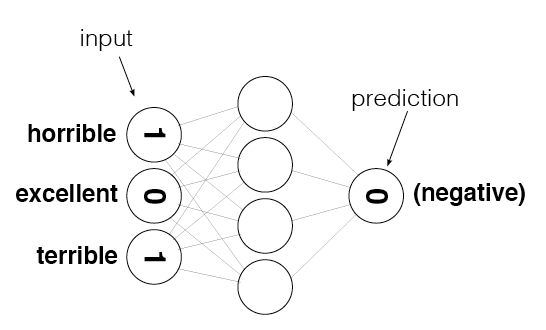

In [36]:
from IPython.display import Image
Image(filename='sentiment_network.png')

In [37]:
def update_input_layer(review):
    
    global layer_0
    
    # clear out previous state, reset the layer to be all 0s
    layer_0 *= 0
    for word in review.split(" "):
        layer_0[0][word2index[word]] += 1

update_input_layer(reviews[0])

In [38]:
layer_0

array([[18.,  0.,  0., ...,  0.,  0.,  0.]])

In [39]:
review_counter = Counter()

In [40]:
for word in reviews[0].split(" "):
    review_counter[word] += 1

In [41]:
review_counter.most_common()

[('.', 27),
 ('', 18),
 ('the', 9),
 ('to', 6),
 ('high', 5),
 ('i', 5),
 ('bromwell', 4),
 ('is', 4),
 ('a', 4),
 ('teachers', 4),
 ('that', 4),
 ('of', 4),
 ('it', 2),
 ('at', 2),
 ('as', 2),
 ('school', 2),
 ('my', 2),
 ('in', 2),
 ('me', 2),
 ('students', 2),
 ('their', 2),
 ('student', 2),
 ('cartoon', 1),
 ('comedy', 1),
 ('ran', 1),
 ('same', 1),
 ('time', 1),
 ('some', 1),
 ('other', 1),
 ('programs', 1),
 ('about', 1),
 ('life', 1),
 ('such', 1),
 ('years', 1),
 ('teaching', 1),
 ('profession', 1),
 ('lead', 1),
 ('believe', 1),
 ('s', 1),
 ('satire', 1),
 ('much', 1),
 ('closer', 1),
 ('reality', 1),
 ('than', 1),
 ('scramble', 1),
 ('survive', 1),
 ('financially', 1),
 ('insightful', 1),
 ('who', 1),
 ('can', 1),
 ('see', 1),
 ('right', 1),
 ('through', 1),
 ('pathetic', 1),
 ('pomp', 1),
 ('pettiness', 1),
 ('whole', 1),
 ('situation', 1),
 ('all', 1),
 ('remind', 1),
 ('schools', 1),
 ('knew', 1),
 ('and', 1),
 ('when', 1),
 ('saw', 1),
 ('episode', 1),
 ('which', 1),
 ('r

# Project 4: Reducing Noise in Our Input Data<a id='project_4'></a>

**TODO:** Attempt to reduce the noise in the input data like Andrew did in the previous video. Specifically, do the following:
* Copy the `SentimentNetwork` class you created earlier into the following cell.
* Modify `update_input_layer` so it does not count how many times each word is used, but rather just stores whether or not a word was used. 

In [34]:
# TODO: -Copy the SentimentNetwork class from Projet 3 lesson
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        
        review_vocab = set()
        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words 
        #       using "split(' ')" instead of "split()".
        for review in reviews:
            for word in review.split(' '):
                review_vocab.add(word)
        
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        label_vocab = set()
        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.
        for label in labels:
            label_vocab.add(label)
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        for i,word in enumerate(self.review_vocab):
            self.word2index[word]=i 
            
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        # TODO: do the same thing you did for self.word2index and self.review_vocab, 
        #       but for self.label2index and self.label_vocab instead
        for i,label in enumerate(self.label_vocab):
            self.label2index[label]=i 
         
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((input_nodes,hidden_nodes))
        
        # TODO: initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
#         self.weights_1_2 = np.zeros((hidden_nodes,output_nodes))
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5, 
                                                (self.hidden_nodes, self.output_nodes))
        
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
        self.layer_0 = np.zeros((1,input_nodes))
    
        
    def update_input_layer(self,review):
        # TODO: You can copy most of the code you wrote for update_input_layer 
        #       earlier in this notebook. 
        #
        #       However, MAKE SURE YOU CHANGE ALL VARIABLES TO REFERENCE
        #       THE VERSIONS STORED IN THIS OBJECT, NOT THE GLOBAL OBJECTS.
        #       For example, replace "layer_0 *= 0" with "self.layer_0 *= 0"
        
        # clear out previous state by resetting the layer to be all 0s
        self.layer_0 *= 0
        
        for word in review.split(" "):
            if (word in self.word2index.keys()):
                self.layer_0[0][self.word2index[word]] = 1
                
    def get_target_for_label(self,label):
        # TODO: Copy the code you wrote for get_target_for_label 
        #       earlier in this notebook. 
        if label == "POSITIVE":
            return 1
        else : return 0
        
    def sigmoid(self,x):
        # TODO: Return the result of calculating the sigmoid activation function
        #       shown in the lectures
        return 1/(1+np.exp(-x)) 
    
    def sigmoid_output_2_derivative(self,output):
        # TODO: Return the derivative of the sigmoid activation function, 
        #       where "output" is the original output from the sigmoid fucntion 
        return output*(1-output)

    def train(self, training_reviews, training_labels):
        
        # make sure out we have a matching number of reviews and labels
        assert (len(training_reviews) == len(training_labels))

        # Keep track of correct predictions to display accuracy during training
        correct_so_far = 0

        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):

            # TODO: Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            output = np.array(self.get_target_for_label(label))
            output = output.reshape((1,1))
            # print(review)
            # print(output)

            # print(review)
            # print(label)
            self.update_input_layer(review)

            # TODO: Implement the forward pass through the network.
            #       That means use the given review to update the input layer,
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            #
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.

            # update_input_layer(review)
            # output = get_target_for_label(label)

            hidden_layer_input = np.dot(self.layer_0,self.weights_0_1)
            # print("Hidden Layer Input ",hidden_layer_input,"\nShape ",hidden_layer_input.shape)
            output_layer_input = np.dot(hidden_layer_input,self.weights_1_2)
            # print("Output Layer Input ", output_layer_input, "\nShape ", output_layer_input.shape)
            output_layer_output = self.sigmoid(output_layer_input)
            # print("Output Layer output ", output_layer_output, "\nShape ", output_layer_output.shape)
            # print("Actual output ", output, "\nShape ", output.shape)
            output_layer_error = output_layer_output - output
            # print("Output Layer Error ", output_layer_error, "\nShape ", output_layer_error.shape)
            output_layer_error_term = output_layer_error * self.sigmoid_output_2_derivative(output_layer_output)
            # print("Output Layer Error Term ", output_layer_error_term, "\nShape ", output_layer_error_term.shape)

            # TODO: Implement the back propagation pass here.
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you
            #       learned in class.


            # print("Weight Shape ",self.weights_1_2.shape)
            # print("Output Layer Error Term Shape ",output_layer_error_term.shape)
            hidden_layer_error = np.dot(output_layer_error_term,self.weights_1_2.T)
            # print("Hidden layer error ",hidden_layer_error," Shape ",hidden_layer_error.shape)
            hidden_layer_error_term = hidden_layer_error
            # print("Hidden layer error term",hidden_layer_error_term, " Shape ", hidden_layer_error_term.shape)

            delta_weight_h_o = np.zeros((self.hidden_nodes,self.output_nodes))
            # print("Hidden to output delta weight ", delta_weight_h_o, " Shape ", delta_weight_h_o.shape)
            # print("Output Layer Error term ",output_layer_error_term," Shape ",output_layer_error_term.shape)
            # print("Hidden Layer Output ",hidden_layer_input," Shape ",hidden_layer_input.shape)
            delta_weight_h_o += (output_layer_error_term*hidden_layer_input.T)
            # print("Hidden to output delta weight ", delta_weight_h_o, " Shape ", delta_weight_h_o.shape)
            # print("Weight Hidden to Output ",self.weights_1_2," Shape ",self.weights_1_2.shape)
            self.weights_1_2 -=delta_weight_h_o * self.learning_rate
            # print("Weight Hidden to Output ", self.weights_1_2, " Shape ", self.weights_1_2.shape)

            delta_weight_i_h = np.zeros((self.input_nodes,self.hidden_nodes))
            delta_weight_i_h += (hidden_layer_error_term * self.layer_0.T)
            self.weights_0_1 -= delta_weight_i_h * self.learning_rate
            # print("Weight Input to Hidden", self.weights_0_1, " Shape ", self.weights_0_1.shape)





            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error
            #       is less than 0.5. If so, add one to the correct_so_far count.

            # For debug purposes, print out our prediction accuracy and speed
            # throughout the training process.

            print("Layer2",output_layer_output)
            if (output_layer_output[0] >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif (output_layer_output[0] < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0

            sys.stdout.write("\rProgress:" + str(100 * i / float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i + 1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i + 1))[:4] + "%")
            if (i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        
        self.update_input_layer(review.lower())
        
        hidden_layer_input = np.dot(self.layer_0, self.weights_0_1)
        # print("Hidden Layer Input ",hidden_layer_input,"\nShape ",hidden_layer_input.shape)
        output_layer_input = np.dot(hidden_layer_input, self.weights_1_2)
        # print("Output Layer Input ", output_layer_input, "\nShape ", output_layer_input.shape)
        output_layer_output = self.sigmoid(output_layer_input)
        # print("Output Layer output ", output_layer_output, "\nShape ", output_layer_output.shape)
        # print("Actual output ", output, "\nShape ", output.shape)
        
        # TODO: The output layer should now contain a prediction. 
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`, 
        #       and `NEGATIVE` otherwise.
        if (output_layer_output[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"

   

Run the following cell to recreate the network and train it. Notice we've gone back to the higher learning rate of `0.1`.

In [35]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)
mlp.train(reviews[:-1000],labels[:-1000])

Layer2 [[0.5]]
Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Layer2 [[0.96741356]]
Progress:0.00% Speed(reviews/sec):13.48 #Correct:1 #Trained:2 Training Accuracy:50.0%Layer2 [[0.9862216]]
Progress:0.00% Speed(reviews/sec):23.92 #Correct:2 #Trained:3 Training Accuracy:66.6%Layer2 [[0.98878042]]
Progress:0.01% Speed(reviews/sec):31.87 #Correct:2 #Trained:4 Training Accuracy:50.0%Layer2 [[0.90250513]]
Progress:0.01% Speed(reviews/sec):38.66 #Correct:3 #Trained:5 Training Accuracy:60.0%Layer2 [[0.89512687]]
Progress:0.02% Speed(reviews/sec):44.15 #Correct:3 #Trained:6 Training Accuracy:50.0%Layer2 [[0.47395133]]
Progress:0.02% Speed(reviews/sec):49.00 #Correct:3 #Trained:7 Training Accuracy:42.8%Layer2 [[0.97345099]]
Progress:0.02% Speed(reviews/sec):52.88 #Correct:3 #Trained:8 Training Accuracy:37.5%Layer2 [[0.91779555]]
Progress:0.03% Speed(reviews/sec):56.52 #Correct:4 #Trained:9 Training Accuracy:44.4%Layer2 [[0.95438818]]
Progress:0.03% Speed(revi

Progress:0.33% Speed(reviews/sec):91.78 #Correct:37 #Trained:82 Training Accuracy:45.1%Layer2 [[0.00181583]]
Progress:0.34% Speed(reviews/sec):91.89 #Correct:37 #Trained:83 Training Accuracy:44.5%Layer2 [[0.00216669]]
Progress:0.34% Speed(reviews/sec):91.79 #Correct:38 #Trained:84 Training Accuracy:45.2%Layer2 [[0.00054868]]
Progress:0.35% Speed(reviews/sec):91.69 #Correct:38 #Trained:85 Training Accuracy:44.7%Layer2 [[0.00381209]]
Progress:0.35% Speed(reviews/sec):91.53 #Correct:39 #Trained:86 Training Accuracy:45.3%Layer2 [[0.00092892]]
Progress:0.35% Speed(reviews/sec):91.52 #Correct:39 #Trained:87 Training Accuracy:44.8%Layer2 [[0.00068777]]
Progress:0.36% Speed(reviews/sec):91.39 #Correct:40 #Trained:88 Training Accuracy:45.4%Layer2 [[0.0954752]]
Progress:0.36% Speed(reviews/sec):91.36 #Correct:40 #Trained:89 Training Accuracy:44.9%Layer2 [[0.0005782]]
Progress:0.37% Speed(reviews/sec):91.15 #Correct:41 #Trained:90 Training Accuracy:45.5%Layer2 [[0.00688158]]
Progress:0.37% Speed(

Progress:0.67% Speed(reviews/sec):94.20 #Correct:81 #Trained:163 Training Accuracy:49.6%Layer2 [[0.66461237]]
Progress:0.67% Speed(reviews/sec):94.11 #Correct:81 #Trained:164 Training Accuracy:49.3%Layer2 [[0.32171095]]
Progress:0.68% Speed(reviews/sec):94.07 #Correct:81 #Trained:165 Training Accuracy:49.0%Layer2 [[0.95448062]]
Progress:0.68% Speed(reviews/sec):94.00 #Correct:81 #Trained:166 Training Accuracy:48.7%Layer2 [[0.99997468]]
Progress:0.69% Speed(reviews/sec):93.99 #Correct:82 #Trained:167 Training Accuracy:49.1%Layer2 [[0.23307661]]
Progress:0.69% Speed(reviews/sec):93.88 #Correct:83 #Trained:168 Training Accuracy:49.4%Layer2 [[0.97093423]]
Progress:0.7% Speed(reviews/sec):93.83 #Correct:84 #Trained:169 Training Accuracy:49.7%Layer2 [[0.00741047]]
Progress:0.70% Speed(reviews/sec):93.81 #Correct:85 #Trained:170 Training Accuracy:50.0%Layer2 [[0.87040175]]
Progress:0.70% Speed(reviews/sec):93.89 #Correct:86 #Trained:171 Training Accuracy:50.2%Layer2 [[0.00152899]]
Progress:0.

Progress:0.99% Speed(reviews/sec):93.49 #Correct:137 #Trained:240 Training Accuracy:57.0%Layer2 [[0.78066307]]
Progress:1.0% Speed(reviews/sec):93.48 #Correct:138 #Trained:241 Training Accuracy:57.2%Layer2 [[3.40768335e-06]]
Progress:1.00% Speed(reviews/sec):93.47 #Correct:139 #Trained:242 Training Accuracy:57.4%Layer2 [[0.92553769]]
Progress:1.00% Speed(reviews/sec):93.45 #Correct:140 #Trained:243 Training Accuracy:57.6%Layer2 [[0.00159801]]
Progress:1.01% Speed(reviews/sec):93.39 #Correct:141 #Trained:244 Training Accuracy:57.7%Layer2 [[0.0565968]]
Progress:1.01% Speed(reviews/sec):93.37 #Correct:141 #Trained:245 Training Accuracy:57.5%Layer2 [[0.01099914]]
Progress:1.02% Speed(reviews/sec):93.29 #Correct:142 #Trained:246 Training Accuracy:57.7%Layer2 [[0.99920121]]
Progress:1.02% Speed(reviews/sec):93.27 #Correct:143 #Trained:247 Training Accuracy:57.8%Layer2 [[0.00014947]]
Progress:1.02% Speed(reviews/sec):93.24 #Correct:144 #Trained:248 Training Accuracy:58.0%Layer2 [[0.42843136]]

Progress:1.31% Speed(reviews/sec):93.20 #Correct:190 #Trained:316 Training Accuracy:60.1%Layer2 [[0.01140865]]
Progress:1.31% Speed(reviews/sec):93.20 #Correct:190 #Trained:317 Training Accuracy:59.9%Layer2 [[7.72613482e-11]]
Progress:1.32% Speed(reviews/sec):93.15 #Correct:191 #Trained:318 Training Accuracy:60.0%Layer2 [[0.99339089]]
Progress:1.32% Speed(reviews/sec):93.14 #Correct:192 #Trained:319 Training Accuracy:60.1%Layer2 [[0.00011493]]
Progress:1.32% Speed(reviews/sec):93.10 #Correct:193 #Trained:320 Training Accuracy:60.3%Layer2 [[0.93450503]]
Progress:1.33% Speed(reviews/sec):93.09 #Correct:194 #Trained:321 Training Accuracy:60.4%Layer2 [[0.00657799]]
Progress:1.33% Speed(reviews/sec):93.04 #Correct:195 #Trained:322 Training Accuracy:60.5%Layer2 [[0.1133581]]
Progress:1.34% Speed(reviews/sec):93.02 #Correct:195 #Trained:323 Training Accuracy:60.3%Layer2 [[0.14276378]]
Progress:1.34% Speed(reviews/sec):92.98 #Correct:196 #Trained:324 Training Accuracy:60.4%Layer2 [[0.69450447]

Progress:1.63% Speed(reviews/sec):93.57 #Correct:245 #Trained:394 Training Accuracy:62.1%Layer2 [[0.99993675]]
Progress:1.64% Speed(reviews/sec):93.60 #Correct:246 #Trained:395 Training Accuracy:62.2%Layer2 [[0.98499764]]
Progress:1.64% Speed(reviews/sec):93.59 #Correct:246 #Trained:396 Training Accuracy:62.1%Layer2 [[0.99999613]]
Progress:1.65% Speed(reviews/sec):93.60 #Correct:247 #Trained:397 Training Accuracy:62.2%Layer2 [[0.76204836]]
Progress:1.65% Speed(reviews/sec):93.60 #Correct:247 #Trained:398 Training Accuracy:62.0%Layer2 [[0.74399274]]
Progress:1.65% Speed(reviews/sec):93.62 #Correct:248 #Trained:399 Training Accuracy:62.1%Layer2 [[0.02769689]]
Progress:1.66% Speed(reviews/sec):93.63 #Correct:249 #Trained:400 Training Accuracy:62.2%Layer2 [[0.56847804]]
Progress:1.66% Speed(reviews/sec):93.66 #Correct:250 #Trained:401 Training Accuracy:62.3%Layer2 [[0.00017346]]
Progress:1.67% Speed(reviews/sec):93.65 #Correct:251 #Trained:402 Training Accuracy:62.4%Layer2 [[0.99314398]]
P

Progress:1.96% Speed(reviews/sec):93.49 #Correct:294 #Trained:472 Training Accuracy:62.2%Layer2 [[0.99555334]]
Progress:1.96% Speed(reviews/sec):93.46 #Correct:295 #Trained:473 Training Accuracy:62.3%Layer2 [[0.00218107]]
Progress:1.97% Speed(reviews/sec):93.41 #Correct:296 #Trained:474 Training Accuracy:62.4%Layer2 [[0.99929622]]
Progress:1.97% Speed(reviews/sec):93.39 #Correct:297 #Trained:475 Training Accuracy:62.5%Layer2 [[0.00014092]]
Progress:1.97% Speed(reviews/sec):93.34 #Correct:298 #Trained:476 Training Accuracy:62.6%Layer2 [[0.90892425]]
Progress:1.98% Speed(reviews/sec):93.32 #Correct:299 #Trained:477 Training Accuracy:62.6%Layer2 [[0.99866888]]
Progress:1.98% Speed(reviews/sec):93.28 #Correct:299 #Trained:478 Training Accuracy:62.5%Layer2 [[0.32324488]]
Progress:1.99% Speed(reviews/sec):93.26 #Correct:299 #Trained:479 Training Accuracy:62.4%Layer2 [[0.99757858]]
Progress:1.99% Speed(reviews/sec):93.20 #Correct:299 #Trained:480 Training Accuracy:62.2%Layer2 [[0.99998085]]
P

Progress:2.28% Speed(reviews/sec):93.51 #Correct:344 #Trained:550 Training Accuracy:62.5%Layer2 [[0.03172937]]
Progress:2.29% Speed(reviews/sec):93.52 #Correct:344 #Trained:551 Training Accuracy:62.4%Layer2 [[0.76991568]]
Progress:2.29% Speed(reviews/sec):93.53 #Correct:344 #Trained:552 Training Accuracy:62.3%Layer2 [[0.72076182]]
Progress:2.3% Speed(reviews/sec):93.54 #Correct:345 #Trained:553 Training Accuracy:62.3%Layer2 [[0.00275551]]
Progress:2.30% Speed(reviews/sec):93.55 #Correct:346 #Trained:554 Training Accuracy:62.4%Layer2 [[0.99656046]]
Progress:2.30% Speed(reviews/sec):93.55 #Correct:347 #Trained:555 Training Accuracy:62.5%Layer2 [[9.83861159e-05]]
Progress:2.31% Speed(reviews/sec):93.51 #Correct:348 #Trained:556 Training Accuracy:62.5%Layer2 [[0.9980865]]
Progress:2.31% Speed(reviews/sec):93.52 #Correct:349 #Trained:557 Training Accuracy:62.6%Layer2 [[0.22543471]]
Progress:2.32% Speed(reviews/sec):93.49 #Correct:350 #Trained:558 Training Accuracy:62.7%Layer2 [[0.99723481]]

Progress:2.60% Speed(reviews/sec):93.25 #Correct:401 #Trained:626 Training Accuracy:64.0%Layer2 [[0.9999999]]
Progress:2.60% Speed(reviews/sec):93.25 #Correct:402 #Trained:627 Training Accuracy:64.1%Layer2 [[0.99997115]]
Progress:2.61% Speed(reviews/sec):93.23 #Correct:402 #Trained:628 Training Accuracy:64.0%Layer2 [[1.]]
Progress:2.61% Speed(reviews/sec):93.22 #Correct:403 #Trained:629 Training Accuracy:64.0%Layer2 [[0.99999872]]
Progress:2.62% Speed(reviews/sec):93.19 #Correct:403 #Trained:630 Training Accuracy:63.9%Layer2 [[1.]]
Progress:2.62% Speed(reviews/sec):93.16 #Correct:404 #Trained:631 Training Accuracy:64.0%Layer2 [[0.99476052]]
Progress:2.62% Speed(reviews/sec):93.15 #Correct:404 #Trained:632 Training Accuracy:63.9%Layer2 [[1.]]
Progress:2.63% Speed(reviews/sec):93.16 #Correct:405 #Trained:633 Training Accuracy:63.9%Layer2 [[0.99990601]]
Progress:2.63% Speed(reviews/sec):93.17 #Correct:405 #Trained:634 Training Accuracy:63.8%Layer2 [[0.99999998]]
Progress:2.64% Speed(revie

Progress:2.94% Speed(reviews/sec):91.31 #Correct:442 #Trained:708 Training Accuracy:62.4%Layer2 [[0.99999999]]
Progress:2.95% Speed(reviews/sec):91.30 #Correct:443 #Trained:709 Training Accuracy:62.4%Layer2 [[0.99681548]]
Progress:2.95% Speed(reviews/sec):91.31 #Correct:443 #Trained:710 Training Accuracy:62.3%Layer2 [[1.]]
Progress:2.95% Speed(reviews/sec):91.30 #Correct:444 #Trained:711 Training Accuracy:62.4%Layer2 [[0.9998802]]
Progress:2.96% Speed(reviews/sec):91.31 #Correct:444 #Trained:712 Training Accuracy:62.3%Layer2 [[1.]]
Progress:2.96% Speed(reviews/sec):91.32 #Correct:445 #Trained:713 Training Accuracy:62.4%Layer2 [[0.99999996]]
Progress:2.97% Speed(reviews/sec):91.32 #Correct:445 #Trained:714 Training Accuracy:62.3%Layer2 [[0.99999846]]
Progress:2.97% Speed(reviews/sec):91.33 #Correct:446 #Trained:715 Training Accuracy:62.3%Layer2 [[0.99999979]]
Progress:2.97% Speed(reviews/sec):91.31 #Correct:446 #Trained:716 Training Accuracy:62.2%Layer2 [[0.99999122]]
Progress:2.98% Spe

Progress:3.27% Speed(reviews/sec):91.86 #Correct:482 #Trained:788 Training Accuracy:61.1%Layer2 [[0.99999999]]
Progress:3.28% Speed(reviews/sec):91.86 #Correct:483 #Trained:789 Training Accuracy:61.2%Layer2 [[0.99999995]]
Progress:3.28% Speed(reviews/sec):91.84 #Correct:483 #Trained:790 Training Accuracy:61.1%Layer2 [[1.]]
Progress:3.29% Speed(reviews/sec):91.82 #Correct:484 #Trained:791 Training Accuracy:61.1%Layer2 [[0.99999998]]
Progress:3.29% Speed(reviews/sec):91.81 #Correct:484 #Trained:792 Training Accuracy:61.1%Layer2 [[1.]]
Progress:3.3% Speed(reviews/sec):91.79 #Correct:485 #Trained:793 Training Accuracy:61.1%Layer2 [[0.99999479]]
Progress:3.30% Speed(reviews/sec):91.77 #Correct:485 #Trained:794 Training Accuracy:61.0%Layer2 [[1.]]
Progress:3.30% Speed(reviews/sec):91.76 #Correct:486 #Trained:795 Training Accuracy:61.1%Layer2 [[0.99334827]]
Progress:3.31% Speed(reviews/sec):91.75 #Correct:486 #Trained:796 Training Accuracy:61.0%Layer2 [[0.99999983]]
Progress:3.31% Speed(revie

Progress:3.60% Speed(reviews/sec):92.22 #Correct:534 #Trained:867 Training Accuracy:61.5%Layer2 [[0.00107325]]
Progress:3.61% Speed(reviews/sec):92.22 #Correct:535 #Trained:868 Training Accuracy:61.6%Layer2 [[0.99698327]]
Progress:3.61% Speed(reviews/sec):92.23 #Correct:536 #Trained:869 Training Accuracy:61.6%Layer2 [[3.39694866e-07]]
Progress:3.62% Speed(reviews/sec):92.24 #Correct:537 #Trained:870 Training Accuracy:61.7%Layer2 [[0.85595981]]
Progress:3.62% Speed(reviews/sec):92.25 #Correct:538 #Trained:871 Training Accuracy:61.7%Layer2 [[1.55103168e-10]]
Progress:3.62% Speed(reviews/sec):92.26 #Correct:539 #Trained:872 Training Accuracy:61.8%Layer2 [[0.58906023]]
Progress:3.63% Speed(reviews/sec):92.27 #Correct:540 #Trained:873 Training Accuracy:61.8%Layer2 [[0.69502607]]
Progress:3.63% Speed(reviews/sec):92.24 #Correct:540 #Trained:874 Training Accuracy:61.7%Layer2 [[0.9099028]]
Progress:3.64% Speed(reviews/sec):92.25 #Correct:541 #Trained:875 Training Accuracy:61.8%Layer2 [[9.47974

Progress:3.95% Speed(reviews/sec):92.88 #Correct:598 #Trained:951 Training Accuracy:62.8%Layer2 [[3.38830319e-09]]
Progress:3.96% Speed(reviews/sec):92.88 #Correct:599 #Trained:952 Training Accuracy:62.9%Layer2 [[0.17593373]]
Progress:3.96% Speed(reviews/sec):92.88 #Correct:599 #Trained:953 Training Accuracy:62.8%Layer2 [[0.01358979]]
Progress:3.97% Speed(reviews/sec):92.87 #Correct:600 #Trained:954 Training Accuracy:62.8%Layer2 [[0.99999187]]
Progress:3.97% Speed(reviews/sec):92.86 #Correct:601 #Trained:955 Training Accuracy:62.9%Layer2 [[0.00040596]]
Progress:3.97% Speed(reviews/sec):92.85 #Correct:602 #Trained:956 Training Accuracy:62.9%Layer2 [[0.80317232]]
Progress:3.98% Speed(reviews/sec):92.84 #Correct:603 #Trained:957 Training Accuracy:63.0%Layer2 [[0.47162679]]
Progress:3.98% Speed(reviews/sec):92.83 #Correct:604 #Trained:958 Training Accuracy:63.0%Layer2 [[0.00014983]]
Progress:3.99% Speed(reviews/sec):92.83 #Correct:604 #Trained:959 Training Accuracy:62.9%Layer2 [[4.68645748

Progress:4.28% Speed(reviews/sec):93.00 #Correct:662 #Trained:1029 Training Accuracy:64.3%Layer2 [[4.14475013e-07]]
Progress:4.28% Speed(reviews/sec):92.99 #Correct:663 #Trained:1030 Training Accuracy:64.3%Layer2 [[0.5571409]]
Progress:4.29% Speed(reviews/sec):93.00 #Correct:664 #Trained:1031 Training Accuracy:64.4%Layer2 [[0.0037601]]
Progress:4.29% Speed(reviews/sec):93.01 #Correct:665 #Trained:1032 Training Accuracy:64.4%Layer2 [[0.9188155]]
Progress:4.3% Speed(reviews/sec):93.02 #Correct:666 #Trained:1033 Training Accuracy:64.4%Layer2 [[3.38450983e-05]]
Progress:4.30% Speed(reviews/sec):93.02 #Correct:667 #Trained:1034 Training Accuracy:64.5%Layer2 [[0.99999998]]
Progress:4.30% Speed(reviews/sec):93.02 #Correct:668 #Trained:1035 Training Accuracy:64.5%Layer2 [[0.00426022]]
Progress:4.31% Speed(reviews/sec):93.01 #Correct:669 #Trained:1036 Training Accuracy:64.5%Layer2 [[0.99625057]]
Progress:4.31% Speed(reviews/sec):93.01 #Correct:670 #Trained:1037 Training Accuracy:64.6%Layer2 [[0

Progress:4.60% Speed(reviews/sec):93.08 #Correct:728 #Trained:1107 Training Accuracy:65.7%Layer2 [[0.00397563]]
Progress:4.61% Speed(reviews/sec):93.09 #Correct:729 #Trained:1108 Training Accuracy:65.7%Layer2 [[0.96990863]]
Progress:4.61% Speed(reviews/sec):93.09 #Correct:730 #Trained:1109 Training Accuracy:65.8%Layer2 [[0.99995469]]
Progress:4.62% Speed(reviews/sec):93.07 #Correct:730 #Trained:1110 Training Accuracy:65.7%Layer2 [[0.12445798]]
Progress:4.62% Speed(reviews/sec):93.07 #Correct:730 #Trained:1111 Training Accuracy:65.7%Layer2 [[0.94298231]]
Progress:4.62% Speed(reviews/sec):93.06 #Correct:730 #Trained:1112 Training Accuracy:65.6%Layer2 [[0.99899371]]
Progress:4.63% Speed(reviews/sec):93.06 #Correct:731 #Trained:1113 Training Accuracy:65.6%Layer2 [[0.95762921]]
Progress:4.63% Speed(reviews/sec):93.02 #Correct:731 #Trained:1114 Training Accuracy:65.6%Layer2 [[0.99953108]]
Progress:4.64% Speed(reviews/sec):93.01 #Correct:732 #Trained:1115 Training Accuracy:65.6%Layer2 [[0.934

Progress:4.93% Speed(reviews/sec):93.17 #Correct:788 #Trained:1185 Training Accuracy:66.4%Layer2 [[0.00683774]]
Progress:4.93% Speed(reviews/sec):93.17 #Correct:789 #Trained:1186 Training Accuracy:66.5%Layer2 [[0.95633239]]
Progress:4.94% Speed(reviews/sec):93.17 #Correct:790 #Trained:1187 Training Accuracy:66.5%Layer2 [[0.42415939]]
Progress:4.94% Speed(reviews/sec):93.16 #Correct:791 #Trained:1188 Training Accuracy:66.5%Layer2 [[0.02041711]]
Progress:4.95% Speed(reviews/sec):93.16 #Correct:791 #Trained:1189 Training Accuracy:66.5%Layer2 [[0.06188138]]
Progress:4.95% Speed(reviews/sec):93.15 #Correct:792 #Trained:1190 Training Accuracy:66.5%Layer2 [[0.11969817]]
Progress:4.95% Speed(reviews/sec):93.14 #Correct:792 #Trained:1191 Training Accuracy:66.4%Layer2 [[0.01080359]]
Progress:4.96% Speed(reviews/sec):93.13 #Correct:793 #Trained:1192 Training Accuracy:66.5%Layer2 [[0.99997586]]
Progress:4.96% Speed(reviews/sec):93.13 #Correct:794 #Trained:1193 Training Accuracy:66.5%Layer2 [[0.999

Progress:5.26% Speed(reviews/sec):93.32 #Correct:842 #Trained:1264 Training Accuracy:66.6%Layer2 [[0.99825913]]
Progress:5.26% Speed(reviews/sec):93.33 #Correct:843 #Trained:1265 Training Accuracy:66.6%Layer2 [[0.99922762]]
Progress:5.27% Speed(reviews/sec):93.33 #Correct:843 #Trained:1266 Training Accuracy:66.5%Layer2 [[0.99612932]]
Progress:5.27% Speed(reviews/sec):93.31 #Correct:844 #Trained:1267 Training Accuracy:66.6%Layer2 [[0.17364559]]
Progress:5.27% Speed(reviews/sec):93.31 #Correct:845 #Trained:1268 Training Accuracy:66.6%Layer2 [[0.00182181]]
Progress:5.28% Speed(reviews/sec):93.30 #Correct:845 #Trained:1269 Training Accuracy:66.5%Layer2 [[0.99403957]]
Progress:5.28% Speed(reviews/sec):93.29 #Correct:845 #Trained:1270 Training Accuracy:66.5%Layer2 [[0.43758984]]
Progress:5.29% Speed(reviews/sec):93.30 #Correct:845 #Trained:1271 Training Accuracy:66.4%Layer2 [[0.99999998]]
Progress:5.29% Speed(reviews/sec):93.30 #Correct:845 #Trained:1272 Training Accuracy:66.4%Layer2 [[0.995

Progress:5.6% Speed(reviews/sec):93.53 #Correct:905 #Trained:1345 Training Accuracy:67.2%Layer2 [[0.15643417]]
Progress:5.60% Speed(reviews/sec):93.53 #Correct:906 #Trained:1346 Training Accuracy:67.3%Layer2 [[0.9994747]]
Progress:5.60% Speed(reviews/sec):93.54 #Correct:907 #Trained:1347 Training Accuracy:67.3%Layer2 [[3.36854158e-06]]
Progress:5.61% Speed(reviews/sec):93.55 #Correct:908 #Trained:1348 Training Accuracy:67.3%Layer2 [[0.99999999]]
Progress:5.61% Speed(reviews/sec):93.55 #Correct:909 #Trained:1349 Training Accuracy:67.3%Layer2 [[0.00749655]]
Progress:5.62% Speed(reviews/sec):93.56 #Correct:910 #Trained:1350 Training Accuracy:67.4%Layer2 [[0.99998765]]
Progress:5.62% Speed(reviews/sec):93.56 #Correct:911 #Trained:1351 Training Accuracy:67.4%Layer2 [[0.35257542]]
Progress:5.62% Speed(reviews/sec):93.56 #Correct:912 #Trained:1352 Training Accuracy:67.4%Layer2 [[0.99999942]]
Progress:5.63% Speed(reviews/sec):93.57 #Correct:913 #Trained:1353 Training Accuracy:67.4%Layer2 [[9.8

Progress:5.93% Speed(reviews/sec):93.77 #Correct:962 #Trained:1426 Training Accuracy:67.4%Layer2 [[0.5524133]]
Progress:5.94% Speed(reviews/sec):93.78 #Correct:963 #Trained:1427 Training Accuracy:67.4%Layer2 [[0.93633107]]
Progress:5.94% Speed(reviews/sec):93.77 #Correct:963 #Trained:1428 Training Accuracy:67.4%Layer2 [[0.07594573]]
Progress:5.95% Speed(reviews/sec):93.76 #Correct:963 #Trained:1429 Training Accuracy:67.3%Layer2 [[8.86572098e-05]]
Progress:5.95% Speed(reviews/sec):93.75 #Correct:964 #Trained:1430 Training Accuracy:67.4%Layer2 [[0.10108384]]
Progress:5.95% Speed(reviews/sec):93.75 #Correct:964 #Trained:1431 Training Accuracy:67.3%Layer2 [[0.0210614]]
Progress:5.96% Speed(reviews/sec):93.75 #Correct:965 #Trained:1432 Training Accuracy:67.3%Layer2 [[0.99998831]]
Progress:5.96% Speed(reviews/sec):93.75 #Correct:966 #Trained:1433 Training Accuracy:67.4%Layer2 [[0.67918441]]
Progress:5.97% Speed(reviews/sec):93.76 #Correct:966 #Trained:1434 Training Accuracy:67.3%Layer2 [[0.0

Progress:6.27% Speed(reviews/sec):94.07 #Correct:1018 #Trained:1508 Training Accuracy:67.5%Layer2 [[0.42525927]]
Progress:6.28% Speed(reviews/sec):94.07 #Correct:1018 #Trained:1509 Training Accuracy:67.4%Layer2 [[0.08875641]]
Progress:6.28% Speed(reviews/sec):94.07 #Correct:1019 #Trained:1510 Training Accuracy:67.4%Layer2 [[0.99999526]]
Progress:6.29% Speed(reviews/sec):94.08 #Correct:1020 #Trained:1511 Training Accuracy:67.5%Layer2 [[0.08658753]]
Progress:6.29% Speed(reviews/sec):94.08 #Correct:1021 #Trained:1512 Training Accuracy:67.5%Layer2 [[1.]]
Progress:6.3% Speed(reviews/sec):94.09 #Correct:1022 #Trained:1513 Training Accuracy:67.5%Layer2 [[0.14840457]]
Progress:6.30% Speed(reviews/sec):94.08 #Correct:1023 #Trained:1514 Training Accuracy:67.5%Layer2 [[0.99999887]]
Progress:6.30% Speed(reviews/sec):94.08 #Correct:1024 #Trained:1515 Training Accuracy:67.5%Layer2 [[0.00071779]]
Progress:6.31% Speed(reviews/sec):94.08 #Correct:1025 #Trained:1516 Training Accuracy:67.6%Layer2 [[0.985

Progress:6.62% Speed(reviews/sec):94.34 #Correct:1081 #Trained:1591 Training Accuracy:67.9%Layer2 [[0.00044222]]
Progress:6.62% Speed(reviews/sec):94.34 #Correct:1082 #Trained:1592 Training Accuracy:67.9%Layer2 [[0.00048836]]
Progress:6.63% Speed(reviews/sec):94.34 #Correct:1082 #Trained:1593 Training Accuracy:67.9%Layer2 [[3.48616075e-09]]
Progress:6.63% Speed(reviews/sec):94.33 #Correct:1083 #Trained:1594 Training Accuracy:67.9%Layer2 [[0.9999841]]
Progress:6.64% Speed(reviews/sec):94.32 #Correct:1084 #Trained:1595 Training Accuracy:67.9%Layer2 [[0.00442674]]
Progress:6.64% Speed(reviews/sec):94.32 #Correct:1085 #Trained:1596 Training Accuracy:67.9%Layer2 [[0.99720025]]
Progress:6.65% Speed(reviews/sec):94.31 #Correct:1086 #Trained:1597 Training Accuracy:68.0%Layer2 [[8.24237718e-06]]
Progress:6.65% Speed(reviews/sec):94.31 #Correct:1087 #Trained:1598 Training Accuracy:68.0%Layer2 [[0.85956592]]
Progress:6.65% Speed(reviews/sec):94.31 #Correct:1088 #Trained:1599 Training Accuracy:68.

Progress:6.96% Speed(reviews/sec):94.56 #Correct:1144 #Trained:1673 Training Accuracy:68.3%Layer2 [[0.9998215]]
Progress:6.97% Speed(reviews/sec):94.56 #Correct:1144 #Trained:1674 Training Accuracy:68.3%Layer2 [[0.99973866]]
Progress:6.97% Speed(reviews/sec):94.55 #Correct:1145 #Trained:1675 Training Accuracy:68.3%Layer2 [[0.59481761]]
Progress:6.97% Speed(reviews/sec):94.55 #Correct:1145 #Trained:1676 Training Accuracy:68.3%Layer2 [[0.02004932]]
Progress:6.98% Speed(reviews/sec):94.54 #Correct:1145 #Trained:1677 Training Accuracy:68.2%Layer2 [[0.00111274]]
Progress:6.98% Speed(reviews/sec):94.53 #Correct:1146 #Trained:1678 Training Accuracy:68.2%Layer2 [[0.97915514]]
Progress:6.99% Speed(reviews/sec):94.53 #Correct:1147 #Trained:1679 Training Accuracy:68.3%Layer2 [[2.60597128e-07]]
Progress:6.99% Speed(reviews/sec):94.53 #Correct:1148 #Trained:1680 Training Accuracy:68.3%Layer2 [[0.99624759]]
Progress:7.0% Speed(reviews/sec):94.53 #Correct:1149 #Trained:1681 Training Accuracy:68.3%Lay

Progress:7.30% Speed(reviews/sec):94.72 #Correct:1210 #Trained:1754 Training Accuracy:68.9%Layer2 [[0.00086997]]
Progress:7.30% Speed(reviews/sec):94.72 #Correct:1210 #Trained:1755 Training Accuracy:68.9%Layer2 [[0.99988065]]
Progress:7.31% Speed(reviews/sec):94.72 #Correct:1210 #Trained:1756 Training Accuracy:68.9%Layer2 [[0.99998112]]
Progress:7.31% Speed(reviews/sec):94.72 #Correct:1211 #Trained:1757 Training Accuracy:68.9%Layer2 [[8.70414668e-05]]
Progress:7.32% Speed(reviews/sec):94.73 #Correct:1212 #Trained:1758 Training Accuracy:68.9%Layer2 [[0.9998873]]
Progress:7.32% Speed(reviews/sec):94.74 #Correct:1213 #Trained:1759 Training Accuracy:68.9%Layer2 [[0.65001416]]
Progress:7.32% Speed(reviews/sec):94.74 #Correct:1213 #Trained:1760 Training Accuracy:68.9%Layer2 [[0.05512404]]
Progress:7.33% Speed(reviews/sec):94.73 #Correct:1213 #Trained:1761 Training Accuracy:68.8%Layer2 [[0.98063441]]
Progress:7.33% Speed(reviews/sec):94.73 #Correct:1213 #Trained:1762 Training Accuracy:68.8%La

Progress:7.64% Speed(reviews/sec):94.93 #Correct:1270 #Trained:1836 Training Accuracy:69.1%Layer2 [[0.00053949]]
Progress:7.65% Speed(reviews/sec):94.94 #Correct:1270 #Trained:1837 Training Accuracy:69.1%Layer2 [[0.0067929]]
Progress:7.65% Speed(reviews/sec):94.93 #Correct:1271 #Trained:1838 Training Accuracy:69.1%Layer2 [[0.99985135]]
Progress:7.65% Speed(reviews/sec):94.93 #Correct:1272 #Trained:1839 Training Accuracy:69.1%Layer2 [[0.00687827]]
Progress:7.66% Speed(reviews/sec):94.92 #Correct:1273 #Trained:1840 Training Accuracy:69.1%Layer2 [[0.97447385]]
Progress:7.66% Speed(reviews/sec):94.92 #Correct:1274 #Trained:1841 Training Accuracy:69.2%Layer2 [[0.04863733]]
Progress:7.67% Speed(reviews/sec):94.91 #Correct:1275 #Trained:1842 Training Accuracy:69.2%Layer2 [[0.92020232]]
Progress:7.67% Speed(reviews/sec):94.91 #Correct:1276 #Trained:1843 Training Accuracy:69.2%Layer2 [[2.78047621e-10]]
Progress:7.67% Speed(reviews/sec):94.91 #Correct:1277 #Trained:1844 Training Accuracy:69.2%La

Progress:7.98% Speed(reviews/sec):95.09 #Correct:1332 #Trained:1917 Training Accuracy:69.4%Layer2 [[0.97699152]]
Progress:7.98% Speed(reviews/sec):95.09 #Correct:1332 #Trained:1918 Training Accuracy:69.4%Layer2 [[0.99999797]]
Progress:7.99% Speed(reviews/sec):95.09 #Correct:1333 #Trained:1919 Training Accuracy:69.4%Layer2 [[0.07371107]]
Progress:7.99% Speed(reviews/sec):95.08 #Correct:1334 #Trained:1920 Training Accuracy:69.4%Layer2 [[0.54569007]]
Progress:8.0% Speed(reviews/sec):95.08 #Correct:1335 #Trained:1921 Training Accuracy:69.4%Layer2 [[0.99973303]]
Progress:8.00% Speed(reviews/sec):95.07 #Correct:1335 #Trained:1922 Training Accuracy:69.4%Layer2 [[0.99999865]]
Progress:8.00% Speed(reviews/sec):95.06 #Correct:1336 #Trained:1923 Training Accuracy:69.4%Layer2 [[2.49076294e-08]]
Progress:8.01% Speed(reviews/sec):95.06 #Correct:1337 #Trained:1924 Training Accuracy:69.4%Layer2 [[0.99964288]]
Progress:8.01% Speed(reviews/sec):95.07 #Correct:1338 #Trained:1925 Training Accuracy:69.5%La

Progress:8.32% Speed(reviews/sec):95.31 #Correct:1397 #Trained:2000 Training Accuracy:69.8%Layer2 [[0.99795692]]
Progress:8.33% Speed(reviews/sec):95.31 #Correct:1398 #Trained:2001 Training Accuracy:69.8%Layer2 [[6.08192404e-09]]
Progress:8.33% Speed(reviews/sec):95.31 #Correct:1399 #Trained:2002 Training Accuracy:69.8%Layer2 [[0.97862581]]
Progress:8.34% Speed(reviews/sec):95.30 #Correct:1400 #Trained:2003 Training Accuracy:69.8%Layer2 [[0.00086916]]
Progress:8.34% Speed(reviews/sec):95.29 #Correct:1401 #Trained:2004 Training Accuracy:69.9%Layer2 [[0.99994653]]
Progress:8.35% Speed(reviews/sec):95.29 #Correct:1402 #Trained:2005 Training Accuracy:69.9%Layer2 [[2.06359084e-07]]
Progress:8.35% Speed(reviews/sec):95.28 #Correct:1403 #Trained:2006 Training Accuracy:69.9%Layer2 [[0.14126601]]
Progress:8.35% Speed(reviews/sec):95.28 #Correct:1403 #Trained:2007 Training Accuracy:69.9%Layer2 [[0.99981737]]
Progress:8.36% Speed(reviews/sec):95.29 #Correct:1403 #Trained:2008 Training Accuracy:69

Progress:8.67% Speed(reviews/sec):95.48 #Correct:1461 #Trained:2082 Training Accuracy:70.1%Layer2 [[0.99999912]]
Progress:8.67% Speed(reviews/sec):95.48 #Correct:1462 #Trained:2083 Training Accuracy:70.1%Layer2 [[0.00650465]]
Progress:8.67% Speed(reviews/sec):95.48 #Correct:1463 #Trained:2084 Training Accuracy:70.2%Layer2 [[0.93696079]]
Progress:8.68% Speed(reviews/sec):95.47 #Correct:1464 #Trained:2085 Training Accuracy:70.2%Layer2 [[1.31137856e-06]]
Progress:8.68% Speed(reviews/sec):95.47 #Correct:1465 #Trained:2086 Training Accuracy:70.2%Layer2 [[0.97742019]]
Progress:8.69% Speed(reviews/sec):95.46 #Correct:1466 #Trained:2087 Training Accuracy:70.2%Layer2 [[0.71091469]]
Progress:8.69% Speed(reviews/sec):95.46 #Correct:1466 #Trained:2088 Training Accuracy:70.2%Layer2 [[0.96964502]]
Progress:8.7% Speed(reviews/sec):95.46 #Correct:1467 #Trained:2089 Training Accuracy:70.2%Layer2 [[0.0004983]]
Progress:8.70% Speed(reviews/sec):95.46 #Correct:1468 #Trained:2090 Training Accuracy:70.2%Lay

Progress:9.00% Speed(reviews/sec):95.58 #Correct:1528 #Trained:2162 Training Accuracy:70.6%Layer2 [[0.974776]]
Progress:9.00% Speed(reviews/sec):95.58 #Correct:1529 #Trained:2163 Training Accuracy:70.6%Layer2 [[0.00300368]]
Progress:9.01% Speed(reviews/sec):95.58 #Correct:1530 #Trained:2164 Training Accuracy:70.7%Layer2 [[0.55505941]]
Progress:9.01% Speed(reviews/sec):95.58 #Correct:1531 #Trained:2165 Training Accuracy:70.7%Layer2 [[0.00077779]]
Progress:9.02% Speed(reviews/sec):95.57 #Correct:1532 #Trained:2166 Training Accuracy:70.7%Layer2 [[0.99999999]]
Progress:9.02% Speed(reviews/sec):95.57 #Correct:1533 #Trained:2167 Training Accuracy:70.7%Layer2 [[0.58199542]]
Progress:9.02% Speed(reviews/sec):95.56 #Correct:1533 #Trained:2168 Training Accuracy:70.7%Layer2 [[0.99988796]]
Progress:9.03% Speed(reviews/sec):95.56 #Correct:1534 #Trained:2169 Training Accuracy:70.7%Layer2 [[3.07837574e-05]]
Progress:9.03% Speed(reviews/sec):95.56 #Correct:1535 #Trained:2170 Training Accuracy:70.7%Lay

Progress:9.34% Speed(reviews/sec):95.66 #Correct:1596 #Trained:2243 Training Accuracy:71.1%Layer2 [[0.00020822]]
Progress:9.34% Speed(reviews/sec):95.66 #Correct:1597 #Trained:2244 Training Accuracy:71.1%Layer2 [[0.99999999]]
Progress:9.35% Speed(reviews/sec):95.66 #Correct:1598 #Trained:2245 Training Accuracy:71.1%Layer2 [[0.9977688]]
Progress:9.35% Speed(reviews/sec):95.65 #Correct:1598 #Trained:2246 Training Accuracy:71.1%Layer2 [[0.989781]]
Progress:9.35% Speed(reviews/sec):95.64 #Correct:1599 #Trained:2247 Training Accuracy:71.1%Layer2 [[0.00213021]]
Progress:9.36% Speed(reviews/sec):95.64 #Correct:1600 #Trained:2248 Training Accuracy:71.1%Layer2 [[0.99998924]]
Progress:9.36% Speed(reviews/sec):95.63 #Correct:1601 #Trained:2249 Training Accuracy:71.1%Layer2 [[0.00764426]]
Progress:9.37% Speed(reviews/sec):95.63 #Correct:1602 #Trained:2250 Training Accuracy:71.2%Layer2 [[0.94436133]]
Progress:9.37% Speed(reviews/sec):95.64 #Correct:1603 #Trained:2251 Training Accuracy:71.2%Layer2 [

Progress:9.68% Speed(reviews/sec):95.79 #Correct:1654 #Trained:2326 Training Accuracy:71.1%Layer2 [[0.99872774]]
Progress:9.69% Speed(reviews/sec):95.79 #Correct:1655 #Trained:2327 Training Accuracy:71.1%Layer2 [[0.02393313]]
Progress:9.69% Speed(reviews/sec):95.79 #Correct:1656 #Trained:2328 Training Accuracy:71.1%Layer2 [[0.91430236]]
Progress:9.7% Speed(reviews/sec):95.80 #Correct:1657 #Trained:2329 Training Accuracy:71.1%Layer2 [[0.17017359]]
Progress:9.70% Speed(reviews/sec):95.80 #Correct:1658 #Trained:2330 Training Accuracy:71.1%Layer2 [[0.99974023]]
Progress:9.70% Speed(reviews/sec):95.80 #Correct:1659 #Trained:2331 Training Accuracy:71.1%Layer2 [[2.99747412e-08]]
Progress:9.71% Speed(reviews/sec):95.80 #Correct:1660 #Trained:2332 Training Accuracy:71.1%Layer2 [[0.99999999]]
Progress:9.71% Speed(reviews/sec):95.79 #Correct:1661 #Trained:2333 Training Accuracy:71.1%Layer2 [[4.65866682e-05]]
Progress:9.72% Speed(reviews/sec):95.80 #Correct:1662 #Trained:2334 Training Accuracy:71.

Progress:10.0% Speed(reviews/sec):95.94 #Correct:1721 #Trained:2409 Training Accuracy:71.4%Layer2 [[0.37445066]]
Progress:10.0% Speed(reviews/sec):95.94 #Correct:1722 #Trained:2410 Training Accuracy:71.4%Layer2 [[0.10990969]]
Progress:10.0% Speed(reviews/sec):95.94 #Correct:1722 #Trained:2411 Training Accuracy:71.4%Layer2 [[0.35152223]]
Progress:10.0% Speed(reviews/sec):95.93 #Correct:1723 #Trained:2412 Training Accuracy:71.4%Layer2 [[0.92625886]]
Progress:10.0% Speed(reviews/sec):95.93 #Correct:1724 #Trained:2413 Training Accuracy:71.4%Layer2 [[8.73759055e-07]]
Progress:10.0% Speed(reviews/sec):95.93 #Correct:1725 #Trained:2414 Training Accuracy:71.4%Layer2 [[0.79819223]]
Progress:10.0% Speed(reviews/sec):95.92 #Correct:1726 #Trained:2415 Training Accuracy:71.4%Layer2 [[0.99955476]]
Progress:10.0% Speed(reviews/sec):95.92 #Correct:1726 #Trained:2416 Training Accuracy:71.4%Layer2 [[0.01701883]]
Progress:10.0% Speed(reviews/sec):95.92 #Correct:1726 #Trained:2417 Training Accuracy:71.4%L

Progress:10.3% Speed(reviews/sec):96.00 #Correct:1785 #Trained:2490 Training Accuracy:71.6%Layer2 [[0.99252252]]
Progress:10.3% Speed(reviews/sec):96.00 #Correct:1786 #Trained:2491 Training Accuracy:71.6%Layer2 [[1.13782164e-06]]
Progress:10.3% Speed(reviews/sec):96.00 #Correct:1787 #Trained:2492 Training Accuracy:71.7%Layer2 [[0.77698043]]
Progress:10.3% Speed(reviews/sec):95.99 #Correct:1788 #Trained:2493 Training Accuracy:71.7%Layer2 [[0.00010174]]
Progress:10.3% Speed(reviews/sec):95.98 #Correct:1789 #Trained:2494 Training Accuracy:71.7%Layer2 [[0.99616263]]
Progress:10.3% Speed(reviews/sec):95.98 #Correct:1790 #Trained:2495 Training Accuracy:71.7%Layer2 [[0.97746443]]
Progress:10.3% Speed(reviews/sec):95.98 #Correct:1790 #Trained:2496 Training Accuracy:71.7%Layer2 [[0.99998226]]
Progress:10.4% Speed(reviews/sec):95.98 #Correct:1791 #Trained:2497 Training Accuracy:71.7%Layer2 [[0.0003781]]
Progress:10.4% Speed(reviews/sec):95.98 #Correct:1792 #Trained:2498 Training Accuracy:71.7%La

Progress:10.7% Speed(reviews/sec):96.09 #Correct:1857 #Trained:2572 Training Accuracy:72.2%Layer2 [[0.99309572]]
Progress:10.7% Speed(reviews/sec):96.09 #Correct:1858 #Trained:2573 Training Accuracy:72.2%Layer2 [[0.00212523]]
Progress:10.7% Speed(reviews/sec):96.10 #Correct:1859 #Trained:2574 Training Accuracy:72.2%Layer2 [[0.99999814]]
Progress:10.7% Speed(reviews/sec):96.10 #Correct:1860 #Trained:2575 Training Accuracy:72.2%Layer2 [[0.00010045]]
Progress:10.7% Speed(reviews/sec):96.10 #Correct:1861 #Trained:2576 Training Accuracy:72.2%Layer2 [[0.56153054]]
Progress:10.7% Speed(reviews/sec):96.11 #Correct:1862 #Trained:2577 Training Accuracy:72.2%Layer2 [[0.03023799]]
Progress:10.7% Speed(reviews/sec):96.10 #Correct:1863 #Trained:2578 Training Accuracy:72.2%Layer2 [[0.99875326]]
Progress:10.7% Speed(reviews/sec):96.10 #Correct:1864 #Trained:2579 Training Accuracy:72.2%Layer2 [[0.99246004]]
Progress:10.7% Speed(reviews/sec):96.10 #Correct:1864 #Trained:2580 Training Accuracy:72.2%Layer

Progress:11.0% Speed(reviews/sec):96.25 #Correct:1927 #Trained:2656 Training Accuracy:72.5%Layer2 [[0.99968803]]
Progress:11.0% Speed(reviews/sec):96.25 #Correct:1928 #Trained:2657 Training Accuracy:72.5%Layer2 [[0.01550654]]
Progress:11.0% Speed(reviews/sec):96.25 #Correct:1929 #Trained:2658 Training Accuracy:72.5%Layer2 [[0.0900063]]
Progress:11.0% Speed(reviews/sec):96.25 #Correct:1929 #Trained:2659 Training Accuracy:72.5%Layer2 [[2.09579559e-05]]
Progress:11.0% Speed(reviews/sec):96.25 #Correct:1930 #Trained:2660 Training Accuracy:72.5%Layer2 [[0.99985479]]
Progress:11.0% Speed(reviews/sec):96.26 #Correct:1931 #Trained:2661 Training Accuracy:72.5%Layer2 [[2.15979173e-05]]
Progress:11.0% Speed(reviews/sec):96.25 #Correct:1932 #Trained:2662 Training Accuracy:72.5%Layer2 [[0.99999508]]
Progress:11.0% Speed(reviews/sec):96.25 #Correct:1933 #Trained:2663 Training Accuracy:72.5%Layer2 [[5.99733565e-06]]
Progress:11.0% Speed(reviews/sec):96.25 #Correct:1934 #Trained:2664 Training Accuracy

Progress:11.4% Speed(reviews/sec):96.35 #Correct:1996 #Trained:2738 Training Accuracy:72.8%Layer2 [[0.99914798]]
Progress:11.4% Speed(reviews/sec):96.35 #Correct:1997 #Trained:2739 Training Accuracy:72.9%Layer2 [[0.25001132]]
Progress:11.4% Speed(reviews/sec):96.35 #Correct:1998 #Trained:2740 Training Accuracy:72.9%Layer2 [[0.99744881]]
Progress:11.4% Speed(reviews/sec):96.35 #Correct:1999 #Trained:2741 Training Accuracy:72.9%Layer2 [[0.08331074]]
Progress:11.4% Speed(reviews/sec):96.36 #Correct:2000 #Trained:2742 Training Accuracy:72.9%Layer2 [[0.02575377]]
Progress:11.4% Speed(reviews/sec):96.36 #Correct:2000 #Trained:2743 Training Accuracy:72.9%Layer2 [[0.01276673]]
Progress:11.4% Speed(reviews/sec):96.36 #Correct:2001 #Trained:2744 Training Accuracy:72.9%Layer2 [[0.99850219]]
Progress:11.4% Speed(reviews/sec):96.36 #Correct:2002 #Trained:2745 Training Accuracy:72.9%Layer2 [[0.00015789]]
Progress:11.4% Speed(reviews/sec):96.36 #Correct:2003 #Trained:2746 Training Accuracy:72.9%Layer

Progress:11.7% Speed(reviews/sec):96.45 #Correct:2068 #Trained:2820 Training Accuracy:73.3%Layer2 [[0.44312858]]
Progress:11.7% Speed(reviews/sec):96.45 #Correct:2068 #Trained:2821 Training Accuracy:73.3%Layer2 [[0.03968471]]
Progress:11.7% Speed(reviews/sec):96.45 #Correct:2069 #Trained:2822 Training Accuracy:73.3%Layer2 [[0.99999657]]
Progress:11.7% Speed(reviews/sec):96.46 #Correct:2070 #Trained:2823 Training Accuracy:73.3%Layer2 [[0.42769505]]
Progress:11.7% Speed(reviews/sec):96.46 #Correct:2071 #Trained:2824 Training Accuracy:73.3%Layer2 [[0.82286675]]
Progress:11.7% Speed(reviews/sec):96.46 #Correct:2072 #Trained:2825 Training Accuracy:73.3%Layer2 [[0.20189168]]
Progress:11.7% Speed(reviews/sec):96.46 #Correct:2073 #Trained:2826 Training Accuracy:73.3%Layer2 [[0.99999997]]
Progress:11.7% Speed(reviews/sec):96.45 #Correct:2074 #Trained:2827 Training Accuracy:73.3%Layer2 [[5.12647253e-05]]
Progress:11.7% Speed(reviews/sec):96.45 #Correct:2075 #Trained:2828 Training Accuracy:73.3%L

Progress:12.0% Speed(reviews/sec):96.54 #Correct:2133 #Trained:2903 Training Accuracy:73.4%Layer2 [[0.97539898]]
Progress:12.0% Speed(reviews/sec):96.54 #Correct:2133 #Trained:2904 Training Accuracy:73.4%Layer2 [[0.99947994]]
Progress:12.1% Speed(reviews/sec):96.54 #Correct:2134 #Trained:2905 Training Accuracy:73.4%Layer2 [[0.0101547]]
Progress:12.1% Speed(reviews/sec):96.53 #Correct:2135 #Trained:2906 Training Accuracy:73.4%Layer2 [[0.92271629]]
Progress:12.1% Speed(reviews/sec):96.53 #Correct:2136 #Trained:2907 Training Accuracy:73.4%Layer2 [[6.47342544e-06]]
Progress:12.1% Speed(reviews/sec):96.52 #Correct:2137 #Trained:2908 Training Accuracy:73.4%Layer2 [[0.92549773]]
Progress:12.1% Speed(reviews/sec):96.52 #Correct:2138 #Trained:2909 Training Accuracy:73.4%Layer2 [[0.12623023]]
Progress:12.1% Speed(reviews/sec):96.52 #Correct:2139 #Trained:2910 Training Accuracy:73.5%Layer2 [[0.99999878]]
Progress:12.1% Speed(reviews/sec):96.53 #Correct:2140 #Trained:2911 Training Accuracy:73.5%La

Progress:12.4% Speed(reviews/sec):96.62 #Correct:2199 #Trained:2985 Training Accuracy:73.6%Layer2 [[0.31560213]]
Progress:12.4% Speed(reviews/sec):96.62 #Correct:2200 #Trained:2986 Training Accuracy:73.6%Layer2 [[0.99816968]]
Progress:12.4% Speed(reviews/sec):96.63 #Correct:2201 #Trained:2987 Training Accuracy:73.6%Layer2 [[0.10716684]]
Progress:12.4% Speed(reviews/sec):96.63 #Correct:2202 #Trained:2988 Training Accuracy:73.6%Layer2 [[0.0067459]]
Progress:12.4% Speed(reviews/sec):96.63 #Correct:2202 #Trained:2989 Training Accuracy:73.6%Layer2 [[8.21411648e-05]]
Progress:12.4% Speed(reviews/sec):96.63 #Correct:2203 #Trained:2990 Training Accuracy:73.6%Layer2 [[0.36120888]]
Progress:12.4% Speed(reviews/sec):96.63 #Correct:2203 #Trained:2991 Training Accuracy:73.6%Layer2 [[0.92074456]]
Progress:12.4% Speed(reviews/sec):96.63 #Correct:2203 #Trained:2992 Training Accuracy:73.6%Layer2 [[0.99969299]]
Progress:12.4% Speed(reviews/sec):96.63 #Correct:2204 #Trained:2993 Training Accuracy:73.6%La

Progress:12.7% Speed(reviews/sec):96.72 #Correct:2262 #Trained:3068 Training Accuracy:73.7%Layer2 [[0.30132287]]
Progress:12.7% Speed(reviews/sec):96.73 #Correct:2262 #Trained:3069 Training Accuracy:73.7%Layer2 [[0.05436202]]
Progress:12.7% Speed(reviews/sec):96.72 #Correct:2263 #Trained:3070 Training Accuracy:73.7%Layer2 [[0.99998009]]
Progress:12.7% Speed(reviews/sec):96.72 #Correct:2264 #Trained:3071 Training Accuracy:73.7%Layer2 [[0.0001306]]
Progress:12.7% Speed(reviews/sec):96.71 #Correct:2265 #Trained:3072 Training Accuracy:73.7%Layer2 [[0.97285971]]
Progress:12.8% Speed(reviews/sec):96.71 #Correct:2266 #Trained:3073 Training Accuracy:73.7%Layer2 [[0.52538177]]
Progress:12.8% Speed(reviews/sec):96.70 #Correct:2266 #Trained:3074 Training Accuracy:73.7%Layer2 [[0.15562591]]
Progress:12.8% Speed(reviews/sec):96.71 #Correct:2266 #Trained:3075 Training Accuracy:73.6%Layer2 [[0.91827873]]
Progress:12.8% Speed(reviews/sec):96.70 #Correct:2266 #Trained:3076 Training Accuracy:73.6%Layer2

Progress:13.1% Speed(reviews/sec):96.79 #Correct:2333 #Trained:3151 Training Accuracy:74.0%Layer2 [[0.91509407]]
Progress:13.1% Speed(reviews/sec):96.79 #Correct:2333 #Trained:3152 Training Accuracy:74.0%Layer2 [[0.99864693]]
Progress:13.1% Speed(reviews/sec):96.79 #Correct:2334 #Trained:3153 Training Accuracy:74.0%Layer2 [[0.01327897]]
Progress:13.1% Speed(reviews/sec):96.78 #Correct:2335 #Trained:3154 Training Accuracy:74.0%Layer2 [[0.99446218]]
Progress:13.1% Speed(reviews/sec):96.78 #Correct:2336 #Trained:3155 Training Accuracy:74.0%Layer2 [[0.0324015]]
Progress:13.1% Speed(reviews/sec):96.78 #Correct:2337 #Trained:3156 Training Accuracy:74.0%Layer2 [[0.98268496]]
Progress:13.1% Speed(reviews/sec):96.78 #Correct:2338 #Trained:3157 Training Accuracy:74.0%Layer2 [[5.85214272e-05]]
Progress:13.1% Speed(reviews/sec):96.78 #Correct:2339 #Trained:3158 Training Accuracy:74.0%Layer2 [[0.96691805]]
Progress:13.1% Speed(reviews/sec):96.78 #Correct:2340 #Trained:3159 Training Accuracy:74.0%La

Progress:13.4% Speed(reviews/sec):96.86 #Correct:2401 #Trained:3233 Training Accuracy:74.2%Layer2 [[2.74739395e-06]]
Progress:13.4% Speed(reviews/sec):96.86 #Correct:2402 #Trained:3234 Training Accuracy:74.2%Layer2 [[0.99999883]]
Progress:13.4% Speed(reviews/sec):96.86 #Correct:2403 #Trained:3235 Training Accuracy:74.2%Layer2 [[0.98929251]]
Progress:13.4% Speed(reviews/sec):96.86 #Correct:2403 #Trained:3236 Training Accuracy:74.2%Layer2 [[0.99995215]]
Progress:13.4% Speed(reviews/sec):96.85 #Correct:2404 #Trained:3237 Training Accuracy:74.2%Layer2 [[2.80726699e-06]]
Progress:13.4% Speed(reviews/sec):96.85 #Correct:2405 #Trained:3238 Training Accuracy:74.2%Layer2 [[0.99312674]]
Progress:13.4% Speed(reviews/sec):96.85 #Correct:2406 #Trained:3239 Training Accuracy:74.2%Layer2 [[0.11067447]]
Progress:13.4% Speed(reviews/sec):96.84 #Correct:2407 #Trained:3240 Training Accuracy:74.2%Layer2 [[0.99995673]]
Progress:13.5% Speed(reviews/sec):96.85 #Correct:2408 #Trained:3241 Training Accuracy:74

Progress:13.7% Speed(reviews/sec):96.80 #Correct:2454 #Trained:3311 Training Accuracy:74.1%Layer2 [[0.96118156]]
Progress:13.7% Speed(reviews/sec):96.80 #Correct:2454 #Trained:3312 Training Accuracy:74.0%Layer2 [[0.99827135]]
Progress:13.8% Speed(reviews/sec):96.80 #Correct:2455 #Trained:3313 Training Accuracy:74.1%Layer2 [[0.10574439]]
Progress:13.8% Speed(reviews/sec):96.79 #Correct:2456 #Trained:3314 Training Accuracy:74.1%Layer2 [[0.00013004]]
Progress:13.8% Speed(reviews/sec):96.79 #Correct:2456 #Trained:3315 Training Accuracy:74.0%Layer2 [[0.01065513]]
Progress:13.8% Speed(reviews/sec):96.78 #Correct:2457 #Trained:3316 Training Accuracy:74.0%Layer2 [[0.66399045]]
Progress:13.8% Speed(reviews/sec):96.78 #Correct:2458 #Trained:3317 Training Accuracy:74.1%Layer2 [[7.04115223e-05]]
Progress:13.8% Speed(reviews/sec):96.78 #Correct:2459 #Trained:3318 Training Accuracy:74.1%Layer2 [[0.99832507]]
Progress:13.8% Speed(reviews/sec):96.78 #Correct:2460 #Trained:3319 Training Accuracy:74.1%L

Progress:14.1% Speed(reviews/sec):96.82 #Correct:2517 #Trained:3392 Training Accuracy:74.2%Layer2 [[0.01576305]]
Progress:14.1% Speed(reviews/sec):96.82 #Correct:2517 #Trained:3393 Training Accuracy:74.1%Layer2 [[0.0052689]]
Progress:14.1% Speed(reviews/sec):96.82 #Correct:2518 #Trained:3394 Training Accuracy:74.1%Layer2 [[0.99998722]]
Progress:14.1% Speed(reviews/sec):96.82 #Correct:2519 #Trained:3395 Training Accuracy:74.1%Layer2 [[0.9916604]]
Progress:14.1% Speed(reviews/sec):96.81 #Correct:2519 #Trained:3396 Training Accuracy:74.1%Layer2 [[0.99999996]]
Progress:14.1% Speed(reviews/sec):96.81 #Correct:2520 #Trained:3397 Training Accuracy:74.1%Layer2 [[9.23409292e-08]]
Progress:14.1% Speed(reviews/sec):96.81 #Correct:2521 #Trained:3398 Training Accuracy:74.1%Layer2 [[0.86180587]]
Progress:14.1% Speed(reviews/sec):96.81 #Correct:2522 #Trained:3399 Training Accuracy:74.1%Layer2 [[0.00482168]]
Progress:14.1% Speed(reviews/sec):96.81 #Correct:2523 #Trained:3400 Training Accuracy:74.2%Lay

Progress:14.4% Speed(reviews/sec):96.88 #Correct:2585 #Trained:3475 Training Accuracy:74.3%Layer2 [[0.20675031]]
Progress:14.4% Speed(reviews/sec):96.88 #Correct:2586 #Trained:3476 Training Accuracy:74.3%Layer2 [[0.9999965]]
Progress:14.4% Speed(reviews/sec):96.88 #Correct:2587 #Trained:3477 Training Accuracy:74.4%Layer2 [[0.76124351]]
Progress:14.4% Speed(reviews/sec):96.87 #Correct:2587 #Trained:3478 Training Accuracy:74.3%Layer2 [[0.84117287]]
Progress:14.4% Speed(reviews/sec):96.87 #Correct:2588 #Trained:3479 Training Accuracy:74.3%Layer2 [[0.00622221]]
Progress:14.4% Speed(reviews/sec):96.86 #Correct:2589 #Trained:3480 Training Accuracy:74.3%Layer2 [[0.02585175]]
Progress:14.5% Speed(reviews/sec):96.86 #Correct:2589 #Trained:3481 Training Accuracy:74.3%Layer2 [[0.00471472]]
Progress:14.5% Speed(reviews/sec):96.86 #Correct:2590 #Trained:3482 Training Accuracy:74.3%Layer2 [[0.00066234]]
Progress:14.5% Speed(reviews/sec):96.86 #Correct:2590 #Trained:3483 Training Accuracy:74.3%Layer2

Progress:14.8% Speed(reviews/sec):96.86 #Correct:2640 #Trained:3554 Training Accuracy:74.2%Layer2 [[0.72335348]]
Progress:14.8% Speed(reviews/sec):96.86 #Correct:2641 #Trained:3555 Training Accuracy:74.2%Layer2 [[0.00034274]]
Progress:14.8% Speed(reviews/sec):96.86 #Correct:2642 #Trained:3556 Training Accuracy:74.2%Layer2 [[0.21947803]]
Progress:14.8% Speed(reviews/sec):96.86 #Correct:2642 #Trained:3557 Training Accuracy:74.2%Layer2 [[0.588279]]
Progress:14.8% Speed(reviews/sec):96.86 #Correct:2642 #Trained:3558 Training Accuracy:74.2%Layer2 [[0.99970738]]
Progress:14.8% Speed(reviews/sec):96.87 #Correct:2643 #Trained:3559 Training Accuracy:74.2%Layer2 [[0.001166]]
Progress:14.8% Speed(reviews/sec):96.87 #Correct:2644 #Trained:3560 Training Accuracy:74.2%Layer2 [[0.99550953]]
Progress:14.8% Speed(reviews/sec):96.86 #Correct:2645 #Trained:3561 Training Accuracy:74.2%Layer2 [[3.52290054e-16]]
Progress:14.8% Speed(reviews/sec):96.86 #Correct:2646 #Trained:3562 Training Accuracy:74.2%Layer

Progress:15.1% Speed(reviews/sec):96.85 #Correct:2696 #Trained:3634 Training Accuracy:74.1%Layer2 [[0.18827065]]
Progress:15.1% Speed(reviews/sec):96.85 #Correct:2696 #Trained:3635 Training Accuracy:74.1%Layer2 [[0.0082699]]
Progress:15.1% Speed(reviews/sec):96.85 #Correct:2697 #Trained:3636 Training Accuracy:74.1%Layer2 [[0.79211561]]
Progress:15.1% Speed(reviews/sec):96.84 #Correct:2698 #Trained:3637 Training Accuracy:74.1%Layer2 [[0.00368623]]
Progress:15.1% Speed(reviews/sec):96.84 #Correct:2699 #Trained:3638 Training Accuracy:74.1%Layer2 [[0.99981014]]
Progress:15.1% Speed(reviews/sec):96.83 #Correct:2700 #Trained:3639 Training Accuracy:74.1%Layer2 [[0.01953602]]
Progress:15.1% Speed(reviews/sec):96.83 #Correct:2701 #Trained:3640 Training Accuracy:74.2%Layer2 [[0.36261146]]
Progress:15.1% Speed(reviews/sec):96.82 #Correct:2701 #Trained:3641 Training Accuracy:74.1%Layer2 [[0.00105829]]
Progress:15.1% Speed(reviews/sec):96.82 #Correct:2702 #Trained:3642 Training Accuracy:74.1%Layer2

Progress:15.4% Speed(reviews/sec):96.73 #Correct:2761 #Trained:3709 Training Accuracy:74.4%Layer2 [[0.00246457]]
Progress:15.4% Speed(reviews/sec):96.73 #Correct:2762 #Trained:3710 Training Accuracy:74.4%Layer2 [[0.92205721]]
Progress:15.4% Speed(reviews/sec):96.73 #Correct:2763 #Trained:3711 Training Accuracy:74.4%Layer2 [[0.0005336]]
Progress:15.4% Speed(reviews/sec):96.72 #Correct:2764 #Trained:3712 Training Accuracy:74.4%Layer2 [[0.99997143]]
Progress:15.4% Speed(reviews/sec):96.72 #Correct:2765 #Trained:3713 Training Accuracy:74.4%Layer2 [[0.00060653]]
Progress:15.4% Speed(reviews/sec):96.72 #Correct:2766 #Trained:3714 Training Accuracy:74.4%Layer2 [[0.42976266]]
Progress:15.4% Speed(reviews/sec):96.71 #Correct:2766 #Trained:3715 Training Accuracy:74.4%Layer2 [[0.02877804]]
Progress:15.4% Speed(reviews/sec):96.71 #Correct:2767 #Trained:3716 Training Accuracy:74.4%Layer2 [[0.65050599]]
Progress:15.4% Speed(reviews/sec):96.71 #Correct:2768 #Trained:3717 Training Accuracy:74.4%Layer2

Progress:15.7% Speed(reviews/sec):96.72 #Correct:2820 #Trained:3788 Training Accuracy:74.4%Layer2 [[0.98855958]]
Progress:15.7% Speed(reviews/sec):96.72 #Correct:2821 #Trained:3789 Training Accuracy:74.4%Layer2 [[0.38080465]]
Progress:15.7% Speed(reviews/sec):96.71 #Correct:2822 #Trained:3790 Training Accuracy:74.4%Layer2 [[0.71488876]]
Progress:15.7% Speed(reviews/sec):96.71 #Correct:2823 #Trained:3791 Training Accuracy:74.4%Layer2 [[0.31587998]]
Progress:15.7% Speed(reviews/sec):96.71 #Correct:2824 #Trained:3792 Training Accuracy:74.4%Layer2 [[0.79722559]]
Progress:15.8% Speed(reviews/sec):96.70 #Correct:2825 #Trained:3793 Training Accuracy:74.4%Layer2 [[1.71718991e-06]]
Progress:15.8% Speed(reviews/sec):96.70 #Correct:2826 #Trained:3794 Training Accuracy:74.4%Layer2 [[0.94969636]]
Progress:15.8% Speed(reviews/sec):96.70 #Correct:2827 #Trained:3795 Training Accuracy:74.4%Layer2 [[3.08121741e-06]]
Progress:15.8% Speed(reviews/sec):96.70 #Correct:2828 #Trained:3796 Training Accuracy:74

Progress:16.1% Speed(reviews/sec):96.69 #Correct:2885 #Trained:3867 Training Accuracy:74.6%Layer2 [[0.30419692]]
Progress:16.1% Speed(reviews/sec):96.69 #Correct:2886 #Trained:3868 Training Accuracy:74.6%Layer2 [[0.85299152]]
Progress:16.1% Speed(reviews/sec):96.69 #Correct:2887 #Trained:3869 Training Accuracy:74.6%Layer2 [[0.99937588]]
Progress:16.1% Speed(reviews/sec):96.68 #Correct:2887 #Trained:3870 Training Accuracy:74.5%Layer2 [[0.15587354]]
Progress:16.1% Speed(reviews/sec):96.68 #Correct:2887 #Trained:3871 Training Accuracy:74.5%Layer2 [[0.41270767]]
Progress:16.1% Speed(reviews/sec):96.68 #Correct:2888 #Trained:3872 Training Accuracy:74.5%Layer2 [[0.95944924]]
Progress:16.1% Speed(reviews/sec):96.67 #Correct:2889 #Trained:3873 Training Accuracy:74.5%Layer2 [[0.00160237]]
Progress:16.1% Speed(reviews/sec):96.68 #Correct:2890 #Trained:3874 Training Accuracy:74.5%Layer2 [[0.99984394]]
Progress:16.1% Speed(reviews/sec):96.68 #Correct:2891 #Trained:3875 Training Accuracy:74.6%Layer

Progress:16.4% Speed(reviews/sec):96.75 #Correct:2948 #Trained:3949 Training Accuracy:74.6%Layer2 [[0.00102126]]
Progress:16.4% Speed(reviews/sec):96.75 #Correct:2949 #Trained:3950 Training Accuracy:74.6%Layer2 [[0.15320906]]
Progress:16.4% Speed(reviews/sec):96.75 #Correct:2949 #Trained:3951 Training Accuracy:74.6%Layer2 [[0.23360102]]
Progress:16.4% Speed(reviews/sec):96.75 #Correct:2950 #Trained:3952 Training Accuracy:74.6%Layer2 [[0.99870297]]
Progress:16.4% Speed(reviews/sec):96.75 #Correct:2951 #Trained:3953 Training Accuracy:74.6%Layer2 [[8.58240236e-05]]
Progress:16.4% Speed(reviews/sec):96.75 #Correct:2952 #Trained:3954 Training Accuracy:74.6%Layer2 [[0.52054646]]
Progress:16.4% Speed(reviews/sec):96.75 #Correct:2953 #Trained:3955 Training Accuracy:74.6%Layer2 [[0.05443923]]
Progress:16.4% Speed(reviews/sec):96.75 #Correct:2954 #Trained:3956 Training Accuracy:74.6%Layer2 [[0.9992087]]
Progress:16.4% Speed(reviews/sec):96.75 #Correct:2955 #Trained:3957 Training Accuracy:74.6%La

Progress:16.7% Speed(reviews/sec):96.77 #Correct:3016 #Trained:4030 Training Accuracy:74.8%Layer2 [[0.00831444]]
Progress:16.7% Speed(reviews/sec):96.77 #Correct:3016 #Trained:4031 Training Accuracy:74.8%Layer2 [[3.46837112e-05]]
Progress:16.7% Speed(reviews/sec):96.77 #Correct:3017 #Trained:4032 Training Accuracy:74.8%Layer2 [[0.99485691]]
Progress:16.8% Speed(reviews/sec):96.77 #Correct:3018 #Trained:4033 Training Accuracy:74.8%Layer2 [[0.02246779]]
Progress:16.8% Speed(reviews/sec):96.76 #Correct:3019 #Trained:4034 Training Accuracy:74.8%Layer2 [[0.93755251]]
Progress:16.8% Speed(reviews/sec):96.76 #Correct:3020 #Trained:4035 Training Accuracy:74.8%Layer2 [[0.5006448]]
Progress:16.8% Speed(reviews/sec):96.76 #Correct:3020 #Trained:4036 Training Accuracy:74.8%Layer2 [[0.41323841]]
Progress:16.8% Speed(reviews/sec):96.76 #Correct:3020 #Trained:4037 Training Accuracy:74.8%Layer2 [[0.40761112]]
Progress:16.8% Speed(reviews/sec):96.76 #Correct:3021 #Trained:4038 Training Accuracy:74.8%La

Progress:17.1% Speed(reviews/sec):96.83 #Correct:3081 #Trained:4113 Training Accuracy:74.9%Layer2 [[0.3774209]]
Progress:17.1% Speed(reviews/sec):96.82 #Correct:3082 #Trained:4114 Training Accuracy:74.9%Layer2 [[0.99961958]]
Progress:17.1% Speed(reviews/sec):96.83 #Correct:3083 #Trained:4115 Training Accuracy:74.9%Layer2 [[8.25621162e-08]]
Progress:17.1% Speed(reviews/sec):96.83 #Correct:3084 #Trained:4116 Training Accuracy:74.9%Layer2 [[0.00267979]]
Progress:17.1% Speed(reviews/sec):96.83 #Correct:3084 #Trained:4117 Training Accuracy:74.9%Layer2 [[0.0518241]]
Progress:17.1% Speed(reviews/sec):96.83 #Correct:3085 #Trained:4118 Training Accuracy:74.9%Layer2 [[0.01558359]]
Progress:17.1% Speed(reviews/sec):96.83 #Correct:3085 #Trained:4119 Training Accuracy:74.8%Layer2 [[6.8410461e-05]]
Progress:17.1% Speed(reviews/sec):96.83 #Correct:3086 #Trained:4120 Training Accuracy:74.9%Layer2 [[0.67814092]]
Progress:17.1% Speed(reviews/sec):96.83 #Correct:3087 #Trained:4121 Training Accuracy:74.9%

Progress:17.4% Speed(reviews/sec):96.87 #Correct:3147 #Trained:4195 Training Accuracy:75.0%Layer2 [[0.00331193]]
Progress:17.4% Speed(reviews/sec):96.87 #Correct:3148 #Trained:4196 Training Accuracy:75.0%Layer2 [[0.05131684]]
Progress:17.4% Speed(reviews/sec):96.87 #Correct:3148 #Trained:4197 Training Accuracy:75.0%Layer2 [[0.18766393]]
Progress:17.4% Speed(reviews/sec):96.87 #Correct:3149 #Trained:4198 Training Accuracy:75.0%Layer2 [[0.15254849]]
Progress:17.4% Speed(reviews/sec):96.86 #Correct:3149 #Trained:4199 Training Accuracy:74.9%Layer2 [[0.26026643]]
Progress:17.4% Speed(reviews/sec):96.86 #Correct:3150 #Trained:4200 Training Accuracy:75.0%Layer2 [[0.97865112]]
Progress:17.5% Speed(reviews/sec):96.85 #Correct:3151 #Trained:4201 Training Accuracy:75.0%Layer2 [[0.21784642]]
Progress:17.5% Speed(reviews/sec):96.85 #Correct:3152 #Trained:4202 Training Accuracy:75.0%Layer2 [[0.9959613]]
Progress:17.5% Speed(reviews/sec):96.85 #Correct:3153 #Trained:4203 Training Accuracy:75.0%Layer2

Progress:17.8% Speed(reviews/sec):96.89 #Correct:3207 #Trained:4275 Training Accuracy:75.0%Layer2 [[0.13449071]]
Progress:17.8% Speed(reviews/sec):96.89 #Correct:3208 #Trained:4276 Training Accuracy:75.0%Layer2 [[0.69948393]]
Progress:17.8% Speed(reviews/sec):96.89 #Correct:3209 #Trained:4277 Training Accuracy:75.0%Layer2 [[0.0166495]]
Progress:17.8% Speed(reviews/sec):96.88 #Correct:3210 #Trained:4278 Training Accuracy:75.0%Layer2 [[0.99419502]]
Progress:17.8% Speed(reviews/sec):96.88 #Correct:3211 #Trained:4279 Training Accuracy:75.0%Layer2 [[1.03924096e-05]]
Progress:17.8% Speed(reviews/sec):96.88 #Correct:3212 #Trained:4280 Training Accuracy:75.0%Layer2 [[0.70301266]]
Progress:17.8% Speed(reviews/sec):96.88 #Correct:3213 #Trained:4281 Training Accuracy:75.0%Layer2 [[0.00876882]]
Progress:17.8% Speed(reviews/sec):96.88 #Correct:3214 #Trained:4282 Training Accuracy:75.0%Layer2 [[0.99473805]]
Progress:17.8% Speed(reviews/sec):96.88 #Correct:3215 #Trained:4283 Training Accuracy:75.0%La

Progress:18.1% Speed(reviews/sec):96.93 #Correct:3275 #Trained:4358 Training Accuracy:75.1%Layer2 [[0.99999866]]
Progress:18.1% Speed(reviews/sec):96.93 #Correct:3276 #Trained:4359 Training Accuracy:75.1%Layer2 [[0.05938113]]
Progress:18.1% Speed(reviews/sec):96.93 #Correct:3277 #Trained:4360 Training Accuracy:75.1%Layer2 [[0.99899347]]
Progress:18.1% Speed(reviews/sec):96.92 #Correct:3278 #Trained:4361 Training Accuracy:75.1%Layer2 [[0.95168996]]
Progress:18.1% Speed(reviews/sec):96.92 #Correct:3278 #Trained:4362 Training Accuracy:75.1%Layer2 [[0.04211502]]
Progress:18.1% Speed(reviews/sec):96.92 #Correct:3278 #Trained:4363 Training Accuracy:75.1%Layer2 [[0.98807249]]
Progress:18.1% Speed(reviews/sec):96.92 #Correct:3278 #Trained:4364 Training Accuracy:75.1%Layer2 [[0.99106216]]
Progress:18.1% Speed(reviews/sec):96.92 #Correct:3279 #Trained:4365 Training Accuracy:75.1%Layer2 [[0.00047623]]
Progress:18.1% Speed(reviews/sec):96.92 #Correct:3280 #Trained:4366 Training Accuracy:75.1%Layer

Progress:18.4% Speed(reviews/sec):96.94 #Correct:3343 #Trained:4438 Training Accuracy:75.3%Layer2 [[0.74394692]]
Progress:18.4% Speed(reviews/sec):96.94 #Correct:3344 #Trained:4439 Training Accuracy:75.3%Layer2 [[0.99168777]]
Progress:18.4% Speed(reviews/sec):96.94 #Correct:3344 #Trained:4440 Training Accuracy:75.3%Layer2 [[0.999724]]
Progress:18.5% Speed(reviews/sec):96.95 #Correct:3345 #Trained:4441 Training Accuracy:75.3%Layer2 [[0.01417803]]
Progress:18.5% Speed(reviews/sec):96.95 #Correct:3346 #Trained:4442 Training Accuracy:75.3%Layer2 [[0.76326305]]
Progress:18.5% Speed(reviews/sec):96.95 #Correct:3347 #Trained:4443 Training Accuracy:75.3%Layer2 [[0.15558918]]
Progress:18.5% Speed(reviews/sec):96.94 #Correct:3348 #Trained:4444 Training Accuracy:75.3%Layer2 [[0.77275087]]
Progress:18.5% Speed(reviews/sec):96.94 #Correct:3349 #Trained:4445 Training Accuracy:75.3%Layer2 [[0.724417]]
Progress:18.5% Speed(reviews/sec):96.95 #Correct:3349 #Trained:4446 Training Accuracy:75.3%Layer2 [[

Progress:18.8% Speed(reviews/sec):97.01 #Correct:3406 #Trained:4521 Training Accuracy:75.3%Layer2 [[0.19016066]]
Progress:18.8% Speed(reviews/sec):97.01 #Correct:3407 #Trained:4522 Training Accuracy:75.3%Layer2 [[0.99984198]]
Progress:18.8% Speed(reviews/sec):97.01 #Correct:3408 #Trained:4523 Training Accuracy:75.3%Layer2 [[0.90958625]]
Progress:18.8% Speed(reviews/sec):97.02 #Correct:3408 #Trained:4524 Training Accuracy:75.3%Layer2 [[0.06484907]]
Progress:18.8% Speed(reviews/sec):97.02 #Correct:3408 #Trained:4525 Training Accuracy:75.3%Layer2 [[0.00420197]]
Progress:18.8% Speed(reviews/sec):97.02 #Correct:3409 #Trained:4526 Training Accuracy:75.3%Layer2 [[0.92255519]]
Progress:18.8% Speed(reviews/sec):97.02 #Correct:3410 #Trained:4527 Training Accuracy:75.3%Layer2 [[0.00092176]]
Progress:18.8% Speed(reviews/sec):97.02 #Correct:3411 #Trained:4528 Training Accuracy:75.3%Layer2 [[0.84515109]]
Progress:18.8% Speed(reviews/sec):97.02 #Correct:3412 #Trained:4529 Training Accuracy:75.3%Layer

Progress:19.1% Speed(reviews/sec):97.07 #Correct:3472 #Trained:4604 Training Accuracy:75.4%Layer2 [[0.99985687]]
Progress:19.1% Speed(reviews/sec):97.07 #Correct:3473 #Trained:4605 Training Accuracy:75.4%Layer2 [[4.10039744e-05]]
Progress:19.1% Speed(reviews/sec):97.07 #Correct:3474 #Trained:4606 Training Accuracy:75.4%Layer2 [[0.63324349]]
Progress:19.1% Speed(reviews/sec):97.07 #Correct:3475 #Trained:4607 Training Accuracy:75.4%Layer2 [[0.24754296]]
Progress:19.1% Speed(reviews/sec):97.06 #Correct:3476 #Trained:4608 Training Accuracy:75.4%Layer2 [[0.48202496]]
Progress:19.2% Speed(reviews/sec):97.06 #Correct:3476 #Trained:4609 Training Accuracy:75.4%Layer2 [[0.00542719]]
Progress:19.2% Speed(reviews/sec):97.06 #Correct:3477 #Trained:4610 Training Accuracy:75.4%Layer2 [[0.98993983]]
Progress:19.2% Speed(reviews/sec):97.06 #Correct:3478 #Trained:4611 Training Accuracy:75.4%Layer2 [[0.42287407]]
Progress:19.2% Speed(reviews/sec):97.06 #Correct:3479 #Trained:4612 Training Accuracy:75.4%L

Progress:19.5% Speed(reviews/sec):97.08 #Correct:3537 #Trained:4685 Training Accuracy:75.4%Layer2 [[0.03802977]]
Progress:19.5% Speed(reviews/sec):97.08 #Correct:3538 #Trained:4686 Training Accuracy:75.5%Layer2 [[0.91136421]]
Progress:19.5% Speed(reviews/sec):97.08 #Correct:3539 #Trained:4687 Training Accuracy:75.5%Layer2 [[0.01215101]]
Progress:19.5% Speed(reviews/sec):97.08 #Correct:3540 #Trained:4688 Training Accuracy:75.5%Layer2 [[0.89248462]]
Progress:19.5% Speed(reviews/sec):97.09 #Correct:3541 #Trained:4689 Training Accuracy:75.5%Layer2 [[0.41112219]]
Progress:19.5% Speed(reviews/sec):97.09 #Correct:3542 #Trained:4690 Training Accuracy:75.5%Layer2 [[0.94332964]]
Progress:19.5% Speed(reviews/sec):97.09 #Correct:3543 #Trained:4691 Training Accuracy:75.5%Layer2 [[0.99931827]]
Progress:19.5% Speed(reviews/sec):97.08 #Correct:3543 #Trained:4692 Training Accuracy:75.5%Layer2 [[0.15327948]]
Progress:19.5% Speed(reviews/sec):97.09 #Correct:3543 #Trained:4693 Training Accuracy:75.4%Layer

Progress:19.8% Speed(reviews/sec):97.13 #Correct:3608 #Trained:4768 Training Accuracy:75.6%Layer2 [[0.85638006]]
Progress:19.8% Speed(reviews/sec):97.13 #Correct:3609 #Trained:4769 Training Accuracy:75.6%Layer2 [[0.00091952]]
Progress:19.8% Speed(reviews/sec):97.13 #Correct:3610 #Trained:4770 Training Accuracy:75.6%Layer2 [[0.99245483]]
Progress:19.8% Speed(reviews/sec):97.13 #Correct:3611 #Trained:4771 Training Accuracy:75.6%Layer2 [[0.00038139]]
Progress:19.8% Speed(reviews/sec):97.13 #Correct:3612 #Trained:4772 Training Accuracy:75.6%Layer2 [[0.47314751]]
Progress:19.8% Speed(reviews/sec):97.13 #Correct:3612 #Trained:4773 Training Accuracy:75.6%Layer2 [[1.14721768e-05]]
Progress:19.8% Speed(reviews/sec):97.13 #Correct:3613 #Trained:4774 Training Accuracy:75.6%Layer2 [[0.95448893]]
Progress:19.8% Speed(reviews/sec):97.13 #Correct:3614 #Trained:4775 Training Accuracy:75.6%Layer2 [[0.00086213]]
Progress:19.8% Speed(reviews/sec):97.13 #Correct:3615 #Trained:4776 Training Accuracy:75.6%L

Progress:20.2% Speed(reviews/sec):97.16 #Correct:3674 #Trained:4850 Training Accuracy:75.7%Layer2 [[0.43401087]]
Progress:20.2% Speed(reviews/sec):97.16 #Correct:3674 #Trained:4851 Training Accuracy:75.7%Layer2 [[0.95227271]]
Progress:20.2% Speed(reviews/sec):97.15 #Correct:3674 #Trained:4852 Training Accuracy:75.7%Layer2 [[0.98054064]]
Progress:20.2% Speed(reviews/sec):97.15 #Correct:3675 #Trained:4853 Training Accuracy:75.7%Layer2 [[0.75950762]]
Progress:20.2% Speed(reviews/sec):97.15 #Correct:3675 #Trained:4854 Training Accuracy:75.7%Layer2 [[0.90397184]]
Progress:20.2% Speed(reviews/sec):97.15 #Correct:3676 #Trained:4855 Training Accuracy:75.7%Layer2 [[0.5316025]]
Progress:20.2% Speed(reviews/sec):97.15 #Correct:3676 #Trained:4856 Training Accuracy:75.7%Layer2 [[0.31116429]]
Progress:20.2% Speed(reviews/sec):97.14 #Correct:3676 #Trained:4857 Training Accuracy:75.6%Layer2 [[0.97990413]]
Progress:20.2% Speed(reviews/sec):97.14 #Correct:3676 #Trained:4858 Training Accuracy:75.6%Layer2

Progress:20.5% Speed(reviews/sec):97.16 #Correct:3737 #Trained:4931 Training Accuracy:75.7%Layer2 [[0.00691897]]
Progress:20.5% Speed(reviews/sec):97.15 #Correct:3738 #Trained:4932 Training Accuracy:75.7%Layer2 [[0.38109509]]
Progress:20.5% Speed(reviews/sec):97.15 #Correct:3738 #Trained:4933 Training Accuracy:75.7%Layer2 [[0.7576643]]
Progress:20.5% Speed(reviews/sec):97.15 #Correct:3738 #Trained:4934 Training Accuracy:75.7%Layer2 [[0.83038847]]
Progress:20.5% Speed(reviews/sec):97.15 #Correct:3739 #Trained:4935 Training Accuracy:75.7%Layer2 [[0.00023389]]
Progress:20.5% Speed(reviews/sec):97.14 #Correct:3740 #Trained:4936 Training Accuracy:75.7%Layer2 [[0.29323771]]
Progress:20.5% Speed(reviews/sec):97.14 #Correct:3740 #Trained:4937 Training Accuracy:75.7%Layer2 [[0.07168753]]
Progress:20.5% Speed(reviews/sec):97.14 #Correct:3741 #Trained:4938 Training Accuracy:75.7%Layer2 [[0.21609592]]
Progress:20.5% Speed(reviews/sec):97.14 #Correct:3741 #Trained:4939 Training Accuracy:75.7%Layer2

Progress:20.8% Speed(reviews/sec):97.17 #Correct:3795 #Trained:5012 Training Accuracy:75.7%Layer2 [[0.99467697]]
Progress:20.8% Speed(reviews/sec):97.17 #Correct:3796 #Trained:5013 Training Accuracy:75.7%Layer2 [[0.12811281]]
Progress:20.8% Speed(reviews/sec):97.17 #Correct:3797 #Trained:5014 Training Accuracy:75.7%Layer2 [[0.65037043]]
Progress:20.8% Speed(reviews/sec):97.17 #Correct:3798 #Trained:5015 Training Accuracy:75.7%Layer2 [[0.04344156]]
Progress:20.8% Speed(reviews/sec):97.16 #Correct:3799 #Trained:5016 Training Accuracy:75.7%Layer2 [[0.98568999]]
Progress:20.9% Speed(reviews/sec):97.16 #Correct:3800 #Trained:5017 Training Accuracy:75.7%Layer2 [[0.00211768]]
Progress:20.9% Speed(reviews/sec):97.16 #Correct:3801 #Trained:5018 Training Accuracy:75.7%Layer2 [[0.99997475]]
Progress:20.9% Speed(reviews/sec):97.16 #Correct:3802 #Trained:5019 Training Accuracy:75.7%Layer2 [[0.00163019]]
Progress:20.9% Speed(reviews/sec):97.16 #Correct:3803 #Trained:5020 Training Accuracy:75.7%Layer

Progress:21.2% Speed(reviews/sec):97.21 #Correct:3867 #Trained:5094 Training Accuracy:75.9%Layer2 [[0.97211758]]
Progress:21.2% Speed(reviews/sec):97.22 #Correct:3868 #Trained:5095 Training Accuracy:75.9%Layer2 [[0.61633598]]
Progress:21.2% Speed(reviews/sec):97.21 #Correct:3868 #Trained:5096 Training Accuracy:75.9%Layer2 [[0.77954362]]
Progress:21.2% Speed(reviews/sec):97.21 #Correct:3869 #Trained:5097 Training Accuracy:75.9%Layer2 [[0.13522128]]
Progress:21.2% Speed(reviews/sec):97.21 #Correct:3870 #Trained:5098 Training Accuracy:75.9%Layer2 [[0.94961555]]
Progress:21.2% Speed(reviews/sec):97.21 #Correct:3871 #Trained:5099 Training Accuracy:75.9%Layer2 [[0.84204794]]
Progress:21.2% Speed(reviews/sec):97.20 #Correct:3871 #Trained:5100 Training Accuracy:75.9%Layer2 [[0.98832455]]
Progress:21.2% Speed(reviews/sec):97.20 #Correct:3872 #Trained:5101 Training Accuracy:75.9%Layer2 [[0.03253999]]
Progress:21.2% Speed(reviews/sec):97.20 #Correct:3873 #Trained:5102 Training Accuracy:75.9%Layer

Progress:21.5% Speed(reviews/sec):97.25 #Correct:3938 #Trained:5176 Training Accuracy:76.0%Layer2 [[0.95310496]]
Progress:21.5% Speed(reviews/sec):97.25 #Correct:3939 #Trained:5177 Training Accuracy:76.0%Layer2 [[3.28503645e-05]]
Progress:21.5% Speed(reviews/sec):97.25 #Correct:3940 #Trained:5178 Training Accuracy:76.0%Layer2 [[0.96226882]]
Progress:21.5% Speed(reviews/sec):97.25 #Correct:3941 #Trained:5179 Training Accuracy:76.0%Layer2 [[0.0918739]]
Progress:21.5% Speed(reviews/sec):97.24 #Correct:3942 #Trained:5180 Training Accuracy:76.1%Layer2 [[0.87346733]]
Progress:21.5% Speed(reviews/sec):97.24 #Correct:3943 #Trained:5181 Training Accuracy:76.1%Layer2 [[0.00747026]]
Progress:21.5% Speed(reviews/sec):97.24 #Correct:3944 #Trained:5182 Training Accuracy:76.1%Layer2 [[0.51725481]]
Progress:21.5% Speed(reviews/sec):97.24 #Correct:3945 #Trained:5183 Training Accuracy:76.1%Layer2 [[0.12522294]]
Progress:21.5% Speed(reviews/sec):97.24 #Correct:3946 #Trained:5184 Training Accuracy:76.1%La

Progress:21.9% Speed(reviews/sec):97.28 #Correct:4008 #Trained:5259 Training Accuracy:76.2%Layer2 [[0.12679485]]
Progress:21.9% Speed(reviews/sec):97.28 #Correct:4009 #Trained:5260 Training Accuracy:76.2%Layer2 [[0.58988356]]
Progress:21.9% Speed(reviews/sec):97.28 #Correct:4010 #Trained:5261 Training Accuracy:76.2%Layer2 [[0.00136513]]
Progress:21.9% Speed(reviews/sec):97.27 #Correct:4011 #Trained:5262 Training Accuracy:76.2%Layer2 [[0.80411826]]
Progress:21.9% Speed(reviews/sec):97.27 #Correct:4012 #Trained:5263 Training Accuracy:76.2%Layer2 [[0.23353208]]
Progress:21.9% Speed(reviews/sec):97.26 #Correct:4013 #Trained:5264 Training Accuracy:76.2%Layer2 [[0.98525219]]
Progress:21.9% Speed(reviews/sec):97.26 #Correct:4014 #Trained:5265 Training Accuracy:76.2%Layer2 [[0.00196516]]
Progress:21.9% Speed(reviews/sec):97.26 #Correct:4015 #Trained:5266 Training Accuracy:76.2%Layer2 [[0.9995253]]
Progress:21.9% Speed(reviews/sec):97.27 #Correct:4016 #Trained:5267 Training Accuracy:76.2%Layer2

Progress:22.2% Speed(reviews/sec):97.31 #Correct:4079 #Trained:5341 Training Accuracy:76.3%Layer2 [[0.0249864]]
Progress:22.2% Speed(reviews/sec):97.31 #Correct:4080 #Trained:5342 Training Accuracy:76.3%Layer2 [[0.97571792]]
Progress:22.2% Speed(reviews/sec):97.31 #Correct:4081 #Trained:5343 Training Accuracy:76.3%Layer2 [[0.24928783]]
Progress:22.2% Speed(reviews/sec):97.31 #Correct:4082 #Trained:5344 Training Accuracy:76.3%Layer2 [[0.78692259]]
Progress:22.2% Speed(reviews/sec):97.30 #Correct:4083 #Trained:5345 Training Accuracy:76.3%Layer2 [[0.72258181]]
Progress:22.2% Speed(reviews/sec):97.30 #Correct:4083 #Trained:5346 Training Accuracy:76.3%Layer2 [[0.97693205]]
Progress:22.2% Speed(reviews/sec):97.30 #Correct:4084 #Trained:5347 Training Accuracy:76.3%Layer2 [[0.07162605]]
Progress:22.2% Speed(reviews/sec):97.30 #Correct:4085 #Trained:5348 Training Accuracy:76.3%Layer2 [[0.58409605]]
Progress:22.2% Speed(reviews/sec):97.30 #Correct:4086 #Trained:5349 Training Accuracy:76.3%Layer2

Progress:22.5% Speed(reviews/sec):97.36 #Correct:4142 #Trained:5424 Training Accuracy:76.3%Layer2 [[0.65218105]]
Progress:22.6% Speed(reviews/sec):97.37 #Correct:4143 #Trained:5425 Training Accuracy:76.3%Layer2 [[0.74487314]]
Progress:22.6% Speed(reviews/sec):97.37 #Correct:4143 #Trained:5426 Training Accuracy:76.3%Layer2 [[0.80758684]]
Progress:22.6% Speed(reviews/sec):97.37 #Correct:4144 #Trained:5427 Training Accuracy:76.3%Layer2 [[0.28677125]]
Progress:22.6% Speed(reviews/sec):97.37 #Correct:4145 #Trained:5428 Training Accuracy:76.3%Layer2 [[0.93747903]]
Progress:22.6% Speed(reviews/sec):97.37 #Correct:4146 #Trained:5429 Training Accuracy:76.3%Layer2 [[0.05852531]]
Progress:22.6% Speed(reviews/sec):97.37 #Correct:4147 #Trained:5430 Training Accuracy:76.3%Layer2 [[0.97041317]]
Progress:22.6% Speed(reviews/sec):97.37 #Correct:4148 #Trained:5431 Training Accuracy:76.3%Layer2 [[0.08502111]]
Progress:22.6% Speed(reviews/sec):97.37 #Correct:4149 #Trained:5432 Training Accuracy:76.3%Layer

Progress:22.9% Speed(reviews/sec):97.38 #Correct:4212 #Trained:5505 Training Accuracy:76.5%Layer2 [[0.01576199]]
Progress:22.9% Speed(reviews/sec):97.38 #Correct:4213 #Trained:5506 Training Accuracy:76.5%Layer2 [[0.96751146]]
Progress:22.9% Speed(reviews/sec):97.38 #Correct:4214 #Trained:5507 Training Accuracy:76.5%Layer2 [[0.00173106]]
Progress:22.9% Speed(reviews/sec):97.38 #Correct:4215 #Trained:5508 Training Accuracy:76.5%Layer2 [[0.99447114]]
Progress:22.9% Speed(reviews/sec):97.37 #Correct:4216 #Trained:5509 Training Accuracy:76.5%Layer2 [[0.18751988]]
Progress:22.9% Speed(reviews/sec):97.37 #Correct:4217 #Trained:5510 Training Accuracy:76.5%Layer2 [[0.99668459]]
Progress:22.9% Speed(reviews/sec):97.37 #Correct:4218 #Trained:5511 Training Accuracy:76.5%Layer2 [[0.72457722]]
Progress:22.9% Speed(reviews/sec):97.37 #Correct:4218 #Trained:5512 Training Accuracy:76.5%Layer2 [[0.4813784]]
Progress:22.9% Speed(reviews/sec):97.37 #Correct:4218 #Trained:5513 Training Accuracy:76.5%Layer2

Progress:23.2% Speed(reviews/sec):97.40 #Correct:4278 #Trained:5586 Training Accuracy:76.5%Layer2 [[0.00495476]]
Progress:23.2% Speed(reviews/sec):97.40 #Correct:4278 #Trained:5587 Training Accuracy:76.5%Layer2 [[0.02260026]]
Progress:23.2% Speed(reviews/sec):97.40 #Correct:4279 #Trained:5588 Training Accuracy:76.5%Layer2 [[0.99368858]]
Progress:23.2% Speed(reviews/sec):97.40 #Correct:4280 #Trained:5589 Training Accuracy:76.5%Layer2 [[0.34948614]]
Progress:23.2% Speed(reviews/sec):97.39 #Correct:4281 #Trained:5590 Training Accuracy:76.5%Layer2 [[0.96782473]]
Progress:23.2% Speed(reviews/sec):97.39 #Correct:4282 #Trained:5591 Training Accuracy:76.5%Layer2 [[0.21379192]]
Progress:23.2% Speed(reviews/sec):97.39 #Correct:4283 #Trained:5592 Training Accuracy:76.5%Layer2 [[0.81240572]]
Progress:23.3% Speed(reviews/sec):97.39 #Correct:4284 #Trained:5593 Training Accuracy:76.5%Layer2 [[0.07305389]]
Progress:23.3% Speed(reviews/sec):97.39 #Correct:4285 #Trained:5594 Training Accuracy:76.5%Layer

Progress:23.6% Speed(reviews/sec):97.41 #Correct:4341 #Trained:5667 Training Accuracy:76.6%Layer2 [[0.01943865]]
Progress:23.6% Speed(reviews/sec):97.41 #Correct:4342 #Trained:5668 Training Accuracy:76.6%Layer2 [[0.97601263]]
Progress:23.6% Speed(reviews/sec):97.41 #Correct:4343 #Trained:5669 Training Accuracy:76.6%Layer2 [[0.54583608]]
Progress:23.6% Speed(reviews/sec):97.41 #Correct:4343 #Trained:5670 Training Accuracy:76.5%Layer2 [[0.96712336]]
Progress:23.6% Speed(reviews/sec):97.42 #Correct:4344 #Trained:5671 Training Accuracy:76.6%Layer2 [[0.78630658]]
Progress:23.6% Speed(reviews/sec):97.42 #Correct:4344 #Trained:5672 Training Accuracy:76.5%Layer2 [[0.50392923]]
Progress:23.6% Speed(reviews/sec):97.42 #Correct:4345 #Trained:5673 Training Accuracy:76.5%Layer2 [[0.04053158]]
Progress:23.6% Speed(reviews/sec):97.41 #Correct:4346 #Trained:5674 Training Accuracy:76.5%Layer2 [[0.99531921]]
Progress:23.6% Speed(reviews/sec):97.41 #Correct:4347 #Trained:5675 Training Accuracy:76.5%Layer

Progress:23.9% Speed(reviews/sec):97.44 #Correct:4411 #Trained:5749 Training Accuracy:76.7%Layer2 [[0.29009054]]
Progress:23.9% Speed(reviews/sec):97.44 #Correct:4412 #Trained:5750 Training Accuracy:76.7%Layer2 [[0.673746]]
Progress:23.9% Speed(reviews/sec):97.44 #Correct:4413 #Trained:5751 Training Accuracy:76.7%Layer2 [[0.28076012]]
Progress:23.9% Speed(reviews/sec):97.44 #Correct:4414 #Trained:5752 Training Accuracy:76.7%Layer2 [[0.99309243]]
Progress:23.9% Speed(reviews/sec):97.44 #Correct:4415 #Trained:5753 Training Accuracy:76.7%Layer2 [[0.17178529]]
Progress:23.9% Speed(reviews/sec):97.44 #Correct:4416 #Trained:5754 Training Accuracy:76.7%Layer2 [[0.6222329]]
Progress:23.9% Speed(reviews/sec):97.44 #Correct:4417 #Trained:5755 Training Accuracy:76.7%Layer2 [[0.04339625]]
Progress:23.9% Speed(reviews/sec):97.44 #Correct:4418 #Trained:5756 Training Accuracy:76.7%Layer2 [[0.48235624]]
Progress:23.9% Speed(reviews/sec):97.44 #Correct:4418 #Trained:5757 Training Accuracy:76.7%Layer2 [

Progress:24.2% Speed(reviews/sec):97.45 #Correct:4479 #Trained:5831 Training Accuracy:76.8%Layer2 [[0.0118844]]
Progress:24.2% Speed(reviews/sec):97.45 #Correct:4480 #Trained:5832 Training Accuracy:76.8%Layer2 [[0.80656954]]
Progress:24.3% Speed(reviews/sec):97.45 #Correct:4481 #Trained:5833 Training Accuracy:76.8%Layer2 [[0.23456499]]
Progress:24.3% Speed(reviews/sec):97.45 #Correct:4482 #Trained:5834 Training Accuracy:76.8%Layer2 [[0.38382328]]
Progress:24.3% Speed(reviews/sec):97.44 #Correct:4482 #Trained:5835 Training Accuracy:76.8%Layer2 [[0.15887748]]
Progress:24.3% Speed(reviews/sec):97.44 #Correct:4483 #Trained:5836 Training Accuracy:76.8%Layer2 [[0.92398159]]
Progress:24.3% Speed(reviews/sec):97.43 #Correct:4484 #Trained:5837 Training Accuracy:76.8%Layer2 [[0.85956396]]
Progress:24.3% Speed(reviews/sec):97.43 #Correct:4484 #Trained:5838 Training Accuracy:76.8%Layer2 [[0.61652641]]
Progress:24.3% Speed(reviews/sec):97.43 #Correct:4485 #Trained:5839 Training Accuracy:76.8%Layer2

Progress:24.6% Speed(reviews/sec):97.48 #Correct:4548 #Trained:5915 Training Accuracy:76.8%Layer2 [[0.75655042]]
Progress:24.6% Speed(reviews/sec):97.47 #Correct:4548 #Trained:5916 Training Accuracy:76.8%Layer2 [[0.9154592]]
Progress:24.6% Speed(reviews/sec):97.48 #Correct:4549 #Trained:5917 Training Accuracy:76.8%Layer2 [[0.00166862]]
Progress:24.6% Speed(reviews/sec):97.48 #Correct:4550 #Trained:5918 Training Accuracy:76.8%Layer2 [[0.99275933]]
Progress:24.6% Speed(reviews/sec):97.48 #Correct:4551 #Trained:5919 Training Accuracy:76.8%Layer2 [[0.02883583]]
Progress:24.6% Speed(reviews/sec):97.48 #Correct:4552 #Trained:5920 Training Accuracy:76.8%Layer2 [[0.99877175]]
Progress:24.6% Speed(reviews/sec):97.48 #Correct:4553 #Trained:5921 Training Accuracy:76.8%Layer2 [[0.17506982]]
Progress:24.6% Speed(reviews/sec):97.47 #Correct:4554 #Trained:5922 Training Accuracy:76.8%Layer2 [[0.51727782]]
Progress:24.6% Speed(reviews/sec):97.47 #Correct:4555 #Trained:5923 Training Accuracy:76.9%Layer2

Progress:24.9% Speed(reviews/sec):97.51 #Correct:4619 #Trained:5999 Training Accuracy:76.9%Layer2 [[0.00689714]]
Progress:24.9% Speed(reviews/sec):97.50 #Correct:4620 #Trained:6000 Training Accuracy:77.0%Layer2 [[0.95161177]]
Progress:25.0% Speed(reviews/sec):97.50 #Correct:4621 #Trained:6001 Training Accuracy:77.0%Layer2 [[0.04971362]]
Progress:25.0% Speed(reviews/sec):97.50 #Correct:4622 #Trained:6002 Training Accuracy:77.0%Layer2 [[0.93964923]]
Progress:25.0% Speed(reviews/sec):97.50 #Correct:4623 #Trained:6003 Training Accuracy:77.0%Layer2 [[0.03780791]]
Progress:25.0% Speed(reviews/sec):97.49 #Correct:4624 #Trained:6004 Training Accuracy:77.0%Layer2 [[0.99248188]]
Progress:25.0% Speed(reviews/sec):97.49 #Correct:4625 #Trained:6005 Training Accuracy:77.0%Layer2 [[0.25400454]]
Progress:25.0% Speed(reviews/sec):97.49 #Correct:4626 #Trained:6006 Training Accuracy:77.0%Layer2 [[0.73865999]]
Progress:25.0% Speed(reviews/sec):97.50 #Correct:4627 #Trained:6007 Training Accuracy:77.0%Layer

Progress:25.3% Speed(reviews/sec):97.48 #Correct:4678 #Trained:6079 Training Accuracy:76.9%Layer2 [[0.44319031]]
Progress:25.3% Speed(reviews/sec):97.48 #Correct:4679 #Trained:6080 Training Accuracy:76.9%Layer2 [[0.8747717]]
Progress:25.3% Speed(reviews/sec):97.48 #Correct:4680 #Trained:6081 Training Accuracy:76.9%Layer2 [[0.03719293]]
Progress:25.3% Speed(reviews/sec):97.47 #Correct:4681 #Trained:6082 Training Accuracy:76.9%Layer2 [[0.50751113]]
Progress:25.3% Speed(reviews/sec):97.47 #Correct:4682 #Trained:6083 Training Accuracy:76.9%Layer2 [[0.01779521]]
Progress:25.3% Speed(reviews/sec):97.47 #Correct:4683 #Trained:6084 Training Accuracy:76.9%Layer2 [[0.95674988]]
Progress:25.3% Speed(reviews/sec):97.47 #Correct:4684 #Trained:6085 Training Accuracy:76.9%Layer2 [[0.15995173]]
Progress:25.3% Speed(reviews/sec):97.47 #Correct:4685 #Trained:6086 Training Accuracy:76.9%Layer2 [[0.76184649]]
Progress:25.3% Speed(reviews/sec):97.47 #Correct:4686 #Trained:6087 Training Accuracy:76.9%Layer2

Progress:25.6% Speed(reviews/sec):97.47 #Correct:4754 #Trained:6159 Training Accuracy:77.1%Layer2 [[0.14661577]]
Progress:25.6% Speed(reviews/sec):97.47 #Correct:4755 #Trained:6160 Training Accuracy:77.1%Layer2 [[0.98977031]]
Progress:25.6% Speed(reviews/sec):97.47 #Correct:4756 #Trained:6161 Training Accuracy:77.1%Layer2 [[0.07748346]]
Progress:25.6% Speed(reviews/sec):97.47 #Correct:4757 #Trained:6162 Training Accuracy:77.1%Layer2 [[0.57186932]]
Progress:25.6% Speed(reviews/sec):97.47 #Correct:4758 #Trained:6163 Training Accuracy:77.2%Layer2 [[0.02995522]]
Progress:25.6% Speed(reviews/sec):97.46 #Correct:4759 #Trained:6164 Training Accuracy:77.2%Layer2 [[0.60889935]]
Progress:25.6% Speed(reviews/sec):97.46 #Correct:4760 #Trained:6165 Training Accuracy:77.2%Layer2 [[0.10863107]]
Progress:25.6% Speed(reviews/sec):97.46 #Correct:4761 #Trained:6166 Training Accuracy:77.2%Layer2 [[0.04769935]]
Progress:25.6% Speed(reviews/sec):97.46 #Correct:4761 #Trained:6167 Training Accuracy:77.2%Layer

Progress:26.0% Speed(reviews/sec):97.49 #Correct:4830 #Trained:6241 Training Accuracy:77.3%Layer2 [[0.00484614]]
Progress:26.0% Speed(reviews/sec):97.49 #Correct:4831 #Trained:6242 Training Accuracy:77.3%Layer2 [[0.98781109]]
Progress:26.0% Speed(reviews/sec):97.49 #Correct:4832 #Trained:6243 Training Accuracy:77.3%Layer2 [[0.32919033]]
Progress:26.0% Speed(reviews/sec):97.49 #Correct:4833 #Trained:6244 Training Accuracy:77.4%Layer2 [[0.86670835]]
Progress:26.0% Speed(reviews/sec):97.49 #Correct:4834 #Trained:6245 Training Accuracy:77.4%Layer2 [[0.06376687]]
Progress:26.0% Speed(reviews/sec):97.48 #Correct:4835 #Trained:6246 Training Accuracy:77.4%Layer2 [[0.83081736]]
Progress:26.0% Speed(reviews/sec):97.48 #Correct:4836 #Trained:6247 Training Accuracy:77.4%Layer2 [[0.31904162]]
Progress:26.0% Speed(reviews/sec):97.48 #Correct:4837 #Trained:6248 Training Accuracy:77.4%Layer2 [[0.83175436]]
Progress:26.0% Speed(reviews/sec):97.48 #Correct:4838 #Trained:6249 Training Accuracy:77.4%Layer

Progress:26.3% Speed(reviews/sec):97.49 #Correct:4900 #Trained:6322 Training Accuracy:77.5%Layer2 [[0.98740404]]
Progress:26.3% Speed(reviews/sec):97.49 #Correct:4901 #Trained:6323 Training Accuracy:77.5%Layer2 [[0.32444476]]
Progress:26.3% Speed(reviews/sec):97.50 #Correct:4902 #Trained:6324 Training Accuracy:77.5%Layer2 [[0.88697438]]
Progress:26.3% Speed(reviews/sec):97.50 #Correct:4903 #Trained:6325 Training Accuracy:77.5%Layer2 [[0.00222509]]
Progress:26.3% Speed(reviews/sec):97.50 #Correct:4904 #Trained:6326 Training Accuracy:77.5%Layer2 [[0.50196907]]
Progress:26.3% Speed(reviews/sec):97.50 #Correct:4905 #Trained:6327 Training Accuracy:77.5%Layer2 [[0.05715514]]
Progress:26.3% Speed(reviews/sec):97.50 #Correct:4906 #Trained:6328 Training Accuracy:77.5%Layer2 [[0.98716354]]
Progress:26.3% Speed(reviews/sec):97.50 #Correct:4907 #Trained:6329 Training Accuracy:77.5%Layer2 [[0.01505809]]
Progress:26.3% Speed(reviews/sec):97.50 #Correct:4908 #Trained:6330 Training Accuracy:77.5%Layer

Progress:26.6% Speed(reviews/sec):97.52 #Correct:4966 #Trained:6405 Training Accuracy:77.5%Layer2 [[0.35111311]]
Progress:26.6% Speed(reviews/sec):97.51 #Correct:4967 #Trained:6406 Training Accuracy:77.5%Layer2 [[0.82186777]]
Progress:26.6% Speed(reviews/sec):97.51 #Correct:4968 #Trained:6407 Training Accuracy:77.5%Layer2 [[0.03582629]]
Progress:26.6% Speed(reviews/sec):97.51 #Correct:4969 #Trained:6408 Training Accuracy:77.5%Layer2 [[0.31477584]]
Progress:26.7% Speed(reviews/sec):97.51 #Correct:4969 #Trained:6409 Training Accuracy:77.5%Layer2 [[0.73344686]]
Progress:26.7% Speed(reviews/sec):97.51 #Correct:4969 #Trained:6410 Training Accuracy:77.5%Layer2 [[0.59326923]]
Progress:26.7% Speed(reviews/sec):97.51 #Correct:4970 #Trained:6411 Training Accuracy:77.5%Layer2 [[0.00500064]]
Progress:26.7% Speed(reviews/sec):97.51 #Correct:4971 #Trained:6412 Training Accuracy:77.5%Layer2 [[0.46837218]]
Progress:26.7% Speed(reviews/sec):97.51 #Correct:4971 #Trained:6413 Training Accuracy:77.5%Layer

Progress:27.0% Speed(reviews/sec):97.54 #Correct:5035 #Trained:6487 Training Accuracy:77.6%Layer2 [[0.38177137]]
Progress:27.0% Speed(reviews/sec):97.54 #Correct:5036 #Trained:6488 Training Accuracy:77.6%Layer2 [[0.66109305]]
Progress:27.0% Speed(reviews/sec):97.54 #Correct:5037 #Trained:6489 Training Accuracy:77.6%Layer2 [[0.00259392]]
Progress:27.0% Speed(reviews/sec):97.54 #Correct:5038 #Trained:6490 Training Accuracy:77.6%Layer2 [[0.94737608]]
Progress:27.0% Speed(reviews/sec):97.54 #Correct:5039 #Trained:6491 Training Accuracy:77.6%Layer2 [[0.65165437]]
Progress:27.0% Speed(reviews/sec):97.54 #Correct:5039 #Trained:6492 Training Accuracy:77.6%Layer2 [[0.98898086]]
Progress:27.0% Speed(reviews/sec):97.53 #Correct:5040 #Trained:6493 Training Accuracy:77.6%Layer2 [[0.69489859]]
Progress:27.0% Speed(reviews/sec):97.53 #Correct:5040 #Trained:6494 Training Accuracy:77.6%Layer2 [[0.89133634]]
Progress:27.0% Speed(reviews/sec):97.53 #Correct:5041 #Trained:6495 Training Accuracy:77.6%Layer

Progress:27.3% Speed(reviews/sec):97.50 #Correct:5095 #Trained:6565 Training Accuracy:77.6%Layer2 [[0.01815234]]
Progress:27.3% Speed(reviews/sec):97.50 #Correct:5096 #Trained:6566 Training Accuracy:77.6%Layer2 [[0.82864627]]
Progress:27.3% Speed(reviews/sec):97.50 #Correct:5097 #Trained:6567 Training Accuracy:77.6%Layer2 [[0.10983787]]
Progress:27.3% Speed(reviews/sec):97.49 #Correct:5098 #Trained:6568 Training Accuracy:77.6%Layer2 [[0.29354756]]
Progress:27.3% Speed(reviews/sec):97.49 #Correct:5098 #Trained:6569 Training Accuracy:77.6%Layer2 [[0.00171593]]
Progress:27.3% Speed(reviews/sec):97.49 #Correct:5099 #Trained:6570 Training Accuracy:77.6%Layer2 [[0.9110626]]
Progress:27.3% Speed(reviews/sec):97.49 #Correct:5100 #Trained:6571 Training Accuracy:77.6%Layer2 [[0.28613433]]
Progress:27.3% Speed(reviews/sec):97.49 #Correct:5101 #Trained:6572 Training Accuracy:77.6%Layer2 [[0.95399312]]
Progress:27.3% Speed(reviews/sec):97.50 #Correct:5102 #Trained:6573 Training Accuracy:77.6%Layer2

Progress:27.6% Speed(reviews/sec):97.52 #Correct:5166 #Trained:6647 Training Accuracy:77.7%Layer2 [[0.0524073]]
Progress:27.6% Speed(reviews/sec):97.52 #Correct:5167 #Trained:6648 Training Accuracy:77.7%Layer2 [[0.98256364]]
Progress:27.7% Speed(reviews/sec):97.52 #Correct:5168 #Trained:6649 Training Accuracy:77.7%Layer2 [[0.00045428]]
Progress:27.7% Speed(reviews/sec):97.52 #Correct:5169 #Trained:6650 Training Accuracy:77.7%Layer2 [[0.93660102]]
Progress:27.7% Speed(reviews/sec):97.52 #Correct:5170 #Trained:6651 Training Accuracy:77.7%Layer2 [[0.08353551]]
Progress:27.7% Speed(reviews/sec):97.52 #Correct:5171 #Trained:6652 Training Accuracy:77.7%Layer2 [[0.98583233]]
Progress:27.7% Speed(reviews/sec):97.51 #Correct:5172 #Trained:6653 Training Accuracy:77.7%Layer2 [[0.72121068]]
Progress:27.7% Speed(reviews/sec):97.51 #Correct:5172 #Trained:6654 Training Accuracy:77.7%Layer2 [[0.85440473]]
Progress:27.7% Speed(reviews/sec):97.51 #Correct:5173 #Trained:6655 Training Accuracy:77.7%Layer2

Progress:28.0% Speed(reviews/sec):97.51 #Correct:5231 #Trained:6726 Training Accuracy:77.7%Layer2 [[0.30883816]]
Progress:28.0% Speed(reviews/sec):97.51 #Correct:5231 #Trained:6727 Training Accuracy:77.7%Layer2 [[0.4245055]]
Progress:28.0% Speed(reviews/sec):97.51 #Correct:5232 #Trained:6728 Training Accuracy:77.7%Layer2 [[0.64305802]]
Progress:28.0% Speed(reviews/sec):97.51 #Correct:5233 #Trained:6729 Training Accuracy:77.7%Layer2 [[0.12739287]]
Progress:28.0% Speed(reviews/sec):97.51 #Correct:5234 #Trained:6730 Training Accuracy:77.7%Layer2 [[0.87592229]]
Progress:28.0% Speed(reviews/sec):97.51 #Correct:5235 #Trained:6731 Training Accuracy:77.7%Layer2 [[0.0928145]]
Progress:28.0% Speed(reviews/sec):97.51 #Correct:5236 #Trained:6732 Training Accuracy:77.7%Layer2 [[0.9033608]]
Progress:28.0% Speed(reviews/sec):97.51 #Correct:5237 #Trained:6733 Training Accuracy:77.7%Layer2 [[0.25517425]]
Progress:28.0% Speed(reviews/sec):97.51 #Correct:5238 #Trained:6734 Training Accuracy:77.7%Layer2 [

Progress:28.3% Speed(reviews/sec):97.54 #Correct:5300 #Trained:6810 Training Accuracy:77.8%Layer2 [[0.9735337]]
Progress:28.3% Speed(reviews/sec):97.54 #Correct:5301 #Trained:6811 Training Accuracy:77.8%Layer2 [[0.00638703]]
Progress:28.3% Speed(reviews/sec):97.53 #Correct:5302 #Trained:6812 Training Accuracy:77.8%Layer2 [[0.9176147]]
Progress:28.3% Speed(reviews/sec):97.53 #Correct:5303 #Trained:6813 Training Accuracy:77.8%Layer2 [[0.09416371]]
Progress:28.3% Speed(reviews/sec):97.53 #Correct:5304 #Trained:6814 Training Accuracy:77.8%Layer2 [[0.89424178]]
Progress:28.3% Speed(reviews/sec):97.53 #Correct:5305 #Trained:6815 Training Accuracy:77.8%Layer2 [[0.0016387]]
Progress:28.3% Speed(reviews/sec):97.53 #Correct:5306 #Trained:6816 Training Accuracy:77.8%Layer2 [[0.91817721]]
Progress:28.4% Speed(reviews/sec):97.53 #Correct:5307 #Trained:6817 Training Accuracy:77.8%Layer2 [[0.11097134]]
Progress:28.4% Speed(reviews/sec):97.53 #Correct:5308 #Trained:6818 Training Accuracy:77.8%Layer2 [

Progress:28.7% Speed(reviews/sec):97.54 #Correct:5367 #Trained:6891 Training Accuracy:77.8%Layer2 [[0.00267172]]
Progress:28.7% Speed(reviews/sec):97.54 #Correct:5368 #Trained:6892 Training Accuracy:77.8%Layer2 [[0.73959579]]
Progress:28.7% Speed(reviews/sec):97.54 #Correct:5369 #Trained:6893 Training Accuracy:77.8%Layer2 [[0.61421454]]
Progress:28.7% Speed(reviews/sec):97.54 #Correct:5369 #Trained:6894 Training Accuracy:77.8%Layer2 [[0.67462084]]
Progress:28.7% Speed(reviews/sec):97.54 #Correct:5370 #Trained:6895 Training Accuracy:77.8%Layer2 [[0.00242865]]
Progress:28.7% Speed(reviews/sec):97.53 #Correct:5371 #Trained:6896 Training Accuracy:77.8%Layer2 [[0.67959284]]
Progress:28.7% Speed(reviews/sec):97.53 #Correct:5372 #Trained:6897 Training Accuracy:77.8%Layer2 [[0.1604475]]
Progress:28.7% Speed(reviews/sec):97.53 #Correct:5373 #Trained:6898 Training Accuracy:77.8%Layer2 [[0.17273455]]
Progress:28.7% Speed(reviews/sec):97.53 #Correct:5373 #Trained:6899 Training Accuracy:77.8%Layer2

Progress:29.0% Speed(reviews/sec):97.56 #Correct:5439 #Trained:6973 Training Accuracy:78.0%Layer2 [[0.35755134]]
Progress:29.0% Speed(reviews/sec):97.56 #Correct:5440 #Trained:6974 Training Accuracy:78.0%Layer2 [[0.89663783]]
Progress:29.0% Speed(reviews/sec):97.56 #Correct:5441 #Trained:6975 Training Accuracy:78.0%Layer2 [[0.19519462]]
Progress:29.0% Speed(reviews/sec):97.56 #Correct:5442 #Trained:6976 Training Accuracy:78.0%Layer2 [[0.63149941]]
Progress:29.0% Speed(reviews/sec):97.56 #Correct:5443 #Trained:6977 Training Accuracy:78.0%Layer2 [[0.20252332]]
Progress:29.0% Speed(reviews/sec):97.56 #Correct:5444 #Trained:6978 Training Accuracy:78.0%Layer2 [[0.96799679]]
Progress:29.0% Speed(reviews/sec):97.56 #Correct:5445 #Trained:6979 Training Accuracy:78.0%Layer2 [[0.0707955]]
Progress:29.0% Speed(reviews/sec):97.56 #Correct:5446 #Trained:6980 Training Accuracy:78.0%Layer2 [[0.91753409]]
Progress:29.0% Speed(reviews/sec):97.56 #Correct:5447 #Trained:6981 Training Accuracy:78.0%Layer2

Progress:29.3% Speed(reviews/sec):97.58 #Correct:5513 #Trained:7055 Training Accuracy:78.1%Layer2 [[0.00613218]]
Progress:29.3% Speed(reviews/sec):97.58 #Correct:5514 #Trained:7056 Training Accuracy:78.1%Layer2 [[0.63706991]]
Progress:29.4% Speed(reviews/sec):97.58 #Correct:5515 #Trained:7057 Training Accuracy:78.1%Layer2 [[0.0305582]]
Progress:29.4% Speed(reviews/sec):97.57 #Correct:5516 #Trained:7058 Training Accuracy:78.1%Layer2 [[0.26758547]]
Progress:29.4% Speed(reviews/sec):97.57 #Correct:5516 #Trained:7059 Training Accuracy:78.1%Layer2 [[0.02307025]]
Progress:29.4% Speed(reviews/sec):97.57 #Correct:5517 #Trained:7060 Training Accuracy:78.1%Layer2 [[0.70412025]]
Progress:29.4% Speed(reviews/sec):97.57 #Correct:5518 #Trained:7061 Training Accuracy:78.1%Layer2 [[0.97768377]]
Progress:29.4% Speed(reviews/sec):97.57 #Correct:5518 #Trained:7062 Training Accuracy:78.1%Layer2 [[0.81467598]]
Progress:29.4% Speed(reviews/sec):97.57 #Correct:5519 #Trained:7063 Training Accuracy:78.1%Layer2

Progress:29.7% Speed(reviews/sec):97.58 #Correct:5578 #Trained:7136 Training Accuracy:78.1%Layer2 [[0.97308715]]
Progress:29.7% Speed(reviews/sec):97.58 #Correct:5579 #Trained:7137 Training Accuracy:78.1%Layer2 [[0.00036404]]
Progress:29.7% Speed(reviews/sec):97.58 #Correct:5580 #Trained:7138 Training Accuracy:78.1%Layer2 [[0.50753513]]
Progress:29.7% Speed(reviews/sec):97.58 #Correct:5581 #Trained:7139 Training Accuracy:78.1%Layer2 [[0.18085793]]
Progress:29.7% Speed(reviews/sec):97.57 #Correct:5582 #Trained:7140 Training Accuracy:78.1%Layer2 [[0.92131858]]
Progress:29.7% Speed(reviews/sec):97.57 #Correct:5583 #Trained:7141 Training Accuracy:78.1%Layer2 [[0.00253903]]
Progress:29.7% Speed(reviews/sec):97.57 #Correct:5584 #Trained:7142 Training Accuracy:78.1%Layer2 [[0.86800423]]
Progress:29.7% Speed(reviews/sec):97.57 #Correct:5585 #Trained:7143 Training Accuracy:78.1%Layer2 [[0.048227]]
Progress:29.7% Speed(reviews/sec):97.57 #Correct:5586 #Trained:7144 Training Accuracy:78.1%Layer2 

Progress:30.0% Speed(reviews/sec):97.58 #Correct:5651 #Trained:7217 Training Accuracy:78.3%Layer2 [[0.36425713]]
Progress:30.0% Speed(reviews/sec):97.58 #Correct:5652 #Trained:7218 Training Accuracy:78.3%Layer2 [[0.93662982]]
Progress:30.0% Speed(reviews/sec):97.58 #Correct:5653 #Trained:7219 Training Accuracy:78.3%Layer2 [[0.01209057]]
Progress:30.0% Speed(reviews/sec):97.58 #Correct:5654 #Trained:7220 Training Accuracy:78.3%Layer2 [[0.89514476]]
Progress:30.0% Speed(reviews/sec):97.58 #Correct:5655 #Trained:7221 Training Accuracy:78.3%Layer2 [[0.0118509]]
Progress:30.0% Speed(reviews/sec):97.58 #Correct:5656 #Trained:7222 Training Accuracy:78.3%Layer2 [[0.68479112]]
Progress:30.0% Speed(reviews/sec):97.57 #Correct:5657 #Trained:7223 Training Accuracy:78.3%Layer2 [[0.49339039]]
Progress:30.0% Speed(reviews/sec):97.57 #Correct:5658 #Trained:7224 Training Accuracy:78.3%Layer2 [[0.98679355]]
Progress:30.1% Speed(reviews/sec):97.57 #Correct:5659 #Trained:7225 Training Accuracy:78.3%Layer2

Progress:30.4% Speed(reviews/sec):97.59 #Correct:5716 #Trained:7298 Training Accuracy:78.3%Layer2 [[0.73058771]]
Progress:30.4% Speed(reviews/sec):97.59 #Correct:5717 #Trained:7299 Training Accuracy:78.3%Layer2 [[0.0018473]]
Progress:30.4% Speed(reviews/sec):97.58 #Correct:5718 #Trained:7300 Training Accuracy:78.3%Layer2 [[0.80741353]]
Progress:30.4% Speed(reviews/sec):97.58 #Correct:5719 #Trained:7301 Training Accuracy:78.3%Layer2 [[0.00325492]]
Progress:30.4% Speed(reviews/sec):97.58 #Correct:5720 #Trained:7302 Training Accuracy:78.3%Layer2 [[0.09776676]]
Progress:30.4% Speed(reviews/sec):97.58 #Correct:5720 #Trained:7303 Training Accuracy:78.3%Layer2 [[0.0455133]]
Progress:30.4% Speed(reviews/sec):97.58 #Correct:5721 #Trained:7304 Training Accuracy:78.3%Layer2 [[0.96624444]]
Progress:30.4% Speed(reviews/sec):97.58 #Correct:5722 #Trained:7305 Training Accuracy:78.3%Layer2 [[0.00230257]]
Progress:30.4% Speed(reviews/sec):97.58 #Correct:5723 #Trained:7306 Training Accuracy:78.3%Layer2 

Progress:30.7% Speed(reviews/sec):97.59 #Correct:5783 #Trained:7380 Training Accuracy:78.3%Layer2 [[0.89075843]]
Progress:30.7% Speed(reviews/sec):97.58 #Correct:5784 #Trained:7381 Training Accuracy:78.3%Layer2 [[0.32602002]]
Progress:30.7% Speed(reviews/sec):97.58 #Correct:5785 #Trained:7382 Training Accuracy:78.3%Layer2 [[0.81367213]]
Progress:30.7% Speed(reviews/sec):97.58 #Correct:5786 #Trained:7383 Training Accuracy:78.3%Layer2 [[0.15183334]]
Progress:30.7% Speed(reviews/sec):97.58 #Correct:5787 #Trained:7384 Training Accuracy:78.3%Layer2 [[0.32978674]]
Progress:30.7% Speed(reviews/sec):97.57 #Correct:5787 #Trained:7385 Training Accuracy:78.3%Layer2 [[0.00264071]]
Progress:30.7% Speed(reviews/sec):97.57 #Correct:5788 #Trained:7386 Training Accuracy:78.3%Layer2 [[0.68304748]]
Progress:30.7% Speed(reviews/sec):97.57 #Correct:5789 #Trained:7387 Training Accuracy:78.3%Layer2 [[0.00032117]]
Progress:30.7% Speed(reviews/sec):97.57 #Correct:5790 #Trained:7388 Training Accuracy:78.3%Layer

Progress:31.0% Speed(reviews/sec):97.59 #Correct:5852 #Trained:7461 Training Accuracy:78.4%Layer2 [[0.56834877]]
Progress:31.0% Speed(reviews/sec):97.59 #Correct:5852 #Trained:7462 Training Accuracy:78.4%Layer2 [[0.98607021]]
Progress:31.0% Speed(reviews/sec):97.59 #Correct:5853 #Trained:7463 Training Accuracy:78.4%Layer2 [[0.85761847]]
Progress:31.0% Speed(reviews/sec):97.59 #Correct:5853 #Trained:7464 Training Accuracy:78.4%Layer2 [[0.55452523]]
Progress:31.1% Speed(reviews/sec):97.59 #Correct:5854 #Trained:7465 Training Accuracy:78.4%Layer2 [[0.47524637]]
Progress:31.1% Speed(reviews/sec):97.59 #Correct:5855 #Trained:7466 Training Accuracy:78.4%Layer2 [[0.91669845]]
Progress:31.1% Speed(reviews/sec):97.59 #Correct:5856 #Trained:7467 Training Accuracy:78.4%Layer2 [[0.50279698]]
Progress:31.1% Speed(reviews/sec):97.59 #Correct:5856 #Trained:7468 Training Accuracy:78.4%Layer2 [[0.97765054]]
Progress:31.1% Speed(reviews/sec):97.59 #Correct:5857 #Trained:7469 Training Accuracy:78.4%Layer

Progress:31.4% Speed(reviews/sec):97.61 #Correct:5921 #Trained:7543 Training Accuracy:78.4%Layer2 [[0.02315911]]
Progress:31.4% Speed(reviews/sec):97.61 #Correct:5922 #Trained:7544 Training Accuracy:78.4%Layer2 [[0.83312501]]
Progress:31.4% Speed(reviews/sec):97.61 #Correct:5923 #Trained:7545 Training Accuracy:78.5%Layer2 [[0.00740889]]
Progress:31.4% Speed(reviews/sec):97.61 #Correct:5924 #Trained:7546 Training Accuracy:78.5%Layer2 [[0.99893166]]
Progress:31.4% Speed(reviews/sec):97.61 #Correct:5925 #Trained:7547 Training Accuracy:78.5%Layer2 [[0.02535514]]
Progress:31.4% Speed(reviews/sec):97.61 #Correct:5926 #Trained:7548 Training Accuracy:78.5%Layer2 [[0.82936936]]
Progress:31.4% Speed(reviews/sec):97.62 #Correct:5927 #Trained:7549 Training Accuracy:78.5%Layer2 [[0.14534222]]
Progress:31.4% Speed(reviews/sec):97.61 #Correct:5928 #Trained:7550 Training Accuracy:78.5%Layer2 [[0.88837551]]
Progress:31.4% Speed(reviews/sec):97.62 #Correct:5929 #Trained:7551 Training Accuracy:78.5%Layer

Progress:31.7% Speed(reviews/sec):97.63 #Correct:5990 #Trained:7626 Training Accuracy:78.5%Layer2 [[0.62216731]]
Progress:31.7% Speed(reviews/sec):97.63 #Correct:5991 #Trained:7627 Training Accuracy:78.5%Layer2 [[0.02267129]]
Progress:31.7% Speed(reviews/sec):97.63 #Correct:5992 #Trained:7628 Training Accuracy:78.5%Layer2 [[0.96615041]]
Progress:31.7% Speed(reviews/sec):97.63 #Correct:5993 #Trained:7629 Training Accuracy:78.5%Layer2 [[0.00972306]]
Progress:31.7% Speed(reviews/sec):97.63 #Correct:5994 #Trained:7630 Training Accuracy:78.5%Layer2 [[0.20897166]]
Progress:31.7% Speed(reviews/sec):97.63 #Correct:5994 #Trained:7631 Training Accuracy:78.5%Layer2 [[0.02134561]]
Progress:31.7% Speed(reviews/sec):97.63 #Correct:5995 #Trained:7632 Training Accuracy:78.5%Layer2 [[0.83138496]]
Progress:31.8% Speed(reviews/sec):97.63 #Correct:5996 #Trained:7633 Training Accuracy:78.5%Layer2 [[0.02724926]]
Progress:31.8% Speed(reviews/sec):97.63 #Correct:5997 #Trained:7634 Training Accuracy:78.5%Layer

Progress:32.1% Speed(reviews/sec):97.64 #Correct:6056 #Trained:7708 Training Accuracy:78.5%Layer2 [[0.90269737]]
Progress:32.1% Speed(reviews/sec):97.64 #Correct:6057 #Trained:7709 Training Accuracy:78.5%Layer2 [[0.34688409]]
Progress:32.1% Speed(reviews/sec):97.64 #Correct:6058 #Trained:7710 Training Accuracy:78.5%Layer2 [[0.88276092]]
Progress:32.1% Speed(reviews/sec):97.64 #Correct:6059 #Trained:7711 Training Accuracy:78.5%Layer2 [[0.08265929]]
Progress:32.1% Speed(reviews/sec):97.64 #Correct:6060 #Trained:7712 Training Accuracy:78.5%Layer2 [[0.95995804]]
Progress:32.1% Speed(reviews/sec):97.63 #Correct:6061 #Trained:7713 Training Accuracy:78.5%Layer2 [[0.23169373]]
Progress:32.1% Speed(reviews/sec):97.63 #Correct:6062 #Trained:7714 Training Accuracy:78.5%Layer2 [[0.49945806]]
Progress:32.1% Speed(reviews/sec):97.63 #Correct:6062 #Trained:7715 Training Accuracy:78.5%Layer2 [[0.52926419]]
Progress:32.1% Speed(reviews/sec):97.63 #Correct:6062 #Trained:7716 Training Accuracy:78.5%Layer

Progress:32.4% Speed(reviews/sec):97.60 #Correct:6120 #Trained:7785 Training Accuracy:78.6%Layer2 [[0.00257794]]
Progress:32.4% Speed(reviews/sec):97.60 #Correct:6121 #Trained:7786 Training Accuracy:78.6%Layer2 [[0.99822266]]
Progress:32.4% Speed(reviews/sec):97.60 #Correct:6122 #Trained:7787 Training Accuracy:78.6%Layer2 [[0.01969788]]
Progress:32.4% Speed(reviews/sec):97.60 #Correct:6123 #Trained:7788 Training Accuracy:78.6%Layer2 [[0.92581343]]
Progress:32.4% Speed(reviews/sec):97.60 #Correct:6124 #Trained:7789 Training Accuracy:78.6%Layer2 [[0.3233]]
Progress:32.4% Speed(reviews/sec):97.60 #Correct:6125 #Trained:7790 Training Accuracy:78.6%Layer2 [[0.77792152]]
Progress:32.4% Speed(reviews/sec):97.60 #Correct:6126 #Trained:7791 Training Accuracy:78.6%Layer2 [[0.57429701]]
Progress:32.4% Speed(reviews/sec):97.59 #Correct:6126 #Trained:7792 Training Accuracy:78.6%Layer2 [[0.64619265]]
Progress:32.4% Speed(reviews/sec):97.59 #Correct:6127 #Trained:7793 Training Accuracy:78.6%Layer2 [[

Progress:32.7% Speed(reviews/sec):97.59 #Correct:6188 #Trained:7865 Training Accuracy:78.6%Layer2 [[0.96060878]]
Progress:32.7% Speed(reviews/sec):97.59 #Correct:6188 #Trained:7866 Training Accuracy:78.6%Layer2 [[0.98730303]]
Progress:32.7% Speed(reviews/sec):97.59 #Correct:6189 #Trained:7867 Training Accuracy:78.6%Layer2 [[0.11458923]]
Progress:32.7% Speed(reviews/sec):97.59 #Correct:6190 #Trained:7868 Training Accuracy:78.6%Layer2 [[0.87411458]]
Progress:32.7% Speed(reviews/sec):97.59 #Correct:6191 #Trained:7869 Training Accuracy:78.6%Layer2 [[0.90001026]]
Progress:32.7% Speed(reviews/sec):97.58 #Correct:6191 #Trained:7870 Training Accuracy:78.6%Layer2 [[0.58059906]]
Progress:32.7% Speed(reviews/sec):97.58 #Correct:6192 #Trained:7871 Training Accuracy:78.6%Layer2 [[0.40642179]]
Progress:32.7% Speed(reviews/sec):97.58 #Correct:6193 #Trained:7872 Training Accuracy:78.6%Layer2 [[0.66434154]]
Progress:32.8% Speed(reviews/sec):97.58 #Correct:6194 #Trained:7873 Training Accuracy:78.6%Layer

Progress:33.0% Speed(reviews/sec):97.57 #Correct:6254 #Trained:7944 Training Accuracy:78.7%Layer2 [[0.69816634]]
Progress:33.1% Speed(reviews/sec):97.57 #Correct:6255 #Trained:7945 Training Accuracy:78.7%Layer2 [[0.01517806]]
Progress:33.1% Speed(reviews/sec):97.57 #Correct:6256 #Trained:7946 Training Accuracy:78.7%Layer2 [[0.93166945]]
Progress:33.1% Speed(reviews/sec):97.57 #Correct:6257 #Trained:7947 Training Accuracy:78.7%Layer2 [[0.1936985]]
Progress:33.1% Speed(reviews/sec):97.57 #Correct:6258 #Trained:7948 Training Accuracy:78.7%Layer2 [[0.91903112]]
Progress:33.1% Speed(reviews/sec):97.57 #Correct:6259 #Trained:7949 Training Accuracy:78.7%Layer2 [[0.02817126]]
Progress:33.1% Speed(reviews/sec):97.57 #Correct:6260 #Trained:7950 Training Accuracy:78.7%Layer2 [[0.99557957]]
Progress:33.1% Speed(reviews/sec):97.57 #Correct:6261 #Trained:7951 Training Accuracy:78.7%Layer2 [[0.61213981]]
Progress:33.1% Speed(reviews/sec):97.57 #Correct:6261 #Trained:7952 Training Accuracy:78.7%Layer2

Progress:33.4% Speed(reviews/sec):97.58 #Correct:6322 #Trained:8025 Training Accuracy:78.7%Layer2 [[0.00412146]]
Progress:33.4% Speed(reviews/sec):97.58 #Correct:6323 #Trained:8026 Training Accuracy:78.7%Layer2 [[0.9313226]]
Progress:33.4% Speed(reviews/sec):97.58 #Correct:6324 #Trained:8027 Training Accuracy:78.7%Layer2 [[0.00039651]]
Progress:33.4% Speed(reviews/sec):97.58 #Correct:6325 #Trained:8028 Training Accuracy:78.7%Layer2 [[0.96395825]]
Progress:33.4% Speed(reviews/sec):97.58 #Correct:6326 #Trained:8029 Training Accuracy:78.7%Layer2 [[0.06263299]]
Progress:33.4% Speed(reviews/sec):97.57 #Correct:6327 #Trained:8030 Training Accuracy:78.7%Layer2 [[0.79277123]]
Progress:33.4% Speed(reviews/sec):97.57 #Correct:6328 #Trained:8031 Training Accuracy:78.7%Layer2 [[0.35922821]]
Progress:33.4% Speed(reviews/sec):97.57 #Correct:6329 #Trained:8032 Training Accuracy:78.7%Layer2 [[0.95948967]]
Progress:33.4% Speed(reviews/sec):97.57 #Correct:6330 #Trained:8033 Training Accuracy:78.7%Layer2

Progress:33.7% Speed(reviews/sec):97.60 #Correct:6392 #Trained:8107 Training Accuracy:78.8%Layer2 [[0.23733187]]
Progress:33.7% Speed(reviews/sec):97.60 #Correct:6393 #Trained:8108 Training Accuracy:78.8%Layer2 [[0.97545672]]
Progress:33.7% Speed(reviews/sec):97.60 #Correct:6394 #Trained:8109 Training Accuracy:78.8%Layer2 [[0.12058291]]
Progress:33.7% Speed(reviews/sec):97.60 #Correct:6395 #Trained:8110 Training Accuracy:78.8%Layer2 [[0.86011346]]
Progress:33.7% Speed(reviews/sec):97.60 #Correct:6396 #Trained:8111 Training Accuracy:78.8%Layer2 [[0.01805338]]
Progress:33.7% Speed(reviews/sec):97.60 #Correct:6397 #Trained:8112 Training Accuracy:78.8%Layer2 [[0.82989432]]
Progress:33.8% Speed(reviews/sec):97.60 #Correct:6398 #Trained:8113 Training Accuracy:78.8%Layer2 [[0.03452886]]
Progress:33.8% Speed(reviews/sec):97.60 #Correct:6399 #Trained:8114 Training Accuracy:78.8%Layer2 [[0.88607972]]
Progress:33.8% Speed(reviews/sec):97.59 #Correct:6400 #Trained:8115 Training Accuracy:78.8%Layer

Progress:34.1% Speed(reviews/sec):97.62 #Correct:6465 #Trained:8190 Training Accuracy:78.9%Layer2 [[0.98607361]]
Progress:34.1% Speed(reviews/sec):97.62 #Correct:6466 #Trained:8191 Training Accuracy:78.9%Layer2 [[0.14055005]]
Progress:34.1% Speed(reviews/sec):97.62 #Correct:6467 #Trained:8192 Training Accuracy:78.9%Layer2 [[0.93535444]]
Progress:34.1% Speed(reviews/sec):97.62 #Correct:6468 #Trained:8193 Training Accuracy:78.9%Layer2 [[0.04187928]]
Progress:34.1% Speed(reviews/sec):97.61 #Correct:6469 #Trained:8194 Training Accuracy:78.9%Layer2 [[0.99797133]]
Progress:34.1% Speed(reviews/sec):97.61 #Correct:6470 #Trained:8195 Training Accuracy:78.9%Layer2 [[0.23513847]]
Progress:34.1% Speed(reviews/sec):97.61 #Correct:6471 #Trained:8196 Training Accuracy:78.9%Layer2 [[0.54491874]]
Progress:34.1% Speed(reviews/sec):97.61 #Correct:6472 #Trained:8197 Training Accuracy:78.9%Layer2 [[0.03319738]]
Progress:34.1% Speed(reviews/sec):97.61 #Correct:6473 #Trained:8198 Training Accuracy:78.9%Layer

Progress:34.4% Speed(reviews/sec):97.61 #Correct:6528 #Trained:8270 Training Accuracy:78.9%Layer2 [[0.96899366]]
Progress:34.4% Speed(reviews/sec):97.61 #Correct:6529 #Trained:8271 Training Accuracy:78.9%Layer2 [[0.05567363]]
Progress:34.4% Speed(reviews/sec):97.61 #Correct:6530 #Trained:8272 Training Accuracy:78.9%Layer2 [[0.94904765]]
Progress:34.4% Speed(reviews/sec):97.61 #Correct:6531 #Trained:8273 Training Accuracy:78.9%Layer2 [[0.02736559]]
Progress:34.4% Speed(reviews/sec):97.61 #Correct:6532 #Trained:8274 Training Accuracy:78.9%Layer2 [[0.91342824]]
Progress:34.4% Speed(reviews/sec):97.61 #Correct:6533 #Trained:8275 Training Accuracy:78.9%Layer2 [[0.06763341]]
Progress:34.4% Speed(reviews/sec):97.61 #Correct:6534 #Trained:8276 Training Accuracy:78.9%Layer2 [[0.60917629]]
Progress:34.4% Speed(reviews/sec):97.61 #Correct:6535 #Trained:8277 Training Accuracy:78.9%Layer2 [[0.04220079]]
Progress:34.4% Speed(reviews/sec):97.61 #Correct:6536 #Trained:8278 Training Accuracy:78.9%Layer

Progress:34.7% Speed(reviews/sec):97.62 #Correct:6598 #Trained:8351 Training Accuracy:79.0%Layer2 [[0.88123662]]
Progress:34.7% Speed(reviews/sec):97.62 #Correct:6598 #Trained:8352 Training Accuracy:78.9%Layer2 [[0.96483207]]
Progress:34.8% Speed(reviews/sec):97.62 #Correct:6599 #Trained:8353 Training Accuracy:79.0%Layer2 [[0.71410921]]
Progress:34.8% Speed(reviews/sec):97.62 #Correct:6599 #Trained:8354 Training Accuracy:78.9%Layer2 [[0.89266834]]
Progress:34.8% Speed(reviews/sec):97.62 #Correct:6600 #Trained:8355 Training Accuracy:78.9%Layer2 [[0.42356796]]
Progress:34.8% Speed(reviews/sec):97.61 #Correct:6601 #Trained:8356 Training Accuracy:78.9%Layer2 [[0.99212297]]
Progress:34.8% Speed(reviews/sec):97.61 #Correct:6602 #Trained:8357 Training Accuracy:78.9%Layer2 [[0.75976352]]
Progress:34.8% Speed(reviews/sec):97.61 #Correct:6602 #Trained:8358 Training Accuracy:78.9%Layer2 [[0.24174361]]
Progress:34.8% Speed(reviews/sec):97.61 #Correct:6602 #Trained:8359 Training Accuracy:78.9%Layer

Progress:35.1% Speed(reviews/sec):97.62 #Correct:6661 #Trained:8431 Training Accuracy:79.0%Layer2 [[0.68811638]]
Progress:35.1% Speed(reviews/sec):97.62 #Correct:6661 #Trained:8432 Training Accuracy:78.9%Layer2 [[0.91757468]]
Progress:35.1% Speed(reviews/sec):97.62 #Correct:6662 #Trained:8433 Training Accuracy:78.9%Layer2 [[0.34337728]]
Progress:35.1% Speed(reviews/sec):97.62 #Correct:6663 #Trained:8434 Training Accuracy:79.0%Layer2 [[0.31138443]]
Progress:35.1% Speed(reviews/sec):97.61 #Correct:6663 #Trained:8435 Training Accuracy:78.9%Layer2 [[0.04061194]]
Progress:35.1% Speed(reviews/sec):97.61 #Correct:6664 #Trained:8436 Training Accuracy:78.9%Layer2 [[0.96845609]]
Progress:35.1% Speed(reviews/sec):97.61 #Correct:6665 #Trained:8437 Training Accuracy:78.9%Layer2 [[0.25643406]]
Progress:35.1% Speed(reviews/sec):97.61 #Correct:6666 #Trained:8438 Training Accuracy:78.9%Layer2 [[0.98195233]]
Progress:35.1% Speed(reviews/sec):97.61 #Correct:6667 #Trained:8439 Training Accuracy:79.0%Layer

Progress:35.4% Speed(reviews/sec):97.62 #Correct:6732 #Trained:8512 Training Accuracy:79.0%Layer2 [[0.97796249]]
Progress:35.4% Speed(reviews/sec):97.62 #Correct:6733 #Trained:8513 Training Accuracy:79.0%Layer2 [[0.00271334]]
Progress:35.4% Speed(reviews/sec):97.62 #Correct:6734 #Trained:8514 Training Accuracy:79.0%Layer2 [[0.21896102]]
Progress:35.4% Speed(reviews/sec):97.61 #Correct:6734 #Trained:8515 Training Accuracy:79.0%Layer2 [[0.0080013]]
Progress:35.4% Speed(reviews/sec):97.61 #Correct:6735 #Trained:8516 Training Accuracy:79.0%Layer2 [[0.77204492]]
Progress:35.4% Speed(reviews/sec):97.61 #Correct:6736 #Trained:8517 Training Accuracy:79.0%Layer2 [[0.04271283]]
Progress:35.4% Speed(reviews/sec):97.61 #Correct:6737 #Trained:8518 Training Accuracy:79.0%Layer2 [[0.7039005]]
Progress:35.4% Speed(reviews/sec):97.61 #Correct:6738 #Trained:8519 Training Accuracy:79.0%Layer2 [[0.05251811]]
Progress:35.4% Speed(reviews/sec):97.61 #Correct:6739 #Trained:8520 Training Accuracy:79.0%Layer2 

Progress:35.7% Speed(reviews/sec):97.62 #Correct:6800 #Trained:8592 Training Accuracy:79.1%Layer2 [[0.90307896]]
Progress:35.8% Speed(reviews/sec):97.62 #Correct:6801 #Trained:8593 Training Accuracy:79.1%Layer2 [[0.24614534]]
Progress:35.8% Speed(reviews/sec):97.62 #Correct:6802 #Trained:8594 Training Accuracy:79.1%Layer2 [[0.97509606]]
Progress:35.8% Speed(reviews/sec):97.62 #Correct:6803 #Trained:8595 Training Accuracy:79.1%Layer2 [[0.02329104]]
Progress:35.8% Speed(reviews/sec):97.61 #Correct:6804 #Trained:8596 Training Accuracy:79.1%Layer2 [[0.93529599]]
Progress:35.8% Speed(reviews/sec):97.61 #Correct:6805 #Trained:8597 Training Accuracy:79.1%Layer2 [[0.77282057]]
Progress:35.8% Speed(reviews/sec):97.61 #Correct:6805 #Trained:8598 Training Accuracy:79.1%Layer2 [[0.66148361]]
Progress:35.8% Speed(reviews/sec):97.61 #Correct:6806 #Trained:8599 Training Accuracy:79.1%Layer2 [[0.64686101]]
Progress:35.8% Speed(reviews/sec):97.61 #Correct:6806 #Trained:8600 Training Accuracy:79.1%Layer

Progress:36.1% Speed(reviews/sec):97.62 #Correct:6866 #Trained:8673 Training Accuracy:79.1%Layer2 [[0.3122459]]
Progress:36.1% Speed(reviews/sec):97.62 #Correct:6867 #Trained:8674 Training Accuracy:79.1%Layer2 [[0.9097611]]
Progress:36.1% Speed(reviews/sec):97.62 #Correct:6868 #Trained:8675 Training Accuracy:79.1%Layer2 [[0.01354813]]
Progress:36.1% Speed(reviews/sec):97.62 #Correct:6869 #Trained:8676 Training Accuracy:79.1%Layer2 [[0.98931113]]
Progress:36.1% Speed(reviews/sec):97.62 #Correct:6870 #Trained:8677 Training Accuracy:79.1%Layer2 [[0.68898329]]
Progress:36.1% Speed(reviews/sec):97.62 #Correct:6870 #Trained:8678 Training Accuracy:79.1%Layer2 [[0.98114495]]
Progress:36.1% Speed(reviews/sec):97.62 #Correct:6871 #Trained:8679 Training Accuracy:79.1%Layer2 [[0.33079259]]
Progress:36.1% Speed(reviews/sec):97.62 #Correct:6872 #Trained:8680 Training Accuracy:79.1%Layer2 [[0.91148314]]
Progress:36.1% Speed(reviews/sec):97.62 #Correct:6873 #Trained:8681 Training Accuracy:79.1%Layer2 

Progress:36.4% Speed(reviews/sec):97.63 #Correct:6937 #Trained:8755 Training Accuracy:79.2%Layer2 [[0.03161262]]
Progress:36.4% Speed(reviews/sec):97.62 #Correct:6938 #Trained:8756 Training Accuracy:79.2%Layer2 [[0.78924741]]
Progress:36.4% Speed(reviews/sec):97.62 #Correct:6939 #Trained:8757 Training Accuracy:79.2%Layer2 [[0.79430852]]
Progress:36.4% Speed(reviews/sec):97.62 #Correct:6939 #Trained:8758 Training Accuracy:79.2%Layer2 [[0.99359247]]
Progress:36.4% Speed(reviews/sec):97.62 #Correct:6940 #Trained:8759 Training Accuracy:79.2%Layer2 [[0.12576911]]
Progress:36.4% Speed(reviews/sec):97.62 #Correct:6941 #Trained:8760 Training Accuracy:79.2%Layer2 [[0.332565]]
Progress:36.5% Speed(reviews/sec):97.62 #Correct:6941 #Trained:8761 Training Accuracy:79.2%Layer2 [[0.88237161]]
Progress:36.5% Speed(reviews/sec):97.61 #Correct:6941 #Trained:8762 Training Accuracy:79.2%Layer2 [[0.65795424]]
Progress:36.5% Speed(reviews/sec):97.61 #Correct:6942 #Trained:8763 Training Accuracy:79.2%Layer2 

Progress:36.7% Speed(reviews/sec):97.58 #Correct:7003 #Trained:8832 Training Accuracy:79.2%Layer2 [[0.96807099]]
Progress:36.8% Speed(reviews/sec):97.58 #Correct:7004 #Trained:8833 Training Accuracy:79.2%Layer2 [[0.70738925]]
Progress:36.8% Speed(reviews/sec):97.58 #Correct:7004 #Trained:8834 Training Accuracy:79.2%Layer2 [[0.67307049]]
Progress:36.8% Speed(reviews/sec):97.58 #Correct:7005 #Trained:8835 Training Accuracy:79.2%Layer2 [[0.20460955]]
Progress:36.8% Speed(reviews/sec):97.58 #Correct:7006 #Trained:8836 Training Accuracy:79.2%Layer2 [[0.91372058]]
Progress:36.8% Speed(reviews/sec):97.58 #Correct:7007 #Trained:8837 Training Accuracy:79.2%Layer2 [[0.4240395]]
Progress:36.8% Speed(reviews/sec):97.57 #Correct:7008 #Trained:8838 Training Accuracy:79.2%Layer2 [[0.96865447]]
Progress:36.8% Speed(reviews/sec):97.57 #Correct:7009 #Trained:8839 Training Accuracy:79.2%Layer2 [[0.09641844]]
Progress:36.8% Speed(reviews/sec):97.57 #Correct:7010 #Trained:8840 Training Accuracy:79.2%Layer2

Progress:37.1% Speed(reviews/sec):97.41 #Correct:7079 #Trained:8919 Training Accuracy:79.3%Layer2 [[0.00553312]]
Progress:37.1% Speed(reviews/sec):97.41 #Correct:7080 #Trained:8920 Training Accuracy:79.3%Layer2 [[0.99777461]]
Progress:37.1% Speed(reviews/sec):97.40 #Correct:7081 #Trained:8921 Training Accuracy:79.3%Layer2 [[0.03028605]]
Progress:37.1% Speed(reviews/sec):97.40 #Correct:7082 #Trained:8922 Training Accuracy:79.3%Layer2 [[0.99906477]]
Progress:37.1% Speed(reviews/sec):97.40 #Correct:7083 #Trained:8923 Training Accuracy:79.3%Layer2 [[0.00126339]]
Progress:37.1% Speed(reviews/sec):97.40 #Correct:7084 #Trained:8924 Training Accuracy:79.3%Layer2 [[0.31623341]]
Progress:37.1% Speed(reviews/sec):97.40 #Correct:7084 #Trained:8925 Training Accuracy:79.3%Layer2 [[0.00305595]]
Progress:37.1% Speed(reviews/sec):97.40 #Correct:7085 #Trained:8926 Training Accuracy:79.3%Layer2 [[0.92345294]]
Progress:37.1% Speed(reviews/sec):97.40 #Correct:7086 #Trained:8927 Training Accuracy:79.3%Layer

Progress:37.4% Speed(reviews/sec):97.33 #Correct:7141 #Trained:8993 Training Accuracy:79.4%Layer2 [[0.00047683]]
Progress:37.4% Speed(reviews/sec):97.32 #Correct:7142 #Trained:8994 Training Accuracy:79.4%Layer2 [[0.67472682]]
Progress:37.4% Speed(reviews/sec):97.32 #Correct:7143 #Trained:8995 Training Accuracy:79.4%Layer2 [[0.27821271]]
Progress:37.4% Speed(reviews/sec):97.32 #Correct:7144 #Trained:8996 Training Accuracy:79.4%Layer2 [[0.9158927]]
Progress:37.4% Speed(reviews/sec):97.32 #Correct:7145 #Trained:8997 Training Accuracy:79.4%Layer2 [[0.00271747]]
Progress:37.4% Speed(reviews/sec):97.32 #Correct:7146 #Trained:8998 Training Accuracy:79.4%Layer2 [[0.99931695]]
Progress:37.4% Speed(reviews/sec):97.32 #Correct:7147 #Trained:8999 Training Accuracy:79.4%Layer2 [[0.00245323]]
Progress:37.4% Speed(reviews/sec):97.31 #Correct:7148 #Trained:9000 Training Accuracy:79.4%Layer2 [[0.97564422]]
Progress:37.5% Speed(reviews/sec):97.31 #Correct:7149 #Trained:9001 Training Accuracy:79.4%Layer2

Progress:37.8% Speed(reviews/sec):97.18 #Correct:7220 #Trained:9081 Training Accuracy:79.5%Layer2 [[0.08186064]]
Progress:37.8% Speed(reviews/sec):97.18 #Correct:7221 #Trained:9082 Training Accuracy:79.5%Layer2 [[0.97628694]]
Progress:37.8% Speed(reviews/sec):97.18 #Correct:7222 #Trained:9083 Training Accuracy:79.5%Layer2 [[0.09194678]]
Progress:37.8% Speed(reviews/sec):97.18 #Correct:7223 #Trained:9084 Training Accuracy:79.5%Layer2 [[0.99443]]
Progress:37.8% Speed(reviews/sec):97.18 #Correct:7224 #Trained:9085 Training Accuracy:79.5%Layer2 [[0.71259057]]
Progress:37.8% Speed(reviews/sec):97.18 #Correct:7224 #Trained:9086 Training Accuracy:79.5%Layer2 [[0.95411544]]
Progress:37.8% Speed(reviews/sec):97.18 #Correct:7225 #Trained:9087 Training Accuracy:79.5%Layer2 [[0.08480808]]
Progress:37.8% Speed(reviews/sec):97.18 #Correct:7226 #Trained:9088 Training Accuracy:79.5%Layer2 [[0.99290758]]
Progress:37.8% Speed(reviews/sec):97.18 #Correct:7227 #Trained:9089 Training Accuracy:79.5%Layer2 [

Progress:38.1% Speed(reviews/sec):97.22 #Correct:7296 #Trained:9164 Training Accuracy:79.6%Layer2 [[0.96755896]]
Progress:38.1% Speed(reviews/sec):97.22 #Correct:7297 #Trained:9165 Training Accuracy:79.6%Layer2 [[0.0047362]]
Progress:38.1% Speed(reviews/sec):97.22 #Correct:7298 #Trained:9166 Training Accuracy:79.6%Layer2 [[0.97824622]]
Progress:38.1% Speed(reviews/sec):97.22 #Correct:7299 #Trained:9167 Training Accuracy:79.6%Layer2 [[0.34926459]]
Progress:38.1% Speed(reviews/sec):97.22 #Correct:7300 #Trained:9168 Training Accuracy:79.6%Layer2 [[0.95084438]]
Progress:38.2% Speed(reviews/sec):97.22 #Correct:7301 #Trained:9169 Training Accuracy:79.6%Layer2 [[0.04112359]]
Progress:38.2% Speed(reviews/sec):97.22 #Correct:7302 #Trained:9170 Training Accuracy:79.6%Layer2 [[0.96648646]]
Progress:38.2% Speed(reviews/sec):97.22 #Correct:7303 #Trained:9171 Training Accuracy:79.6%Layer2 [[0.00137723]]
Progress:38.2% Speed(reviews/sec):97.22 #Correct:7304 #Trained:9172 Training Accuracy:79.6%Layer2

Progress:38.5% Speed(reviews/sec):97.25 #Correct:7372 #Trained:9246 Training Accuracy:79.7%Layer2 [[0.98075305]]
Progress:38.5% Speed(reviews/sec):97.25 #Correct:7373 #Trained:9247 Training Accuracy:79.7%Layer2 [[0.01993428]]
Progress:38.5% Speed(reviews/sec):97.25 #Correct:7374 #Trained:9248 Training Accuracy:79.7%Layer2 [[0.97668493]]
Progress:38.5% Speed(reviews/sec):97.25 #Correct:7375 #Trained:9249 Training Accuracy:79.7%Layer2 [[0.04542553]]
Progress:38.5% Speed(reviews/sec):97.26 #Correct:7376 #Trained:9250 Training Accuracy:79.7%Layer2 [[0.26996891]]
Progress:38.5% Speed(reviews/sec):97.26 #Correct:7376 #Trained:9251 Training Accuracy:79.7%Layer2 [[0.17637226]]
Progress:38.5% Speed(reviews/sec):97.26 #Correct:7377 #Trained:9252 Training Accuracy:79.7%Layer2 [[0.96205931]]
Progress:38.5% Speed(reviews/sec):97.26 #Correct:7378 #Trained:9253 Training Accuracy:79.7%Layer2 [[0.66944147]]
Progress:38.5% Speed(reviews/sec):97.26 #Correct:7378 #Trained:9254 Training Accuracy:79.7%Layer

Progress:38.8% Speed(reviews/sec):97.26 #Correct:7434 #Trained:9326 Training Accuracy:79.7%Layer2 [[0.63334039]]
Progress:38.8% Speed(reviews/sec):97.25 #Correct:7435 #Trained:9327 Training Accuracy:79.7%Layer2 [[0.01301891]]
Progress:38.8% Speed(reviews/sec):97.25 #Correct:7436 #Trained:9328 Training Accuracy:79.7%Layer2 [[0.78683042]]
Progress:38.8% Speed(reviews/sec):97.25 #Correct:7437 #Trained:9329 Training Accuracy:79.7%Layer2 [[0.07613127]]
Progress:38.8% Speed(reviews/sec):97.25 #Correct:7438 #Trained:9330 Training Accuracy:79.7%Layer2 [[0.92850716]]
Progress:38.8% Speed(reviews/sec):97.25 #Correct:7439 #Trained:9331 Training Accuracy:79.7%Layer2 [[0.0456176]]
Progress:38.8% Speed(reviews/sec):97.25 #Correct:7440 #Trained:9332 Training Accuracy:79.7%Layer2 [[0.87491626]]
Progress:38.8% Speed(reviews/sec):97.25 #Correct:7441 #Trained:9333 Training Accuracy:79.7%Layer2 [[0.10114801]]
Progress:38.8% Speed(reviews/sec):97.24 #Correct:7442 #Trained:9334 Training Accuracy:79.7%Layer2

Progress:39.1% Speed(reviews/sec):97.23 #Correct:7504 #Trained:9404 Training Accuracy:79.7%Layer2 [[0.94352766]]
Progress:39.1% Speed(reviews/sec):97.23 #Correct:7505 #Trained:9405 Training Accuracy:79.7%Layer2 [[1.29356142e-07]]
Progress:39.1% Speed(reviews/sec):97.22 #Correct:7506 #Trained:9406 Training Accuracy:79.8%Layer2 [[0.9760576]]
Progress:39.1% Speed(reviews/sec):97.22 #Correct:7507 #Trained:9407 Training Accuracy:79.8%Layer2 [[0.19769478]]
Progress:39.1% Speed(reviews/sec):97.22 #Correct:7508 #Trained:9408 Training Accuracy:79.8%Layer2 [[0.91960255]]
Progress:39.2% Speed(reviews/sec):97.22 #Correct:7509 #Trained:9409 Training Accuracy:79.8%Layer2 [[0.94779708]]
Progress:39.2% Speed(reviews/sec):97.22 #Correct:7509 #Trained:9410 Training Accuracy:79.7%Layer2 [[0.99846393]]
Progress:39.2% Speed(reviews/sec):97.22 #Correct:7510 #Trained:9411 Training Accuracy:79.8%Layer2 [[0.00443102]]
Progress:39.2% Speed(reviews/sec):97.22 #Correct:7511 #Trained:9412 Training Accuracy:79.8%La

Progress:39.5% Speed(reviews/sec):97.24 #Correct:7574 #Trained:9485 Training Accuracy:79.8%Layer2 [[0.00016993]]
Progress:39.5% Speed(reviews/sec):97.24 #Correct:7575 #Trained:9486 Training Accuracy:79.8%Layer2 [[0.77827778]]
Progress:39.5% Speed(reviews/sec):97.24 #Correct:7576 #Trained:9487 Training Accuracy:79.8%Layer2 [[0.40120616]]
Progress:39.5% Speed(reviews/sec):97.23 #Correct:7577 #Trained:9488 Training Accuracy:79.8%Layer2 [[0.90273457]]
Progress:39.5% Speed(reviews/sec):97.23 #Correct:7578 #Trained:9489 Training Accuracy:79.8%Layer2 [[0.33796092]]
Progress:39.5% Speed(reviews/sec):97.23 #Correct:7579 #Trained:9490 Training Accuracy:79.8%Layer2 [[0.97470689]]
Progress:39.5% Speed(reviews/sec):97.23 #Correct:7580 #Trained:9491 Training Accuracy:79.8%Layer2 [[0.00165857]]
Progress:39.5% Speed(reviews/sec):97.23 #Correct:7581 #Trained:9492 Training Accuracy:79.8%Layer2 [[0.02295526]]
Progress:39.5% Speed(reviews/sec):97.23 #Correct:7581 #Trained:9493 Training Accuracy:79.8%Layer

Progress:39.8% Speed(reviews/sec):97.22 #Correct:7639 #Trained:9564 Training Accuracy:79.8%Layer2 [[0.80158489]]
Progress:39.8% Speed(reviews/sec):97.22 #Correct:7640 #Trained:9565 Training Accuracy:79.8%Layer2 [[0.33219796]]
Progress:39.8% Speed(reviews/sec):97.22 #Correct:7641 #Trained:9566 Training Accuracy:79.8%Layer2 [[0.99911021]]
Progress:39.8% Speed(reviews/sec):97.22 #Correct:7642 #Trained:9567 Training Accuracy:79.8%Layer2 [[0.58761744]]
Progress:39.8% Speed(reviews/sec):97.22 #Correct:7642 #Trained:9568 Training Accuracy:79.8%Layer2 [[0.87370154]]
Progress:39.8% Speed(reviews/sec):97.22 #Correct:7643 #Trained:9569 Training Accuracy:79.8%Layer2 [[0.00501067]]
Progress:39.8% Speed(reviews/sec):97.22 #Correct:7644 #Trained:9570 Training Accuracy:79.8%Layer2 [[0.98579801]]
Progress:39.8% Speed(reviews/sec):97.22 #Correct:7645 #Trained:9571 Training Accuracy:79.8%Layer2 [[0.05628846]]
Progress:39.8% Speed(reviews/sec):97.22 #Correct:7646 #Trained:9572 Training Accuracy:79.8%Layer

Progress:40.1% Speed(reviews/sec):97.24 #Correct:7715 #Trained:9646 Training Accuracy:79.9%Layer2 [[0.99848312]]
Progress:40.1% Speed(reviews/sec):97.24 #Correct:7716 #Trained:9647 Training Accuracy:79.9%Layer2 [[0.18318427]]
Progress:40.1% Speed(reviews/sec):97.24 #Correct:7717 #Trained:9648 Training Accuracy:79.9%Layer2 [[0.99824586]]
Progress:40.2% Speed(reviews/sec):97.24 #Correct:7718 #Trained:9649 Training Accuracy:79.9%Layer2 [[0.00816964]]
Progress:40.2% Speed(reviews/sec):97.24 #Correct:7719 #Trained:9650 Training Accuracy:79.9%Layer2 [[0.92334889]]
Progress:40.2% Speed(reviews/sec):97.24 #Correct:7720 #Trained:9651 Training Accuracy:79.9%Layer2 [[8.38224887e-05]]
Progress:40.2% Speed(reviews/sec):97.23 #Correct:7721 #Trained:9652 Training Accuracy:79.9%Layer2 [[0.99937659]]
Progress:40.2% Speed(reviews/sec):97.23 #Correct:7722 #Trained:9653 Training Accuracy:79.9%Layer2 [[0.21188831]]
Progress:40.2% Speed(reviews/sec):97.23 #Correct:7723 #Trained:9654 Training Accuracy:79.9%L

Progress:40.5% Speed(reviews/sec):97.24 #Correct:7787 #Trained:9726 Training Accuracy:80.0%Layer2 [[0.90960277]]
Progress:40.5% Speed(reviews/sec):97.23 #Correct:7788 #Trained:9727 Training Accuracy:80.0%Layer2 [[0.07113491]]
Progress:40.5% Speed(reviews/sec):97.23 #Correct:7789 #Trained:9728 Training Accuracy:80.0%Layer2 [[0.93148951]]
Progress:40.5% Speed(reviews/sec):97.23 #Correct:7790 #Trained:9729 Training Accuracy:80.0%Layer2 [[0.07458807]]
Progress:40.5% Speed(reviews/sec):97.23 #Correct:7791 #Trained:9730 Training Accuracy:80.0%Layer2 [[0.81586491]]
Progress:40.5% Speed(reviews/sec):97.23 #Correct:7792 #Trained:9731 Training Accuracy:80.0%Layer2 [[7.83950815e-05]]
Progress:40.5% Speed(reviews/sec):97.23 #Correct:7793 #Trained:9732 Training Accuracy:80.0%Layer2 [[0.99746738]]
Progress:40.5% Speed(reviews/sec):97.23 #Correct:7794 #Trained:9733 Training Accuracy:80.0%Layer2 [[0.06931348]]
Progress:40.5% Speed(reviews/sec):97.22 #Correct:7795 #Trained:9734 Training Accuracy:80.0%L

Progress:40.8% Speed(reviews/sec):97.20 #Correct:7850 #Trained:9802 Training Accuracy:80.0%Layer2 [[0.58537413]]
Progress:40.8% Speed(reviews/sec):97.20 #Correct:7851 #Trained:9803 Training Accuracy:80.0%Layer2 [[0.00048351]]
Progress:40.8% Speed(reviews/sec):97.20 #Correct:7852 #Trained:9804 Training Accuracy:80.0%Layer2 [[0.42553538]]
Progress:40.8% Speed(reviews/sec):97.20 #Correct:7852 #Trained:9805 Training Accuracy:80.0%Layer2 [[0.18032145]]
Progress:40.8% Speed(reviews/sec):97.20 #Correct:7853 #Trained:9806 Training Accuracy:80.0%Layer2 [[0.94757746]]
Progress:40.8% Speed(reviews/sec):97.20 #Correct:7854 #Trained:9807 Training Accuracy:80.0%Layer2 [[0.00435194]]
Progress:40.8% Speed(reviews/sec):97.20 #Correct:7855 #Trained:9808 Training Accuracy:80.0%Layer2 [[0.90026402]]
Progress:40.8% Speed(reviews/sec):97.20 #Correct:7856 #Trained:9809 Training Accuracy:80.0%Layer2 [[0.00751272]]
Progress:40.8% Speed(reviews/sec):97.20 #Correct:7857 #Trained:9810 Training Accuracy:80.0%Layer

Progress:41.1% Speed(reviews/sec):97.23 #Correct:7918 #Trained:9886 Training Accuracy:80.0%Layer2 [[0.76647099]]
Progress:41.1% Speed(reviews/sec):97.23 #Correct:7919 #Trained:9887 Training Accuracy:80.0%Layer2 [[0.02590441]]
Progress:41.1% Speed(reviews/sec):97.22 #Correct:7920 #Trained:9888 Training Accuracy:80.0%Layer2 [[0.48593331]]
Progress:41.2% Speed(reviews/sec):97.22 #Correct:7920 #Trained:9889 Training Accuracy:80.0%Layer2 [[0.12781447]]
Progress:41.2% Speed(reviews/sec):97.22 #Correct:7921 #Trained:9890 Training Accuracy:80.0%Layer2 [[0.99513872]]
Progress:41.2% Speed(reviews/sec):97.22 #Correct:7922 #Trained:9891 Training Accuracy:80.0%Layer2 [[0.29989083]]
Progress:41.2% Speed(reviews/sec):97.22 #Correct:7923 #Trained:9892 Training Accuracy:80.0%Layer2 [[0.90332307]]
Progress:41.2% Speed(reviews/sec):97.22 #Correct:7924 #Trained:9893 Training Accuracy:80.0%Layer2 [[0.01397773]]
Progress:41.2% Speed(reviews/sec):97.22 #Correct:7925 #Trained:9894 Training Accuracy:80.0%Layer

Progress:41.5% Speed(reviews/sec):97.23 #Correct:7985 #Trained:9968 Training Accuracy:80.1%Layer2 [[0.84895507]]
Progress:41.5% Speed(reviews/sec):97.23 #Correct:7986 #Trained:9969 Training Accuracy:80.1%Layer2 [[0.14730164]]
Progress:41.5% Speed(reviews/sec):97.23 #Correct:7987 #Trained:9970 Training Accuracy:80.1%Layer2 [[0.97355165]]
Progress:41.5% Speed(reviews/sec):97.23 #Correct:7988 #Trained:9971 Training Accuracy:80.1%Layer2 [[0.001955]]
Progress:41.5% Speed(reviews/sec):97.23 #Correct:7989 #Trained:9972 Training Accuracy:80.1%Layer2 [[0.97554904]]
Progress:41.5% Speed(reviews/sec):97.23 #Correct:7990 #Trained:9973 Training Accuracy:80.1%Layer2 [[0.08553342]]
Progress:41.5% Speed(reviews/sec):97.23 #Correct:7991 #Trained:9974 Training Accuracy:80.1%Layer2 [[0.26874365]]
Progress:41.5% Speed(reviews/sec):97.23 #Correct:7991 #Trained:9975 Training Accuracy:80.1%Layer2 [[0.27164144]]
Progress:41.5% Speed(reviews/sec):97.23 #Correct:7992 #Trained:9976 Training Accuracy:80.1%Layer2 

Progress:41.8% Speed(reviews/sec):97.22 #Correct:8049 #Trained:10047 Training Accuracy:80.1%Layer2 [[0.0683321]]
Progress:41.8% Speed(reviews/sec):97.22 #Correct:8050 #Trained:10048 Training Accuracy:80.1%Layer2 [[0.14321]]
Progress:41.8% Speed(reviews/sec):97.22 #Correct:8050 #Trained:10049 Training Accuracy:80.1%Layer2 [[0.33847928]]
Progress:41.8% Speed(reviews/sec):97.22 #Correct:8051 #Trained:10050 Training Accuracy:80.1%Layer2 [[0.816034]]
Progress:41.8% Speed(reviews/sec):97.22 #Correct:8052 #Trained:10051 Training Accuracy:80.1%Layer2 [[0.01862781]]
Progress:41.8% Speed(reviews/sec):97.22 #Correct:8053 #Trained:10052 Training Accuracy:80.1%Layer2 [[0.73022686]]
Progress:41.8% Speed(reviews/sec):97.22 #Correct:8054 #Trained:10053 Training Accuracy:80.1%Layer2 [[0.10286693]]
Progress:41.8% Speed(reviews/sec):97.21 #Correct:8055 #Trained:10054 Training Accuracy:80.1%Layer2 [[0.1720164]]
Progress:41.8% Speed(reviews/sec):97.21 #Correct:8055 #Trained:10055 Training Accuracy:80.1%Lay

Progress:42.2% Speed(reviews/sec):97.23 #Correct:8121 #Trained:10129 Training Accuracy:80.1%Layer2 [[0.05217421]]
Progress:42.2% Speed(reviews/sec):97.23 #Correct:8122 #Trained:10130 Training Accuracy:80.1%Layer2 [[0.40768066]]
Progress:42.2% Speed(reviews/sec):97.23 #Correct:8122 #Trained:10131 Training Accuracy:80.1%Layer2 [[0.0293286]]
Progress:42.2% Speed(reviews/sec):97.23 #Correct:8123 #Trained:10132 Training Accuracy:80.1%Layer2 [[0.99119212]]
Progress:42.2% Speed(reviews/sec):97.23 #Correct:8124 #Trained:10133 Training Accuracy:80.1%Layer2 [[0.08072715]]
Progress:42.2% Speed(reviews/sec):97.23 #Correct:8125 #Trained:10134 Training Accuracy:80.1%Layer2 [[0.98078045]]
Progress:42.2% Speed(reviews/sec):97.23 #Correct:8126 #Trained:10135 Training Accuracy:80.1%Layer2 [[0.69315291]]
Progress:42.2% Speed(reviews/sec):97.23 #Correct:8126 #Trained:10136 Training Accuracy:80.1%Layer2 [[0.71189116]]
Progress:42.2% Speed(reviews/sec):97.23 #Correct:8127 #Trained:10137 Training Accuracy:80

Progress:42.5% Speed(reviews/sec):97.24 #Correct:8188 #Trained:10210 Training Accuracy:80.1%Layer2 [[0.99311841]]
Progress:42.5% Speed(reviews/sec):97.24 #Correct:8189 #Trained:10211 Training Accuracy:80.1%Layer2 [[0.00387214]]
Progress:42.5% Speed(reviews/sec):97.24 #Correct:8190 #Trained:10212 Training Accuracy:80.1%Layer2 [[0.72862651]]
Progress:42.5% Speed(reviews/sec):97.23 #Correct:8191 #Trained:10213 Training Accuracy:80.2%Layer2 [[0.00156417]]
Progress:42.5% Speed(reviews/sec):97.23 #Correct:8192 #Trained:10214 Training Accuracy:80.2%Layer2 [[0.92782436]]
Progress:42.5% Speed(reviews/sec):97.23 #Correct:8193 #Trained:10215 Training Accuracy:80.2%Layer2 [[0.00087232]]
Progress:42.5% Speed(reviews/sec):97.23 #Correct:8194 #Trained:10216 Training Accuracy:80.2%Layer2 [[0.96965306]]
Progress:42.5% Speed(reviews/sec):97.23 #Correct:8195 #Trained:10217 Training Accuracy:80.2%Layer2 [[0.0002722]]
Progress:42.5% Speed(reviews/sec):97.23 #Correct:8196 #Trained:10218 Training Accuracy:80

Progress:42.8% Speed(reviews/sec):97.18 #Correct:8253 #Trained:10284 Training Accuracy:80.2%Layer2 [[0.90504448]]
Progress:42.8% Speed(reviews/sec):97.18 #Correct:8254 #Trained:10285 Training Accuracy:80.2%Layer2 [[0.65408428]]
Progress:42.8% Speed(reviews/sec):97.18 #Correct:8254 #Trained:10286 Training Accuracy:80.2%Layer2 [[0.99067451]]
Progress:42.8% Speed(reviews/sec):97.18 #Correct:8255 #Trained:10287 Training Accuracy:80.2%Layer2 [[0.23025656]]
Progress:42.8% Speed(reviews/sec):97.18 #Correct:8256 #Trained:10288 Training Accuracy:80.2%Layer2 [[0.77906638]]
Progress:42.8% Speed(reviews/sec):97.18 #Correct:8257 #Trained:10289 Training Accuracy:80.2%Layer2 [[0.1527038]]
Progress:42.8% Speed(reviews/sec):97.18 #Correct:8258 #Trained:10290 Training Accuracy:80.2%Layer2 [[0.80180496]]
Progress:42.8% Speed(reviews/sec):97.18 #Correct:8259 #Trained:10291 Training Accuracy:80.2%Layer2 [[0.09043014]]
Progress:42.8% Speed(reviews/sec):97.18 #Correct:8260 #Trained:10292 Training Accuracy:80

Progress:43.1% Speed(reviews/sec):97.19 #Correct:8320 #Trained:10365 Training Accuracy:80.2%Layer2 [[0.00455695]]
Progress:43.1% Speed(reviews/sec):97.19 #Correct:8321 #Trained:10366 Training Accuracy:80.2%Layer2 [[0.93227068]]
Progress:43.1% Speed(reviews/sec):97.19 #Correct:8322 #Trained:10367 Training Accuracy:80.2%Layer2 [[0.12019543]]
Progress:43.1% Speed(reviews/sec):97.19 #Correct:8323 #Trained:10368 Training Accuracy:80.2%Layer2 [[0.97324507]]
Progress:43.2% Speed(reviews/sec):97.19 #Correct:8324 #Trained:10369 Training Accuracy:80.2%Layer2 [[0.20180015]]
Progress:43.2% Speed(reviews/sec):97.19 #Correct:8325 #Trained:10370 Training Accuracy:80.2%Layer2 [[0.9945339]]
Progress:43.2% Speed(reviews/sec):97.19 #Correct:8326 #Trained:10371 Training Accuracy:80.2%Layer2 [[0.53863837]]
Progress:43.2% Speed(reviews/sec):97.19 #Correct:8326 #Trained:10372 Training Accuracy:80.2%Layer2 [[0.49379271]]
Progress:43.2% Speed(reviews/sec):97.19 #Correct:8326 #Trained:10373 Training Accuracy:80

Progress:43.5% Speed(reviews/sec):97.15 #Correct:8387 #Trained:10442 Training Accuracy:80.3%Layer2 [[0.82160693]]
Progress:43.5% Speed(reviews/sec):97.15 #Correct:8388 #Trained:10443 Training Accuracy:80.3%Layer2 [[0.05165529]]
Progress:43.5% Speed(reviews/sec):97.15 #Correct:8389 #Trained:10444 Training Accuracy:80.3%Layer2 [[0.80608974]]
Progress:43.5% Speed(reviews/sec):97.15 #Correct:8390 #Trained:10445 Training Accuracy:80.3%Layer2 [[0.02511551]]
Progress:43.5% Speed(reviews/sec):97.14 #Correct:8391 #Trained:10446 Training Accuracy:80.3%Layer2 [[0.55370705]]
Progress:43.5% Speed(reviews/sec):97.14 #Correct:8392 #Trained:10447 Training Accuracy:80.3%Layer2 [[0.96196478]]
Progress:43.5% Speed(reviews/sec):97.14 #Correct:8392 #Trained:10448 Training Accuracy:80.3%Layer2 [[0.87868833]]
Progress:43.5% Speed(reviews/sec):97.14 #Correct:8393 #Trained:10449 Training Accuracy:80.3%Layer2 [[0.4878861]]
Progress:43.5% Speed(reviews/sec):97.14 #Correct:8394 #Trained:10450 Training Accuracy:80

Progress:43.8% Speed(reviews/sec):97.14 #Correct:8456 #Trained:10522 Training Accuracy:80.3%Layer2 [[0.71571769]]
Progress:43.8% Speed(reviews/sec):97.14 #Correct:8457 #Trained:10523 Training Accuracy:80.3%Layer2 [[0.01527572]]
Progress:43.8% Speed(reviews/sec):97.14 #Correct:8458 #Trained:10524 Training Accuracy:80.3%Layer2 [[0.64338272]]
Progress:43.8% Speed(reviews/sec):97.14 #Correct:8459 #Trained:10525 Training Accuracy:80.3%Layer2 [[0.01914052]]
Progress:43.8% Speed(reviews/sec):97.14 #Correct:8460 #Trained:10526 Training Accuracy:80.3%Layer2 [[0.82175907]]
Progress:43.8% Speed(reviews/sec):97.14 #Correct:8461 #Trained:10527 Training Accuracy:80.3%Layer2 [[0.35730627]]
Progress:43.8% Speed(reviews/sec):97.14 #Correct:8462 #Trained:10528 Training Accuracy:80.3%Layer2 [[0.99492567]]
Progress:43.8% Speed(reviews/sec):97.14 #Correct:8463 #Trained:10529 Training Accuracy:80.3%Layer2 [[0.0291524]]
Progress:43.8% Speed(reviews/sec):97.14 #Correct:8464 #Trained:10530 Training Accuracy:80

Progress:44.1% Speed(reviews/sec):97.17 #Correct:8524 #Trained:10605 Training Accuracy:80.3%Layer2 [[0.08880986]]
Progress:44.1% Speed(reviews/sec):97.16 #Correct:8525 #Trained:10606 Training Accuracy:80.3%Layer2 [[0.79137493]]
Progress:44.1% Speed(reviews/sec):97.17 #Correct:8526 #Trained:10607 Training Accuracy:80.3%Layer2 [[0.02568966]]
Progress:44.1% Speed(reviews/sec):97.17 #Correct:8527 #Trained:10608 Training Accuracy:80.3%Layer2 [[0.8391436]]
Progress:44.2% Speed(reviews/sec):97.17 #Correct:8528 #Trained:10609 Training Accuracy:80.3%Layer2 [[0.08032874]]
Progress:44.2% Speed(reviews/sec):97.17 #Correct:8529 #Trained:10610 Training Accuracy:80.3%Layer2 [[0.37185099]]
Progress:44.2% Speed(reviews/sec):97.17 #Correct:8529 #Trained:10611 Training Accuracy:80.3%Layer2 [[0.87356605]]
Progress:44.2% Speed(reviews/sec):97.17 #Correct:8529 #Trained:10612 Training Accuracy:80.3%Layer2 [[0.15348076]]
Progress:44.2% Speed(reviews/sec):97.17 #Correct:8529 #Trained:10613 Training Accuracy:80

Progress:44.5% Speed(reviews/sec):97.15 #Correct:8589 #Trained:10683 Training Accuracy:80.3%Layer2 [[0.22209135]]
Progress:44.5% Speed(reviews/sec):97.15 #Correct:8590 #Trained:10684 Training Accuracy:80.4%Layer2 [[0.97648435]]
Progress:44.5% Speed(reviews/sec):97.15 #Correct:8591 #Trained:10685 Training Accuracy:80.4%Layer2 [[0.06414113]]
Progress:44.5% Speed(reviews/sec):97.15 #Correct:8592 #Trained:10686 Training Accuracy:80.4%Layer2 [[0.52725573]]
Progress:44.5% Speed(reviews/sec):97.15 #Correct:8593 #Trained:10687 Training Accuracy:80.4%Layer2 [[0.50405762]]
Progress:44.5% Speed(reviews/sec):97.15 #Correct:8593 #Trained:10688 Training Accuracy:80.3%Layer2 [[0.99307088]]
Progress:44.5% Speed(reviews/sec):97.15 #Correct:8594 #Trained:10689 Training Accuracy:80.4%Layer2 [[0.33608808]]
Progress:44.5% Speed(reviews/sec):97.15 #Correct:8595 #Trained:10690 Training Accuracy:80.4%Layer2 [[0.82982571]]
Progress:44.5% Speed(reviews/sec):97.15 #Correct:8596 #Trained:10691 Training Accuracy:8

Progress:44.8% Speed(reviews/sec):97.10 #Correct:8657 #Trained:10759 Training Accuracy:80.4%Layer2 [[0.02708029]]
Progress:44.8% Speed(reviews/sec):97.10 #Correct:8658 #Trained:10760 Training Accuracy:80.4%Layer2 [[0.88591272]]
Progress:44.8% Speed(reviews/sec):97.10 #Correct:8659 #Trained:10761 Training Accuracy:80.4%Layer2 [[0.01356326]]
Progress:44.8% Speed(reviews/sec):97.10 #Correct:8660 #Trained:10762 Training Accuracy:80.4%Layer2 [[0.40508182]]
Progress:44.8% Speed(reviews/sec):97.10 #Correct:8660 #Trained:10763 Training Accuracy:80.4%Layer2 [[0.00251179]]
Progress:44.8% Speed(reviews/sec):97.09 #Correct:8661 #Trained:10764 Training Accuracy:80.4%Layer2 [[0.85786329]]
Progress:44.8% Speed(reviews/sec):97.09 #Correct:8662 #Trained:10765 Training Accuracy:80.4%Layer2 [[0.3551669]]
Progress:44.8% Speed(reviews/sec):97.09 #Correct:8663 #Trained:10766 Training Accuracy:80.4%Layer2 [[0.97326651]]
Progress:44.8% Speed(reviews/sec):97.09 #Correct:8664 #Trained:10767 Training Accuracy:80

Progress:45.1% Speed(reviews/sec):97.11 #Correct:8724 #Trained:10842 Training Accuracy:80.4%Layer2 [[0.94106028]]
Progress:45.1% Speed(reviews/sec):97.11 #Correct:8725 #Trained:10843 Training Accuracy:80.4%Layer2 [[0.06834085]]
Progress:45.1% Speed(reviews/sec):97.11 #Correct:8726 #Trained:10844 Training Accuracy:80.4%Layer2 [[0.68393408]]
Progress:45.1% Speed(reviews/sec):97.11 #Correct:8727 #Trained:10845 Training Accuracy:80.4%Layer2 [[0.48015968]]
Progress:45.1% Speed(reviews/sec):97.11 #Correct:8728 #Trained:10846 Training Accuracy:80.4%Layer2 [[0.36960207]]
Progress:45.1% Speed(reviews/sec):97.10 #Correct:8728 #Trained:10847 Training Accuracy:80.4%Layer2 [[0.67958903]]
Progress:45.1% Speed(reviews/sec):97.10 #Correct:8728 #Trained:10848 Training Accuracy:80.4%Layer2 [[0.68634345]]
Progress:45.2% Speed(reviews/sec):97.10 #Correct:8729 #Trained:10849 Training Accuracy:80.4%Layer2 [[0.86314704]]
Progress:45.2% Speed(reviews/sec):97.10 #Correct:8729 #Trained:10850 Training Accuracy:8

Progress:45.5% Speed(reviews/sec):97.12 #Correct:8788 #Trained:10924 Training Accuracy:80.4%Layer2 [[0.43586703]]
Progress:45.5% Speed(reviews/sec):97.12 #Correct:8788 #Trained:10925 Training Accuracy:80.4%Layer2 [[0.06539599]]
Progress:45.5% Speed(reviews/sec):97.12 #Correct:8789 #Trained:10926 Training Accuracy:80.4%Layer2 [[0.97187629]]
Progress:45.5% Speed(reviews/sec):97.11 #Correct:8790 #Trained:10927 Training Accuracy:80.4%Layer2 [[0.3531359]]
Progress:45.5% Speed(reviews/sec):97.11 #Correct:8791 #Trained:10928 Training Accuracy:80.4%Layer2 [[0.83480416]]
Progress:45.5% Speed(reviews/sec):97.11 #Correct:8792 #Trained:10929 Training Accuracy:80.4%Layer2 [[0.18441532]]
Progress:45.5% Speed(reviews/sec):97.11 #Correct:8793 #Trained:10930 Training Accuracy:80.4%Layer2 [[0.67209317]]
Progress:45.5% Speed(reviews/sec):97.11 #Correct:8794 #Trained:10931 Training Accuracy:80.4%Layer2 [[0.03103882]]
Progress:45.5% Speed(reviews/sec):97.11 #Correct:8795 #Trained:10932 Training Accuracy:80

Progress:45.8% Speed(reviews/sec):97.10 #Correct:8856 #Trained:11003 Training Accuracy:80.4%Layer2 [[0.04376953]]
Progress:45.8% Speed(reviews/sec):97.10 #Correct:8857 #Trained:11004 Training Accuracy:80.4%Layer2 [[0.9836186]]
Progress:45.8% Speed(reviews/sec):97.10 #Correct:8858 #Trained:11005 Training Accuracy:80.4%Layer2 [[0.44560556]]
Progress:45.8% Speed(reviews/sec):97.10 #Correct:8859 #Trained:11006 Training Accuracy:80.4%Layer2 [[0.46056859]]
Progress:45.8% Speed(reviews/sec):97.10 #Correct:8859 #Trained:11007 Training Accuracy:80.4%Layer2 [[0.22217085]]
Progress:45.8% Speed(reviews/sec):97.10 #Correct:8860 #Trained:11008 Training Accuracy:80.4%Layer2 [[0.29287522]]
Progress:45.8% Speed(reviews/sec):97.10 #Correct:8860 #Trained:11009 Training Accuracy:80.4%Layer2 [[0.07293881]]
Progress:45.8% Speed(reviews/sec):97.10 #Correct:8861 #Trained:11010 Training Accuracy:80.4%Layer2 [[0.50890195]]
Progress:45.8% Speed(reviews/sec):97.10 #Correct:8862 #Trained:11011 Training Accuracy:80

Progress:46.1% Speed(reviews/sec):97.12 #Correct:8929 #Trained:11086 Training Accuracy:80.5%Layer2 [[0.74754337]]
Progress:46.1% Speed(reviews/sec):97.12 #Correct:8930 #Trained:11087 Training Accuracy:80.5%Layer2 [[0.3102302]]
Progress:46.1% Speed(reviews/sec):97.12 #Correct:8931 #Trained:11088 Training Accuracy:80.5%Layer2 [[0.64585331]]
Progress:46.2% Speed(reviews/sec):97.12 #Correct:8932 #Trained:11089 Training Accuracy:80.5%Layer2 [[0.02813781]]
Progress:46.2% Speed(reviews/sec):97.11 #Correct:8933 #Trained:11090 Training Accuracy:80.5%Layer2 [[0.96764091]]
Progress:46.2% Speed(reviews/sec):97.11 #Correct:8934 #Trained:11091 Training Accuracy:80.5%Layer2 [[0.10279849]]
Progress:46.2% Speed(reviews/sec):97.11 #Correct:8935 #Trained:11092 Training Accuracy:80.5%Layer2 [[0.5656781]]
Progress:46.2% Speed(reviews/sec):97.11 #Correct:8936 #Trained:11093 Training Accuracy:80.5%Layer2 [[0.35900225]]
Progress:46.2% Speed(reviews/sec):97.11 #Correct:8937 #Trained:11094 Training Accuracy:80.

Progress:46.5% Speed(reviews/sec):97.13 #Correct:8999 #Trained:11167 Training Accuracy:80.5%Layer2 [[0.03496757]]
Progress:46.5% Speed(reviews/sec):97.13 #Correct:9000 #Trained:11168 Training Accuracy:80.5%Layer2 [[0.99044144]]
Progress:46.5% Speed(reviews/sec):97.13 #Correct:9001 #Trained:11169 Training Accuracy:80.5%Layer2 [[0.05620789]]
Progress:46.5% Speed(reviews/sec):97.12 #Correct:9002 #Trained:11170 Training Accuracy:80.5%Layer2 [[0.25274186]]
Progress:46.5% Speed(reviews/sec):97.12 #Correct:9002 #Trained:11171 Training Accuracy:80.5%Layer2 [[0.35532074]]
Progress:46.5% Speed(reviews/sec):97.12 #Correct:9003 #Trained:11172 Training Accuracy:80.5%Layer2 [[0.88348366]]
Progress:46.5% Speed(reviews/sec):97.12 #Correct:9004 #Trained:11173 Training Accuracy:80.5%Layer2 [[0.99162875]]
Progress:46.5% Speed(reviews/sec):97.12 #Correct:9004 #Trained:11174 Training Accuracy:80.5%Layer2 [[0.99847958]]
Progress:46.5% Speed(reviews/sec):97.12 #Correct:9005 #Trained:11175 Training Accuracy:8

Progress:46.8% Speed(reviews/sec):97.13 #Correct:9065 #Trained:11247 Training Accuracy:80.5%Layer2 [[0.4241405]]
Progress:46.8% Speed(reviews/sec):97.13 #Correct:9066 #Trained:11248 Training Accuracy:80.6%Layer2 [[0.8857679]]
Progress:46.8% Speed(reviews/sec):97.13 #Correct:9067 #Trained:11249 Training Accuracy:80.6%Layer2 [[0.0049186]]
Progress:46.8% Speed(reviews/sec):97.13 #Correct:9068 #Trained:11250 Training Accuracy:80.6%Layer2 [[0.97196104]]
Progress:46.8% Speed(reviews/sec):97.13 #Correct:9069 #Trained:11251 Training Accuracy:80.6%Layer2 [[0.08284936]]
Progress:46.8% Speed(reviews/sec):97.13 #Correct:9070 #Trained:11252 Training Accuracy:80.6%Layer2 [[0.83559225]]
Progress:46.8% Speed(reviews/sec):97.13 #Correct:9071 #Trained:11253 Training Accuracy:80.6%Layer2 [[0.02331405]]
Progress:46.8% Speed(reviews/sec):97.12 #Correct:9072 #Trained:11254 Training Accuracy:80.6%Layer2 [[0.89799154]]
Progress:46.8% Speed(reviews/sec):97.12 #Correct:9073 #Trained:11255 Training Accuracy:80.6

Progress:47.2% Speed(reviews/sec):97.14 #Correct:9123 #Trained:11329 Training Accuracy:80.5%Layer2 [[0.76405049]]
Progress:47.2% Speed(reviews/sec):97.14 #Correct:9123 #Trained:11330 Training Accuracy:80.5%Layer2 [[0.78161597]]
Progress:47.2% Speed(reviews/sec):97.14 #Correct:9124 #Trained:11331 Training Accuracy:80.5%Layer2 [[0.88324849]]
Progress:47.2% Speed(reviews/sec):97.14 #Correct:9124 #Trained:11332 Training Accuracy:80.5%Layer2 [[0.75899903]]
Progress:47.2% Speed(reviews/sec):97.14 #Correct:9125 #Trained:11333 Training Accuracy:80.5%Layer2 [[0.05847407]]
Progress:47.2% Speed(reviews/sec):97.14 #Correct:9126 #Trained:11334 Training Accuracy:80.5%Layer2 [[0.89853105]]
Progress:47.2% Speed(reviews/sec):97.14 #Correct:9127 #Trained:11335 Training Accuracy:80.5%Layer2 [[0.01597029]]
Progress:47.2% Speed(reviews/sec):97.14 #Correct:9128 #Trained:11336 Training Accuracy:80.5%Layer2 [[0.91895804]]
Progress:47.2% Speed(reviews/sec):97.14 #Correct:9129 #Trained:11337 Training Accuracy:8

Progress:47.5% Speed(reviews/sec):97.15 #Correct:9195 #Trained:11411 Training Accuracy:80.5%Layer2 [[0.30334688]]
Progress:47.5% Speed(reviews/sec):97.15 #Correct:9196 #Trained:11412 Training Accuracy:80.5%Layer2 [[0.90788222]]
Progress:47.5% Speed(reviews/sec):97.15 #Correct:9197 #Trained:11413 Training Accuracy:80.5%Layer2 [[0.01344435]]
Progress:47.5% Speed(reviews/sec):97.15 #Correct:9198 #Trained:11414 Training Accuracy:80.5%Layer2 [[0.86243323]]
Progress:47.5% Speed(reviews/sec):97.15 #Correct:9199 #Trained:11415 Training Accuracy:80.5%Layer2 [[0.11190252]]
Progress:47.5% Speed(reviews/sec):97.15 #Correct:9200 #Trained:11416 Training Accuracy:80.5%Layer2 [[0.86166379]]
Progress:47.5% Speed(reviews/sec):97.15 #Correct:9201 #Trained:11417 Training Accuracy:80.5%Layer2 [[0.03507624]]
Progress:47.5% Speed(reviews/sec):97.15 #Correct:9202 #Trained:11418 Training Accuracy:80.5%Layer2 [[0.93813611]]
Progress:47.5% Speed(reviews/sec):97.15 #Correct:9203 #Trained:11419 Training Accuracy:8

Progress:47.8% Speed(reviews/sec):97.16 #Correct:9269 #Trained:11493 Training Accuracy:80.6%Layer2 [[0.24582944]]
Progress:47.8% Speed(reviews/sec):97.16 #Correct:9270 #Trained:11494 Training Accuracy:80.6%Layer2 [[0.59809074]]
Progress:47.8% Speed(reviews/sec):97.15 #Correct:9271 #Trained:11495 Training Accuracy:80.6%Layer2 [[0.01049167]]
Progress:47.8% Speed(reviews/sec):97.15 #Correct:9272 #Trained:11496 Training Accuracy:80.6%Layer2 [[0.22139921]]
Progress:47.9% Speed(reviews/sec):97.15 #Correct:9272 #Trained:11497 Training Accuracy:80.6%Layer2 [[0.05580529]]
Progress:47.9% Speed(reviews/sec):97.15 #Correct:9273 #Trained:11498 Training Accuracy:80.6%Layer2 [[0.99867222]]
Progress:47.9% Speed(reviews/sec):97.15 #Correct:9274 #Trained:11499 Training Accuracy:80.6%Layer2 [[0.13606027]]
Progress:47.9% Speed(reviews/sec):97.15 #Correct:9275 #Trained:11500 Training Accuracy:80.6%Layer2 [[0.65549239]]
Progress:47.9% Speed(reviews/sec):97.15 #Correct:9276 #Trained:11501 Training Accuracy:8

Progress:48.2% Speed(reviews/sec):97.16 #Correct:9339 #Trained:11575 Training Accuracy:80.6%Layer2 [[0.17136895]]
Progress:48.2% Speed(reviews/sec):97.16 #Correct:9340 #Trained:11576 Training Accuracy:80.6%Layer2 [[0.80852662]]
Progress:48.2% Speed(reviews/sec):97.16 #Correct:9341 #Trained:11577 Training Accuracy:80.6%Layer2 [[0.11368032]]
Progress:48.2% Speed(reviews/sec):97.16 #Correct:9342 #Trained:11578 Training Accuracy:80.6%Layer2 [[0.1735847]]
Progress:48.2% Speed(reviews/sec):97.16 #Correct:9342 #Trained:11579 Training Accuracy:80.6%Layer2 [[0.15202362]]
Progress:48.2% Speed(reviews/sec):97.16 #Correct:9343 #Trained:11580 Training Accuracy:80.6%Layer2 [[0.99282653]]
Progress:48.2% Speed(reviews/sec):97.15 #Correct:9344 #Trained:11581 Training Accuracy:80.6%Layer2 [[0.13435279]]
Progress:48.2% Speed(reviews/sec):97.15 #Correct:9345 #Trained:11582 Training Accuracy:80.6%Layer2 [[0.69685783]]
Progress:48.2% Speed(reviews/sec):97.16 #Correct:9346 #Trained:11583 Training Accuracy:80

Progress:48.5% Speed(reviews/sec):97.17 #Correct:9407 #Trained:11657 Training Accuracy:80.6%Layer2 [[0.69218745]]
Progress:48.5% Speed(reviews/sec):97.17 #Correct:9407 #Trained:11658 Training Accuracy:80.6%Layer2 [[0.96902988]]
Progress:48.5% Speed(reviews/sec):97.17 #Correct:9408 #Trained:11659 Training Accuracy:80.6%Layer2 [[0.02321417]]
Progress:48.5% Speed(reviews/sec):97.17 #Correct:9409 #Trained:11660 Training Accuracy:80.6%Layer2 [[0.9818102]]
Progress:48.5% Speed(reviews/sec):97.17 #Correct:9410 #Trained:11661 Training Accuracy:80.6%Layer2 [[0.0140526]]
Progress:48.5% Speed(reviews/sec):97.17 #Correct:9411 #Trained:11662 Training Accuracy:80.6%Layer2 [[0.97412574]]
Progress:48.5% Speed(reviews/sec):97.17 #Correct:9412 #Trained:11663 Training Accuracy:80.6%Layer2 [[0.38341671]]
Progress:48.5% Speed(reviews/sec):97.17 #Correct:9413 #Trained:11664 Training Accuracy:80.7%Layer2 [[0.94159347]]
Progress:48.6% Speed(reviews/sec):97.17 #Correct:9414 #Trained:11665 Training Accuracy:80.

Progress:48.9% Speed(reviews/sec):97.18 #Correct:9476 #Trained:11739 Training Accuracy:80.7%Layer2 [[0.55388195]]
Progress:48.9% Speed(reviews/sec):97.18 #Correct:9476 #Trained:11740 Training Accuracy:80.7%Layer2 [[0.9706034]]
Progress:48.9% Speed(reviews/sec):97.18 #Correct:9477 #Trained:11741 Training Accuracy:80.7%Layer2 [[0.08479837]]
Progress:48.9% Speed(reviews/sec):97.18 #Correct:9478 #Trained:11742 Training Accuracy:80.7%Layer2 [[0.98077846]]
Progress:48.9% Speed(reviews/sec):97.17 #Correct:9479 #Trained:11743 Training Accuracy:80.7%Layer2 [[0.4696987]]
Progress:48.9% Speed(reviews/sec):97.17 #Correct:9480 #Trained:11744 Training Accuracy:80.7%Layer2 [[0.95509744]]
Progress:48.9% Speed(reviews/sec):97.17 #Correct:9481 #Trained:11745 Training Accuracy:80.7%Layer2 [[0.01482287]]
Progress:48.9% Speed(reviews/sec):97.17 #Correct:9482 #Trained:11746 Training Accuracy:80.7%Layer2 [[0.92157085]]
Progress:48.9% Speed(reviews/sec):97.17 #Correct:9483 #Trained:11747 Training Accuracy:80.

Progress:49.2% Speed(reviews/sec):97.14 #Correct:9539 #Trained:11815 Training Accuracy:80.7%Layer2 [[0.00797511]]
Progress:49.2% Speed(reviews/sec):97.14 #Correct:9540 #Trained:11816 Training Accuracy:80.7%Layer2 [[0.99255264]]
Progress:49.2% Speed(reviews/sec):97.14 #Correct:9541 #Trained:11817 Training Accuracy:80.7%Layer2 [[0.00760068]]
Progress:49.2% Speed(reviews/sec):97.14 #Correct:9542 #Trained:11818 Training Accuracy:80.7%Layer2 [[0.98473345]]
Progress:49.2% Speed(reviews/sec):97.14 #Correct:9543 #Trained:11819 Training Accuracy:80.7%Layer2 [[0.00124854]]
Progress:49.2% Speed(reviews/sec):97.14 #Correct:9544 #Trained:11820 Training Accuracy:80.7%Layer2 [[0.94926984]]
Progress:49.2% Speed(reviews/sec):97.14 #Correct:9545 #Trained:11821 Training Accuracy:80.7%Layer2 [[0.00276053]]
Progress:49.2% Speed(reviews/sec):97.14 #Correct:9546 #Trained:11822 Training Accuracy:80.7%Layer2 [[0.57138954]]
Progress:49.2% Speed(reviews/sec):97.14 #Correct:9547 #Trained:11823 Training Accuracy:8

Progress:49.5% Speed(reviews/sec):97.16 #Correct:9611 #Trained:11899 Training Accuracy:80.7%Layer2 [[0.24605346]]
Progress:49.5% Speed(reviews/sec):97.16 #Correct:9612 #Trained:11900 Training Accuracy:80.7%Layer2 [[0.93050649]]
Progress:49.5% Speed(reviews/sec):97.16 #Correct:9613 #Trained:11901 Training Accuracy:80.7%Layer2 [[0.07379274]]
Progress:49.5% Speed(reviews/sec):97.16 #Correct:9614 #Trained:11902 Training Accuracy:80.7%Layer2 [[0.82181513]]
Progress:49.5% Speed(reviews/sec):97.16 #Correct:9615 #Trained:11903 Training Accuracy:80.7%Layer2 [[0.36286195]]
Progress:49.5% Speed(reviews/sec):97.16 #Correct:9616 #Trained:11904 Training Accuracy:80.7%Layer2 [[0.98764717]]
Progress:49.6% Speed(reviews/sec):97.16 #Correct:9617 #Trained:11905 Training Accuracy:80.7%Layer2 [[0.02434199]]
Progress:49.6% Speed(reviews/sec):97.16 #Correct:9618 #Trained:11906 Training Accuracy:80.7%Layer2 [[0.56592283]]
Progress:49.6% Speed(reviews/sec):97.16 #Correct:9619 #Trained:11907 Training Accuracy:8

Progress:49.9% Speed(reviews/sec):97.16 #Correct:9683 #Trained:11979 Training Accuracy:80.8%Layer2 [[0.00126588]]
Progress:49.9% Speed(reviews/sec):97.16 #Correct:9684 #Trained:11980 Training Accuracy:80.8%Layer2 [[0.53104025]]
Progress:49.9% Speed(reviews/sec):97.16 #Correct:9685 #Trained:11981 Training Accuracy:80.8%Layer2 [[0.43677089]]
Progress:49.9% Speed(reviews/sec):97.16 #Correct:9686 #Trained:11982 Training Accuracy:80.8%Layer2 [[0.85083748]]
Progress:49.9% Speed(reviews/sec):97.16 #Correct:9687 #Trained:11983 Training Accuracy:80.8%Layer2 [[0.00963641]]
Progress:49.9% Speed(reviews/sec):97.16 #Correct:9688 #Trained:11984 Training Accuracy:80.8%Layer2 [[0.19027332]]
Progress:49.9% Speed(reviews/sec):97.16 #Correct:9688 #Trained:11985 Training Accuracy:80.8%Layer2 [[0.00258504]]
Progress:49.9% Speed(reviews/sec):97.16 #Correct:9689 #Trained:11986 Training Accuracy:80.8%Layer2 [[0.82828738]]
Progress:49.9% Speed(reviews/sec):97.16 #Correct:9690 #Trained:11987 Training Accuracy:8

Progress:50.2% Speed(reviews/sec):97.17 #Correct:9758 #Trained:12061 Training Accuracy:80.9%Layer2 [[0.09731093]]
Progress:50.2% Speed(reviews/sec):97.17 #Correct:9759 #Trained:12062 Training Accuracy:80.9%Layer2 [[0.79121221]]
Progress:50.2% Speed(reviews/sec):97.18 #Correct:9760 #Trained:12063 Training Accuracy:80.9%Layer2 [[0.13836529]]
Progress:50.2% Speed(reviews/sec):97.18 #Correct:9761 #Trained:12064 Training Accuracy:80.9%Layer2 [[0.86647088]]
Progress:50.2% Speed(reviews/sec):97.18 #Correct:9762 #Trained:12065 Training Accuracy:80.9%Layer2 [[0.00030306]]
Progress:50.2% Speed(reviews/sec):97.18 #Correct:9763 #Trained:12066 Training Accuracy:80.9%Layer2 [[0.85711593]]
Progress:50.2% Speed(reviews/sec):97.18 #Correct:9764 #Trained:12067 Training Accuracy:80.9%Layer2 [[0.04236731]]
Progress:50.2% Speed(reviews/sec):97.18 #Correct:9765 #Trained:12068 Training Accuracy:80.9%Layer2 [[0.93908775]]
Progress:50.2% Speed(reviews/sec):97.18 #Correct:9766 #Trained:12069 Training Accuracy:8

Progress:50.5% Speed(reviews/sec):97.16 #Correct:9822 #Trained:12139 Training Accuracy:80.9%Layer2 [[0.97043956]]
Progress:50.5% Speed(reviews/sec):97.16 #Correct:9822 #Trained:12140 Training Accuracy:80.9%Layer2 [[0.86663419]]
Progress:50.5% Speed(reviews/sec):97.16 #Correct:9823 #Trained:12141 Training Accuracy:80.9%Layer2 [[0.37921329]]
Progress:50.5% Speed(reviews/sec):97.16 #Correct:9824 #Trained:12142 Training Accuracy:80.9%Layer2 [[0.99922234]]
Progress:50.5% Speed(reviews/sec):97.16 #Correct:9825 #Trained:12143 Training Accuracy:80.9%Layer2 [[0.00382595]]
Progress:50.5% Speed(reviews/sec):97.16 #Correct:9826 #Trained:12144 Training Accuracy:80.9%Layer2 [[0.99815134]]
Progress:50.6% Speed(reviews/sec):97.16 #Correct:9827 #Trained:12145 Training Accuracy:80.9%Layer2 [[0.02388988]]
Progress:50.6% Speed(reviews/sec):97.16 #Correct:9828 #Trained:12146 Training Accuracy:80.9%Layer2 [[0.95189638]]
Progress:50.6% Speed(reviews/sec):97.16 #Correct:9829 #Trained:12147 Training Accuracy:8

Progress:50.9% Speed(reviews/sec):97.17 #Correct:9890 #Trained:12221 Training Accuracy:80.9%Layer2 [[0.32841401]]
Progress:50.9% Speed(reviews/sec):97.17 #Correct:9891 #Trained:12222 Training Accuracy:80.9%Layer2 [[0.93598948]]
Progress:50.9% Speed(reviews/sec):97.17 #Correct:9892 #Trained:12223 Training Accuracy:80.9%Layer2 [[0.66524686]]
Progress:50.9% Speed(reviews/sec):97.17 #Correct:9892 #Trained:12224 Training Accuracy:80.9%Layer2 [[0.86670913]]
Progress:50.9% Speed(reviews/sec):97.17 #Correct:9893 #Trained:12225 Training Accuracy:80.9%Layer2 [[0.12659415]]
Progress:50.9% Speed(reviews/sec):97.17 #Correct:9894 #Trained:12226 Training Accuracy:80.9%Layer2 [[0.89975462]]
Progress:50.9% Speed(reviews/sec):97.17 #Correct:9895 #Trained:12227 Training Accuracy:80.9%Layer2 [[0.04010992]]
Progress:50.9% Speed(reviews/sec):97.17 #Correct:9896 #Trained:12228 Training Accuracy:80.9%Layer2 [[0.99026084]]
Progress:50.9% Speed(reviews/sec):97.17 #Correct:9897 #Trained:12229 Training Accuracy:8

Progress:51.2% Speed(reviews/sec):97.19 #Correct:9959 #Trained:12304 Training Accuracy:80.9%Layer2 [[0.74649568]]
Progress:51.2% Speed(reviews/sec):97.19 #Correct:9960 #Trained:12305 Training Accuracy:80.9%Layer2 [[0.36095011]]
Progress:51.2% Speed(reviews/sec):97.19 #Correct:9961 #Trained:12306 Training Accuracy:80.9%Layer2 [[0.90695089]]
Progress:51.2% Speed(reviews/sec):97.19 #Correct:9962 #Trained:12307 Training Accuracy:80.9%Layer2 [[0.15067531]]
Progress:51.2% Speed(reviews/sec):97.19 #Correct:9963 #Trained:12308 Training Accuracy:80.9%Layer2 [[0.45524245]]
Progress:51.2% Speed(reviews/sec):97.19 #Correct:9963 #Trained:12309 Training Accuracy:80.9%Layer2 [[0.13244323]]
Progress:51.2% Speed(reviews/sec):97.20 #Correct:9964 #Trained:12310 Training Accuracy:80.9%Layer2 [[0.94848113]]
Progress:51.2% Speed(reviews/sec):97.19 #Correct:9965 #Trained:12311 Training Accuracy:80.9%Layer2 [[0.00952672]]
Progress:51.2% Speed(reviews/sec):97.19 #Correct:9966 #Trained:12312 Training Accuracy:8

Progress:51.6% Speed(reviews/sec):97.21 #Correct:10032 #Trained:12386 Training Accuracy:80.9%Layer2 [[0.91945441]]
Progress:51.6% Speed(reviews/sec):97.21 #Correct:10033 #Trained:12387 Training Accuracy:80.9%Layer2 [[0.00628915]]
Progress:51.6% Speed(reviews/sec):97.20 #Correct:10034 #Trained:12388 Training Accuracy:80.9%Layer2 [[0.88687508]]
Progress:51.6% Speed(reviews/sec):97.20 #Correct:10035 #Trained:12389 Training Accuracy:80.9%Layer2 [[0.1529654]]
Progress:51.6% Speed(reviews/sec):97.20 #Correct:10036 #Trained:12390 Training Accuracy:81.0%Layer2 [[0.01721767]]
Progress:51.6% Speed(reviews/sec):97.20 #Correct:10036 #Trained:12391 Training Accuracy:80.9%Layer2 [[0.01886511]]
Progress:51.6% Speed(reviews/sec):97.20 #Correct:10037 #Trained:12392 Training Accuracy:80.9%Layer2 [[0.29422556]]
Progress:51.6% Speed(reviews/sec):97.20 #Correct:10037 #Trained:12393 Training Accuracy:80.9%Layer2 [[0.25935582]]
Progress:51.6% Speed(reviews/sec):97.20 #Correct:10038 #Trained:12394 Training Ac

Progress:51.9% Speed(reviews/sec):97.21 #Correct:10105 #Trained:12467 Training Accuracy:81.0%Layer2 [[0.13986479]]
Progress:51.9% Speed(reviews/sec):97.21 #Correct:10106 #Trained:12468 Training Accuracy:81.0%Layer2 [[0.98381554]]
Progress:51.9% Speed(reviews/sec):97.21 #Correct:10107 #Trained:12469 Training Accuracy:81.0%Layer2 [[0.01003442]]
Progress:51.9% Speed(reviews/sec):97.21 #Correct:10108 #Trained:12470 Training Accuracy:81.0%Layer2 [[0.8439616]]
Progress:51.9% Speed(reviews/sec):97.21 #Correct:10109 #Trained:12471 Training Accuracy:81.0%Layer2 [[0.00332371]]
Progress:51.9% Speed(reviews/sec):97.21 #Correct:10110 #Trained:12472 Training Accuracy:81.0%Layer2 [[0.88061175]]
Progress:51.9% Speed(reviews/sec):97.21 #Correct:10111 #Trained:12473 Training Accuracy:81.0%Layer2 [[0.12361612]]
Progress:51.9% Speed(reviews/sec):97.21 #Correct:10112 #Trained:12474 Training Accuracy:81.0%Layer2 [[0.8052053]]
Progress:51.9% Speed(reviews/sec):97.21 #Correct:10113 #Trained:12475 Training Acc

Progress:52.2% Speed(reviews/sec):97.22 #Correct:10177 #Trained:12549 Training Accuracy:81.0%Layer2 [[0.1756683]]
Progress:52.2% Speed(reviews/sec):97.22 #Correct:10178 #Trained:12550 Training Accuracy:81.0%Layer2 [[0.85284246]]
Progress:52.2% Speed(reviews/sec):97.22 #Correct:10179 #Trained:12551 Training Accuracy:81.1%Layer2 [[0.06974548]]
Progress:52.2% Speed(reviews/sec):97.22 #Correct:10180 #Trained:12552 Training Accuracy:81.1%Layer2 [[0.99708675]]
Progress:52.3% Speed(reviews/sec):97.22 #Correct:10181 #Trained:12553 Training Accuracy:81.1%Layer2 [[0.01571277]]
Progress:52.3% Speed(reviews/sec):97.22 #Correct:10182 #Trained:12554 Training Accuracy:81.1%Layer2 [[0.86687682]]
Progress:52.3% Speed(reviews/sec):97.22 #Correct:10183 #Trained:12555 Training Accuracy:81.1%Layer2 [[0.39058373]]
Progress:52.3% Speed(reviews/sec):97.22 #Correct:10184 #Trained:12556 Training Accuracy:81.1%Layer2 [[0.96037246]]
Progress:52.3% Speed(reviews/sec):97.22 #Correct:10185 #Trained:12557 Training Ac

Progress:52.6% Speed(reviews/sec):97.24 #Correct:10248 #Trained:12632 Training Accuracy:81.1%Layer2 [[0.11661506]]
Progress:52.6% Speed(reviews/sec):97.24 #Correct:10248 #Trained:12633 Training Accuracy:81.1%Layer2 [[0.00884741]]
Progress:52.6% Speed(reviews/sec):97.24 #Correct:10249 #Trained:12634 Training Accuracy:81.1%Layer2 [[0.55642975]]
Progress:52.6% Speed(reviews/sec):97.24 #Correct:10250 #Trained:12635 Training Accuracy:81.1%Layer2 [[0.00383754]]
Progress:52.6% Speed(reviews/sec):97.24 #Correct:10251 #Trained:12636 Training Accuracy:81.1%Layer2 [[0.43682924]]
Progress:52.6% Speed(reviews/sec):97.23 #Correct:10251 #Trained:12637 Training Accuracy:81.1%Layer2 [[0.00282831]]
Progress:52.6% Speed(reviews/sec):97.23 #Correct:10252 #Trained:12638 Training Accuracy:81.1%Layer2 [[0.97403194]]
Progress:52.6% Speed(reviews/sec):97.23 #Correct:10253 #Trained:12639 Training Accuracy:81.1%Layer2 [[0.00874243]]
Progress:52.6% Speed(reviews/sec):97.23 #Correct:10254 #Trained:12640 Training A

Progress:52.9% Speed(reviews/sec):97.25 #Correct:10317 #Trained:12714 Training Accuracy:81.1%Layer2 [[0.96444516]]
Progress:52.9% Speed(reviews/sec):97.25 #Correct:10318 #Trained:12715 Training Accuracy:81.1%Layer2 [[0.00187511]]
Progress:52.9% Speed(reviews/sec):97.24 #Correct:10319 #Trained:12716 Training Accuracy:81.1%Layer2 [[0.14494953]]
Progress:52.9% Speed(reviews/sec):97.24 #Correct:10319 #Trained:12717 Training Accuracy:81.1%Layer2 [[0.35031366]]
Progress:52.9% Speed(reviews/sec):97.24 #Correct:10320 #Trained:12718 Training Accuracy:81.1%Layer2 [[0.72622569]]
Progress:52.9% Speed(reviews/sec):97.24 #Correct:10321 #Trained:12719 Training Accuracy:81.1%Layer2 [[0.24631652]]
Progress:52.9% Speed(reviews/sec):97.24 #Correct:10322 #Trained:12720 Training Accuracy:81.1%Layer2 [[0.99405167]]
Progress:53.0% Speed(reviews/sec):97.24 #Correct:10323 #Trained:12721 Training Accuracy:81.1%Layer2 [[0.36312876]]
Progress:53.0% Speed(reviews/sec):97.24 #Correct:10324 #Trained:12722 Training A

Progress:53.3% Speed(reviews/sec):97.25 #Correct:10391 #Trained:12796 Training Accuracy:81.2%Layer2 [[0.5518422]]
Progress:53.3% Speed(reviews/sec):97.25 #Correct:10392 #Trained:12797 Training Accuracy:81.2%Layer2 [[0.9689507]]
Progress:53.3% Speed(reviews/sec):97.25 #Correct:10392 #Trained:12798 Training Accuracy:81.2%Layer2 [[0.96551161]]
Progress:53.3% Speed(reviews/sec):97.25 #Correct:10393 #Trained:12799 Training Accuracy:81.2%Layer2 [[0.2758701]]
Progress:53.3% Speed(reviews/sec):97.25 #Correct:10394 #Trained:12800 Training Accuracy:81.2%Layer2 [[0.9255182]]
Progress:53.3% Speed(reviews/sec):97.25 #Correct:10395 #Trained:12801 Training Accuracy:81.2%Layer2 [[0.06165458]]
Progress:53.3% Speed(reviews/sec):97.25 #Correct:10396 #Trained:12802 Training Accuracy:81.2%Layer2 [[0.88320639]]
Progress:53.3% Speed(reviews/sec):97.25 #Correct:10397 #Trained:12803 Training Accuracy:81.2%Layer2 [[0.14875028]]
Progress:53.3% Speed(reviews/sec):97.25 #Correct:10398 #Trained:12804 Training Accur

Progress:53.6% Speed(reviews/sec):97.25 #Correct:10457 #Trained:12876 Training Accuracy:81.2%Layer2 [[0.07013876]]
Progress:53.6% Speed(reviews/sec):97.25 #Correct:10457 #Trained:12877 Training Accuracy:81.2%Layer2 [[0.36960152]]
Progress:53.6% Speed(reviews/sec):97.25 #Correct:10458 #Trained:12878 Training Accuracy:81.2%Layer2 [[0.94827971]]
Progress:53.6% Speed(reviews/sec):97.25 #Correct:10459 #Trained:12879 Training Accuracy:81.2%Layer2 [[0.02256106]]
Progress:53.6% Speed(reviews/sec):97.25 #Correct:10460 #Trained:12880 Training Accuracy:81.2%Layer2 [[0.91592294]]
Progress:53.6% Speed(reviews/sec):97.25 #Correct:10461 #Trained:12881 Training Accuracy:81.2%Layer2 [[0.01942255]]
Progress:53.6% Speed(reviews/sec):97.25 #Correct:10462 #Trained:12882 Training Accuracy:81.2%Layer2 [[0.41185271]]
Progress:53.6% Speed(reviews/sec):97.25 #Correct:10462 #Trained:12883 Training Accuracy:81.2%Layer2 [[0.00370138]]
Progress:53.6% Speed(reviews/sec):97.25 #Correct:10463 #Trained:12884 Training A

Progress:53.9% Speed(reviews/sec):97.25 #Correct:10522 #Trained:12956 Training Accuracy:81.2%Layer2 [[0.9376409]]
Progress:53.9% Speed(reviews/sec):97.25 #Correct:10523 #Trained:12957 Training Accuracy:81.2%Layer2 [[0.40104033]]
Progress:53.9% Speed(reviews/sec):97.25 #Correct:10524 #Trained:12958 Training Accuracy:81.2%Layer2 [[0.69651416]]
Progress:53.9% Speed(reviews/sec):97.25 #Correct:10525 #Trained:12959 Training Accuracy:81.2%Layer2 [[0.04205545]]
Progress:53.9% Speed(reviews/sec):97.25 #Correct:10526 #Trained:12960 Training Accuracy:81.2%Layer2 [[0.10167055]]
Progress:54.0% Speed(reviews/sec):97.25 #Correct:10526 #Trained:12961 Training Accuracy:81.2%Layer2 [[0.03781603]]
Progress:54.0% Speed(reviews/sec):97.25 #Correct:10527 #Trained:12962 Training Accuracy:81.2%Layer2 [[0.7801198]]
Progress:54.0% Speed(reviews/sec):97.25 #Correct:10528 #Trained:12963 Training Accuracy:81.2%Layer2 [[0.00029795]]
Progress:54.0% Speed(reviews/sec):97.25 #Correct:10529 #Trained:12964 Training Acc

Progress:54.3% Speed(reviews/sec):97.26 #Correct:10590 #Trained:13038 Training Accuracy:81.2%Layer2 [[0.95808047]]
Progress:54.3% Speed(reviews/sec):97.26 #Correct:10591 #Trained:13039 Training Accuracy:81.2%Layer2 [[8.68166483e-05]]
Progress:54.3% Speed(reviews/sec):97.26 #Correct:10592 #Trained:13040 Training Accuracy:81.2%Layer2 [[0.91345365]]
Progress:54.3% Speed(reviews/sec):97.25 #Correct:10593 #Trained:13041 Training Accuracy:81.2%Layer2 [[0.18242549]]
Progress:54.3% Speed(reviews/sec):97.25 #Correct:10594 #Trained:13042 Training Accuracy:81.2%Layer2 [[0.72460725]]
Progress:54.3% Speed(reviews/sec):97.25 #Correct:10595 #Trained:13043 Training Accuracy:81.2%Layer2 [[0.00838881]]
Progress:54.3% Speed(reviews/sec):97.25 #Correct:10596 #Trained:13044 Training Accuracy:81.2%Layer2 [[0.82212603]]
Progress:54.3% Speed(reviews/sec):97.25 #Correct:10597 #Trained:13045 Training Accuracy:81.2%Layer2 [[0.38913035]]
Progress:54.3% Speed(reviews/sec):97.25 #Correct:10598 #Trained:13046 Traini

Progress:54.6% Speed(reviews/sec):97.25 #Correct:10662 #Trained:13118 Training Accuracy:81.2%Layer2 [[0.02036501]]
Progress:54.6% Speed(reviews/sec):97.25 #Correct:10662 #Trained:13119 Training Accuracy:81.2%Layer2 [[0.0409321]]
Progress:54.6% Speed(reviews/sec):97.25 #Correct:10663 #Trained:13120 Training Accuracy:81.2%Layer2 [[0.69586082]]
Progress:54.6% Speed(reviews/sec):97.25 #Correct:10664 #Trained:13121 Training Accuracy:81.2%Layer2 [[0.01469796]]
Progress:54.6% Speed(reviews/sec):97.24 #Correct:10665 #Trained:13122 Training Accuracy:81.2%Layer2 [[0.97534986]]
Progress:54.6% Speed(reviews/sec):97.24 #Correct:10666 #Trained:13123 Training Accuracy:81.2%Layer2 [[0.55811451]]
Progress:54.6% Speed(reviews/sec):97.24 #Correct:10666 #Trained:13124 Training Accuracy:81.2%Layer2 [[0.99863362]]
Progress:54.6% Speed(reviews/sec):97.24 #Correct:10667 #Trained:13125 Training Accuracy:81.2%Layer2 [[0.59922117]]
Progress:54.6% Speed(reviews/sec):97.24 #Correct:10667 #Trained:13126 Training Ac

Progress:54.9% Speed(reviews/sec):97.26 #Correct:10730 #Trained:13200 Training Accuracy:81.2%Layer2 [[0.78386894]]
Progress:55.0% Speed(reviews/sec):97.26 #Correct:10731 #Trained:13201 Training Accuracy:81.2%Layer2 [[0.16460465]]
Progress:55.0% Speed(reviews/sec):97.26 #Correct:10732 #Trained:13202 Training Accuracy:81.2%Layer2 [[0.98291315]]
Progress:55.0% Speed(reviews/sec):97.26 #Correct:10733 #Trained:13203 Training Accuracy:81.2%Layer2 [[0.59840697]]
Progress:55.0% Speed(reviews/sec):97.26 #Correct:10733 #Trained:13204 Training Accuracy:81.2%Layer2 [[0.72341621]]
Progress:55.0% Speed(reviews/sec):97.26 #Correct:10734 #Trained:13205 Training Accuracy:81.2%Layer2 [[0.58841573]]
Progress:55.0% Speed(reviews/sec):97.26 #Correct:10734 #Trained:13206 Training Accuracy:81.2%Layer2 [[0.83610716]]
Progress:55.0% Speed(reviews/sec):97.26 #Correct:10735 #Trained:13207 Training Accuracy:81.2%Layer2 [[0.06090399]]
Progress:55.0% Speed(reviews/sec):97.26 #Correct:10736 #Trained:13208 Training A

Progress:55.3% Speed(reviews/sec):97.27 #Correct:10797 #Trained:13282 Training Accuracy:81.2%Layer2 [[0.88405381]]
Progress:55.3% Speed(reviews/sec):97.27 #Correct:10798 #Trained:13283 Training Accuracy:81.2%Layer2 [[0.00051923]]
Progress:55.3% Speed(reviews/sec):97.27 #Correct:10799 #Trained:13284 Training Accuracy:81.2%Layer2 [[0.98661654]]
Progress:55.3% Speed(reviews/sec):97.27 #Correct:10800 #Trained:13285 Training Accuracy:81.2%Layer2 [[0.67784264]]
Progress:55.3% Speed(reviews/sec):97.27 #Correct:10800 #Trained:13286 Training Accuracy:81.2%Layer2 [[0.90997231]]
Progress:55.3% Speed(reviews/sec):97.27 #Correct:10801 #Trained:13287 Training Accuracy:81.2%Layer2 [[0.09956354]]
Progress:55.3% Speed(reviews/sec):97.27 #Correct:10802 #Trained:13288 Training Accuracy:81.2%Layer2 [[0.89490895]]
Progress:55.3% Speed(reviews/sec):97.27 #Correct:10803 #Trained:13289 Training Accuracy:81.2%Layer2 [[0.02007162]]
Progress:55.3% Speed(reviews/sec):97.27 #Correct:10804 #Trained:13290 Training A

Progress:55.6% Speed(reviews/sec):97.28 #Correct:10858 #Trained:13364 Training Accuracy:81.2%Layer2 [[0.74739394]]
Progress:55.6% Speed(reviews/sec):97.28 #Correct:10859 #Trained:13365 Training Accuracy:81.2%Layer2 [[0.02523636]]
Progress:55.6% Speed(reviews/sec):97.28 #Correct:10860 #Trained:13366 Training Accuracy:81.2%Layer2 [[0.49543694]]
Progress:55.6% Speed(reviews/sec):97.27 #Correct:10860 #Trained:13367 Training Accuracy:81.2%Layer2 [[0.01349776]]
Progress:55.6% Speed(reviews/sec):97.27 #Correct:10861 #Trained:13368 Training Accuracy:81.2%Layer2 [[0.58747749]]
Progress:55.7% Speed(reviews/sec):97.27 #Correct:10862 #Trained:13369 Training Accuracy:81.2%Layer2 [[0.37868945]]
Progress:55.7% Speed(reviews/sec):97.27 #Correct:10863 #Trained:13370 Training Accuracy:81.2%Layer2 [[0.66132575]]
Progress:55.7% Speed(reviews/sec):97.27 #Correct:10864 #Trained:13371 Training Accuracy:81.2%Layer2 [[0.03884224]]
Progress:55.7% Speed(reviews/sec):97.27 #Correct:10865 #Trained:13372 Training A

Progress:56.0% Speed(reviews/sec):97.28 #Correct:10931 #Trained:13444 Training Accuracy:81.3%Layer2 [[0.98311937]]
Progress:56.0% Speed(reviews/sec):97.28 #Correct:10932 #Trained:13445 Training Accuracy:81.3%Layer2 [[0.13102459]]
Progress:56.0% Speed(reviews/sec):97.28 #Correct:10933 #Trained:13446 Training Accuracy:81.3%Layer2 [[0.68981211]]
Progress:56.0% Speed(reviews/sec):97.28 #Correct:10934 #Trained:13447 Training Accuracy:81.3%Layer2 [[0.2919685]]
Progress:56.0% Speed(reviews/sec):97.28 #Correct:10935 #Trained:13448 Training Accuracy:81.3%Layer2 [[0.98567159]]
Progress:56.0% Speed(reviews/sec):97.28 #Correct:10936 #Trained:13449 Training Accuracy:81.3%Layer2 [[0.66309138]]
Progress:56.0% Speed(reviews/sec):97.28 #Correct:10936 #Trained:13450 Training Accuracy:81.3%Layer2 [[0.91151526]]
Progress:56.0% Speed(reviews/sec):97.28 #Correct:10937 #Trained:13451 Training Accuracy:81.3%Layer2 [[0.09266227]]
Progress:56.0% Speed(reviews/sec):97.28 #Correct:10938 #Trained:13452 Training Ac

Progress:56.3% Speed(reviews/sec):97.28 #Correct:11003 #Trained:13524 Training Accuracy:81.3%Layer2 [[0.38376965]]
Progress:56.3% Speed(reviews/sec):97.28 #Correct:11003 #Trained:13525 Training Accuracy:81.3%Layer2 [[0.00369973]]
Progress:56.3% Speed(reviews/sec):97.28 #Correct:11004 #Trained:13526 Training Accuracy:81.3%Layer2 [[0.88259717]]
Progress:56.3% Speed(reviews/sec):97.28 #Correct:11005 #Trained:13527 Training Accuracy:81.3%Layer2 [[0.00328054]]
Progress:56.3% Speed(reviews/sec):97.28 #Correct:11006 #Trained:13528 Training Accuracy:81.3%Layer2 [[0.98011227]]
Progress:56.3% Speed(reviews/sec):97.28 #Correct:11007 #Trained:13529 Training Accuracy:81.3%Layer2 [[0.01535775]]
Progress:56.3% Speed(reviews/sec):97.27 #Correct:11008 #Trained:13530 Training Accuracy:81.3%Layer2 [[0.48983012]]
Progress:56.3% Speed(reviews/sec):97.27 #Correct:11008 #Trained:13531 Training Accuracy:81.3%Layer2 [[0.00068825]]
Progress:56.3% Speed(reviews/sec):97.27 #Correct:11009 #Trained:13532 Training A

Progress:56.6% Speed(reviews/sec):97.28 #Correct:11071 #Trained:13605 Training Accuracy:81.3%Layer2 [[0.14316038]]
Progress:56.6% Speed(reviews/sec):97.28 #Correct:11072 #Trained:13606 Training Accuracy:81.3%Layer2 [[0.99135504]]
Progress:56.6% Speed(reviews/sec):97.28 #Correct:11073 #Trained:13607 Training Accuracy:81.3%Layer2 [[0.00344127]]
Progress:56.6% Speed(reviews/sec):97.28 #Correct:11074 #Trained:13608 Training Accuracy:81.3%Layer2 [[0.8301775]]
Progress:56.7% Speed(reviews/sec):97.28 #Correct:11075 #Trained:13609 Training Accuracy:81.3%Layer2 [[0.57057514]]
Progress:56.7% Speed(reviews/sec):97.28 #Correct:11075 #Trained:13610 Training Accuracy:81.3%Layer2 [[0.39908542]]
Progress:56.7% Speed(reviews/sec):97.29 #Correct:11075 #Trained:13611 Training Accuracy:81.3%Layer2 [[0.31078703]]
Progress:56.7% Speed(reviews/sec):97.28 #Correct:11076 #Trained:13612 Training Accuracy:81.3%Layer2 [[0.93035674]]
Progress:56.7% Speed(reviews/sec):97.28 #Correct:11077 #Trained:13613 Training Ac

Progress:57.0% Speed(reviews/sec):97.29 #Correct:11141 #Trained:13687 Training Accuracy:81.3%Layer2 [[0.76689605]]
Progress:57.0% Speed(reviews/sec):97.29 #Correct:11141 #Trained:13688 Training Accuracy:81.3%Layer2 [[0.85403167]]
Progress:57.0% Speed(reviews/sec):97.29 #Correct:11142 #Trained:13689 Training Accuracy:81.3%Layer2 [[0.00013519]]
Progress:57.0% Speed(reviews/sec):97.29 #Correct:11143 #Trained:13690 Training Accuracy:81.3%Layer2 [[0.96077847]]
Progress:57.0% Speed(reviews/sec):97.29 #Correct:11144 #Trained:13691 Training Accuracy:81.3%Layer2 [[0.01705729]]
Progress:57.0% Speed(reviews/sec):97.29 #Correct:11145 #Trained:13692 Training Accuracy:81.3%Layer2 [[0.71427862]]
Progress:57.0% Speed(reviews/sec):97.29 #Correct:11146 #Trained:13693 Training Accuracy:81.3%Layer2 [[0.03650128]]
Progress:57.0% Speed(reviews/sec):97.29 #Correct:11147 #Trained:13694 Training Accuracy:81.4%Layer2 [[0.86655667]]
Progress:57.0% Speed(reviews/sec):97.29 #Correct:11148 #Trained:13695 Training A

Progress:57.3% Speed(reviews/sec):97.29 #Correct:11209 #Trained:13767 Training Accuracy:81.4%Layer2 [[0.05899873]]
Progress:57.3% Speed(reviews/sec):97.29 #Correct:11210 #Trained:13768 Training Accuracy:81.4%Layer2 [[0.65758881]]
Progress:57.3% Speed(reviews/sec):97.29 #Correct:11211 #Trained:13769 Training Accuracy:81.4%Layer2 [[0.00064801]]
Progress:57.3% Speed(reviews/sec):97.29 #Correct:11212 #Trained:13770 Training Accuracy:81.4%Layer2 [[0.97897655]]
Progress:57.3% Speed(reviews/sec):97.29 #Correct:11213 #Trained:13771 Training Accuracy:81.4%Layer2 [[0.01961191]]
Progress:57.3% Speed(reviews/sec):97.29 #Correct:11214 #Trained:13772 Training Accuracy:81.4%Layer2 [[0.94132934]]
Progress:57.3% Speed(reviews/sec):97.29 #Correct:11215 #Trained:13773 Training Accuracy:81.4%Layer2 [[0.92646983]]
Progress:57.3% Speed(reviews/sec):97.29 #Correct:11215 #Trained:13774 Training Accuracy:81.4%Layer2 [[0.78582368]]
Progress:57.3% Speed(reviews/sec):97.29 #Correct:11216 #Trained:13775 Training A

Progress:57.7% Speed(reviews/sec):97.30 #Correct:11282 #Trained:13850 Training Accuracy:81.4%Layer2 [[0.87173227]]
Progress:57.7% Speed(reviews/sec):97.30 #Correct:11283 #Trained:13851 Training Accuracy:81.4%Layer2 [[0.63808456]]
Progress:57.7% Speed(reviews/sec):97.30 #Correct:11283 #Trained:13852 Training Accuracy:81.4%Layer2 [[0.55226373]]
Progress:57.7% Speed(reviews/sec):97.30 #Correct:11284 #Trained:13853 Training Accuracy:81.4%Layer2 [[0.03488694]]
Progress:57.7% Speed(reviews/sec):97.30 #Correct:11285 #Trained:13854 Training Accuracy:81.4%Layer2 [[0.86716088]]
Progress:57.7% Speed(reviews/sec):97.30 #Correct:11286 #Trained:13855 Training Accuracy:81.4%Layer2 [[0.02701508]]
Progress:57.7% Speed(reviews/sec):97.30 #Correct:11287 #Trained:13856 Training Accuracy:81.4%Layer2 [[0.95455221]]
Progress:57.7% Speed(reviews/sec):97.30 #Correct:11288 #Trained:13857 Training Accuracy:81.4%Layer2 [[0.0019754]]
Progress:57.7% Speed(reviews/sec):97.30 #Correct:11289 #Trained:13858 Training Ac

Progress:58.0% Speed(reviews/sec):97.31 #Correct:11352 #Trained:13931 Training Accuracy:81.4%Layer2 [[0.14122486]]
Progress:58.0% Speed(reviews/sec):97.31 #Correct:11353 #Trained:13932 Training Accuracy:81.4%Layer2 [[0.8123299]]
Progress:58.0% Speed(reviews/sec):97.31 #Correct:11354 #Trained:13933 Training Accuracy:81.4%Layer2 [[0.00054479]]
Progress:58.0% Speed(reviews/sec):97.31 #Correct:11355 #Trained:13934 Training Accuracy:81.4%Layer2 [[0.93563429]]
Progress:58.0% Speed(reviews/sec):97.31 #Correct:11356 #Trained:13935 Training Accuracy:81.4%Layer2 [[0.32984722]]
Progress:58.0% Speed(reviews/sec):97.31 #Correct:11357 #Trained:13936 Training Accuracy:81.4%Layer2 [[0.89694145]]
Progress:58.0% Speed(reviews/sec):97.31 #Correct:11358 #Trained:13937 Training Accuracy:81.4%Layer2 [[0.06125242]]
Progress:58.0% Speed(reviews/sec):97.31 #Correct:11359 #Trained:13938 Training Accuracy:81.4%Layer2 [[0.57521413]]
Progress:58.0% Speed(reviews/sec):97.31 #Correct:11360 #Trained:13939 Training Ac

Progress:58.3% Speed(reviews/sec):97.32 #Correct:11422 #Trained:14012 Training Accuracy:81.5%Layer2 [[0.80738575]]
Progress:58.3% Speed(reviews/sec):97.32 #Correct:11423 #Trained:14013 Training Accuracy:81.5%Layer2 [[0.00086925]]
Progress:58.3% Speed(reviews/sec):97.32 #Correct:11424 #Trained:14014 Training Accuracy:81.5%Layer2 [[0.90115232]]
Progress:58.3% Speed(reviews/sec):97.32 #Correct:11425 #Trained:14015 Training Accuracy:81.5%Layer2 [[0.13582806]]
Progress:58.3% Speed(reviews/sec):97.32 #Correct:11426 #Trained:14016 Training Accuracy:81.5%Layer2 [[0.82749903]]
Progress:58.4% Speed(reviews/sec):97.32 #Correct:11427 #Trained:14017 Training Accuracy:81.5%Layer2 [[0.78067163]]
Progress:58.4% Speed(reviews/sec):97.32 #Correct:11427 #Trained:14018 Training Accuracy:81.5%Layer2 [[0.58441308]]
Progress:58.4% Speed(reviews/sec):97.32 #Correct:11428 #Trained:14019 Training Accuracy:81.5%Layer2 [[0.72119013]]
Progress:58.4% Speed(reviews/sec):97.32 #Correct:11428 #Trained:14020 Training A

Progress:58.7% Speed(reviews/sec):97.32 #Correct:11487 #Trained:14093 Training Accuracy:81.5%Layer2 [[0.02158888]]
Progress:58.7% Speed(reviews/sec):97.32 #Correct:11488 #Trained:14094 Training Accuracy:81.5%Layer2 [[0.61615412]]
Progress:58.7% Speed(reviews/sec):97.32 #Correct:11489 #Trained:14095 Training Accuracy:81.5%Layer2 [[0.73872571]]
Progress:58.7% Speed(reviews/sec):97.32 #Correct:11489 #Trained:14096 Training Accuracy:81.5%Layer2 [[0.67072128]]
Progress:58.7% Speed(reviews/sec):97.33 #Correct:11490 #Trained:14097 Training Accuracy:81.5%Layer2 [[0.08096727]]
Progress:58.7% Speed(reviews/sec):97.33 #Correct:11491 #Trained:14098 Training Accuracy:81.5%Layer2 [[0.93513713]]
Progress:58.7% Speed(reviews/sec):97.33 #Correct:11492 #Trained:14099 Training Accuracy:81.5%Layer2 [[0.41268133]]
Progress:58.7% Speed(reviews/sec):97.32 #Correct:11493 #Trained:14100 Training Accuracy:81.5%Layer2 [[0.95013944]]
Progress:58.7% Speed(reviews/sec):97.32 #Correct:11494 #Trained:14101 Training A

Progress:59.0% Speed(reviews/sec):97.34 #Correct:11557 #Trained:14176 Training Accuracy:81.5%Layer2 [[0.89436038]]
Progress:59.0% Speed(reviews/sec):97.34 #Correct:11558 #Trained:14177 Training Accuracy:81.5%Layer2 [[0.00070035]]
Progress:59.0% Speed(reviews/sec):97.34 #Correct:11559 #Trained:14178 Training Accuracy:81.5%Layer2 [[0.16003656]]
Progress:59.0% Speed(reviews/sec):97.34 #Correct:11559 #Trained:14179 Training Accuracy:81.5%Layer2 [[0.06294365]]
Progress:59.0% Speed(reviews/sec):97.34 #Correct:11560 #Trained:14180 Training Accuracy:81.5%Layer2 [[0.89515138]]
Progress:59.0% Speed(reviews/sec):97.33 #Correct:11561 #Trained:14181 Training Accuracy:81.5%Layer2 [[0.90751236]]
Progress:59.0% Speed(reviews/sec):97.33 #Correct:11561 #Trained:14182 Training Accuracy:81.5%Layer2 [[0.89345057]]
Progress:59.0% Speed(reviews/sec):97.33 #Correct:11562 #Trained:14183 Training Accuracy:81.5%Layer2 [[0.01435968]]
Progress:59.0% Speed(reviews/sec):97.33 #Correct:11563 #Trained:14184 Training A

Progress:59.3% Speed(reviews/sec):97.34 #Correct:11627 #Trained:14256 Training Accuracy:81.5%Layer2 [[0.99058343]]
Progress:59.4% Speed(reviews/sec):97.34 #Correct:11628 #Trained:14257 Training Accuracy:81.5%Layer2 [[0.00015252]]
Progress:59.4% Speed(reviews/sec):97.34 #Correct:11629 #Trained:14258 Training Accuracy:81.5%Layer2 [[0.12613372]]
Progress:59.4% Speed(reviews/sec):97.34 #Correct:11629 #Trained:14259 Training Accuracy:81.5%Layer2 [[0.02711725]]
Progress:59.4% Speed(reviews/sec):97.34 #Correct:11630 #Trained:14260 Training Accuracy:81.5%Layer2 [[0.99955578]]
Progress:59.4% Speed(reviews/sec):97.34 #Correct:11631 #Trained:14261 Training Accuracy:81.5%Layer2 [[0.01254317]]
Progress:59.4% Speed(reviews/sec):97.33 #Correct:11632 #Trained:14262 Training Accuracy:81.5%Layer2 [[0.71414884]]
Progress:59.4% Speed(reviews/sec):97.33 #Correct:11633 #Trained:14263 Training Accuracy:81.5%Layer2 [[0.05284685]]
Progress:59.4% Speed(reviews/sec):97.33 #Correct:11634 #Trained:14264 Training A

Progress:59.7% Speed(reviews/sec):97.34 #Correct:11700 #Trained:14336 Training Accuracy:81.6%Layer2 [[0.92156456]]
Progress:59.7% Speed(reviews/sec):97.34 #Correct:11701 #Trained:14337 Training Accuracy:81.6%Layer2 [[0.0998229]]
Progress:59.7% Speed(reviews/sec):97.33 #Correct:11702 #Trained:14338 Training Accuracy:81.6%Layer2 [[0.06128208]]
Progress:59.7% Speed(reviews/sec):97.33 #Correct:11702 #Trained:14339 Training Accuracy:81.6%Layer2 [[0.05276414]]
Progress:59.7% Speed(reviews/sec):97.33 #Correct:11703 #Trained:14340 Training Accuracy:81.6%Layer2 [[0.00017572]]
Progress:59.7% Speed(reviews/sec):97.33 #Correct:11703 #Trained:14341 Training Accuracy:81.6%Layer2 [[0.00075431]]
Progress:59.7% Speed(reviews/sec):97.33 #Correct:11704 #Trained:14342 Training Accuracy:81.6%Layer2 [[0.44888749]]
Progress:59.7% Speed(reviews/sec):97.33 #Correct:11704 #Trained:14343 Training Accuracy:81.6%Layer2 [[0.09616922]]
Progress:59.7% Speed(reviews/sec):97.33 #Correct:11705 #Trained:14344 Training Ac

Progress:60.0% Speed(reviews/sec):97.34 #Correct:11761 #Trained:14416 Training Accuracy:81.5%Layer2 [[0.62136483]]
Progress:60.0% Speed(reviews/sec):97.34 #Correct:11762 #Trained:14417 Training Accuracy:81.5%Layer2 [[0.02258277]]
Progress:60.0% Speed(reviews/sec):97.34 #Correct:11763 #Trained:14418 Training Accuracy:81.5%Layer2 [[0.4889195]]
Progress:60.0% Speed(reviews/sec):97.34 #Correct:11763 #Trained:14419 Training Accuracy:81.5%Layer2 [[0.30839231]]
Progress:60.0% Speed(reviews/sec):97.33 #Correct:11764 #Trained:14420 Training Accuracy:81.5%Layer2 [[0.84048656]]
Progress:60.0% Speed(reviews/sec):97.33 #Correct:11765 #Trained:14421 Training Accuracy:81.5%Layer2 [[0.58711533]]
Progress:60.0% Speed(reviews/sec):97.33 #Correct:11765 #Trained:14422 Training Accuracy:81.5%Layer2 [[0.05565166]]
Progress:60.0% Speed(reviews/sec):97.33 #Correct:11765 #Trained:14423 Training Accuracy:81.5%Layer2 [[0.46013951]]
Progress:60.0% Speed(reviews/sec):97.33 #Correct:11766 #Trained:14424 Training Ac

Progress:60.4% Speed(reviews/sec):97.35 #Correct:11826 #Trained:14499 Training Accuracy:81.5%Layer2 [[0.29584259]]
Progress:60.4% Speed(reviews/sec):97.35 #Correct:11827 #Trained:14500 Training Accuracy:81.5%Layer2 [[0.90431821]]
Progress:60.4% Speed(reviews/sec):97.35 #Correct:11828 #Trained:14501 Training Accuracy:81.5%Layer2 [[0.06001791]]
Progress:60.4% Speed(reviews/sec):97.35 #Correct:11829 #Trained:14502 Training Accuracy:81.5%Layer2 [[0.99972277]]
Progress:60.4% Speed(reviews/sec):97.35 #Correct:11830 #Trained:14503 Training Accuracy:81.5%Layer2 [[0.32481712]]
Progress:60.4% Speed(reviews/sec):97.35 #Correct:11831 #Trained:14504 Training Accuracy:81.5%Layer2 [[0.53702805]]
Progress:60.4% Speed(reviews/sec):97.35 #Correct:11832 #Trained:14505 Training Accuracy:81.5%Layer2 [[0.2807748]]
Progress:60.4% Speed(reviews/sec):97.35 #Correct:11833 #Trained:14506 Training Accuracy:81.5%Layer2 [[0.99607263]]
Progress:60.4% Speed(reviews/sec):97.35 #Correct:11834 #Trained:14507 Training Ac

Progress:60.7% Speed(reviews/sec):97.36 #Correct:11899 #Trained:14581 Training Accuracy:81.6%Layer2 [[0.02347913]]
Progress:60.7% Speed(reviews/sec):97.36 #Correct:11900 #Trained:14582 Training Accuracy:81.6%Layer2 [[0.67411265]]
Progress:60.7% Speed(reviews/sec):97.36 #Correct:11901 #Trained:14583 Training Accuracy:81.6%Layer2 [[0.06529088]]
Progress:60.7% Speed(reviews/sec):97.36 #Correct:11902 #Trained:14584 Training Accuracy:81.6%Layer2 [[0.34497976]]
Progress:60.7% Speed(reviews/sec):97.36 #Correct:11902 #Trained:14585 Training Accuracy:81.6%Layer2 [[0.00604969]]
Progress:60.7% Speed(reviews/sec):97.35 #Correct:11903 #Trained:14586 Training Accuracy:81.6%Layer2 [[0.98308586]]
Progress:60.7% Speed(reviews/sec):97.35 #Correct:11904 #Trained:14587 Training Accuracy:81.6%Layer2 [[0.00145]]
Progress:60.7% Speed(reviews/sec):97.35 #Correct:11905 #Trained:14588 Training Accuracy:81.6%Layer2 [[0.7201379]]
Progress:60.7% Speed(reviews/sec):97.35 #Correct:11906 #Trained:14589 Training Accur

Progress:61.0% Speed(reviews/sec):97.36 #Correct:11964 #Trained:14662 Training Accuracy:81.5%Layer2 [[0.86235052]]
Progress:61.0% Speed(reviews/sec):97.36 #Correct:11965 #Trained:14663 Training Accuracy:81.5%Layer2 [[0.23094951]]
Progress:61.0% Speed(reviews/sec):97.36 #Correct:11966 #Trained:14664 Training Accuracy:81.6%Layer2 [[0.99896095]]
Progress:61.1% Speed(reviews/sec):97.36 #Correct:11967 #Trained:14665 Training Accuracy:81.6%Layer2 [[0.01348924]]
Progress:61.1% Speed(reviews/sec):97.36 #Correct:11968 #Trained:14666 Training Accuracy:81.6%Layer2 [[0.48309964]]
Progress:61.1% Speed(reviews/sec):97.36 #Correct:11968 #Trained:14667 Training Accuracy:81.5%Layer2 [[5.28710192e-05]]
Progress:61.1% Speed(reviews/sec):97.36 #Correct:11969 #Trained:14668 Training Accuracy:81.5%Layer2 [[0.57547943]]
Progress:61.1% Speed(reviews/sec):97.36 #Correct:11970 #Trained:14669 Training Accuracy:81.6%Layer2 [[0.43594143]]
Progress:61.1% Speed(reviews/sec):97.36 #Correct:11971 #Trained:14670 Traini

Progress:61.4% Speed(reviews/sec):97.37 #Correct:12030 #Trained:14744 Training Accuracy:81.5%Layer2 [[0.69696421]]
Progress:61.4% Speed(reviews/sec):97.37 #Correct:12031 #Trained:14745 Training Accuracy:81.5%Layer2 [[0.32590097]]
Progress:61.4% Speed(reviews/sec):97.37 #Correct:12032 #Trained:14746 Training Accuracy:81.5%Layer2 [[0.99018448]]
Progress:61.4% Speed(reviews/sec):97.37 #Correct:12033 #Trained:14747 Training Accuracy:81.5%Layer2 [[0.01385321]]
Progress:61.4% Speed(reviews/sec):97.37 #Correct:12034 #Trained:14748 Training Accuracy:81.5%Layer2 [[0.4274543]]
Progress:61.4% Speed(reviews/sec):97.36 #Correct:12034 #Trained:14749 Training Accuracy:81.5%Layer2 [[0.01962096]]
Progress:61.4% Speed(reviews/sec):97.36 #Correct:12035 #Trained:14750 Training Accuracy:81.5%Layer2 [[0.97371489]]
Progress:61.4% Speed(reviews/sec):97.36 #Correct:12036 #Trained:14751 Training Accuracy:81.5%Layer2 [[0.09196987]]
Progress:61.4% Speed(reviews/sec):97.36 #Correct:12037 #Trained:14752 Training Ac

Progress:61.7% Speed(reviews/sec):97.37 #Correct:12101 #Trained:14825 Training Accuracy:81.6%Layer2 [[0.02485735]]
Progress:61.7% Speed(reviews/sec):97.37 #Correct:12102 #Trained:14826 Training Accuracy:81.6%Layer2 [[0.99893684]]
Progress:61.7% Speed(reviews/sec):97.37 #Correct:12103 #Trained:14827 Training Accuracy:81.6%Layer2 [[0.0037299]]
Progress:61.7% Speed(reviews/sec):97.37 #Correct:12104 #Trained:14828 Training Accuracy:81.6%Layer2 [[0.95950851]]
Progress:61.7% Speed(reviews/sec):97.37 #Correct:12105 #Trained:14829 Training Accuracy:81.6%Layer2 [[0.01640701]]
Progress:61.7% Speed(reviews/sec):97.37 #Correct:12106 #Trained:14830 Training Accuracy:81.6%Layer2 [[0.89773452]]
Progress:61.7% Speed(reviews/sec):97.37 #Correct:12107 #Trained:14831 Training Accuracy:81.6%Layer2 [[0.10976383]]
Progress:61.7% Speed(reviews/sec):97.37 #Correct:12108 #Trained:14832 Training Accuracy:81.6%Layer2 [[0.98805382]]
Progress:61.8% Speed(reviews/sec):97.37 #Correct:12109 #Trained:14833 Training Ac

Progress:62.1% Speed(reviews/sec):97.37 #Correct:12176 #Trained:14907 Training Accuracy:81.6%Layer2 [[0.25099037]]
Progress:62.1% Speed(reviews/sec):97.37 #Correct:12177 #Trained:14908 Training Accuracy:81.6%Layer2 [[0.92694554]]
Progress:62.1% Speed(reviews/sec):97.37 #Correct:12178 #Trained:14909 Training Accuracy:81.6%Layer2 [[0.07641876]]
Progress:62.1% Speed(reviews/sec):97.37 #Correct:12179 #Trained:14910 Training Accuracy:81.6%Layer2 [[0.97553519]]
Progress:62.1% Speed(reviews/sec):97.37 #Correct:12180 #Trained:14911 Training Accuracy:81.6%Layer2 [[0.25866515]]
Progress:62.1% Speed(reviews/sec):97.37 #Correct:12181 #Trained:14912 Training Accuracy:81.6%Layer2 [[0.61186127]]
Progress:62.1% Speed(reviews/sec):97.37 #Correct:12182 #Trained:14913 Training Accuracy:81.6%Layer2 [[0.51167137]]
Progress:62.1% Speed(reviews/sec):97.37 #Correct:12182 #Trained:14914 Training Accuracy:81.6%Layer2 [[0.97158345]]
Progress:62.1% Speed(reviews/sec):97.37 #Correct:12183 #Trained:14915 Training A

Progress:62.4% Speed(reviews/sec):97.37 #Correct:12243 #Trained:14988 Training Accuracy:81.6%Layer2 [[0.669293]]
Progress:62.4% Speed(reviews/sec):97.37 #Correct:12244 #Trained:14989 Training Accuracy:81.6%Layer2 [[0.25627772]]
Progress:62.4% Speed(reviews/sec):97.37 #Correct:12245 #Trained:14990 Training Accuracy:81.6%Layer2 [[0.24332314]]
Progress:62.4% Speed(reviews/sec):97.37 #Correct:12245 #Trained:14991 Training Accuracy:81.6%Layer2 [[0.18638354]]
Progress:62.4% Speed(reviews/sec):97.37 #Correct:12246 #Trained:14992 Training Accuracy:81.6%Layer2 [[0.94181929]]
Progress:62.4% Speed(reviews/sec):97.37 #Correct:12247 #Trained:14993 Training Accuracy:81.6%Layer2 [[0.7966836]]
Progress:62.4% Speed(reviews/sec):97.37 #Correct:12247 #Trained:14994 Training Accuracy:81.6%Layer2 [[0.64796353]]
Progress:62.4% Speed(reviews/sec):97.37 #Correct:12248 #Trained:14995 Training Accuracy:81.6%Layer2 [[0.20825153]]
Progress:62.4% Speed(reviews/sec):97.37 #Correct:12249 #Trained:14996 Training Accu

Progress:62.7% Speed(reviews/sec):97.38 #Correct:12309 #Trained:15070 Training Accuracy:81.6%Layer2 [[0.21686851]]
Progress:62.7% Speed(reviews/sec):97.38 #Correct:12309 #Trained:15071 Training Accuracy:81.6%Layer2 [[0.00472534]]
Progress:62.7% Speed(reviews/sec):97.38 #Correct:12310 #Trained:15072 Training Accuracy:81.6%Layer2 [[0.84335539]]
Progress:62.8% Speed(reviews/sec):97.38 #Correct:12311 #Trained:15073 Training Accuracy:81.6%Layer2 [[0.34888494]]
Progress:62.8% Speed(reviews/sec):97.38 #Correct:12312 #Trained:15074 Training Accuracy:81.6%Layer2 [[0.99655811]]
Progress:62.8% Speed(reviews/sec):97.38 #Correct:12313 #Trained:15075 Training Accuracy:81.6%Layer2 [[0.17524617]]
Progress:62.8% Speed(reviews/sec):97.38 #Correct:12314 #Trained:15076 Training Accuracy:81.6%Layer2 [[0.96760883]]
Progress:62.8% Speed(reviews/sec):97.38 #Correct:12315 #Trained:15077 Training Accuracy:81.6%Layer2 [[0.0882251]]
Progress:62.8% Speed(reviews/sec):97.38 #Correct:12316 #Trained:15078 Training Ac

Progress:63.1% Speed(reviews/sec):97.38 #Correct:12370 #Trained:15151 Training Accuracy:81.6%Layer2 [[0.29376901]]
Progress:63.1% Speed(reviews/sec):97.38 #Correct:12371 #Trained:15152 Training Accuracy:81.6%Layer2 [[0.98227127]]
Progress:63.1% Speed(reviews/sec):97.38 #Correct:12372 #Trained:15153 Training Accuracy:81.6%Layer2 [[0.00174512]]
Progress:63.1% Speed(reviews/sec):97.38 #Correct:12373 #Trained:15154 Training Accuracy:81.6%Layer2 [[0.55662639]]
Progress:63.1% Speed(reviews/sec):97.38 #Correct:12374 #Trained:15155 Training Accuracy:81.6%Layer2 [[0.25949833]]
Progress:63.1% Speed(reviews/sec):97.38 #Correct:12375 #Trained:15156 Training Accuracy:81.6%Layer2 [[0.78603163]]
Progress:63.1% Speed(reviews/sec):97.38 #Correct:12376 #Trained:15157 Training Accuracy:81.6%Layer2 [[0.04513094]]
Progress:63.1% Speed(reviews/sec):97.38 #Correct:12377 #Trained:15158 Training Accuracy:81.6%Layer2 [[0.83891123]]
Progress:63.1% Speed(reviews/sec):97.38 #Correct:12378 #Trained:15159 Training A

Progress:63.4% Speed(reviews/sec):97.39 #Correct:12444 #Trained:15235 Training Accuracy:81.6%Layer2 [[0.33228715]]
Progress:63.4% Speed(reviews/sec):97.39 #Correct:12445 #Trained:15236 Training Accuracy:81.6%Layer2 [[0.9770855]]
Progress:63.4% Speed(reviews/sec):97.39 #Correct:12446 #Trained:15237 Training Accuracy:81.6%Layer2 [[0.32319122]]
Progress:63.4% Speed(reviews/sec):97.39 #Correct:12447 #Trained:15238 Training Accuracy:81.6%Layer2 [[0.99729019]]
Progress:63.4% Speed(reviews/sec):97.39 #Correct:12448 #Trained:15239 Training Accuracy:81.6%Layer2 [[0.47667997]]
Progress:63.4% Speed(reviews/sec):97.39 #Correct:12449 #Trained:15240 Training Accuracy:81.6%Layer2 [[0.99732508]]
Progress:63.5% Speed(reviews/sec):97.39 #Correct:12450 #Trained:15241 Training Accuracy:81.6%Layer2 [[0.0021009]]
Progress:63.5% Speed(reviews/sec):97.39 #Correct:12451 #Trained:15242 Training Accuracy:81.6%Layer2 [[0.98188463]]
Progress:63.5% Speed(reviews/sec):97.39 #Correct:12452 #Trained:15243 Training Acc

Progress:63.8% Speed(reviews/sec):97.40 #Correct:12514 #Trained:15318 Training Accuracy:81.6%Layer2 [[0.98850541]]
Progress:63.8% Speed(reviews/sec):97.40 #Correct:12515 #Trained:15319 Training Accuracy:81.6%Layer2 [[0.05025106]]
Progress:63.8% Speed(reviews/sec):97.40 #Correct:12516 #Trained:15320 Training Accuracy:81.6%Layer2 [[0.69114783]]
Progress:63.8% Speed(reviews/sec):97.40 #Correct:12517 #Trained:15321 Training Accuracy:81.6%Layer2 [[0.20638929]]
Progress:63.8% Speed(reviews/sec):97.40 #Correct:12518 #Trained:15322 Training Accuracy:81.6%Layer2 [[0.4644707]]
Progress:63.8% Speed(reviews/sec):97.39 #Correct:12518 #Trained:15323 Training Accuracy:81.6%Layer2 [[0.09844286]]
Progress:63.8% Speed(reviews/sec):97.39 #Correct:12519 #Trained:15324 Training Accuracy:81.6%Layer2 [[0.93893258]]
Progress:63.8% Speed(reviews/sec):97.39 #Correct:12520 #Trained:15325 Training Accuracy:81.6%Layer2 [[0.39930202]]
Progress:63.8% Speed(reviews/sec):97.39 #Correct:12521 #Trained:15326 Training Ac

Progress:64.1% Speed(reviews/sec):97.41 #Correct:12587 #Trained:15400 Training Accuracy:81.7%Layer2 [[0.58734124]]
Progress:64.1% Speed(reviews/sec):97.41 #Correct:12588 #Trained:15401 Training Accuracy:81.7%Layer2 [[0.11624973]]
Progress:64.1% Speed(reviews/sec):97.41 #Correct:12589 #Trained:15402 Training Accuracy:81.7%Layer2 [[0.51243428]]
Progress:64.1% Speed(reviews/sec):97.41 #Correct:12590 #Trained:15403 Training Accuracy:81.7%Layer2 [[0.00210094]]
Progress:64.1% Speed(reviews/sec):97.40 #Correct:12591 #Trained:15404 Training Accuracy:81.7%Layer2 [[0.44661241]]
Progress:64.1% Speed(reviews/sec):97.40 #Correct:12591 #Trained:15405 Training Accuracy:81.7%Layer2 [[0.1126779]]
Progress:64.1% Speed(reviews/sec):97.40 #Correct:12592 #Trained:15406 Training Accuracy:81.7%Layer2 [[0.93655504]]
Progress:64.1% Speed(reviews/sec):97.40 #Correct:12593 #Trained:15407 Training Accuracy:81.7%Layer2 [[0.12604114]]
Progress:64.1% Speed(reviews/sec):97.40 #Correct:12594 #Trained:15408 Training Ac

Progress:64.5% Speed(reviews/sec):97.41 #Correct:12657 #Trained:15481 Training Accuracy:81.7%Layer2 [[0.00630306]]
Progress:64.5% Speed(reviews/sec):97.41 #Correct:12658 #Trained:15482 Training Accuracy:81.7%Layer2 [[0.49683054]]
Progress:64.5% Speed(reviews/sec):97.41 #Correct:12658 #Trained:15483 Training Accuracy:81.7%Layer2 [[0.20142599]]
Progress:64.5% Speed(reviews/sec):97.41 #Correct:12659 #Trained:15484 Training Accuracy:81.7%Layer2 [[0.96930949]]
Progress:64.5% Speed(reviews/sec):97.41 #Correct:12660 #Trained:15485 Training Accuracy:81.7%Layer2 [[0.00549785]]
Progress:64.5% Speed(reviews/sec):97.40 #Correct:12661 #Trained:15486 Training Accuracy:81.7%Layer2 [[0.944067]]
Progress:64.5% Speed(reviews/sec):97.40 #Correct:12662 #Trained:15487 Training Accuracy:81.7%Layer2 [[0.00173796]]
Progress:64.5% Speed(reviews/sec):97.40 #Correct:12663 #Trained:15488 Training Accuracy:81.7%Layer2 [[0.957287]]
Progress:64.5% Speed(reviews/sec):97.41 #Correct:12664 #Trained:15489 Training Accur

Progress:64.8% Speed(reviews/sec):97.42 #Correct:12731 #Trained:15564 Training Accuracy:81.7%Layer2 [[0.9084723]]
Progress:64.8% Speed(reviews/sec):97.42 #Correct:12732 #Trained:15565 Training Accuracy:81.7%Layer2 [[0.08014425]]
Progress:64.8% Speed(reviews/sec):97.42 #Correct:12733 #Trained:15566 Training Accuracy:81.8%Layer2 [[0.94775835]]
Progress:64.8% Speed(reviews/sec):97.42 #Correct:12734 #Trained:15567 Training Accuracy:81.8%Layer2 [[0.12972479]]
Progress:64.8% Speed(reviews/sec):97.42 #Correct:12735 #Trained:15568 Training Accuracy:81.8%Layer2 [[0.92694193]]
Progress:64.8% Speed(reviews/sec):97.42 #Correct:12736 #Trained:15569 Training Accuracy:81.8%Layer2 [[0.00556314]]
Progress:64.8% Speed(reviews/sec):97.41 #Correct:12737 #Trained:15570 Training Accuracy:81.8%Layer2 [[0.97796505]]
Progress:64.8% Speed(reviews/sec):97.42 #Correct:12738 #Trained:15571 Training Accuracy:81.8%Layer2 [[0.60739083]]
Progress:64.8% Speed(reviews/sec):97.42 #Correct:12738 #Trained:15572 Training Ac

Progress:65.1% Speed(reviews/sec):97.43 #Correct:12795 #Trained:15646 Training Accuracy:81.7%Layer2 [[0.3603823]]
Progress:65.1% Speed(reviews/sec):97.42 #Correct:12795 #Trained:15647 Training Accuracy:81.7%Layer2 [[0.0835591]]
Progress:65.1% Speed(reviews/sec):97.42 #Correct:12796 #Trained:15648 Training Accuracy:81.7%Layer2 [[0.90869202]]
Progress:65.2% Speed(reviews/sec):97.42 #Correct:12797 #Trained:15649 Training Accuracy:81.7%Layer2 [[0.01801922]]
Progress:65.2% Speed(reviews/sec):97.42 #Correct:12798 #Trained:15650 Training Accuracy:81.7%Layer2 [[0.92842068]]
Progress:65.2% Speed(reviews/sec):97.42 #Correct:12799 #Trained:15651 Training Accuracy:81.7%Layer2 [[0.06098471]]
Progress:65.2% Speed(reviews/sec):97.42 #Correct:12800 #Trained:15652 Training Accuracy:81.7%Layer2 [[0.98782238]]
Progress:65.2% Speed(reviews/sec):97.42 #Correct:12801 #Trained:15653 Training Accuracy:81.7%Layer2 [[0.03743225]]
Progress:65.2% Speed(reviews/sec):97.42 #Correct:12802 #Trained:15654 Training Acc

Progress:65.5% Speed(reviews/sec):97.43 #Correct:12868 #Trained:15728 Training Accuracy:81.8%Layer2 [[0.92310679]]
Progress:65.5% Speed(reviews/sec):97.43 #Correct:12869 #Trained:15729 Training Accuracy:81.8%Layer2 [[0.09169293]]
Progress:65.5% Speed(reviews/sec):97.43 #Correct:12870 #Trained:15730 Training Accuracy:81.8%Layer2 [[0.85603286]]
Progress:65.5% Speed(reviews/sec):97.43 #Correct:12871 #Trained:15731 Training Accuracy:81.8%Layer2 [[0.31942775]]
Progress:65.5% Speed(reviews/sec):97.43 #Correct:12872 #Trained:15732 Training Accuracy:81.8%Layer2 [[0.05029577]]
Progress:65.5% Speed(reviews/sec):97.43 #Correct:12872 #Trained:15733 Training Accuracy:81.8%Layer2 [[1.00247558e-05]]
Progress:65.5% Speed(reviews/sec):97.43 #Correct:12873 #Trained:15734 Training Accuracy:81.8%Layer2 [[0.9313406]]
Progress:65.5% Speed(reviews/sec):97.43 #Correct:12874 #Trained:15735 Training Accuracy:81.8%Layer2 [[0.15739361]]
Progress:65.5% Speed(reviews/sec):97.43 #Correct:12875 #Trained:15736 Trainin

Progress:65.8% Speed(reviews/sec):97.43 #Correct:12937 #Trained:15808 Training Accuracy:81.8%Layer2 [[0.99798762]]
Progress:65.8% Speed(reviews/sec):97.43 #Correct:12938 #Trained:15809 Training Accuracy:81.8%Layer2 [[0.02731106]]
Progress:65.8% Speed(reviews/sec):97.43 #Correct:12939 #Trained:15810 Training Accuracy:81.8%Layer2 [[0.98457735]]
Progress:65.8% Speed(reviews/sec):97.43 #Correct:12940 #Trained:15811 Training Accuracy:81.8%Layer2 [[0.0845063]]
Progress:65.8% Speed(reviews/sec):97.43 #Correct:12941 #Trained:15812 Training Accuracy:81.8%Layer2 [[0.97674293]]
Progress:65.8% Speed(reviews/sec):97.43 #Correct:12942 #Trained:15813 Training Accuracy:81.8%Layer2 [[0.05196885]]
Progress:65.8% Speed(reviews/sec):97.43 #Correct:12943 #Trained:15814 Training Accuracy:81.8%Layer2 [[0.94776131]]
Progress:65.8% Speed(reviews/sec):97.43 #Correct:12944 #Trained:15815 Training Accuracy:81.8%Layer2 [[0.01441584]]
Progress:65.8% Speed(reviews/sec):97.43 #Correct:12945 #Trained:15816 Training Ac

Progress:66.2% Speed(reviews/sec):97.42 #Correct:13004 #Trained:15889 Training Accuracy:81.8%Layer2 [[0.00524699]]
Progress:66.2% Speed(reviews/sec):97.42 #Correct:13005 #Trained:15890 Training Accuracy:81.8%Layer2 [[0.51128638]]
Progress:66.2% Speed(reviews/sec):97.42 #Correct:13006 #Trained:15891 Training Accuracy:81.8%Layer2 [[0.83510656]]
Progress:66.2% Speed(reviews/sec):97.42 #Correct:13006 #Trained:15892 Training Accuracy:81.8%Layer2 [[0.96092171]]
Progress:66.2% Speed(reviews/sec):97.43 #Correct:13007 #Trained:15893 Training Accuracy:81.8%Layer2 [[0.03567484]]
Progress:66.2% Speed(reviews/sec):97.43 #Correct:13008 #Trained:15894 Training Accuracy:81.8%Layer2 [[0.98940246]]
Progress:66.2% Speed(reviews/sec):97.43 #Correct:13009 #Trained:15895 Training Accuracy:81.8%Layer2 [[0.50815499]]
Progress:66.2% Speed(reviews/sec):97.42 #Correct:13009 #Trained:15896 Training Accuracy:81.8%Layer2 [[0.90489672]]
Progress:66.2% Speed(reviews/sec):97.42 #Correct:13010 #Trained:15897 Training A

Progress:66.5% Speed(reviews/sec):97.43 #Correct:13066 #Trained:15971 Training Accuracy:81.8%Layer2 [[0.15747167]]
Progress:66.5% Speed(reviews/sec):97.43 #Correct:13067 #Trained:15972 Training Accuracy:81.8%Layer2 [[0.11246738]]
Progress:66.5% Speed(reviews/sec):97.43 #Correct:13067 #Trained:15973 Training Accuracy:81.8%Layer2 [[0.23055289]]
Progress:66.5% Speed(reviews/sec):97.43 #Correct:13068 #Trained:15974 Training Accuracy:81.8%Layer2 [[0.59516894]]
Progress:66.5% Speed(reviews/sec):97.43 #Correct:13069 #Trained:15975 Training Accuracy:81.8%Layer2 [[0.00038424]]
Progress:66.5% Speed(reviews/sec):97.43 #Correct:13070 #Trained:15976 Training Accuracy:81.8%Layer2 [[0.94303687]]
Progress:66.5% Speed(reviews/sec):97.43 #Correct:13071 #Trained:15977 Training Accuracy:81.8%Layer2 [[0.86162503]]
Progress:66.5% Speed(reviews/sec):97.43 #Correct:13071 #Trained:15978 Training Accuracy:81.8%Layer2 [[0.58802315]]
Progress:66.5% Speed(reviews/sec):97.43 #Correct:13072 #Trained:15979 Training A

Progress:66.8% Speed(reviews/sec):97.44 #Correct:13131 #Trained:16052 Training Accuracy:81.8%Layer2 [[0.85502644]]
Progress:66.8% Speed(reviews/sec):97.44 #Correct:13132 #Trained:16053 Training Accuracy:81.8%Layer2 [[0.03442554]]
Progress:66.8% Speed(reviews/sec):97.43 #Correct:13133 #Trained:16054 Training Accuracy:81.8%Layer2 [[0.83795975]]
Progress:66.8% Speed(reviews/sec):97.43 #Correct:13134 #Trained:16055 Training Accuracy:81.8%Layer2 [[0.01438128]]
Progress:66.8% Speed(reviews/sec):97.43 #Correct:13135 #Trained:16056 Training Accuracy:81.8%Layer2 [[0.97167692]]
Progress:66.9% Speed(reviews/sec):97.43 #Correct:13136 #Trained:16057 Training Accuracy:81.8%Layer2 [[0.07887223]]
Progress:66.9% Speed(reviews/sec):97.43 #Correct:13137 #Trained:16058 Training Accuracy:81.8%Layer2 [[0.95332828]]
Progress:66.9% Speed(reviews/sec):97.43 #Correct:13138 #Trained:16059 Training Accuracy:81.8%Layer2 [[0.51884879]]
Progress:66.9% Speed(reviews/sec):97.43 #Correct:13138 #Trained:16060 Training A

Progress:67.2% Speed(reviews/sec):97.43 #Correct:13197 #Trained:16132 Training Accuracy:81.8%Layer2 [[0.77933957]]
Progress:67.2% Speed(reviews/sec):97.43 #Correct:13198 #Trained:16133 Training Accuracy:81.8%Layer2 [[0.11638568]]
Progress:67.2% Speed(reviews/sec):97.43 #Correct:13199 #Trained:16134 Training Accuracy:81.8%Layer2 [[0.87540624]]
Progress:67.2% Speed(reviews/sec):97.43 #Correct:13200 #Trained:16135 Training Accuracy:81.8%Layer2 [[0.64256686]]
Progress:67.2% Speed(reviews/sec):97.43 #Correct:13200 #Trained:16136 Training Accuracy:81.8%Layer2 [[0.89137407]]
Progress:67.2% Speed(reviews/sec):97.43 #Correct:13201 #Trained:16137 Training Accuracy:81.8%Layer2 [[0.05720514]]
Progress:67.2% Speed(reviews/sec):97.43 #Correct:13202 #Trained:16138 Training Accuracy:81.8%Layer2 [[0.85961017]]
Progress:67.2% Speed(reviews/sec):97.43 #Correct:13203 #Trained:16139 Training Accuracy:81.8%Layer2 [[0.02196556]]
Progress:67.2% Speed(reviews/sec):97.43 #Correct:13204 #Trained:16140 Training A

Progress:67.5% Speed(reviews/sec):97.44 #Correct:13271 #Trained:16215 Training Accuracy:81.8%Layer2 [[0.25379963]]
Progress:67.5% Speed(reviews/sec):97.44 #Correct:13272 #Trained:16216 Training Accuracy:81.8%Layer2 [[0.67618165]]
Progress:67.5% Speed(reviews/sec):97.44 #Correct:13273 #Trained:16217 Training Accuracy:81.8%Layer2 [[0.70012969]]
Progress:67.5% Speed(reviews/sec):97.43 #Correct:13273 #Trained:16218 Training Accuracy:81.8%Layer2 [[0.99301149]]
Progress:67.5% Speed(reviews/sec):97.43 #Correct:13274 #Trained:16219 Training Accuracy:81.8%Layer2 [[0.92564884]]
Progress:67.5% Speed(reviews/sec):97.43 #Correct:13274 #Trained:16220 Training Accuracy:81.8%Layer2 [[0.9676808]]
Progress:67.5% Speed(reviews/sec):97.43 #Correct:13275 #Trained:16221 Training Accuracy:81.8%Layer2 [[0.00181214]]
Progress:67.5% Speed(reviews/sec):97.43 #Correct:13276 #Trained:16222 Training Accuracy:81.8%Layer2 [[0.98270913]]
Progress:67.5% Speed(reviews/sec):97.43 #Correct:13277 #Trained:16223 Training Ac

Progress:67.9% Speed(reviews/sec):97.45 #Correct:13346 #Trained:16297 Training Accuracy:81.8%Layer2 [[0.14956418]]
Progress:67.9% Speed(reviews/sec):97.45 #Correct:13347 #Trained:16298 Training Accuracy:81.8%Layer2 [[0.19942084]]
Progress:67.9% Speed(reviews/sec):97.45 #Correct:13347 #Trained:16299 Training Accuracy:81.8%Layer2 [[0.05714196]]
Progress:67.9% Speed(reviews/sec):97.45 #Correct:13348 #Trained:16300 Training Accuracy:81.8%Layer2 [[0.13235806]]
Progress:67.9% Speed(reviews/sec):97.45 #Correct:13348 #Trained:16301 Training Accuracy:81.8%Layer2 [[0.58637466]]
Progress:67.9% Speed(reviews/sec):97.45 #Correct:13348 #Trained:16302 Training Accuracy:81.8%Layer2 [[0.35094568]]
Progress:67.9% Speed(reviews/sec):97.45 #Correct:13348 #Trained:16303 Training Accuracy:81.8%Layer2 [[0.02979292]]
Progress:67.9% Speed(reviews/sec):97.45 #Correct:13349 #Trained:16304 Training Accuracy:81.8%Layer2 [[0.45919368]]
Progress:67.9% Speed(reviews/sec):97.45 #Correct:13349 #Trained:16305 Training A

Progress:68.2% Speed(reviews/sec):97.45 #Correct:13408 #Trained:16378 Training Accuracy:81.8%Layer2 [[0.76699444]]
Progress:68.2% Speed(reviews/sec):97.45 #Correct:13409 #Trained:16379 Training Accuracy:81.8%Layer2 [[0.00673467]]
Progress:68.2% Speed(reviews/sec):97.45 #Correct:13410 #Trained:16380 Training Accuracy:81.8%Layer2 [[0.90946489]]
Progress:68.2% Speed(reviews/sec):97.45 #Correct:13411 #Trained:16381 Training Accuracy:81.8%Layer2 [[0.01102553]]
Progress:68.2% Speed(reviews/sec):97.45 #Correct:13412 #Trained:16382 Training Accuracy:81.8%Layer2 [[0.94604028]]
Progress:68.2% Speed(reviews/sec):97.45 #Correct:13413 #Trained:16383 Training Accuracy:81.8%Layer2 [[0.98350861]]
Progress:68.2% Speed(reviews/sec):97.45 #Correct:13413 #Trained:16384 Training Accuracy:81.8%Layer2 [[0.95876821]]
Progress:68.2% Speed(reviews/sec):97.45 #Correct:13414 #Trained:16385 Training Accuracy:81.8%Layer2 [[0.61235452]]
Progress:68.2% Speed(reviews/sec):97.44 #Correct:13414 #Trained:16386 Training A

Progress:68.5% Speed(reviews/sec):97.46 #Correct:13478 #Trained:16462 Training Accuracy:81.8%Layer2 [[0.07898403]]
Progress:68.5% Speed(reviews/sec):97.46 #Correct:13478 #Trained:16463 Training Accuracy:81.8%Layer2 [[0.04277935]]
Progress:68.5% Speed(reviews/sec):97.46 #Correct:13479 #Trained:16464 Training Accuracy:81.8%Layer2 [[0.83459251]]
Progress:68.6% Speed(reviews/sec):97.46 #Correct:13480 #Trained:16465 Training Accuracy:81.8%Layer2 [[0.06070157]]
Progress:68.6% Speed(reviews/sec):97.46 #Correct:13481 #Trained:16466 Training Accuracy:81.8%Layer2 [[0.73513805]]
Progress:68.6% Speed(reviews/sec):97.46 #Correct:13482 #Trained:16467 Training Accuracy:81.8%Layer2 [[0.05165754]]
Progress:68.6% Speed(reviews/sec):97.46 #Correct:13483 #Trained:16468 Training Accuracy:81.8%Layer2 [[0.95880008]]
Progress:68.6% Speed(reviews/sec):97.46 #Correct:13484 #Trained:16469 Training Accuracy:81.8%Layer2 [[0.00270677]]
Progress:68.6% Speed(reviews/sec):97.46 #Correct:13485 #Trained:16470 Training A

Progress:68.9% Speed(reviews/sec):97.47 #Correct:13549 #Trained:16545 Training Accuracy:81.8%Layer2 [[0.45683163]]
Progress:68.9% Speed(reviews/sec):97.47 #Correct:13550 #Trained:16546 Training Accuracy:81.8%Layer2 [[0.86229787]]
Progress:68.9% Speed(reviews/sec):97.47 #Correct:13551 #Trained:16547 Training Accuracy:81.8%Layer2 [[0.10371052]]
Progress:68.9% Speed(reviews/sec):97.47 #Correct:13552 #Trained:16548 Training Accuracy:81.8%Layer2 [[0.93248721]]
Progress:68.9% Speed(reviews/sec):97.47 #Correct:13553 #Trained:16549 Training Accuracy:81.8%Layer2 [[0.05196574]]
Progress:68.9% Speed(reviews/sec):97.47 #Correct:13554 #Trained:16550 Training Accuracy:81.8%Layer2 [[0.21075789]]
Progress:68.9% Speed(reviews/sec):97.47 #Correct:13554 #Trained:16551 Training Accuracy:81.8%Layer2 [[0.063798]]
Progress:68.9% Speed(reviews/sec):97.47 #Correct:13555 #Trained:16552 Training Accuracy:81.8%Layer2 [[0.98891018]]
Progress:68.9% Speed(reviews/sec):97.47 #Correct:13556 #Trained:16553 Training Acc

Progress:69.2% Speed(reviews/sec):97.48 #Correct:13623 #Trained:16628 Training Accuracy:81.9%Layer2 [[0.94649527]]
Progress:69.2% Speed(reviews/sec):97.48 #Correct:13624 #Trained:16629 Training Accuracy:81.9%Layer2 [[0.06700613]]
Progress:69.2% Speed(reviews/sec):97.48 #Correct:13625 #Trained:16630 Training Accuracy:81.9%Layer2 [[0.98319604]]
Progress:69.2% Speed(reviews/sec):97.48 #Correct:13626 #Trained:16631 Training Accuracy:81.9%Layer2 [[0.22604961]]
Progress:69.2% Speed(reviews/sec):97.48 #Correct:13627 #Trained:16632 Training Accuracy:81.9%Layer2 [[0.95424076]]
Progress:69.3% Speed(reviews/sec):97.48 #Correct:13628 #Trained:16633 Training Accuracy:81.9%Layer2 [[0.6133508]]
Progress:69.3% Speed(reviews/sec):97.48 #Correct:13628 #Trained:16634 Training Accuracy:81.9%Layer2 [[0.97742316]]
Progress:69.3% Speed(reviews/sec):97.48 #Correct:13629 #Trained:16635 Training Accuracy:81.9%Layer2 [[0.19554399]]
Progress:69.3% Speed(reviews/sec):97.48 #Correct:13630 #Trained:16636 Training Ac

Progress:69.6% Speed(reviews/sec):97.48 #Correct:13690 #Trained:16710 Training Accuracy:81.9%Layer2 [[0.45855553]]
Progress:69.6% Speed(reviews/sec):97.48 #Correct:13690 #Trained:16711 Training Accuracy:81.9%Layer2 [[0.00142045]]
Progress:69.6% Speed(reviews/sec):97.48 #Correct:13691 #Trained:16712 Training Accuracy:81.9%Layer2 [[0.89672802]]
Progress:69.6% Speed(reviews/sec):97.48 #Correct:13692 #Trained:16713 Training Accuracy:81.9%Layer2 [[0.0402868]]
Progress:69.6% Speed(reviews/sec):97.48 #Correct:13693 #Trained:16714 Training Accuracy:81.9%Layer2 [[0.27166401]]
Progress:69.6% Speed(reviews/sec):97.48 #Correct:13693 #Trained:16715 Training Accuracy:81.9%Layer2 [[0.15828311]]
Progress:69.6% Speed(reviews/sec):97.48 #Correct:13694 #Trained:16716 Training Accuracy:81.9%Layer2 [[0.79592028]]
Progress:69.6% Speed(reviews/sec):97.48 #Correct:13695 #Trained:16717 Training Accuracy:81.9%Layer2 [[0.66676022]]
Progress:69.6% Speed(reviews/sec):97.48 #Correct:13695 #Trained:16718 Training Ac

Progress:69.9% Speed(reviews/sec):97.48 #Correct:13759 #Trained:16790 Training Accuracy:81.9%Layer2 [[0.91433248]]
Progress:69.9% Speed(reviews/sec):97.49 #Correct:13760 #Trained:16791 Training Accuracy:81.9%Layer2 [[0.28730246]]
Progress:69.9% Speed(reviews/sec):97.49 #Correct:13761 #Trained:16792 Training Accuracy:81.9%Layer2 [[0.4631921]]
Progress:69.9% Speed(reviews/sec):97.49 #Correct:13761 #Trained:16793 Training Accuracy:81.9%Layer2 [[0.21854745]]
Progress:69.9% Speed(reviews/sec):97.49 #Correct:13762 #Trained:16794 Training Accuracy:81.9%Layer2 [[0.95760265]]
Progress:69.9% Speed(reviews/sec):97.49 #Correct:13763 #Trained:16795 Training Accuracy:81.9%Layer2 [[0.04516145]]
Progress:69.9% Speed(reviews/sec):97.49 #Correct:13764 #Trained:16796 Training Accuracy:81.9%Layer2 [[0.99744841]]
Progress:69.9% Speed(reviews/sec):97.49 #Correct:13765 #Trained:16797 Training Accuracy:81.9%Layer2 [[0.01387861]]
Progress:69.9% Speed(reviews/sec):97.49 #Correct:13766 #Trained:16798 Training Ac

Progress:70.2% Speed(reviews/sec):97.49 #Correct:13827 #Trained:16871 Training Accuracy:81.9%Layer2 [[0.09367919]]
Progress:70.2% Speed(reviews/sec):97.49 #Correct:13828 #Trained:16872 Training Accuracy:81.9%Layer2 [[0.93048679]]
Progress:70.3% Speed(reviews/sec):97.49 #Correct:13829 #Trained:16873 Training Accuracy:81.9%Layer2 [[0.05789112]]
Progress:70.3% Speed(reviews/sec):97.49 #Correct:13830 #Trained:16874 Training Accuracy:81.9%Layer2 [[0.23518039]]
Progress:70.3% Speed(reviews/sec):97.49 #Correct:13830 #Trained:16875 Training Accuracy:81.9%Layer2 [[0.05559349]]
Progress:70.3% Speed(reviews/sec):97.49 #Correct:13831 #Trained:16876 Training Accuracy:81.9%Layer2 [[0.06730064]]
Progress:70.3% Speed(reviews/sec):97.49 #Correct:13831 #Trained:16877 Training Accuracy:81.9%Layer2 [[0.03876307]]
Progress:70.3% Speed(reviews/sec):97.49 #Correct:13832 #Trained:16878 Training Accuracy:81.9%Layer2 [[0.439633]]
Progress:70.3% Speed(reviews/sec):97.49 #Correct:13832 #Trained:16879 Training Acc

Progress:70.6% Speed(reviews/sec):97.48 #Correct:13895 #Trained:16950 Training Accuracy:81.9%Layer2 [[0.9840133]]
Progress:70.6% Speed(reviews/sec):97.48 #Correct:13896 #Trained:16951 Training Accuracy:81.9%Layer2 [[0.03028053]]
Progress:70.6% Speed(reviews/sec):97.48 #Correct:13897 #Trained:16952 Training Accuracy:81.9%Layer2 [[0.73249527]]
Progress:70.6% Speed(reviews/sec):97.48 #Correct:13898 #Trained:16953 Training Accuracy:81.9%Layer2 [[0.95616979]]
Progress:70.6% Speed(reviews/sec):97.48 #Correct:13898 #Trained:16954 Training Accuracy:81.9%Layer2 [[0.96239966]]
Progress:70.6% Speed(reviews/sec):97.48 #Correct:13899 #Trained:16955 Training Accuracy:81.9%Layer2 [[0.13746031]]
Progress:70.6% Speed(reviews/sec):97.48 #Correct:13900 #Trained:16956 Training Accuracy:81.9%Layer2 [[0.61898489]]
Progress:70.6% Speed(reviews/sec):97.48 #Correct:13901 #Trained:16957 Training Accuracy:81.9%Layer2 [[0.36253817]]
Progress:70.6% Speed(reviews/sec):97.48 #Correct:13902 #Trained:16958 Training Ac

Progress:70.9% Speed(reviews/sec):97.49 #Correct:13963 #Trained:17031 Training Accuracy:81.9%Layer2 [[0.15093126]]
Progress:70.9% Speed(reviews/sec):97.49 #Correct:13964 #Trained:17032 Training Accuracy:81.9%Layer2 [[0.94787138]]
Progress:70.9% Speed(reviews/sec):97.49 #Correct:13965 #Trained:17033 Training Accuracy:81.9%Layer2 [[0.00926785]]
Progress:70.9% Speed(reviews/sec):97.48 #Correct:13966 #Trained:17034 Training Accuracy:81.9%Layer2 [[0.97771283]]
Progress:70.9% Speed(reviews/sec):97.48 #Correct:13967 #Trained:17035 Training Accuracy:81.9%Layer2 [[0.01051629]]
Progress:70.9% Speed(reviews/sec):97.48 #Correct:13968 #Trained:17036 Training Accuracy:81.9%Layer2 [[0.98701197]]
Progress:70.9% Speed(reviews/sec):97.48 #Correct:13969 #Trained:17037 Training Accuracy:81.9%Layer2 [[0.00548855]]
Progress:70.9% Speed(reviews/sec):97.48 #Correct:13970 #Trained:17038 Training Accuracy:81.9%Layer2 [[0.95638356]]
Progress:70.9% Speed(reviews/sec):97.48 #Correct:13971 #Trained:17039 Training A

Progress:71.3% Speed(reviews/sec):97.50 #Correct:14034 #Trained:17114 Training Accuracy:82.0%Layer2 [[0.97036789]]
Progress:71.3% Speed(reviews/sec):97.50 #Correct:14035 #Trained:17115 Training Accuracy:82.0%Layer2 [[0.04340245]]
Progress:71.3% Speed(reviews/sec):97.50 #Correct:14036 #Trained:17116 Training Accuracy:82.0%Layer2 [[0.99398776]]
Progress:71.3% Speed(reviews/sec):97.50 #Correct:14037 #Trained:17117 Training Accuracy:82.0%Layer2 [[0.0687023]]
Progress:71.3% Speed(reviews/sec):97.50 #Correct:14038 #Trained:17118 Training Accuracy:82.0%Layer2 [[0.98452187]]
Progress:71.3% Speed(reviews/sec):97.50 #Correct:14039 #Trained:17119 Training Accuracy:82.0%Layer2 [[0.06386959]]
Progress:71.3% Speed(reviews/sec):97.50 #Correct:14040 #Trained:17120 Training Accuracy:82.0%Layer2 [[0.6960373]]
Progress:71.3% Speed(reviews/sec):97.50 #Correct:14041 #Trained:17121 Training Accuracy:82.0%Layer2 [[0.01936097]]
Progress:71.3% Speed(reviews/sec):97.50 #Correct:14042 #Trained:17122 Training Acc

Progress:71.6% Speed(reviews/sec):97.50 #Correct:14108 #Trained:17196 Training Accuracy:82.0%Layer2 [[0.32141453]]
Progress:71.6% Speed(reviews/sec):97.50 #Correct:14108 #Trained:17197 Training Accuracy:82.0%Layer2 [[1.26921394e-05]]
Progress:71.6% Speed(reviews/sec):97.50 #Correct:14109 #Trained:17198 Training Accuracy:82.0%Layer2 [[0.99976324]]
Progress:71.6% Speed(reviews/sec):97.50 #Correct:14110 #Trained:17199 Training Accuracy:82.0%Layer2 [[0.29415801]]
Progress:71.6% Speed(reviews/sec):97.50 #Correct:14111 #Trained:17200 Training Accuracy:82.0%Layer2 [[0.94088714]]
Progress:71.6% Speed(reviews/sec):97.50 #Correct:14112 #Trained:17201 Training Accuracy:82.0%Layer2 [[0.06862428]]
Progress:71.6% Speed(reviews/sec):97.50 #Correct:14113 #Trained:17202 Training Accuracy:82.0%Layer2 [[0.97970378]]
Progress:71.6% Speed(reviews/sec):97.50 #Correct:14114 #Trained:17203 Training Accuracy:82.0%Layer2 [[0.10601808]]
Progress:71.6% Speed(reviews/sec):97.50 #Correct:14115 #Trained:17204 Traini

Progress:71.9% Speed(reviews/sec):97.52 #Correct:14174 #Trained:17279 Training Accuracy:82.0%Layer2 [[0.13328208]]
Progress:71.9% Speed(reviews/sec):97.52 #Correct:14175 #Trained:17280 Training Accuracy:82.0%Layer2 [[0.88595014]]
Progress:72.0% Speed(reviews/sec):97.52 #Correct:14176 #Trained:17281 Training Accuracy:82.0%Layer2 [[0.00084799]]
Progress:72.0% Speed(reviews/sec):97.52 #Correct:14177 #Trained:17282 Training Accuracy:82.0%Layer2 [[0.96216732]]
Progress:72.0% Speed(reviews/sec):97.52 #Correct:14178 #Trained:17283 Training Accuracy:82.0%Layer2 [[0.07459404]]
Progress:72.0% Speed(reviews/sec):97.52 #Correct:14179 #Trained:17284 Training Accuracy:82.0%Layer2 [[0.39799075]]
Progress:72.0% Speed(reviews/sec):97.52 #Correct:14179 #Trained:17285 Training Accuracy:82.0%Layer2 [[0.46080017]]
Progress:72.0% Speed(reviews/sec):97.52 #Correct:14180 #Trained:17286 Training Accuracy:82.0%Layer2 [[0.70110262]]
Progress:72.0% Speed(reviews/sec):97.52 #Correct:14181 #Trained:17287 Training A

Progress:72.3% Speed(reviews/sec):97.53 #Correct:14245 #Trained:17363 Training Accuracy:82.0%Layer2 [[0.17961535]]
Progress:72.3% Speed(reviews/sec):97.53 #Correct:14246 #Trained:17364 Training Accuracy:82.0%Layer2 [[0.69077218]]
Progress:72.3% Speed(reviews/sec):97.53 #Correct:14247 #Trained:17365 Training Accuracy:82.0%Layer2 [[0.65800274]]
Progress:72.3% Speed(reviews/sec):97.53 #Correct:14247 #Trained:17366 Training Accuracy:82.0%Layer2 [[0.30683728]]
Progress:72.3% Speed(reviews/sec):97.53 #Correct:14247 #Trained:17367 Training Accuracy:82.0%Layer2 [[0.05496683]]
Progress:72.3% Speed(reviews/sec):97.53 #Correct:14248 #Trained:17368 Training Accuracy:82.0%Layer2 [[0.98338048]]
Progress:72.3% Speed(reviews/sec):97.53 #Correct:14249 #Trained:17369 Training Accuracy:82.0%Layer2 [[0.42048606]]
Progress:72.3% Speed(reviews/sec):97.53 #Correct:14250 #Trained:17370 Training Accuracy:82.0%Layer2 [[0.96830108]]
Progress:72.3% Speed(reviews/sec):97.53 #Correct:14251 #Trained:17371 Training A

Progress:72.6% Speed(reviews/sec):97.53 #Correct:14315 #Trained:17445 Training Accuracy:82.0%Layer2 [[0.00683247]]
Progress:72.6% Speed(reviews/sec):97.53 #Correct:14316 #Trained:17446 Training Accuracy:82.0%Layer2 [[0.99434777]]
Progress:72.6% Speed(reviews/sec):97.53 #Correct:14317 #Trained:17447 Training Accuracy:82.0%Layer2 [[0.91343615]]
Progress:72.6% Speed(reviews/sec):97.53 #Correct:14317 #Trained:17448 Training Accuracy:82.0%Layer2 [[0.99882716]]
Progress:72.7% Speed(reviews/sec):97.53 #Correct:14318 #Trained:17449 Training Accuracy:82.0%Layer2 [[0.25039705]]
Progress:72.7% Speed(reviews/sec):97.53 #Correct:14319 #Trained:17450 Training Accuracy:82.0%Layer2 [[0.97394114]]
Progress:72.7% Speed(reviews/sec):97.53 #Correct:14320 #Trained:17451 Training Accuracy:82.0%Layer2 [[0.54042202]]
Progress:72.7% Speed(reviews/sec):97.53 #Correct:14320 #Trained:17452 Training Accuracy:82.0%Layer2 [[0.92765686]]
Progress:72.7% Speed(reviews/sec):97.53 #Correct:14321 #Trained:17453 Training A

Progress:73.0% Speed(reviews/sec):97.54 #Correct:14391 #Trained:17528 Training Accuracy:82.1%Layer2 [[0.98905436]]
Progress:73.0% Speed(reviews/sec):97.54 #Correct:14392 #Trained:17529 Training Accuracy:82.1%Layer2 [[0.0229205]]
Progress:73.0% Speed(reviews/sec):97.54 #Correct:14393 #Trained:17530 Training Accuracy:82.1%Layer2 [[0.98429297]]
Progress:73.0% Speed(reviews/sec):97.54 #Correct:14394 #Trained:17531 Training Accuracy:82.1%Layer2 [[0.01955641]]
Progress:73.0% Speed(reviews/sec):97.54 #Correct:14395 #Trained:17532 Training Accuracy:82.1%Layer2 [[0.96846067]]
Progress:73.0% Speed(reviews/sec):97.54 #Correct:14396 #Trained:17533 Training Accuracy:82.1%Layer2 [[0.15908352]]
Progress:73.0% Speed(reviews/sec):97.54 #Correct:14397 #Trained:17534 Training Accuracy:82.1%Layer2 [[0.42270953]]
Progress:73.0% Speed(reviews/sec):97.54 #Correct:14397 #Trained:17535 Training Accuracy:82.1%Layer2 [[0.15055061]]
Progress:73.0% Speed(reviews/sec):97.54 #Correct:14398 #Trained:17536 Training Ac

Progress:73.3% Speed(reviews/sec):97.53 #Correct:14452 #Trained:17606 Training Accuracy:82.0%Layer2 [[0.40480385]]
Progress:73.3% Speed(reviews/sec):97.53 #Correct:14452 #Trained:17607 Training Accuracy:82.0%Layer2 [[0.02702965]]
Progress:73.3% Speed(reviews/sec):97.53 #Correct:14453 #Trained:17608 Training Accuracy:82.0%Layer2 [[0.99791346]]
Progress:73.3% Speed(reviews/sec):97.53 #Correct:14454 #Trained:17609 Training Accuracy:82.0%Layer2 [[0.08588235]]
Progress:73.3% Speed(reviews/sec):97.52 #Correct:14455 #Trained:17610 Training Accuracy:82.0%Layer2 [[0.99909587]]
Progress:73.3% Speed(reviews/sec):97.52 #Correct:14456 #Trained:17611 Training Accuracy:82.0%Layer2 [[0.00753898]]
Progress:73.3% Speed(reviews/sec):97.52 #Correct:14457 #Trained:17612 Training Accuracy:82.0%Layer2 [[0.93225741]]
Progress:73.3% Speed(reviews/sec):97.52 #Correct:14458 #Trained:17613 Training Accuracy:82.0%Layer2 [[0.28677176]]
Progress:73.3% Speed(reviews/sec):97.52 #Correct:14459 #Trained:17614 Training A

Progress:73.6% Speed(reviews/sec):97.52 #Correct:14519 #Trained:17685 Training Accuracy:82.0%Layer2 [[0.5885952]]
Progress:73.6% Speed(reviews/sec):97.52 #Correct:14519 #Trained:17686 Training Accuracy:82.0%Layer2 [[0.74230147]]
Progress:73.6% Speed(reviews/sec):97.52 #Correct:14520 #Trained:17687 Training Accuracy:82.0%Layer2 [[0.00159404]]
Progress:73.6% Speed(reviews/sec):97.51 #Correct:14521 #Trained:17688 Training Accuracy:82.0%Layer2 [[0.99743645]]
Progress:73.7% Speed(reviews/sec):97.51 #Correct:14522 #Trained:17689 Training Accuracy:82.0%Layer2 [[0.2124666]]
Progress:73.7% Speed(reviews/sec):97.51 #Correct:14523 #Trained:17690 Training Accuracy:82.0%Layer2 [[0.89284855]]
Progress:73.7% Speed(reviews/sec):97.51 #Correct:14524 #Trained:17691 Training Accuracy:82.0%Layer2 [[0.27374212]]
Progress:73.7% Speed(reviews/sec):97.51 #Correct:14525 #Trained:17692 Training Accuracy:82.0%Layer2 [[0.67983871]]
Progress:73.7% Speed(reviews/sec):97.51 #Correct:14526 #Trained:17693 Training Acc

Progress:74.0% Speed(reviews/sec):97.52 #Correct:14590 #Trained:17767 Training Accuracy:82.1%Layer2 [[0.0013555]]
Progress:74.0% Speed(reviews/sec):97.52 #Correct:14591 #Trained:17768 Training Accuracy:82.1%Layer2 [[0.74723961]]
Progress:74.0% Speed(reviews/sec):97.52 #Correct:14592 #Trained:17769 Training Accuracy:82.1%Layer2 [[0.00182743]]
Progress:74.0% Speed(reviews/sec):97.52 #Correct:14593 #Trained:17770 Training Accuracy:82.1%Layer2 [[0.6427167]]
Progress:74.0% Speed(reviews/sec):97.52 #Correct:14594 #Trained:17771 Training Accuracy:82.1%Layer2 [[0.02526864]]
Progress:74.0% Speed(reviews/sec):97.52 #Correct:14595 #Trained:17772 Training Accuracy:82.1%Layer2 [[0.93517197]]
Progress:74.0% Speed(reviews/sec):97.52 #Correct:14596 #Trained:17773 Training Accuracy:82.1%Layer2 [[0.02592542]]
Progress:74.0% Speed(reviews/sec):97.52 #Correct:14597 #Trained:17774 Training Accuracy:82.1%Layer2 [[0.60688388]]
Progress:74.0% Speed(reviews/sec):97.52 #Correct:14598 #Trained:17775 Training Acc

Progress:74.3% Speed(reviews/sec):97.52 #Correct:14661 #Trained:17848 Training Accuracy:82.1%Layer2 [[0.68671205]]
Progress:74.3% Speed(reviews/sec):97.52 #Correct:14662 #Trained:17849 Training Accuracy:82.1%Layer2 [[0.00471033]]
Progress:74.3% Speed(reviews/sec):97.52 #Correct:14663 #Trained:17850 Training Accuracy:82.1%Layer2 [[0.80211005]]
Progress:74.3% Speed(reviews/sec):97.52 #Correct:14664 #Trained:17851 Training Accuracy:82.1%Layer2 [[0.00561961]]
Progress:74.3% Speed(reviews/sec):97.52 #Correct:14665 #Trained:17852 Training Accuracy:82.1%Layer2 [[0.99566615]]
Progress:74.3% Speed(reviews/sec):97.52 #Correct:14666 #Trained:17853 Training Accuracy:82.1%Layer2 [[0.34669364]]
Progress:74.3% Speed(reviews/sec):97.52 #Correct:14667 #Trained:17854 Training Accuracy:82.1%Layer2 [[0.53452792]]
Progress:74.3% Speed(reviews/sec):97.52 #Correct:14668 #Trained:17855 Training Accuracy:82.1%Layer2 [[0.02175653]]
Progress:74.3% Speed(reviews/sec):97.52 #Correct:14669 #Trained:17856 Training A

Progress:74.7% Speed(reviews/sec):97.53 #Correct:14736 #Trained:17930 Training Accuracy:82.1%Layer2 [[0.99944577]]
Progress:74.7% Speed(reviews/sec):97.53 #Correct:14737 #Trained:17931 Training Accuracy:82.1%Layer2 [[0.0006072]]
Progress:74.7% Speed(reviews/sec):97.53 #Correct:14738 #Trained:17932 Training Accuracy:82.1%Layer2 [[0.97326487]]
Progress:74.7% Speed(reviews/sec):97.53 #Correct:14739 #Trained:17933 Training Accuracy:82.1%Layer2 [[0.14156469]]
Progress:74.7% Speed(reviews/sec):97.53 #Correct:14740 #Trained:17934 Training Accuracy:82.1%Layer2 [[0.99989702]]
Progress:74.7% Speed(reviews/sec):97.53 #Correct:14741 #Trained:17935 Training Accuracy:82.1%Layer2 [[0.13478107]]
Progress:74.7% Speed(reviews/sec):97.53 #Correct:14742 #Trained:17936 Training Accuracy:82.1%Layer2 [[0.99204693]]
Progress:74.7% Speed(reviews/sec):97.53 #Correct:14743 #Trained:17937 Training Accuracy:82.1%Layer2 [[0.05121976]]
Progress:74.7% Speed(reviews/sec):97.53 #Correct:14744 #Trained:17938 Training Ac

Progress:75.0% Speed(reviews/sec):97.53 #Correct:14807 #Trained:18009 Training Accuracy:82.2%Layer2 [[0.13461775]]
Progress:75.0% Speed(reviews/sec):97.53 #Correct:14808 #Trained:18010 Training Accuracy:82.2%Layer2 [[0.99999822]]
Progress:75.0% Speed(reviews/sec):97.53 #Correct:14809 #Trained:18011 Training Accuracy:82.2%Layer2 [[0.96233812]]
Progress:75.0% Speed(reviews/sec):97.52 #Correct:14809 #Trained:18012 Training Accuracy:82.2%Layer2 [[0.87828213]]
Progress:75.0% Speed(reviews/sec):97.52 #Correct:14810 #Trained:18013 Training Accuracy:82.2%Layer2 [[0.0084646]]
Progress:75.0% Speed(reviews/sec):97.52 #Correct:14811 #Trained:18014 Training Accuracy:82.2%Layer2 [[0.61311612]]
Progress:75.0% Speed(reviews/sec):97.52 #Correct:14812 #Trained:18015 Training Accuracy:82.2%Layer2 [[0.27971457]]
Progress:75.0% Speed(reviews/sec):97.52 #Correct:14813 #Trained:18016 Training Accuracy:82.2%Layer2 [[0.46236718]]
Progress:75.0% Speed(reviews/sec):97.52 #Correct:14813 #Trained:18017 Training Ac

Progress:75.3% Speed(reviews/sec):97.53 #Correct:14873 #Trained:18091 Training Accuracy:82.2%Layer2 [[0.00010528]]
Progress:75.3% Speed(reviews/sec):97.53 #Correct:14874 #Trained:18092 Training Accuracy:82.2%Layer2 [[0.90977236]]
Progress:75.3% Speed(reviews/sec):97.53 #Correct:14875 #Trained:18093 Training Accuracy:82.2%Layer2 [[0.05787385]]
Progress:75.3% Speed(reviews/sec):97.53 #Correct:14876 #Trained:18094 Training Accuracy:82.2%Layer2 [[0.73150395]]
Progress:75.3% Speed(reviews/sec):97.53 #Correct:14877 #Trained:18095 Training Accuracy:82.2%Layer2 [[0.22414081]]
Progress:75.3% Speed(reviews/sec):97.53 #Correct:14878 #Trained:18096 Training Accuracy:82.2%Layer2 [[0.8345161]]
Progress:75.4% Speed(reviews/sec):97.53 #Correct:14879 #Trained:18097 Training Accuracy:82.2%Layer2 [[0.09168049]]
Progress:75.4% Speed(reviews/sec):97.53 #Correct:14880 #Trained:18098 Training Accuracy:82.2%Layer2 [[0.99999106]]
Progress:75.4% Speed(reviews/sec):97.53 #Correct:14881 #Trained:18099 Training Ac

Progress:75.7% Speed(reviews/sec):97.54 #Correct:14950 #Trained:18173 Training Accuracy:82.2%Layer2 [[0.0027768]]
Progress:75.7% Speed(reviews/sec):97.54 #Correct:14951 #Trained:18174 Training Accuracy:82.2%Layer2 [[0.97255752]]
Progress:75.7% Speed(reviews/sec):97.54 #Correct:14952 #Trained:18175 Training Accuracy:82.2%Layer2 [[0.03903593]]
Progress:75.7% Speed(reviews/sec):97.54 #Correct:14953 #Trained:18176 Training Accuracy:82.2%Layer2 [[0.99152385]]
Progress:75.7% Speed(reviews/sec):97.54 #Correct:14954 #Trained:18177 Training Accuracy:82.2%Layer2 [[0.00908042]]
Progress:75.7% Speed(reviews/sec):97.54 #Correct:14955 #Trained:18178 Training Accuracy:82.2%Layer2 [[0.89395817]]
Progress:75.7% Speed(reviews/sec):97.54 #Correct:14956 #Trained:18179 Training Accuracy:82.2%Layer2 [[0.00037884]]
Progress:75.7% Speed(reviews/sec):97.54 #Correct:14957 #Trained:18180 Training Accuracy:82.2%Layer2 [[0.92621819]]
Progress:75.7% Speed(reviews/sec):97.54 #Correct:14958 #Trained:18181 Training Ac

Progress:76.0% Speed(reviews/sec):97.54 #Correct:15026 #Trained:18254 Training Accuracy:82.3%Layer2 [[0.4575361]]
Progress:76.0% Speed(reviews/sec):97.54 #Correct:15026 #Trained:18255 Training Accuracy:82.3%Layer2 [[0.00095281]]
Progress:76.0% Speed(reviews/sec):97.54 #Correct:15027 #Trained:18256 Training Accuracy:82.3%Layer2 [[0.99383932]]
Progress:76.0% Speed(reviews/sec):97.54 #Correct:15028 #Trained:18257 Training Accuracy:82.3%Layer2 [[0.00275646]]
Progress:76.0% Speed(reviews/sec):97.54 #Correct:15029 #Trained:18258 Training Accuracy:82.3%Layer2 [[0.3564965]]
Progress:76.0% Speed(reviews/sec):97.54 #Correct:15029 #Trained:18259 Training Accuracy:82.3%Layer2 [[0.01287698]]
Progress:76.0% Speed(reviews/sec):97.54 #Correct:15030 #Trained:18260 Training Accuracy:82.3%Layer2 [[0.97245214]]
Progress:76.0% Speed(reviews/sec):97.54 #Correct:15031 #Trained:18261 Training Accuracy:82.3%Layer2 [[0.00957617]]
Progress:76.0% Speed(reviews/sec):97.54 #Correct:15032 #Trained:18262 Training Acc

Progress:76.3% Speed(reviews/sec):97.55 #Correct:15093 #Trained:18336 Training Accuracy:82.3%Layer2 [[0.98050157]]
Progress:76.4% Speed(reviews/sec):97.55 #Correct:15094 #Trained:18337 Training Accuracy:82.3%Layer2 [[0.15873414]]
Progress:76.4% Speed(reviews/sec):97.55 #Correct:15095 #Trained:18338 Training Accuracy:82.3%Layer2 [[0.99465406]]
Progress:76.4% Speed(reviews/sec):97.55 #Correct:15096 #Trained:18339 Training Accuracy:82.3%Layer2 [[0.00408526]]
Progress:76.4% Speed(reviews/sec):97.55 #Correct:15097 #Trained:18340 Training Accuracy:82.3%Layer2 [[0.99257758]]
Progress:76.4% Speed(reviews/sec):97.55 #Correct:15098 #Trained:18341 Training Accuracy:82.3%Layer2 [[0.06340076]]
Progress:76.4% Speed(reviews/sec):97.55 #Correct:15099 #Trained:18342 Training Accuracy:82.3%Layer2 [[0.98990571]]
Progress:76.4% Speed(reviews/sec):97.55 #Correct:15100 #Trained:18343 Training Accuracy:82.3%Layer2 [[0.96732135]]
Progress:76.4% Speed(reviews/sec):97.55 #Correct:15100 #Trained:18344 Training A

Progress:76.7% Speed(reviews/sec):97.56 #Correct:15163 #Trained:18417 Training Accuracy:82.3%Layer2 [[0.19134651]]
Progress:76.7% Speed(reviews/sec):97.56 #Correct:15164 #Trained:18418 Training Accuracy:82.3%Layer2 [[0.99430348]]
Progress:76.7% Speed(reviews/sec):97.55 #Correct:15165 #Trained:18419 Training Accuracy:82.3%Layer2 [[0.01311715]]
Progress:76.7% Speed(reviews/sec):97.55 #Correct:15166 #Trained:18420 Training Accuracy:82.3%Layer2 [[0.27470907]]
Progress:76.7% Speed(reviews/sec):97.55 #Correct:15166 #Trained:18421 Training Accuracy:82.3%Layer2 [[0.47775644]]
Progress:76.7% Speed(reviews/sec):97.55 #Correct:15167 #Trained:18422 Training Accuracy:82.3%Layer2 [[0.96825981]]
Progress:76.7% Speed(reviews/sec):97.55 #Correct:15168 #Trained:18423 Training Accuracy:82.3%Layer2 [[0.04613703]]
Progress:76.7% Speed(reviews/sec):97.55 #Correct:15169 #Trained:18424 Training Accuracy:82.3%Layer2 [[0.49183545]]
Progress:76.7% Speed(reviews/sec):97.55 #Correct:15169 #Trained:18425 Training A

Progress:77.0% Speed(reviews/sec):97.57 #Correct:15240 #Trained:18500 Training Accuracy:82.3%Layer2 [[0.672449]]
Progress:77.0% Speed(reviews/sec):97.56 #Correct:15241 #Trained:18501 Training Accuracy:82.3%Layer2 [[0.00770103]]
Progress:77.0% Speed(reviews/sec):97.56 #Correct:15242 #Trained:18502 Training Accuracy:82.3%Layer2 [[0.99737927]]
Progress:77.0% Speed(reviews/sec):97.56 #Correct:15243 #Trained:18503 Training Accuracy:82.3%Layer2 [[0.0029691]]
Progress:77.0% Speed(reviews/sec):97.56 #Correct:15244 #Trained:18504 Training Accuracy:82.3%Layer2 [[0.99999966]]
Progress:77.1% Speed(reviews/sec):97.56 #Correct:15245 #Trained:18505 Training Accuracy:82.3%Layer2 [[0.56662002]]
Progress:77.1% Speed(reviews/sec):97.56 #Correct:15245 #Trained:18506 Training Accuracy:82.3%Layer2 [[0.99843769]]
Progress:77.1% Speed(reviews/sec):97.56 #Correct:15246 #Trained:18507 Training Accuracy:82.3%Layer2 [[0.00192202]]
Progress:77.1% Speed(reviews/sec):97.56 #Correct:15247 #Trained:18508 Training Accu

Progress:77.4% Speed(reviews/sec):97.56 #Correct:15311 #Trained:18581 Training Accuracy:82.4%Layer2 [[0.00470505]]
Progress:77.4% Speed(reviews/sec):97.56 #Correct:15312 #Trained:18582 Training Accuracy:82.4%Layer2 [[0.95151965]]
Progress:77.4% Speed(reviews/sec):97.56 #Correct:15313 #Trained:18583 Training Accuracy:82.4%Layer2 [[0.39989126]]
Progress:77.4% Speed(reviews/sec):97.56 #Correct:15314 #Trained:18584 Training Accuracy:82.4%Layer2 [[0.9968161]]
Progress:77.4% Speed(reviews/sec):97.56 #Correct:15315 #Trained:18585 Training Accuracy:82.4%Layer2 [[0.78942331]]
Progress:77.4% Speed(reviews/sec):97.56 #Correct:15315 #Trained:18586 Training Accuracy:82.4%Layer2 [[0.99560429]]
Progress:77.4% Speed(reviews/sec):97.56 #Correct:15316 #Trained:18587 Training Accuracy:82.4%Layer2 [[0.00427747]]
Progress:77.4% Speed(reviews/sec):97.56 #Correct:15317 #Trained:18588 Training Accuracy:82.4%Layer2 [[0.91908007]]
Progress:77.4% Speed(reviews/sec):97.56 #Correct:15318 #Trained:18589 Training Ac

Progress:77.7% Speed(reviews/sec):97.57 #Correct:15385 #Trained:18662 Training Accuracy:82.4%Layer2 [[0.89625943]]
Progress:77.7% Speed(reviews/sec):97.57 #Correct:15386 #Trained:18663 Training Accuracy:82.4%Layer2 [[0.01016779]]
Progress:77.7% Speed(reviews/sec):97.57 #Correct:15387 #Trained:18664 Training Accuracy:82.4%Layer2 [[0.34985334]]
Progress:77.7% Speed(reviews/sec):97.57 #Correct:15387 #Trained:18665 Training Accuracy:82.4%Layer2 [[0.02897183]]
Progress:77.7% Speed(reviews/sec):97.57 #Correct:15388 #Trained:18666 Training Accuracy:82.4%Layer2 [[0.99696466]]
Progress:77.7% Speed(reviews/sec):97.57 #Correct:15389 #Trained:18667 Training Accuracy:82.4%Layer2 [[0.00127252]]
Progress:77.7% Speed(reviews/sec):97.56 #Correct:15390 #Trained:18668 Training Accuracy:82.4%Layer2 [[0.99096099]]
Progress:77.7% Speed(reviews/sec):97.56 #Correct:15391 #Trained:18669 Training Accuracy:82.4%Layer2 [[0.01101619]]
Progress:77.7% Speed(reviews/sec):97.56 #Correct:15392 #Trained:18670 Training A

Progress:78.0% Speed(reviews/sec):97.57 #Correct:15458 #Trained:18743 Training Accuracy:82.4%Layer2 [[0.01100517]]
Progress:78.0% Speed(reviews/sec):97.57 #Correct:15459 #Trained:18744 Training Accuracy:82.4%Layer2 [[0.87195537]]
Progress:78.1% Speed(reviews/sec):97.57 #Correct:15460 #Trained:18745 Training Accuracy:82.4%Layer2 [[0.00617331]]
Progress:78.1% Speed(reviews/sec):97.57 #Correct:15461 #Trained:18746 Training Accuracy:82.4%Layer2 [[0.9883332]]
Progress:78.1% Speed(reviews/sec):97.57 #Correct:15462 #Trained:18747 Training Accuracy:82.4%Layer2 [[0.05343225]]
Progress:78.1% Speed(reviews/sec):97.57 #Correct:15463 #Trained:18748 Training Accuracy:82.4%Layer2 [[0.99253246]]
Progress:78.1% Speed(reviews/sec):97.57 #Correct:15464 #Trained:18749 Training Accuracy:82.4%Layer2 [[0.25088014]]
Progress:78.1% Speed(reviews/sec):97.57 #Correct:15465 #Trained:18750 Training Accuracy:82.4%Layer2 [[0.81353424]]
Progress:78.1% Speed(reviews/sec):97.57 #Correct:15466 #Trained:18751 Training Ac

Progress:78.4% Speed(reviews/sec):97.57 #Correct:15530 #Trained:18824 Training Accuracy:82.5%Layer2 [[0.99993547]]
Progress:78.4% Speed(reviews/sec):97.57 #Correct:15531 #Trained:18825 Training Accuracy:82.5%Layer2 [[0.0091669]]
Progress:78.4% Speed(reviews/sec):97.57 #Correct:15532 #Trained:18826 Training Accuracy:82.5%Layer2 [[0.88914245]]
Progress:78.4% Speed(reviews/sec):97.57 #Correct:15533 #Trained:18827 Training Accuracy:82.5%Layer2 [[0.37446421]]
Progress:78.4% Speed(reviews/sec):97.57 #Correct:15534 #Trained:18828 Training Accuracy:82.5%Layer2 [[0.99814729]]
Progress:78.4% Speed(reviews/sec):97.57 #Correct:15535 #Trained:18829 Training Accuracy:82.5%Layer2 [[0.0755094]]
Progress:78.4% Speed(reviews/sec):97.57 #Correct:15536 #Trained:18830 Training Accuracy:82.5%Layer2 [[0.99394993]]
Progress:78.4% Speed(reviews/sec):97.57 #Correct:15537 #Trained:18831 Training Accuracy:82.5%Layer2 [[0.00062097]]
Progress:78.4% Speed(reviews/sec):97.57 #Correct:15538 #Trained:18832 Training Acc

Progress:78.7% Speed(reviews/sec):97.58 #Correct:15602 #Trained:18907 Training Accuracy:82.5%Layer2 [[0.94364501]]
Progress:78.7% Speed(reviews/sec):97.58 #Correct:15602 #Trained:18908 Training Accuracy:82.5%Layer2 [[0.64522309]]
Progress:78.7% Speed(reviews/sec):97.58 #Correct:15603 #Trained:18909 Training Accuracy:82.5%Layer2 [[0.16895744]]
Progress:78.7% Speed(reviews/sec):97.58 #Correct:15604 #Trained:18910 Training Accuracy:82.5%Layer2 [[0.96124628]]
Progress:78.7% Speed(reviews/sec):97.58 #Correct:15605 #Trained:18911 Training Accuracy:82.5%Layer2 [[0.00023403]]
Progress:78.7% Speed(reviews/sec):97.58 #Correct:15606 #Trained:18912 Training Accuracy:82.5%Layer2 [[0.97423505]]
Progress:78.8% Speed(reviews/sec):97.58 #Correct:15607 #Trained:18913 Training Accuracy:82.5%Layer2 [[0.09472113]]
Progress:78.8% Speed(reviews/sec):97.58 #Correct:15608 #Trained:18914 Training Accuracy:82.5%Layer2 [[0.53580112]]
Progress:78.8% Speed(reviews/sec):97.58 #Correct:15609 #Trained:18915 Training A

Progress:79.1% Speed(reviews/sec):97.59 #Correct:15672 #Trained:18989 Training Accuracy:82.5%Layer2 [[0.75469062]]
Progress:79.1% Speed(reviews/sec):97.59 #Correct:15672 #Trained:18990 Training Accuracy:82.5%Layer2 [[0.79148153]]
Progress:79.1% Speed(reviews/sec):97.59 #Correct:15673 #Trained:18991 Training Accuracy:82.5%Layer2 [[0.01022414]]
Progress:79.1% Speed(reviews/sec):97.59 #Correct:15674 #Trained:18992 Training Accuracy:82.5%Layer2 [[0.67162758]]
Progress:79.1% Speed(reviews/sec):97.59 #Correct:15675 #Trained:18993 Training Accuracy:82.5%Layer2 [[0.46442566]]
Progress:79.1% Speed(reviews/sec):97.59 #Correct:15676 #Trained:18994 Training Accuracy:82.5%Layer2 [[0.50057633]]
Progress:79.1% Speed(reviews/sec):97.58 #Correct:15677 #Trained:18995 Training Accuracy:82.5%Layer2 [[0.03307292]]
Progress:79.1% Speed(reviews/sec):97.59 #Correct:15678 #Trained:18996 Training Accuracy:82.5%Layer2 [[0.86455862]]
Progress:79.1% Speed(reviews/sec):97.59 #Correct:15679 #Trained:18997 Training A

Progress:79.4% Speed(reviews/sec):97.59 #Correct:15746 #Trained:19070 Training Accuracy:82.5%Layer2 [[0.35131893]]
Progress:79.4% Speed(reviews/sec):97.59 #Correct:15746 #Trained:19071 Training Accuracy:82.5%Layer2 [[0.2512178]]
Progress:79.4% Speed(reviews/sec):97.59 #Correct:15747 #Trained:19072 Training Accuracy:82.5%Layer2 [[0.99785157]]
Progress:79.4% Speed(reviews/sec):97.59 #Correct:15748 #Trained:19073 Training Accuracy:82.5%Layer2 [[0.27059543]]
Progress:79.4% Speed(reviews/sec):97.59 #Correct:15749 #Trained:19074 Training Accuracy:82.5%Layer2 [[0.99995028]]
Progress:79.4% Speed(reviews/sec):97.58 #Correct:15750 #Trained:19075 Training Accuracy:82.5%Layer2 [[0.00148818]]
Progress:79.4% Speed(reviews/sec):97.58 #Correct:15751 #Trained:19076 Training Accuracy:82.5%Layer2 [[0.45695451]]
Progress:79.4% Speed(reviews/sec):97.58 #Correct:15751 #Trained:19077 Training Accuracy:82.5%Layer2 [[0.59517702]]
Progress:79.4% Speed(reviews/sec):97.58 #Correct:15751 #Trained:19078 Training Ac

Progress:79.8% Speed(reviews/sec):97.60 #Correct:15815 #Trained:19153 Training Accuracy:82.5%Layer2 [[0.32554368]]
Progress:79.8% Speed(reviews/sec):97.60 #Correct:15816 #Trained:19154 Training Accuracy:82.5%Layer2 [[0.67265973]]
Progress:79.8% Speed(reviews/sec):97.60 #Correct:15817 #Trained:19155 Training Accuracy:82.5%Layer2 [[0.05866744]]
Progress:79.8% Speed(reviews/sec):97.60 #Correct:15818 #Trained:19156 Training Accuracy:82.5%Layer2 [[0.6576351]]
Progress:79.8% Speed(reviews/sec):97.60 #Correct:15819 #Trained:19157 Training Accuracy:82.5%Layer2 [[0.02868534]]
Progress:79.8% Speed(reviews/sec):97.60 #Correct:15820 #Trained:19158 Training Accuracy:82.5%Layer2 [[0.9487992]]
Progress:79.8% Speed(reviews/sec):97.60 #Correct:15821 #Trained:19159 Training Accuracy:82.5%Layer2 [[0.21359812]]
Progress:79.8% Speed(reviews/sec):97.59 #Correct:15822 #Trained:19160 Training Accuracy:82.5%Layer2 [[0.99708455]]
Progress:79.8% Speed(reviews/sec):97.60 #Correct:15823 #Trained:19161 Training Acc

Progress:80.1% Speed(reviews/sec):97.60 #Correct:15889 #Trained:19233 Training Accuracy:82.6%Layer2 [[0.24101057]]
Progress:80.1% Speed(reviews/sec):97.60 #Correct:15890 #Trained:19234 Training Accuracy:82.6%Layer2 [[0.85621574]]
Progress:80.1% Speed(reviews/sec):97.60 #Correct:15891 #Trained:19235 Training Accuracy:82.6%Layer2 [[0.17008227]]
Progress:80.1% Speed(reviews/sec):97.60 #Correct:15892 #Trained:19236 Training Accuracy:82.6%Layer2 [[0.99949203]]
Progress:80.1% Speed(reviews/sec):97.60 #Correct:15893 #Trained:19237 Training Accuracy:82.6%Layer2 [[0.00156706]]
Progress:80.1% Speed(reviews/sec):97.60 #Correct:15894 #Trained:19238 Training Accuracy:82.6%Layer2 [[0.97340162]]
Progress:80.1% Speed(reviews/sec):97.60 #Correct:15895 #Trained:19239 Training Accuracy:82.6%Layer2 [[0.17268122]]
Progress:80.1% Speed(reviews/sec):97.60 #Correct:15896 #Trained:19240 Training Accuracy:82.6%Layer2 [[0.83567206]]
Progress:80.1% Speed(reviews/sec):97.60 #Correct:15897 #Trained:19241 Training A

Progress:80.4% Speed(reviews/sec):97.61 #Correct:15963 #Trained:19315 Training Accuracy:82.6%Layer2 [[0.00213056]]
Progress:80.4% Speed(reviews/sec):97.61 #Correct:15964 #Trained:19316 Training Accuracy:82.6%Layer2 [[0.64381286]]
Progress:80.4% Speed(reviews/sec):97.61 #Correct:15965 #Trained:19317 Training Accuracy:82.6%Layer2 [[0.17588956]]
Progress:80.4% Speed(reviews/sec):97.61 #Correct:15966 #Trained:19318 Training Accuracy:82.6%Layer2 [[0.92645504]]
Progress:80.4% Speed(reviews/sec):97.61 #Correct:15967 #Trained:19319 Training Accuracy:82.6%Layer2 [[0.0177218]]
Progress:80.4% Speed(reviews/sec):97.61 #Correct:15968 #Trained:19320 Training Accuracy:82.6%Layer2 [[0.95208835]]
Progress:80.5% Speed(reviews/sec):97.61 #Correct:15969 #Trained:19321 Training Accuracy:82.6%Layer2 [[0.22054296]]
Progress:80.5% Speed(reviews/sec):97.61 #Correct:15970 #Trained:19322 Training Accuracy:82.6%Layer2 [[0.97027444]]
Progress:80.5% Speed(reviews/sec):97.61 #Correct:15971 #Trained:19323 Training Ac

Progress:80.8% Speed(reviews/sec):97.61 #Correct:16034 #Trained:19395 Training Accuracy:82.6%Layer2 [[0.62390834]]
Progress:80.8% Speed(reviews/sec):97.61 #Correct:16034 #Trained:19396 Training Accuracy:82.6%Layer2 [[0.99442518]]
Progress:80.8% Speed(reviews/sec):97.61 #Correct:16035 #Trained:19397 Training Accuracy:82.6%Layer2 [[0.08896004]]
Progress:80.8% Speed(reviews/sec):97.61 #Correct:16036 #Trained:19398 Training Accuracy:82.6%Layer2 [[0.99614902]]
Progress:80.8% Speed(reviews/sec):97.60 #Correct:16037 #Trained:19399 Training Accuracy:82.6%Layer2 [[0.91968674]]
Progress:80.8% Speed(reviews/sec):97.60 #Correct:16037 #Trained:19400 Training Accuracy:82.6%Layer2 [[0.99988547]]
Progress:80.8% Speed(reviews/sec):97.60 #Correct:16038 #Trained:19401 Training Accuracy:82.6%Layer2 [[0.00281485]]
Progress:80.8% Speed(reviews/sec):97.60 #Correct:16039 #Trained:19402 Training Accuracy:82.6%Layer2 [[0.96783592]]
Progress:80.8% Speed(reviews/sec):97.60 #Correct:16040 #Trained:19403 Training A

Progress:81.1% Speed(reviews/sec):97.60 #Correct:16108 #Trained:19476 Training Accuracy:82.7%Layer2 [[0.99974802]]
Progress:81.1% Speed(reviews/sec):97.60 #Correct:16109 #Trained:19477 Training Accuracy:82.7%Layer2 [[0.01030871]]
Progress:81.1% Speed(reviews/sec):97.60 #Correct:16110 #Trained:19478 Training Accuracy:82.7%Layer2 [[0.12184845]]
Progress:81.1% Speed(reviews/sec):97.60 #Correct:16110 #Trained:19479 Training Accuracy:82.7%Layer2 [[0.05320547]]
Progress:81.1% Speed(reviews/sec):97.60 #Correct:16111 #Trained:19480 Training Accuracy:82.7%Layer2 [[0.99896781]]
Progress:81.1% Speed(reviews/sec):97.60 #Correct:16112 #Trained:19481 Training Accuracy:82.7%Layer2 [[0.00017566]]
Progress:81.1% Speed(reviews/sec):97.60 #Correct:16113 #Trained:19482 Training Accuracy:82.7%Layer2 [[0.60206899]]
Progress:81.1% Speed(reviews/sec):97.60 #Correct:16114 #Trained:19483 Training Accuracy:82.7%Layer2 [[2.76449658e-06]]
Progress:81.1% Speed(reviews/sec):97.60 #Correct:16115 #Trained:19484 Traini

Progress:81.4% Speed(reviews/sec):97.60 #Correct:16175 #Trained:19556 Training Accuracy:82.7%Layer2 [[0.98478796]]
Progress:81.4% Speed(reviews/sec):97.60 #Correct:16176 #Trained:19557 Training Accuracy:82.7%Layer2 [[0.59889049]]
Progress:81.4% Speed(reviews/sec):97.60 #Correct:16176 #Trained:19558 Training Accuracy:82.7%Layer2 [[0.99906938]]
Progress:81.4% Speed(reviews/sec):97.60 #Correct:16177 #Trained:19559 Training Accuracy:82.7%Layer2 [[0.0013398]]
Progress:81.4% Speed(reviews/sec):97.59 #Correct:16178 #Trained:19560 Training Accuracy:82.7%Layer2 [[0.99746162]]
Progress:81.5% Speed(reviews/sec):97.59 #Correct:16179 #Trained:19561 Training Accuracy:82.7%Layer2 [[0.00122895]]
Progress:81.5% Speed(reviews/sec):97.59 #Correct:16180 #Trained:19562 Training Accuracy:82.7%Layer2 [[0.98346476]]
Progress:81.5% Speed(reviews/sec):97.59 #Correct:16181 #Trained:19563 Training Accuracy:82.7%Layer2 [[0.50651038]]
Progress:81.5% Speed(reviews/sec):97.59 #Correct:16181 #Trained:19564 Training Ac

Progress:81.8% Speed(reviews/sec):97.60 #Correct:16238 #Trained:19638 Training Accuracy:82.6%Layer2 [[0.97551392]]
Progress:81.8% Speed(reviews/sec):97.60 #Correct:16239 #Trained:19639 Training Accuracy:82.6%Layer2 [[0.05181686]]
Progress:81.8% Speed(reviews/sec):97.60 #Correct:16240 #Trained:19640 Training Accuracy:82.6%Layer2 [[0.36375635]]
Progress:81.8% Speed(reviews/sec):97.60 #Correct:16240 #Trained:19641 Training Accuracy:82.6%Layer2 [[0.58266238]]
Progress:81.8% Speed(reviews/sec):97.60 #Correct:16240 #Trained:19642 Training Accuracy:82.6%Layer2 [[0.82694806]]
Progress:81.8% Speed(reviews/sec):97.60 #Correct:16241 #Trained:19643 Training Accuracy:82.6%Layer2 [[0.01100411]]
Progress:81.8% Speed(reviews/sec):97.60 #Correct:16242 #Trained:19644 Training Accuracy:82.6%Layer2 [[0.67489582]]
Progress:81.8% Speed(reviews/sec):97.59 #Correct:16243 #Trained:19645 Training Accuracy:82.6%Layer2 [[0.01508943]]
Progress:81.8% Speed(reviews/sec):97.59 #Correct:16244 #Trained:19646 Training A

Progress:82.1% Speed(reviews/sec):97.59 #Correct:16309 #Trained:19717 Training Accuracy:82.7%Layer2 [[0.0498548]]
Progress:82.1% Speed(reviews/sec):97.59 #Correct:16310 #Trained:19718 Training Accuracy:82.7%Layer2 [[0.72827542]]
Progress:82.1% Speed(reviews/sec):97.59 #Correct:16311 #Trained:19719 Training Accuracy:82.7%Layer2 [[0.84979072]]
Progress:82.1% Speed(reviews/sec):97.59 #Correct:16311 #Trained:19720 Training Accuracy:82.7%Layer2 [[0.74361127]]
Progress:82.1% Speed(reviews/sec):97.59 #Correct:16312 #Trained:19721 Training Accuracy:82.7%Layer2 [[0.48204389]]
Progress:82.1% Speed(reviews/sec):97.59 #Correct:16313 #Trained:19722 Training Accuracy:82.7%Layer2 [[0.99423775]]
Progress:82.1% Speed(reviews/sec):97.59 #Correct:16314 #Trained:19723 Training Accuracy:82.7%Layer2 [[0.00810078]]
Progress:82.1% Speed(reviews/sec):97.59 #Correct:16315 #Trained:19724 Training Accuracy:82.7%Layer2 [[0.98022341]]
Progress:82.1% Speed(reviews/sec):97.59 #Correct:16316 #Trained:19725 Training Ac

Progress:82.4% Speed(reviews/sec):97.60 #Correct:16381 #Trained:19799 Training Accuracy:82.7%Layer2 [[0.00814983]]
Progress:82.4% Speed(reviews/sec):97.60 #Correct:16382 #Trained:19800 Training Accuracy:82.7%Layer2 [[0.876018]]
Progress:82.5% Speed(reviews/sec):97.60 #Correct:16383 #Trained:19801 Training Accuracy:82.7%Layer2 [[1.67071779e-05]]
Progress:82.5% Speed(reviews/sec):97.60 #Correct:16384 #Trained:19802 Training Accuracy:82.7%Layer2 [[0.9976931]]
Progress:82.5% Speed(reviews/sec):97.60 #Correct:16385 #Trained:19803 Training Accuracy:82.7%Layer2 [[1.99777196e-06]]
Progress:82.5% Speed(reviews/sec):97.60 #Correct:16386 #Trained:19804 Training Accuracy:82.7%Layer2 [[0.57882357]]
Progress:82.5% Speed(reviews/sec):97.60 #Correct:16387 #Trained:19805 Training Accuracy:82.7%Layer2 [[0.95286273]]
Progress:82.5% Speed(reviews/sec):97.60 #Correct:16387 #Trained:19806 Training Accuracy:82.7%Layer2 [[0.4722632]]
Progress:82.5% Speed(reviews/sec):97.60 #Correct:16387 #Trained:19807 Traini

Progress:82.8% Speed(reviews/sec):97.59 #Correct:16450 #Trained:19879 Training Accuracy:82.7%Layer2 [[0.545737]]
Progress:82.8% Speed(reviews/sec):97.59 #Correct:16450 #Trained:19880 Training Accuracy:82.7%Layer2 [[0.9295131]]
Progress:82.8% Speed(reviews/sec):97.59 #Correct:16451 #Trained:19881 Training Accuracy:82.7%Layer2 [[0.01948458]]
Progress:82.8% Speed(reviews/sec):97.59 #Correct:16452 #Trained:19882 Training Accuracy:82.7%Layer2 [[0.65460323]]
Progress:82.8% Speed(reviews/sec):97.59 #Correct:16453 #Trained:19883 Training Accuracy:82.7%Layer2 [[0.16996412]]
Progress:82.8% Speed(reviews/sec):97.59 #Correct:16454 #Trained:19884 Training Accuracy:82.7%Layer2 [[0.76042203]]
Progress:82.8% Speed(reviews/sec):97.59 #Correct:16455 #Trained:19885 Training Accuracy:82.7%Layer2 [[0.07645544]]
Progress:82.8% Speed(reviews/sec):97.59 #Correct:16456 #Trained:19886 Training Accuracy:82.7%Layer2 [[0.18991174]]
Progress:82.8% Speed(reviews/sec):97.59 #Correct:16456 #Trained:19887 Training Accu

Progress:83.1% Speed(reviews/sec):97.59 #Correct:16521 #Trained:19959 Training Accuracy:82.7%Layer2 [[0.66209526]]
Progress:83.1% Speed(reviews/sec):97.59 #Correct:16521 #Trained:19960 Training Accuracy:82.7%Layer2 [[0.78131336]]
Progress:83.1% Speed(reviews/sec):97.59 #Correct:16522 #Trained:19961 Training Accuracy:82.7%Layer2 [[0.01230555]]
Progress:83.1% Speed(reviews/sec):97.59 #Correct:16523 #Trained:19962 Training Accuracy:82.7%Layer2 [[0.18578873]]
Progress:83.1% Speed(reviews/sec):97.59 #Correct:16523 #Trained:19963 Training Accuracy:82.7%Layer2 [[0.00178773]]
Progress:83.1% Speed(reviews/sec):97.59 #Correct:16524 #Trained:19964 Training Accuracy:82.7%Layer2 [[0.9470385]]
Progress:83.1% Speed(reviews/sec):97.59 #Correct:16525 #Trained:19965 Training Accuracy:82.7%Layer2 [[0.60279211]]
Progress:83.1% Speed(reviews/sec):97.59 #Correct:16525 #Trained:19966 Training Accuracy:82.7%Layer2 [[0.68376275]]
Progress:83.1% Speed(reviews/sec):97.59 #Correct:16526 #Trained:19967 Training Ac

Progress:83.4% Speed(reviews/sec):97.59 #Correct:16592 #Trained:20040 Training Accuracy:82.7%Layer2 [[0.2701057]]
Progress:83.5% Speed(reviews/sec):97.59 #Correct:16592 #Trained:20041 Training Accuracy:82.7%Layer2 [[0.07726323]]
Progress:83.5% Speed(reviews/sec):97.59 #Correct:16593 #Trained:20042 Training Accuracy:82.7%Layer2 [[0.80814638]]
Progress:83.5% Speed(reviews/sec):97.59 #Correct:16594 #Trained:20043 Training Accuracy:82.7%Layer2 [[0.02497412]]
Progress:83.5% Speed(reviews/sec):97.59 #Correct:16595 #Trained:20044 Training Accuracy:82.7%Layer2 [[0.85090071]]
Progress:83.5% Speed(reviews/sec):97.59 #Correct:16596 #Trained:20045 Training Accuracy:82.7%Layer2 [[0.145468]]
Progress:83.5% Speed(reviews/sec):97.59 #Correct:16597 #Trained:20046 Training Accuracy:82.7%Layer2 [[0.95964007]]
Progress:83.5% Speed(reviews/sec):97.59 #Correct:16598 #Trained:20047 Training Accuracy:82.7%Layer2 [[0.0094491]]
Progress:83.5% Speed(reviews/sec):97.59 #Correct:16599 #Trained:20048 Training Accur

Progress:83.8% Speed(reviews/sec):97.59 #Correct:16664 #Trained:20120 Training Accuracy:82.8%Layer2 [[0.99815698]]
Progress:83.8% Speed(reviews/sec):97.59 #Correct:16665 #Trained:20121 Training Accuracy:82.8%Layer2 [[0.03182113]]
Progress:83.8% Speed(reviews/sec):97.59 #Correct:16666 #Trained:20122 Training Accuracy:82.8%Layer2 [[0.95620268]]
Progress:83.8% Speed(reviews/sec):97.59 #Correct:16667 #Trained:20123 Training Accuracy:82.8%Layer2 [[0.00363234]]
Progress:83.8% Speed(reviews/sec):97.59 #Correct:16668 #Trained:20124 Training Accuracy:82.8%Layer2 [[0.57157043]]
Progress:83.8% Speed(reviews/sec):97.59 #Correct:16669 #Trained:20125 Training Accuracy:82.8%Layer2 [[0.71289938]]
Progress:83.8% Speed(reviews/sec):97.59 #Correct:16669 #Trained:20126 Training Accuracy:82.8%Layer2 [[0.99772715]]
Progress:83.8% Speed(reviews/sec):97.59 #Correct:16670 #Trained:20127 Training Accuracy:82.8%Layer2 [[0.02471146]]
Progress:83.8% Speed(reviews/sec):97.59 #Correct:16671 #Trained:20128 Training A

Progress:84.1% Speed(reviews/sec):97.59 #Correct:16732 #Trained:20201 Training Accuracy:82.8%Layer2 [[0.00246093]]
Progress:84.1% Speed(reviews/sec):97.59 #Correct:16733 #Trained:20202 Training Accuracy:82.8%Layer2 [[0.35025786]]
Progress:84.1% Speed(reviews/sec):97.59 #Correct:16733 #Trained:20203 Training Accuracy:82.8%Layer2 [[0.00027712]]
Progress:84.1% Speed(reviews/sec):97.59 #Correct:16734 #Trained:20204 Training Accuracy:82.8%Layer2 [[0.77002555]]
Progress:84.1% Speed(reviews/sec):97.59 #Correct:16735 #Trained:20205 Training Accuracy:82.8%Layer2 [[0.12269975]]
Progress:84.1% Speed(reviews/sec):97.59 #Correct:16736 #Trained:20206 Training Accuracy:82.8%Layer2 [[0.95636304]]
Progress:84.1% Speed(reviews/sec):97.59 #Correct:16737 #Trained:20207 Training Accuracy:82.8%Layer2 [[0.17244326]]
Progress:84.1% Speed(reviews/sec):97.59 #Correct:16738 #Trained:20208 Training Accuracy:82.8%Layer2 [[0.64779525]]
Progress:84.2% Speed(reviews/sec):97.59 #Correct:16739 #Trained:20209 Training A

Progress:84.5% Speed(reviews/sec):97.59 #Correct:16807 #Trained:20282 Training Accuracy:82.8%Layer2 [[0.99627425]]
Progress:84.5% Speed(reviews/sec):97.59 #Correct:16808 #Trained:20283 Training Accuracy:82.8%Layer2 [[0.22560615]]
Progress:84.5% Speed(reviews/sec):97.59 #Correct:16809 #Trained:20284 Training Accuracy:82.8%Layer2 [[0.88808522]]
Progress:84.5% Speed(reviews/sec):97.59 #Correct:16810 #Trained:20285 Training Accuracy:82.8%Layer2 [[0.32425412]]
Progress:84.5% Speed(reviews/sec):97.59 #Correct:16811 #Trained:20286 Training Accuracy:82.8%Layer2 [[0.93857509]]
Progress:84.5% Speed(reviews/sec):97.59 #Correct:16812 #Trained:20287 Training Accuracy:82.8%Layer2 [[0.12673762]]
Progress:84.5% Speed(reviews/sec):97.59 #Correct:16813 #Trained:20288 Training Accuracy:82.8%Layer2 [[0.89005906]]
Progress:84.5% Speed(reviews/sec):97.59 #Correct:16814 #Trained:20289 Training Accuracy:82.8%Layer2 [[0.00655661]]
Progress:84.5% Speed(reviews/sec):97.59 #Correct:16815 #Trained:20290 Training A

Progress:84.8% Speed(reviews/sec):97.60 #Correct:16881 #Trained:20363 Training Accuracy:82.9%Layer2 [[0.01224538]]
Progress:84.8% Speed(reviews/sec):97.60 #Correct:16882 #Trained:20364 Training Accuracy:82.9%Layer2 [[0.96049793]]
Progress:84.8% Speed(reviews/sec):97.60 #Correct:16883 #Trained:20365 Training Accuracy:82.9%Layer2 [[0.11438434]]
Progress:84.8% Speed(reviews/sec):97.59 #Correct:16884 #Trained:20366 Training Accuracy:82.9%Layer2 [[0.01044528]]
Progress:84.8% Speed(reviews/sec):97.59 #Correct:16884 #Trained:20367 Training Accuracy:82.8%Layer2 [[0.00059646]]
Progress:84.8% Speed(reviews/sec):97.59 #Correct:16885 #Trained:20368 Training Accuracy:82.8%Layer2 [[0.85917669]]
Progress:84.8% Speed(reviews/sec):97.59 #Correct:16886 #Trained:20369 Training Accuracy:82.9%Layer2 [[0.02450091]]
Progress:84.8% Speed(reviews/sec):97.59 #Correct:16887 #Trained:20370 Training Accuracy:82.9%Layer2 [[0.83623574]]
Progress:84.8% Speed(reviews/sec):97.59 #Correct:16888 #Trained:20371 Training A

Progress:85.1% Speed(reviews/sec):97.60 #Correct:16945 #Trained:20444 Training Accuracy:82.8%Layer2 [[0.95769528]]
Progress:85.1% Speed(reviews/sec):97.60 #Correct:16946 #Trained:20445 Training Accuracy:82.8%Layer2 [[0.4024542]]
Progress:85.1% Speed(reviews/sec):97.60 #Correct:16947 #Trained:20446 Training Accuracy:82.8%Layer2 [[0.96215067]]
Progress:85.1% Speed(reviews/sec):97.60 #Correct:16948 #Trained:20447 Training Accuracy:82.8%Layer2 [[0.64913639]]
Progress:85.1% Speed(reviews/sec):97.59 #Correct:16948 #Trained:20448 Training Accuracy:82.8%Layer2 [[0.97600602]]
Progress:85.2% Speed(reviews/sec):97.59 #Correct:16949 #Trained:20449 Training Accuracy:82.8%Layer2 [[0.00979137]]
Progress:85.2% Speed(reviews/sec):97.59 #Correct:16950 #Trained:20450 Training Accuracy:82.8%Layer2 [[0.98993827]]
Progress:85.2% Speed(reviews/sec):97.59 #Correct:16951 #Trained:20451 Training Accuracy:82.8%Layer2 [[0.00610775]]
Progress:85.2% Speed(reviews/sec):97.59 #Correct:16952 #Trained:20452 Training Ac

Progress:85.5% Speed(reviews/sec):97.60 #Correct:17019 #Trained:20525 Training Accuracy:82.9%Layer2 [[0.02019314]]
Progress:85.5% Speed(reviews/sec):97.60 #Correct:17020 #Trained:20526 Training Accuracy:82.9%Layer2 [[0.99891218]]
Progress:85.5% Speed(reviews/sec):97.60 #Correct:17021 #Trained:20527 Training Accuracy:82.9%Layer2 [[0.00833028]]
Progress:85.5% Speed(reviews/sec):97.60 #Correct:17022 #Trained:20528 Training Accuracy:82.9%Layer2 [[0.83851643]]
Progress:85.5% Speed(reviews/sec):97.60 #Correct:17023 #Trained:20529 Training Accuracy:82.9%Layer2 [[0.62559207]]
Progress:85.5% Speed(reviews/sec):97.60 #Correct:17023 #Trained:20530 Training Accuracy:82.9%Layer2 [[0.00123437]]
Progress:85.5% Speed(reviews/sec):97.60 #Correct:17023 #Trained:20531 Training Accuracy:82.9%Layer2 [[0.2897159]]
Progress:85.5% Speed(reviews/sec):97.60 #Correct:17024 #Trained:20532 Training Accuracy:82.9%Layer2 [[0.8380415]]
Progress:85.5% Speed(reviews/sec):97.60 #Correct:17025 #Trained:20533 Training Acc

Progress:85.8% Speed(reviews/sec):97.53 #Correct:17096 #Trained:20611 Training Accuracy:82.9%Layer2 [[0.81805088]]
Progress:85.8% Speed(reviews/sec):97.52 #Correct:17096 #Trained:20612 Training Accuracy:82.9%Layer2 [[0.99348418]]
Progress:85.8% Speed(reviews/sec):97.52 #Correct:17097 #Trained:20613 Training Accuracy:82.9%Layer2 [[0.79702133]]
Progress:85.8% Speed(reviews/sec):97.52 #Correct:17097 #Trained:20614 Training Accuracy:82.9%Layer2 [[0.9096566]]
Progress:85.8% Speed(reviews/sec):97.52 #Correct:17098 #Trained:20615 Training Accuracy:82.9%Layer2 [[0.09839265]]
Progress:85.8% Speed(reviews/sec):97.52 #Correct:17099 #Trained:20616 Training Accuracy:82.9%Layer2 [[0.15449351]]
Progress:85.9% Speed(reviews/sec):97.52 #Correct:17099 #Trained:20617 Training Accuracy:82.9%Layer2 [[0.00030615]]
Progress:85.9% Speed(reviews/sec):97.52 #Correct:17100 #Trained:20618 Training Accuracy:82.9%Layer2 [[0.51069659]]
Progress:85.9% Speed(reviews/sec):97.52 #Correct:17101 #Trained:20619 Training Ac

Progress:86.2% Speed(reviews/sec):97.46 #Correct:17170 #Trained:20698 Training Accuracy:82.9%Layer2 [[0.97421862]]
Progress:86.2% Speed(reviews/sec):97.46 #Correct:17171 #Trained:20699 Training Accuracy:82.9%Layer2 [[0.64529698]]
Progress:86.2% Speed(reviews/sec):97.46 #Correct:17171 #Trained:20700 Training Accuracy:82.9%Layer2 [[0.47981493]]
Progress:86.2% Speed(reviews/sec):97.46 #Correct:17171 #Trained:20701 Training Accuracy:82.9%Layer2 [[0.17728639]]
Progress:86.2% Speed(reviews/sec):97.46 #Correct:17172 #Trained:20702 Training Accuracy:82.9%Layer2 [[0.52005944]]
Progress:86.2% Speed(reviews/sec):97.46 #Correct:17173 #Trained:20703 Training Accuracy:82.9%Layer2 [[0.00855366]]
Progress:86.2% Speed(reviews/sec):97.46 #Correct:17174 #Trained:20704 Training Accuracy:82.9%Layer2 [[0.99811999]]
Progress:86.2% Speed(reviews/sec):97.46 #Correct:17175 #Trained:20705 Training Accuracy:82.9%Layer2 [[0.00070275]]
Progress:86.2% Speed(reviews/sec):97.45 #Correct:17176 #Trained:20706 Training A

Progress:86.6% Speed(reviews/sec):97.40 #Correct:17251 #Trained:20787 Training Accuracy:82.9%Layer2 [[0.48322526]]
Progress:86.6% Speed(reviews/sec):97.40 #Correct:17252 #Trained:20788 Training Accuracy:82.9%Layer2 [[0.99888566]]
Progress:86.6% Speed(reviews/sec):97.40 #Correct:17253 #Trained:20789 Training Accuracy:82.9%Layer2 [[0.58503898]]
Progress:86.6% Speed(reviews/sec):97.40 #Correct:17253 #Trained:20790 Training Accuracy:82.9%Layer2 [[0.98570728]]
Progress:86.6% Speed(reviews/sec):97.40 #Correct:17254 #Trained:20791 Training Accuracy:82.9%Layer2 [[0.17643526]]
Progress:86.6% Speed(reviews/sec):97.40 #Correct:17255 #Trained:20792 Training Accuracy:82.9%Layer2 [[0.78954406]]
Progress:86.6% Speed(reviews/sec):97.40 #Correct:17256 #Trained:20793 Training Accuracy:82.9%Layer2 [[0.11941475]]
Progress:86.6% Speed(reviews/sec):97.40 #Correct:17257 #Trained:20794 Training Accuracy:82.9%Layer2 [[0.92713737]]
Progress:86.6% Speed(reviews/sec):97.40 #Correct:17258 #Trained:20795 Training A

Progress:86.9% Speed(reviews/sec):97.37 #Correct:17317 #Trained:20861 Training Accuracy:83.0%Layer2 [[0.00295526]]
Progress:86.9% Speed(reviews/sec):97.37 #Correct:17318 #Trained:20862 Training Accuracy:83.0%Layer2 [[0.88715289]]
Progress:86.9% Speed(reviews/sec):97.37 #Correct:17319 #Trained:20863 Training Accuracy:83.0%Layer2 [[0.0069489]]
Progress:86.9% Speed(reviews/sec):97.37 #Correct:17320 #Trained:20864 Training Accuracy:83.0%Layer2 [[0.98503906]]
Progress:86.9% Speed(reviews/sec):97.37 #Correct:17321 #Trained:20865 Training Accuracy:83.0%Layer2 [[0.82895751]]
Progress:86.9% Speed(reviews/sec):97.37 #Correct:17321 #Trained:20866 Training Accuracy:83.0%Layer2 [[0.88509973]]
Progress:86.9% Speed(reviews/sec):97.37 #Correct:17322 #Trained:20867 Training Accuracy:83.0%Layer2 [[0.02548003]]
Progress:86.9% Speed(reviews/sec):97.37 #Correct:17323 #Trained:20868 Training Accuracy:83.0%Layer2 [[0.88619452]]
Progress:86.9% Speed(reviews/sec):97.37 #Correct:17324 #Trained:20869 Training Ac

Progress:87.2% Speed(reviews/sec):97.32 #Correct:17392 #Trained:20950 Training Accuracy:83.0%Layer2 [[0.99647267]]
Progress:87.2% Speed(reviews/sec):97.32 #Correct:17393 #Trained:20951 Training Accuracy:83.0%Layer2 [[0.57480905]]
Progress:87.2% Speed(reviews/sec):97.32 #Correct:17393 #Trained:20952 Training Accuracy:83.0%Layer2 [[0.87883188]]
Progress:87.3% Speed(reviews/sec):97.31 #Correct:17394 #Trained:20953 Training Accuracy:83.0%Layer2 [[0.53935368]]
Progress:87.3% Speed(reviews/sec):97.31 #Correct:17394 #Trained:20954 Training Accuracy:83.0%Layer2 [[0.73075114]]
Progress:87.3% Speed(reviews/sec):97.31 #Correct:17395 #Trained:20955 Training Accuracy:83.0%Layer2 [[0.59317747]]
Progress:87.3% Speed(reviews/sec):97.31 #Correct:17395 #Trained:20956 Training Accuracy:83.0%Layer2 [[0.9383215]]
Progress:87.3% Speed(reviews/sec):97.31 #Correct:17396 #Trained:20957 Training Accuracy:83.0%Layer2 [[0.35836457]]
Progress:87.3% Speed(reviews/sec):97.31 #Correct:17397 #Trained:20958 Training Ac

Progress:87.6% Speed(reviews/sec):97.32 #Correct:17459 #Trained:21030 Training Accuracy:83.0%Layer2 [[0.82998721]]
Progress:87.6% Speed(reviews/sec):97.32 #Correct:17460 #Trained:21031 Training Accuracy:83.0%Layer2 [[0.01115198]]
Progress:87.6% Speed(reviews/sec):97.31 #Correct:17461 #Trained:21032 Training Accuracy:83.0%Layer2 [[0.99371483]]
Progress:87.6% Speed(reviews/sec):97.31 #Correct:17462 #Trained:21033 Training Accuracy:83.0%Layer2 [[0.00011232]]
Progress:87.6% Speed(reviews/sec):97.31 #Correct:17463 #Trained:21034 Training Accuracy:83.0%Layer2 [[0.97916073]]
Progress:87.6% Speed(reviews/sec):97.31 #Correct:17464 #Trained:21035 Training Accuracy:83.0%Layer2 [[0.01237049]]
Progress:87.6% Speed(reviews/sec):97.31 #Correct:17465 #Trained:21036 Training Accuracy:83.0%Layer2 [[0.98907651]]
Progress:87.6% Speed(reviews/sec):97.31 #Correct:17466 #Trained:21037 Training Accuracy:83.0%Layer2 [[1.17850079e-07]]
Progress:87.6% Speed(reviews/sec):97.31 #Correct:17467 #Trained:21038 Traini

Progress:87.9% Speed(reviews/sec):97.31 #Correct:17534 #Trained:21110 Training Accuracy:83.0%Layer2 [[0.99845232]]
Progress:87.9% Speed(reviews/sec):97.31 #Correct:17535 #Trained:21111 Training Accuracy:83.0%Layer2 [[0.00217528]]
Progress:87.9% Speed(reviews/sec):97.31 #Correct:17536 #Trained:21112 Training Accuracy:83.0%Layer2 [[0.93990673]]
Progress:87.9% Speed(reviews/sec):97.31 #Correct:17537 #Trained:21113 Training Accuracy:83.0%Layer2 [[0.58912544]]
Progress:87.9% Speed(reviews/sec):97.31 #Correct:17537 #Trained:21114 Training Accuracy:83.0%Layer2 [[0.73789754]]
Progress:87.9% Speed(reviews/sec):97.31 #Correct:17538 #Trained:21115 Training Accuracy:83.0%Layer2 [[0.03170823]]
Progress:87.9% Speed(reviews/sec):97.31 #Correct:17539 #Trained:21116 Training Accuracy:83.0%Layer2 [[0.98804696]]
Progress:87.9% Speed(reviews/sec):97.31 #Correct:17540 #Trained:21117 Training Accuracy:83.0%Layer2 [[0.63252002]]
Progress:87.9% Speed(reviews/sec):97.31 #Correct:17540 #Trained:21118 Training A

Progress:88.2% Speed(reviews/sec):97.30 #Correct:17601 #Trained:21189 Training Accuracy:83.0%Layer2 [[0.01284747]]
Progress:88.2% Speed(reviews/sec):97.30 #Correct:17602 #Trained:21190 Training Accuracy:83.0%Layer2 [[0.98397993]]
Progress:88.2% Speed(reviews/sec):97.30 #Correct:17603 #Trained:21191 Training Accuracy:83.0%Layer2 [[0.88447023]]
Progress:88.2% Speed(reviews/sec):97.30 #Correct:17603 #Trained:21192 Training Accuracy:83.0%Layer2 [[0.85390973]]
Progress:88.3% Speed(reviews/sec):97.30 #Correct:17604 #Trained:21193 Training Accuracy:83.0%Layer2 [[0.18151712]]
Progress:88.3% Speed(reviews/sec):97.30 #Correct:17605 #Trained:21194 Training Accuracy:83.0%Layer2 [[0.94276714]]
Progress:88.3% Speed(reviews/sec):97.30 #Correct:17606 #Trained:21195 Training Accuracy:83.0%Layer2 [[0.28370048]]
Progress:88.3% Speed(reviews/sec):97.30 #Correct:17607 #Trained:21196 Training Accuracy:83.0%Layer2 [[0.90980778]]
Progress:88.3% Speed(reviews/sec):97.30 #Correct:17608 #Trained:21197 Training A

Progress:88.6% Speed(reviews/sec):97.31 #Correct:17672 #Trained:21270 Training Accuracy:83.0%Layer2 [[0.94780109]]
Progress:88.6% Speed(reviews/sec):97.31 #Correct:17673 #Trained:21271 Training Accuracy:83.0%Layer2 [[0.00921074]]
Progress:88.6% Speed(reviews/sec):97.30 #Correct:17674 #Trained:21272 Training Accuracy:83.0%Layer2 [[0.88429695]]
Progress:88.6% Speed(reviews/sec):97.30 #Correct:17675 #Trained:21273 Training Accuracy:83.0%Layer2 [[0.02602672]]
Progress:88.6% Speed(reviews/sec):97.30 #Correct:17676 #Trained:21274 Training Accuracy:83.0%Layer2 [[0.89156284]]
Progress:88.6% Speed(reviews/sec):97.30 #Correct:17677 #Trained:21275 Training Accuracy:83.0%Layer2 [[0.004887]]
Progress:88.6% Speed(reviews/sec):97.30 #Correct:17678 #Trained:21276 Training Accuracy:83.0%Layer2 [[0.98158268]]
Progress:88.6% Speed(reviews/sec):97.30 #Correct:17679 #Trained:21277 Training Accuracy:83.0%Layer2 [[0.09757724]]
Progress:88.6% Speed(reviews/sec):97.30 #Correct:17680 #Trained:21278 Training Acc

Progress:88.9% Speed(reviews/sec):97.31 #Correct:17748 #Trained:21350 Training Accuracy:83.1%Layer2 [[0.99045029]]
Progress:88.9% Speed(reviews/sec):97.31 #Correct:17749 #Trained:21351 Training Accuracy:83.1%Layer2 [[0.97966123]]
Progress:88.9% Speed(reviews/sec):97.31 #Correct:17749 #Trained:21352 Training Accuracy:83.1%Layer2 [[0.97486898]]
Progress:88.9% Speed(reviews/sec):97.31 #Correct:17750 #Trained:21353 Training Accuracy:83.1%Layer2 [[0.12102661]]
Progress:88.9% Speed(reviews/sec):97.31 #Correct:17751 #Trained:21354 Training Accuracy:83.1%Layer2 [[0.72874621]]
Progress:88.9% Speed(reviews/sec):97.31 #Correct:17752 #Trained:21355 Training Accuracy:83.1%Layer2 [[0.88801216]]
Progress:88.9% Speed(reviews/sec):97.31 #Correct:17752 #Trained:21356 Training Accuracy:83.1%Layer2 [[0.94759296]]
Progress:88.9% Speed(reviews/sec):97.31 #Correct:17753 #Trained:21357 Training Accuracy:83.1%Layer2 [[0.29312879]]
Progress:88.9% Speed(reviews/sec):97.31 #Correct:17754 #Trained:21358 Training A

Progress:89.3% Speed(reviews/sec):97.32 #Correct:17823 #Trained:21433 Training Accuracy:83.1%Layer2 [[0.12947459]]
Progress:89.3% Speed(reviews/sec):97.32 #Correct:17824 #Trained:21434 Training Accuracy:83.1%Layer2 [[0.98954782]]
Progress:89.3% Speed(reviews/sec):97.32 #Correct:17825 #Trained:21435 Training Accuracy:83.1%Layer2 [[0.87957586]]
Progress:89.3% Speed(reviews/sec):97.32 #Correct:17825 #Trained:21436 Training Accuracy:83.1%Layer2 [[0.97942273]]
Progress:89.3% Speed(reviews/sec):97.31 #Correct:17826 #Trained:21437 Training Accuracy:83.1%Layer2 [[0.00343925]]
Progress:89.3% Speed(reviews/sec):97.31 #Correct:17827 #Trained:21438 Training Accuracy:83.1%Layer2 [[0.99644585]]
Progress:89.3% Speed(reviews/sec):97.31 #Correct:17828 #Trained:21439 Training Accuracy:83.1%Layer2 [[0.0060212]]
Progress:89.3% Speed(reviews/sec):97.31 #Correct:17829 #Trained:21440 Training Accuracy:83.1%Layer2 [[0.86591763]]
Progress:89.3% Speed(reviews/sec):97.31 #Correct:17830 #Trained:21441 Training Ac

Progress:89.6% Speed(reviews/sec):97.32 #Correct:17889 #Trained:21513 Training Accuracy:83.1%Layer2 [[0.00020628]]
Progress:89.6% Speed(reviews/sec):97.32 #Correct:17890 #Trained:21514 Training Accuracy:83.1%Layer2 [[0.79159797]]
Progress:89.6% Speed(reviews/sec):97.32 #Correct:17891 #Trained:21515 Training Accuracy:83.1%Layer2 [[0.03302275]]
Progress:89.6% Speed(reviews/sec):97.32 #Correct:17892 #Trained:21516 Training Accuracy:83.1%Layer2 [[0.91803113]]
Progress:89.6% Speed(reviews/sec):97.32 #Correct:17893 #Trained:21517 Training Accuracy:83.1%Layer2 [[0.23746025]]
Progress:89.6% Speed(reviews/sec):97.31 #Correct:17894 #Trained:21518 Training Accuracy:83.1%Layer2 [[0.82739023]]
Progress:89.6% Speed(reviews/sec):97.31 #Correct:17895 #Trained:21519 Training Accuracy:83.1%Layer2 [[0.14447538]]
Progress:89.6% Speed(reviews/sec):97.31 #Correct:17896 #Trained:21520 Training Accuracy:83.1%Layer2 [[0.81272339]]
Progress:89.6% Speed(reviews/sec):97.31 #Correct:17897 #Trained:21521 Training A

Progress:89.9% Speed(reviews/sec):97.32 #Correct:17963 #Trained:21594 Training Accuracy:83.1%Layer2 [[0.0198776]]
Progress:89.9% Speed(reviews/sec):97.32 #Correct:17963 #Trained:21595 Training Accuracy:83.1%Layer2 [[0.14772095]]
Progress:89.9% Speed(reviews/sec):97.32 #Correct:17964 #Trained:21596 Training Accuracy:83.1%Layer2 [[0.99999546]]
Progress:89.9% Speed(reviews/sec):97.32 #Correct:17965 #Trained:21597 Training Accuracy:83.1%Layer2 [[0.00268272]]
Progress:89.9% Speed(reviews/sec):97.32 #Correct:17966 #Trained:21598 Training Accuracy:83.1%Layer2 [[0.97844628]]
Progress:89.9% Speed(reviews/sec):97.32 #Correct:17967 #Trained:21599 Training Accuracy:83.1%Layer2 [[0.09255563]]
Progress:89.9% Speed(reviews/sec):97.32 #Correct:17968 #Trained:21600 Training Accuracy:83.1%Layer2 [[0.9843961]]
Progress:90.0% Speed(reviews/sec):97.32 #Correct:17969 #Trained:21601 Training Accuracy:83.1%Layer2 [[0.12405419]]
Progress:90.0% Speed(reviews/sec):97.32 #Correct:17970 #Trained:21602 Training Acc

Progress:90.3% Speed(reviews/sec):97.32 #Correct:18035 #Trained:21674 Training Accuracy:83.2%Layer2 [[0.99990677]]
Progress:90.3% Speed(reviews/sec):97.32 #Correct:18036 #Trained:21675 Training Accuracy:83.2%Layer2 [[0.00022979]]
Progress:90.3% Speed(reviews/sec):97.32 #Correct:18037 #Trained:21676 Training Accuracy:83.2%Layer2 [[0.99780273]]
Progress:90.3% Speed(reviews/sec):97.32 #Correct:18038 #Trained:21677 Training Accuracy:83.2%Layer2 [[0.00038893]]
Progress:90.3% Speed(reviews/sec):97.32 #Correct:18039 #Trained:21678 Training Accuracy:83.2%Layer2 [[0.93864447]]
Progress:90.3% Speed(reviews/sec):97.32 #Correct:18040 #Trained:21679 Training Accuracy:83.2%Layer2 [[0.00190872]]
Progress:90.3% Speed(reviews/sec):97.32 #Correct:18041 #Trained:21680 Training Accuracy:83.2%Layer2 [[0.20764427]]
Progress:90.3% Speed(reviews/sec):97.32 #Correct:18041 #Trained:21681 Training Accuracy:83.2%Layer2 [[0.00181762]]
Progress:90.3% Speed(reviews/sec):97.32 #Correct:18042 #Trained:21682 Training A

Progress:90.6% Speed(reviews/sec):97.33 #Correct:18107 #Trained:21755 Training Accuracy:83.2%Layer2 [[0.79430581]]
Progress:90.6% Speed(reviews/sec):97.33 #Correct:18107 #Trained:21756 Training Accuracy:83.2%Layer2 [[0.99822583]]
Progress:90.6% Speed(reviews/sec):97.33 #Correct:18108 #Trained:21757 Training Accuracy:83.2%Layer2 [[7.99530071e-05]]
Progress:90.6% Speed(reviews/sec):97.32 #Correct:18109 #Trained:21758 Training Accuracy:83.2%Layer2 [[0.40681262]]
Progress:90.6% Speed(reviews/sec):97.32 #Correct:18109 #Trained:21759 Training Accuracy:83.2%Layer2 [[0.02586989]]
Progress:90.6% Speed(reviews/sec):97.32 #Correct:18110 #Trained:21760 Training Accuracy:83.2%Layer2 [[0.22839452]]
Progress:90.6% Speed(reviews/sec):97.32 #Correct:18110 #Trained:21761 Training Accuracy:83.2%Layer2 [[0.02930288]]
Progress:90.6% Speed(reviews/sec):97.32 #Correct:18111 #Trained:21762 Training Accuracy:83.2%Layer2 [[0.99991676]]
Progress:90.6% Speed(reviews/sec):97.32 #Correct:18112 #Trained:21763 Traini

Progress:90.9% Speed(reviews/sec):97.34 #Correct:18175 #Trained:21838 Training Accuracy:83.2%Layer2 [[0.23868842]]
Progress:90.9% Speed(reviews/sec):97.34 #Correct:18175 #Trained:21839 Training Accuracy:83.2%Layer2 [[0.00072349]]
Progress:90.9% Speed(reviews/sec):97.34 #Correct:18176 #Trained:21840 Training Accuracy:83.2%Layer2 [[0.91344211]]
Progress:91.0% Speed(reviews/sec):97.34 #Correct:18177 #Trained:21841 Training Accuracy:83.2%Layer2 [[0.02391003]]
Progress:91.0% Speed(reviews/sec):97.33 #Correct:18178 #Trained:21842 Training Accuracy:83.2%Layer2 [[0.93256063]]
Progress:91.0% Speed(reviews/sec):97.33 #Correct:18179 #Trained:21843 Training Accuracy:83.2%Layer2 [[0.00180597]]
Progress:91.0% Speed(reviews/sec):97.33 #Correct:18180 #Trained:21844 Training Accuracy:83.2%Layer2 [[0.99162968]]
Progress:91.0% Speed(reviews/sec):97.33 #Correct:18181 #Trained:21845 Training Accuracy:83.2%Layer2 [[0.03368063]]
Progress:91.0% Speed(reviews/sec):97.33 #Correct:18182 #Trained:21846 Training A

Progress:91.3% Speed(reviews/sec):97.34 #Correct:18247 #Trained:21919 Training Accuracy:83.2%Layer2 [[0.05213957]]
Progress:91.3% Speed(reviews/sec):97.34 #Correct:18248 #Trained:21920 Training Accuracy:83.2%Layer2 [[0.99024848]]
Progress:91.3% Speed(reviews/sec):97.34 #Correct:18249 #Trained:21921 Training Accuracy:83.2%Layer2 [[0.00030622]]
Progress:91.3% Speed(reviews/sec):97.34 #Correct:18250 #Trained:21922 Training Accuracy:83.2%Layer2 [[0.95639934]]
Progress:91.3% Speed(reviews/sec):97.33 #Correct:18251 #Trained:21923 Training Accuracy:83.2%Layer2 [[0.18286207]]
Progress:91.3% Speed(reviews/sec):97.33 #Correct:18252 #Trained:21924 Training Accuracy:83.2%Layer2 [[0.81570437]]
Progress:91.3% Speed(reviews/sec):97.33 #Correct:18253 #Trained:21925 Training Accuracy:83.2%Layer2 [[0.15378253]]
Progress:91.3% Speed(reviews/sec):97.33 #Correct:18254 #Trained:21926 Training Accuracy:83.2%Layer2 [[0.99386215]]
Progress:91.3% Speed(reviews/sec):97.33 #Correct:18255 #Trained:21927 Training A

Progress:91.6% Speed(reviews/sec):97.34 #Correct:18321 #Trained:21999 Training Accuracy:83.2%Layer2 [[0.26243416]]
Progress:91.6% Speed(reviews/sec):97.34 #Correct:18322 #Trained:22000 Training Accuracy:83.2%Layer2 [[0.71088301]]
Progress:91.6% Speed(reviews/sec):97.34 #Correct:18323 #Trained:22001 Training Accuracy:83.2%Layer2 [[0.34488493]]
Progress:91.6% Speed(reviews/sec):97.34 #Correct:18324 #Trained:22002 Training Accuracy:83.2%Layer2 [[0.99758098]]
Progress:91.6% Speed(reviews/sec):97.34 #Correct:18325 #Trained:22003 Training Accuracy:83.2%Layer2 [[0.23105576]]
Progress:91.6% Speed(reviews/sec):97.34 #Correct:18326 #Trained:22004 Training Accuracy:83.2%Layer2 [[0.97925163]]
Progress:91.6% Speed(reviews/sec):97.34 #Correct:18327 #Trained:22005 Training Accuracy:83.2%Layer2 [[0.00020289]]
Progress:91.6% Speed(reviews/sec):97.33 #Correct:18328 #Trained:22006 Training Accuracy:83.2%Layer2 [[0.99982962]]
Progress:91.6% Speed(reviews/sec):97.34 #Correct:18329 #Trained:22007 Training A

Progress:91.9% Speed(reviews/sec):97.33 #Correct:18385 #Trained:22077 Training Accuracy:83.2%Layer2 [[0.5184104]]
Progress:91.9% Speed(reviews/sec):97.33 #Correct:18385 #Trained:22078 Training Accuracy:83.2%Layer2 [[0.9997623]]
Progress:91.9% Speed(reviews/sec):97.33 #Correct:18386 #Trained:22079 Training Accuracy:83.2%Layer2 [[0.20976334]]
Progress:91.9% Speed(reviews/sec):97.32 #Correct:18387 #Trained:22080 Training Accuracy:83.2%Layer2 [[0.97356491]]
Progress:92.0% Speed(reviews/sec):97.32 #Correct:18388 #Trained:22081 Training Accuracy:83.2%Layer2 [[0.05656677]]
Progress:92.0% Speed(reviews/sec):97.32 #Correct:18389 #Trained:22082 Training Accuracy:83.2%Layer2 [[0.81336527]]
Progress:92.0% Speed(reviews/sec):97.32 #Correct:18390 #Trained:22083 Training Accuracy:83.2%Layer2 [[0.00106212]]
Progress:92.0% Speed(reviews/sec):97.32 #Correct:18391 #Trained:22084 Training Accuracy:83.2%Layer2 [[0.83659152]]
Progress:92.0% Speed(reviews/sec):97.32 #Correct:18392 #Trained:22085 Training Acc

Progress:92.3% Speed(reviews/sec):97.32 #Correct:18455 #Trained:22157 Training Accuracy:83.2%Layer2 [[0.02601733]]
Progress:92.3% Speed(reviews/sec):97.32 #Correct:18456 #Trained:22158 Training Accuracy:83.2%Layer2 [[0.99359446]]
Progress:92.3% Speed(reviews/sec):97.32 #Correct:18457 #Trained:22159 Training Accuracy:83.2%Layer2 [[0.01155659]]
Progress:92.3% Speed(reviews/sec):97.32 #Correct:18458 #Trained:22160 Training Accuracy:83.2%Layer2 [[0.77298149]]
Progress:92.3% Speed(reviews/sec):97.32 #Correct:18459 #Trained:22161 Training Accuracy:83.2%Layer2 [[0.59659413]]
Progress:92.3% Speed(reviews/sec):97.32 #Correct:18459 #Trained:22162 Training Accuracy:83.2%Layer2 [[0.81623169]]
Progress:92.3% Speed(reviews/sec):97.32 #Correct:18460 #Trained:22163 Training Accuracy:83.2%Layer2 [[0.01117424]]
Progress:92.3% Speed(reviews/sec):97.32 #Correct:18461 #Trained:22164 Training Accuracy:83.2%Layer2 [[0.89478697]]
Progress:92.3% Speed(reviews/sec):97.32 #Correct:18462 #Trained:22165 Training A

Progress:92.6% Speed(reviews/sec):97.31 #Correct:18519 #Trained:22235 Training Accuracy:83.2%Layer2 [[0.09674031]]
Progress:92.6% Speed(reviews/sec):97.31 #Correct:18520 #Trained:22236 Training Accuracy:83.2%Layer2 [[0.98779795]]
Progress:92.6% Speed(reviews/sec):97.31 #Correct:18521 #Trained:22237 Training Accuracy:83.2%Layer2 [[0.7265681]]
Progress:92.6% Speed(reviews/sec):97.30 #Correct:18521 #Trained:22238 Training Accuracy:83.2%Layer2 [[0.99643474]]
Progress:92.6% Speed(reviews/sec):97.30 #Correct:18522 #Trained:22239 Training Accuracy:83.2%Layer2 [[0.23309891]]
Progress:92.6% Speed(reviews/sec):97.30 #Correct:18523 #Trained:22240 Training Accuracy:83.2%Layer2 [[0.7427225]]
Progress:92.6% Speed(reviews/sec):97.30 #Correct:18524 #Trained:22241 Training Accuracy:83.2%Layer2 [[0.05026338]]
Progress:92.6% Speed(reviews/sec):97.30 #Correct:18525 #Trained:22242 Training Accuracy:83.2%Layer2 [[0.91453893]]
Progress:92.6% Speed(reviews/sec):97.30 #Correct:18526 #Trained:22243 Training Acc

Progress:92.9% Speed(reviews/sec):97.30 #Correct:18591 #Trained:22313 Training Accuracy:83.3%Layer2 [[0.05483656]]
Progress:92.9% Speed(reviews/sec):97.30 #Correct:18592 #Trained:22314 Training Accuracy:83.3%Layer2 [[0.80087673]]
Progress:92.9% Speed(reviews/sec):97.30 #Correct:18593 #Trained:22315 Training Accuracy:83.3%Layer2 [[0.00804997]]
Progress:92.9% Speed(reviews/sec):97.30 #Correct:18594 #Trained:22316 Training Accuracy:83.3%Layer2 [[0.97936562]]
Progress:92.9% Speed(reviews/sec):97.30 #Correct:18595 #Trained:22317 Training Accuracy:83.3%Layer2 [[0.00837411]]
Progress:92.9% Speed(reviews/sec):97.29 #Correct:18596 #Trained:22318 Training Accuracy:83.3%Layer2 [[0.68445009]]
Progress:92.9% Speed(reviews/sec):97.29 #Correct:18597 #Trained:22319 Training Accuracy:83.3%Layer2 [[0.00087603]]
Progress:92.9% Speed(reviews/sec):97.29 #Correct:18598 #Trained:22320 Training Accuracy:83.3%Layer2 [[0.02368412]]
Progress:93.0% Speed(reviews/sec):97.29 #Correct:18598 #Trained:22321 Training A

Progress:93.2% Speed(reviews/sec):97.28 #Correct:18654 #Trained:22391 Training Accuracy:83.3%Layer2 [[0.86175874]]
Progress:93.2% Speed(reviews/sec):97.28 #Correct:18654 #Trained:22392 Training Accuracy:83.3%Layer2 [[0.98413899]]
Progress:93.3% Speed(reviews/sec):97.28 #Correct:18655 #Trained:22393 Training Accuracy:83.3%Layer2 [[0.08267094]]
Progress:93.3% Speed(reviews/sec):97.28 #Correct:18656 #Trained:22394 Training Accuracy:83.3%Layer2 [[0.85288388]]
Progress:93.3% Speed(reviews/sec):97.28 #Correct:18657 #Trained:22395 Training Accuracy:83.3%Layer2 [[0.01124631]]
Progress:93.3% Speed(reviews/sec):97.28 #Correct:18658 #Trained:22396 Training Accuracy:83.3%Layer2 [[0.83125234]]
Progress:93.3% Speed(reviews/sec):97.28 #Correct:18659 #Trained:22397 Training Accuracy:83.3%Layer2 [[0.44702084]]
Progress:93.3% Speed(reviews/sec):97.28 #Correct:18660 #Trained:22398 Training Accuracy:83.3%Layer2 [[0.7895919]]
Progress:93.3% Speed(reviews/sec):97.28 #Correct:18661 #Trained:22399 Training Ac

Progress:93.6% Speed(reviews/sec):97.29 #Correct:18726 #Trained:22472 Training Accuracy:83.3%Layer2 [[0.9991632]]
Progress:93.6% Speed(reviews/sec):97.29 #Correct:18727 #Trained:22473 Training Accuracy:83.3%Layer2 [[4.40334023e-05]]
Progress:93.6% Speed(reviews/sec):97.29 #Correct:18728 #Trained:22474 Training Accuracy:83.3%Layer2 [[0.99379689]]
Progress:93.6% Speed(reviews/sec):97.29 #Correct:18729 #Trained:22475 Training Accuracy:83.3%Layer2 [[1.95635183e-05]]
Progress:93.6% Speed(reviews/sec):97.28 #Correct:18730 #Trained:22476 Training Accuracy:83.3%Layer2 [[0.98875531]]
Progress:93.6% Speed(reviews/sec):97.28 #Correct:18731 #Trained:22477 Training Accuracy:83.3%Layer2 [[0.02068851]]
Progress:93.6% Speed(reviews/sec):97.28 #Correct:18732 #Trained:22478 Training Accuracy:83.3%Layer2 [[0.96553674]]
Progress:93.6% Speed(reviews/sec):97.28 #Correct:18733 #Trained:22479 Training Accuracy:83.3%Layer2 [[7.30005102e-05]]
Progress:93.6% Speed(reviews/sec):97.28 #Correct:18734 #Trained:22480

Progress:93.9% Speed(reviews/sec):97.29 #Correct:18791 #Trained:22556 Training Accuracy:83.3%Layer2 [[0.03609764]]
Progress:93.9% Speed(reviews/sec):97.29 #Correct:18791 #Trained:22557 Training Accuracy:83.3%Layer2 [[0.11928091]]
Progress:93.9% Speed(reviews/sec):97.29 #Correct:18792 #Trained:22558 Training Accuracy:83.3%Layer2 [[0.59239604]]
Progress:93.9% Speed(reviews/sec):97.29 #Correct:18793 #Trained:22559 Training Accuracy:83.3%Layer2 [[0.08879818]]
Progress:93.9% Speed(reviews/sec):97.29 #Correct:18794 #Trained:22560 Training Accuracy:83.3%Layer2 [[0.7505973]]
Progress:94.0% Speed(reviews/sec):97.29 #Correct:18795 #Trained:22561 Training Accuracy:83.3%Layer2 [[0.3087182]]
Progress:94.0% Speed(reviews/sec):97.29 #Correct:18796 #Trained:22562 Training Accuracy:83.3%Layer2 [[0.57373257]]
Progress:94.0% Speed(reviews/sec):97.29 #Correct:18797 #Trained:22563 Training Accuracy:83.3%Layer2 [[0.98774886]]
Progress:94.0% Speed(reviews/sec):97.29 #Correct:18797 #Trained:22564 Training Acc

Progress:94.3% Speed(reviews/sec):97.30 #Correct:18858 #Trained:22637 Training Accuracy:83.3%Layer2 [[0.08524325]]
Progress:94.3% Speed(reviews/sec):97.30 #Correct:18859 #Trained:22638 Training Accuracy:83.3%Layer2 [[0.96995924]]
Progress:94.3% Speed(reviews/sec):97.30 #Correct:18860 #Trained:22639 Training Accuracy:83.3%Layer2 [[0.002877]]
Progress:94.3% Speed(reviews/sec):97.30 #Correct:18861 #Trained:22640 Training Accuracy:83.3%Layer2 [[0.99992156]]
Progress:94.3% Speed(reviews/sec):97.30 #Correct:18862 #Trained:22641 Training Accuracy:83.3%Layer2 [[0.004352]]
Progress:94.3% Speed(reviews/sec):97.30 #Correct:18863 #Trained:22642 Training Accuracy:83.3%Layer2 [[0.98561234]]
Progress:94.3% Speed(reviews/sec):97.30 #Correct:18864 #Trained:22643 Training Accuracy:83.3%Layer2 [[0.93720072]]
Progress:94.3% Speed(reviews/sec):97.30 #Correct:18864 #Trained:22644 Training Accuracy:83.3%Layer2 [[0.97555508]]
Progress:94.3% Speed(reviews/sec):97.30 #Correct:18865 #Trained:22645 Training Accur

Progress:94.6% Speed(reviews/sec):97.30 #Correct:18932 #Trained:22720 Training Accuracy:83.3%Layer2 [[0.93263452]]
Progress:94.6% Speed(reviews/sec):97.30 #Correct:18933 #Trained:22721 Training Accuracy:83.3%Layer2 [[0.21990647]]
Progress:94.6% Speed(reviews/sec):97.30 #Correct:18934 #Trained:22722 Training Accuracy:83.3%Layer2 [[0.68000429]]
Progress:94.6% Speed(reviews/sec):97.30 #Correct:18935 #Trained:22723 Training Accuracy:83.3%Layer2 [[0.22703887]]
Progress:94.6% Speed(reviews/sec):97.30 #Correct:18936 #Trained:22724 Training Accuracy:83.3%Layer2 [[0.98017687]]
Progress:94.6% Speed(reviews/sec):97.30 #Correct:18937 #Trained:22725 Training Accuracy:83.3%Layer2 [[0.25968942]]
Progress:94.6% Speed(reviews/sec):97.30 #Correct:18938 #Trained:22726 Training Accuracy:83.3%Layer2 [[0.79375263]]
Progress:94.6% Speed(reviews/sec):97.30 #Correct:18939 #Trained:22727 Training Accuracy:83.3%Layer2 [[0.01384459]]
Progress:94.6% Speed(reviews/sec):97.30 #Correct:18940 #Trained:22728 Training A

Progress:94.9% Speed(reviews/sec):97.30 #Correct:19001 #Trained:22799 Training Accuracy:83.3%Layer2 [[0.00059118]]
Progress:94.9% Speed(reviews/sec):97.30 #Correct:19002 #Trained:22800 Training Accuracy:83.3%Layer2 [[0.71533622]]
Progress:95.0% Speed(reviews/sec):97.30 #Correct:19003 #Trained:22801 Training Accuracy:83.3%Layer2 [[0.00021439]]
Progress:95.0% Speed(reviews/sec):97.30 #Correct:19004 #Trained:22802 Training Accuracy:83.3%Layer2 [[0.95134862]]
Progress:95.0% Speed(reviews/sec):97.30 #Correct:19005 #Trained:22803 Training Accuracy:83.3%Layer2 [[0.06034254]]
Progress:95.0% Speed(reviews/sec):97.30 #Correct:19006 #Trained:22804 Training Accuracy:83.3%Layer2 [[0.3459399]]
Progress:95.0% Speed(reviews/sec):97.29 #Correct:19006 #Trained:22805 Training Accuracy:83.3%Layer2 [[0.03461474]]
Progress:95.0% Speed(reviews/sec):97.29 #Correct:19007 #Trained:22806 Training Accuracy:83.3%Layer2 [[0.88429242]]
Progress:95.0% Speed(reviews/sec):97.30 #Correct:19008 #Trained:22807 Training Ac

Progress:95.3% Speed(reviews/sec):97.30 #Correct:19074 #Trained:22880 Training Accuracy:83.3%Layer2 [[0.88155696]]
Progress:95.3% Speed(reviews/sec):97.30 #Correct:19075 #Trained:22881 Training Accuracy:83.3%Layer2 [[0.09603221]]
Progress:95.3% Speed(reviews/sec):97.30 #Correct:19076 #Trained:22882 Training Accuracy:83.3%Layer2 [[0.86073161]]
Progress:95.3% Speed(reviews/sec):97.30 #Correct:19077 #Trained:22883 Training Accuracy:83.3%Layer2 [[0.00524651]]
Progress:95.3% Speed(reviews/sec):97.30 #Correct:19078 #Trained:22884 Training Accuracy:83.3%Layer2 [[0.97677224]]
Progress:95.3% Speed(reviews/sec):97.30 #Correct:19079 #Trained:22885 Training Accuracy:83.3%Layer2 [[0.3437772]]
Progress:95.3% Speed(reviews/sec):97.30 #Correct:19080 #Trained:22886 Training Accuracy:83.3%Layer2 [[0.97811346]]
Progress:95.3% Speed(reviews/sec):97.30 #Correct:19081 #Trained:22887 Training Accuracy:83.3%Layer2 [[0.47886369]]
Progress:95.3% Speed(reviews/sec):97.30 #Correct:19082 #Trained:22888 Training Ac

Progress:95.6% Speed(reviews/sec):97.31 #Correct:19143 #Trained:22962 Training Accuracy:83.3%Layer2 [[0.74503372]]
Progress:95.6% Speed(reviews/sec):97.31 #Correct:19144 #Trained:22963 Training Accuracy:83.3%Layer2 [[0.00087416]]
Progress:95.6% Speed(reviews/sec):97.31 #Correct:19145 #Trained:22964 Training Accuracy:83.3%Layer2 [[0.70370483]]
Progress:95.6% Speed(reviews/sec):97.31 #Correct:19146 #Trained:22965 Training Accuracy:83.3%Layer2 [[0.26016518]]
Progress:95.6% Speed(reviews/sec):97.31 #Correct:19147 #Trained:22966 Training Accuracy:83.3%Layer2 [[0.22599011]]
Progress:95.6% Speed(reviews/sec):97.31 #Correct:19147 #Trained:22967 Training Accuracy:83.3%Layer2 [[0.10891807]]
Progress:95.6% Speed(reviews/sec):97.31 #Correct:19148 #Trained:22968 Training Accuracy:83.3%Layer2 [[0.98772751]]
Progress:95.7% Speed(reviews/sec):97.31 #Correct:19149 #Trained:22969 Training Accuracy:83.3%Layer2 [[0.01144222]]
Progress:95.7% Speed(reviews/sec):97.31 #Correct:19150 #Trained:22970 Training A

Progress:96.0% Speed(reviews/sec):97.31 #Correct:19219 #Trained:23042 Training Accuracy:83.4%Layer2 [[0.99976539]]
Progress:96.0% Speed(reviews/sec):97.31 #Correct:19220 #Trained:23043 Training Accuracy:83.4%Layer2 [[0.04611359]]
Progress:96.0% Speed(reviews/sec):97.31 #Correct:19221 #Trained:23044 Training Accuracy:83.4%Layer2 [[0.84044181]]
Progress:96.0% Speed(reviews/sec):97.31 #Correct:19222 #Trained:23045 Training Accuracy:83.4%Layer2 [[0.50490023]]
Progress:96.0% Speed(reviews/sec):97.31 #Correct:19222 #Trained:23046 Training Accuracy:83.4%Layer2 [[0.90363016]]
Progress:96.0% Speed(reviews/sec):97.31 #Correct:19223 #Trained:23047 Training Accuracy:83.4%Layer2 [[0.27265251]]
Progress:96.0% Speed(reviews/sec):97.31 #Correct:19224 #Trained:23048 Training Accuracy:83.4%Layer2 [[0.76097758]]
Progress:96.0% Speed(reviews/sec):97.31 #Correct:19225 #Trained:23049 Training Accuracy:83.4%Layer2 [[0.33704039]]
Progress:96.0% Speed(reviews/sec):97.31 #Correct:19226 #Trained:23050 Training A

Progress:96.3% Speed(reviews/sec):97.32 #Correct:19289 #Trained:23123 Training Accuracy:83.4%Layer2 [[0.05005297]]
Progress:96.3% Speed(reviews/sec):97.32 #Correct:19290 #Trained:23124 Training Accuracy:83.4%Layer2 [[0.97703222]]
Progress:96.3% Speed(reviews/sec):97.32 #Correct:19291 #Trained:23125 Training Accuracy:83.4%Layer2 [[0.14301436]]
Progress:96.3% Speed(reviews/sec):97.32 #Correct:19292 #Trained:23126 Training Accuracy:83.4%Layer2 [[0.95232594]]
Progress:96.3% Speed(reviews/sec):97.32 #Correct:19293 #Trained:23127 Training Accuracy:83.4%Layer2 [[0.00722719]]
Progress:96.3% Speed(reviews/sec):97.31 #Correct:19294 #Trained:23128 Training Accuracy:83.4%Layer2 [[0.9981077]]
Progress:96.3% Speed(reviews/sec):97.31 #Correct:19295 #Trained:23129 Training Accuracy:83.4%Layer2 [[0.81489233]]
Progress:96.3% Speed(reviews/sec):97.31 #Correct:19295 #Trained:23130 Training Accuracy:83.4%Layer2 [[0.99141763]]
Progress:96.3% Speed(reviews/sec):97.31 #Correct:19296 #Trained:23131 Training Ac

Progress:96.6% Speed(reviews/sec):97.32 #Correct:19361 #Trained:23205 Training Accuracy:83.4%Layer2 [[0.02639551]]
Progress:96.6% Speed(reviews/sec):97.32 #Correct:19362 #Trained:23206 Training Accuracy:83.4%Layer2 [[0.96942779]]
Progress:96.6% Speed(reviews/sec):97.32 #Correct:19363 #Trained:23207 Training Accuracy:83.4%Layer2 [[0.21267387]]
Progress:96.6% Speed(reviews/sec):97.32 #Correct:19364 #Trained:23208 Training Accuracy:83.4%Layer2 [[0.99277615]]
Progress:96.7% Speed(reviews/sec):97.32 #Correct:19365 #Trained:23209 Training Accuracy:83.4%Layer2 [[0.07247062]]
Progress:96.7% Speed(reviews/sec):97.32 #Correct:19366 #Trained:23210 Training Accuracy:83.4%Layer2 [[0.81464769]]
Progress:96.7% Speed(reviews/sec):97.32 #Correct:19367 #Trained:23211 Training Accuracy:83.4%Layer2 [[0.02060903]]
Progress:96.7% Speed(reviews/sec):97.32 #Correct:19368 #Trained:23212 Training Accuracy:83.4%Layer2 [[0.88897097]]
Progress:96.7% Speed(reviews/sec):97.32 #Correct:19369 #Trained:23213 Training A

Progress:97.0% Speed(reviews/sec):97.32 #Correct:19429 #Trained:23287 Training Accuracy:83.4%Layer2 [[0.06802417]]
Progress:97.0% Speed(reviews/sec):97.32 #Correct:19430 #Trained:23288 Training Accuracy:83.4%Layer2 [[0.64593611]]
Progress:97.0% Speed(reviews/sec):97.32 #Correct:19431 #Trained:23289 Training Accuracy:83.4%Layer2 [[0.25091247]]
Progress:97.0% Speed(reviews/sec):97.32 #Correct:19432 #Trained:23290 Training Accuracy:83.4%Layer2 [[0.65420467]]
Progress:97.0% Speed(reviews/sec):97.32 #Correct:19433 #Trained:23291 Training Accuracy:83.4%Layer2 [[0.14361865]]
Progress:97.0% Speed(reviews/sec):97.32 #Correct:19434 #Trained:23292 Training Accuracy:83.4%Layer2 [[0.31897847]]
Progress:97.0% Speed(reviews/sec):97.32 #Correct:19434 #Trained:23293 Training Accuracy:83.4%Layer2 [[0.30664459]]
Progress:97.0% Speed(reviews/sec):97.32 #Correct:19435 #Trained:23294 Training Accuracy:83.4%Layer2 [[0.77885772]]
Progress:97.0% Speed(reviews/sec):97.32 #Correct:19436 #Trained:23295 Training A

Progress:97.3% Speed(reviews/sec):97.33 #Correct:19497 #Trained:23371 Training Accuracy:83.4%Layer2 [[0.06156028]]
Progress:97.3% Speed(reviews/sec):97.33 #Correct:19498 #Trained:23372 Training Accuracy:83.4%Layer2 [[0.60859618]]
Progress:97.3% Speed(reviews/sec):97.33 #Correct:19499 #Trained:23373 Training Accuracy:83.4%Layer2 [[0.26614664]]
Progress:97.3% Speed(reviews/sec):97.33 #Correct:19500 #Trained:23374 Training Accuracy:83.4%Layer2 [[0.89506731]]
Progress:97.3% Speed(reviews/sec):97.33 #Correct:19501 #Trained:23375 Training Accuracy:83.4%Layer2 [[0.23489574]]
Progress:97.3% Speed(reviews/sec):97.33 #Correct:19502 #Trained:23376 Training Accuracy:83.4%Layer2 [[0.12642911]]
Progress:97.4% Speed(reviews/sec):97.33 #Correct:19502 #Trained:23377 Training Accuracy:83.4%Layer2 [[4.48841943e-05]]
Progress:97.4% Speed(reviews/sec):97.33 #Correct:19503 #Trained:23378 Training Accuracy:83.4%Layer2 [[0.69692207]]
Progress:97.4% Speed(reviews/sec):97.33 #Correct:19504 #Trained:23379 Traini

Progress:97.7% Speed(reviews/sec):97.34 #Correct:19573 #Trained:23452 Training Accuracy:83.4%Layer2 [[0.91765962]]
Progress:97.7% Speed(reviews/sec):97.34 #Correct:19574 #Trained:23453 Training Accuracy:83.4%Layer2 [[0.00501881]]
Progress:97.7% Speed(reviews/sec):97.34 #Correct:19575 #Trained:23454 Training Accuracy:83.4%Layer2 [[0.69753351]]
Progress:97.7% Speed(reviews/sec):97.34 #Correct:19576 #Trained:23455 Training Accuracy:83.4%Layer2 [[0.00508039]]
Progress:97.7% Speed(reviews/sec):97.34 #Correct:19577 #Trained:23456 Training Accuracy:83.4%Layer2 [[0.24053721]]
Progress:97.7% Speed(reviews/sec):97.34 #Correct:19577 #Trained:23457 Training Accuracy:83.4%Layer2 [[0.01910155]]
Progress:97.7% Speed(reviews/sec):97.34 #Correct:19578 #Trained:23458 Training Accuracy:83.4%Layer2 [[0.63084389]]
Progress:97.7% Speed(reviews/sec):97.34 #Correct:19579 #Trained:23459 Training Accuracy:83.4%Layer2 [[0.00117804]]
Progress:97.7% Speed(reviews/sec):97.34 #Correct:19580 #Trained:23460 Training A

Progress:98.0% Speed(reviews/sec):97.35 #Correct:19651 #Trained:23535 Training Accuracy:83.4%Layer2 [[0.90744062]]
Progress:98.0% Speed(reviews/sec):97.35 #Correct:19651 #Trained:23536 Training Accuracy:83.4%Layer2 [[0.97287426]]
Progress:98.0% Speed(reviews/sec):97.35 #Correct:19652 #Trained:23537 Training Accuracy:83.4%Layer2 [[0.97640966]]
Progress:98.0% Speed(reviews/sec):97.34 #Correct:19652 #Trained:23538 Training Accuracy:83.4%Layer2 [[0.97587885]]
Progress:98.0% Speed(reviews/sec):97.34 #Correct:19653 #Trained:23539 Training Accuracy:83.4%Layer2 [[0.00021716]]
Progress:98.0% Speed(reviews/sec):97.34 #Correct:19654 #Trained:23540 Training Accuracy:83.4%Layer2 [[0.88563988]]
Progress:98.0% Speed(reviews/sec):97.34 #Correct:19655 #Trained:23541 Training Accuracy:83.4%Layer2 [[0.36126425]]
Progress:98.0% Speed(reviews/sec):97.34 #Correct:19656 #Trained:23542 Training Accuracy:83.4%Layer2 [[0.99998129]]
Progress:98.0% Speed(reviews/sec):97.34 #Correct:19657 #Trained:23543 Training A

Progress:98.4% Speed(reviews/sec):97.35 #Correct:19724 #Trained:23618 Training Accuracy:83.5%Layer2 [[0.95846553]]
Progress:98.4% Speed(reviews/sec):97.35 #Correct:19725 #Trained:23619 Training Accuracy:83.5%Layer2 [[0.02039875]]
Progress:98.4% Speed(reviews/sec):97.35 #Correct:19726 #Trained:23620 Training Accuracy:83.5%Layer2 [[0.10776849]]
Progress:98.4% Speed(reviews/sec):97.35 #Correct:19726 #Trained:23621 Training Accuracy:83.5%Layer2 [[0.23343981]]
Progress:98.4% Speed(reviews/sec):97.35 #Correct:19727 #Trained:23622 Training Accuracy:83.5%Layer2 [[0.98467487]]
Progress:98.4% Speed(reviews/sec):97.35 #Correct:19728 #Trained:23623 Training Accuracy:83.5%Layer2 [[0.04504793]]
Progress:98.4% Speed(reviews/sec):97.35 #Correct:19729 #Trained:23624 Training Accuracy:83.5%Layer2 [[0.99522662]]
Progress:98.4% Speed(reviews/sec):97.35 #Correct:19730 #Trained:23625 Training Accuracy:83.5%Layer2 [[0.14922226]]
Progress:98.4% Speed(reviews/sec):97.35 #Correct:19731 #Trained:23626 Training A

Progress:98.7% Speed(reviews/sec):97.35 #Correct:19793 #Trained:23698 Training Accuracy:83.5%Layer2 [[0.47050581]]
Progress:98.7% Speed(reviews/sec):97.35 #Correct:19793 #Trained:23699 Training Accuracy:83.5%Layer2 [[0.08922864]]
Progress:98.7% Speed(reviews/sec):97.35 #Correct:19794 #Trained:23700 Training Accuracy:83.5%Layer2 [[0.98065909]]
Progress:98.7% Speed(reviews/sec):97.35 #Correct:19795 #Trained:23701 Training Accuracy:83.5%Layer2 [[0.1322466]]
Progress:98.7% Speed(reviews/sec):97.35 #Correct:19796 #Trained:23702 Training Accuracy:83.5%Layer2 [[0.99868913]]
Progress:98.7% Speed(reviews/sec):97.34 #Correct:19797 #Trained:23703 Training Accuracy:83.5%Layer2 [[0.01836381]]
Progress:98.7% Speed(reviews/sec):97.34 #Correct:19798 #Trained:23704 Training Accuracy:83.5%Layer2 [[0.76868517]]
Progress:98.7% Speed(reviews/sec):97.34 #Correct:19799 #Trained:23705 Training Accuracy:83.5%Layer2 [[0.43501924]]
Progress:98.7% Speed(reviews/sec):97.34 #Correct:19800 #Trained:23706 Training Ac

Progress:99.0% Speed(reviews/sec):97.35 #Correct:19868 #Trained:23778 Training Accuracy:83.5%Layer2 [[0.98322515]]
Progress:99.0% Speed(reviews/sec):97.35 #Correct:19869 #Trained:23779 Training Accuracy:83.5%Layer2 [[0.32199143]]
Progress:99.0% Speed(reviews/sec):97.35 #Correct:19870 #Trained:23780 Training Accuracy:83.5%Layer2 [[0.99640673]]
Progress:99.0% Speed(reviews/sec):97.35 #Correct:19871 #Trained:23781 Training Accuracy:83.5%Layer2 [[0.91100858]]
Progress:99.0% Speed(reviews/sec):97.35 #Correct:19871 #Trained:23782 Training Accuracy:83.5%Layer2 [[0.99893662]]
Progress:99.0% Speed(reviews/sec):97.35 #Correct:19872 #Trained:23783 Training Accuracy:83.5%Layer2 [[0.09284816]]
Progress:99.0% Speed(reviews/sec):97.35 #Correct:19873 #Trained:23784 Training Accuracy:83.5%Layer2 [[0.99807978]]
Progress:99.1% Speed(reviews/sec):97.35 #Correct:19874 #Trained:23785 Training Accuracy:83.5%Layer2 [[0.11642821]]
Progress:99.1% Speed(reviews/sec):97.35 #Correct:19875 #Trained:23786 Training A

Progress:99.4% Speed(reviews/sec):97.35 #Correct:19945 #Trained:23860 Training Accuracy:83.5%Layer2 [[0.88529724]]
Progress:99.4% Speed(reviews/sec):97.35 #Correct:19946 #Trained:23861 Training Accuracy:83.5%Layer2 [[0.00397323]]
Progress:99.4% Speed(reviews/sec):97.35 #Correct:19947 #Trained:23862 Training Accuracy:83.5%Layer2 [[0.92399202]]
Progress:99.4% Speed(reviews/sec):97.35 #Correct:19948 #Trained:23863 Training Accuracy:83.5%Layer2 [[0.24078554]]
Progress:99.4% Speed(reviews/sec):97.35 #Correct:19949 #Trained:23864 Training Accuracy:83.5%Layer2 [[0.99515651]]
Progress:99.4% Speed(reviews/sec):97.35 #Correct:19950 #Trained:23865 Training Accuracy:83.5%Layer2 [[0.00035879]]
Progress:99.4% Speed(reviews/sec):97.35 #Correct:19951 #Trained:23866 Training Accuracy:83.5%Layer2 [[0.69707807]]
Progress:99.4% Speed(reviews/sec):97.35 #Correct:19952 #Trained:23867 Training Accuracy:83.5%Layer2 [[0.55071909]]
Progress:99.4% Speed(reviews/sec):97.35 #Correct:19952 #Trained:23868 Training A

Progress:99.7% Speed(reviews/sec):97.35 #Correct:20017 #Trained:23941 Training Accuracy:83.6%Layer2 [[0.19841756]]
Progress:99.7% Speed(reviews/sec):97.35 #Correct:20018 #Trained:23942 Training Accuracy:83.6%Layer2 [[0.96007008]]
Progress:99.7% Speed(reviews/sec):97.35 #Correct:20019 #Trained:23943 Training Accuracy:83.6%Layer2 [[0.00034473]]
Progress:99.7% Speed(reviews/sec):97.35 #Correct:20020 #Trained:23944 Training Accuracy:83.6%Layer2 [[0.99844289]]
Progress:99.7% Speed(reviews/sec):97.35 #Correct:20021 #Trained:23945 Training Accuracy:83.6%Layer2 [[0.00267086]]
Progress:99.7% Speed(reviews/sec):97.35 #Correct:20022 #Trained:23946 Training Accuracy:83.6%Layer2 [[0.97257911]]
Progress:99.7% Speed(reviews/sec):97.35 #Correct:20023 #Trained:23947 Training Accuracy:83.6%Layer2 [[0.04378608]]
Progress:99.7% Speed(reviews/sec):97.35 #Correct:20024 #Trained:23948 Training Accuracy:83.6%Layer2 [[0.97927141]]
Progress:99.7% Speed(reviews/sec):97.35 #Correct:20025 #Trained:23949 Training A

That should have trained much better than the earlier attempts. It's still not wonderful, but it should have improved dramatically. Run the following cell to test your model with 1000 predictions.

In [36]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:14.9% Speed(reviews/sec):718.6 #Correct:132 #Tested:150 Testing Accuracy:88.0%

Progress:30.6% Speed(reviews/sec):747.4 #Correct:271 #Tested:307 Testing Accuracy:88.2%

Progress:46.0% Speed(reviews/sec):752.3 #Correct:408 #Tested:461 Testing Accuracy:88.5%

Progress:60.9% Speed(reviews/sec):748.0 #Correct:534 #Tested:610 Testing Accuracy:87.5%

Progress:76.1% Speed(reviews/sec):749.7 #Correct:653 #Tested:762 Testing Accuracy:85.6%

Progress:88.8% Speed(reviews/sec):730.0 #Correct:757 #Tested:889 Testing Accuracy:85.1%

Progress:99.9% Speed(reviews/sec):730.6 #Correct:855 #Tested:1000 Testing Accuracy:85.5%

# End of Project 4. 
## Andrew's solution was actually in the previous video, so rewatch that video if you had any problems with that project. Then continue on to the next lesson.
# Analyzing Inefficiencies in our Network<a id='lesson_5'></a>
The following cells include the code Andrew shows in the next video. We've included it here so you can run the cells along with the video without having to type in everything.

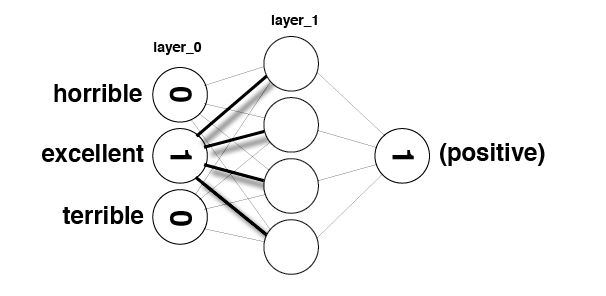

In [43]:
Image(filename='sentiment_network_sparse.png')

In [37]:
layer_0 = np.zeros(10)

In [38]:
layer_0

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [39]:
layer_0[4] = 1
layer_0[9] = 1

In [47]:
layer_0

array([0., 0., 0., 0., 1., 0., 0., 0., 0., 1.])

In [42]:
weights_0_1 = np.random.randn(10,5)
weights_0_1

array([[-1.37311732,  0.31515939,  0.84616065, -0.85951594,  0.35054598],
       [-1.31228341, -0.03869551, -1.61577235,  1.12141771,  0.40890054],
       [-0.02461696, -0.77516162,  1.27375593,  1.96710175, -1.85798186],
       [ 1.23616403,  1.62765075,  0.3380117 , -1.19926803,  0.86334532],
       [-0.1809203 , -0.60392063, -1.23005814,  0.5505375 ,  0.79280687],
       [-0.62353073,  0.52057634, -1.14434139,  0.80186103,  0.0465673 ],
       [-0.18656977, -0.10174587,  0.86888616,  0.75041164,  0.52946532],
       [ 0.13770121,  0.07782113,  0.61838026,  0.23249456,  0.68255141],
       [-0.31011677, -2.43483776,  1.0388246 ,  2.18697965,  0.44136444],
       [-0.10015523, -0.13644474, -0.11905419,  0.01740941, -1.12201873]])

In [83]:
layer_0.dot(weights_0_1)

array([-0.28107554, -0.74036537, -1.34911232,  0.5679469 , -0.32921186])

In [84]:
indices = [4,9]

In [113]:
layer_1 = np.zeros(5)
layer_1
for index in indices:
#     print("Wights before : ",weights_0_1[index])
    layer_1 += (weights_0_1[index])
#     print("Wights After : ",weights_0_1[index])
#     print("Layer 1 After Addition : ",layer_1)

In [114]:
layer_1

array([-0.28107554, -0.74036537, -1.34911232,  0.5679469 , -0.32921186])

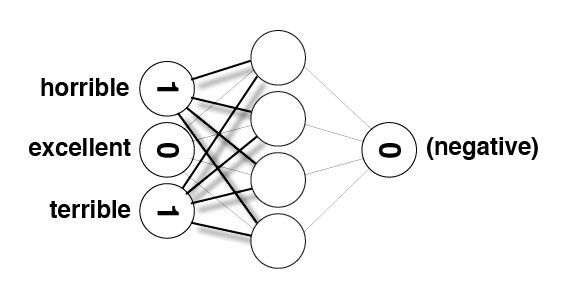

In [54]:
Image(filename='sentiment_network_sparse_2.png')

In [61]:
layer_1 = np.zeros(5)

In [62]:
for index in indices:
    layer_1 += (weights_0_1[index])

In [115]:
layer_1

array([-0.28107554, -0.74036537, -1.34911232,  0.5679469 , -0.32921186])

# Project 5: Making our Network More Efficient<a id='project_5'></a>
**TODO:** Make the `SentimentNetwork` class more efficient by eliminating unnecessary multiplications and additions that occur during forward and backward propagation. To do that, you can do the following:
* Copy the `SentimentNetwork` class from the previous project into the following cell.
* Remove the `update_input_layer` function - you will not need it in this version.
* Modify `init_network`:
>* You no longer need a separate input layer, so remove any mention of `self.layer_0`
>* You will be dealing with the old hidden layer more directly, so create `self.layer_1`, a two-dimensional matrix with shape 1 x hidden_nodes, with all values initialized to zero
* Modify `train`:
>* Change the name of the input parameter `training_reviews` to `training_reviews_raw`. This will help with the next step.
>* At the beginning of the function, you'll want to preprocess your reviews to convert them to a list of indices (from `word2index`) that are actually used in the review. This is equivalent to what you saw in the video when Andrew set specific indices to 1. Your code should create a local `list` variable named `training_reviews` that should contain a `list` for each review in `training_reviews_raw`. Those lists should contain the indices for words found in the review.
>* Remove call to `update_input_layer`
>* Use `self`'s  `layer_1` instead of a local `layer_1` object.
>* In the forward pass, replace the code that updates `layer_1` with new logic that only adds the weights for the indices used in the review.
>* When updating `weights_0_1`, only update the individual weights that were used in the forward pass.
* Modify `run`:
>* Remove call to `update_input_layer` 
>* Use `self`'s  `layer_1` instead of a local `layer_1` object.
>* Much like you did in `train`, you will need to pre-process the `review` so you can work with word indices, then update `layer_1` by adding weights for the indices used in the review.

In [ ]:
# TODO: -Copy the SentimentNetwork class from Projet 3 lesson
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        
        review_vocab = set()
        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words 
        #       using "split(' ')" instead of "split()".
        for review in reviews:
            for word in review.split(' '):
                review_vocab.add(word)
        
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        label_vocab = set()
        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.
        for label in labels:
            label_vocab.add(label)
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        for i,word in enumerate(self.review_vocab):
            self.word2index[word]=i 
            
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        # TODO: do the same thing you did for self.word2index and self.review_vocab, 
        #       but for self.label2index and self.label_vocab instead
        for i,label in enumerate(self.label_vocab):
            self.label2index[label]=i 
         
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((input_nodes,hidden_nodes))
        
        # TODO: initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
#         self.weights_1_2 = np.zeros((hidden_nodes,output_nodes))
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5, 
                                                (self.hidden_nodes, self.output_nodes))
        
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
        self.layer_1 = np.zeros((1,hidden_nodes))
                
    def get_target_for_label(self,label):
        # TODO: Copy the code you wrote for get_target_for_label 
        #       earlier in this notebook. 
        if label == "POSITIVE":
            return 1
        else : return 0
        
    def sigmoid(self,x):
        # TODO: Return the result of calculating the sigmoid activation function
        #       shown in the lectures
        return 1/(1+np.exp(-x)) 
    
    def sigmoid_output_2_derivative(self,output):
        # TODO: Return the derivative of the sigmoid activation function, 
        #       where "output" is the original output from the sigmoid fucntion 
        return output*(1-output)

    def train(self, training_reviews_raw, training_labels):
        
        training_reviews = list()
        for review in training_reviews_raw:
            indices = set()
            for word in review.split(" "):
                if(word in self.word2index.keys()):
                    indices.add(self.word2index[word])
            training_reviews.append(list(indices))
        
        # make sure out we have a matching number of reviews and labels
        assert (len(training_reviews) == len(training_labels))
            
                
            

        # Keep track of correct predictions to display accuracy during training
        correct_so_far = 0

        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):

            # TODO: Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            output = np.array(self.get_target_for_label(label))
            output = output.reshape((1,1))
            # print(review)
            # print(output)


            # TODO: Implement the forward pass through the network.
            #       That means use the given review to update the input layer,
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            #
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.

            # update_input_layer(review)
            # output = get_target_for_label(label)
            
            self.layer_1 *= 0
            for index in review:
                self.layer_1 += self.weights_0_1[index]

            hidden_layer_input = self.layer_1
            # print("Hidden Layer Input ",hidden_layer_input,"\nShape ",hidden_layer_input.shape)
            output_layer_input = np.dot(hidden_layer_input,self.weights_1_2)
            # print("Output Layer Input ", output_layer_input, "\nShape ", output_layer_input.shape)
            output_layer_output = self.sigmoid(output_layer_input)
            # print("Output Layer output ", output_layer_output, "\nShape ", output_layer_output.shape)
            # print("Actual output ", output, "\nShape ", output.shape)
            output_layer_error = output_layer_output - output
            # print("Output Layer Error ", output_layer_error, "\nShape ", output_layer_error.shape)
            output_layer_error_term = output_layer_error * self.sigmoid_output_2_derivative(output_layer_output)
            # print("Output Layer Error Term ", output_layer_error_term, "\nShape ", output_layer_error_term.shape)

            # TODO: Implement the back propagation pass here.
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you
            #       learned in class.


            # print("Weight Shape ",self.weights_1_2.shape)
            # print("Output Layer Error Term Shape ",output_layer_error_term.shape)
            hidden_layer_error = np.dot(output_layer_error_term,self.weights_1_2.T)
            # print("Hidden layer error ",hidden_layer_error," Shape ",hidden_layer_error.shape)
            hidden_layer_error_term = hidden_layer_error
            # print("Hidden layer error term",hidden_layer_error_term, " Shape ", hidden_layer_error_term.shape)

            delta_weight_h_o = np.zeros((self.hidden_nodes,self.output_nodes))
            # print("Hidden to output delta weight ", delta_weight_h_o, " Shape ", delta_weight_h_o.shape)
            # print("Output Layer Error term ",output_layer_error_term," Shape ",output_layer_error_term.shape)
            # print("Hidden Layer Output ",hidden_layer_input," Shape ",hidden_layer_input.shape)
            delta_weight_h_o += (output_layer_error_term*hidden_layer_input.T)
            # print("Hidden to output delta weight ", delta_weight_h_o, " Shape ", delta_weight_h_o.shape)
            # print("Weight Hidden to Output ",self.weights_1_2," Shape ",self.weights_1_2.shape)
            self.weights_1_2 -=delta_weight_h_o * self.learning_rate
            # print("Weight Hidden to Output ", self.weights_1_2, " Shape ", self.weights_1_2.shape)

            delta_weight_i_h = np.zeros((self.input_nodes,self.hidden_nodes))
            delta_weight_i_h += (hidden_layer_error_term * self.layer_0.T)
            self.weights_0_1 -= delta_weight_i_h * self.learning_rate
            # print("Weight Input to Hidden", self.weights_0_1, " Shape ", self.weights_0_1.shape)





            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error
            #       is less than 0.5. If so, add one to the correct_so_far count.

            # For debug purposes, print out our prediction accuracy and speed
            # throughout the training process.

            print("Layer2",output_layer_output)
            if (output_layer_output[0] >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif (output_layer_output[0] < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0

            sys.stdout.write("\rProgress:" + str(100 * i / float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i + 1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i + 1))[:4] + "%")
            if (i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        
        self.update_input_layer(review.lower())
        
        hidden_layer_input = np.dot(self.layer_0, self.weights_0_1)
        # print("Hidden Layer Input ",hidden_layer_input,"\nShape ",hidden_layer_input.shape)
        output_layer_input = np.dot(hidden_layer_input, self.weights_1_2)
        # print("Output Layer Input ", output_layer_input, "\nShape ", output_layer_input.shape)
        output_layer_output = self.sigmoid(output_layer_input)
        # print("Output Layer output ", output_layer_output, "\nShape ", output_layer_output.shape)
        # print("Actual output ", output, "\nShape ", output.shape)
        
        # TODO: The output layer should now contain a prediction. 
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`, 
        #       and `NEGATIVE` otherwise.
        if (output_layer_output[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"

Run the following cell to recreate the network and train it once again.

In [ ]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)
mlp.train(reviews[:-1000],labels[:-1000])

That should have trained much better than the earlier attempts. Run the following cell to test your model with 1000 predictions.

In [ ]:
mlp.test(reviews[-1000:],labels[-1000:])

# End of Project 5. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.
# Further Noise Reduction<a id='lesson_6'></a>

In [ ]:
Image(filename='sentiment_network_sparse_2.png')

In [ ]:
# words most frequently seen in a review with a "POSITIVE" label
pos_neg_ratios.most_common()

In [ ]:
# words most frequently seen in a review with a "NEGATIVE" label
list(reversed(pos_neg_ratios.most_common()))[0:30]

In [ ]:
from bokeh.models import ColumnDataSource, LabelSet
from bokeh.plotting import figure, show, output_file
from bokeh.io import output_notebook
output_notebook()

In [ ]:
hist, edges = np.histogram(list(map(lambda x:x[1],pos_neg_ratios.most_common())), density=True, bins=100, normed=True)

p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="Word Positive/Negative Affinity Distribution")
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], line_color="#555555")
show(p)

In [ ]:
frequency_frequency = Counter()

for word, cnt in total_counts.most_common():
    frequency_frequency[cnt] += 1

In [ ]:
hist, edges = np.histogram(list(map(lambda x:x[1],frequency_frequency.most_common())), density=True, bins=100, normed=True)

p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="The frequency distribution of the words in our corpus")
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], line_color="#555555")
show(p)

# Project 6: Reducing Noise by Strategically Reducing the Vocabulary<a id='project_6'></a>

**TODO:** Improve `SentimentNetwork`'s performance by reducing more noise in the vocabulary. Specifically, do the following:
* Copy the `SentimentNetwork` class from the previous project into the following cell.
* Modify `pre_process_data`:
>* Add two additional parameters: `min_count` and `polarity_cutoff`
>* Calculate the positive-to-negative ratios of words used in the reviews. (You can use code you've written elsewhere in the notebook, but we are moving it into the class like we did with other helper code earlier.)
>* Andrew's solution only calculates a postive-to-negative ratio for words that occur at least 50 times. This keeps the network from attributing too much sentiment to rarer words. You can choose to add this to your solution if you would like.  
>* Change so words are only added to the vocabulary if they occur in the vocabulary more than `min_count` times.
>* Change so words are only added to the vocabulary if the absolute value of their postive-to-negative ratio is at least `polarity_cutoff`
* Modify `__init__`:
>* Add the same two parameters (`min_count` and `polarity_cutoff`) and use them when you call `pre_process_data`

In [ ]:
# TODO: -Copy the SentimentNetwork class from Project 5 lesson
#       -Modify it according to the above instructions 

Run the following cell to train your network with a small polarity cutoff.

In [ ]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=20,polarity_cutoff=0.05,learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

And run the following cell to test it's performance. It should be 

In [ ]:
mlp.test(reviews[-1000:],labels[-1000:])

Run the following cell to train your network with a much larger polarity cutoff.

In [ ]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=20,polarity_cutoff=0.8,learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

And run the following cell to test it's performance.

In [ ]:
mlp.test(reviews[-1000:],labels[-1000:])

# End of Project 6. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Analysis: What's Going on in the Weights?<a id='lesson_7'></a>

In [ ]:
mlp_full = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=0,polarity_cutoff=0,learning_rate=0.01)

In [ ]:
mlp_full.train(reviews[:-1000],labels[:-1000])

In [ ]:
Image(filename='sentiment_network_sparse.png')

In [ ]:
def get_most_similar_words(focus = "horrible"):
    most_similar = Counter()

    for word in mlp_full.word2index.keys():
        most_similar[word] = np.dot(mlp_full.weights_0_1[mlp_full.word2index[word]],mlp_full.weights_0_1[mlp_full.word2index[focus]])
    
    return most_similar.most_common()

In [ ]:
get_most_similar_words("excellent")

In [ ]:
get_most_similar_words("terrible")

In [ ]:
import matplotlib.colors as colors

words_to_visualize = list()
for word, ratio in pos_neg_ratios.most_common(500):
    if(word in mlp_full.word2index.keys()):
        words_to_visualize.append(word)
    
for word, ratio in list(reversed(pos_neg_ratios.most_common()))[0:500]:
    if(word in mlp_full.word2index.keys()):
        words_to_visualize.append(word)

In [ ]:
pos = 0
neg = 0

colors_list = list()
vectors_list = list()
for word in words_to_visualize:
    if word in pos_neg_ratios.keys():
        vectors_list.append(mlp_full.weights_0_1[mlp_full.word2index[word]])
        if(pos_neg_ratios[word] > 0):
            pos+=1
            colors_list.append("#00ff00")
        else:
            neg+=1
            colors_list.append("#000000")

In [ ]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=0)
words_top_ted_tsne = tsne.fit_transform(vectors_list)

In [ ]:
p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="vector T-SNE for most polarized words")

source = ColumnDataSource(data=dict(x1=words_top_ted_tsne[:,0],
                                    x2=words_top_ted_tsne[:,1],
                                    names=words_to_visualize,
                                    color=colors_list))

p.scatter(x="x1", y="x2", size=8, source=source, fill_color="color")

word_labels = LabelSet(x="x1", y="x2", text="names", y_offset=6,
                  text_font_size="8pt", text_color="#555555",
                  source=source, text_align='center')
p.add_layout(word_labels)

show(p)

# green indicates positive words, black indicates negative words